Jared Hawkins - jmh7ax

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
from numpy import linalg
import seaborn as sns

1. Implement a function to fit a logistic regression using gradient ascent to maximize the like- lihood of the parameter β. Your implementation should take an n × d data matrix X and corresponding binary array y of n labels. As usual, you should implement this yourself, not using a library that does gradient ascent or logistic regression for you.
Use your function to fit a logistic regression to the OASIS hippocampus data from HW 1, with d = 2 features (left/right hippocampus volume) for x, and the Dementia diagnosis as the y labels. Use the same training and testing data split as before. Do the following:

In [2]:
df = pd.read_csv('OASIS-hippocampus.csv')
display(df)

,Unnamed: 0,ID,M.F,Hand,Age,Educ,SES,MMSE,CDR,eTIV,nWBV,ASF,Delay,RightHippoVol,LeftHippoVol,TrainData,Dementia
0,1,OAS1_0002_MR1,F,R,55,4,1.0,29,0.0,1147,0.810,1.531,NaN,4230,3807,0,0
1,2,OAS1_0003_MR1,F,R,73,4,3.0,27,0.5,1454,0.708,1.207,NaN,2896,2801,1,1
2,7,OAS1_0010_MR1,M,R,74,5,2.0,30,0.0,1636,0.689,1.073,NaN,2832,2578,0,0
3,8,OAS1_0011_MR1,F,R,52,3,2.0,30,0.0,1321,0.827,1.329,NaN,3978,4080,0,0
4,10,OAS1_0013_MR1,F,R,81,5,2.0,30,0.0,1664,0.679,1.055,NaN,3557,3495,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,399,OAS1_0453_MR1,F,R,70,1,4.0,29,0.5,1295,0.748,1.355,NaN,4037,3852,0,1
221,400,OAS1_0454_MR1,F,R,73,3,2.0,23,0.5,1536,0.730,1.142,NaN,3545,3337,0,1
222,401,OAS1_0455_MR1,F,R,61,2,4.0,28,0.0,1354,0.825,1.297,NaN,4427,4439,0,0
223,402,OAS1_0456_MR1,M,R,61,5,2.0,30,0.0,1637,0.780,1.072,NaN,4616,3978,0,0


(a) Scale all of your x data so that both features are in the range [0, 1]. Put these into a data matrix X adding a column of 1’s for the intercept. Randomly initialize your β estimate.

In [3]:
dfTrainTest = df.groupby('TrainData')

train = dfTrainTest.get_group(1)
test = dfTrainTest.get_group(0)

leftHippoVol = train['LeftHippoVol']
rightHippoVol = train['RightHippoVol']
dementia = np.array(train['Dementia'])

maxValue = max(max(leftHippoVol), max(rightHippoVol))
leftHippoVol = leftHippoVol / maxValue
rightHippoVol = rightHippoVol / maxValue

ones = np.ones(len(dementia))

X = np.array([ones, leftHippoVol, rightHippoVol]).T
    
print(X)
print(dementia)

[[1.         0.54472968 0.56320498]
 [1.         0.53870089 0.59354337]
 [1.         0.42143135 0.47160638]
 [1.         0.57117853 0.73376118]
 [1.         0.85744846 0.91812524]
 [1.         0.58829249 0.59023726]
 [1.         0.61299105 0.65733178]
 [1.         0.34189032 0.64935823]
 [1.         0.8689226  0.8949825 ]
 [1.         0.41676391 0.53403345]
 [1.         0.85258654 0.94243485]
 [1.         0.64799689 0.68436406]
 [1.         0.58129133 0.60560093]
 [1.         0.67172306 0.70731233]
 [1.         0.80318942 0.80066122]
 [1.         0.72676002 0.77032283]
 [1.         0.74970828 0.76837806]
 [1.         0.59451575 0.58829249]
 [1.         0.62485414 0.63243874]
 [1.         0.73064955 0.65052509]
 [1.         0.55620381 0.54025671]
 [1.         0.60812913 0.59840529]
 [1.         0.7596266  0.75223648]
 [1.         0.57292882 0.62213147]
 [1.         0.5579541  0.67969662]
 [1.         0.58887592 0.63088292]
 [1.         0.78646441 0.84772462]
 [1.         0.75165305 0.78

(b) You will have to tune the gradient ascent step size, δ. Pick an initial δ. Run your algorithm for a few iterations, watching the value of the log-likelihood. If it ever goes down, your step size is too big! Decrease it. If it goes up too slowly, your step size is too small! Increase it. Eventually you should settle on a step size that works well, and the algorithm will converge to gradient close to zero.

In [4]:
print(len(X))
delta = 0.04

betaList = []
for i in range(3):
    betaList.append(random.random())
beta = np.array(betaList)

def gradient(beta, X, dementia):
    gradientsList = []
    for i in range(len(beta)):
        sum = 0
        for j in range(len(X)):
            sum += (dementia[j] - 1 + (np.e ** (-(X[j].dot(beta)))) / (1 + np.e ** (-(X[j].dot(beta))))) * X[j][i]
        gradientsList.append(sum)
    return np.array(gradientsList)

def loglikelihood(beta, X, dementia):
    sum = 0
    for i in range(len(X)):
        sum += ((dementia[i] - 1)*(X[i].dot(beta)) - np.log(1 + (np.e) ** (-X[i].dot(beta))))
    return sum

gradients = gradient(beta, X, dementia)
n = linalg.norm(gradients)

logLikelihoods = []

while (n > .001):
    beta = beta + gradients * delta
    gradients = gradient(beta, X, dementia)
    n = linalg.norm(gradients)
    log = loglikelihood(beta, X, dementia)
    logLikelihoods.append(log)
    print(log)

print(gradients)

112
-98.55505476062366
-83.70297067236523
-84.24862590775327
-80.44904728040093
-80.86752786505598
-78.3663791481886
-78.67418146349766
-76.73373517057102
-76.95184341285444
-75.33390415192518
-75.47421712322488
-74.07640931114852
-74.14587382889508
-72.9171074419681
-72.92085153059877
-71.83279745970445
-71.77593408537716
-70.8111512770031
-70.69970580086066
-69.84602371554001
-69.68728769513456
-68.93496291540337
-68.73745343536518
-68.07771700021044
-67.85085691461073
-67.27521942227494
-67.02882715512193
-66.52881433738206
-66.27248666584342
-65.8396181216762
-65.58209482624764
-65.20799106144949
-64.95659605986773
-64.63314170422295
-64.3933904359455
-64.11290938854566
-63.88834821391199
-63.64376482594851
-63.436063699883924
-63.221034798366865
-63.030298954094754
-62.8393064050156
-62.66452456305181
-62.49292038996047
-62.33244451696217
-62.176443947069
-62.028406599270404
-61.885030644613956
-61.74764273059515
-61.61461986483156
-61.486336150268045
-61.361979153846505
-61.24155

-55.77326683799199
-55.7731012930898
-55.77293782389166
-55.77277640350378
-55.7726170053922
-55.77245960337805
-55.77230417163232
-55.772150684671246
-55.77199911735129
-55.77184944486453
-55.77170164273385
-55.77155568680862
-55.77141155325974
-55.77126921857565
-55.771128659557604
-55.77098985331541
-55.77085277726312
-55.77071740911506
-55.77058372688131
-55.77045170886394
-55.77032133365272
-55.77019258012138
-55.77006542742361
-55.76993985498904
-55.769815842519805
-55.7696933699863
-55.769572417624126
-55.76945296592986
-55.76933499565772
-55.76921848781603
-55.76910342366394
-55.76898978470754
-55.76887755269673
-55.76876670962205
-55.768657237711054
-55.768549119425366
-55.768442337457294
-55.768336874726764
-55.768232714378144
-55.768129839777416
-55.768028234508776
-55.767927882372035
-55.76782876737951
-55.76773087375312
-55.76763418592165
-55.76753868851776
-55.76744436637546
-55.7673512045272
-55.76725918820122
-55.767168302819044
-55.76707853399263
-55.76698986752196
-55

-55.759574910407856
-55.759573086372676
-55.75957127420965
-55.75956947379748
-55.759567685016385
-55.759565907748005
-55.75956414187527
-55.75956238728262
-55.75956064385578
-55.75955891148184
-55.75955719004917
-55.759555479447606
-55.7595537795681
-55.75955209030302
-55.75955041154583
-55.75954874319144
-55.75954708513589
-55.75954543727643
-55.75954379951153
-55.759542171740925
-55.75954055386539
-55.759538945787
-55.75953734740881
-55.759535758635174
-55.75953417937151
-55.75953260952429
-55.75953104900113
-55.7595294977107
-55.75952795556273
-55.759526422468056
-55.7595248983385
-55.75952338308694
-55.759521876627275
-55.75952037887431
-55.759518889744
-55.75951740915319
-55.75951593701966
-55.759514473262136
-55.75951301780046
-55.75951157055517
-55.759510131447925
-55.759508700401135
-55.75950727733819
-55.759505862183346
-55.75950445486173
-55.75950305529938
-55.75950166342313
-55.75950027916071
-55.75949890244062
-55.75949753319228
-55.75949617134578
-55.759494816832216
-55.7

-55.75921785568858
-55.759217477604054
-55.7592171004175
-55.759216724126475
-55.759216348728536
-55.75921597422125
-55.75921560060225
-55.759215227869056
-55.75921485601938
-55.75921448505071
-55.75921411496076
-55.75921374574716
-55.759213377407534
-55.759213009939536
-55.759212643340845
-55.7592122776091
-55.75921191274202
-55.759211548737326
-55.75921118559265
-55.75921082330571
-55.75921046187426
-55.75921010129613
-55.75920974156881
-55.75920938269025
-55.759209024658105
-55.75920866747027
-55.75920831112435
-55.7592079556182
-55.759207600949644
-55.75920724711639
-55.75920689411639
-55.75920654194733
-55.75920619060706
-55.7592058400935
-55.75920549040441
-55.759205141537635
-55.75920479349106
-55.75920444626252
-55.75920409984996
-55.75920375425119
-55.759203409464114
-55.75920306548659
-55.7592027223166
-55.75920237995205
-55.759202038390846
-55.75920169763087
-55.75920135767012
-55.75920101850644
-55.759200680137916
-55.75920034256244
-55.75920000577791
-55.759199669782454
-5

-55.75911346653856
-55.75911333015454
-55.75911319408291
-55.75911305832298
-55.75911292287402
-55.75911278773532
-55.759112652906126
-55.75911251838585
-55.75911238417366
-55.759112250268885
-55.75911211667082
-55.75911198337883
-55.75911185039206
-55.759111717709956
-55.75911158533176
-55.75911145325676
-55.759111321484276
-55.75911119001361
-55.75911105884405
-55.75911092797495
-55.7591107974056
-55.759110667135296
-55.75911053716332
-55.75911040748909
-55.75911027811185
-55.759110149030946
-55.75911002024566
-55.75910989175535
-55.759109763559294
-55.759109635656884
-55.75910950804739
-55.75910938073015
-55.75910925370454
-55.75910912696982
-55.75910900052536
-55.75910887437053
-55.75910874850458
-55.75910862292692
-55.759108497636845
-55.7591083726337
-55.759108247916856
-55.75910812348563
-55.7591079993394
-55.759107875477476
-55.75910775189916
-55.759107628603914
-55.75910750559104
-55.75910738285984
-55.7591072604097
-55.75910713824004
-55.75910701635009
-55.75910689473933
-55.

-55.75907474776421
-55.75907470002159
-55.759074652388186
-55.75907460486382
-55.75907455744815
-55.75907451014103
-55.75907446294215
-55.759074415851316
-55.75907436886821
-55.759074321992614
-55.759074275224314
-55.759074228563044
-55.75907418200848
-55.75907413556057
-55.75907408921888
-55.75907404298326
-55.75907399685339
-55.75907395082911
-55.7590739049102
-55.75907385909635
-55.75907381338731
-55.759073767782894
-55.75907372228285
-55.759073676886864
-55.75907363159484
-55.75907358640637
-55.759073541321406
-55.759073496339575
-55.759073451460644
-55.75907340668447
-55.75907336201074
-55.75907331743924
-55.75907327296972
-55.75907322860194
-55.7590731843357
-55.75907314017076
-55.759073096106924
-55.75907305214388
-55.759073008281455
-55.75907296451944
-55.75907292085751
-55.7590728772955
-55.75907283383318
-55.759072790470285
-55.75907274720671
-55.75907270404204
-55.759072660976194
-55.759072618008915
-55.75907257513993
-55.75907253236901
-55.75907248969604
-55.759072447120666

(c) Your function should save the log-likelihood values each iteration. Plot the log-likelihood (vertical axis) as a function of the iteration number (horizontal axis). This plot should be increasing and flatten out if your algorithm converges correctly.

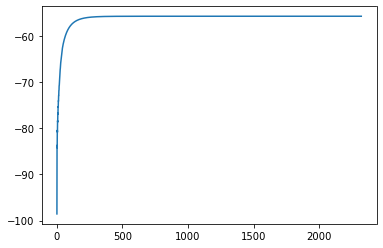

In [8]:
plt.plot(logLikelihoods)

(d) Plot a 2D scatterplot of the x training data points, with two different colors for healthy and dementia subjects. Then, draw a line corresponding to your classifier prediction p(y = 1 | x) = 0.5. (This is your classifier’s estimated separating line between the two classes that we discussed in class.)

/Users/jaredhawkins/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='LeftHippoVol', ylabel='LeftHippoVol'>

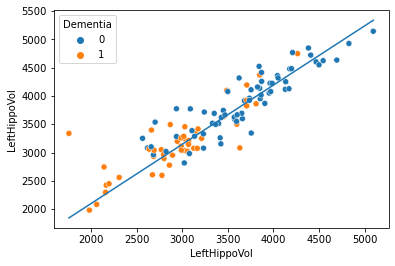

In [221]:
x = train['LeftHippoVol']
y = beta[0] + beta[1] * x / beta[2]
sns.lineplot(x, y)
sns.scatterplot(x = 'LeftHippoVol', y = 'RightHippoVol', hue = "Dementia", data = train)

(e) Use your estimated logistic regression model to predict the Dementia diagnosis from the testing data x features. What is your final accuracy? How does it compare to the accuracy you got in HW 1 with na ̈ıeve Bayes?

In [10]:
leftTest = test['LeftHippoVol'] / maxValue
rightTest = test['RightHippoVol'] / maxValue
dementiaTest = np.array(test['Dementia'])

ones = np.ones(len(leftTest))

testData = np.array([ones, leftTest, rightTest]).T

def sigmoid(t):
    return 1 / (1 + np.e ** (-t))

testN = len(testData)

total = 0
for i in range(testN):
    temp = beta.dot(testData[i])
    s = sigmoid(temp)
    if s > 0.5:
        if dementiaTest[i] == 1:
            total += 1
    else:
        if dementiaTest[i] == 0:
            total += 1
accuracy = total / testN * 100

print (total)
print(accuracy, "% accuracy")

78
69.02654867256636 % accuracy


This accuracy is slightly lower than my naive bayes, which was ~72%, but they are very similar.

2. In this part you will run your logistic regression model on a higher-dimensional example, the CIFAR-10 dataset. This is a collection of 32 × 32 color images of 10 classes (bird, cat, dog, truck, etc.), which is often used in machine learning and computer vision research. Download the CIFAR-10 image data (Python version) from this website:
                 https://www.cs.toronto.edu/~kriz/cifar.html
Your goal is to build a classifier that can recognize the difference between images of airplanes and frogs.

(a) Read in the file data batch 1, containing 10,000 training data images and their class labels. Flatten images to be row vectors in a data matrix. Note: images are originally 3 × 32 × 32 = 3,072, where you have 3 color channels and 32 pixels in width and height. In the end, you should have a data matrix of size 10,000 × 3,072. The corresponding class labels (each a digit from 0-9) will be a vector of size 10,000. You may use the example code that is provided on the course webpage to do this step.

In [183]:
import numpy as np
import pickle

def readCIFAR(filename):
    with open(filename, mode='rb') as file:
        data = pickle.load(file, encoding='bytes')

    # Get the raw images.
    raw_images = data[b'data']

    # Get the class-numbers for each image. Convert to numpy-array.
    y = np.array(data[b'labels'])

    # Convert the raw images from the data-files to floating-points.
    raw_float = np.array(raw_images, dtype=float) / 255.0

    # Reshape the array to 4-dimensions.
    images = raw_float.reshape([-1, 3, 32, 32])

    # Reorder the indices of the array.
    images = images.transpose([0, 2, 3, 1])

    X2 = images.reshape((images.shape[0], 3*32*32))
    return X2, y

# Example usage: read batch 1 for training
X2, y = readCIFAR("data_batch_1") 

(b) Run your logistic regression fit using just the data with airplanes (class label 0) and frogs (class label 6). Repeat the same process as before to find a step size that gets your gradient ascent to converge.

In [131]:
X06 = []
y06 = []

for i in range(len(y)):
    if (y[i] == 0):
        X06.append(X2[i])
        y06.append(0)
    if (y[i] == 6):
        X06.append(X2[i])
        y06.append(1)

X06 = np.array(X06)
y06 = np.array(y06)
y06 = y06 / 1.0

delta2 = .00001

betaList2 = []
for i in range(3072):
    betaList2.append(0)
beta2 = np.array(betaList2)

def gradient2(beta, X, y):
    xb = np.matmul(X, beta) * -1.0
    left = y - 1.0
    right = np.exp(xb) / (1.0 + np.exp(xb))
    arr = np.array(left + right)
    total = arr.dot(X)
    return total

def loglike2(beta, X, y):
    xb = np.matmul(X, beta)
    total = np.sum(np.matmul(y - 1, xb)) - np.sum(np.log(1 + np.exp(-xb)))
    return total

gradients2 = gradient2(beta2, X06, y06)
n2 = linalg.norm(gradients2)

logLikelihoods2 = []

while (n2 > 1):
    beta2 = beta2 + gradients2 * delta2
    gradients2 = gradient2(beta2, X06, y06)
    n2 = linalg.norm(gradients2)
    log = loglike2(beta2, X06, y06)
    logLikelihoods2.append(log) 
    print(n2)


10426.541208482637
23574.374259050852
22985.596839947942
22082.93127581814
22635.270561236888
22688.714199289785
22443.380627657873
21468.99224714561
21894.891297349426
21617.490418180165
21497.51959863375
20545.13901542463
20740.465892922886
20193.518246407963
20097.737219936287
19230.13863245752
19200.630190575823
18484.221791027416
18341.284766176577
17548.847544429053
17378.08245656262
16624.969333474743
16411.07827106723
15672.943422570745
15431.79390037346
14724.57650233928
14464.578233130878
13792.747112119026
13521.605054392288
12888.44409302206
12612.162562675936
12018.88758465538
11741.952646705033
11188.24554964841
10913.887121212605
10398.380545799406
10128.838213759558
9649.50985652494
9386.264573310647
8940.731465143745
8684.698131966152
8270.429727232098
8022.115664191628
7636.586974628337
7396.221949232535
7037.022333639792
6804.664312798746
6469.572108947333
6245.191628620087
5932.221435688401
5715.766868657406
5423.1945896923935
5214.640386307606
4941.0103074219805
47

106.178099128573
106.06452289278872
105.9512811261176
105.83837236097109
105.72579513988296
105.61354801540416
105.50162954999907
105.39003831594299
105.27877289522134
105.16783187942956
105.05721386967485
104.94691747647883
104.83694131968173
104.72728402834757
104.61794424067062
104.50892060388323
104.40021177416448
104.29181641655047
104.18373320484544
104.07596082153394
103.96849795769445
103.8613433129138
103.75449559520285
103.64795352091323
103.541715814655
103.43578120921543
103.33014844547883
103.2248162723474
103.1197834466631
103.01504873313024
102.91061090423942
102.80646874019226
102.7026210288269
102.59906656554477
102.49580415323798
102.39283260221771
102.29015073014358
102.18775736195374
102.08565132979598
101.98383147295951
101.88229663780784
101.78104567771214
101.68007745298573
101.57939083081932
101.47898468521676
101.37885789693205
101.27900935340664
101.17943794870787
101.08014258346802
100.98112216482394
100.88237560635767
100.78390182803776
100.68569975616096
10

74.47032080671983
74.43364757294339
74.39704266041797
74.3605058807251
74.32403704605831
74.28763596922082
74.25130246362339
74.21503634328204
74.1788374228159
74.1427055174449
74.10664044298765
74.07064201585922
74.03471005306899
73.9988443722184
73.9630447914989
73.9273111296897
73.89164320615569
73.8560408408453
73.8205038542883
73.78503206759379
73.74962530244805
73.71428338111241
73.67900612642113
73.6437933617795
73.60864491116155
73.57356059910809
73.53854025072465
73.50358369167944
73.46869074820124
73.43386124707747
73.3990950156522
73.36439188182385
73.32975167404362
73.29517422131315
73.26065935318266
73.22620689974902
73.19181669165367
73.1574885600807
73.1232223367549
73.08901785393991
73.05487494443604
73.02079344157855
72.98677317923571
72.95281399180675
72.91891571422006
72.88507818193132
72.85130123092144
72.8175846976949
72.78392841927767
72.75033223321557
72.71679597757212
72.6833194909269
72.64990261237362
72.61654518151836
72.58324703847762
72.55000802387656
72.516

62.06179522837182
62.04420237605917
62.026630126739036
62.009078436639406
61.99154726210711
61.97403655960731
61.95654628572328
61.93907639715595
61.92162685072358
61.90419760336137
61.8867886121212
61.86939983417113
61.852031226795155
61.834682747392776
61.81735435347868
61.800046002682365
61.78275765274785
61.76548926153328
61.748240787010495
61.73101218726483
61.7138034204947
61.696614445011235
61.67944521923794
61.66229570171036
61.645165851075795
61.62805562609284
61.61096498563116
61.59389388867104
61.57684229430317
61.559810161728194
61.54279745025641
61.525804119307566
61.50883012841025
61.49187543720185
61.474940005427975
61.45802379294234
61.441126759706265
61.424248865788435
61.40739007136461
61.39055033671716
61.37372962223486
61.35692788841254
61.34014509585077
61.32338120525546
61.30663617743766
61.289909973313144
61.27320255390214
61.25651388032903
61.239843913821964
61.2231926157126
61.206559947435764
61.18994587052918
61.17335034663309
61.15677333749002
61.140214804944

55.66546600322263
55.65408803854779
55.64271895011927
55.63135872386998
55.6200073457647
55.60866480180007
55.5973310780045
55.58600616043809
55.574690035192475
55.56338268839081
55.55208410618767
55.540794274768956
55.529513180351834
55.51824080918458
55.50697714754664
55.49572218174836
55.48447589813105
55.47323828306682
55.46200932295855
55.450789004239766
55.439577313374585
55.428374236857636
55.417179761213916
55.4059938729988
55.39481655879791
55.38364780522704
55.37248759893207
55.361335926588865
55.35019277490326
55.33905813061094
55.32793198047734
55.316814311297584
55.305705109896444
55.294604363128144
55.28351205787646
55.27242818105447
55.26135271960459
55.25028566049841
55.23922699073671
55.22817669734931
55.21713476739499
55.206101187961465
55.19507594616526
55.1840590291517
55.173050424094704
55.16205011819688
55.1510580986893
55.14007435283146
55.129098867911324
55.11813163124507
55.10717263017713
55.09622185208004
55.08527928435448
55.07434491442907
55.06341872976034
5

51.264699394180155
51.256267021746915
51.24783945086052
51.23941667595076
51.2309986914576
51.222585491831225
51.21417707153205
51.205773425030536
51.19737454680738
51.18898043135335
51.180591073169296
51.172206466766156
51.16382660666483
51.155451487396356
51.14708110350164
51.13871544953165
51.13035452004722
51.12199830961919
51.11364681282825
51.10530002426495
51.09695793852973
51.08862055023283
51.08028785399429
51.071959844444
51.063636516221536
51.05531786397625
51.0470038823672
51.03869456606312
51.030389909742446
51.02208990809325
51.01379455581322
51.00550384760969
50.997217778199484
50.98893634230906
50.98065953467439
50.97238735004098
50.9641197831638
50.955856828807306
50.94759848174539
50.9393447367614
50.93109558864804
50.92285103220743
50.91461106225106
50.90637567359972
50.898144861083566
50.88991861954203
50.88169694382381
50.87347982878683
50.86526726929833
50.8570592602347
50.848855796481516
50.84065687293353
50.83246248449468
50.824272626077956
50.816087292605516
50

47.55347358268023
47.5469103987476
47.54035013817206
47.53379279847128
47.527238377166356
47.520686871782004
47.514138279846335
47.50759259889091
47.501049826450846
47.49450996006461
47.487972997274234
47.48143893562512
47.474907772666135
47.46837950594955
47.46185413303115
47.45533165147005
47.448812058828764
47.44229535267335
47.4357815305731
47.42927059010078
47.42276252883256
47.416257344347976
47.4097550342299
47.4032555960646
47.39675902744172
47.39026532595425
47.383774489198515
47.377286514774156
47.37080140028422
47.36431914333504
47.357839741536246
47.35136319250082
47.344889493845066
47.33841864318856
47.33195063815418
47.325485476368115
47.31902315545979
47.312563673061945
47.306107026810615
47.29965321434503
47.29320223330777
47.286754081344554
47.280308756104475
47.27386625523975
47.26742657640591
47.26098971726167
47.254555675468985
47.24812444869302
47.24169603460216
47.23527043086795
47.2288476351652
47.22242764517187
47.2160104585691
47.209596073041205
47.203184486275

44.85748764404813
44.85203451303842
44.846583458940145
44.841134480341935
44.83568757583403
44.83024274400821
44.82479998345784
44.819359292777854
44.81392067056472
44.808484115416434
44.80304962593261
44.79761720071434
44.79218683836433
44.78675853748673
44.781332296687374
44.77590811457353
44.770485989754015
44.76506592083918
44.75964790644097
44.75423194517275
44.74881803564953
44.74340617648773
44.737996366305396
44.732588603722
44.72718288735861
44.72177921583774
44.71637758778347
44.710978001821374
44.70558045657852
44.70018495068344
44.69479148276629
44.68940005145862
44.684010655393486
44.678623293205476
44.67323796353068
44.66785466500661
44.662473396272354
44.65709415596841
44.6517169427368
44.64634175522102
44.64096859206605
44.635597451918315
44.63022833342577
44.62486123523776
44.61949615600519
44.614133094380364
44.60877204901711
44.603413018570635
44.59805600169769
44.59270099705641
44.58734800330648
44.581997019108925
44.57664804312632
44.5713010740226
44.56595611046323

42.571227747751834
42.56659451362167
42.56196284410238
42.55733273829755
42.552704195311605
42.54807721424977
42.54345179421807
42.53882793432334
42.534205633673174
42.529584891376025
42.52496570654108
42.520348078278396
42.51573200569877
42.511117487913815
42.50650452403592
42.5018931131783
42.497283254454935
42.49267494698059
42.48806818987087
42.483462982242095
42.47885932321142
42.47425721189679
42.46965664741692
42.465057628891294
42.46046015544021
42.455864226184715
42.45126984024668
42.44667699674876
42.442085694814274
42.4374959335675
42.43290771213335
42.4283210296376
42.42373588520673
42.41915227796805
42.41457020704964
42.4099896715803
42.40541067068966
42.400833203508064
42.396257269166696
42.391682866797474
42.387109995533045
42.38253865450688
42.37796884285318
42.373400559706944
42.36883380420388
42.364268575480516
42.35970487267412
42.355142694922705
42.35058204136503
42.34602291114068
42.34146530338994
42.33690921725385
42.332354651874226
42.32780160639365
42.3232500799

40.63202833220035
40.62801919840307
40.62401129368661
40.620004617431675
40.61599916901946
40.6119949478316
40.60799195325019
40.60399018465785
40.599989641437574
40.595990322972895
40.591992228647776
40.58799535784665
40.58399970995443
40.580005284356446
40.576012080438545
40.572020097587
40.568029335188555
40.56403979263041
40.56005146930024
40.55606436458615
40.55207847787675
40.548093808561056
40.544110356028575
40.54012811966929
40.53614709887356
40.53216729303232
40.52818870153685
40.52421132377894
40.520235159150836
40.51626020704522
40.512286466855265
40.50831393797453
40.50434261979708
40.500372511717444
40.49640361313054
40.49243592343179
40.48846944201707
40.484504168282676
40.48054010162537
40.47657724144235
40.47261558713128
40.46865513809028
40.464695893717895
40.460737853413136
40.45678101657543
40.452825382604686
40.44887095090127
40.44491772086591
40.44096569189991
40.43701486340492
40.433065234783044
40.42911680543685
40.42516957476938
40.42122354218407
40.41727870708

38.92941768550766
38.92590931754485
38.9224019387245
38.91889554859633
38.915390146710365
38.91188573261697
38.908382305866745
38.9048798660106
38.901378412599755
38.897877945185705
38.894378463320265
38.89087996655551
38.88738245444382
38.883885926537886
38.88039038239064
38.876895821555394
38.873402243585666
38.869909648035325
38.86641803445847
38.86292740240953
38.85943775144326
38.85594908111463
38.85246139097897
38.848974680591816
38.84548894950908
38.84200419728692
38.83852042348179
38.83503762765044
38.83155580934988
38.82807496813744
38.82459510357074
38.821116215207674
38.817638302606404
38.81416136532544
38.810685402923475
38.8072104149596
38.803736400993145
38.800263360583706
38.7967912932912
38.793320198675815
38.78985007629801
38.78638092571854
38.78291274649848
38.77944553819913
38.775979300382104
38.77251403260929
38.769049734442895
38.76558640544535
38.76212404517942
38.75866265320815
38.75520222909481
38.75174277240301
38.74828428269665
38.744826759539876
38.7413702024

37.38539615534924
37.38230683120503
37.3792183133166
37.376130601346915
37.37304369495913
37.36995759381659
37.36687229758286
37.363787805921675
37.36070411849697
37.35762123497288
37.35453915501378
37.351457878284144
37.34837740444872
37.34529773317243
37.34221886412039
37.33914079695789
37.336063531350455
37.33298706696379
37.32991140346376
37.32683654051647
37.3237624777882
37.32068921494544
37.31761675165482
37.314545087583234
37.31147422239773
37.30840415576556
37.30533488735417
37.3022664168312
37.29919874386446
37.296131868121996
37.293065789272
37.29000050698289
37.28693602092326
37.28387233076191
37.280809436167814
37.27774733681016
37.2746860323583
37.27162552248181
37.26856580685041
37.26550688513408
37.26244875700291
37.25939142212726
37.25633488017761
37.2532791308247
37.250224173739404
37.2471700085928
37.24411663505619
37.24106405280101
37.238012261498916
37.23496126082177
37.231911050441624
37.22886163003065
37.2258129992613
37.222765157806165
37.21971810533802
37.21667

36.0663620894959
36.06360559911054
36.06084978052881
36.05809463348876
36.055340157728516
36.05258635298639
36.04983321900078
36.04708075551029
36.04432896225361
36.04157783896959
36.038827385397234
36.03607760127565
36.03332848634409
36.030580040341995
36.0278322630089
36.02508515408444
36.02233871330851
36.01959294042099
36.016847835162025
36.01410339727187
36.01135962649084
36.00861652255947
36.00587408521842
36.00313231420847
36.00039120927054
35.9976507701457
35.994910996575136
35.9921718883002
35.98943344506236
35.986695666603204
35.98395855266453
35.9812221029882
35.97848631731622
35.975751195390764
35.973016736954115
35.97028294174874
35.967549809517166
35.96481734000213
35.96208553294645
35.95935438809312
35.956623905185246
35.953894083966105
35.951164924179054
35.94843642556761
35.945708587875444
35.942981410846365
35.940254894224275
35.93752903775326
35.934803841177505
35.932079304241356
35.929355426689256
35.92663220826587
35.923909648715885
35.9211877477842
35.918466505215

34.76928602195786
34.766834852192304
34.76438423902032
34.76193418223894
34.75948468164529
34.75703573703664
34.75458734821028
34.75213951496367
34.74969223709433
34.7472455143999
34.744799346678114
34.74235373372678
34.73990867534387
34.7374641713274
34.73502022147547
34.732576825586364
34.73013398345835
34.72769169488989
34.7252499596795
34.722808777625815
34.72036814852753
34.717928072183476
34.71548854839259
34.713049576953885
34.71061115766646
34.70817329032957
34.70573597474248
34.70329921070464
34.70086299801553
34.69842733647478
34.695992225882094
34.69355766603727
34.69112365674023
34.68869019779094
34.686257288989516
34.68382493013617
34.68139312103118
34.67896186147493
34.67653115126792
34.67410099021075
34.671671378104094
34.66924231474872
34.666813799945515
34.66438583349547
34.66195841519964
34.65953154485921
34.657105222275455
34.6546794472497
34.652254219583455
34.64982953907825
34.647405405535764
34.64498181875772
34.64255877854601
34.640136284702535
34.637714337029365

33.71736684854864
33.715147520889346
33.71292866752483
33.71071028829133
33.70849238302526
33.706274951562996
33.70405799374109
33.70184150939611
33.69962549836472
33.69740996048367
33.695194895589744
33.69298030351986
33.69076618411096
33.688552537200096
33.686339362624366
33.684126660220976
33.681914429827195
33.67970267128032
33.677491384417806
33.675280569077124
33.67307022509585
33.6708603523116
33.66865095056212
33.66644201968517
33.664233559518635
33.662025569900436
33.659818050668584
33.657611001661195
33.655404422716394
33.65319831367243
33.650992674367636
33.648787504640374
33.64658280432911
33.64437857327236
33.64217481130876
33.63997151827699
33.63776869401578
33.635566338364
33.633364451160546
33.63116303224438
33.62896208145456
33.626761598630225
33.62456158361057
33.62236203623486
33.62016295634248
33.617964343772805
33.61576619836538
33.61356851995974
33.611371308395555
33.609174563512525
33.60697828515045
33.60478247314919
33.6025871273487
33.600392247588985
33.5981978

32.71583588989617
32.71382427341194
32.71181306138228
32.70980225367485
32.70779185015742
32.7057818506978
32.70377225516384
32.70176306342347
32.69975427534467
32.69774589079549
32.695737909644016
32.69373033175839
32.691723157006855
32.689716385257654
32.687710016379114
32.685704050239636
32.68369848670765
32.68169332565166
32.679688566940214
32.677684210441925
32.67568025602549
32.673676703559615
32.67167355291308
32.66967080395473
32.66766845655348
32.66566651057828
32.66366496589814
32.66166382238214
32.6596630798994
32.65766273831911
32.65566279751051
32.653663257342906
32.651664117685634
32.64966537840814
32.64766703937989
32.64566910047037
32.6436715615492
32.64167442248602
32.63967768315052
32.63768134341245
32.635685403141636
32.63368986220794
32.63169472048127
32.629699977831635
32.62770563412906
32.62571168924362
32.6237181430455
32.62172499540487
32.61973224619203
32.61773989527729
32.61574794253099
32.61375638782363
32.611765231025636
32.60977447200759
32.60778411064009
3

31.83667767640793
31.834837970203246
31.832998613550476
31.831159606340723
31.829320948465227
31.82748263981518
31.825644680281865
31.8238070697566
31.821969808130742
31.8201328952957
31.818296331142946
31.81646011556396
31.814624248450283
31.812788729693526
31.81095355918531
31.809118736817307
31.807284262481286
31.805450136068956
31.80361635747218
31.8017829265828
31.799949843292698
31.79811710749386
31.79628471907827
31.794452677937976
31.792620983965037
31.790789637051606
31.788958637089863
31.787127983972013
31.785297677590318
31.78346771783709
31.781638104604692
31.779808837785527
31.777979917272013
31.776151342956666
31.774323114732006
31.772495232490613
31.7706676961251
31.76884050552815
31.767013660592454
31.765187161210797
31.76336100727595
31.761535198680775
31.759709735318157
31.757884617081036
31.756059843862378
31.754235415555222
31.7524113320526
31.750587593247676
31.748764199033566
31.746941149303485
31.745118443950684
31.743296082868437
31.741474065950076
31.7396523930

31.047634253499332
31.045940579934374
31.044247211459034
31.042554147982592
31.040861389414392
31.039168935663778
31.037476786640145
31.035784942252935
31.034093402411603
31.032402167025676
31.03071123600466
31.029020609258172
31.027330286695776
31.025640268227168
31.02395055376203
31.02226114321004
31.02057203648098
31.018883233484647
31.01719473413088
31.015506538329507
31.013818645990465
31.012131057023687
31.01044377133911
31.008756788846778
31.007070109456727
31.005383733079046
31.00369765962382
31.00201188900123
31.000326421121457
30.998641255894725
30.996956393231283
30.995271833041436
30.993587575235523
30.99190361972388
30.99021996641694
30.988536615225126
30.98685356605891
30.985170818828816
30.983488373445383
30.981806229819174
30.980124387860826
30.978442847480984
30.97676160859033
30.975080671099587
30.973400034919525
30.971719699960918
30.970039666134625
30.968359933351483
30.9666805015224
30.965001370558316
30.963322540370196
30.961644010869048
30.959965781965927
30.9582

30.325955528113713
30.324388622884786
30.322821985866753
30.321255616983333
30.319689516158316
30.318123683315484
30.316558118378683
30.31499282127174
30.313427791918564
30.311863030243043
30.31029853616914
30.308734309620814
30.307170350522068
30.305606658796947
30.30404323436949
30.30248007716379
30.300917187103995
30.29935456411419
30.297792208118597
30.2962301190414
30.29466829680685
30.293106741339198
30.291545452562733
30.289984430401773
30.288423674780688
30.28686318562384
30.285302962855642
30.283743006400528
30.28218331618296
30.280623892127437
30.27906473415849
30.27750584220066
30.275947216178533
30.27438885601671
30.27283076163985
30.271272932972604
30.269715369939675
30.268158072465784
30.266601040475688
30.26504427389417
30.263487772646066
30.261931536656164
30.26037556584938
30.258819860150595
30.257264419484734
30.255709243776764
30.254154332951643
30.25259968693442
30.251045305650116
30.249491189023818
30.247937336980595
30.246383749445584
30.244830426343963
30.2432773

29.6512029424695
29.649748737050484
29.64829476848034
29.646841036694642
29.645387541628974
29.643934283218936
29.642481261400164
29.641028476108303
29.639575927279058
29.638123614848116
29.63667153875119
29.635219698924047
29.633768095302464
29.632316727822218
29.630865596419145
29.629414701029095
29.627964041587937
29.626513618031556
29.625063430295864
29.623613478316795
29.622163762030333
29.62071428137247
29.61926503627918
29.61781602668654
29.616367252530573
29.61491871374738
29.61347041027306
29.612022342043733
29.610574508995573
29.60912691106474
29.607679548187456
29.606232420299893
29.60478552733835
29.603338869239067
29.60189244593835
29.600446257372507
29.599000303477904
29.597554584190867
29.596109099447805
29.59466384918513
29.593218833339254
29.59177405184667
29.59032950464383
29.58888519166726
29.587441112853472
29.58599726813902
29.584553657460475
29.583110280754447
29.581667137957556
29.58022422900643
29.578781553837768
29.577339112388216
29.575896904594533
29.57445493

29.007628025795558
29.00627612325872
29.004924430333507
29.003572946965345
29.00222167309972
29.000870608682103
28.999519753658003
28.998169107972945
28.99681867157246
28.9954684444021
28.994118426407464
28.992768617534143
28.99141901772775
28.990069626933924
28.988720445098338
28.987371472166636
28.986022708084555
28.984674152797766
28.98332580625203
28.981977668393082
28.98062973916672
28.979282018518713
28.97793450639489
28.97658720274106
28.97524010750309
28.97389322062684
28.972546542058208
28.971200071743088
28.969853809627413
28.968507755657125
28.967161909778202
28.965816271936607
28.964470842078356
28.963125620149473
28.961780606095992
28.960435799863983
28.959091201399517
28.957746810648686
28.956402627557612
28.955058652072466
28.953714884139355
28.95237132370449
28.951027970714037
28.949684825114222
28.948341886851285
28.94699915587147
28.94565663212105
28.944314315546308
28.94297220609357
28.941630303709154
28.940288608339397
28.938947119930674
28.937605838429363
28.936264

28.38436815341936
28.38311055931596
28.381853150813928
28.38059592786708
28.379338890429263
28.37808203845434
28.376825371896174
28.37556889070865
28.374312594845676
28.373056484261173
28.371800558909076
28.370544818743333
28.369289263717906
28.368033893786787
28.366778708903958
28.36552370902344
28.364268894099276
28.3630142640855
28.361759818936164
28.360505558605357
28.35925148304717
28.3579975922157
28.356743886065082
28.355490364549453
28.354237027622954
28.35298387523978
28.35173090735409
28.350478123920105
28.349225524892038
28.347973110224107
28.346720879870595
28.345468833785727
28.344216971923814
28.34296529423913
28.341713800685984
28.34046249121872
28.33921136579168
28.337960424359206
28.336709666875667
28.33545909329547
28.33420870357302
28.332958497662723
28.33170847551902
28.33045863709637
28.329208982349222
28.32795951123207
28.32671022369941
28.325461119705757
28.32421219920563
28.322963462153588
28.321714908504166
28.320466538211967
28.319218351231562
28.3179703475175

27.84242526124845
27.841245918058018
27.840066741387957
27.83888773119851
27.83770888744991
27.836530210102417
27.835351699116313
27.834173354451885
27.832995176069414
27.83181716392923
27.83063931799166
27.829461638217033
27.828284124565698
27.82710677699802
27.825929595474385
27.824752579955184
27.823575730400805
27.822399046771675
27.82122252902823
27.8200461771309
27.818869991040145
27.817693970716427
27.816518116120253
27.815342427212087
27.814166903952458
27.81299154630187
27.811816354220863
27.810641327669984
27.809466466609805
27.80829177100087
27.807117240803798
27.80594287597915
27.804768676487576
27.803594642289674
27.802420773346086
27.80124706961747
27.80007353106448
27.798900157647807
27.797726949328116
27.79655390606613
27.79538102782255
27.7942083145581
27.793035766233544
27.791863382809634
27.790691164247107
27.789519110506752
27.788347221549376
27.787175497335774
27.786003937826774
27.784832542983196
27.783661312765883
27.78249024713569
27.7813193460535
27.78014860948

27.321317739764464
27.320210400971103
27.319103211843274
27.317996172346668
27.316889282446976
27.3157825421099
27.31467595130116
27.313569509986497
27.31246321813163
27.311357075702322
27.310251082664333
27.309145238983433
27.308039544625398
27.306933999556037
27.305828603741134
27.30472335714653
27.303618259738013
27.302513311481462
27.3014085123427
27.300303862287596
27.29919936128201
27.298095009291817
27.296990806282917
27.29588675222122
27.294782847072632
27.293679090803064
27.292575483378467
27.29147202476478
27.290368714927947
27.289265553833957
27.288162541448763
27.287059677738373
27.285956962668777
27.28485439620598
27.28375197831601
27.282649708964886
27.281547588118663
27.280445615743396
27.279343791805125
27.278242116269944
27.277140589103936
27.276039210273193
27.274937979743818
27.273836897481925
27.272735963453652
27.271635177625143
27.27053453996252
27.26943405043196
27.26833370899963
27.267233515631712
27.26613347029441
27.265033572953893
27.263933823576412
27.262834

26.839722261556687
26.83867869201389
26.83763525779093
26.836591958857937
26.835548795185105
26.83450576674257
26.83346287350053
26.83242011542916
26.83137749249866
26.83033500467923
26.829292651941078
26.828250434254443
26.827208351589544
26.82616640391663
26.82512459120595
26.82408291342774
26.823041370552307
26.821999962549892
26.82095868939081
26.81991755104533
26.818876547483782
26.817835678676445
26.816794944593685
26.815754345205786
26.814713880483133
26.81367355039604
26.812633354914887
26.811593294010038
26.81055336765185
26.80951357581073
26.808473918457064
26.80743439556126
26.806395007093727
26.80535575302488
26.804316633325165
26.803277647965007
26.802238796914867
26.801200080145183
26.80016149762644
26.799123049329115
26.798084735223675
26.797046555280623
26.796008509470454
26.794970597763704
26.79393282013086
26.79289517654248
26.79185766696908
26.790820291381216
26.78978304974944
26.788745942044326
26.78770896823644
26.78667212829637
26.785635422194705
26.78459884990204

26.346967006430635
26.345985971501776
26.345005058369065
26.344024267006656
26.343043597388775
26.34206304948961
26.341082623283395
26.340102318744353
26.3391221358467
26.338142074564683
26.337162134872557
26.33618231674456
26.33520262015496
26.334223045078033
26.33324359148803
26.332264259359274
26.33128504866604
26.330305959382613
26.329326991483313
26.32834814494245
26.327369419734342
26.32639081583333
26.32541233321374
26.324433971849924
26.323455731716223
26.32247761278701
26.32149961503663
26.32052173843948
26.31954398296993
26.31856634860238
26.31758883531121
26.316611443070816
26.31563417185564
26.314657021640077
26.313679992398573
26.312703084105546
26.31172629673544
26.3107496302627
26.3097730846618
26.30879665990718
26.30782035597332
26.306844172834705
26.305868110465813
26.30489216884115
26.303916347935203
26.30294064772248
26.30196506817751
26.3009896092748
26.30001427098889
26.299039053294315
26.298063956165624
26.29708897957737
26.296114123504108
26.295139387920404
26.29

25.88313961235506
25.882214976315332
25.881290450345833
25.88036603442411
25.87944172852773
25.87851753263425
25.87759344672126
25.876669470766334
25.875745604747053
25.87482184864103
25.87389820242585
25.872974666079116
25.872051239578465
25.871127922901483
25.870204716025814
25.869281618929097
25.868358631588947
25.867435753983028
25.866512986088978
25.865590327884465
25.86466777934715
25.863745340454685
25.86282301118477
25.861900791515076
25.860978681423276
25.8600566808871
25.859134789884212
25.85821300839234
25.857291336389196
25.85636977385249
25.855448320759944
25.854526977089307
25.853605742818306
25.852684617924687
25.8517636023862
25.8508426961806
25.84992189928566
25.849001211679127
25.848080633338803
25.84716016424245
25.846239804367862
25.845319553692832
25.844399412195166
25.84347937985266
25.842559456643137
25.84163964254441
25.840719937534303
25.839800341590657
25.838880854691293
25.837961476814076
25.83704220793683
25.836123048037425
25.83520399709373
25.8342850550836

25.475213388238696
25.47433640938371
25.47345953104313
25.472582753197127
25.471706075825907
25.470829498909684
25.469953022428616
25.46907664636297
25.46820037069292
25.467324195398717
25.46644812046057
25.465572145858708
25.464696271573384
25.463820497584834
25.46294482387329
25.46206925041903
25.4611937772023
25.46031840420337
25.4594431314025
25.458567958779973
25.457692886316064
25.456817913991056
25.455943041785247
25.45506826967892
25.454193597652406
25.45331902568598
25.452444553759957
25.451570181854667
25.450695909950422
25.449821738027566
25.448947666066413
25.448073694047306
25.447199821950594
25.44632604975663
25.445452377445758
25.44457880499834
25.443705332394742
25.44283195961533
25.441958686640486
25.441085513450595
25.440212440026034
25.439339466347196
25.438466592394473
25.437593818148283
25.436721143589004
25.435848568697075
25.43497609345291
25.43410371783692
25.433231441829548
25.43235926541121
25.431487188562357
25.43061521126343
25.429743333494887
25.42887155523

25.071286084922892
25.070454528014654
25.069623062816355
25.068791689310526
25.067960407479703
25.06712921730642
25.066298118773204
25.065467111862606
25.064636196557174
25.06380537283946
25.062974640691998
25.062144000097376
25.061313451038153
25.06048299349689
25.059652627456163
25.058822352898556
25.057992169806635
25.057162078163007
25.056332077950255
25.05550216915098
25.054672351747783
25.053842625723263
25.05301299106004
25.05218344774071
25.05135399574791
25.050524635064264
25.049695365672388
25.048866187554925
25.048037100694508
25.04720810507377
25.04637920067537
25.045550387481956
25.044721665476192
25.043893034640718
25.043064494958205
25.04223604641132
25.041407688982737
25.04057942265515
25.03975124741122
25.03892316323364
25.038095170105105
25.037267268008303
25.036439456925947
25.03561173684073
25.034784107735366
25.03395656959256
25.03312912239503
25.03230176612552
25.031474500766745
25.030647326301427
25.029820242712308
25.028993249982125
25.02816634809362
25.02733953

24.704510370263705
24.703718551917454
24.702926817822643
24.702135167963725
24.701343602325117
24.70055212089128
24.69976072364664
24.698969410575636
24.698178181662737
24.697387036892383
24.69659597624904
24.69580499971717
24.695014107281228
24.694223298925692
24.693432574635025
24.692641934393723
24.69185137818624
24.691060905997094
24.690270517810752
24.6894802136117
24.688689993384457
24.687899857113504
24.68710980478336
24.686319836378523
24.685529951883513
24.684740151282828
24.683950434561
24.683160801702563
24.68237125269204
24.68158178751395
24.68079240615284
24.680003108593247
24.67921389481971
24.67842476481678
24.677635718568993
24.676846756060936
24.676057877277138
24.675269082202178
24.67448037082061
24.67369174311701
24.672903199075947
24.672114738682023
24.671326361919792
24.67053806877384
24.669749859228777
24.668961733269178
24.66817369087965
24.66738573204479
24.666597856749195
24.665810064977492
24.66502235671428
24.66423473194418
24.66344719065181
24.66265973282179

24.354964365352917
24.354209099353948
24.3534539109487
24.352698800123225
24.351943766863617
24.351188811155943
24.3504339329863
24.349679132340775
24.348924409205438
24.348169763566425
24.347415195409802
24.34666070472168
24.34590629148817
24.345151955695368
24.344397697329402
24.34364351637637
24.342889412822394
24.34213538665361
24.341381437856136
24.340627566416085
24.339873772319613
24.339120055552847
24.338366416101913
24.337612853952965
24.336859369092156
24.336105961505616
24.33535263117951
24.334599378099988
24.333846202253216
24.333093103625355
24.33234008220256
24.331587137971013
24.330834270916863
24.330081481026326
24.329328768285546
24.328576132680723
24.327823574198035
24.327071092823672
24.32631868854382
24.32556636134469
24.32481411121248
24.32406193813338
24.323309842093593
24.322557823079347
24.32180588107684
24.32105401607229
24.32030222805193
24.319550517001957
24.318798882908613
24.318047325758126
24.317295845536727
24.316544442230658
24.31579311582614
24.31504186

24.01479420270521
24.014073283864498
24.01335243654003
24.012631660719343
24.011910956389983
24.011190323539452
24.010469762155324
24.00974927222511
24.00902885373636
24.00830850667663
24.00758823103347
24.0068680267944
24.00614789394701
24.005427832478837
24.00470784237745
24.0039879236304
24.003268076225275
24.002548300149616
24.001828595391018
24.001108961937042
24.00038939977527
23.999669908893285
23.998950489278666
23.998231140919003
23.99751186380188
23.99679265791489
23.996073523245645
23.995354459781716
23.994635467510708
23.993916546420245
23.993197696497923
23.992478917731344
23.991760210108126
23.991041573615895
23.99032300824225
23.989604513974825
23.988886090801245
23.988167738709116
23.987449457686097
23.98673124771981
23.986013108797888
23.985295040907964
23.98457704403769
23.983859118174706
23.983141263306667
23.98242347942121
23.981705766505993
23.98098812454869
23.980270553536915
23.979553053458382
23.978835624300718
23.97811826605162
23.97740097869873
23.976683762229

23.678128589202387
23.677440484506455
23.676752445684283
23.676064472724725
23.675376565616613
23.674688724348773
23.674000948910052
23.67331323928931
23.672625595475385
23.671938017457112
23.67125050522338
23.670563058763022
23.669875678064884
23.669188363117858
23.66850111391079
23.66781393043254
23.667126812672
23.666439760618005
23.66575277425947
23.665065853585233
23.664378998584198
23.66369220924524
23.663005485557232
23.662318827509075
23.661632235089648
23.66094570828785
23.660259247092583
23.659572851492715
23.658886521477164
23.658200257034824
23.657514058154618
23.656827924825432
23.656141857036182
23.655455854775774
23.65476991803313
23.654084046797166
23.65339824105679
23.65271250080095
23.652026826018535
23.651341216698498
23.65065567282976
23.649970194401245
23.649284781401896
23.648599433820653
23.64791415164645
23.647228934868224
23.64654378347493
23.645858697455505
23.64517367679892
23.644488721494085
23.64380383152999
23.64311900689558
23.64243424757982
23.6417495535

23.374972127735827
23.374312575568737
23.373653084498066
23.372993654513717
23.37233428560562
23.371674977763686
23.371015730977824
23.370356545237957
23.369697420534024
23.369038356855928
23.3683793541936
23.367720412536986
23.36706153187599
23.36640271220058
23.365743953500672
23.365085255766186
23.3644266189871
23.36376804315333
23.363109528254817
23.36245107428155
23.361792681223434
23.36113434907044
23.36047607781251
23.359817867439606
23.359159717941694
23.358501629308726
23.357843601530668
23.357185634597478
23.356527728499135
23.3558698832256
23.355212098766845
23.35455437511286
23.353896712253597
23.353239110179036
23.352581568879174
23.351924088343985
23.35126666856345
23.35060930952757
23.349952011226318
23.34929477364969
23.348637596787693
23.3479804806303
23.347323425167538
23.34666643038938
23.346009496285838
23.345352622846924
23.344695810062642
23.344039057923002
23.34338236641801
23.342725735537687
23.34206916527204
23.34141265561109
23.340756206544867
23.3400998180633

23.0589197897819
23.05828900843552
23.05765828349896
23.057027614963168
23.056397002819082
23.055766447057646
23.055135947669804
23.054505504646496
23.053875117978674
23.05324478765729
23.052614513673298
23.051984296017654
23.05135413468131
23.05072402965523
23.05009398093036
23.04946398849768
23.048834052348145
23.048204172472715
23.047574348862373
23.046944581508082
23.046314870400817
23.045685215531538
23.04505561689124
23.04442607447089
23.04379658826147
23.043167158253972
23.042537784439354
23.04190846680863
23.04127920535276
23.040650000062765
23.040020850929622
23.03939175794431
23.03876272109784
23.038133740381213
23.03750481578541
23.036875947301457
23.03624713492034
23.035618378633064
23.034989678430655
23.034361034304087
23.033732446244404
23.033103914242613
23.032475438289698
23.031847018376713
23.031218654494676
23.03059034663458
23.029962094787468
23.02933389894435
23.028705759096276
23.028077675234254
23.027449647349325
23.026821675432508
23.026193759474843
23.0255658994

22.763072580374057
22.762467816558626
22.761863105027796
22.761258445773386
22.760653838787224
22.760049284061125
22.759444781586918
22.758840331356435
22.758235933361505
22.757631587593945
22.7570272940456
22.756423052708303
22.755818863573875
22.755214726634183
22.754610641881037
22.75400660930629
22.75340262890179
22.75279870065937
22.752194824570882
22.751591000628167
22.750987228823085
22.750383509147476
22.74977984159321
22.74917622615212
22.748572662816077
22.74796915157692
22.74736569242654
22.746762285356784
22.74615893035951
22.74555562742657
22.744952376549854
22.744349177721215
22.743746030932545
22.7431429361757
22.74253989344255
22.741936902724966
22.741333964014842
22.740731077304048
22.740128242584458
22.73952545984796
22.73892272908644
22.738320050291783
22.737717423455866
22.737114848570595
22.736512325627846
22.735909854619514
22.73530743553749
22.73470506837369
22.734102753119988
22.733500489768286
22.732898278310493
22.732296118738514
22.731694011044244
22.73109195

22.495508316816007
22.494926328768173
22.494344389484343
22.49376249895707
22.49318065717892
22.492598864142437
22.49201711984019
22.491435424264736
22.490853777408645
22.49027217926447
22.48969062982479
22.48910912908216
22.488527677029154
22.487946273658338
22.48736491896229
22.486783612933582
22.486202355564785
22.485621146848484
22.48503998677725
22.48445887534366
22.483877812540296
22.483296798359753
22.482715832794593
22.482134915837417
22.481554047480817
22.480973227717367
22.480392456539658
22.4798117339403
22.47923105991187
22.47865043444696
22.478069857538177
22.47748932917812
22.47690884935937
22.476328418074555
22.475748035316247
22.475167701077076
22.474587415349642
22.474007178126538
22.473426989400387
22.472846849163794
22.472266757409365
22.471686714129724
22.471106719317486
22.470526772965247
22.46994687506565
22.469367025611298
22.468787224594813
22.46820747200883
22.46762776784596
22.46704811209883
22.46646850476007
22.465888945822307
22.465309435278172
22.4647299731

22.22890333012625
22.228343329942884
22.22778337520757
22.22722346591353
22.226663602053996
22.226103783622207
22.2255440106114
22.224984283014816
22.22442460082568
22.223864964037258
22.22330537264276
22.222745826635446
22.22218632600858
22.22162687075537
22.221067460869087
22.22050809634297
22.219948777170274
22.219389503344242
22.21883027485815
22.218271091705223
22.21771195387873
22.217152861371932
22.21659381417808
22.21603481229043
22.21547585570225
22.2149169444068
22.214358078397343
22.213799257667155
22.21324048220948
22.212681752017602
22.212123067084786
22.2115644274043
22.21100583296942
22.210447283773412
22.20988877980957
22.209330321071143
22.208771907551426
22.20821353924369
22.20765521614121
22.20709693823728
22.20653870552518
22.205980517998192
22.20542237564959
22.204864278472677
22.20430622646073
22.203748219607046
22.203190257904904
22.202632341347616
22.202074469928466
22.201516643640744
22.20095886247774
22.200401126432762
22.199843435499115
22.199285789670085
22.

21.98301568206812
21.982475342217633
21.98193504492144
21.981394790173365
21.980854577967225
21.98031440829682
21.979774281155972
21.9792341965385
21.97869415443821
21.978154154848948
21.977614197764492
21.977074283178695
21.97653441108536
21.975994581478332
21.975454794351414
21.974915049698453
21.97437534751325
21.97383568778966
21.97329607052149
21.972756495702587
21.972216963326776
21.971677473387885
21.971138025879767
21.970598620796235
21.970059258131137
21.969519937878307
21.96898066003159
21.96844142458482
21.967902231531852
21.96736308086651
21.966823972582656
21.966284906674122
21.965745883134755
21.965206901958418
21.96466796313894
21.964129066670182
21.963590212545995
21.963051400760232
21.962512631306744
21.961973904179388
21.96143521937202
21.9608965768785
21.960357976692677
21.95981941880843
21.959280903219604
21.958742429920065
21.958203998903677
21.957665610164305
21.957127263695817
21.956588959492077
21.956050697546953
21.955512477854317
21.954974300408043
21.95443616

21.736768914829543
21.736247675125334
21.735726475230752
21.73520531514014
21.734684194847855
21.73416311434825
21.73364207363568
21.733121072704474
21.73260011154902
21.732079190163656
21.731558308542752
21.731037466680654
21.730516664571724
21.72999590221032
21.729475179590814
21.728954496707562
21.72843385355493
21.727913250127283
21.727392686418973
21.726872162424392
21.726351678137885
21.72583123355384
21.725310828666625
21.724790463470594
21.72427013796013
21.723749852129615
21.723229605973412
21.7227093994859
21.722189232661453
21.721669105494463
21.721149017979297
21.720628970110315
21.720108961881948
21.719588993288536
21.719069064324483
21.71854917498417
21.718029325261977
21.717509515152287
21.716989744649503
21.716470013748005
21.71595032244218
21.71543067072643
21.714911058595128
21.714391486042683
21.713871953063492
21.71335245965194
21.712833005802416
21.712313591509343
21.7117942167671
21.711274881570095
21.71075558591271
21.710236329789378
21.709717113194483
21.7091979

21.503630354912023
21.503126661644814
21.50262300572567
21.502119387149413
21.501615805910866
21.501112262004867
21.500608755426224
21.500105286169767
21.499601854230338
21.499098459602752
21.498595102281847
21.49809178226245
21.497588499539404
21.49708525410752
21.49658204596164
21.49607887509661
21.49557574150727
21.495072645188422
21.49456958613495
21.494066564341665
21.493563579803403
21.493060632515025
21.492557722471354
21.492054849667237
21.491552014097536
21.491049215757062
21.490546454640693
21.490043730743256
21.489541044059607
21.489038394584597
21.48853578231306
21.488033207239866
21.487530669359852
21.48702816866788
21.4865257051588
21.486023278827478
21.485520889668745
21.485018537677472
21.48451622284852
21.48401394517674
21.48351170465699
21.483009501284144
21.482507335053047
21.48200520595857
21.481503113995576
21.481001059158924
21.480499041443487
21.479997060844124
21.47949511735571
21.478993210973105
21.478491341691186
21.47798950950481
21.477487714408866
21.4769859

21.275792629171946
21.275305584972195
21.27481857583968
21.274331601769642
21.273844662757334
21.273357758798042
21.27287088988698
21.272384056019433
21.271897257190655
21.271410493395894
21.27092376463042
21.270437070889493
21.269950412168377
21.269463788462318
21.268977199766596
21.268490646076472
21.26800412738721
21.267517643694074
21.26703119499233
21.266544781277265
21.266058402544108
21.26557205878816
21.26508575000468
21.26459947618895
21.264113237336232
21.263627033441796
21.26314086450092
21.262654730508885
21.26216863146097
21.261682567352427
21.261196538178563
21.260710543934643
21.260224584615944
21.25973866021775
21.25925277073534
21.258766916164
21.258281096499008
21.25779531173564
21.257309561869196
21.25682384689496
21.256338166808213
21.255852521604243
21.255366911278326
21.254881335825775
21.254395795241866
21.253910289521897
21.253424818661145
21.25293938265491
21.252453981498498
21.251968615187177
21.251483283716272
21.250997987081053
21.250512725276835
21.25002749

21.05396534568149
21.053494044181306
21.053022775642457
21.052551540060605
21.05208033743138
21.051609167750442
21.05113803101342
21.05066692721597
21.05019585635375
21.049724818422394
21.049253813417554
21.04878284133488
21.048311902170028
21.047840995918648
21.047370122576385
21.0468992821389
21.046428474601854
21.045957699960876
21.045486958211654
21.045016249349832
21.044545573371053
21.044074930270998
21.043604320045308
21.04313374268965
21.042663198199683
21.042192686571077
21.04172220779948
21.04125176188056
21.040781348809993
21.04031096858342
21.039840621196525
21.03937030664496
21.038900024924413
21.038429776030533
21.037959559958992
21.03748937670546
21.03701922626561
21.03654910863511
21.036079023809634
21.035608971784857
21.03513895255644
21.034668966120073
21.03419901247141
21.033729091606148
21.03325920351996
21.03278934820851
21.03231952566749
21.03184973589257
21.031379978879432
21.030910254623755
21.030440563121225
21.029970904367524
21.029501278358325
21.029031685089

20.83099581166646
20.830539876037964
20.83008397136455
20.829628097642217
20.829172254866975
20.828716443034843
20.82826066214182
20.827804912183918
20.82734919315717
20.82689350505756
20.82643784788112
20.825982221623857
20.82552662628179
20.825071061850927
20.824615528327293
20.824160025706902
20.823704553985774
20.823249113159918
20.822793703225365
20.822338324178123
20.82188297601423
20.821427658729696
20.82097237232054
20.820517116782785
20.820061892112456
20.819606698305595
20.819151535358206
20.818696403266316
20.818241302025957
20.817786231633153
20.81733119208393
20.816876183374326
20.81642120550037
20.81596625845808
20.815511342243493
20.81505645685264
20.81460160228155
20.81414677852626
20.81369198558281
20.813237223447224
20.81278249211554
20.812327791583783
20.811873121848016
20.81141848290425
20.81096387474853
20.810509297376914
20.81005475078541
20.809600234970077
20.809145749926948
20.80869129565207
20.808236872141478
20.80778247939122
20.80732811739735
20.8068737861558

20.623144083857145
20.622702065040404
20.622260075404995
20.62181811494723
20.621376183663465
20.62093428154999
20.620492408603152
20.620050564819266
20.619608750194676
20.6191669647257
20.618725208408666
20.618283481239907
20.617841783215766
20.617400114332547
20.616958474586607
20.61651686397427
20.616075282491867
20.61563373013574
20.615192206902208
20.61475071278763
20.614309247788313
20.613867811900622
20.613426405120872
20.612985027445408
20.61254367887058
20.61210235939271
20.61166106900815
20.611219807713223
20.610778575504305
20.610337372377696
20.60989619832977
20.609455053356854
20.609013937455302
20.608572850621442
20.60813179285164
20.607690764142223
20.60724976448955
20.60680879388996
20.606367852339805
20.60592693983543
20.605486056373195
20.605045201949427
20.604604376560502
20.604163580202748
20.603722812872533
20.603282074566202
20.602841365280103
20.6024006850106
20.601960033754043
20.601519411506782
20.60107881826518
20.600638254025583
20.60019771878436
20.599757212

20.41983580925343
20.419407028916826
20.41897827611368
20.418549550840602
20.418120853094216
20.417692182871132
20.417263540167948
20.41683492498131
20.41640633730781
20.415977777144082
20.41554924448673
20.415120739332384
20.414692261677658
20.41426381151918
20.41383538885355
20.413406993677405
20.412978625987353
20.412550285780032
20.412121973052052
20.411693687800053
20.411265430020638
20.410837199710436
20.410408996866085
20.40998082148419
20.40955267356139
20.409124553094312
20.408696460079582
20.408268394513826
20.407840356393674
20.407412345715745
20.40698436247668
20.40655640667311
20.40612847830166
20.405700577358957
20.405272703841636
20.40484485774634
20.404417039069685
20.403989247808326
20.403561483958875
20.403133747517987
20.402706038482275
20.40227835684839
20.401850702612958
20.40142307577263
20.400995476324027
20.400567904263802
20.400140359588587
20.399712842295028
20.39928535237976
20.398857889839405
20.398430454670642
20.398003046870084
20.397575666434385
20.397148

20.2237843483471
20.223367989274067
20.222951656224343
20.2225353491948
20.22211906818231
20.22170281318375
20.221286584196
20.220870381215935
20.22045420424042
20.22003805326634
20.219621928290568
20.219205829309995
20.21878975632149
20.218373709321927
20.21795768830818
20.217541693277138
20.2171257242257
20.216709781150715
20.21629386404908
20.215877972917678
20.215462107753385
20.215046268553085
20.21463045531367
20.214214668032014
20.21379890670501
20.213383171329532
20.212967461902476
20.21255177842073
20.212136120881173
20.211720489280687
20.211304883616172
20.210889303884514
20.210473750082596
20.21005822220732
20.20964272025555
20.209227244224216
20.20881179411017
20.208396369910325
20.207980971621563
20.20756559924079
20.20715025276489
20.20673493219075
20.206319637515268
20.205904368735354
20.20548912584789
20.20507390884977
20.204658717737892
20.20424355250916
20.203828413160455
20.203413299688695
20.202998212090765
20.202583150363562
20.202168114504
20.201753104508967
20.20

20.0321245751221
20.031720037508794
20.03131552451487
20.03091103613745
20.030506572373636
20.03010213322054
20.02969771867529
20.02929332873498
20.02888896339673
20.028484622657654
20.02808030651487
20.027676014965476
20.02727174800661
20.02686750563537
20.02646328784888
20.026059094644257
20.02565492601861
20.02525078196907
20.02484666249275
20.024442567586757
20.024038497248224
20.023634451474265
20.023230430262004
20.022826433608554
20.02242246151104
20.022018513966586
20.02161459097231
20.021210692525322
20.02080681862278
20.02040296926177
20.019999144439428
20.019595344152897
20.01919156839928
20.018787817175706
20.018384090479305
20.017980388307194
20.017576710656517
20.01717305752439
20.016769428907928
20.016365824804282
20.015962245210567
20.01555869012392
20.015155159541468
20.01475165346033
20.014348171877664
20.01394471479057
20.013541282196194
20.01313787409167
20.012734490474124
20.012331131340684
20.011927796688504
20.011524486514702
20.01112120081642
20.010717939590773


19.84111794675292
19.840724879657955
19.840331835852062
19.83993881533257
19.83954581809682
19.839152844142127
19.83875989346583
19.838366966065262
19.83797406193777
19.837581181080672
19.8371883234913
19.83679548916701
19.836402678105124
19.836009890302964
19.835617125757892
19.83522438446723
19.834831666428332
19.83443897163851
19.834046300095117
19.833653651795498
19.833261026736974
19.832868424916892
19.832475846332603
19.832083290981434
19.831690758860734
19.83129824996783
19.83090576430008
19.83051330185483
19.8301208626294
19.829728446621147
19.829336053827415
19.828943684245544
19.82855133787288
19.828159014706785
19.827766714744566
19.8273744379836
19.82698218442121
19.826589954054768
19.826197746881608
19.82580556289907
19.825413402104516
19.82502126449528
19.82462915006872
19.824237058822185
19.82384499075302
19.823452945858588
19.823060924136215
19.822668925583272
19.822276950197097
19.82188499797506
19.821493068914492
19.82110116301276
19.82070928026721
19.82031742067519
1

19.658133408339566
19.65775104454182
19.65736870282093
19.65698638317443
19.656604085599874
19.656221810094767
19.655839556656655
19.65545732528305
19.655075115971506
19.65469292871954
19.654310763524695
19.65392862038448
19.65354649929646
19.65316440025814
19.65278232326708
19.65240026832079
19.652018235416826
19.651636224552703
19.651254235725965
19.65087226893415
19.650490324174797
19.65010840144543
19.649726500743594
19.64934462206682
19.648962765412662
19.648580930778643
19.648199118162303
19.64781732756119
19.647435558972838
19.64705381239477
19.646672087824548
19.64629038525971
19.645908704697792
19.645527046136337
19.645145409572883
19.644763795004977
19.644382202430158
19.64400063184597
19.64361908324995
19.64323755663965
19.642856052012622
19.64247456936639
19.642093108698507
19.641711670006522
19.641330253287986
19.64094885854043
19.640567485761412
19.64018613494847
19.639804806099164
19.639423499211027
19.639042214281616
19.638660951308466
19.63827971028915
19.6378984912212

19.490499881231283
19.49012708224203
19.489754304270807
19.48938154731533
19.48900881137327
19.488636096442356
19.488263402520275
19.48789072960472
19.487518077693416
19.487145446784037
19.4867728368743
19.486400247961907
19.486027680044558
19.485655133119955
19.485282607185795
19.484910102239787
19.48453761827964
19.48416515530305
19.48379271330773
19.48342029229137
19.483047892251705
19.482675513186404
19.482303155093195
19.48193081796978
19.48155850181386
19.48118620662316
19.48081393239537
19.480441679128194
19.480069446819357
19.479697235466563
19.479325045067515
19.478952875619925
19.478580727121496
19.478208599569953
19.477836492963
19.477464407298342
19.47709234257369
19.476720298786766
19.476348275935273
19.475976274016922
19.475604293029434
19.47523233297052
19.474860393837886
19.47448847562925
19.47411657834234
19.473744701974837
19.47337284652449
19.47300101198899
19.472629198366068
19.472257405653433
19.471885633848803
19.47151388294989
19.471142152954418
19.47077044386010

19.322648470213036
19.32228502237565
19.32192159454397
19.32155818671586
19.321194798889177
19.320831431061777
19.320468083231532
19.320104755396283
19.31974144755391
19.319378159702268
19.319014891839206
19.318651643962603
19.31828841607031
19.317925208160197
19.317562020230117
19.31719885227794
19.31683570430153
19.316472576298747
19.31610946826745
19.315746380205507
19.31538331211079
19.315020263981157
19.314657235814472
19.314294227608617
19.313931239361427
19.313568271070793
19.313205322734564
19.31284239435063
19.312479485916835
19.312116597431068
19.311753728891173
19.311390880295036
19.31102805164052
19.3106652429255
19.310302454147823
19.309939685305384
19.309576936396045
19.30921420741768
19.308851498368146
19.308488809245322
19.308126140047086
19.307763490771293
19.307400861415836
19.30703825197857
19.306675662457373
19.306313092850125
19.30595054315469
19.305588013368943
19.30522550349076
19.304863013518016
19.304500543448576
19.304138093280333
19.303775663011148
19.3034132

19.16392421371527
19.163569404416666
19.16321461420917
19.16285984309077
19.162505091059476
19.162150358113273
19.161795644250184
19.161440949468194
19.161086273765314
19.160731617139547
19.160376979588897
19.16002236111136
19.15966776170495
19.15931318136766
19.158958620097497
19.158604077892477
19.158249554750597
19.157895050669858
19.157540565648272
19.157186099683837
19.15683165277456
19.156477224918472
19.15612281611354
19.1557684263578
19.155414055649246
19.15505970398589
19.154705371365743
19.154351057786812
19.153996763247104
19.153642487744623
19.153288231277394
19.1529339938434
19.152579775440675
19.152225576067224
19.151871395721045
19.15151723440016
19.15116309210259
19.150808968826322
19.150454864569387
19.15010077932978
19.149746713105532
19.14939266589465
19.14903863769514
19.14868462850502
19.148330638322296
19.147976667145
19.147622714971128
19.1472687817987
19.14691486762574
19.14656097245025
19.146207096270246
19.145853239083753
19.145499400888788
19.14514558168335
1

19.001310897644245
19.000964736874355
19.000618594300168
19.00027246991982
18.999926363731447
18.9995802757332
18.99923420592321
18.998888154299618
18.998542120860556
18.998196105604165
18.997850108528596
18.997504129631984
18.99715816891246
18.996812226368178
18.996466301997263
18.996120395797874
18.995774507768147
18.995428637906212
18.99508278621023
18.994736952678334
18.994391137308664
18.994045340099362
18.99369956104858
18.99335380015446
18.993008057415135
18.99266233282877
18.992316626393478
18.991970938107436
18.991625267968768
18.99127961597563
18.990933982126162
18.990588366418507
18.99024276885082
18.989897189421246
18.98955162812792
18.989206084969
18.988860559942633
18.98851505304696
18.988169564280135
18.987824093640306
18.987478641125616
18.98713320673422
18.986787790464266
18.986442392313897
18.986097012281263
18.98575165036452
18.985406306561813
18.985060980871307
18.984715673291124
18.984370383819435
18.98402511245438
18.983679859194126
18.983334624036818
18.982989406

18.84160284876814
18.84126498744085
18.840927143469557
18.840589316852515
18.840251507587997
18.83991371567426
18.839575941109576
18.839238183892206
18.838900444020428
18.838562721492483
18.83822501630666
18.837887328461218
18.83754965795442
18.837212004784543
18.836874368949843
18.836536750448584
18.83619914927905
18.835861565439497
18.8355239989282
18.835186449743418
18.834848917883434
18.834511403346507
18.834173906130907
18.833836426234903
18.833498963656762
18.833161518394768
18.83282409044718
18.832486679812273
18.83214928648831
18.83181191047356
18.831474551766313
18.831137210364833
18.830799886267382
18.83046257947224
18.830125289977673
18.829788017781965
18.829450762883383
18.829113525280196
18.828776304970674
18.82843910195311
18.828101916225755
18.8277647477869
18.827427596634816
18.827090462767767
18.826753346184045
18.82641624688191
18.82607916485964
18.82574210011552
18.82540505264782
18.82506802245481
18.82473100953478
18.824394013885996
18.824057035506744
18.82372007439

18.694265637359003
18.693935265242835
18.69360490974175
18.69327457085412
18.69294424857833
18.69261394291274
18.692283653855736
18.691953381405696
18.691623125560987
18.69129288631999
18.690962663681077
18.69063245764263
18.690302268203013
18.68997209536062
18.689641939113812
18.68931179946098
18.6889816764005
18.688651569930734
18.688321480050075
18.6879914067569
18.687661350049574
18.687331309926495
18.687001286386028
18.68667127942656
18.686341289046467
18.686011315244127
18.685681358017924
18.685351417366228
18.68502149328743
18.68469158577991
18.684361694842043
18.684031820472214
18.683701962668803
18.683372121430196
18.683042296754756
18.682712488640895
18.682382697086975
18.68205292209138
18.681723163652496
18.681393421768707
18.681063696438393
18.680733987659945
18.680404295431735
18.680074619752155
18.679744960619583
18.679415318032415
18.679085691989012
18.678756082487787
18.67842648952711
18.678096913105367
18.677767353220947
18.67743780987223
18.677108283057613
18.67677877

18.549514433327417
18.549191265914256
18.548868114418838
18.548544978839647
18.548221859175168
18.547898755423866
18.547575667584216
18.547252595654697
18.546929539633805
18.546606499519992
18.54628347531175
18.545960467007554
18.54563747460588
18.54531449810521
18.544991537504025
18.5446685928008
18.544345663994015
18.544022751082142
18.543699854063675
18.54337697293709
18.543054107700854
18.542731258353463
18.542408424893388
18.54208560731912
18.541762805629126
18.541440019821902
18.54111724989592
18.540794495849656
18.540471757681615
18.540149035390257
18.53982632897407
18.539503638431537
18.53918096376114
18.538858304961366
18.5385356620307
18.53821303496762
18.5378904237706
18.537567828438146
18.537245248968727
18.536922685360828
18.536600137612943
18.536277605723548
18.53595508969112
18.53563258951416
18.535310105191154
18.534987636720576
18.534665184100923
18.534342747330673
18.534020326408314
18.53369792133233
18.533375532101218
18.533053158713454
18.532730801167517
18.53240845

18.407888082084153
18.407571820190835
18.40725557356142
18.406939342194487
18.406623126088594
18.406306925242315
18.405990739654232
18.4056745693229
18.405358414246905
18.40504227442481
18.404726149855197
18.404410040536625
18.40409394646768
18.40377786764692
18.403461804072933
18.40314575574428
18.402829722659543
18.40251370481729
18.40219770221611
18.401881714854547
18.4015657427312
18.401249785844634
18.40093384419343
18.400617917776152
18.400302006591385
18.399986110637705
18.399670229913685
18.39935436441789
18.399038514148902
18.39872267910531
18.39840685928567
18.398091054688575
18.397775265312593
18.397459491156305
18.39714373221828
18.396827988497108
18.396512259991358
18.396196546699606
18.39588084862044
18.39556516575243
18.395249498094152
18.394933845644193
18.394618208401123
18.394302586363523
18.393986979529974
18.39367138789906
18.393355811469352
18.393040250239448
18.39272470420789
18.39240917337329
18.392093657734225
18.391778157289266
18.391462672037004
18.39114720197

18.266162484279594
18.265852993703774
18.26554351776485
18.265234056461484
18.264924609792324
18.264615177756053
18.264305760351313
18.26399635757678
18.263686969431095
18.26337759591294
18.26306823702096
18.262758892753833
18.262449563110202
18.26214024808874
18.26183094768811
18.261521661906976
18.26121239074399
18.260903134197818
18.260593892267128
18.260284664950586
18.25997545224684
18.259666254154574
18.259357070672444
18.259047901799104
18.25873874753322
18.258429607873474
18.25812048281851
18.257811372366998
18.257502276517613
18.257193195269004
18.25688412861985
18.25657507656881
18.256266039114553
18.255957016255735
18.25564800799103
18.255339014319105
18.255030035238626
18.254721070748253
18.254412120846666
18.254103185532514
18.25379426480448
18.25348535866122
18.253176467101408
18.25286759012371
18.252558727726793
18.252249879909318
18.251941046669977
18.251632228007406
18.251323423920294
18.25101463440731
18.25070585946711
18.250397099098375
18.25008835329978
18.249779622

18.131078478836653
18.130775315772585
18.13047216677244
18.130169031834967
18.129865910958895
18.12956280414296
18.129259711385927
18.128956632686517
18.128653568043475
18.12835051745555
18.128047480921477
18.12774445844
18.12744145000986
18.1271384556298
18.12683547529856
18.126532509014886
18.126229556777535
18.125926618585222
18.125623694436705
18.125320784330725
18.125017888266026
18.124715006241363
18.124412138255458
18.12410928430707
18.123806444394948
18.12350361851782
18.123200806674436
18.12289800886355
18.122595225083902
18.12229245533424
18.121989699613295
18.121686957919824
18.121384230252577
18.1210815166103
18.120778816991717
18.120476131395602
18.120173459820695
18.11987080226573
18.119568158729464
18.11926552921064
18.118962913708007
18.11866031222031
18.118357724746303
18.118055151284736
18.117752591834336
18.117450046393873
18.117147514962078
18.11684499753772
18.116542494119532
18.116240004706263
18.115937529296673
18.115635067889496
18.11533262048349
18.115030187077

17.993681907518337
17.99338505667908
17.9930882193449
17.992791395514622
17.99249458518706
17.992197788361022
17.99190100503535
17.991604235208833
17.99130747888031
17.991010736048604
17.99071400671252
17.99041729087088
17.990120588522505
17.989823899666224
17.989527224300854
17.989230562425195
17.988933914038096
17.988637279138363
17.988340657724823
17.988044049796287
17.98774745535158
17.987450874389527
17.98715430690895
17.986857752908666
17.986561212387493
17.98626468534426
17.98596817177778
17.98567167168689
17.985375185070414
17.98507871192714
17.984782252255926
17.984485806055584
17.98418937332493
17.98389295406281
17.98359654826802
17.98330015593939
17.98300377707576
17.982707411675932
17.982411059738748
17.98211472126301
17.981818396247565
17.981522084691232
17.98122578659282
17.98092950195117
17.980633230765108
17.98033697303344
17.980040728755014
17.979744497928642
17.97944828055316
17.97915207662738
17.978855886150132
17.978559709120248
17.978263545536553
17.97796739539787


17.86435544188711
17.864064421400503
17.863773413914345
17.86348241942753
17.863191437938948
17.862900469447467
17.86260951395199
17.862318571451404
17.862027641944604
17.861736725430465
17.861445821907875
17.861154931375733
17.860864053832923
17.860573189278334
17.86028233771085
17.85999149912936
17.859700673532767
17.859409860919953
17.859119061289807
17.85882827464121
17.858537500973068
17.858246740284255
17.85795599257368
17.857665257840214
17.85737453608276
17.857083827300205
17.856793131491433
17.856502448655352
17.85621177879084
17.855921121896788
17.855630477972095
17.855339847015646
17.85504922902634
17.85475862400306
17.854468031944695
17.854177452850156
17.853886886718325
17.853596333548087
17.853305793338343
17.853015266087976
17.852724751795897
17.852434250460977
17.852143762082136
17.851853286658244
17.8515628241882
17.85127237467091
17.850981938105253
17.85069151449013
17.85040110382443
17.850110706107056
17.849820321336896
17.849529949512846
17.8492395906338
17.84894924

17.728134774068018
17.72784978120096
17.72756480082459
17.727279832937846
17.726994877539692
17.72670993462908
17.726425004204973
17.72614008626632
17.725855180812083
17.725570287841226
17.72528540735269
17.72500053934544
17.724715683818438
17.724430840770644
17.72414601020101
17.723861192108494
17.723576386492052
17.72329159335064
17.723006812683234
17.722722044488776
17.72243728876623
17.722152545514554
17.721867814732704
17.721583096419653
17.72129839057434
17.721013697195733
17.720729016282803
17.72044434783449
17.720159691849762
17.71987504832759
17.719590417266918
17.71930579866672
17.71902119252594
17.718736598843556
17.718452017618514
17.71816744884979
17.71788289253633
17.717598348677107
17.717313817271076
17.717029298317193
17.716744791814435
17.716460297761753
17.716175816158106
17.71589134700247
17.71560689029379
17.71532244603103
17.715038014213174
17.714753594839156
17.714469187907962
17.714184793418536
17.713900411369856
17.713616041760876
17.713331684590564
17.713047339

17.59387189125865
17.59359272843248
17.593313577615696
17.593034438807322
17.592755312006364
17.59247619721187
17.59219709442284
17.5919180036383
17.59163892485727
17.591359858078782
17.591080803301843
17.590801760525483
17.59052272974873
17.59024371097059
17.58996470419009
17.589685709406268
17.58940672661813
17.589127755824695
17.588848797025
17.58856985021806
17.588290915402897
17.588011992578544
17.587733081744005
17.58745418289832
17.587175296040513
17.58689642116959
17.586617558284594
17.58633870738454
17.586059868468457
17.585781041535355
17.585502226584275
17.585223423614227
17.584944632624257
17.58466585361337
17.58438708658059
17.58410833152496
17.583829588445482
17.583550857341198
17.583272138211125
17.582993431054298
17.582714735869725
17.58243605265645
17.582157381413488
17.58187872213987
17.58160007483462
17.58132143949676
17.58104281612532
17.58076420471933
17.58048560527782
17.5802070177998
17.57992844228431
17.579649878730375
17.579371327137014
17.57909278750327
17.578

17.461783727607838
17.461510195933847
17.461236675815606
17.460963167252164
17.460689670242637
17.460416184786087
17.460142710881595
17.45986924852824
17.459595797725118
17.45932235847129
17.459048930765853
17.458775514607883
17.45850210999646
17.458228716930666
17.45795533540959
17.4576819654323
17.45740860699789
17.457135260105446
17.456861924754033
17.45658860094275
17.45631528867067
17.456041987936878
17.45576869874046
17.455495421080492
17.45522215495607
17.454948900366258
17.45467565731016
17.454402425786842
17.454129205795397
17.453855997334905
17.453582800404455
17.453309615003132
17.45303644113001
17.45276327878418
17.452490127964722
17.452216988670727
17.451943860901274
17.451670744655452
17.451397639932342
17.45112454673103
17.4508514650506
17.450578394890133
17.45030533624873
17.45003228912546
17.449759253519414
17.449486229429684
17.44921321685534
17.44894021579549
17.4486672262492
17.448394248215557
17.44812128169366
17.447848326682585
17.447575383181434
17.44730245118927

17.339848221766953
17.339579799073103
17.339311387533122
17.33904298714615
17.33877459791131
17.338506219827746
17.33823785289459
17.337969497110965
17.337701152476022
17.337432818988873
17.33716449664867
17.336896185454542
17.33662788540561
17.336359596501023
17.336091318739907
17.33582305212141
17.335554796644644
17.335286552308762
17.33501831911289
17.334750097056165
17.334481886137727
17.3342136863567
17.333945497712225
17.333677320203442
17.33340915382947
17.33314099858946
17.332872854482545
17.332604721507856
17.332336599664533
17.33206848895171
17.331800389368514
17.331532300914102
17.331264223587596
17.330996157388125
17.33072810231484
17.33046005836687
17.33019202554335
17.329924003843427
17.32965599326623
17.329387993810897
17.32912000547656
17.32885202826236
17.328584062167444
17.328316107190936
17.328048163331967
17.327780230589706
17.327512308963257
17.327244398451775
17.326976499054393
17.326708610770247
17.326440733598474
17.32617286753823
17.32590501258863
17.3256371687

17.216484063104023
17.21622072448746
17.215957396634195
17.2156940795434
17.215430773214273
17.215167477645988
17.214904192837732
17.21464091878868
17.214377655498033
17.214114402964963
17.213851161188654
17.213587930168288
17.213324709903063
17.213061500392143
17.212798301634724
17.212535113629993
17.212271936377128
17.212008769875304
17.211745614123735
17.21148246912157
17.211219334868023
17.21095621136227
17.21069309860349
17.210429996590868
17.210166905323597
17.209903824800858
17.209640755021834
17.209377695985715
17.20911464769169
17.208851610138932
17.208588583326637
17.208325567253993
17.208062561920176
17.20779956732439
17.207536583465803
17.2072736103436
17.207010647956988
17.20674769630513
17.206484755387233
17.206221825202473
17.205958905750038
17.20569599702911
17.20543309903889
17.20517021177855
17.20490733524729
17.20464446944429
17.204381614368742
17.20411877001983
17.203855936396742
17.20359311349866
17.203330301324787
17.203067499874308
17.2028047091464
17.20254192914

17.094404118189775
17.094145729264238
17.093887350730807
17.093628982588726
17.093370624837206
17.093112277475488
17.092853940502806
17.092595613918384
17.09233729772145
17.092078991911233
17.091820696486984
17.091562411447914
17.09130413679326
17.091045872522255
17.090787618634117
17.0905293751281
17.09027114200342
17.090012919259312
17.08975470689501
17.08949650490974
17.08923831330274
17.088980132073235
17.088721961220468
17.088463800743664
17.08820565064206
17.087947510914873
17.08768938156135
17.087431262580722
17.087173153972216
17.086915055735076
17.086656967868525
17.086398890371793
17.08614082324412
17.085882766484737
17.08562472009288
17.085366684067775
17.08510865840866
17.084850643114766
17.08459263818534
17.08433464361959
17.08407665941677
17.08381868557612
17.08356072209684
17.0833027689782
17.08304482621942
17.082786893819726
17.082528971778377
17.08227106009457
17.082013158767573
17.081755267796606
17.081497387180903
17.081239516919705
17.080981657012245
17.080723807457

16.978913723015847
16.978659944260414
16.97840617555951
16.978152416912405
16.97789866831837
16.977644929776687
16.97739120128662
16.97713748284745
16.97688377445844
16.976630076118866
16.976376387828005
16.976122709585123
16.97586904138951
16.975615383240417
16.975361735137135
16.975108097078927
16.974854469065075
16.974600851094838
16.974347243167507
16.97409364528234
16.973840057438625
16.973586479635628
16.973332911872628
16.973079354148894
16.972825806463703
16.97257226881633
16.972318741206056
16.972065223632136
16.971811716093853
16.971558218590495
16.97130473112132
16.97105125368562
16.970797786282656
16.970544328911714
16.97029088157205
16.97003744426296
16.969784016983702
16.969530599733563
16.969277192511825
16.96902379531775
16.968770408150615
16.968517031009707
16.96826366389429
16.96801030680364
16.96775695973704
16.96750362269377
16.967250295673093
16.9669969786743
16.966743671696655
16.966490374739436
16.96623708780192
16.96598381088339
16.96573054398312
16.965477287100

16.864222402932654
16.8639731349549
16.863723876709052
16.86347462819441
16.863225389410292
16.86297616035601
16.86272694103088
16.862477731434208
16.86222853156531
16.8619793414235
16.861730161008083
16.861480990318388
16.861231829353716
16.860982678113373
16.86073353659669
16.860484404802964
16.860235282731526
16.859986170381674
16.859737067752725
16.859487974843997
16.859238891654794
16.85898981818444
16.858740754432244
16.858491700397526
16.858242656079586
16.857993621477757
16.85774459659133
16.857495581419645
16.857246575961994
16.85699758021771
16.856748594186094
16.856499617866458
16.856250651258133
16.856001694360415
16.855752747172634
16.8555038096941
16.85525488192412
16.855005963862016
16.85475705550711
16.854508156858703
16.85425926791612
16.854010388678674
16.853761519145692
16.853512659316454
16.853263809190317
16.85301496876657
16.852766138044537
16.85251731702354
16.852268505702884
16.8520197040819
16.851770912159886
16.85152212993617
16.85127335741007
16.8510245945808

16.751065350410393
16.750820468975526
16.750575596966137
16.750330734381595
16.75008588122122
16.74984103748437
16.749596203170412
16.74935137827867
16.749106562808525
16.74886175675929
16.74861696013035
16.748372172921027
16.74812739513068
16.74788262675867
16.74763786780434
16.74739311826703
16.7471483781461
16.746903647440913
16.7466589261508
16.746414214275116
16.746169511813218
16.745924818764454
16.74568013512817
16.74543546090372
16.745190796090462
16.744946140687738
16.744701494694898
16.744456858111302
16.7442122309363
16.74396761316923
16.743723004809457
16.743478405856333
16.743233816309203
16.74298923616743
16.742744665430347
16.742500104097324
16.742255552167695
16.74201100964083
16.741766476516073
16.74152195279278
16.74127743847029
16.741032933547977
16.740788438025177
16.740543951901248
16.74029947517554
16.74005500784741
16.739810549916207
16.739566101381282
16.739321662241995
16.7390772324977
16.738832812147734
16.73858840119147
16.738343999628253
16.73809960745743
16

16.64325564812686
16.643014888737337
16.64277413849196
16.64253339739011
16.64229266543117
16.642051942614536
16.641811228939567
16.641570524405665
16.641329829012207
16.641089142758577
16.64084846564416
16.640607797668334
16.640367138830495
16.640126489130015
16.63988584856628
16.639645217138668
16.639404594846585
16.639163981689393
16.63892337766648
16.63868278277724
16.63844219702105
16.638201620397286
16.637961052905357
16.637720494544624
16.637479945314478
16.637239405214313
16.6369988742435
16.636758352401433
16.636517839687496
16.636277336101067
16.63603684164154
16.635796356308287
16.63555588010071
16.635315413018184
16.63507495506009
16.634834506225825
16.634594066514776
16.63435363592631
16.634113214459834
16.63387280211472
16.633632398890356
16.633392004786135
16.63315161980142
16.63291124393563
16.632670877188136
16.632430519558323
16.632190171045576
16.631949831649276
16.631709501368817
16.631469180203595
16.63122886815297
16.630988565216356
16.630748271393124
16.630507986

16.532752040728923
16.53251545027181
16.532278868680827
16.532042295955385
16.53180573209489
16.531569177098767
16.53133263096644
16.531096093697307
16.530859565290797
16.530623045746307
16.530386535063275
16.530150033241117
16.52991354027924
16.529677056177057
16.52944058093399
16.529204114549458
16.52896765702287
16.528731208353655
16.528494768541222
16.528258337584983
16.52802191548436
16.52778550223876
16.52754909784763
16.527312702310354
16.527076315626367
16.52683993779508
16.52660356881591
16.526367208688278
16.526130857411598
16.52589451498529
16.52565818140877
16.52542185668145
16.52518554080276
16.524949233772105
16.52471293558892
16.524476646252598
16.524240365762576
16.52400409411827
16.52376783131909
16.52353157736446
16.52329533225379
16.523059095986522
16.522822868562045
16.52258664997979
16.522350440239183
16.522114239339622
16.521878047280552
16.52164186406138
16.52140568968152
16.521169524140387
16.52093336743742
16.52069721957201
16.520461080543594
16.520224950351597

16.428802185379414
16.428569466372426
16.428336755979217
16.428104054199252
16.427871361031958
16.42763867647679
16.42740600053319
16.427173333200603
16.426940674478466
16.42670802436624
16.42647538286336
16.42624274996928
16.426010125683437
16.425777510005275
16.425544902934252
16.425312304469795
16.42507971461136
16.4248471333584
16.424614560710353
16.424381996666657
16.42414944122677
16.423916894390135
16.423684356156194
16.423451826524403
16.423219305494193
16.42298679306502
16.422754289236334
16.422521794007572
16.42228930737819
16.422056829347618
16.421824359915323
16.421591899080738
16.42135944684331
16.4211270032025
16.420894568157735
16.420662141708476
16.42042972385416
16.420197314594247
16.41996491392817
16.41973252185538
16.41950013837533
16.419267763487458
16.419035397191227
16.41880303948607
16.418570690371435
16.41833834984678
16.418106017911537
16.417873694565174
16.417641379807115
16.417409073636822
16.417176776053747
16.41694448705732
16.41671220664701
16.416479934822

16.323338460331144
16.323109620964463
16.322880789964326
16.322651967330188
16.32242315306153
16.322194347157836
16.32196554961856
16.321736760443194
16.3215079796312
16.321279207182045
16.321050443095228
16.320821687370188
16.320592940006417
16.320364201003397
16.320135470360583
16.319906748077454
16.31967803415349
16.319449328588163
16.31922063138094
16.318991942531298
16.318763262038722
16.318534589902672
16.318305926122626
16.318077270698048
16.317848623628436
16.31761998491324
16.317391354551948
16.31716273254403
16.31693411888897
16.316705513586218
16.316476916635278
16.316248328035602
16.316019747786676
16.315791175887977
16.315562612338965
16.315334057139122
16.315105510287932
16.314876971784855
16.314648441629384
16.31441991982097
16.314191406359107
16.313962901243272
16.31373440447292
16.31350591604755
16.313277435966626
16.313048964229615
16.312820500836
16.31259204578526
16.31236359907687
16.312135160710305
16.311906730685035
16.311678309000538
16.311449895656292
16.3112214

16.22277423536101
16.222549051595056
16.222323875967756
16.222098708478615
16.22187354912713
16.221648397912798
16.221423254835123
16.22119811989359
16.220972993087702
16.220747874416965
16.220522763880876
16.220297661478924
16.220072567210618
16.21984748107545
16.219622403072925
16.219397333202537
16.219172271463787
16.218947217856172
16.218722172379195
16.218497135032347
16.218272105815135
16.218047084727054
16.217822071767607
16.21759706693629
16.217372070232596
16.21714708165604
16.216922101206116
16.216697128882313
16.216472164684138
16.21624720861109
16.21602226066267
16.21579732083838
16.21557238913771
16.215347465560168
16.215122550105256
16.21489764277246
16.214672743561305
16.21444785247126
16.21422296950185
16.213998094652563
16.21377322792291
16.21354836931237
16.213323518820467
16.213098676446688
16.212873842190533
16.21264901605151
16.21242419802912
16.212199388122848
16.211974586332204
16.211749792656697
16.211525007095823
16.211300229649073
16.21107546031596
16.21085069

16.118933531392848
16.118712078863577
16.1184906342454
16.118269197537852
16.118047768740446
16.117826347852706
16.11760493487416
16.11738352980432
16.117162132642715
16.11694074338888
16.116719362042325
16.116497988602568
16.11627662306915
16.116055265441588
16.115833915719396
16.115612573902105
16.11539123998923
16.115169913980314
16.114948595874868
16.114727285672416
16.114505983372478
16.11428468897458
16.11406340247825
16.113842123883007
16.113620853188387
16.113399590393897
16.113178335499068
16.11295708850343
16.11273584940649
16.112514618207797
16.11229339490686
16.112072179503205
16.111850971996354
16.111629772385836
16.11140858067117
16.111187396851893
16.11096622092752
16.11074505289757
16.110523892761574
16.11030274051906
16.11008159616955
16.109860459712564
16.109639331147633
16.10941821047428
16.109197097692032
16.108975992800413
16.108754895798945
16.108533806687152
16.10831272546457
16.108091652130714
16.107870586685113
16.107649529127286
16.107428479456768
16.107207437

16.01985405896487
16.01963612668883
16.01941820211379
16.019200285239283
16.01898237606486
16.018764474590064
16.018546580814448
16.01832869473754
16.018110816358902
16.017892945678078
16.0176750826946
16.01745722740802
16.017239379817898
16.017021539923757
16.016803707725156
16.016585883221637
16.016368066412753
16.016150257298037
16.01593245587705
16.01571466214932
16.01549687611441
16.015279097771852
16.01506132712121
16.014843564162003
16.014625808893804
16.014408061316146
16.014190321428575
16.013972589230644
16.013754864721896
16.01353714790187
16.013319438770132
16.013101737326195
16.012884043569645
16.012666357500006
16.01244867911682
16.012231008419654
16.012013345408036
16.01179569008152
16.011578042439652
16.01136040248198
16.011142770208053
16.010925145617417
16.01070752870961
16.010489919484197
16.010272317940704
16.010054724078696
16.009837137897712
16.009619559397294
16.009401988577007
16.009184425436388
16.008966869974973
16.008749322192322
16.008531782087985
16.0083142

15.92534508499307
15.925130475370366
15.924915873254353
15.924701278644584
15.924486691540633
15.92427211194206
15.924057539848432
15.923842975259312
15.923628418174266
15.923413868592865
15.923199326514672
15.922984791939253
15.922770264866175
15.922555745295
15.922341233225296
15.92212672865662
15.921912231588552
15.921697742020656
15.92148325995249
15.921268785383626
15.921054318313633
15.920839858742063
15.920625406668492
15.920410962092497
15.920196525013624
15.91998209543145
15.919767673345543
15.919553258755458
15.919338851660779
15.91912445206106
15.918910059955873
15.918695675344779
15.918481298227354
15.918266928603154
15.91805256647175
15.91783821183271
15.917623864685602
15.917409525029987
15.91719519286544
15.916980868191523
15.916766551007806
15.916552241313848
15.916337939109223
15.916123644393501
15.915909357166244
15.915695077427019
15.915480805175392
15.91526654041094
15.91505228313322
15.9148380333418
15.91462379103626
15.914409556216143
15.914195328881036
15.9139811

15.830367806837858
15.830156502706476
15.829945205892246
15.829733916394762
15.829522634213582
15.829311359348308
15.829100091798532
15.82888883156382
15.828677578643767
15.828466333037955
15.828255094745971
15.828043863767407
15.827832640101832
15.827621423748834
15.82741021470801
15.827199012978937
15.8269878185612
15.826776631454392
15.826565451658084
15.826354279171872
15.82614311399534
15.825931956128061
15.825720805569645
15.825509662319647
15.825298526377681
15.825087397743307
15.824876276416145
15.824665162395736
15.824454055681706
15.82424295627361
15.824031864171047
15.823820779373614
15.823609701880883
15.823398631692426
15.823187568807857
15.822976513226749
15.822765464948684
15.822554423973266
15.822343390300052
15.822132363928654
15.821921344858639
15.821710333089609
15.821499328621137
15.821288331452818
15.821077341584232
15.820866359014978
15.820655383744622
15.820444415772766
15.820233455098991
15.820022501722887
15.819811555644034
15.819600616862024
15.819389685376438

15.735805911352044
15.73559786571693
15.735389827215714
15.735181795848
15.734973771613395
15.734765754511491
15.734557744541897
15.734349741704213
15.734141745998041
15.733933757422992
15.733725775978657
15.733517801664647
15.733309834480574
15.733101874426012
15.732893921500596
15.732685975703905
15.732478037035563
15.73227010549516
15.732062181082295
15.731854263796583
15.731646353637625
15.731438450605022
15.731230554698374
15.731022665917285
15.730814784261362
15.730606909730211
15.73039904232343
15.730191182040627
15.729983328881392
15.729775482845353
15.729567643932096
15.729359812141231
15.729151987472358
15.728944169925086
15.728736359499008
15.72852855619374
15.728320760008883
15.728112970944036
15.72790518899881
15.727697414172805
15.727489646465626
15.727281885876877
15.727074132406157
15.726866386053072
15.726658646817233
15.72645091469824
15.726243189695701
15.726035471809212
15.725827761038389
15.725620057382825
15.725412360842128
15.725204671415906
15.724996989103758
15

15.64249040422091
15.642285543187509
15.642080689112252
15.641875841994755
15.64167100183465
15.641466168631533
15.641261342385045
15.6410565230948
15.640851710760405
15.640646905381507
15.640442106957698
15.640237315488616
15.640032530973873
15.639827753413094
15.639622982805887
15.639418219151889
15.63921346245071
15.639008712701967
15.638803969905284
15.638599234060283
15.638394505166588
15.638189783223806
15.637985068231572
15.63778036018949
15.637575659097198
15.637370964954306
15.63716627776043
15.636961597515203
15.63675692421824
15.63655225786916
15.636347598467578
15.636142946013132
15.635938300505419
15.635733661944075
15.635529030328719
15.635324405658972
15.635119787934451
15.634915177154774
15.634710573319577
15.634505976428459
15.634301386481056
15.63409680347699
15.63389222741587
15.633687658297324
15.63348309612098
15.633278540886442
15.63307399259335
15.632869451241312
15.632664916829954
15.63246038935889
15.632255868827755
15.632051355236152
15.63184684858373
15.63164

15.550798437887366
15.550596676906613
15.550394922715988
15.55019317531513
15.549991434703658
15.549789700881226
15.549587973847462
15.549386253601996
15.54918454014447
15.548982833474524
15.548781133591776
15.548579440495882
15.548377754186461
15.548176074663157
15.547974401925607
15.547772735973448
15.547571076806308
15.547369424423822
15.547167778825635
15.546966140011378
15.54676450798069
15.5465628827332
15.546361264268546
15.546159652586372
15.545958047686295
15.54575644956797
15.545554858231027
15.545353273675106
15.545151695899834
15.54495012490485
15.54474856068979
15.544547003254298
15.544345452598002
15.544143908720535
15.543942371621547
15.54374084130066
15.543539317757512
15.54333780099176
15.54313629100301
15.542934787790918
15.54273329135511
15.542531801695235
15.542330318810913
15.54212884270179
15.541927373367512
15.541725910807699
15.541524455021994
15.54132300601004
15.541121563771462
15.540920128305903
15.540718699613004
15.540517277692393
15.540315862543713
15.5401

15.462475496353957
15.462276694898865
15.462077900076215
15.461879111885672
15.461680330326883
15.461481555399503
15.461282787103176
15.461084025437554
15.46088527040227
15.460686521996998
15.46048778022138
15.46028904507506
15.46009031655769
15.45989159466893
15.459692879408413
15.4594941707758
15.459295468770737
15.45909677339288
15.458898084641874
15.458699402517366
15.45850072701901
15.458302058146455
15.458103395899352
15.457904740277355
15.457706091280107
15.45750744890726
15.45730881315847
15.457110184033386
15.456911561531648
15.456712945652916
15.456514336396841
15.45631573376307
15.456117137751253
15.455918548361037
15.455719965592086
15.455521389444046
15.455322819916555
15.455124257009269
15.454925700721848
15.45472715105394
15.45452860800518
15.45433007157524
15.454131541763756
15.45393301857039
15.453734501994786
15.453535992036599
15.453337488695475
15.453138991971061
15.452940501863024
15.452742018370998
15.452543541494647
15.452345071233614
15.452146607587553
15.451948

15.375050794692077
15.374854897550586
15.374659006889322
15.374463122707933
15.374267245006102
15.374071373783465
15.373875509039708
15.373679650774484
15.373483798987467
15.373287953678306
15.373092114846669
15.37289628249222
15.372700456614623
15.37250463721355
15.37230882428865
15.37211301783959
15.371917217866034
15.371721424367651
15.371525637344101
15.371329856795041
15.371134082720143
15.370938315119073
15.37074255399148
15.370546799337042
15.370351051155417
15.37015530944627
15.369959574209265
15.369763845444057
15.369568123150326
15.369372407327722
15.36917669797592
15.36898099509457
15.36878529868335
15.368589608741908
15.368393925269931
15.368198248267065
15.368002577732973
15.367806913667327
15.367611256069798
15.367415604940025
15.367219960277694
15.36702432208247
15.366828690354003
15.366633065091964
15.36643744629602
15.366241833965827
15.366046228101062
15.365850628701377
15.365655035766446
15.365459449295926
15.365263869289487
15.365068295746791
15.3648727286675
15.364

15.287160687334362
15.28696768534675
15.28677468968997
15.2865817003637
15.286388717367608
15.286195740701377
15.28600277036468
15.285809806357191
15.285616848678588
15.28542389732855
15.285230952306748
15.28503801361286
15.284845081246567
15.284652155207533
15.284459235495444
15.284266322109975
15.284073415050807
15.283880514317604
15.283687619910038
15.28349473182781
15.283301850070574
15.28310897463802
15.282916105529813
15.282723242745641
15.282530386285167
15.282337536148084
15.282144692334057
15.281951854842758
15.281759023673875
15.28156619882708
15.281373380302046
15.28118056809846
15.28098776221599
15.280794962654312
15.280602169413106
15.28040938249204
15.280216601890809
15.280023827609082
15.279831059646526
15.279638298002832
15.279445542677658
15.279252793670695
15.279060050981624
15.278867314610121
15.278674584555844
15.278481860818491
15.278289143397732
15.278096432293237
15.277903727504693
15.27771102903177
15.27751833687416
15.277325651031521
15.277132971503544
15.27694

15.200373982518023
15.200183815625076
15.199993654918858
15.199803500399065
15.199613352065379
15.199423209917486
15.199233073955078
15.199042944177837
15.198852820585467
15.198662703177632
15.198472591954044
15.198282486914371
15.198092388058313
15.197902295385548
15.197712208895785
15.197522128588693
15.197332054463962
15.197141986521286
15.196951924760349
15.196761869180841
15.196571819782449
15.19638177656487
15.19619173952778
15.19600170867087
15.19581168399383
15.195621665496352
15.195431653178124
15.19524164703883
15.195051647078161
15.194861653295805
15.194671665691452
15.19448168426478
15.1942917090155
15.19410173994328
15.193911777047814
15.193721820328795
15.193531869785916
15.193341925418851
15.1931519872273
15.192962055210955
15.192772129369484
15.192582209702598
15.192392296209977
15.192202388891312
15.19201248774629
15.191822592774605
15.191632703975944
15.19144282134998
15.19125294489643
15.191063074614956
15.190873210505272
15.19068335256705
15.190493500799985
15.19030

15.111484804204585
15.111297517148092
15.111110236134088
15.110922961162265
15.110735692232314
15.110548429343947
15.110361172496868
15.11017392169076
15.109986676925335
15.10979943820029
15.109612205515317
15.10942497887013
15.109237758264417
15.109050543697881
15.108863335170227
15.108676132681152
15.108488936230346
15.108301745817528
15.108114561442374
15.107927383104606
15.107740210803913
15.107553044539989
15.107365884312557
15.107178730121285
15.106991581965902
15.10680443984609
15.10661730376156
15.106430173711997
15.106243049697119
15.106055931716613
15.105868819770185
15.105681713857539
15.105494613978367
15.105307520132376
15.10512043231926
15.10493335053872
15.104746274790463
15.104559205074183
15.104372141389588
15.104185083736372
15.103998032114227
15.10381098652287
15.103623946961987
15.103436913431292
15.103249885930477
15.103062864459247
15.102875849017295
15.10268883960433
15.10250183622005
15.102314838864148
15.102127847536341
15.101940862236308
15.101753882963777
15.

15.029103928119255
15.028919288802319
15.028734655397042
15.028550027903135
15.028365406320304
15.028180790648259
15.027996180886714
15.027811577035372
15.027626979093956
15.027442387062159
15.027257800939703
15.027073220726288
15.026888646421634
15.026704078025446
15.026519515537439
15.026334958957309
15.026150408284781
15.025965863519561
15.02578132466136
15.02559679170989
15.02541226466485
15.025227743525964
15.025043228292924
15.024858718965465
15.024674215543277
15.024489718026079
15.024305226413578
15.024120740705492
15.023936260901516
15.023751787001379
15.023567319004783
15.023382856911432
15.023198400721046
15.023013950433329
15.02282950604799
15.02264506756475
15.022460634983311
15.022276208303387
15.022091787524687
15.021907372646915
15.021722963669795
15.021538560593031
15.02135416341633
15.021169772139414
15.020985386761975
15.02080100728374
15.020616633704412
15.02043226602371
15.020247904241337
15.020063548357003
15.019879198370424
15.019694854281303
15.019510516089358
1

14.9489757508271
14.948793667561516
14.948611590082846
14.948429518390833
14.94824745248518
14.948065392365608
14.947883338031836
14.947701289483593
14.947519246720587
14.94733720974254
14.947155178549176
14.946973153140206
14.946791133515362
14.946609119674347
14.946427111616897
14.94624510934272
14.946063112851537
14.94588112214307
14.945699137217048
14.945517158073178
14.945335184711178
14.94515321713078
14.944971255331694
14.944789299313635
14.944607349076335
14.944425404619516
14.944243465942877
14.944061533046161
14.943879605929075
14.943697684591337
14.943515769032679
14.943333859252812
14.943151955251457
14.942970057028337
14.942788164583163
14.942606277915665
14.942424397025567
14.942242521912563
14.942060652576403
14.941878789016792
14.941696931233459
14.941515079226114
14.941333232994484
14.94115139253829
14.940969557857244
14.94078772895107
14.940605905819487
14.940424088462217
14.940242276878992
14.940060471069517
14.939878671033508
14.9396968767707
14.939515088280807
14.9

14.865823888417166
14.86564443783689
14.865464992916605
14.865285553656017
14.865106120054874
14.864926692112888
14.864747269829795
14.864567853205335
14.864388442239209
14.864209036931173
14.864029637280943
14.863850243288251
14.863670854952826
14.863491472274397
14.86331209525269
14.863132723887434
14.862953358178364
14.862773998125203
14.862594643727682
14.862415294985533
14.862235951898478
14.86205661446625
14.86187728268858
14.861697956565191
14.86151863609582
14.861339321280186
14.861160012118033
14.86098070860908
14.860801410753053
14.86062211854969
14.860442831998721
14.860263551099859
14.860084275852852
14.859905006257419
14.8597257423133
14.85954648402021
14.85936723137788
14.85918798438606
14.859008743044448
14.858829507352798
14.858650277310831
14.858471052918272
14.85829183417486
14.858112621080314
14.857933413634372
14.85775421183676
14.857575015687198
14.85739582518544
14.857216640331188
14.857037461124191
14.856858287564174
14.85667911965086
14.856499957383988
14.856320

14.785815802833218
14.785638866588892
14.785461935884683
14.785285010720333
14.785108091095568
14.784931177010131
14.784754268463756
14.784577365456194
14.784400467987162
14.784223576056414
14.784046689663672
14.783869808808687
14.783692933491194
14.783516063710923
14.783339199467623
14.783162340761017
14.782985487590857
14.78280863995687
14.782631797858803
14.782454961296384
14.782278130269358
14.782101304777457
14.781924484820427
14.781747670397992
14.781570861509904
14.781394058155898
14.781217260335701
14.781040468049062
14.78086368129571
14.780686900075393
14.78051012438784
14.780333354232793
14.78015658961
14.77997983051918
14.779803076960073
14.779626328932437
14.779449586435984
14.779272849470466
14.779096118035627
14.778919392131188
14.7787426717569
14.778565956912495
14.778389247597715
14.778212543812293
14.778035845555971
14.77785915282849
14.777682465629587
14.777505783958992
14.777329107816453
14.7771524372017
14.776975772114485
14.77679911255452
14.776622458521564
14.7764

14.708495244252353
14.708320720549393
14.708146202272744
14.707971689422147
14.70779718199735
14.707622679998094
14.707448183424132
14.7072736922752
14.707099206551044
14.70692472625143
14.706750251376073
14.706575781924736
14.706401317897168
14.706226859293093
14.706052406112281
14.705877958354465
14.705703516019396
14.705529079106817
14.705354647616467
14.705180221548103
14.705005800901466
14.704831385676297
14.70465697587235
14.704482571489358
14.704308172527087
14.704133778985266
14.703959390863638
14.703785008161965
14.703610630879984
14.70343625901744
14.703261892574073
14.703087531549638
14.702913175943884
14.702738825756544
14.702564480987379
14.702390141636117
14.70221580770252
14.702041479186327
14.701867156087278
14.701692838405137
14.70151852613963
14.701344219290512
14.701169917857525
14.700995621840422
14.700821331238945
14.700647046052843
14.700472766281852
14.70029849192574
14.700124222984224
14.69994995945707
14.69977570134402
14.699601448644811
14.699427201359212
14.6

14.627406838473874
14.627234826745728
14.627062820326582
14.626890819216195
14.62671882341431
14.62654683292069
14.626374847735079
14.626202867857241
14.626030893286925
14.62585892402388
14.625686960067863
14.625515001418627
14.62534304807593
14.62517110003952
14.624999157309155
14.624827219884583
14.624655287765552
14.624483360951832
14.624311439443167
14.624139523239304
14.623967612340016
14.623795706745044
14.623623806454138
14.623451911467054
14.623280021783549
14.62310813740338
14.622936258326291
14.622764384552033
14.622592516080383
14.622420652911076
14.622248795043866
14.622076942478508
14.62190509521476
14.62173325325238
14.621561416591106
14.621389585230705
14.621217759170925
14.621045938411525
14.620874122952253
14.620702312792861
14.620530507933115
14.620358708372763
14.62018691411156
14.620015125149251
14.619843341485598
14.619671563120349
14.619499790053274
14.61932802228411
14.619156259812613
14.618984502638545
14.618812750761657
14.618641004181695
14.618469262898424
14.

14.552400672902243
14.552230968338844
14.552061268977726
14.551891574818644
14.55172188586136
14.55155220210563
14.551382523551222
14.55121285019789
14.55104318204541
14.550873519093516
14.55070386134199
14.550534208790584
14.550364561439054
14.550194919287176
14.550025282334687
14.549855650581367
14.549686024026975
14.54951640267127
14.549346786514004
14.549177175554945
14.549007569793858
14.548837969230496
14.548668373864622
14.54849878369599
14.548329198724371
14.548159618949526
14.547990044371213
14.547820474989187
14.547650910803224
14.547481351813062
14.547311798018475
14.547142249419235
14.54697270601508
14.546803167805786
14.546633634791108
14.54646410697081
14.546294584344656
14.546125066912403
14.545955554673803
14.54578604762863
14.545616545776642
14.5454470491176
14.54527755765126
14.545108071377385
14.544938590295748
14.544769114406089
14.544599643708187
14.544430178201797
14.544260717886674
14.544091262762587
14.543921812829291
14.543752368086555
14.54358292853414
14.5434

14.47689038156358
14.476722983862912
14.476555591258741
14.476388203750822
14.476220821338943
14.476053444022853
14.475886071802325
14.475718704677133
14.475551342647048
14.475383985711815
14.47521663387122
14.475049287125032
14.474881945473003
14.474714608914917
14.474547277450531
14.47437995107962
14.47421262980194
14.47404531361727
14.473878002525367
14.473710696526012
14.473543395618963
14.473376099803989
14.473208809080857
14.473041523449343
14.472874242909196
14.472706967460207
14.472539697102128
14.472372431834726
14.472205171657775
14.472037916571043
14.471870666574295
14.471703421667298
14.471536181849824
14.471368947121638
14.471201717482499
14.471034492932192
14.470867273470473
14.470700059097117
14.470532849811882
14.47036564561454
14.470198446504867
14.470031252482618
14.469864063547574
14.46969687969949
14.469529700938143
14.469362527263291
14.469195358674718
14.46902819517218
14.468861036755444
14.468693883424288
14.46852673517847
14.468359592017755
14.468192453941924
14

14.402237936428545
14.402072803870396
14.40190767630573
14.401742553734328
14.40157743615596
14.401412323570398
14.401247215977424
14.401082113376802
14.40091701576831
14.400751923151729
14.400586835526818
14.400421752893365
14.400256675251134
14.4000916025999
14.399926534939443
14.399761472269539
14.399596414589954
14.399431361900461
14.399266314200844
14.39910127149087
14.398936233770312
14.398771201038949
14.398606173296551
14.398441150542892
14.398276132777747
14.398111120000893
14.397946112212098
14.397781109411149
14.397616111597806
14.397451118771844
14.397286130933047
14.397121148081183
14.396956170216033
14.39679119733736
14.396626229444943
14.396461266538557
14.396296308617972
14.396131355682973
14.395966407733333
14.39580146476881
14.395636526789195
14.39547159379426
14.395306665783767
14.39514174275751
14.394976824715254
14.394811911656772
14.394647003581829
14.394482100490213
14.3943172023817
14.394152309256059
14.393987421113058
14.39382253795249
14.393657659774108
14.393

14.33038464321775
14.330221676357315
14.33005871439264
14.32989575732352
14.329732805149714
14.329569857871014
14.329406915487192
14.329243977998043
14.329081045403335
14.32891811770285
14.328755194896369
14.328592276983663
14.328429363964531
14.32826645583874
14.328103552606068
14.327940654266305
14.32777776081922
14.32761487226461
14.327451988602236
14.327289109831883
14.327126235953335
14.326963366966377
14.326800502870782
14.326637643666325
14.326474789352803
14.326311939929976
14.32614909539764
14.325986255755572
14.325823421003543
14.325660591141348
14.325497766168755
14.32533494608554
14.3251721308915
14.32500932058641
14.324846515170046
14.324683714642191
14.32452091900262
14.324358128251124
14.324195342387467
14.324032561411443
14.323869785322827
14.323707014121409
14.323544247806957
14.32338148637926
14.323218729838086
14.323055978183229
14.32289323141446
14.322730489531573
14.322567752534331
14.322405020422524
14.322242293195934
14.322079570854337
14.32191685339752
14.321754

14.258184043923794
14.258023238929468
14.257862438734064
14.257701643337358
14.257540852739158
14.257380066939238
14.257219285937389
14.257058509733389
14.256897738327028
14.256736971718091
14.256576209906369
14.256415452891641
14.256254700673697
14.25609395325232
14.2559332106273
14.255772472798418
14.255611739765468
14.255451011528226
14.255290288086483
14.255129569440022
14.254968855588638
14.254808146532103
14.254647442270217
14.254486742802758
14.254326048129508
14.254165358250265
14.254004673164813
14.253843992872929
14.2536833173744
14.253522646669024
14.253361980756575
14.25320131963685
14.253040663309621
14.252880011774687
14.252719365031822
14.252558723080831
14.252398085921481
14.252237453553569
14.252076825976877
14.251916203191188
14.251755585196298
14.251594971991988
14.251434363578042
14.251273759954248
14.251113161120394
14.250952567076272
14.250791977821656
14.250631393356334
14.2504708136801
14.25031023879274
14.250149668694032
14.24998910338377
14.249828542861742
14.

14.18852522886057
14.188366496060013
14.18820776796619
14.18804904457891
14.18789032589794
14.187731611923091
14.187572902654152
14.187414198090902
14.187255498233146
14.187096803080664
14.186938112633262
14.186779426890716
14.18662074585283
14.186462069519383
14.18630339789018
14.186144730965
14.185986068743642
14.185827411225896
14.18566875841155
14.185510110300394
14.18535146689224
14.185192828186855
14.18503419418404
14.184875564883582
14.184716940285274
14.184558320388916
14.18439970519429
14.184241094701191
14.184082488909407
14.18392388781874
14.18376529142897
14.183606699739899
14.183448112751307
14.183289530463002
14.183130952874755
14.182972379986374
14.182813811797637
14.182655248308356
14.182496689518302
14.182338135427276
14.18217958603507
14.182021041341471
14.181862501346277
14.181703966049284
14.181545435450268
14.18138690954904
14.181228388345371
14.181069871839073
14.180911360029919
14.180752852917713
14.180594350502247
14.180435852783306
14.18027735976069
14.18011887

14.116158284407327
14.116001690260497
14.115845100725892
14.115688515803319
14.115531935492568
14.115375359793436
14.115218788705723
14.115062222229227
14.114905660363732
14.114749103109057
14.11459255046499
14.114436002431317
14.114279459007848
14.114122920194372
14.113966385990688
14.113809856396596
14.113653331411895
14.11349681103637
14.113340295269833
14.113183784112072
14.113027277562889
14.112870775622078
14.112714278289435
14.11255778556476
14.112401297447843
14.11224481393849
14.112088335036503
14.111931860741661
14.111775391053778
14.11161892597264
14.11146246549805
14.111306009629805
14.1111495583677
14.11099311171153
14.110836669661097
14.110680232216197
14.11052379937663
14.110367371142189
14.110210947512673
14.110054528487879
14.109898114067597
14.109741704251642
14.109585299039791
14.109428898431858
14.109272502427629
14.109116111026907
14.108959724229488
14.108803342035165
14.108646964443748
14.108490591455018
14.108334223068782
14.108177859284838
14.108021500102987
14.

14.044145169662857
14.04399068944339
14.043836213743335
14.043681742562509
14.043527275900702
14.043372813757722
14.043218356133364
14.043063903027436
14.042909454439744
14.042755010370083
14.042600570818253
14.04244613578407
14.042291705267319
14.042137279267816
14.041982857785351
14.041828440819742
14.041674028370778
14.041519620438267
14.041365217022006
14.041210818121812
14.041056423737468
14.040902033868793
14.040747648515575
14.040593267677629
14.040438891354748
14.040284519546736
14.040130152253404
14.039975789474548
14.039821431209964
14.03966707745947
14.039512728222856
14.039358383499923
14.03920404329049
14.039049707594335
14.038895376411281
14.038741049741123
14.038586727583665
14.038432409938707
14.038278096806055
14.038123788185505
14.037969484076873
14.037815184479944
14.037660889394532
14.03750659882044
14.037352312757472
14.037198031205417
14.03704375416409
14.036889481633295
14.036735213612834
14.0365809501025
14.036426691102102
14.036272436611446
14.036118186630334
1

13.972796150736817
13.972643750894505
13.972491355480829
13.972338964495606
13.972186577938645
13.972034195809748
13.971881818108724
13.971729444835384
13.971577075989535
13.971424711570977
13.971272351579524
13.971119996014982
13.970967644877167
13.970815298165867
13.97066295588091
13.970510618022088
13.970358284589214
13.970205955582099
13.970053631000539
13.969901310844357
13.969748995113358
13.969596683807339
13.96944437692612
13.969292074469491
13.969139776437279
13.96898748282928
13.968835193645305
13.968682908885164
13.968530628548665
13.96837835263561
13.968226081145804
13.968073814079073
13.967921551435204
13.96776929321401
13.967617039415304
13.967464790038889
13.96731254508458
13.967160304552172
13.967008068441482
13.966855836752321
13.966703609484485
13.966551386637798
13.966399168212044
13.966246954207055
13.966094744622628
13.965942539458565
13.965790338714692
13.965638142390787
13.9654859504867
13.965333763002198
13.96518157993711
13.965029401291238
13.96487722706439
13.

13.90330705731818
13.903156670145986
13.903006287315133
13.902855908825439
13.902705534676715
13.902555164868765
13.902404799401406
13.902254438274454
13.902104081487714
13.901953729041008
13.901803380934139
13.901653037166922
13.901502697739176
13.901352362650707
13.901202031901324
13.901051705490852
13.900901383419082
13.900751065685848
13.900600752290954
13.900450443234206
13.900300138515428
13.900149838134423
13.899999542091013
13.899849250385
13.899698963016197
13.899548679984427
13.899398401289496
13.899248126931216
13.8990978569094
13.898947591223862
13.898797329874409
13.898647072860856
13.898496820183027
13.898346571840714
13.898196327833743
13.89804608816193
13.897895852825068
13.897745621822992
13.897595395155504
13.89744517282242
13.897294954823549
13.897144741158705
13.896994531827701
13.896844326830351
13.896694126166464
13.896543929835861
13.896393737838341
13.896243550173722
13.89609336684183
13.895943187842457
13.89579301317543
13.895642842840564
13.895492676837648
13.

13.832655270730308
13.832506916233292
13.832358565989942
13.832210220000086
13.832061878263534
13.831913540780112
13.831765207549637
13.831616878571907
13.831468553846765
13.831320233374015
13.831171917153469
13.831023605184958
13.83087529746828
13.830726994003276
13.830578694789752
13.830430399827511
13.830282109116395
13.830133822656201
13.829985540446769
13.82983726248789
13.829688988779395
13.829540719321095
13.829392454112817
13.829244193154375
13.829095936445587
13.828947683986259
13.828799435776224
13.828651191815286
13.828502952103271
13.82835471664
13.828206485425271
13.828058258458926
13.827910035740764
13.827761817270613
13.827613603048283
13.827465393073597
13.827317187346376
13.82716898586642
13.827020788633563
13.826872595647623
13.826724406908404
13.826576222415735
13.826428042169427
13.8262798661693
13.826131694415183
13.825983526906866
13.825835363644194
13.825687204626963
13.825539049855012
13.825390899328141
13.825242753046178
13.825094611008925
13.824946473216224
13

13.76676213232443
13.766615661130299
13.766469194109051
13.766322731260525
13.76617627258452
13.766029818080856
13.765883367749364
13.765736921589863
13.765590479602182
13.765444041786125
13.76529760814153
13.765151178668209
13.765004753365996
13.764858332234699
13.764711915274138
13.76456550248415
13.764419093864543
13.764272689415144
13.76412628913577
13.76397989302625
13.763833501086397
13.763687113316045
13.763540729714997
13.763394350283097
13.763247975020148
13.76310160392598
13.762955237000416
13.762808874243278
13.762662515654382
13.762516161233547
13.762369810980607
13.76222346489538
13.762077122977674
13.761930785227333
13.761784451644159
13.761638122227989
13.761491796978634
13.761345475895919
13.761199158979668
13.761052846229699
13.760906537645836
13.760760233227902
13.760613932975724
13.760467636889112
13.760321344967887
13.760175057211887
13.760028773620926
13.75988249419482
13.759736218933394
13.759589947836464
13.759443680903868
13.759297418135416
13.759151159530935
13

13.698522068414452
13.698377534871454
13.698233005418658
13.69808848005588
13.697943958782943
13.697799441599672
13.697654928505896
13.697510419501445
13.697365914586136
13.69722141375981
13.697076917022272
13.696932424373362
13.696787935812912
13.696643451340728
13.696498970956656
13.696354494660508
13.696210022452112
13.696065554331302
13.695921090297892
13.695776630351727
13.695632174492607
13.69548772272039
13.695343275034874
13.695198831435896
13.695054391923282
13.694909956496861
13.694765525156448
13.69462109790188
13.69447667473298
13.69433225564958
13.694187840651498
13.69404342973856
13.693899022910596
13.693754620167432
13.693610221508889
13.693465826934801
13.693321436444995
13.693177050039282
13.693032667717503
13.692888289479482
13.69274391532504
13.692599545254007
13.692455179266213
13.692310817361477
13.692166459539635
13.692022105800493
13.691877756143905
13.691733410569672
13.691589069077638
13.691444731667623
13.691300398339452
13.691156069092957
13.691011743927946
1

13.632751003792901
13.632608325484167
13.63246565118685
13.632322980900783
13.632180314625787
13.632037652361698
13.631894994108345
13.631752339865555
13.63160968963317
13.631467043411009
13.6313244011989
13.631181762996674
13.631039128804172
13.630896498621224
13.63075387244764
13.630611250283271
13.630468632127936
13.630326017981474
13.630183407843706
13.630040801714472
13.629898199593594
13.6297556014809
13.629613007376227
13.629470417279405
13.62932783119027
13.62918524910863
13.629042671034345
13.628900096967222
13.628757526907105
13.628614960853815
13.628472398807187
13.628329840767051
13.628187286733239
13.628044736705585
13.627902190683903
13.62775964866804
13.627617110657821
13.627474576653075
13.627332046653637
13.627189520659325
13.627046998669993
13.626904480685441
13.626761966705526
13.626619456730063
13.626476950758894
13.626334448791834
13.62619195082872
13.626049456869389
13.625906966913677
13.625764480961394
13.62562199901238
13.62547952106647
13.625337047123487
13.625

13.570216658796987
13.570075733164334
13.569934811469025
13.5697938937109
13.569652979889787
13.569512070005532
13.569371164057952
13.569230262046885
13.569089363972182
13.568948469833657
13.568807579631152
13.568666693364502
13.568525811033536
13.568384932638098
13.56824405817801
13.568103187653117
13.567962321063245
13.567821458408229
13.567680599687911
13.567539744902117
13.567398894050685
13.567258047133445
13.567117204150238
13.566976365100889
13.566835529985234
13.566694698803117
13.566553871554365
13.566413048238811
13.566272228856297
13.56613141340664
13.565990601889693
13.56584979430528
13.565708990653238
13.565568190933401
13.565427395145603
13.565286603289678
13.565145815365465
13.565005031372797
13.564864251311496
13.564723475181406
13.564582702982362
13.564441934714203
13.564301170376757
13.564160409969864
13.56401965349334
13.563878900947044
13.563738152330792
13.563597407644428
13.563456666887781
13.563315930060696
13.563175197162995
13.56303446819451
13.562893743155096


13.50733457903347
13.507195404702532
13.50705623423527
13.506917067631509
13.50677790489111
13.506638746013895
13.506499590999708
13.506360439848386
13.506221292559765
13.506082149133677
13.505943009569974
13.505803873868492
13.505664742029051
13.50552561405151
13.505386489935693
13.505247369681452
13.50510825328861
13.504969140757016
13.504830032086497
13.504690927276899
13.50455182632806
13.50441272923982
13.504273636012007
13.504134546644467
13.503995461137036
13.503856379489553
13.503717301701856
13.50357822777378
13.50343915770517
13.503300091495854
13.503161029145684
13.503021970654478
13.502882916022088
13.502743865248355
13.50260481833311
13.5024657752762
13.502326736077443
13.5021877007367
13.502048669253794
13.50190964162857
13.501770617860862
13.501631597950514
13.501492581897356
13.501353569701235
13.501214561361985
13.501075556879451
13.500936556253457
13.500797559483848
13.500658566570463
13.500519577513145
13.50038059231173
13.500241610966047
13.500102633475947
13.499963

13.445231481254854
13.445094025529558
13.44495657359597
13.444819125453924
13.444681681103265
13.444544240543827
13.444406803775468
13.444269370798015
13.444131941611314
13.443994516215206
13.443857094609534
13.443719676794137
13.44358226276886
13.443444852533549
13.443307446088033
13.443170043432161
13.44303264456578
13.442895249488721
13.44275785820083
13.442620470701954
13.44248308699193
13.442345707070597
13.4422083309378
13.442070958593384
13.441933590037186
13.441796225269044
13.441658864288813
13.441521507096311
13.44138415369141
13.441246804073934
13.441109458243725
13.440972116200626
13.440834777944486
13.440697443475132
13.440560112792422
13.440422785896185
13.440285462786274
13.440148143462526
13.44001082792478
13.439873516172876
13.43973620820667
13.439598904025985
13.439461603630672
13.439324307020579
13.439187014195532
13.4390497251554
13.438912439899989
13.438775158429163
13.438637880742762
13.438500606840629
13.438363336722597
13.438226070388517
13.438088807838234
13.43

13.38497914067979
13.384843341839161
13.384707546721154
13.384571755325602
13.384435967652365
13.384300183701287
13.384164403472191
13.384028626964946
13.383892854179393
13.383757085115368
13.383621319772722
13.383485558151309
13.38334980025096
13.38321404607152
13.383078295612844
13.382942548874777
13.382806805857154
13.382671066559832
13.382535330982645
13.382399599125447
13.38226387098808
13.382128146570386
13.381992425872223
13.381856708893414
13.381720995633822
13.381585286093289
13.38144958027166
13.381313878168772
13.381178179784492
13.381042485118638
13.380906794171079
13.380771106941639
13.380635423430173
13.380499743636534
13.38036406756056
13.380228395202098
13.380092726560985
13.379957061637072
13.379821400430217
13.379685742940248
13.379550089167013
13.379414439110363
13.379278792770153
13.37914315014621
13.379007511238385
13.378871876046523
13.378736244570474
13.378600616810076
13.378464992765185
13.378329372435644
13.378193755821286
13.378058142921972
13.377922533737543


13.324243416517191
13.324109277326242
13.323975141789015
13.323841009905344
13.323706881675085
13.323572757098086
13.323438636174197
13.323304518903258
13.323170405285135
13.323036295319659
13.322902189006685
13.322768086346068
13.322633987337642
13.322499891981277
13.322365800276808
13.322231712224086
13.322097627822956
13.321963547073269
13.321829469974876
13.321695396527625
13.321561326731363
13.32142726058594
13.321293198091206
13.321159139247012
13.321025084053202
13.320891032509623
13.320756984616127
13.320622940372568
13.320488899778788
13.320354862834638
13.320220829539961
13.320086799894616
13.319952773898445
13.3198187515513
13.31968473285303
13.31955071780348
13.319416706402505
13.31928269864995
13.319148694545666
13.319014694089496
13.318880697281296
13.318746704120903
13.318612714608193
13.318478728742981
13.31834474652514
13.318210767954513
13.318076793030944
13.317942821754281
13.317808854124381
13.31767489014109
13.317540929804256
13.317406973113723
13.317273020069347
1

13.264247626375104
13.264115116179022
13.263982609569315
13.263850106545833
13.263717607108417
13.263585111256932
13.263452618991225
13.26332013031115
13.263187645216552
13.263055163707284
13.262922685783215
13.262790211444178
13.262657740690036
13.262525273520634
13.26239280993583
13.262260349935472
13.26212789351941
13.2619954406875
13.261862991439596
13.261730545775547
13.261598103695208
13.261465665198429
13.26133323028506
13.26120079895496
13.261068371207976
13.26093594704396
13.260803526462762
13.260671109464242
13.260538696048247
13.260406286214627
13.260273879963242
13.260141477293937
13.260009078206567
13.259876682700984
13.25974429077704
13.259611902434589
13.259479517673482
13.259347136493567
13.259214758894705
13.259082384876745
13.258950014439536
13.258817647582932
13.25868528430679
13.258552924610955
13.258420568495277
13.258288215959624
13.258155867003836
13.258023521627758
13.257891179831262
13.257758841614194
13.257626506976399
13.257494175917728
13.257361848438041
13.

13.205239964597768
13.205109046392291
13.204978131707652
13.204847220543698
13.204716312900283
13.204585408777266
13.204454508174502
13.204323611091851
13.204192717529153
13.204061827486287
13.203930940963087
13.203800057959418
13.203669178475131
13.203538302510097
13.20340743006415
13.20327656113716
13.203145695728976
13.203014833839449
13.202883975468447
13.202753120615814
13.202622269281406
13.202491421465089
13.20236057716671
13.202229736386126
13.202098899123193
13.20196806537777
13.201837235149705
13.201706408438858
13.201575585245084
13.201444765568242
13.201313949408181
13.201183136764762
13.201052327637836
13.200921522027256
13.20079071993289
13.200659921354584
13.200529126292194
13.200398334745582
13.200267546714597
13.200136762199095
13.200005981198927
13.199875203713967
13.199744429744054
13.199613659289048
13.199482892348803
13.199352128923175
13.199221369012019
13.199090612615201
13.19895985973256
13.198829110363969
13.198698364509271
13.198567622168323
13.198436883340989

13.147585829329913
13.147456456795823
13.14732708771919
13.147197722099882
13.14706835993775
13.146939001232651
13.14680964598445
13.146680294193006
13.14655094585817
13.146421600979812
13.146292259557779
13.146162921591925
13.146033587082119
13.145904256028224
13.145774928430097
13.145645604287585
13.145516283600552
13.145386966368855
13.145257652592367
13.145128342270928
13.144999035404417
13.144869731992667
13.144740432035553
13.144611135532934
13.144481842484662
13.144352552890602
13.144223266750602
13.144093984064535
13.143964704832248
13.14383542905361
13.14370615672847
13.143576887856696
13.143447622438126
13.143318360472655
13.143189101960115
13.143059846900366
13.14293059529328
13.142801347138704
13.142672102436494
13.14254286118653
13.142413623388645
13.142284389042711
13.142155158148581
13.14202593070612
13.141896706715187
13.141767486175643
13.141638269087327
13.141509055450127
13.14137984526388
13.141250638528453
13.141121435243711
13.140992235409493
13.140863039025682
13.

13.0860096393256
13.085881906848284
13.085754177761475
13.085626452065025
13.085498729758815
13.085371010842675
13.085243295316491
13.085115583180128
13.084987874433434
13.08486016907628
13.08473246710851
13.08460476853001
13.084477073340635
13.084349381540234
13.084221693128685
13.084094008105845
13.08396632647157
13.083838648225727
13.083710973368175
13.083583301898782
13.08345563381741
13.083327969123918
13.083200307818162
13.083072649900013
13.082944995369324
13.082817344225965
13.082689696469798
13.082562052100679
13.082434411118484
13.082306773523053
13.082179139314265
13.082051508491976
13.081923881056046
13.081796257006346
13.081668636342727
13.081541019065062
13.081413405173198
13.081285794667016
13.081158187546365
13.081030583811108
13.080902983461113
13.080775386496239
13.080647792916345
13.080520202721301
13.080392615910963
13.080265032485192
13.080137452443855
13.080009875786816
13.079882302513926
13.079754732625057
13.079627166120071
13.079499602998823
13.07937204326118
1

13.02874425725138
13.028618039978713
13.02849182603496
13.028365615419968
13.028239408133608
13.028113204175742
13.027987003546246
13.02786080624497
13.027734612271786
13.027608421626564
13.027482234309154
13.027356050319446
13.02722986965728
13.027103692322529
13.02697751831506
13.02685134763474
13.026725180281423
13.026599016254998
13.026472855555305
13.02634669818222
13.026220544135613
13.026094393415336
13.02596824602126
13.025842101953257
13.025715961211182
13.025589823794903
13.02546368970429
13.0253375589392
13.02521143149951
13.025085307385073
13.024959186595755
13.024833069131438
13.02470695499196
13.024580844177205
13.024454736687034
13.024328632521309
13.024202531679906
13.024076434162675
13.023950339969486
13.02382424910021
13.023698161554705
13.023572077332846
13.023445996434486
13.023319918859496
13.023193844607743
13.023067773679088
13.022941706073402
13.022815641790546
13.022689580830386
13.022563523192787
13.022437468877616
13.022311417884731
13.02218537021401
13.02205

12.970285427735849
12.97016074720983
12.97003606995049
12.969911395957695
12.969786725231328
12.969662057771242
12.969537393577312
12.969412732649417
12.969288074987398
12.969163420591139
12.969038769460514
12.968914121595375
12.968789476995607
12.968664835661064
12.968540197591635
12.968415562787158
12.96829093124752
12.968166302972584
12.968041677962223
12.967917056216303
12.967792437734689
12.967667822517253
12.967543210563859
12.967418601874378
12.96729399644868
12.967169394286628
12.96704479538809
12.966920199752943
12.966795607381044
12.966671018272274
12.96654643242649
12.966421849843556
12.966297270523357
12.966172694465753
12.966048121670612
12.96592355213779
12.96579898586718
12.96567442285863
12.96554986311202
12.965425306627212
12.96530075340407
12.965176203442473
12.96505165674229
12.964927113303379
12.964802573125615
12.96467803620886
12.964553502552993
12.964428972157872
12.964304445023366
12.964179921149348
12.964055400535688
12.963930883182249
12.963806369088903
12.963

12.915986162753116
12.915862900493028
12.915739641442432
12.915616385601199
12.915493132969203
12.915369883546315
12.915246637332393
12.915123394327324
12.915000154530974
12.914876917943204
12.9147536845639
12.914630454392928
12.914507227430152
12.914384003675453
12.914260783128698
12.914137565789758
12.914014351658496
12.913891140734794
12.913767933018516
12.913644728509537
12.91352152720773
12.913398329112958
12.913275134225096
12.913151942544015
12.91302875406959
12.912905568801687
12.91278238674018
12.912659207884937
12.912536032235828
12.912412859792735
12.912289690555504
12.912166524524034
12.912043361698185
12.911920202077821
12.911797045662823
12.911673892453061
12.911550742448396
12.911427595648716
12.911304452053882
12.91118131166376
12.91105817447823
12.910935040497154
12.910811909720415
12.91068878214787
12.910565657779411
12.910442536614891
12.910319418654185
12.910196303897159
12.910073192343699
12.909950083993666
12.909826978846937
12.909703876903375
12.909580778162848
1

12.858891529811123
12.858769749285898
12.858647971910656
12.858526197685276
12.858404426609622
12.85828265868358
12.85816089390701
12.858039132279794
12.857917373801808
12.85779561847292
12.857673866293004
12.857552117261939
12.857430371379593
12.857308628645843
12.857186889060559
12.857065152623626
12.856943419334899
12.856821689194271
12.856699962201601
12.856578238356773
12.856456517659666
12.85633480011013
12.856213085708063
12.856091374453325
12.855969666345795
12.85584796138535
12.85572625957186
12.855604560905196
12.855482865385238
12.855361173011861
12.855239483784931
12.855117797704333
12.85499611476992
12.854874434981584
12.854752758339204
12.854631084842637
12.854509414491769
12.854387747286465
12.854266083226612
12.854144422312066
12.854022764542716
12.85390110991843
12.853779458439083
12.853657810104545
12.853536164914702
12.853414522869413
12.85329288396856
12.853171248212016
12.853049615599652
12.852927986131352
12.852806359806976
12.85268473662641
12.852563116589522
12.

12.801638767916556
12.801518463348863
12.80139816187212
12.801277863486213
12.801157568191005
12.80103727598639
12.80091698687223
12.800796700848412
12.800676417914808
12.800556138071293
12.800435861317743
12.80031558765404
12.80019531708006
12.800075049595675
12.799954785200763
12.79983452389521
12.799714265678878
12.799594010551653
12.79947375851341
12.799353509564018
12.799233263703368
12.799113020931326
12.798992781247772
12.798872544652586
12.798752311145643
12.798632080726811
12.798511853395976
12.798391629153027
12.798271407997815
12.798151189930225
12.798030974950143
12.797910763057441
12.797790554251996
12.797670348533686
12.79755014590238
12.797429946357962
12.797309749900306
12.797189556529288
12.797069366244797
12.796949179046695
12.796828994934865
12.796708813909177
12.79658863596952
12.796468461115763
12.796348289347783
12.796228120665457
12.796107955068672
12.79598779255729
12.795867633131193
12.795747476790261
12.795627323534367
12.795507173363388
12.795387026277206
12.

12.746979706864243
12.746860802103797
12.746741900378554
12.746623001688393
12.746504106033191
12.74638521341283
12.746266323827186
12.746147437276147
12.746028553759581
12.74590967327737
12.745790795829393
12.745671921415546
12.745553050035685
12.745434181689703
12.74531531637747
12.74519645409887
12.74507759485379
12.744958738642103
12.744839885463685
12.74472103531842
12.74460218820618
12.74448334412686
12.744364503080325
12.744245665066456
12.74412683008514
12.744007998136253
12.743889169219672
12.743770343335287
12.743651520482961
12.743532700662579
12.743413883874023
12.743295070117181
12.74317625939192
12.743057451698121
12.74293864703567
12.742819845404439
12.742701046804314
12.742582251235172
12.742463458696887
12.742344669189352
12.742225882712432
12.74210709926602
12.741988318849982
12.74186954146421
12.741750767108572
12.741631995782953
12.741513227487241
12.741394462221306
12.741275699985025
12.741156940778279
12.741038184600953
12.740919431452932
12.740800681334074
12.740

12.694953059931185
12.694835479090258
12.69471790123201
12.694600326356332
12.694482754463092
12.694365185552188
12.694247619623486
12.694130056676881
12.694012496712247
12.693894939729471
12.693777385728431
12.693659834709011
12.693542286671088
12.693424741614555
12.693307199539285
12.693189660445157
12.693072124332062
12.69295459119988
12.692837061048492
12.69271953387777
12.692602009687619
12.692484488477897
12.692366970248502
12.692249454999304
12.6921319427302
12.692014433441054
12.691896927131761
12.691779423802199
12.691661923452255
12.691544426081803
12.691426931690733
12.691309440278916
12.691191951846243
12.69107446639259
12.690956983917847
12.690839504421893
12.690722027904606
12.690604554365875
12.690487083805577
12.690369616223597
12.690252151619813
12.690134689994103
12.690017231346372
12.689899775676478
12.689782322984309
12.689664873269747
12.689547426532686
12.689429982772984
12.689312541990551
12.689195104185258
12.689077669356971
12.68896023750559
12.688842808631003


12.643969049438102
12.643852757926156
12.643736469345946
12.643620183697355
12.64350390098026
12.643387621194556
12.643271344340128
12.643155070416844
12.64303879942461
12.642922531363295
12.64280626623279
12.642690004032977
12.642573744763745
12.642457488424967
12.642341235016548
12.642224984538347
12.642108736990266
12.64199249237219
12.641876250684001
12.641760011925573
12.641643776096801
12.641527543197569
12.641411313227753
12.641295086187249
12.641178862075934
12.641062640893695
12.640946422640418
12.640830207315979
12.640713994920283
12.640597785453188
12.64048157891459
12.640365375304382
12.640249174622447
12.640132976868655
12.640016782042903
12.63990059014507
12.63978440117504
12.639668215132705
12.639552032017942
12.639435851830639
12.639319674570682
12.639203500237953
12.639087328832336
12.638971160353712
12.638854994801978
12.63873883217701
12.63862267247869
12.638506515706906
12.638390361861548
12.638274210942491
12.638158062949627
12.638041917882834
12.637925775742003
12

12.591702347735659
12.591587369667392
12.591472394479155
12.591357422170844
12.59124245274234
12.591127486193544
12.591012522524327
12.59089756173458
12.590782603824197
12.590667648793058
12.590552696641048
12.590437747368062
12.590322800973984
12.5902078574587
12.590092916822098
12.589977979064061
12.589863044184472
12.58974811218323
12.589633183060217
12.589518256815316
12.589403333448422
12.58928841295942
12.589173495348184
12.58905858061462
12.588943668758601
12.588828759780025
12.588713853678767
12.588598950454722
12.588484050107782
12.588369152637819
12.58825425804473
12.588139366328402
12.58802447748872
12.587909591525566
12.58779470843884
12.587679828228419
12.587564950894192
12.587450076436046
12.587335204853867
12.587220336147546
12.58710547031697
12.586990607362022
12.586875747282587
12.586760890078562
12.586646035749824
12.586531184296275
12.586416335717779
12.586301490014238
12.586186647185539
12.586071807231562
12.585956970152205
12.58584213594735
12.585727304616878
12.58

12.541161124387925
12.541047408348529
12.540933695139708
12.540819984761328
12.540706277213294
12.540592572495495
12.540478870607814
12.54036517155014
12.540251475322373
12.540137781924383
12.540024091356084
12.539910403617348
12.539796718708066
12.539683036628128
12.539569357377433
12.53945568095586
12.539342007363297
12.539228336599638
12.539114668664771
12.539001003558589
12.53888734128098
12.538773681831822
12.538660025211023
12.53854637141846
12.53843272045403
12.538319072317613
12.538205427009101
12.538091784528392
12.53797814487537
12.53786450804992
12.537750874051934
12.537637242881305
12.53752361453791
12.537409989021665
12.537296366332432
12.537182746470112
12.537069129434597
12.536955515225772
12.536841903843523
12.536728295287748
12.536614689558334
12.536501086655166
12.536387486578128
12.536273889327134
12.53616029490205
12.536046703302773
12.535933114529186
12.535819528581193
12.535705945458677
12.535592365161516
12.535478787689618
12.535365213042853
12.535251641221127
12

12.49106045423505
12.490947981369565
12.490835511286118
12.490723043984579
12.49061057946484
12.490498117726794
12.490385658770347
12.490273202595368
12.490160749201776
12.490048298589437
12.489935850758254
12.48982340570812
12.489710963438922
12.489598523950555
12.48948608724291
12.48937365331588
12.48926122216935
12.48914879380322
12.489036368217372
12.488923945411711
12.488811525386115
12.48869910814049
12.48858669367472
12.488474281988692
12.488361873082303
12.488249466955445
12.488137063608006
12.488024663039882
12.487912265250964
12.487799870241144
12.487687478010308
12.48757508855836
12.487462701885175
12.487350317990659
12.487237936874697
12.487125558537183
12.487013182978007
12.486900810197062
12.486788440194243
12.486676072969432
12.486563708522533
12.486451346853428
12.486338987962018
12.486226631848183
12.486114278511826
12.486001927952834
12.485889580171097
12.485777235166506
12.485664892938962
12.485552553488345
12.485440216814553
12.485327882917478
12.485215551797012
12.

12.441394540138736
12.441283291904174
12.441172046404017
12.441060803638145
12.440949563606457
12.440838326308842
12.440727091745199
12.44061585991543
12.440504630819412
12.44039340445704
12.440282180828222
12.44017095993284
12.440059741770796
12.439948526341972
12.439837313646281
12.439726103683597
12.439614896453824
12.43950369195686
12.439392490192589
12.439281291160912
12.439170094861716
12.4390589012949
12.438947710460361
12.438836522357986
12.438725336987675
12.438614154349317
12.43850297444281
12.438391797268046
12.43828062282492
12.438169451113325
12.438058282133154
12.437947115884304
12.437835952366662
12.437724791580138
12.437613633524604
12.437502478199965
12.437391325606134
12.437280175742972
12.437169028610386
12.437057884208272
12.436946742536525
12.43683560359504
12.436724467383707
12.43661333390242
12.436502203151079
12.43639107512957
12.436279949837791
12.43616882727564
12.436057707443007
12.435946590339787
12.435835475965867
12.435724364321157
12.435613255405537
12.43

12.391827549117707
12.391717515340712
12.391607484251072
12.391497455848684
12.391387430133436
12.391277407105235
12.391167386763977
12.39105736910954
12.390947354141844
12.390837341860772
12.390727332266218
12.390617325358088
12.390507321136269
12.390397319600666
12.390287320751165
12.39017732458767
12.390067331110075
12.38995734031827
12.389847352212163
12.389737366791643
12.389627384056606
12.389517404006945
12.38940742664257
12.389297451963364
12.389187479969225
12.389077510660057
12.388967544035744
12.388857580096191
12.38874761884129
12.388637660270946
12.388527704385046
12.388417751183487
12.388307800666162
12.388197852832981
12.388087907683829
12.387977965218601
12.387868025437205
12.387758088339526
12.387648153925463
12.38753822219491
12.387428293147766
12.387318366783937
12.387208443103304
12.387098522105772
12.38698860379123
12.386878688159578
12.386768775210717
12.386658864944543
12.386548957360944
12.386439052459822
12.386329150241073
12.386219250704595
12.386109353850276


12.342691117996255
12.342582280466798
12.342473445578538
12.342364613331378
12.342255783725232
12.342146956759981
12.342038132435523
12.34192931075177
12.341820491708605
12.341711675305941
12.341602861543658
12.341494050421677
12.341385241939875
12.34127643609816
12.341167632896436
12.341058832334596
12.340950034412534
12.340841239130155
12.34073244648736
12.340623656484038
12.340514869120092
12.340406084395415
12.340297302309914
12.340188522863485
12.340079746056022
12.33997097188743
12.339862200357604
12.339753431466438
12.339644665213841
12.339535901599708
12.339427140623927
12.339318382286407
12.339209626587046
12.339100873525732
12.338992123102384
12.33888337531688
12.33877463016913
12.338665887659035
12.33855714778648
12.338448410551367
12.338339675953609
12.33823094399309
12.338122214669706
12.338013487983373
12.337904763933974
12.337796042521417
12.33768732374558
12.337578607606394
12.337469894103736
12.337361183237505
12.337252475007611
12.337143769413945
12.337035066456401
12

12.294410194305833
12.294302524734125
12.294194857758747
12.29408719337961
12.293979531596593
12.29387187240962
12.293764215818578
12.293656561823362
12.293548910423883
12.293441261620048
12.293333615411738
12.293225971798867
12.293118330781331
12.293010692359033
12.292903056531873
12.29279542329975
12.292687792662562
12.292580164620217
12.292472539172612
12.292364916319643
12.29225729606122
12.292149678397232
12.292042063327587
12.291934450852184
12.291826840970927
12.291719233683706
12.291611628990436
12.291504026891003
12.291396427385324
12.291288830473285
12.291181236154788
12.291073644429742
12.290966055298046
12.290858468759591
12.290750884814285
12.290643303462033
12.29053572470273
12.290428148536273
12.29032057496257
12.290213003981515
12.290105435593016
12.289997869796965
12.289890306593264
12.289782745981823
12.289675187962537
12.289567632535313
12.289460079700037
12.289352529456607
12.289244981804947
12.289137436744943
12.289029894276503
12.28892235439951
12.28881481711388
1

12.247071869074937
12.246965337446785
12.246858808371414
12.246752281848735
12.246645757878651
12.246539236461055
12.246432717595864
12.246326201282983
12.246219687522288
12.246113176313706
12.246006667657134
12.245900161552466
12.245793657999613
12.245687156998478
12.245580658548963
12.24547416265097
12.245367669304398
12.245261178509153
12.245154690265133
12.24504820457225
12.244941721430399
12.244835240839487
12.244728762799406
12.244622287310072
12.244515814371384
12.244409343983241
12.24430287614555
12.244196410858208
12.244089948121124
12.243983487934187
12.243877030297321
12.243770575210416
12.24366412267338
12.243557672686109
12.243451225248506
12.243344780360474
12.243238338021918
12.24313189823275
12.243025460992857
12.242919026302145
12.24281259416053
12.242706164567899
12.24259973752416
12.242493313029216
12.242386891082965
12.242280471685321
12.24217405483618
12.24206764053544
12.24196122878301
12.241854819578794
12.241748412922693
12.2416420088146
12.24153560725443
12.241

12.200021477486944
12.199916069775966
12.199810664574946
12.199705261883782
12.199599861702383
12.199494464030659
12.199389068868504
12.19928367621583
12.199178286072534
12.199072898438526
12.198967513313713
12.198862130697993
12.19875675059128
12.19865137299347
12.198545997904468
12.19844062532418
12.198335255252514
12.198229887689376
12.198124522634663
12.198019160088284
12.19791380005014
12.197808442520138
12.197703087498189
12.197597734984189
12.197492384978041
12.197387037479663
12.19728169248894
12.197176350005796
12.197071010030127
12.196965672561834
12.196860337600828
12.196755005147011
12.19664967520028
12.196544347760554
12.19643902282774
12.19633370040172
12.196228380482419
12.196123063069725
12.196017748163563
12.195912435763825
12.195807125870424
12.195701818483254
12.195596513602228
12.195491211227235
12.195385911358207
12.195280613995026
12.19517531913761
12.195070026785855
12.194964736939669
12.194859449598951
12.194754164763621
12.194648882433572
12.194543602608707
12.

12.154091789428302
12.153987472004564
12.153883157049394
12.15377884456271
12.153674534544411
12.153570226994402
12.153465921912602
12.153361619298897
12.15325731915321
12.153153021475433
12.153048726265492
12.152944433523277
12.152840143248701
12.152735855441662
12.152631570102088
12.15252728722986
12.152423006824908
12.15231872888712
12.152214453416407
12.152110180412686
12.15200590987585
12.151901641805813
12.151797376202481
12.151693113065756
12.15158885239555
12.151484594191764
12.151380338454317
12.151276085183104
12.15117183437803
12.151067586039003
12.150963340165939
12.15085909675874
12.150754855817302
12.150650617341551
12.15054638133138
12.15044214778669
12.150337916707405
12.150233688093417
12.150129461944642
12.150025238260987
12.149921017042356
12.149816798288645
12.149712581999774
12.14960836817565
12.149504156816171
12.149399947921253
12.149295741490796
12.149191537524707
12.149087336022893
12.148983136985269
12.14887894041173
12.148774746302186
12.148670554656553
12.14

12.107396933069616
12.107293717123426
12.107190503604173
12.107087292511759
12.106984083846108
12.106880877607107
12.106777673794689
12.10667447240875
12.106571273449195
12.106468076915935
12.106364882808878
12.10626169112794
12.106158501873017
12.106055315044033
12.10595213064088
12.105848948663485
12.105745769111733
12.105642591985553
12.10553941728484
12.105436245009518
12.10533307515948
12.105229907734635
12.10512674273491
12.105023580160188
12.104920420010401
12.104817262285437
12.104714106985217
12.104610954109647
12.104507803658636
12.104404655632095
12.104301510029925
12.104198366852039
12.104095226098346
12.103992087768756
12.103888951863183
12.103785818381516
12.103682687323676
12.103579558689576
12.103476432479118
12.103373308692216
12.103270187328778
12.1031670683887
12.103063951871919
12.102960837778301
12.102857726107791
12.102754616860288
12.102651510035695
12.102548405633922
12.102445303654882
12.10234220409848
12.102239106964628
12.10213601225323
12.102032919964193
12.

12.061193564715564
12.061091431707105
12.060989301084822
12.060887172848613
12.060785046998411
12.060682923534097
12.060580802455604
12.060478683762835
12.060376567455702
12.060274453534113
12.06017234199798
12.060070232847215
12.059968126081722
12.059866021701417
12.059763919706207
12.059661820096007
12.059559722870727
12.059457628030271
12.05935553557456
12.059253445503495
12.05915135781699
12.05904927251495
12.058947189597294
12.058845109063926
12.058743030914767
12.058640955149713
12.058538881768683
12.058436810771587
12.058334742158333
12.058232675928835
12.058130612083003
12.058028550620739
12.057926491541966
12.057824434846584
12.057722380534514
12.057620328605658
12.057518279059929
12.057416231897232
12.057314187117491
12.05721214472061
12.057110104706494
12.057008067075058
12.056906031826214
12.056803998959865
12.056701968475938
12.056599940374326
12.056497914654951
12.056395891317718
12.05629387036253
12.056191851789311
12.05608983559797
12.055987821788412
12.055885810360552


12.014664948686475
12.014563899231014
12.014462852121097
12.014361807356654
12.01426076493759
12.014159724863822
12.014058687135252
12.013957651751806
12.01385661871339
12.013755588019913
12.0136545596713
12.013553533667446
12.01345251000827
12.013351488693697
12.013250469723612
12.01314945309795
12.01304843881662
12.012947426879522
12.012846417286587
12.012745410037713
12.012644405132825
12.012543402571822
12.012442402354614
12.01234140448113
12.01224040895127
12.01213941576495
12.012038424922084
12.01193743642258
12.01183645026635
12.011735466453311
12.011634484983373
12.011533505856454
12.011432529072454
12.011331554631298
12.011230582532892
12.011129612777152
12.011028645363986
12.010927680293305
12.01082671756503
12.010725757179067
12.010624799135329
12.010523843433724
12.010422890074171
12.010321939056585
12.010220990380873
12.010120044046948
12.01001910005472
12.009918158404107
12.00981721909502
12.009716282127375
12.009615347501066
12.009514415216026
12.009413485272168
12.00931

11.96642925715495
11.96632932355551
11.966229392259981
11.966129463268286
11.966029536580326
11.965929612196021
11.965829690115283
11.965729770338038
11.96562985286419
11.965529937693647
11.965430024826333
11.965330114262159
11.965230206001038
11.965130300042889
11.965030396387617
11.964930495035151
11.964830595985397
11.96473069923827
11.964630804793673
11.96453091265154
11.96443102281176
11.964331135274282
11.964231250038994
11.96413136710582
11.964031486474667
11.963931608145456
11.963831732118098
11.963731858392515
11.963631986968608
11.963532117846302
11.963432251025507
11.96333238650614
11.963232524288115
11.963132664371336
11.963032806755736
11.962932951441218
11.962833098427692
11.962733247715079
11.962633399303302
11.962533553192257
11.96243370938187
11.962333867872056
11.962234028662719
11.962134191753785
11.962034357145157
11.961934524836755
11.961834694828507
11.961734867120308
11.961635041712077
11.961535218603734
11.961435397795189
11.961335579286358
11.961235763077152
11

11.919515206061073
11.919416350441507
11.919317497085814
11.919218645993885
11.919119797165655
11.919020950601032
11.918922106299933
11.91882326426228
11.918724424487976
11.918625586976953
11.918526751729118
11.918427918744383
11.918329088022672
11.918230259563902
11.918131433367988
11.918032609434833
11.917933787764373
11.917834968356516
11.917736151211171
11.917637336328267
11.91753852370771
11.917439713349419
11.917340905253313
11.917242099419306
11.917143295847321
11.917044494537253
11.916945695489042
11.916846898702591
11.916748104177818
11.91664931191465
11.916550521912987
11.91645173417275
11.91635294869387
11.916254165476238
11.916155384519785
11.916056605824432
11.915957829390084
11.915859055216663
11.915760283304081
11.915661513652253
11.91556274626111
11.915463981130552
11.915365218260497
11.915266457650871
11.915167699301584
11.915068943212555
11.914970189383684
11.91487143781492
11.91477268850615
11.914673941457298
11.914575196668284
11.914476454139024
11.914377713869438
1

11.874181448311738
11.874083627496212
11.873985808906262
11.873887992541814
11.873790178402784
11.873692366489083
11.873594556800642
11.873496749337361
11.87339894409918
11.873301141086003
11.873203340297747
11.873105541734335
11.873007745395677
11.8729099512817
11.872812159392318
11.872714369727463
11.872616582287018
11.872518797070935
11.872421014079112
11.872323233311477
11.872225454767943
11.872127678448436
11.872029904352864
11.87193213248115
11.871834362833212
11.871736595408963
11.871638830208326
11.871541067231215
11.871443306477554
11.87134554794726
11.871247791640243
11.871150037556431
11.871052285695733
11.870954536058075
11.870856788643364
11.870759043451532
11.87066130048249
11.87056355973615
11.870465821212441
11.870368084911279
11.870270350832575
11.870172618976252
11.870074889342229
11.869977161930418
11.869879436740746
11.869781713773117
11.869683993027467
11.869586274503705
11.869488558201747
11.869390844121513
11.869293132262918
11.869195422625886
11.869097715210332


11.829223901597038
11.829127100313517
11.829030301218024
11.828933504310474
11.828836709590798
11.828739917058915
11.828643126714733
11.828546338558178
11.828449552589174
11.828352768807635
11.828255987213486
11.828159207806635
11.828062430587021
11.827965655554545
11.827868882709136
11.827772112050717
11.827675343579195
11.827578577294497
11.827481813196547
11.827385051285253
11.827288291560553
11.827191534022342
11.827094778670565
11.826998025505128
11.826901274525946
11.826804525732948
11.826707779126059
11.82661103470518
11.826514292470243
11.826417552421168
11.826320814557874
11.826224078880278
11.826127345388299
11.82603061408186
11.825933884960877
11.825837158025276
11.825740433274968
11.82564371070988
11.825546990329931
11.825450272135042
11.825353556125124
11.825256842300103
11.825160130659905
11.825063421204431
11.824966713933618
11.824870008847386
11.82477330594564
11.824676605228316
11.824579906695321
11.824483210346584
11.824386516182015
11.824289824201548
11.8241931344050

11.78396707686265
11.783871295153771
11.783775515595533
11.783679738187857
11.783583962930665
11.783488189823878
11.783392418867424
11.783296650061207
11.783200883405165
11.783105118899211
11.783009356543273
11.782913596337265
11.78281783828111
11.782722082374733
11.782626328618056
11.782530577010988
11.782434827553468
11.782339080245405
11.78224333508673
11.782147592077353
11.782051851217199
11.781956112506201
11.781860375944271
11.781764641531321
11.781668909267289
11.781573179152087
11.78147745118564
11.781381725367867
11.781286001698689
11.781190280178027
11.781094560805808
11.780998843581951
11.78090312850638
11.780807415579003
11.780711704799753
11.78061599616855
11.78052028968532
11.780424585349973
11.780328883162435
11.780233183122634
11.780137485230485
11.780041789485914
11.779946095888834
11.77985040443917
11.779754715136853
11.779659027981793
11.779563342973915
11.779467660113145
11.779371979399397
11.779276300832596
11.779180624412652
11.779084950139515
11.778989278013082
1

11.73823766081318
11.738142902431735
11.738048146163564
11.737953392008617
11.73785863996678
11.737763890038003
11.737669142222199
11.737574396519298
11.737479652929208
11.737384911451867
11.737290172087194
11.73719543483511
11.73710069969554
11.737005966668406
11.736911235753627
11.736816506951133
11.736721780260838
11.736627055682684
11.736532333216573
11.736437612862435
11.736342894620204
11.736248178489786
11.736153464471109
11.736058752564112
11.735964042768693
11.735869335084784
11.73577462951232
11.73567992605121
11.735585224701387
11.735490525462767
11.735395828335275
11.735301133318833
11.735206440413371
11.735111749618804
11.735017060935057
11.734922374362057
11.73482768989972
11.734733007547977
11.734638327306746
11.734543649175958
11.734448973155523
11.734354299245375
11.734259627445427
11.734164957755617
11.734070290175852
11.733975624706067
11.733880961346182
11.733786300096115
11.733691640955795
11.733596983925148
11.733502329004093
11.733407676192545
11.733313025490444


11.695245868603982
11.695152065949122
11.695058265372806
11.694964466874964
11.694870670455515
11.69477687611439
11.694683083851505
11.694589293666793
11.694495505560168
11.694401719531564
11.694307935580898
11.694214153708108
11.694120373913107
11.694026596195808
11.693932820556173
11.69383904699409
11.693745275509501
11.693651506102322
11.693557738772483
11.693463973519911
11.693370210344527
11.69327644924626
11.69318269022503
11.693088933280762
11.692995178413385
11.692901425622813
11.692807674908991
11.692713926271821
11.692620179711238
11.692526435227165
11.69243269281953
11.692338952488258
11.69224521423327
11.692151478054486
11.692057743951842
11.69196401192526
11.69187028197466
11.691776554099969
11.69168282830111
11.691589104578012
11.691495382930603
11.691401663358786
11.691307945862514
11.691214230441698
11.691120517096259
11.691026805826132
11.690933096631234
11.690839389511492
11.690745684466833
11.690651981497183
11.69055828060246
11.690464581782592
11.690370885037508
11.

11.651757774841645
11.65166493267876
11.65157209255966
11.651479254484265
11.651386418452516
11.651293584464332
11.651200752519635
11.651107922618355
11.651015094760423
11.650922268945758
11.65082944517429
11.650736623445939
11.650643803760643
11.65055098611832
11.650458170518894
11.650365356962302
11.650272545448457
11.6501797359773
11.650086928548742
11.649994123162715
11.649901319819154
11.64980851851797
11.649715719259097
11.649622922042463
11.649530126867994
11.649437333735616
11.649344542645254
11.649251753596834
11.649158966590273
11.649066181625518
11.64897339870248
11.648880617821096
11.648787838981278
11.64869506218296
11.64860228742607
11.648509514710538
11.648416744036275
11.648323975403223
11.648231208811302
11.648138444260443
11.648045681750563
11.64795292128159
11.647860162853464
11.647767406466095
11.647674652119418
11.64758189981335
11.647489149547832
11.647396401322773
11.647303655138119
11.647210910993792
11.6471181688897
11.647025428825787
11.646932690801975
11.6468

11.607610891006953
11.607519017420927
11.607427145843786
11.607335276275462
11.607243408715888
11.607151543164983
11.607059679622685
11.60696781808891
11.606875958563595
11.606784101046665
11.606692245538046
11.606600392037665
11.606508540545454
11.606416691061336
11.606324843585245
11.606232998117102
11.606141154656836
11.606049313204386
11.605957473759666
11.605865636322614
11.605773800893145
11.605681967471197
11.60559013605669
11.605498306649565
11.605406479249737
11.60531465385714
11.605222830471703
11.605131009093347
11.605039189722007
11.604947372357616
11.604855557000084
11.604763743649345
11.604671932305338
11.604580122967986
11.604488315637209
11.604396510312943
11.604304706995116
11.60421290568365
11.604121106378471
11.604029309079523
11.603937513786716
11.60384572049999
11.603753929219263
11.60366213994447
11.603570352675536
11.603478567412393
11.60338678415496
11.603295002903174
11.603203223656962
11.603111446416245
11.603019671180952
11.602927897951018
11.602836126726372


11.567470517070715
11.567379518490183
11.567288521887164
11.56719752726156
11.567106534613323
11.567015543942368
11.566924555248637
11.56683356853205
11.566742583792538
11.566651601030031
11.566560620244461
11.566469641435747
11.56637866460383
11.566287689748632
11.566196716870087
11.566105745968123
11.56601477704267
11.56592381009365
11.565832845121001
11.565741882124648
11.565650921104528
11.565559962060554
11.565469004992668
11.5653780499008
11.565287096784871
11.565196145644814
11.565105196480564
11.565014249292044
11.564923304079182
11.564832360841912
11.564741419580164
11.564650480293858
11.564559542982932
11.564468607647312
11.564377674286934
11.564286742901714
11.564195813491592
11.564104886056494
11.564013960596357
11.5639230371111
11.563832115600649
11.563741196064946
11.563650278503909
11.563559362917468
11.563468449305562
11.563377537668117
11.563286628005063
11.563195720316324
11.563104814601827
11.563013910861514
11.562923009095298
11.562832109303121
11.562741211484918
11

11.526990229240884
11.526900107593168
11.526809987891623
11.526719870136183
11.52662975432677
11.526539640463326
11.52644952854578
11.526359418574057
11.526269310548082
11.526179204467796
11.526089100333138
11.525998998144019
11.52590889790037
11.525818799602144
11.525728703249248
11.52563860884162
11.525548516379198
11.525458425861906
11.52536833728968
11.525278250662444
11.52518816598013
11.525098083242666
11.525008002449995
11.524917923602034
11.52482784669872
11.52473777173998
11.524647698725756
11.524557627655964
11.524467558530535
11.524377491349412
11.524287426112517
11.524197362819782
11.52410730147115
11.524017242066527
11.523927184605864
11.523837129089076
11.523747075516113
11.523657023886884
11.523566974201337
11.523476926459404
11.523386880660999
11.523296836806065
11.523206794894532
11.523116754926324
11.523026716901377
11.522936680819624
11.522846646680991
11.522756614485406
11.522666584232812
11.522576555923132
11.522486529556293
11.522396505132233
11.522306482650878
11

11.486809569696215
11.486720313032576
11.486631058284335
11.486541805451433
11.486452554533788
11.48636330553133
11.48627405844401
11.486184813271741
11.48609557001447
11.486006328672119
11.485917089244625
11.485827851731916
11.48573861613393
11.485649382450578
11.48556015068183
11.485470920827582
11.485381692887792
11.485292466862376
11.485203242751275
11.48511402055442
11.485024800271733
11.484935581903153
11.484846365448615
11.484757150908047
11.484667938281385
11.484578727568556
11.484489518769498
11.48440031188414
11.484311106912411
11.484221903854245
11.484132702709575
11.48404350347834
11.483954306160456
11.483865110755875
11.483775917264508
11.483686725686304
11.483597536021179
11.483508348269085
11.48341916242994
11.483329978503676
11.48324079649024
11.483151616389549
11.483062438201532
11.48297326192613
11.482884087563278
11.482794915112901
11.48270574457493
11.48261657594931
11.48252740923596
11.482438244434814
11.482349081545815
11.482259920568875
11.48217076150394
11.48208

11.447897519227869
11.447809095043267
11.447720672744568
11.447632252331712
11.447543833804627
11.447455417163248
11.447367002407494
11.447278589537326
11.447190178552654
11.447101769453418
11.447013362239558
11.446924956911001
11.446836553467683
11.44674815190953
11.446659752236489
11.446571354448478
11.446482958545444
11.446394564527312
11.446306172394017
11.446217782145498
11.446129393781678
11.446041007302496
11.445952622707887
11.445864239997777
11.44577585917211
11.445687480230815
11.445599103173825
11.445510728001077
11.445422354712493
11.44533398330801
11.445245613787579
11.44515724615111
11.445068880398546
11.444980516529824
11.44489215454487
11.444803794443626
11.444715436226018
11.444627079891983
11.444538725441452
11.444450372874364
11.444362022190646
11.444273673390233
11.444185326473058
11.444096981439058
11.444008638288162
11.443920297020302
11.443831957635426
11.44374362013345
11.443655284514316
11.443566950777956
11.4434786189243
11.443390288953285
11.443301960864845
1

11.408383742720469
11.408296158644653
11.408208576425105
11.40812099606174
11.408033417554515
11.407945840903349
11.40785826610819
11.40777069316896
11.407683122085597
11.407595552858044
11.407507985486227
11.40742041997008
11.407332856309544
11.407245294504547
11.407157734555033
11.407070176460927
11.40698262022217
11.40689506583869
11.406807513310424
11.406719962637313
11.406632413819285
11.40654486685628
11.406457321748222
11.406369778495062
11.406282237096722
11.406194697553135
11.40610715986425
11.406019624029993
11.405932090050289
11.40584455792509
11.405757027654323
11.405669499237924
11.405581972675826
11.40549444796796
11.405406925114274
11.405319404114685
11.405231884969139
11.40514436767757
11.405056852239907
11.404969338656093
11.404881826926056
11.404794317049733
11.404706809027061
11.404619302857974
11.404531798542404
11.404444296080287
11.404356795471552
11.404269296716146
11.404181799814003
11.404094304765037
11.404006811569214
11.403919320226443
11.403831830736673
11.4

11.367943047983744
11.367856318239951
11.367769590322403
11.367682864231037
11.367596139965785
11.367509417526584
11.367422696913366
11.367335978126075
11.367249261164632
11.367162546028993
11.367075832719085
11.366989121234836
11.366902411576199
11.366815703743088
11.366728997735466
11.366642293553245
11.36655559119637
11.366468890664782
11.366382191958415
11.366295495077194
11.366208800021068
11.366122106789966
11.36603541538383
11.36594872580259
11.365862038046188
11.365775352114559
11.36568866800763
11.365601985725343
11.365515305267639
11.365428626634447
11.365341949825709
11.365255274841353
11.365168601681324
11.365081930345552
11.364995260833973
11.364908593146529
11.364821927283154
11.36473526324378
11.364648601028346
11.364561940636786
11.364475282069034
11.364388625325038
11.364301970404712
11.364215317308014
11.364128666034873
11.364042016585222
11.363955368959001
11.363868723156145
11.363782079176579
11.363695437020258
11.363608796687108
11.363522158177073
11.36343552149007

11.32944187360499
11.32935595205256
11.329270032298094
11.329184114341528
11.329098198182807
11.32901228382185
11.32892637125861
11.32884046049302
11.328754551525007
11.328668644354533
11.328582738981508
11.32849683540589
11.328410933627593
11.328325033646585
11.32823913546278
11.328153239076116
11.32806734448655
11.327981451693999
11.327895560698405
11.327809671499713
11.327723784097847
11.327637898492753
11.32755201468437
11.327466132672633
11.327380252457475
11.327294374038843
11.327208497416656
11.327122622590874
11.327036749561419
11.326950878328237
11.326865008891252
11.326779141250423
11.326693275405672
11.326607411356942
11.326521549104154
11.32643568864727
11.326349829986214
11.326263973120922
11.32617811805134
11.326092264777392
11.326006413299032
11.325920563616183
11.32583471572879
11.325748869636781
11.325663025340114
11.325577182838705
11.3254913421325
11.32540550322144
11.325319666105454
11.325233830784482
11.325147997258465
11.325062165527338
11.324976335591032
11.32489

11.288660285968454
11.288575214966112
11.2884901457321
11.288405078266347
11.288320012568802
11.2882349486394
11.28814988647807
11.288064826084762
11.287979767459412
11.287894710601961
11.287809655512335
11.28772460219049
11.287639550636356
11.287554500849863
11.287469452830969
11.287384406579594
11.287299362095686
11.28721431937918
11.287129278430026
11.287044239248143
11.28695920183348
11.286874166185987
11.286789132305579
11.286704100192201
11.286619069845809
11.286534041266323
11.286449014453684
11.286363989407842
11.28627896612873
11.28619394461628
11.286108924870435
11.28602390689114
11.285938890678318
11.285853876231924
11.285768863551887
11.285683852638146
11.285598843490648
11.285513836109324
11.285428830494112
11.285343826644956
11.285258824561787
11.285173824244545
11.285088825693176
11.285003828907618
11.284918833887795
11.284833840633667
11.28474884914516
11.284663859422214
11.284578871464765
11.284493885272758
11.284408900846122
11.284323918184812
11.28423893728875
11.284

11.25064034013984
11.250556056972046
11.250471775545236
11.250387495859353
11.250303217914343
11.250218941710132
11.25013466724667
11.250050394523893
11.24996612354175
11.249881854300162
11.24979758679909
11.249713321038458
11.249629057018215
11.249544794738295
11.249460534198633
11.249376275399182
11.24929201833987
11.249207763020646
11.249123509441448
11.24903925760221
11.248955007502875
11.248870759143385
11.248786512523672
11.248702267643685
11.248618024503358
11.248533783102635
11.24844954344145
11.248365305519751
11.248281069337473
11.248196834894555
11.248112602190934
11.24802837122656
11.247944142001364
11.247859914515285
11.247775688768265
11.24769146476025
11.247607242491167
11.247523021960975
11.247438803169588
11.24735458611697
11.247270370803047
11.247186157227764
11.247101945391057
11.247017735292872
11.24693352693314
11.246849320311807
11.246765115428815
11.246680912284095
11.246596710877592
11.246512511209252
11.246428313279006
11.2463441170868
11.246259922632564
11.246

11.212887892758562
11.212804386983757
11.212720882923074
11.212637380576455
11.212553879943831
11.212470381025152
11.212386883820358
11.21230338832938
11.21221989455218
11.212136402488676
11.212052912138823
11.211969423502557
11.21188593657982
11.211802451370554
11.211718967874699
11.211635486092197
11.211552006022982
11.211468527667007
11.211385051024195
11.211301576094511
11.21121810287788
11.21113463137424
11.211051161583546
11.210967693505724
11.21088422714072
11.210800762488484
11.210717299548941
11.210633838322053
11.21055037880774
11.21046692100595
11.21038346491663
11.210300010539713
11.210216557875142
11.210133106922862
11.210049657682815
11.209966210154937
11.209882764339163
11.209799320235444
11.209715877843724
11.209632437163934
11.209548998196018
11.20946556093992
11.209382125395578
11.209298691562932
11.209215259441926
11.209131829032495
11.209048400334593
11.208964973348154
11.208881548073109
11.20879812450941
11.208714702657
11.208631282515817
11.208547864085794
11.2084

11.175399835024947
11.175317096357208
11.175234359377182
11.17515162408481
11.175068890480038
11.174986158562806
11.174903428333051
11.17482069979072
11.174737972935754
11.174655247768097
11.174572524287681
11.174489802494458
11.17440708238837
11.174324363969358
11.174241647237363
11.174158932192327
11.17407621883419
11.173993507162898
11.173910797178385
11.173828088880603
11.17374538226949
11.173662677344984
11.173579974107039
11.173497272555585
11.173414572690564
11.17333187451194
11.173249178019617
11.173166483213565
11.173083790093722
11.173001098660025
11.172918408912418
11.172835720850834
11.172753034475235
11.172670349785548
11.172587666781714
11.172504985463691
11.172422305831407
11.172339627884806
11.172256951623831
11.17217427704843
11.172091604158533
11.172008932954089
11.171926263435044
11.171843595601331
11.1717609294529
11.17167826498969
11.171595602211642
11.17151294111871
11.17143028171081
11.171347623987913
11.17126496794994
11.171182313596843
11.171099660928562
11.171

11.137271389489483
11.137189426071798
11.13710746431523
11.137025504219753
11.136943545785288
11.136861589011778
11.136779633899176
11.136697680447421
11.136615728656453
11.136533778526216
11.136451830056652
11.136369883247715
11.13628793809934
11.136205994611464
11.136124052784043
11.136042112617007
11.135960174110316
11.135878237263894
11.135796302077692
11.135714368551662
11.135632436685738
11.135550506479865
11.135468577933977
11.13538665104804
11.135304725821976
11.135222802255734
11.135140880349264
11.135058960102503
11.134977041515397
11.134895124587882
11.134813209319914
11.134731295711424
11.13464938376236
11.134567473472668
11.134485564842286
11.134403657871161
11.13432175255924
11.134239848906457
11.134157946912756
11.134076046578095
11.133994147902396
11.133912250885617
11.133830355527698
11.133748461828578
11.133666569788197
11.133584679406514
11.13350279068346
11.133420903618985
11.133339018213018
11.133257134465525
11.13317525237643
11.133093371945685
11.13301149317323
1

11.099174268742956
11.099093074928863
11.099011882749616
11.098930692205156
11.098849503295435
11.098768316020399
11.098687130379984
11.098605946374139
11.098524764002805
11.098443583265931
11.098362404163458
11.09828122669533
11.098200050861491
11.098118876661887
11.09803770409646
11.097956533165162
11.097875363867928
11.097794196204706
11.097713030175434
11.097631865780071
11.09755070301855
11.09746954189082
11.09738838239682
11.0973072245365
11.097226068309801
11.097144913716674
11.097063760757047
11.096982609430883
11.096901459738117
11.096820311678691
11.096739165252561
11.096658020459655
11.096576877299933
11.09649573577332
11.096414595879784
11.096333457619254
11.096252320991683
11.096171185996996
11.096090052635166
11.09600892090612
11.095927790809807
11.095846662346162
11.095765535515142
11.095684410316695
11.095603286750743
11.095522164817252
11.095441044516164
11.095359925847408
11.095278808810944
11.095197693406705
11.095116579634647
11.095035467494712
11.094954356986836
11

11.061353275407038
11.061272840652368
11.061192407506729
11.061111975970057
11.061031546042301
11.06095111772341
11.06087069101333
11.060790265912
11.060709842419366
11.06062942053538
11.060549000259984
11.060468581593122
11.060388164534743
11.060307749084787
11.060227335243198
11.060146923009933
11.060066512384925
11.059986103368125
11.059905695959479
11.05982529015894
11.059744885966431
11.05966448338192
11.05958408240534
11.059503683036638
11.059423285275765
11.059342889122659
11.059262494577274
11.059182101639546
11.059101710309427
11.059021320586858
11.058940932471787
11.058860545964162
11.058780161063925
11.05869977777102
11.0586193960854
11.058539016007005
11.05845863753578
11.05837826067167
11.058297885414623
11.058217511764575
11.058137139721483
11.058056769285296
11.057976400455942
11.057896033233382
11.057815667617561
11.057735303608412
11.057654941205891
11.057574580409941
11.057494221220505
11.057413863637535
11.057333507660964
11.05725315329075
11.057172800526843
11.05709

11.025159936705359
11.025080223697946
11.025000512275088
11.024920802436752
11.024841094182879
11.02476138751341
11.024681682428303
11.02460197892749
11.024522277010929
11.024442576678558
11.024362877930328
11.024283180766185
11.024203485186074
11.02412379118994
11.024044098777734
11.023964407949402
11.023884718704892
11.023805031044141
11.023725344967099
11.023645660473722
11.023565977563951
11.023486296237726
11.023406616495002
11.023326938335716
11.023247261759824
11.023167586767267
11.023087913357996
11.023008241531953
11.022928571289087
11.02284890262934
11.022769235552666
11.022689570059004
11.02260990614831
11.022530243820517
11.022450583075585
11.022370923913453
11.022291266334065
11.022211610337381
11.022131955923323
11.022052303091865
11.021972651842932
11.021893002176485
11.021813354092462
11.021733707590815
11.021654062671482
11.021574419334424
11.021494777579576
11.021415137406882
11.0213354988163
11.021255861807767
11.021176226381233
11.021096592536642
11.021016960273943


10.988184461580037
10.988105481212342
10.988026502404486
10.987947525156416
10.987868549468075
10.987789575339413
10.987710602770365
10.987631631760898
10.987552662310955
10.987473694420471
10.9873947280894
10.987315763317698
10.9872368001053
10.987157838452159
10.98707887835823
10.986999919823447
10.986920962847764
10.986842007431127
10.98676305357348
10.986684101274783
10.986605150534976
10.986526201354001
10.986447253731813
10.986368307668354
10.986289363163571
10.986210420217425
10.986131478829844
10.986052539000788
10.985973600730205
10.985894664018028
10.985815728864228
10.985736795268727
10.98565786323149
10.98557893275246
10.98550000383159
10.985421076468814
10.98534215066409
10.985263226417361
10.985184303728584
10.985105382597693
10.985026463024635
10.98494754500937
10.984868628551842
10.984789713651994
10.984710800309774
10.98463188852513
10.984552978298009
10.984474069628366
10.984395162516137
10.984316256961279
10.984237352963733
10.984158450523454
10.984079549640377
10.98

10.95272180546392
10.952643523281342
10.952565242635123
10.952486963525201
10.952408685951529
10.952330409914051
10.952252135412715
10.95217386244748
10.95209559101828
10.952017321125073
10.951939052767798
10.951860785946419
10.951782520660876
10.95170425691111
10.951625994697077
10.951547734018725
10.951469474876008
10.951391217268855
10.951312961197237
10.951234706661094
10.951156453660374
10.951078202195017
10.950999952264992
10.950921703870225
10.950843457010674
10.950765211686296
10.950686967897026
10.950608725642821
10.95053048492362
10.950452245739388
10.950374008090055
10.950295771975584
10.950217537395911
10.950139304350998
10.95006107284078
10.949982842865216
10.949904614424248
10.94982638751783
10.949748162145898
10.949669938308421
10.949591716005335
10.949513495236584
10.949435276002127
10.949357058301901
10.949278842135865
10.949200627503965
10.949122414406146
10.949044202842364
10.94896599281256
10.948887784316684
10.948809577354684
10.948731371926504
10.948653168032108
1

10.917804455076702
10.917726856045974
10.917649258528689
10.917571662524814
10.91749406803429
10.917416475057063
10.917338883593095
10.91726129364232
10.917183705204701
10.917106118280175
10.917028532868702
10.916950948970227
10.916873366584701
10.916795785712061
10.91671820635228
10.916640628505288
10.916563052171039
10.916485477349491
10.916407904040579
10.916330332244264
10.91625276196049
10.916175193189211
10.916097625930368
10.916020060183923
10.915942495949816
10.915864933227994
10.915787372018409
10.915709812321017
10.915632254135764
10.915554697462593
10.915477142301466
10.915399588652319
10.915322036515105
10.91524448588978
10.915166936776288
10.915089389174577
10.915011843084608
10.91493429850631
10.914856755439649
10.914779213884577
10.914701673841023
10.914624135308951
10.914546598288316
10.914469062779055
10.914391528781122
10.914313996294469
10.914236465319048
10.914158935854797
10.914081407901676
10.914003881459626
10.91392635652861
10.913848833108561
10.913771311199444


10.883113951990072
10.883037027438025
10.882960104376897
10.882883182806637
10.882806262727208
10.882729344138557
10.882652427040632
10.882575511433382
10.882498597316758
10.882421684690708
10.882344773555188
10.88226786391015
10.882190955755537
10.8821140490913
10.88203714391739
10.88196024023376
10.881883338040357
10.881806437337136
10.881729538124047
10.881652640401034
10.881575744168055
10.881498849425052
10.88142195617198
10.881345064408798
10.881268174135432
10.881191285351854
10.881114398058015
10.881037512253856
10.880960627939324
10.88088374511438
10.880806863778972
10.880729983933042
10.88065310557655
10.880576228709439
10.880499353331667
10.880422479443178
10.88034560704392
10.88026873613386
10.880191866712929
10.880114998781085
10.88003813233828
10.879961267384461
10.879884403919572
10.87980754194358
10.879730681456428
10.87965382245806
10.879576964948434
10.879500108927498
10.879423254395201
10.879346401351489
10.87926954979633
10.879192699729657
10.879115851151418
10.8790

10.848266499184707
10.848190247900154
10.848113998084102
10.848037749736523
10.847961502857354
10.847885257446555
10.847809013504067
10.847732771029854
10.847656530023864
10.84758029048604
10.847504052416335
10.84742781581471
10.847351580681106
10.847275347015481
10.847199114817778
10.84712288408796
10.847046654825972
10.846970427031758
10.846894200705279
10.84681797584648
10.846741752455324
10.846665530531752
10.846589310075709
10.846513091087163
10.846436873566052
10.846360657512328
10.846284442925954
10.84620822980687
10.846132018155034
10.846055807970389
10.84597959925289
10.845903392002494
10.845827186219147
10.845750981902796
10.845674779053402
10.845598577670906
10.84552237775527
10.845446179306439
10.845369982324364
10.845293786808995
10.84521759276029
10.845141400178193
10.84506520906266
10.844989019413637
10.844912831231083
10.844836644514944
10.844760459265167
10.844684275481718
10.844608093164535
10.84453191231357
10.84445573292878
10.844379555010113
10.844303378557523
10.8

10.812060477804541
10.811984921495586
10.811909366632097
10.811833813214013
10.811758261241287
10.811682710713878
10.811607161631734
10.811531613994807
10.811456067803045
10.811380523056412
10.811304979754851
10.81122943789832
10.811153897486761
10.81107835852013
10.811002820998382
10.810927284921474
10.810851750289356
10.810776217101967
10.810700685359274
10.810625155061226
10.810549626207772
10.810474098798865
10.810398572834451
10.810323048314503
10.81024752523895
10.810172003607759
10.81009648342087
10.810020964678246
10.809945447379835
10.809869931525586
10.809794417115455
10.809718904149399
10.809643392627354
10.809567882549294
10.809492373915154
10.809416866724895
10.809341360978467
10.809265856675813
10.8091903538169
10.809114852401674
10.809039352430084
10.80896385390209
10.808888356817636
10.808812861176682
10.808737366979168
10.80866187422506
10.808586382914305
10.808510893046853
10.808435404622657
10.808359917641672
10.80828443210385
10.808208948009133
10.808133465357495
10

10.778280359176831
10.778205447092061
10.778130536431446
10.778055627194941
10.7779807193825
10.777905812994065
10.777830908029603
10.777756004489063
10.77768110237239
10.777606201679548
10.777531302410477
10.777456404565143
10.777381508143495
10.777306613145488
10.777231719571068
10.777156827420189
10.77708193669281
10.777007047388881
10.776932159508355
10.776857273051188
10.77678238801733
10.776707504406728
10.776632622219346
10.776557741455129
10.776482862114033
10.776407984196014
10.776333107701017
10.776258232629006
10.776183358979933
10.776108486753737
10.776033615950382
10.77595874656982
10.775883878612005
10.775809012076882
10.77573414696442
10.775659283274559
10.77558442100725
10.775509560162464
10.77543470074013
10.77535984274022
10.775284986162672
10.775210131007455
10.775135277274508
10.775060424963796
10.774985574075263
10.774910724608857
10.77483587656455
10.774761029942281
10.774686184742004
10.774611340963675
10.774536498607247
10.77446165767267
10.774386818159906
10.77

10.744935926363219
10.74486164621668
10.744787367473469
10.744713090133537
10.74463881419683
10.744564539663314
10.744490266532937
10.744415994805651
10.74434172448142
10.744267455560177
10.74419318804189
10.744118921926516
10.744044657214012
10.743970393904318
10.743896131997392
10.743821871493187
10.743747612391665
10.743673354692774
10.743599098396466
10.7435248435027
10.74345059001143
10.743376337922605
10.743302087236174
10.743227837952103
10.743153590070344
10.743079343590843
10.743005098513555
10.742930854838445
10.742856612565452
10.742782371694533
10.74270813222565
10.742633894158763
10.742559657493798
10.742485422230738
10.742411188369521
10.742336955910103
10.742262724852448
10.742188495196492
10.742114266942206
10.742040040089531
10.741965814638428
10.741891590588848
10.741817367940751
10.741743146694082
10.741668926848801
10.74159470840486
10.741520491362209
10.74144627572081
10.74137206148061
10.74129784864156
10.741223637203628
10.741149427166754
10.741075218530893
10.74

10.711871905669215
10.7117982482314
10.711724592176445
10.711650937504295
10.711577284214915
10.711503632308263
10.71142998178429
10.711356332642943
10.711282684884182
10.711209038507965
10.711135393514246
10.711061749902974
10.710988107674112
10.710914466827601
10.710840827363416
10.710767189281494
10.710693552581798
10.710619917264276
10.710546283328895
10.710472650775593
10.710399019604335
10.710325389815079
10.710251761407768
10.710178134382373
10.71010450873883
10.710030884477108
10.709957261597154
10.709883640098925
10.709810019982374
10.709736401247458
10.709662783894135
10.709589167922351
10.709515553332066
10.709441940123238
10.70936832829581
10.709294717849753
10.709221108785009
10.709147501101532
10.70907389479929
10.70900028987823
10.708926686338295
10.70885308417946
10.708779483401665
10.70870588400487
10.70863228598903
10.708558689354103
10.708485094100038
10.70841150022679
10.708337907734316
10.708264316622571
10.708190726891505
10.708117138541082
10.708043551571244
10.7

10.67923029932733
10.679157252804467
10.679084207644438
10.679011163847205
10.678938121412726
10.678865080340943
10.67879204063183
10.678719002285332
10.678645965301403
10.678572929680003
10.678499895421087
10.678426862524606
10.678353830990526
10.678280800818781
10.67820777200935
10.678134744562179
10.67806171847722
10.677988693754434
10.677915670393773
10.67784264839519
10.67776962775865
10.677696608484098
10.677623590571486
10.67755057402079
10.677477558831953
10.677404545004924
10.677331532539673
10.677258521436134
10.677185511694281
10.677112503314065
10.677039496295441
10.676966490638362
10.676893486342786
10.676820483408662
10.676747481835957
10.67667448162462
10.676601482774606
10.676528485285871
10.676455489158371
10.676382494392067
10.676309500986909
10.676236508942846
10.676163518259838
10.676090528937848
10.676017540976822
10.675944554376722
10.675871569137502
10.675798585259118
10.675725602741515
10.675652621584659
10.675579641788508
10.67550666335301
10.675433686278128
10

10.645265116285442
10.645192701385039
10.64512028782684
10.6450478756108
10.644975464736865
10.644903055205
10.64483064701516
10.644758240167306
10.644685834661386
10.644613430497362
10.644541027675185
10.644468626194811
10.644396226056204
10.644323827259317
10.644251429804102
10.644179033690513
10.644106638918526
10.644034245488069
10.643961853399114
10.643889462651611
10.643817073245527
10.643744685180812
10.643672298457417
10.643599913075304
10.643527529034426
10.643455146334743
10.643382764976208
10.643310384958781
10.643238006282417
10.643165628947067
10.643093252952694
10.643020878299257
10.642948504986698
10.642876133014989
10.642803762384073
10.642731393093914
10.64265902514447
10.642586658535693
10.64251429326754
10.642441929339967
10.642369566752937
10.642297205506386
10.642224845600298
10.642152487034616
10.64208012980929
10.642007773924288
10.641935419379557
10.641863066175057
10.641790714310744
10.641718363786577
10.6416460146025
10.64157366675849
10.641501320254491
10.641

10.613747068390566
10.613675235882576
10.613603404697812
10.613531574836227
10.613459746297773
10.61338791908242
10.613316093190106
10.613244268620802
10.61317244537446
10.61310062345104
10.613028802850495
10.612956983572785
10.612885165617863
10.61281334898569
10.612741533676225
10.61266971968941
10.612597907025224
10.612526095683611
10.61245428566453
10.612382476967943
10.61231066959379
10.612238863542046
10.612167058812668
10.612095255405604
10.61202345332081
10.611951652558252
10.611879853117884
10.611808054999656
10.611736258203532
10.611664462729468
10.61159266857742
10.611520875747344
10.611449084239192
10.611377294052934
10.611305505188517
10.611233717645906
10.61116193142505
10.611090146525903
10.611018362948437
10.61094658069259
10.610874799758337
10.610803020145621
10.61073124185441
10.610659464884655
10.610587689236315
10.610515914909342
10.6104441419037
10.610372370219343
10.610300599856226
10.610228830814307
10.610157063093547
10.610085296693901
10.610013531615321
10.6099

10.581911697766962
10.581840449861897
10.581769203261043
10.581697957964373
10.581626713971826
10.581555471283377
10.581484229898978
10.581412989818585
10.581341751042158
10.581270513569653
10.581199277401023
10.581128042536239
10.58105680897525
10.58098557671801
10.58091434576448
10.58084311611462
10.580771887768385
10.58070066072573
10.58062943498663
10.580558210551017
10.580486987418862
10.580415765590125
10.580344545064763
10.580273325842724
10.580202107923975
10.58013089130847
10.580059675996173
10.57998846198703
10.579917249281014
10.579846037878072
10.579774827778156
10.579703618981236
10.579632411487268
10.579561205296205
10.579490000408002
10.579418796822628
10.57934759454003
10.579276393560173
10.579205193883007
10.579133995508492
10.579062798436595
10.578991602667266
10.578920408200462
10.57884921503614
10.578778023174262
10.578706832614781
10.578635643357659
10.578564455402859
10.578493268750323
10.578422083400017
10.578350899351905
10.578279716605932
10.578208535162066
10.

10.550122597490946
10.550051929660187
10.549981263114852
10.549910597854876
10.549839933880222
10.549769271190852
10.549698609786736
10.549627949667821
10.549557290834054
10.549486633285413
10.549415977021848
10.54934532204332
10.549274668349783
10.549204015941202
10.549133364817523
10.549062714978724
10.548992066424749
10.548921419155556
10.548850773171107
10.548780128471364
10.548709485056287
10.548638842925817
10.548568202079926
10.548497562518579
10.548426924241722
10.548356287249314
10.54828565154132
10.5482150171177
10.548144383978409
10.548073752123402
10.54800312155263
10.547932492266073
10.547861864263677
10.547791237545399
10.547720612111197
10.547649987961037
10.547579365094865
10.547508743512653
10.54743812321435
10.547367504199926
10.54729688646932
10.547226270022502
10.547155654859438
10.54708504098007
10.54701442838437
10.546943817072291
10.546873207043788
10.546802598298829
10.546731990837367
10.546661384659357
10.546590779764754
10.546520176153527
10.546449573825639
10

10.518451306783177
10.518381213204794
10.518311120893253
10.51824102984851
10.51817094007051
10.518100851559225
10.51803076431461
10.51796067833662
10.517890593625218
10.51782051018037
10.517750428002024
10.51768034709014
10.517610267444692
10.517540189065617
10.517470111952889
10.51740003610646
10.517329961526295
10.517259888212346
10.517189816164583
10.517119745382951
10.51704967586742
10.516979607617946
10.516909540634481
10.516839474917
10.516769410465452
10.516699347279792
10.516629285359985
10.516559224705986
10.516489165317767
10.516419107195269
10.516349050338459
10.5162789947473
10.516208940421743
10.516138887361757
10.516068835567294
10.515998785038311
10.515928735774771
10.515858687776637
10.515788641043867
10.515718595576413
10.515648551374245
10.515578508437303
10.515508466765569
10.515438426358985
10.51536838721752
10.515298349341133
10.515228312729782
10.515158277383419
10.515088243302008
10.51501821048551
10.51494817893388
10.514878148647083
10.514808119625078
10.514738

10.487175622414158
10.487106092301419
10.487036563437336
10.486967035821863
10.486897509454943
10.486827984336557
10.486758460466664
10.486688937845212
10.486619416472164
10.486549896347483
10.48648037747112
10.486410859843058
10.486341343463234
10.486271828331617
10.48620231444816
10.486132801812825
10.486063290425585
10.485993780286382
10.485924271395177
10.485854763751952
10.485785257356632
10.485715752209204
10.485646248309623
10.485576745657836
10.485507244253816
10.485437744097514
10.485368245188898
10.485298747527922
10.485229251114552
10.485159755948738
10.485090262030443
10.485020769359632
10.484951277936256
10.48488178776029
10.484812298831681
10.484742811150388
10.484673324716375
10.484603839529608
10.484534355590034
10.484464872897618
10.484395391452324
10.484325911254114
10.484256432302937
10.484186954598755
10.484117478141538
10.484048002931234
10.48397852896781
10.483909056251223
10.483839584781428
10.483770114558403
10.483700645582084
10.483631177852441
10.4835617113694

10.456150559694011
10.456081584966554
10.45601261146986
10.45594363920388
10.455874668168585
10.455805698363926
10.455736729789878
10.455667762446382
10.455598796333414
10.455529831450928
10.455460867798884
10.455391905377246
10.455322944185975
10.455253984225026
10.455185025494359
10.45511606799394
10.455047111723722
10.454978156683682
10.454909202873758
10.454840250293925
10.454771298944143
10.454702348824368
10.454633399934552
10.454564452274674
10.454495505844687
10.45442656064454
10.454357616674207
10.454288673933652
10.454219732422825
10.454150792141695
10.454081853090198
10.454012915268327
10.453943978676026
10.453875043313257
10.453806109179988
10.453737176276167
10.453668244601761
10.453599314156731
10.453530384941043
10.453461456954642
10.4533925301975
10.453323604669576
10.45325468037083
10.453185757301215
10.453116835460703
10.453047914849256
10.452978995466822
10.452910077313367
10.45284116038885
10.452772244693241
10.452703330226488
10.452634416988559
10.452565504979406
1

10.42585155328336
10.42578311749971
10.425714682929499
10.425646249572686
10.425577817429224
10.425509386499092
10.425440956782237
10.425372528278622
10.42530410098821
10.425235674910962
10.42516725004684
10.4250988263958
10.425030403957818
10.424961982732833
10.424893562720818
10.42482514392174
10.424756726335552
10.424688309962201
10.42461989480168
10.424551480853932
10.424483068118914
10.424414656596591
10.42434624628693
10.42427783718989
10.424209429305428
10.424141022633501
10.42407261717408
10.424004212927123
10.423935809892592
10.423867408070441
10.423799007460634
10.42373060806314
10.42366220987791
10.423593812904913
10.423525417144104
10.42345702259545
10.423388629258906
10.42332023713443
10.423251846221998
10.423183456521553
10.423115068033066
10.423046680756503
10.422978294691822
10.42290990983897
10.42284152619793
10.42277314376864
10.422704762551085
10.422636382545207
10.422568003750976
10.422499626168351
10.422431249797299
10.422362874637775
10.422294500689729
10.42222612

10.395177452569563
10.39510955891691
10.395041666460306
10.394973775199706
10.394905885135067
10.394837996266364
10.39477010859354
10.394702222116573
10.39463433683542
10.39456645275004
10.394498569860394
10.39443068816645
10.39436280766816
10.394294928365499
10.394227050258412
10.394159173346875
10.394091297630844
10.394023423110285
10.393955549785153
10.393887677655412
10.393819806721027
10.39375193698195
10.39368406843815
10.393616201089593
10.393548334936233
10.393480469978037
10.39341260621496
10.39334474364697
10.393276882274025
10.39320902209609
10.393141163113128
10.393073305325096
10.393005448731955
10.392937593333674
10.392869739130205
10.392801886121518
10.39273403430757
10.39266618368832
10.392598334263742
10.39253048603378
10.392462638998405
10.392394793157582
10.39232694851128
10.392259105059432
10.392191262802026
10.392123421739024
10.392055581870368
10.391987743196037
10.391919905715978
10.391852069430174
10.391784234338571
10.391716400441126
10.391648567737816
10.39158

10.36474556303246
10.364678203746607
10.364610845639683
10.364543488711654
10.364476132962471
10.364408778392106
10.36434142500052
10.364274072787678
10.36420672175353
10.364139371898052
10.3640720232212
10.36400467572293
10.363937329403218
10.363869984262017
10.363802640299294
10.363735297515008
10.363667955909124
10.363600615481602
10.363533276232399
10.36346593816149
10.363398601268832
10.36333126555438
10.363263931018105
10.363196597659966
10.363129265479929
10.363061934477956
10.362994604653991
10.362927276008026
10.362859948540004
10.36279262224989
10.362725297137658
10.36265797320325
10.362590650446647
10.362523328867796
10.362456008466674
10.362388689243227
10.362321371197433
10.36225405432925
10.362186738638638
10.362119424125558
10.362052110789973
10.361984798631843
10.361917487651136
10.361850177847813
10.36178286922184
10.361715561773162
10.361648255501757
10.361580950407593
10.36151364649062
10.3614463437508
10.361379042188101
10.361311741802483
10.36124444259391
10.361177

10.333349610440228
10.333282798792839
10.333215988306858
10.333149178982264
10.333082370819012
10.333015563817069
10.332948757976387
10.332881953296942
10.332815149778694
10.332748347421607
10.332681546225635
10.332614746190751
10.332547947316913
10.332481149604078
10.332414353052222
10.332347557661304
10.332280763431282
10.332213970362124
10.332147178453779
10.332080387706231
10.332013598119438
10.331946809693347
10.331880022427937
10.33181323632316
10.331746451378994
10.331679667595385
10.331612884972312
10.331546103509723
10.331479323207587
10.331412544065865
10.331345766084528
10.331278989263534
10.33121221360284
10.331145439102425
10.33107866576223
10.33101189358223
10.33094512256239
10.330878352702666
10.330811584003031
10.330744816463433
10.33067805008385
10.33061128486424
10.33054452080456
10.330477757904783
10.33041099616486
10.330344235584766
10.330277476164452
10.330210717903897
10.330143960803042
10.330077204861873
10.330010450080335
10.329943696458397
10.329876943996036
10

10.303666326137556
10.30360002881931
10.30353373264607
10.30346743761778
10.303401143734419
10.30333485099594
10.303268559402323
10.303202268953505
10.30313597964948
10.303069691490187
10.303003404475596
10.30293711860568
10.302870833880394
10.302804550299701
10.302738267863566
10.302671986571958
10.302605706424833
10.302539427422161
10.302473149563893
10.30240687285001
10.30234059728046
10.30227432285522
10.302208049574237
10.302141777437493
10.302075506444938
10.302009236596545
10.301942967892264
10.301876700332071
10.30181043391593
10.301744168643797
10.301677904515637
10.301611641531409
10.301545379691097
10.301479118994639
10.301412859442014
10.301346601033178
10.301280343768104
10.30121408764674
10.301147832669068
10.301081578835031
10.301015326144617
10.300949074597769
10.300882824194455
10.300816574934649
10.300750326818298
10.30068407984538
10.300617834015851
10.300551589329675
10.30048534578682
10.300419103387247
10.300352862130918
10.300286622017792
10.30022038304784
10.3001

10.274737174208404
10.274671374920343
10.274605576761397
10.27453977973154
10.274473983830728
10.274408189058924
10.274342395416092
10.274276602902196
10.274210811517209
10.274145021261083
10.274079232133786
10.274013444135287
10.273947657265543
10.273881871524514
10.273816086912188
10.273750303428496
10.273684521073424
10.273618739846926
10.27355295974897
10.273487180779526
10.273421402938547
10.273355626226014
10.273289850641858
10.273224076186075
10.273158302858628
10.273092530659454
10.273026759588541
10.272960989645853
10.272895220831339
10.272829453144972
10.272763686586721
10.272697921156546
10.272632156854401
10.272566393680261
10.272500631634088
10.272434870715847
10.272369110925506
10.272303352263018
10.272237594728354
10.27217183832148
10.272106083042354
10.272040328890945
10.271974575867214
10.271908823971126
10.27184307320265
10.271777323561741
10.271711575048364
10.27164582766249
10.271580081404082
10.271514336273103
10.271448592269513
10.27138284939328
10.271317107644363

10.24524102296713
10.245175728165792
10.245110434477505
10.245045141902233
10.244979850439949
10.244914560090606
10.24484927085417
10.244783982730606
10.244718695719884
10.244653409821963
10.244588125036813
10.244522841364395
10.24445755880468
10.244392277357617
10.244326997023188
10.24426171780134
10.244196439692056
10.24413116269529
10.244065886811017
10.24400061203918
10.243935338379769
10.243870065832727
10.24380479439803
10.243739524075641
10.243674254865526
10.243608986767645
10.243543719781973
10.24347845390846
10.24341318914708
10.243347925497792
10.24328266296057
10.24321740153537
10.243152141222158
10.243086882020899
10.243021623931563
10.242956366954104
10.242891111088499
10.2428258563347
10.242760602692686
10.2426953501624
10.24263009874383
10.24256484843693
10.242499599241663
10.242434351157996
10.242369104185896
10.242303858325323
10.242238613576248
10.242173369938623
10.242108127412433
10.242042885997618
10.241977645694163
10.241912406502026
10.241847168421165
10.2417819

10.216812743181178
10.21674793142501
10.216683120766533
10.216618311205703
10.216553502742478
10.216488695376846
10.216423889108752
10.216359083938176
10.216294279865068
10.216229476889403
10.216164675011143
10.216099874230252
10.2160350745467
10.21597027596044
10.215905478471457
10.2158406820797
10.215775886785138
10.215711092587743
10.215646299487465
10.215581507484282
10.21551671657815
10.215451926769056
10.215387138056933
10.215322350441772
10.21525756392352
10.21519277850215
10.215127994177633
10.21506321094993
10.214998428818998
10.214933647784811
10.214868867847333
10.214804089006526
10.214739311262358
10.214674534614792
10.21460975906379
10.21454498460933
10.21448021125136
10.214415438989864
10.214350667824792
10.214285897756113
10.214221128783793
10.214156360907799
10.214091594128092
10.214026828444636
10.213962063857409
10.213897300366359
10.213832537971463
10.21376777667268
10.213703016469982
10.213638257363328
10.213573499352677
10.213508742438009
10.213443986619277
10.2133

10.186728810839176
10.186664506842119
10.186600203926613
10.186535902092624
10.186471601340108
10.186407301669037
10.186343003079372
10.186278705571084
10.186214409144135
10.186150113798494
10.186085819534124
10.186021526350993
10.185957234249067
10.185892943228303
10.185828653288677
10.185764364430153
10.185700076652696
10.185635789956267
10.185571504340839
10.18550721980637
10.185442936352828
10.185378653980186
10.185314372688401
10.18525009247744
10.185185813347262
10.185121535297858
10.185057258329163
10.184992982441166
10.184928707633816
10.184864433907089
10.184800161260945
10.184735889695352
10.184671619210276
10.18460734980568
10.184543081481536
10.184478814237801
10.18441454807445
10.184350282991439
10.18428601898874
10.18422175606631
10.184157494224136
10.184093233462162
10.18402897378036
10.183964715178702
10.183900457657149
10.183836201215666
10.18377194585421
10.183707691572769
10.183643438371286
10.183579186249737
10.18351493520809
10.183450685246305
10.183386436364346
10

10.156433151328809
10.156369355087996
10.156305559912601
10.156241765802593
10.156177972757945
10.156114180778617
10.15605038986457
10.15598660001578
10.155922811232207
10.15585902351382
10.155795236860595
10.155731451272478
10.15566766674944
10.15560388329146
10.1555401008985
10.15547631957052
10.15541253930749
10.155348760109367
10.155284981976136
10.155221204907747
10.155157428904173
10.155093653965377
10.155029880091341
10.154966107281998
10.154902335537344
10.15483856485734
10.15477479524193
10.15471102669111
10.154647259204829
10.154583492783056
10.154519727425765
10.154455963132913
10.154392199904466
10.154328437740402
10.154264676640668
10.154200916605252
10.154137157634098
10.154073399727197
10.154009642884489
10.153945887105955
10.153882132391562
10.153818378741274
10.153754626155052
10.153690874632876
10.153627124174692
10.15356337478048
10.15349962645021
10.153435879183837
10.15337213298133
10.153308387842658
10.153244643767787
10.153180900756684
10.153117158809309
10.15305

10.125679671115892
10.12561638660729
10.125553103147865
10.125489820737592
10.125426539376438
10.125363259064368
10.125299979801348
10.12523670158734
10.125173424422323
10.125110148306254
10.125046873239102
10.124983599220823
10.12492032625141
10.124857054330805
10.124793783458983
10.124730513635921
10.12466724486157
10.124603977135902
10.124540710458886
10.12447744483049
10.124414180250675
10.124350916719413
10.124287654236664
10.124224392802402
10.124161132416594
10.124097873079204
10.124034614790197
10.123971357549543
10.123908101357205
10.12384484621315
10.123781592117348
10.12371833906977
10.123655087070372
10.123591836119122
10.123528586215995
10.12346533736096
10.123402089553966
10.123338842794995
10.123275597084012
10.123212352420975
10.123149108805865
10.123085866238634
10.123022624719264
10.122959384247707
10.122896144823937
10.122832906447925
10.122769669119625
10.122706432839022
10.122643197606058
10.122579963420721
10.122516730282971
10.12245349819278
10.122390267150099
10

10.098061005022583
10.097998176885898
10.09793534978392
10.097872523716621
10.097809698683964
10.09774687468592
10.09768405172245
10.097621229793527
10.09755840889911
10.097495589039173
10.097432770213684
10.09736995242261
10.097307135665917
10.097244319943565
10.097181505255532
10.09711869160178
10.097055878982278
10.096993067396996
10.09693025684589
10.096867447328938
10.096804638846104
10.096741831397356
10.09667902498266
10.09661621960198
10.096553415255295
10.096490611942551
10.096427809663739
10.096365008418811
10.096302208207742
10.096239409030494
10.096176610887037
10.096113813777336
10.096051017701356
10.095988222659074
10.095925428650453
10.09586263567545
10.09579984373404
10.095737052826198
10.095674262951878
10.09561147411106
10.0955486863037
10.095485899529763
10.095423113789225
10.09536032908206
10.095297545408215
10.095234762767674
10.095171981160405
10.095109200586363
10.09504642104552
10.094983642537843
10.094920865063305
10.094858088621864
10.094795313213499
10.094732

10.070079485283859
10.070017116406834
10.06995474854996
10.069892381713192
10.06983001589652
10.069767651099893
10.069705287323284
10.069642924566661
10.069580562829989
10.069518202113239
10.069455842416376
10.069393483739372
10.06933112608219
10.069268769444797
10.069206413827171
10.069144059229268
10.069081705651056
10.069019353092513
10.068957001553592
10.06889465103428
10.06883230153452
10.068769953054305
10.068707605593586
10.068645259152333
10.068582913730518
10.068520569328106
10.068458225945069
10.068395883581365
10.06833354223697
10.068271201911854
10.068208862605973
10.068146524319307
10.068084187051818
10.068021850803465
10.067959515574234
10.067897181364089
10.067834848172982
10.067772516000893
10.067710184847789
10.06764785471364
10.067585525598407
10.06752319750206
10.06746087042457
10.067398544365899
10.067336219326021
10.067273895304895
10.067211572302499
10.0671492503188
10.067086929353756
10.067024609407344
10.066962290479518
10.066899972570265
10.066837655679542
10.0

10.042239894001979
10.042177978928244
10.042116064860268
10.042054151798032
10.041992239741488
10.041930328690611
10.041868418645368
10.041806509605728
10.041744601571665
10.041682694543136
10.041620788520115
10.041558883502573
10.04149697949047
10.041435076483783
10.041373174482477
10.041311273486514
10.041249373495875
10.041187474510513
10.041125576530408
10.041063679555524
10.041001783585825
10.04093988862129
10.04087799466188
10.040816101707552
10.040754209758292
10.040692318814068
10.040630428874834
10.040568539940567
10.040506652011238
10.040444765086807
10.040382879167247
10.040320994252529
10.040259110342614
10.040197227437476
10.04013534553708
10.040073464641395
10.040011584750392
10.039949705864032
10.039887827982286
10.039825951105133
10.039764075232524
10.03970220036444
10.039640326500841
10.039578453641699
10.039516581786982
10.039454710936656
10.039392841090697
10.039330972249061
10.039269104411726
10.03920723757865
10.039145371749811
10.039083506925175
10.03902164310471


10.01484805370623
10.014786582070656
10.01472511142679
10.014663641774593
10.014602173114042
10.01454070544511
10.014479238767757
10.014417773081963
10.014356308387677
10.014294844684892
10.014233381973552
10.014171920253636
10.014110459525122
10.014048999787963
10.01398754104214
10.013926083287615
10.013864626524361
10.013803170752343
10.013741715971523
10.013680262181886
10.013618809383381
10.013557357575996
10.013495906759685
10.013434456934425
10.013373008100181
10.01331156025692
10.013250113404615
10.013188667543233
10.013127222672745
10.013065778793115
10.013004335904311
10.012942894006308
10.012881453099066
10.01282001318256
10.012758574256754
10.012697136321618
10.012635699377126
10.012574263423243
10.012512828459935
10.012451394487178
10.012389961504926
10.012328529513164
10.012267098511845
10.012205668500954
10.012144239480453
10.012082811450306
10.012021384410483
10.011959958360958
10.011898533301695
10.011837109232665
10.01177568615384
10.011714264065164
10.011652842966647


9.985089121193067
9.985028127841987
9.984967135467459
9.984906144069443
9.984845153647917
9.984784164202848
9.9847231757342
9.984662188241945
9.984601201726063
9.984540216186502
9.984479231623245
9.984418248036253
9.984357265425505
9.984296283790965
9.984235303132603
9.984174323450386
9.98411334474428
9.984052367014266
9.983991390260304
9.983930414482359
9.983869439680406
9.98380846585442
9.983747493004357
9.983686521130194
9.983625550231903
9.983564580309437
9.983503611362792
9.983442643391912
9.983381676396782
9.983320710377363
9.983259745333626
9.983198781265536
9.98313781817307
9.98307685605619
9.983015894914875
9.98295493474908
9.98289397555879
9.982833017343957
9.982772060104564
9.982711103840575
9.982650148551958
9.982589194238681
9.98252824090071
9.982467288538029
9.982406337150596
9.982345386738375
9.982284437301352
9.98222348883948
9.982162541352729
9.982101594841076
9.982040649304484
9.981979704742928
9.98191876115637
9.981857818544793
9.981796876908149
9.98173593624641
9.98

9.954834652258691
9.954774141417767
9.954713631538098
9.95465312261965
9.95459261466239
9.954532107666305
9.954471601631333
9.954411096557468
9.954350592444674
9.954290089292908
9.95422958710216
9.95416908587239
9.954108585603567
9.954048086295657
9.953987587948639
9.953927090562475
9.953866594137137
9.953806098672594
9.953745604168812
9.953685110625768
9.95362461804343
9.953564126421764
9.953503635760736
9.953443146060321
9.95338265732049
9.953322169541217
9.953261682722456
9.953201196864189
9.953140711966386
9.953080228029007
9.953019745052034
9.952959263035421
9.952898781979147
9.952838301883181
9.9527778227475
9.952717344572061
9.952656867356838
9.952596391101803
9.95253591580692
9.95247544147216
9.952414968097504
9.952354495682904
9.952294024228346
9.952233553733784
9.952173084199197
9.952112615624554
9.952052148009818
9.951991681354968
9.951931215659972
9.951870750924796
9.951810287149403
9.95174982433378
9.95168936247788
9.95162890158168
9.95156844164515
9.951507982668256
9.9514

9.92511878376642
9.925058743145257
9.924998703470427
9.924938664741907
9.924878626959671
9.924818590123694
9.924758554233927
9.924698519290352
9.924638485292938
9.924578452241654
9.924518420136465
9.924458388977357
9.924398358764279
9.924338329497223
9.924278301176145
9.924218273801007
9.924158247371798
9.924098221888485
9.924038197351026
9.923978173759393
9.92391815111356
9.923858129413494
9.923798108659186
9.923738088850582
9.923678069987654
9.923618052070374
9.923558035098717
9.923498019072655
9.92343800399215
9.923377989857173
9.923317976667704
9.923257964423701
9.923197953125129
9.92313794277198
9.923077933364212
9.92301792490179
9.922957917384686
9.922897910812877
9.922837905186327
9.922777900505
9.92271789676889
9.922657893977938
9.922597892132128
9.922537891231435
9.922477891275816
9.922417892265244
9.922357894199708
9.92229789707915
9.92223790090356
9.922177905672894
9.922117911387135
9.922057918046244
9.921997925650187
9.921937934198953
9.921877943692497
9.92181795413079
9.92

9.895275482036396
9.89521590992843
9.89515633875194
9.895096768506894
9.895037199193261
9.894977630811026
9.894918063360139
9.894858496840591
9.89479893125233
9.89473936659534
9.894679802869598
9.894620240075051
9.8945606782117
9.89450111727949
9.894441557278407
9.89438199820841
9.89432244006948
9.89426288286158
9.894203326584678
9.894143771238756
9.89408421682378
9.894024663339712
9.893965110786537
9.893905559164205
9.893846008472707
9.893786458712
9.893726909882067
9.893667361982866
9.893607815014372
9.89354826897656
9.893488723869398
9.893429179692847
9.893369636446893
9.893310094131495
9.893250552746627
9.893191012292267
9.893131472768365
9.893071934174912
9.893012396511871
9.892952859779214
9.892893323976901
9.892833789104925
9.892774255163241
9.892714722151815
9.892655190070629
9.892595658919648
9.892536128698842
9.892476599408178
9.892417071047639
9.89235754361718
9.892298017116786
9.892238491546417
9.892178966906048
9.892119443195645
9.892059920415182
9.89200039856463
9.8919408

9.865841469115
9.865782355408127
9.865723242618182
9.865664130745122
9.865605019788935
9.86554590974958
9.865486800627032
9.865427692421264
9.86536858513224
9.865309478759933
9.86525037330432
9.865191268765367
9.865132165143041
9.865073062437329
9.865013960648179
9.864954859775578
9.864895759819495
9.864836660779895
9.864777562656753
9.864718465450036
9.864659369159716
9.864600273785776
9.864541179328166
9.864482085786873
9.864422993161856
9.8643639014531
9.864304810660563
9.864245720784227
9.86418663182405
9.864127543780015
9.864068456652081
9.86400937044023
9.863950285144432
9.863891200764652
9.863832117300865
9.863773034753034
9.86371395312114
9.863654872405153
9.86359579260503
9.86353671372077
9.863477635752313
9.863418558699651
9.86335948256275
9.863300407341566
9.863241333036092
9.863182259646287
9.863123187172128
9.863064115613577
9.86300504497061
9.862945975243202
9.862886906431322
9.862827838534939
9.862768771554016
9.86270970548853
9.862650640338467
9.862591576103778
9.862532

9.836633045474825
9.836574383004509
9.836515721436779
9.836457060771595
9.83639840100895
9.836339742148803
9.83628108419113
9.836222427135892
9.836163770983077
9.836105115732643
9.83604646138457
9.835987807938817
9.83592915539537
9.835870503754188
9.835811853015251
9.835753203178529
9.835694554243995
9.835635906211609
9.83557725908135
9.835518612853198
9.8354599675271
9.835401323103062
9.835342679581029
9.835284036960974
9.835225395242887
9.835166754426714
9.835108114512447
9.835049475500044
9.834990837389485
9.83493220018074
9.834873563873769
9.834814928468562
9.834756293965077
9.83469766036329
9.834639027663172
9.83458039586469
9.834521764967821
9.834463134972538
9.834404505878808
9.8343458776866
9.834287250395892
9.83422862400665
9.834169998518847
9.834111373932457
9.834052750247446
9.833994127463791
9.833935505581456
9.833876884600423
9.833818264520657
9.833759645342127
9.833701027064803
9.833642409688666
9.83358379321368
9.83352517763982
9.833466562967061
9.833407949195358
9.83334

9.80811246219727
9.80805423679639
9.8079960122842
9.807937788660668
9.807879565925766
9.80782134407947
9.807763123121743
9.807704903052564
9.807646683871905
9.807588465579736
9.807530248176025
9.807472031660746
9.807413816033877
9.807355601295374
9.807297387445226
9.807239174483401
9.807180962409857
9.807122751224592
9.807064540927547
9.807006331518718
9.806948122998069
9.806889915365565
9.80683170862118
9.806773502764893
9.806715297796671
9.806657093716487
9.806598890524306
9.80654068822012
9.80648248680387
9.806424286275554
9.806366086635135
9.806307887882573
9.806249690017859
9.806191493040957
9.806133296951836
9.806075101750466
9.806016907436828
9.805958714010886
9.805900521472614
9.805842329821983
9.805784139058964
9.805725949183536
9.805667760195659
9.805609572095316
9.80555138488247
9.805493198557096
9.805435013119167
9.805376828568656
9.805318644905528
9.805260462129763
9.805202280241327
9.805144099240195
9.80508591912633
9.805027739899721
9.80496956156033
9.804911384108129
9.8

9.779398978096278
9.779341189155495
9.779283401089511
9.779225613898285
9.7791678275818
9.77911004214003
9.779052257572932
9.778994473880488
9.778936691062675
9.778878909119454
9.778821128050815
9.778763347856716
9.778705568537134
9.778647790092034
9.778590012521398
9.778532235825187
9.77847446000339
9.778416685055966
9.778358910982877
9.778301137784124
9.778243365459655
9.778185594009457
9.77812782343349
9.778070053731735
9.778012284904158
9.777954516950734
9.777896749871445
9.777838983666236
9.77778121833511
9.777723453878023
9.777665690294947
9.777607927585862
9.777550165750728
9.777492404789529
9.777434644702232
9.777376885488811
9.777319127149235
9.777261369683483
9.777203613091517
9.777145857373313
9.777088102528849
9.77703034855809
9.776972595461014
9.776914843237593
9.776857091887784
9.776799341411575
9.776741591808944
9.776683843079846
9.77662609522426
9.776568348242163
9.776510602133524
9.77645285689831
9.776395112536507
9.776337369048074
9.776279626432979
9.776221884691209
9

9.751129297126392
9.751071934373737
9.751014572482298
9.75095721145204
9.750899851282945
9.750842491974979
9.750785133528115
9.75072777594232
9.75067041921757
9.750613063353851
9.750555708351119
9.75049835420935
9.75044100092852
9.750383648508596
9.750326296949563
9.750268946251376
9.750211596414022
9.750154247437463
9.750096899321685
9.750039552066648
9.749982205672326
9.749924860138691
9.749867515465723
9.7498101716534
9.749752828701672
9.749695486610525
9.749638145379937
9.749580805009876
9.749523465500308
9.749466126851205
9.749408789062556
9.749351452134317
9.749294116066473
9.749236780858984
9.749179446511825
9.749122113024976
9.74906478039841
9.74900744863209
9.748950117725993
9.748892787680095
9.748835458494364
9.748778130168782
9.748720802703309
9.748663476097919
9.74860615035259
9.748548825467298
9.748491501441999
9.748434178276685
9.748376855971324
9.748319534525876
9.748262213940324
9.748204894214654
9.748147575348804
9.74809025734278
9.748032940196529
9.747975623910044
9.7

9.722668664013995
9.722611726762816
9.72255479035926
9.722497854803336
9.722440920094975
9.722383986234172
9.722327053220893
9.722270121055118
9.722213189736816
9.722156259265962
9.722099329642523
9.722042400866478
9.721985472937796
9.721928545856453
9.721871619622414
9.721814694235658
9.721757769696167
9.7217008460039
9.721643923158842
9.721587001160952
9.721530080010211
9.721473159706596
9.721416240250065
9.721359321640607
9.721302403878195
9.72124548696279
9.721188570894364
9.721131655672902
9.721074741298377
9.721017827770751
9.720960915090002
9.72090400325611
9.720847092269038
9.720790182128763
9.720733272835256
9.72067636438849
9.720619456788441
9.72056255003508
9.720505644128378
9.720448739068315
9.72039183485486
9.72033493148798
9.720278028967659
9.720221127293856
9.720164226466562
9.720107326485733
9.720050427351353
9.719993529063391
9.719936631621815
9.719879735026607
9.719822839277736
9.71976594437517
9.719709050318894
9.719652157108875
9.719595264745076
9.719538373227484
9.

9.69458781896433
9.6945312979994
9.694474777868805
9.694418258572515
9.694361740110512
9.694305222482765
9.69424870568924
9.694192189729918
9.694135674604778
9.694079160313775
9.694022646856896
9.693966134234115
9.6939096224454
9.693853111490725
9.693796601370064
9.693740092083399
9.693683583630682
9.693627076011916
9.693570569227045
9.693514063276062
9.693457558158931
9.693401053875622
9.693344550426124
9.693288047810398
9.693231546028416
9.69317504508016
9.693118544965598
9.693062045684696
9.693005547237451
9.692949049623806
9.692892552843755
9.692836056897267
9.692779561784308
9.692723067504863
9.692666574058894
9.692610081446384
9.692553589667304
9.69249709872162
9.692440608609314
9.69238411933036
9.69232763088472
9.692271143272379
9.692214656493302
9.692158170547476
9.692101685434853
9.692045201155427
9.69198871770916
9.691932235096026
9.691875753316
9.691819272369061
9.691762792255174
9.691706312974313
9.69164983452646
9.691593356911573
9.691536880129645
9.691480404180636
9.69142

9.666599195578305
9.66654308600547
9.666486977253804
9.666430869323293
9.666374762213886
9.666318655925584
9.666262550458342
9.666206445812143
9.666150341986956
9.666094238982756
9.666038136799525
9.665982035437223
9.665925934895833
9.665869835175325
9.66581373627567
9.665757638196848
9.665701540938828
9.66564544450159
9.665589348885101
9.665533254089338
9.665477160114273
9.665421066959878
9.665364974626131
9.665308883113005
9.665252792420471
9.665196702548505
9.66514061349708
9.66508452526617
9.66502843785575
9.664972351265789
9.66491626549626
9.664860180547153
9.664804096418417
9.66474801311005
9.664691930622004
9.664635848954271
9.664579768106812
9.664523688079607
9.66446760887262
9.664411530485841
9.664355452919235
9.66429937617277
9.66424330024643
9.66418722514019
9.664131150854011
9.66407507738787
9.66401900474175
9.66396293291562
9.663906861909457
9.66385079172323
9.663794722356908
9.663738653810473
9.663682586083894
9.663626519177146
9.663570453090214
9.663514387823051
9.663458

9.63937051063441
9.639314797875254
9.63925908592456
9.639203374782294
9.639147664448428
9.63909195492294
9.639036246205809
9.638980538297002
9.638924831196503
9.638869124904275
9.638813419420298
9.638757714744546
9.638702010876985
9.638646307817602
9.63859060556636
9.638534904123242
9.63847920348822
9.638423503661258
9.638367804642346
9.638312106431448
9.63825640902854
9.638200712433594
9.638145016646586
9.638089321667497
9.63803362749629
9.637977934132943
9.637922241577435
9.637866549829727
9.63781085888981
9.637755168757652
9.637699479433218
9.63764379091649
9.637588103207449
9.637532416306058
9.637476730212297
9.637421044926134
9.637365360447546
9.637309676776505
9.637253993912992
9.637198311856979
9.637142630608434
9.637086950167337
9.637031270533663
9.636975591707381
9.636919913688473
9.636864236476898
9.636808560072645
9.636752884475682
9.636697209685991
9.636641535703532
9.636585862528287
9.636530190160231
9.636474518599334
9.636418847845569
9.636363177898923
9.636307508759355
9

9.611725076993984
9.611669763653351
9.611614451108364
9.61155913935899
9.611503828405194
9.611448518246965
9.611393208884275
9.611337900317093
9.611282592545397
9.611227285569168
9.611171979388363
9.611116674002968
9.611061369412958
9.611006065618312
9.610950762618984
9.610895460414977
9.610840159006246
9.610784858392764
9.61072955857452
9.610674259551482
9.61061896132361
9.610563663890897
9.61050836725331
9.610453071410838
9.610397776363433
9.61034248211108
9.610287188653746
9.610231895991426
9.610176604124074
9.610121313051666
9.610066022774186
9.610010733291608
9.609955444603894
9.609900156711033
9.609844869612987
9.60978958330974
9.609734297801266
9.609679013087536
9.609623729168517
9.609568446044198
9.60951316371455
9.609457882179546
9.60940260143915
9.609347321493352
9.609292042342119
9.609236763985423
9.609181486423246
9.609126209655557
9.609070933682334
9.609015658503548
9.60896038411917
9.60890511052919
9.608849837733562
9.608794565732277
9.6087392945253
9.608684024112607
9.60

9.584551588092078
9.584496663916765
9.58444174052458
9.584386817915505
9.584331896089507
9.584276975046564
9.584222054786649
9.584167135309738
9.584112216615802
9.58405729870482
9.584002381576772
9.583947465231628
9.583892549669356
9.583837634889935
9.583782720893348
9.583727807679555
9.583672895248544
9.583617983600282
9.583563072734751
9.583508162651915
9.583453253351767
9.583398344834263
9.583343437099382
9.583288530147104
9.583233623977401
9.583178718590247
9.583123813985624
9.583068910163494
9.583014007123845
9.582959104866644
9.582904203391864
9.582849302699488
9.582794402789483
9.582739503661836
9.5826846053165
9.582629707753474
9.582574810972714
9.5825199149742
9.582465019757917
9.582410125323825
9.58235523167191
9.582300338802142
9.582245446714497
9.58219055540894
9.582135664885467
9.58208077514404
9.582025886184631
9.581970998007218
9.581916110611784
9.581861223998294
9.58180633816672
9.58175145311704
9.58169656884924
9.58164168536328
9.581586802659142
9.5815319207368
9.58147

9.557295749817586
9.557241212538038
9.55718667602916
9.557132140290932
9.55707760532333
9.55702307112633
9.5569685376999
9.556914005044018
9.55685947315866
9.556804942043804
9.556750411699426
9.55669588212549
9.556641353321988
9.556586825288877
9.55653229802615
9.556477771533771
9.556423245811715
9.556368720859966
9.556314196678489
9.556259673267263
9.556205150626264
9.55615062875546
9.556096107654843
9.556041587324387
9.555987067764043
9.555932548973804
9.555878030953647
9.555823513703533
9.555768997223458
9.555714481513379
9.555659966573282
9.555605452403139
9.555550939002924
9.555496426372615
9.555441914512183
9.555387403421607
9.555332893100857
9.555278383549917
9.555223874768751
9.555169366757344
9.55511485951567
9.555060353043695
9.555005847341404
9.554951342408769
9.554896838245767
9.554842334852369
9.554787832228552
9.554733330374292
9.554678829289566
9.554624328974345
9.554569829428603
9.554515330652325
9.554460832645473
9.554406335408036
9.554351838939981
9.554297343241284
9.

9.53039352566769
9.53033936684977
9.530285208790328
9.530231051489329
9.53017689494674
9.530122739162557
9.530068584136746
9.53001442986927
9.529960276360129
9.529906123609278
9.529851971616704
9.529797820382374
9.529743669906274
9.529689520188372
9.529635371228641
9.529581223027064
9.52952707558362
9.529472928898267
9.529418782970996
9.529364637801777
9.529310493390586
9.529256349737398
9.529202206842195
9.529148064704941
9.52909392332562
9.529039782704205
9.52898564284067
9.528931503734999
9.528877365387153
9.528823227797117
9.528769090964865
9.528714954890376
9.528660819573615
9.528606685014573
9.52855255121321
9.52849841816951
9.52844428588345
9.528390154355
9.528336023584139
9.528281893570844
9.528227764315083
9.52817363581684
9.528119508076086
9.528065381092802
9.52801125486695
9.527957129398523
9.527903004687486
9.527848880733815
9.5277947575375
9.527740635098487
9.527686513416773
9.52763239249234
9.527578272325139
9.52752415291517
9.527470034262393
9.52741591636679
9.5273617992

9.504215059524494
9.504161265704305
9.504107472630794
9.50405368030394
9.50399988872372
9.503946097890111
9.503892307803074
9.503838518462599
9.503784729868663
9.503730942021235
9.503677154920297
9.503623368565817
9.50356958295778
9.503515798096155
9.503462013980917
9.503408230612045
9.503354447989524
9.503300666113315
9.503246884983398
9.503193104599744
9.503139324962348
9.503085546071167
9.503031767926183
9.502977990527373
9.502924213874715
9.502870437968179
9.502816662807742
9.502762888393379
9.502709114725077
9.50265534180279
9.502601569626522
9.502547798196227
9.502494027511888
9.502440257573477
9.502386488380983
9.502332719934367
9.502278952233612
9.502225185278693
9.50217141906958
9.50211765360626
9.502063888888701
9.502010124916877
9.501956361690773
9.501902599210355
9.50184883747561
9.501795076486495
9.501741316243013
9.501687556745122
9.501633797992794
9.501580039986024
9.501526282724765
9.501472526209
9.501418770438725
9.50136501541389
9.501311261134482
9.501257507600474
9.5

9.47767792809949
9.477624500948776
9.477571074532879
9.47751764885177
9.477464223905438
9.477410799693844
9.477357376216975
9.477303953474804
9.477250531467313
9.477197110194474
9.477143689656263
9.477090269852653
9.47703685078362
9.476983432449146
9.4769300148492
9.47687659798377
9.47682318185282
9.476769766456327
9.476716351794273
9.476662937866639
9.47660952467339
9.476556112214508
9.47650270048997
9.476449289499747
9.476395879243817
9.476342469722162
9.476289060934752
9.476235652881563
9.47618224556257
9.476128838977763
9.476075433127102
9.47602202801057
9.475968623628143
9.475915219979797
9.475861817065502
9.47580841488525
9.475755013438993
9.475701612726736
9.475648212748434
9.475594813504067
9.475541414993618
9.47548801721706
9.475434620174367
9.475381223865519
9.475327828290492
9.475274433449258
9.475221039341793
9.475167645968074
9.475114253328085
9.475060861421792
9.475007470249178
9.474954079810214
9.47490069010488
9.474847301133156
9.474793912895006
9.474740525390423
9.4746

9.45153312716569
9.451480057962186
9.451426989481895
9.451373921724803
9.45132085469089
9.451267788380125
9.451214722792479
9.45116165792794
9.451108593786476
9.45105553036808
9.451002467672708
9.450949405700346
9.450896344450971
9.450843283924552
9.450790224121077
9.45073716504052
9.45068410668285
9.450631049048052
9.450577992136092
9.450524935946959
9.450471880480622
9.450418825737058
9.450365771716248
9.45031271841816
9.45025966584278
9.450206613990089
9.450153562860043
9.450100512452634
9.450047462767845
9.449994413805632
9.44994136556598
9.44988831804888
9.449835271254287
9.449782225182194
9.449729179832572
9.44967613520539
9.449623091300632
9.449570048118272
9.449517005658295
9.449463963920666
9.449410922905365
9.449357882612377
9.449304843041663
9.449251804193212
9.449198766067
9.449145728662993
9.44909269198118
9.449039656021533
9.448986620784016
9.448933586268636
9.448880552475341
9.448827519404118
9.44877448705494
9.448721455427794
9.448668424522646
9.448615394339473
9.448562

9.42556268981586
9.42550997290587
9.425457256707665
9.425404541221228
9.425351826446537
9.425299112383563
9.42524639903228
9.425193686392673
9.425140974464714
9.425088263248387
9.425035552743662
9.424982842950515
9.424930133868928
9.424877425498869
9.42482471784033
9.424772010893271
9.42471930465768
9.424666599133534
9.424613894320803
9.424561190219473
9.424508486829504
9.4244557841509
9.424403082183613
9.424350380927631
9.42429768038293
9.42424498054948
9.424192281427274
9.424139583016277
9.42408688531646
9.42403418832782
9.42398149205031
9.423928796483919
9.423876101628627
9.423823407484413
9.423770714051239
9.423718021329098
9.42366532931796
9.423612638017794
9.423559947428588
9.423507257550325
9.423454568382965
9.423401879926487
9.423349192180885
9.423296505146117
9.423243818822167
9.423191133209018
9.423138448306636
9.423085764115005
9.4230330806341
9.422980397863896
9.422927715804377
9.422875034455508
9.422822353817281
9.422769673889656
9.422716994672623
9.42266431616616
9.422611

9.399502016103936
9.399449649417514
9.399397283431496
9.399344918145868
9.3992925535606
9.39924018967567
9.399187826491058
9.399135464006743
9.399083102222697
9.399030741138903
9.398978380755334
9.39892602107197
9.398873662088784
9.398821303805756
9.39876894622286
9.39871658934008
9.398664233157392
9.398611877674766
9.398559522892185
9.398507168809632
9.398454815427074
9.398402462744484
9.398350110761855
9.398297759479155
9.398245408896361
9.398193059013451
9.3981407098304
9.398088361347197
9.398036013563805
9.39798366648021
9.39793132009638
9.397878974412304
9.397826629427954
9.397774285143297
9.397721941558332
9.39766959867302
9.397617256487335
9.39756491500127
9.397512574214788
9.397460234127882
9.397407894740514
9.397355556052663
9.397303218064309
9.397250880775431
9.397198544186013
9.397146208296022
9.397093873105431
9.397041538614227
9.396989204822392
9.396936871729887
9.396884539336698
9.396832207642813
9.396779876648187
9.396727546352816
9.396675216756664
9.396622887859719
9.39

9.373665685843122
9.373613663087985
9.373561641022068
9.373509619645338
9.373457598957788
9.37340557895938
9.37335355965011
9.373301541029944
9.37324952309885
9.37319750585684
9.373145489303853
9.373093473439889
9.373041458264915
9.372989443778913
9.372937429981855
9.37288541687373
9.372833404454509
9.372781392724168
9.372729381682683
9.372677371330036
9.372625361666204
9.372573352691166
9.372521344404902
9.372469336807377
9.372417329898578
9.372365323678483
9.372313318147066
9.372261313304307
9.372209309150183
9.372157305684672
9.372105302907748
9.372053300819402
9.372001299419589
9.371949298708307
9.371897298685523
9.371845299351216
9.371793300705365
9.371741302747948
9.371689305478947
9.371637308898325
9.371585313006072
9.371533317802168
9.371481323286579
9.371429329459287
9.371377336320267
9.371325343869513
9.37127335210699
9.371221361032672
9.37116937064654
9.371117380948574
9.371065391938753
9.371013403617043
9.370961415983432
9.3709094290379
9.370857442780423
9.37080545721097
9.

9.348515120674065
9.348463429568971
9.348411739142287
9.348360049393992
9.348308360324076
9.348256671932514
9.348204984219267
9.348153297184323
9.348101610827666
9.34804992514927
9.347998240149117
9.347946555827173
9.347894872183426
9.347843189217857
9.347791506930431
9.34773982532113
9.347688144389938
9.347636464136833
9.347584784561786
9.347533105664773
9.347481427445782
9.347429749904787
9.347378073041769
9.3473263968567
9.347274721349551
9.347223046520321
9.347171372368965
9.347119698895478
9.34706802609983
9.347016353982001
9.34696468254197
9.34691301177971
9.346861341695204
9.34680967228843
9.34675800355936
9.346706335507978
9.346654668134258
9.34660300143818
9.346551335419726
9.346499670078863
9.346448005415576
9.346396341429852
9.346344678121644
9.346293015490957
9.346241353537758
9.346189692262016
9.346138031663724
9.346086371742842
9.34603471249937
9.345983053933269
9.345931396044525
9.345879738833114
9.345828082299013
9.3457764264422
9.345724771262654
9.345673116760347
9.345

9.32280509959908
9.322753744289866
9.322702389648121
9.322651035673818
9.322599682366935
9.322548329727455
9.322496977755355
9.322445626450612
9.322394275813206
9.322342925843113
9.322291576540307
9.322240227904778
9.322188879936496
9.322137532635432
9.322086186001588
9.322034840034918
9.321983494735415
9.321932150103045
9.321880806137795
9.321829462839641
9.321778120208565
9.32172677824454
9.32167543694755
9.321624096317558
9.32157275635456
9.32152141705853
9.321470078429437
9.321418740467271
9.321367403172005
9.321316066543615
9.321264730582087
9.321213395287389
9.321162060659507
9.321110726698416
9.321059393404092
9.321008060776519
9.320956728815675
9.320905397521534
9.320854066894066
9.320802736933278
9.320751407639111
9.32070007901157
9.320648751050626
9.320597423756247
9.320546097128428
9.320494771167146
9.32044344587237
9.320392121244067
9.320340797282242
9.320289473986861
9.320238151357902
9.320186829395332
9.320135508099153
9.320084187469325
9.320032867505832
9.319981548208652

9.297312312775752
9.297261287184027
9.297210262249001
9.297159237970662
9.297108214348988
9.29705719138395
9.29700616907554
9.29695514742373
9.296904126428494
9.296853106089818
9.296802086407679
9.296751067382047
9.296700049012916
9.29664903130025
9.296598014244035
9.296546997844244
9.296495982100863
9.29644496701387
9.296393952583239
9.296342938808946
9.296291925690975
9.296240913229312
9.296189901423919
9.29613889027478
9.296087879781886
9.2960368699452
9.295985860764704
9.295934852240377
9.295883844372208
9.295832837160164
9.295781830604227
9.29573082470437
9.295679819460581
9.295628814872833
9.295577810941108
9.29552680766538
9.295475805045632
9.295424803081845
9.295373801773986
9.29532280112204
9.295271801125997
9.295220801785819
9.295169803101489
9.295118805072985
9.295067807700288
9.295016810983388
9.294965814922238
9.294914819516835
9.294863824767155
9.294812830673179
9.294761837234871
9.294710844452231
9.294659852325214
9.294608860853822
9.294557870038025
9.294506879877787
9.2

9.272033102434808
9.271982400597693
9.271931699406716
9.271880998861851
9.271830298963085
9.271779599710385
9.271728901103732
9.271678203143118
9.271627505828505
9.271576809159887
9.27152611313723
9.271475417760524
9.271424723029737
9.271374028944852
9.271323335505858
9.271272642712717
9.271221950565412
9.271171259063937
9.271120568208254
9.27106987799835
9.271019188434197
9.270968499515782
9.270917811243077
9.270867123616068
9.27081643663473
9.270765750299047
9.270715064608984
9.270664379564527
9.270613695165666
9.270563011412364
9.27051232830461
9.270461645842383
9.270410964025654
9.270360282854405
9.27030960232862
9.27025892244827
9.270208243213347
9.270157564623808
9.270106886679656
9.270056209380856
9.270005532727385
9.269954856719233
9.269904181356369
9.26985350663878
9.269802832566429
9.269752159139324
9.26970148635742
9.269650814220695
9.26960014272914
9.269549471882732
9.269498801681442
9.269448132125259
9.269397463214153
9.269346794948108
9.2692961273271
9.269245460351119
9.2

9.246913501969752
9.246863118674588
9.24681273601515
9.246762353991436
9.246711972603405
9.246661591851037
9.246611211734317
9.246560832253227
9.24651045340774
9.246460075197845
9.246409697623506
9.246359320684716
9.246308944381449
9.24625856871368
9.246208193681394
9.246157819284571
9.24610744552318
9.246057072397218
9.24600669990665
9.245956328051461
9.245905956831624
9.245855586247128
9.24580521629794
9.245754846984052
9.245704478305438
9.245654110262082
9.24560374285395
9.245553376081034
9.245503009943311
9.245452644440748
9.245402279573346
9.245351915341068
9.245301551743893
9.245251188781806
9.245200826454791
9.245150464762823
9.245100103705871
9.245049743283923
9.24499938349697
9.244949024344972
9.244898665827911
9.244848307945778
9.244797950698544
9.244747594086185
9.24469723810869
9.244646882766036
9.244596528058189
9.24454617398515
9.24449582054688
9.244445467743367
9.24439511557459
9.244344764040527
9.244294413141152
9.244244062876453
9.244193713246407
9.24414336425099
9.244

9.222551828610676
9.222501751220108
9.22245167445528
9.222401598316166
9.222351522802748
9.222301447915012
9.222251373652929
9.222201300016476
9.222151227005645
9.22210115462041
9.222051082860744
9.222001011726631
9.221950941218056
9.22190087133499
9.221850802077418
9.221800733445319
9.22175066543867
9.221700598057453
9.221650531301643
9.22160046517123
9.221550399666176
9.221500334786484
9.221450270532115
9.221400206903056
9.221350143899285
9.221300081520779
9.221250019767522
9.221199958639495
9.221149898136668
9.221099838259034
9.221049779006565
9.22099972037923
9.22094966237704
9.220899604999937
9.220849548247926
9.220799492120975
9.220749436619064
9.220699381742186
9.220649327490303
9.220599273863407
9.220549220861464
9.220499168484467
9.220449116732388
9.220399065605212
9.220349015102917
9.220298965225478
9.22024891597288
9.220198867345104
9.22014881934212
9.220098771963915
9.22004872521047
9.21999867908176
9.219948633577763
9.219898588698468
9.219848544443849
9.21979850081388
9.21

9.197789846957992
9.197740077437837
9.197690308533378
9.197640540244581
9.197590772571422
9.197541005513886
9.197491239071951
9.197441473245599
9.197391708034814
9.197341943439561
9.197292179459838
9.19724241609562
9.197192653346875
9.197142891213598
9.197093129695759
9.197043368793343
9.196993608506332
9.196943848834698
9.196894089778436
9.196844331337498
9.19679457351189
9.196744816301578
9.19669505970655
9.196645303726786
9.196595548362255
9.196545793612957
9.196496039478852
9.19644628595993
9.196396533056163
9.19634678076754
9.196297029094037
9.196247278035633
9.19619752759231
9.196147777764052
9.196098028550825
9.196048279952622
9.195998531969414
9.195948784601189
9.195899037847933
9.195849291709605
9.195799546186201
9.195749801277696
9.195700056984068
9.195650313305299
9.195600570241371
9.195550827792257
9.195501085957952
9.19545134473842
9.195401604133648
9.195351864143614
9.1953021247683
9.195252386007684
9.195202647861741
9.19515291033046
9.195103173413823
9.1950534371118
9.19

9.173179341510425
9.17312987491485
9.173080408925067
9.173030943541056
9.17298147876281
9.172932014590296
9.172882551023502
9.172833088062402
9.172783625706977
9.17273416395721
9.172684702813076
9.172635242274565
9.172585782341647
9.172536323014311
9.172486864292525
9.172437406176284
9.172387948665564
9.172338491760334
9.172289035460592
9.172239579766305
9.17219012467746
9.172140670194029
9.172091216316003
9.172041763043351
9.171992310376067
9.171942858314127
9.171893406857501
9.171843956006176
9.171794505760133
9.171745056119354
9.171695607083812
9.171646158653504
9.171596710828382
9.171547263608451
9.17149781699368
9.171448370984061
9.171398925579556
9.171349480780163
9.171300036585851
9.1712505929966
9.171201150012394
9.171151707633209
9.171102265859039
9.171052824689847
9.171003384125624
9.170953944166344
9.170904504811995
9.170855066062549
9.170805627917991
9.170756190378295
9.17070675344345
9.170657317113438
9.170607881388227
9.170558446267803
9.17050901175215
9.17045957784125
9.

9.148963731279407
9.148914559764949
9.148865388846659
9.148816218524525
9.148767048798524
9.148717879668633
9.148668711134832
9.148619543197121
9.148570375855456
9.148521209109827
9.14847204296022
9.148422877406608
9.148373712448981
9.148324548087302
9.148275384321568
9.14822622115175
9.14817705857784
9.148127896599805
9.14807873521763
9.1480295744313
9.147980414240795
9.147931254646084
9.147882095647171
9.147832937244013
9.147783779436608
9.147734622224922
9.147685465608946
9.147636309588648
9.14758715416403
9.147537999335055
9.147488845101705
9.147439691463973
9.147390538421822
9.147341385975245
9.147292234124219
9.147243082868727
9.147193932208744
9.147144782144252
9.147095632675237
9.147046483801683
9.14699733552355
9.14694818784084
9.146899040753524
9.14684989426158
9.146800748365
9.146751603063757
9.146702458357828
9.1466533142472
9.146604170731855
9.146555027811756
9.146505885486908
9.146456743757286
9.146407602622862
9.146358462083617
9.146309322139532
9.1462601827906
9.1462110

9.124647455184949
9.124598577000713
9.124549699403099
9.124500822392077
9.124451945967643
9.124403070129764
9.124354194878434
9.124305320213631
9.124256446135321
9.124207572643506
9.12415869973816
9.12410982741926
9.124060955686785
9.124012084540725
9.123963213981055
9.123914344007755
9.123865474620802
9.123816605820187
9.123767737605887
9.123718869977884
9.123670002936153
9.123621136480685
9.123572270611453
9.123523405328438
9.123474540631618
9.123425676520984
9.123376812996517
9.123327950058185
9.123279087705983
9.123230225939876
9.123181364759862
9.12313250416591
9.12308364415801
9.123034784736133
9.12298592590027
9.122937067650396
9.122888209986485
9.122839352908533
9.122790496416515
9.122741640510412
9.122692785190205
9.122643930455864
9.122595076307384
9.122546222744745
9.122497369767927
9.122448517376904
9.122399665571654
9.122350814352176
9.12230196371844
9.122253113670425
9.122204264208108
9.12215541533149
9.122106567040527
9.12205771933521
9.122008872215526
9.121960025681453


9.101107221776006
9.10105862471998
9.101010028241442
9.100961432340364
9.100912837016727
9.100864242270518
9.100815648101712
9.10076705451029
9.100718461496239
9.100669869059537
9.100621277200165
9.100572685918106
9.10052409521334
9.100475505085843
9.100426915535605
9.1003783265626
9.10032973816682
9.100281150348236
9.100232563106834
9.100183976442587
9.100135390355492
9.100086804845509
9.100038219912642
9.099989635556858
9.09994105177814
9.099892468576476
9.099843885951838
9.099795303904218
9.099746722433585
9.099698141539927
9.099649561223227
9.09960098148346
9.099552402320615
9.099503823734663
9.099455245725602
9.099406668293396
9.099358091438033
9.099309515159494
9.099260939457762
9.099212364332816
9.099163789784637
9.099115215813207
9.099066642418514
9.099018069600522
9.098969497359237
9.098920925694616
9.098872354606653
9.098823784095334
9.098775214160627
9.098726644802522
9.098678076020988
9.09862950781603
9.098580940187613
9.098532373135718
9.098483806660328
9.098435240761424
9

9.07707359610285
9.077025283188876
9.076976970843164
9.0769286590657
9.076880347856466
9.07683203721543
9.076783727142585
9.07673541763792
9.07668710870141
9.076638800333027
9.076590492532764
9.076542185300596
9.076493878636503
9.07644557254048
9.076397267012501
9.07634896205254
9.076300657660592
9.076252353836619
9.076204050580627
9.076155747892587
9.076107445772474
9.07605914422028
9.076010843235974
9.075962542819546
9.07591424297098
9.075865943690255
9.075817644977354
9.07576934683225
9.075721049254943
9.075672752245396
9.075624455803597
9.075576159929522
9.075527864623167
9.075479569884505
9.075431275713518
9.075382982110183
9.075334689074488
9.075286396606412
9.075238104705939
9.075189813373058
9.075141522607726
9.075093232409948
9.0750449427797
9.074996653716957
9.074948365221706
9.074900077293925
9.074851789933609
9.074803503140721
9.074755216915253
9.074706931257175
9.074658646166487
9.074610361643169
9.074562077687183
9.074513794298527
9.074465511477175
9.074417229223114
9.074

9.053131747149461
9.053083714407837
9.053035682225419
9.052987650602187
9.05293961953811
9.052891589033187
9.052843559087389
9.052795529700704
9.052747500873114
9.052699472604594
9.052651444895137
9.05260341774471
9.052555391153312
9.052507365120913
9.052459339647495
9.05241131473305
9.05236329037755
9.052315266580974
9.052267243343318
9.052219220664558
9.052171198544668
9.052123176983642
9.052075155981449
9.052027135538088
9.051979115653523
9.051931096327746
9.051883077560735
9.051835059352477
9.051787041702946
9.051739024612138
9.051691008080017
9.051642992106578
9.0515949766918
9.051546961835651
9.051498947538139
9.051450933799229
9.051402920618907
9.051354907997156
9.051306895933948
9.05125888442929
9.051210873483132
9.051162863095476
9.051114853266299
9.051066843995583
9.051018835283312
9.050970827129463
9.050922819534025
9.050874812496977
9.050826806018296
9.050778800097968
9.050730794735978
9.050682789932303
9.050634785686928
9.050586781999835
9.050538778871006
9.050490776300418

9.029471308342675
9.029423549661386
9.029375791530466
9.029328033949898
9.02928027691966
9.029232520439733
9.029184764510093
9.029137009130741
9.029089254301642
9.029041500022796
9.02899374629416
9.028945993115741
9.028898240487498
9.02885048840944
9.028802736881532
9.028754985903754
9.0287072354761
9.028659485598542
9.028611736271067
9.028563987493655
9.028516239266299
9.02846849158896
9.028420744461645
9.028372997884317
9.028325251856968
9.028277506379576
9.028229761452124
9.028182017074597
9.028134273246975
9.028086529969242
9.02803878724138
9.027991045063368
9.027943303435194
9.027895562356827
9.027847821828273
9.027800081849493
9.027752342420476
9.027704603541213
9.027656865211666
9.027609127431843
9.02756139020171
9.027513653521252
9.02746591739045
9.027418181809288
9.027370446777748
9.027322712295819
9.027274978363474
9.027227244980692
9.027179512147477
9.027131779863774
9.027084048129606
9.027036316944935
9.026988586309736
9.02694085622401
9.026893126687726
9.026845397700868
9.

9.00580272125177
9.005755233933929
9.005707747157754
9.005660260923204
9.005612775230272
9.005565290078945
9.00551780546919
9.005470321401017
9.005422837874375
9.00537535488928
9.005327872445683
9.00528039054359
9.005232909182968
9.005185428363813
9.005137948086103
9.00509046834982
9.005042989154942
9.004995510501457
9.004948032389347
9.004900554818592
9.004853077789178
9.004805601301083
9.004758125354291
9.004710649948793
9.004663175084566
9.00461570076159
9.004568226979845
9.004520753739323
9.004473281040006
9.004425808881868
9.004378337264892
9.004330866189074
9.004283395654378
9.004235925660804
9.00418845620832
9.004140987296914
9.004093518926581
9.004046051097282
9.003998583809016
9.003951117061767
9.003903650855497
9.00385618519021
9.003808720065878
9.003761255482488
9.003713791440031
9.003666327938461
9.003618864977799
9.003571402558
9.003523940679054
9.00347647934095
9.003429018543661
9.003381558287172
9.003334098571475
9.003286639396542
9.003239180762366
9.003191722668912
9.00

8.982362377063698
8.982315155756057
8.982267934981563
8.982220714740203
8.982173495031963
8.982126275856816
8.982079057214754
8.982031839105746
8.981984621529795
8.98193740448687
8.981890187976957
8.981842972000042
8.981795756556108
8.98174854164513
8.981701327267103
8.981654113422001
8.981606900109808
8.981559687330511
8.981512475084095
8.981465263370536
8.981418052189824
8.98137084154193
8.981323631426852
8.98127642184456
8.981229212795046
8.98118200427829
8.98113479629428
8.98108758884299
8.981040381924403
8.980993175538512
8.9809459696853
8.980898764364726
8.980851559576807
8.980804355321505
8.980757151598814
8.980709948408707
8.98066274575117
8.98061554362619
8.980568342033749
8.980521140973828
8.980473940446403
8.980426740451465
8.980379540989015
8.980332342058999
8.980285143661419
8.980237945796263
8.980190748463512
8.980143551663144
8.980096355395137
8.980049159659492
8.980001964456171
8.97995476978517
8.979907575646473
8.979860382040053
8.9798131889659
8.979765996423996
8.9797

8.959428370086
8.959381406424122
8.959334443287197
8.959287480675213
8.959240518588153
8.959193557026001
8.959146595988736
8.959099635476349
8.959052675488811
8.95900571602612
8.958958757088249
8.958911798675182
8.958864840786909
8.958817883423409
8.958770926584661
8.958723970270661
8.958677014481376
8.958630059216803
8.95858310447692
8.958536150261708
8.958489196571152
8.95844224340524
8.95839529076395
8.958348338647268
8.958301387055178
8.958254435987659
8.958207485444694
8.958160535426277
8.958113585932374
8.958066636962984
8.958019688518087
8.957972740597656
8.957925793201689
8.957878846330162
8.95783189998306
8.957784954160363
8.957738008862057
8.957691064088124
8.957644119838555
8.957597176113318
8.957550232912409
8.957503290235813
8.957456348083499
8.957409406455463
8.957362465351682
8.957315524772152
8.95726858471684
8.957221645185736
8.957174706178824
8.957127767696084
8.957080829737507
8.95703389230307
8.956986955392752
8.95694001900655
8.95689308314444
8.956846147806402
8.95

8.936105092671998
8.93605838839343
8.936011684631618
8.935964981386537
8.935918278658184
8.935871576446544
8.935824874751603
8.935778173573327
8.935731472911717
8.935684772766743
8.935638073138401
8.935591374026675
8.935544675431535
8.935497977352973
8.935451279790986
8.935404582745543
8.935357886216615
8.935311190204207
8.935264494708298
8.935217799728868
8.935171105265905
8.935124411319393
8.93507771788931
8.935031024975638
8.93498433257837
8.934937640697486
8.934890949332965
8.934844258484802
8.93479756815296
8.934750878337447
8.93470418903824
8.934657500255303
8.934610811988641
8.934564124238243
8.934517437004072
8.934470750286126
8.93442406408438
8.934377378398823
8.934330693229446
8.934284008576215
8.934237324439124
8.934190640818159
8.934143957713301
8.934097275124529
8.934050593051838
8.934003911495202
8.93395723045461
8.93391054993004
8.933863869921483
8.933817190428917
8.933770511452321
8.933723832991694
8.93367715504701
8.933630477618252
8.93358380070541
8.933537124308458
8.

8.91351386341469
8.913467407866536
8.913420952827341
8.913374498297067
8.913328044275714
8.913281590763258
8.913235137759685
8.91318868526498
8.913142233279132
8.91309578180212
8.91304933083393
8.913002880374538
8.912956430423936
8.912909980982109
8.91286353204904
8.912817083624711
8.912770635709101
8.91272418830221
8.912677741404002
8.912631295014483
8.912584849133614
8.912538403761403
8.912491958897808
8.912445514542833
8.912399070696452
8.91235262735866
8.91230618452943
8.91225974220875
8.9122133003966
8.91216685909298
8.912120418297855
8.91207397801121
8.912027538233042
8.911981098963329
8.911934660202053
8.911888221949201
8.911841784204757
8.911795346968706
8.911748910241021
8.911702474021704
8.911656038310731
8.911609603108074
8.911563168413737
8.911516734227694
8.911470300549935
8.911423867380432
8.911377434719185
8.911331002566165
8.911284570921362
8.91123813978476
8.911191709156341
8.911145279036093
8.911098849423995
8.911052420320036
8.911005991724194
8.910959563636462
8.9109

8.890996148011837
8.890949937949886
8.890903728389237
8.890857519329856
8.890811310771753
8.890765102714898
8.89071889515927
8.890672688104873
8.890626481551672
8.890580275499664
8.890534069948824
8.890487864899141
8.890441660350607
8.890395456303187
8.890349252756883
8.89030304971168
8.890256847167546
8.890210645124478
8.890164443582462
8.89011824254147
8.890072042001504
8.890025841962535
8.889979642424558
8.889933443387546
8.889887244851494
8.889841046816374
8.889794849282183
8.889748652248901
8.889702455716508
8.889656259684992
8.889610064154335
8.889563869124533
8.889517674595552
8.889471480567392
8.889425287040027
8.889379094013448
8.889332901487643
8.889286709462578
8.889240517938259
8.889194326914666
8.889148136391773
8.889101946369573
8.889055756848045
8.889009567827177
8.888963379306949
8.888917191287359
8.888871003768374
8.888824816749993
8.888778630232189
8.888732444214954
8.888686258698266
8.888640073682124
8.888593889166495
8.888547705151364
8.888501521636734
8.88845533862

8.868183147616044
8.86813718380857
8.868091220494783
8.868045257674675
8.867999295348213
8.867953333515395
8.867907372176202
8.867861411330617
8.867815450978632
8.867769491120221
8.867723531755376
8.867677572884077
8.867631614506317
8.867585656622069
8.86753969923133
8.867493742334084
8.867447785930304
8.867401830019977
8.867355874603108
8.867309919679661
8.867263965249622
8.867218011312984
8.867172057869727
8.86712610491983
8.867080152463293
8.8670342005001
8.866988249030213
8.866942298053642
8.866896347570357
8.866850397580349
8.86680444808361
8.866758499080106
8.866712550569837
8.866666602552783
8.866620655028928
8.866574707998259
8.866528761460758
8.866482815416415
8.86643686986521
8.86639092480713
8.866344980242157
8.866299036170282
8.866253092591482
8.866207149505746
8.866161206913063
8.866115264813407
8.866069323206773
8.866023382093141
8.865977441472497
8.865931501344823
8.865885561710115
8.865839622568341
8.8657936839195
8.865747745763567
8.865701808100532
8.865655870930377
8.

8.845628286828651
8.845582564094785
8.845536841847224
8.845491120085953
8.845445398810961
8.84539967802222
8.845353957719723
8.845308237903463
8.845262518573415
8.845216799729561
8.845171081371904
8.84512536350041
8.845079646115066
8.845033929215875
8.844988212802802
8.844942496875843
8.844896781434977
8.844851066480194
8.84480535201148
8.844759638028814
8.844713924532188
8.844668211521583
8.84462249899698
8.844576786958381
8.84453107540575
8.844485364339084
8.844439653758368
8.844393943663587
8.84434823405472
8.844302524931761
8.844256816294694
8.844211108143496
8.844165400478152
8.844119693298666
8.844073986605
8.844028280397161
8.843982574675104
8.843936869438842
8.843891164688355
8.843845460423617
8.843799756644623
8.843754053351356
8.843708350543794
8.843662648221938
8.843616946385763
8.843571245035248
8.843525544170387
8.84347984379117
8.843434143897568
8.843388444489577
8.843342745567181
8.843297047130365
8.843251349179116
8.843205651713406
8.843159954733231
8.843114258238577
8.

8.823737010277817
8.82369151928013
8.82364602876172
8.82360053872258
8.82355504916269
8.823509560082032
8.823464071480595
8.823418583358364
8.82337309571532
8.82332760855146
8.82328212186676
8.823236635661205
8.823191149934791
8.823145664687488
8.823100179919292
8.82305469563019
8.823009211820162
8.8229637284892
8.822918245637283
8.822872763264396
8.822827281370527
8.822781799955663
8.822736319019793
8.822690838562895
8.822645358584957
8.822599879085965
8.822554400065904
8.822508921524761
8.82246344346252
8.822417965879167
8.822372488774691
8.822327012149072
8.822281536002299
8.822236060334356
8.82219058514523
8.822145110434906
8.822099636203369
8.822054162450609
8.822008689176597
8.82196321638134
8.821917744064807
8.821872272226988
8.82182680086788
8.82178132998744
8.821735859585688
8.821690389662582
8.821644920218134
8.821599451252302
8.821553982765087
8.821508514756477
8.821463047226443
8.821417580174991
8.82137211360209
8.821326647507732
8.821281181891901
8.821235716754583
8.821190

8.801413046243292
8.801367789319936
8.801322532868832
8.80127727688998
8.801232021383356
8.801186766348957
8.801141511786758
8.801096257696745
8.801051004078912
8.801005750933241
8.800960498259716
8.800915246058324
8.800869994329044
8.800824743071878
8.800779492286805
8.8007342419738
8.800688992132866
8.80064374276398
8.800598493867126
8.800553245442295
8.800507997489465
8.800462750008629
8.800417502999773
8.800372256462882
8.800327010397943
8.800281764804941
8.800236519683859
8.800191275034683
8.80014603085741
8.800100787152008
8.800055543918479
8.800010301156796
8.799965058866954
8.799919817048933
8.799874575702727
8.799829334828313
8.79978409442568
8.79973885449482
8.799693615035705
8.799648376048339
8.799603137532696
8.799557899488757
8.799512661916522
8.799467424815973
8.799422188187089
8.79937695202986
8.799331716344273
8.799286481130311
8.799241246387968
8.79919601211722
8.799150778318056
8.79910554499047
8.799060312134438
8.799015079749944
8.798969847836986
8.798924616395533
8.

8.778933255933342
8.778888232469182
8.778843209470375
8.778798186936893
8.778753164868736
8.77870814326588
8.778663122128306
8.778618101456013
8.77857308124898
8.778528061507206
8.778483042230663
8.77843802341934
8.778393005073228
8.778347987192314
8.778302969776576
8.778257952826005
8.778212936340584
8.778167920320309
8.778122904765157
8.778077889675119
8.778032875050181
8.77798786089033
8.777942847195545
8.777897833965822
8.777852821201138
8.77780780890149
8.77776279706686
8.77771778569723
8.777672774792581
8.777627764352923
8.77758275437821
8.777537744868457
8.777492735823644
8.777447727243743
8.777402719128752
8.777357711478656
8.777312704293434
8.77726769757308
8.777222691317581
8.77717768552692
8.777132680201088
8.77708767534007
8.777042670943839
8.776997667012402
8.776952663545735
8.776907660543822
8.776862658006646
8.77681765593421
8.776772654326493
8.776727653183475
8.776682652505132
8.776637652291475
8.776592652542483
8.776547653258135
8.776502654438424
8.776457656083329
8.77

8.756658468617005
8.756613674298748
8.756568880439142
8.756524087038166
8.756479294095813
8.756434501612077
8.756389709586927
8.756344918020355
8.756300126912357
8.756255336262917
8.756210546072019
8.756165756339646
8.756120967065788
8.756076178250431
8.756031389893572
8.755986601995177
8.755941814555252
8.755897027573775
8.755852241050734
8.755807454986114
8.7557626693799
8.755717884232084
8.755673099542653
8.755628315311585
8.755583531538884
8.755538748224508
8.755493965368473
8.755449182970752
8.755404401031335
8.755359619550205
8.75531483852736
8.755270057962763
8.755225277856423
8.755180498208322
8.755135719018437
8.75509094028677
8.755046162013294
8.755001384197998
8.754956606840876
8.754911829941912
8.754867053501085
8.754822277518397
8.754777501993821
8.75473272692735
8.754687952318966
8.75464317816866
8.754598404476424
8.754553631242224
8.754508858466078
8.754464086147944
8.754419314287826
8.754374542885698
8.754329771941558
8.754285001455388
8.75424023142718
8.754195461856918

8.734585661593197
8.734541092242123
8.73449652334321
8.734451954896452
8.73440738690184
8.734362819359362
8.734318252268993
8.73427368563073
8.734229119444562
8.734184553710467
8.734139988428433
8.734095423598458
8.734050859220517
8.734006295294602
8.73396173182071
8.733917168798802
8.733872606228894
8.733828044110957
8.733783482444988
8.733738921230955
8.733694360468865
8.733649800158698
8.733605240300438
8.733560680894078
8.733516121939601
8.733471563437
8.733427005386252
8.73338244778735
8.73333789064028
8.733293333945031
8.733248777701581
8.733204221909935
8.733159666570069
8.733115111681972
8.73307055724562
8.733026003261022
8.73298144972815
8.732936896646995
8.732892344017541
8.732847791839777
8.73280324011369
8.732758688839272
8.732714138016497
8.732669587645368
8.732625037725871
8.732580488257975
8.732535939241687
8.732491390676985
8.732446842563858
8.732402294902291
8.732357747692276
8.732313200933788
8.73226865462683
8.732224108771383
8.732179563367431
8.732135018414963
8.732

8.71311105928457
8.71306670684077
8.713022354842984
8.712978003291203
8.712933652185415
8.712889301525598
8.712844951311755
8.712800601543869
8.71275625222191
8.712711903345895
8.712667554915779
8.712623206931577
8.712578859393265
8.712534512300824
8.712490165654252
8.71244581945354
8.712401473698662
8.71235712838961
8.712312783526382
8.712268439108952
8.71222409513731
8.71217975161144
8.712135408531342
8.712091065896997
8.712046723708394
8.712002381965517
8.711958040668351
8.711913699816892
8.711869359411125
8.711825019451028
8.711780679936608
8.711736340867825
8.711692002244693
8.711647664067181
8.711603326335291
8.711558989049003
8.711514652208303
8.711470315813177
8.711425979863616
8.71138164435961
8.711337309301141
8.7112929746882
8.711248640520777
8.711204306798853
8.711159973522419
8.711115640691464
8.711071308305973
8.711026976365932
8.710982644871335
8.710938313822158
8.710893983218403
8.710849653060043
8.710805323347076
8.71076099407949
8.710716665257264
8.710672336880389
8.7

8.691299149231439
8.691255015167107
8.691210881542691
8.691166748358192
8.69112261561359
8.691078483308877
8.691034351444038
8.690990220019069
8.690946089033943
8.690901958488665
8.690857828383201
8.690813698717559
8.690769569491717
8.690725440705666
8.690681312359395
8.690637184452887
8.690593056986135
8.690548929959123
8.690504803371846
8.690460677224277
8.690416551516416
8.69037242624825
8.690328301419767
8.690284177030945
8.690240053081787
8.690195929572273
8.69015180650239
8.690107683872126
8.69006356168147
8.69001943993041
8.689975318618934
8.68993119774703
8.689887077314681
8.68984295732189
8.689798837768622
8.68975471865489
8.68971059998065
8.689666481745933
8.689622363950681
8.689578246594913
8.689534129678606
8.689490013201747
8.689445897164331
8.689401781566342
8.689357666407759
8.689313551688581
8.689269437408793
8.689225323568381
8.689181210167336
8.689137097205645
8.689092984683288
8.689048872600273
8.689004760956562
8.688960649752161
8.688916538987055
8.688872428661227
8

8.66933066372516
8.669286747687556
8.669242832083901
8.669198916914187
8.669155002178398
8.669111087876525
8.669067174008564
8.669023260574477
8.668979347574282
8.668935435007956
8.668891522875493
8.668847611176862
8.66880369991207
8.668759789081104
8.66871587868394
8.668671968720577
8.668628059191
8.668584150095203
8.668540241433169
8.668496333204875
8.66845242541033
8.668408518049512
8.668364611122406
8.668320704629002
8.668276798569295
8.668232892943264
8.668188987750904
8.668145082992204
8.66810117866715
8.668057274775727
8.66801337131792
8.667969468293732
8.667925565703138
8.66788166354613
8.667837761822701
8.667793860532825
8.667749959676508
8.66770605925373
8.66766215926448
8.667618259708744
8.66757436058651
8.667530461897773
8.667486563642516
8.667442665820728
8.667398768432395
8.667354871477505
8.667310974956054
8.667267078868022
8.667223183213403
8.667179287992182
8.667135393204351
8.66709149884989
8.667047604928793
8.66700371144105
8.666959818386642
8.666915925765567
8.66687

8.64860661428493
8.648562902205526
8.648519190554593
8.648475479332118
8.648431768538082
8.648388058172483
8.64834434823531
8.648300638726548
8.64825692964619
8.648213220994215
8.648169512770622
8.648125804975395
8.64808209760852
8.64803839066999
8.647994684159793
8.647950978077917
8.64790727242435
8.647863567199076
8.647819862402098
8.647776158033391
8.647732454092946
8.647688750580752
8.647645047496805
8.647601344841084
8.647557642613583
8.647513940814287
8.647470239443185
8.64742653850027
8.647382837985527
8.647339137898946
8.647295438240512
8.647251739010219
8.647208040208051
8.647164341834001
8.647120643888051
8.647076946370206
8.647033249280431
8.646989552618733
8.646945856385088
8.646902160579492
8.646858465201934
8.646814770252405
8.64677107573088
8.64672738163736
8.646683687971834
8.64663999473429
8.646596301924701
8.646552609543079
8.646508917589399
8.646465226063656
8.646421534965832
8.646377844295923
8.646334154053909
8.646290464239785
8.646246774853541
8.646203085895161
8.

8.627151801150175
8.627108298515324
8.62706479630343
8.627021294514474
8.626977793148448
8.626934292205343
8.626890791685138
8.62684729158784
8.626803791913423
8.626760292661888
8.6267167938332
8.626673295427382
8.62662979744439
8.626586299884245
8.626542802746917
8.62649930603238
8.62645580974066
8.626412313871715
8.626368818425554
8.626325323402154
8.626281828801504
8.626238334623608
8.626194840868427
8.626151347535984
8.626107854626241
8.626064362139193
8.626020870074843
8.625977378433163
8.625933887214146
8.62589039641779
8.625846906044076
8.625803416092992
8.625759926564532
8.62571643745868
8.62567294877543
8.625629460514766
8.625585972676681
8.625542485261171
8.6254989982682
8.625455511697785
8.625412025549899
8.625368539824539
8.625325054521692
8.625281569641341
8.62523808518348
8.625194601148106
8.625151117535188
8.625107634344728
8.62506415157672
8.625020669231144
8.624977187307993
8.624933705807253
8.624890224728913
8.62484674407297
8.624803263839397
8.6247597840282
8.6247163

8.605582900797835
8.605539607027435
8.605496313674617
8.605453020739347
8.605409728221629
8.605366436121452
8.605323144438803
8.605279853173663
8.60523656232604
8.605193271895905
8.60514998188326
8.605106692288093
8.605063403110378
8.605020114350125
8.60497682600731
8.604933538081932
8.604890250573968
8.604846963483425
8.60480367681027
8.604760390554514
8.60471710471613
8.604673819295115
8.604630534291465
8.604587249705155
8.604543965536182
8.604500681784538
8.604457398450204
8.604414115533178
8.604370833033446
8.604327550950996
8.604284269285818
8.604240988037903
8.60419770720724
8.604154426793817
8.60411114679763
8.604067867218648
8.604024588056886
8.603981309312319
8.603938030984942
8.603894753074742
8.603851475581706
8.603808198505826
8.603764921847093
8.603721645605495
8.60367836978102
8.603635094373656
8.603591819383396
8.60354854481023
8.603505270654146
8.603461996915131
8.603418723593183
8.603375450688283
8.603332178200413
8.603288906129578
8.603245634475758
8.603202363238951
8

8.584117150587607
8.584074063054459
8.584030975933693
8.583987889225291
8.583944802929253
8.583901717045556
8.583858631574206
8.583815546515186
8.58377246186848
8.583729377634086
8.583686293811986
8.58364321040217
8.583600127404644
8.583557044819374
8.58351396264636
8.583470880885601
8.583427799537073
8.583384718600772
8.583341638076691
8.583298557964811
8.583255478265128
8.583212398977627
8.583169320102307
8.583126241639144
8.583083163588142
8.583040085949284
8.58299700872256
8.582953931907966
8.582910855505471
8.582867779515084
8.582824703936799
8.582781628770583
8.582738554016451
8.58269547967438
8.58265240574435
8.58260933222638
8.582566259120428
8.582523186426505
8.582480114144591
8.582437042274677
8.582393970816753
8.582350899770814
8.58230782913684
8.58226475891483
8.58222168910477
8.582178619706648
8.582135550720453
8.582092482146184
8.58204941398382
8.582006346233355
8.581963278894785
8.581920211968086
8.581877145453259
8.581834079350285
8.581791013659162
8.581747948379883
8.5

8.563568138523761
8.563525246953533
8.563482355790871
8.563439465035774
8.563396574688223
8.563353684748204
8.563310795215717
8.563267906090749
8.56322501737329
8.563182129063332
8.563139241160856
8.563096353665863
8.563053466578342
8.56301057989828
8.56296769362566
8.562924807760485
8.562881922302738
8.562839037252415
8.562796152609497
8.56275326837398
8.562710384545854
8.56266750112511
8.562624618111728
8.562581735505715
8.562538853307052
8.562495971515727
8.562453090131733
8.562410209155061
8.562367328585703
8.562324448423645
8.562281568668874
8.562238689321388
8.562195810381171
8.562152931848217
8.562110053722519
8.56206717600406
8.56202429869283
8.56198142178883
8.561938545292037
8.561895669202448
8.561852793520057
8.561809918244842
8.561767043376804
8.561724168915926
8.561681294862199
8.561638421215621
8.561595547976182
8.56155267514386
8.561509802718646
8.561466930700545
8.56142405908954
8.561381187885614
8.561338317088763
8.561295446698981
8.561252576716248
8.561209707140566
8.

8.54255721396867
8.54251452134042
8.542471829114977
8.542429137292334
8.542386445872477
8.542343754855402
8.542301064241098
8.542258374029549
8.542215684220746
8.542172994814695
8.542130305811364
8.542087617210763
8.542044929012874
8.542002241217688
8.541959553825194
8.541916866835388
8.541874180248243
8.541831494063768
8.541788808281963
8.541746122902792
8.541703437926254
8.541660753352343
8.541618069181057
8.541575385412376
8.541532702046291
8.541490019082794
8.54144733652188
8.541404654363536
8.541361972607747
8.54131929125452
8.541276610303822
8.541233929755663
8.541191249610025
8.541148569866902
8.541105890526275
8.541063211588149
8.54102053305251
8.540977854919344
8.540935177188638
8.54089249986039
8.540849822934588
8.540807146411225
8.540764470290299
8.540721794571782
8.540679119255673
8.540636444341962
8.540593769830645
8.540551095721701
8.540508422015138
8.54046574871093
8.540423075809075
8.540380403309562
8.540337731212384
8.540295059517529
8.540252388224985
8.54020971733475


8.521388434696258
8.521345941106793
8.521303447915498
8.521260955122376
8.521218462727408
8.521175970730592
8.521133479131914
8.521090987931363
8.52104849712893
8.521006006724614
8.520963516718396
8.520921027110276
8.520878537900236
8.520836049088272
8.520793560674376
8.520751072658534
8.520708585040735
8.520666097820978
8.520623610999253
8.520581124575552
8.520538638549858
8.520496152922162
8.520453667692465
8.520411182860745
8.520368698427003
8.520326214391227
8.520283730753407
8.520241247513534
8.520198764671601
8.520156282227596
8.520113800181509
8.520071318533335
8.52002883728306
8.519986356430683
8.519943875976184
8.519901395919565
8.51985891626081
8.519816436999905
8.519773958136852
8.519731479671632
8.519689001604243
8.51964652393468
8.519604046662925
8.519561569788966
8.519519093312804
8.519476617234425
8.519434141553822
8.519391666270987
8.519349191385901
8.519306716898567
8.519264242808966
8.51922176911709
8.519179295822942
8.519136822926502
8.519094350427762
8.5190518783267

8.500444907182773
8.50040260919492
8.500360311600812
8.500318014400452
8.500275717593839
8.500233421180948
8.500191125161782
8.500148829536323
8.500106534304571
8.500064239466512
8.500021945022134
8.499979650971438
8.49993735731441
8.499895064051037
8.499852771181319
8.49981047870524
8.499768186622791
8.49972589493397
8.499683603638765
8.499641312737166
8.499599022229164
8.49955673211475
8.499514442393917
8.49947215306666
8.499429864132964
8.499387575592815
8.499345287446221
8.499302999693157
8.499260712333625
8.49921842536761
8.499176138795105
8.499133852616106
8.499091566830591
8.499049281438573
8.499006996440022
8.498964711834935
8.498922427623315
8.49888014380514
8.498837860380402
8.498795577349105
8.498753294711221
8.498711012466755
8.49866873061569
8.498626449158026
8.49858416809375
8.498541887422856
8.498499607145332
8.498457327261166
8.49841504777036
8.498372768672889
8.498330489968764
8.498288211657961
8.498245933740474
8.498203656216297
8.498161379085428
8.498119102347847
8.4

8.479765898008358
8.479723791925384
8.479681686231958
8.479639580928081
8.479597476013724
8.479555371488901
8.479513267353594
8.479471163607794
8.479429060251496
8.47938695728469
8.479344854707367
8.479302752519523
8.47926065072114
8.47921854931222
8.479176448292746
8.479134347662718
8.479092247422118
8.47905014757095
8.479008048109188
8.47896594903684
8.47892385035389
8.478881752060339
8.478839654156165
8.478797556641362
8.478755459515934
8.478713362779853
8.478671266433125
8.478629170475738
8.47858707490769
8.478544979728957
8.478502884939545
8.47846079053944
8.478418696528635
8.478376602907117
8.478334509674879
8.478292416831923
8.478250324378227
8.478208232313788
8.478166140638603
8.478124049352656
8.47808195845594
8.478039867948452
8.477997777830172
8.477955688101096
8.477913598761232
8.477871509810546
8.477829421249048
8.477787333076721
8.477745245293562
8.477703157899558
8.477661070894703
8.477618984278987
8.477576898052398
8.477534812214943
8.477492726766597
8.477450641707355
8

8.458928934118886
8.458887020236652
8.458845106739899
8.458803193628606
8.458761280902772
8.458719368562381
8.458677456607445
8.458635545037929
8.458593633853852
8.458551723055182
8.458509812641926
8.45846790261407
8.458425992971607
8.458384083714538
8.458342174842834
8.458300266356508
8.45825835825554
8.458216450539933
8.458174543209664
8.458132636264729
8.458090729705127
8.458048823530847
8.458006917741885
8.457965012338216
8.457923107319848
8.457881202686778
8.457839298438982
8.45779739457646
8.457755491099205
8.457713588007206
8.457671685300454
8.457629782978946
8.457587881042674
8.457545979491622
8.457504078325785
8.457462177545164
8.457420277149739
8.45737837713951
8.457336477514463
8.457294578274592
8.457252679419897
8.457210780950357
8.457168882865975
8.45712698516673
8.457085087852622
8.457043190923644
8.457001294379793
8.456959398221057
8.456917502447421
8.456875607058876
8.456833712055424
8.456791817437056
8.456749923203759
8.45670802935553
8.456666135892354
8.45662424281422

8.438687522280864
8.43864579404189
8.438604066184574
8.438562338708923
8.438520611614921
8.438478884902564
8.438437158571846
8.438395432622753
8.438353707055278
8.438311981869427
8.438270257065179
8.438228532642519
8.43818680860146
8.438145084941974
8.438103361664066
8.438061638767733
8.438019916252951
8.437978194119726
8.43793647236804
8.437894750997897
8.437853030009276
8.437811309402177
8.437769589176591
8.437727869332516
8.437686149869934
8.437644430788842
8.437602712089237
8.437560993771104
8.437519275834438
8.437477558279234
8.437435841105478
8.437394124313174
8.437352407902296
8.437310691872854
8.437268976224836
8.437227260958219
8.437185546073023
8.437143831569218
8.437102117446802
8.437060403705768
8.437018690346113
8.436976977367824
8.4369352647709
8.436893552555322
8.43685184072109
8.436810129268201
8.436768418196632
8.436726707506391
8.436684997197458
8.436643287269835
8.436601577723513
8.43655986855848
8.436518159774725
8.436476451372256
8.43643474335105
8.436393035711104


8.418078555709366
8.41803701546932
8.417995475607219
8.417953936123059
8.417912397016833
8.417870858288524
8.417829319938136
8.417787781965652
8.417746244371076
8.417704707154387
8.417663170315594
8.41762163385468
8.417580097771626
8.417538562066452
8.417497026739124
8.417455491789655
8.417413957218027
8.417372423024231
8.417330889208268
8.417289355770123
8.417247822709792
8.41720629002727
8.417164757722539
8.417123225795608
8.417081694246457
8.41704016307509
8.416998632281484
8.416957101865645
8.416915571827559
8.416874042167224
8.416832512884621
8.416790983979759
8.416749455452617
8.416707927303202
8.416666399531492
8.416624872137492
8.416583345121182
8.41654181848256
8.416500292221627
8.416458766338364
8.416417240832768
8.416375715704834
8.416334190954549
8.416292666581917
8.416251142586914
8.416209618969548
8.416168095729798
8.41612657286767
8.416085050383147
8.416043528276226
8.416002006546902
8.415960485195164
8.415918964221005
8.415877443624412
8.415835923405398
8.41579440356393

8.39760355500253
8.39756220058727
8.397520846546403
8.39747949287994
8.39743813958786
8.397396786670164
8.39735543412684
8.397314081957886
8.39727273016329
8.397231378743042
8.397190027697148
8.397148677025593
8.397107326728367
8.397065976805463
8.397024627256888
8.396983278082613
8.396941929282647
8.396900580856979
8.3968592328056
8.396817885128502
8.396776537825684
8.396735190897134
8.396693844342849
8.396652498162812
8.396611152357027
8.39656980692548
8.39652846186817
8.396487117185087
8.396445772876225
8.396404428941576
8.396363085381132
8.39632174219489
8.396280399382842
8.396239056944975
8.39619771488129
8.396156373191772
8.396115031876414
8.396073690935223
8.39603235036818
8.395991010175283
8.395949670356517
8.39590833091188
8.395866991841368
8.395825653144975
8.395784314822683
8.395742976874498
8.395701639300407
8.395660302100406
8.395618965274481
8.395577628822636
8.395536292744843
8.395494957041121
8.395453621711454
8.395412286755832
8.395370952174249
8.39532961796669
8.39528

8.377261097656401
8.37721992698548
8.377178756685584
8.377137586756723
8.377096417198867
8.377055248012027
8.377014079196195
8.37697291075136
8.37693174267751
8.376890574974652
8.37684940764277
8.376808240681866
8.376767074091918
8.376725907872922
8.376684742024892
8.376643576547801
8.376602411441649
8.376561246706423
8.376520082342132
8.376478918348752
8.376437754726286
8.376396591474721
8.376355428594058
8.376314266084288
8.376273103945396
8.376231942177386
8.376190780780247
8.376149619753976
8.376108459098567
8.376067298814
8.376026138900285
8.375984979357398
8.375943820185352
8.375902661384133
8.375861502953724
8.375820344894132
8.375779187205346
8.375738029887348
8.37569687294015
8.375655716363738
8.375614560158105
8.375573404323244
8.375532248859143
8.375491093765806
8.375449939043213
8.375408784691372
8.375367630710265
8.3753264770999
8.375285323860256
8.375244170991323
8.37520301849311
8.375161866365596
8.375120714608789
8.375079563222666
8.375038412207232
8.374997261562479
8.3

8.357090802235431
8.357049812951404
8.357008824035212
8.356967835486842
8.3569268473063
8.356885859493577
8.356844872048661
8.356803884971546
8.35676289826223
8.356721911920703
8.356680925946964
8.356639940341003
8.356598955102811
8.356557970232389
8.356516985729723
8.356476001594809
8.35643501782764
8.35639403442821
8.356353051396523
8.356312068732553
8.356271086436305
8.35623010450778
8.356189122946958
8.35614814175384
8.35610716092842
8.356066180470686
8.356025200380632
8.355984220658254
8.355943241303553
8.355902262316514
8.355861283697132
8.355820305445402
8.355779327561313
8.355738350044867
8.355697372896055
8.355656396114865
8.355615419701303
8.355574443655344
8.355533467976993
8.355492492666245
8.355451517723093
8.355410543147537
8.355369568939546
8.355328595099142
8.355287621626298
8.355246648521026
8.355205675783306
8.355164703413141
8.355123731410513
8.35508275977543
8.355041788507867
8.355000817607847
8.35495984707533
8.354918876910332
8.354877907112835
8.354836937682835
8.

8.337009189577971
8.33696838014997
8.336927571086772
8.336886762388364
8.336845954054734
8.336805146085888
8.33676433848181
8.336723531242491
8.336682724367941
8.336641917858142
8.336601111713087
8.336560305932775
8.336519500517195
8.33647869546635
8.33643789078022
8.33639708645881
8.336356282502116
8.336315478910125
8.336274675682828
8.336233872820232
8.336193070322317
8.336152268189085
8.336111466420522
8.33607066501663
8.336029863977403
8.335989063302833
8.33594826299291
8.335907463047644
8.33586666346701
8.335825864251003
8.335785065399627
8.33574426691287
8.335703468790731
8.335662671033194
8.335621873640266
8.33558107661193
8.335540279948189
8.335499483649038
8.335458687714452
8.335417892144447
8.335377096939002
8.33533630209812
8.3352955076218
8.335254713510022
8.335213919762786
8.335173126380086
8.335132333361916
8.33509154070828
8.33505074841915
8.335009956494543
8.334969164934437
8.334928373738824
8.334887582907717
8.334846792441095
8.334806002338953
8.334765212601289
8.33472

8.31721868723158
8.317178054394848
8.317137421920043
8.317096789807175
8.317056158056225
8.317015526667198
8.316974895640092
8.31693426497488
8.316893634671581
8.31685300473017
8.316812375150654
8.316771745933021
8.31673111707726
8.316690488583381
8.316649860451365
8.316609232681218
8.31656860527292
8.316527978226476
8.316487351541872
8.31644672521911
8.316406099258185
8.316365473659076
8.316324848421798
8.316284223546335
8.316243599032687
8.316202974880827
8.316162351090776
8.316121727662518
8.316081104596051
8.316040481891362
8.315999859548446
8.315959237567306
8.315918615947922
8.31587799469031
8.315837373794439
8.315796753260322
8.315756133087945
8.315715513277299
8.315674893828387
8.315634274741198
8.315593656015732
8.315553037651974
8.315512419649925
8.31547180200958
8.315431184730931
8.31539056781397
8.315349951258694
8.315309335065104
8.31526871923317
8.315228103762918
8.315187488654322
8.31514687390738
8.315106259522093
8.315065645498454
8.315025031836443
8.314984418536074
8.3

8.297311392553382
8.297270936749598
8.297230481305004
8.297190026219603
8.29714957149338
8.297109117126347
8.297068663118466
8.297028209469762
8.296987756180224
8.296947303249839
8.296906850678601
8.296866398466511
8.296825946613563
8.296785495119748
8.296745043985062
8.296704593209503
8.296664142793059
8.296623692735725
8.296583243037501
8.29654279369838
8.296502344718354
8.296461896097423
8.296421447835565
8.2963809999328
8.296340552389102
8.296300105204478
8.296259658378919
8.296219211912412
8.296178765804969
8.296138320056569
8.296097874667204
8.296057429636884
8.29601698496559
8.295976540653326
8.295936096700077
8.295895653105848
8.295855209870632
8.295814766994413
8.295774324477197
8.295733882318975
8.295693440519743
8.295652999079486
8.295612557998213
8.29557211727591
8.295531676912573
8.295491236908193
8.295450797262776
8.295410357976298
8.29536991904877
8.295329480480186
8.295289042270534
8.295248604419806
8.295208166928008
8.295167729795123
8.295127293021153
8.29508685660609


8.277369857781427
8.277329578769216
8.277289300113583
8.277249021814523
8.277208743872038
8.277168466286115
8.277128189056752
8.277087912183942
8.27704763566768
8.277007359507959
8.27696708370478
8.276926808258134
8.27688653316801
8.27684625843442
8.276805984057338
8.276765710036774
8.276725436372713
8.276685163065158
8.276644890114103
8.276604617519531
8.27656434528145
8.276524073399855
8.276483801874729
8.27644353070608
8.276403259893897
8.276362989438175
8.276322719338907
8.27628244959609
8.27624218020972
8.27620191117979
8.276161642506294
8.276121374189232
8.276081106228597
8.276040838624375
8.27600057137657
8.27596030448518
8.275920037950192
8.275879771771603
8.275839505949408
8.2757992404836
8.275758975374183
8.275718710621138
8.275678446224472
8.275638182184172
8.275597918500237
8.275557655172658
8.275517392201431
8.275477129586559
8.275436867328029
8.275396605425831
8.275356343879972
8.275316082690434
8.27527582185723
8.275235561380336
8.275195301259751
8.275155041495477
8.2751

8.257395035961729
8.257354933546265
8.257314831484887
8.257274729777599
8.257234628424387
8.257194527425247
8.25715442678018
8.257114326489178
8.257074226552238
8.25703412696935
8.256994027740511
8.256953928865723
8.256913830344972
8.256873732178258
8.256833634365579
8.25679353690692
8.256753439802285
8.256713343051663
8.256673246655057
8.256633150612458
8.256593054923856
8.256552959589257
8.256512864608645
8.256472769982022
8.256432675709387
8.25639258179072
8.25635248822603
8.256312395015309
8.25627230215855
8.256232209655744
8.256192117506899
8.256152025712002
8.256111934271043
8.256071843184028
8.256031752450948
8.255991662071787
8.255951572046557
8.255911482375247
8.255871393057847
8.25583130409436
8.255791215484777
8.255751127229097
8.25571103932731
8.255670951779411
8.255630864585399
8.255590777745267
8.255550691259007
8.255510605126624
8.255470519348105
8.255430433923449
8.255390348852645
8.255350264135698
8.255310179772588
8.255270095763331
8.255230012107896
8.255189928806304


8.237667393023093
8.237627464593693
8.237587536516042
8.237547608790145
8.237507681415988
8.237467754393569
8.237427827722893
8.23738790140394
8.237347975436718
8.23730804982121
8.237268124557426
8.23722819964535
8.237188275084986
8.237148350876318
8.237108427019356
8.237068503514083
8.237028580360496
8.236988657558594
8.236948735108383
8.236908813009832
8.236868891262954
8.236828969867753
8.236789048824203
8.236749128132313
8.236709207792078
8.236669287803489
8.236629368166547
8.236589448881233
8.236549529947556
8.236509611365515
8.236469693135096
8.236429775256294
8.23638985772911
8.236349940553536
8.236310023729564
8.2362701072572
8.236230191136436
8.236190275367253
8.236150359949669
8.23611044488366
8.236070530169233
8.236030615806385
8.235990701795101
8.235950788135385
8.235910874827226
8.235870961870623
8.235831049265576
8.235791137012066
8.235751225110109
8.235711313559685
8.235671402360799
8.235631491513432
8.235591581017594
8.235551670873273
8.235511761080472
8.23547185163918


8.21838306291812
8.21834330420875
8.218303545848956
8.21826378783876
8.218224030178126
8.21818427286707
8.21814451590558
8.21810475929365
8.21806500303128
8.21802524711847
8.217985491555202
8.21794573634148
8.217905981477308
8.217866226962661
8.217826472797556
8.217786718981971
8.217746965515914
8.217707212399375
8.217667459632354
8.21762770721484
8.217587955146833
8.21754820342833
8.217508452059324
8.217468701039806
8.217428950369781
8.217389200049242
8.21734945007819
8.217309700456598
8.217269951184488
8.21723020226184
8.217190453688664
8.217150705464936
8.217110957590664
8.217071210065848
8.217031462890477
8.216991716064541
8.216951969588049
8.21691222346098
8.216872477683344
8.216832732255131
8.216792987176346
8.216753242446966
8.216713498067
8.216673754036448
8.216634010355286
8.216594267023524
8.216554524041157
8.21651478140818
8.216475039124582
8.21643529719037
8.216395555605539
8.216355814370065
8.216316073483974
8.216276332947244
8.216236592759865
8.216196852921849
8.216157113

8.198903505671176
8.198863918093553
8.198824330863433
8.198784743980806
8.198745157445689
8.198705571258058
8.198665985417918
8.198626399925264
8.198586814780084
8.198547229982388
8.198507645532155
8.198468061429402
8.198428477674106
8.19838889426627
8.198349311205883
8.198309728492962
8.19827014612748
8.198230564109446
8.198190982438852
8.198151401115686
8.198111820139957
8.198072239511657
8.19803265923077
8.197993079297314
8.197953499711272
8.197913920472635
8.1978743415814
8.197834763037577
8.197795184841146
8.197755606992112
8.197716029490474
8.197676452336214
8.197636875529335
8.197597299069843
8.197557722957718
8.197518147192962
8.197478571775576
8.197438996705545
8.197399421982873
8.197359847607563
8.197320273579594
8.19728069989897
8.197241126565688
8.197201553579745
8.19716198094113
8.197122408649848
8.197082836705892
8.197043265109249
8.19700369385993
8.196964122957922
8.196924552403225
8.196884982195828
8.196845412335731
8.196805842822926
8.196766273657417
8.196726704839199


8.179428894121447
8.17938947737429
8.179350060972666
8.179310644916564
8.179271229205995
8.179231813840946
8.179192398821419
8.179152984147398
8.179113569818892
8.179074155835899
8.1790347421984
8.178995328906405
8.178955915959904
8.178916503358895
8.17887709110337
8.17883767919333
8.178798267628775
8.178758856409688
8.178719445536078
8.17868003500793
8.17864062482526
8.178601214988033
8.178561805496273
8.178522396349965
8.178482987549103
8.178443579093688
8.178404170983706
8.178364763219175
8.178325355800064
8.17828594872639
8.178246541998137
8.178207135615313
8.178167729577897
8.1781283238859
8.17808891853931
8.17804951353813
8.178010108882358
8.17797070457197
8.177931300606986
8.17789189698739
8.177852493713177
8.177813090784355
8.177773688200906
8.177734285962831
8.177694884070132
8.177655482522798
8.177616081320831
8.177576680464217
8.177537279952967
8.177497879787062
8.177458479966507
8.177419080491294
8.177379681361426
8.17734028257689
8.17730088413769
8.177261486043818
8.177222

8.15988128207646
8.15984203659021
8.159802791447603
8.159763546648673
8.15972430219338
8.159685058081745
8.159645814313745
8.159606570889393
8.159567327808674
8.159528085071585
8.159488842678137
8.159449600628305
8.159410358922102
8.159371117559516
8.15933187654054
8.159292635865187
8.159253395533433
8.159214155545287
8.159174915900742
8.15913567659979
8.159096437642436
8.159057199028672
8.159017960758497
8.158978722831897
8.158939485248878
8.158900248009434
8.158861011113565
8.158821774561257
8.158782538352522
8.158743302487338
8.158704066965718
8.158664831787647
8.158625596953128
8.158586362462152
8.158547128314725
8.158507894510837
8.158468661050472
8.15842942793365
8.158390195160349
8.158350962730577
8.158311730644321
8.158272498901585
8.158233267502359
8.158194036446645
8.158154805734439
8.15811557536573
8.15807634534052
8.158037115658809
8.157997886320588
8.157958657325858
8.157919428674601
8.15788020036683
8.157840972402541
8.157801744781723
8.157762517504368
8.157723290570482
8

8.140574864009668
8.140535787511759
8.140496711355757
8.14045763554165
8.140418560069447
8.140379484939137
8.140340410150714
8.140301335704189
8.140262261599538
8.140223187836776
8.140184114415886
8.140145041336876
8.140105968599734
8.140066896204457
8.140027824151048
8.1399887524395
8.139949681069803
8.139910610041964
8.139871539355973
8.139832469011838
8.139793399009532
8.13975432934907
8.13971526003045
8.13967619105366
8.1396371224187
8.139598054125562
8.139558986174247
8.139519918564755
8.139480851297073
8.139441784371206
8.139402717787153
8.139363651544896
8.139324585644449
8.139285520085794
8.13924645486894
8.139207389993873
8.1391683254606
8.139129261269106
8.139090197419396
8.139051133911456
8.139012070745302
8.138973007920912
8.138933945438293
8.13889488329743
8.138855821498336
8.138816760041001
8.138777698925411
8.138738638151581
8.138699577719494
8.138660517629143
8.13862145788054
8.13858239847367
8.138543339408534
8.13850428068513
8.138465222303447
8.138426164263493
8.13838

8.121546095394443
8.121507185343573
8.121468275632957
8.121429366262616
8.121390457232534
8.121351548542703
8.121312640193134
8.121273732183813
8.121234824514731
8.121195917185906
8.121157010197317
8.121118103548966
8.121079197240846
8.121040291272966
8.1210013856453
8.120962480357868
8.120923575410655
8.12088467080366
8.120845766536883
8.120806862610314
8.120767959023954
8.120729055777806
8.120690152871854
8.120651250306102
8.120612348080542
8.120573446195174
8.12053454465
8.120495643445004
8.120456742580197
8.120417842055568
8.120378941871111
8.120340042026838
8.120301142522719
8.120262243358773
8.120223344534995
8.120184446051368
8.1201455479079
8.120106650104589
8.120067752641425
8.120028855518408
8.119989958735534
8.1199510622928
8.119912166190204
8.119873270427739
8.119834375005405
8.119795479923201
8.119756585181118
8.11971769077916
8.119678796717315
8.119639902995585
8.119601009613973
8.119562116572459
8.11952322387105
8.11948433150975
8.119445439488537
8.119406547807426
8.1193

8.102792088913613
8.102753342839184
8.102714597103487
8.102675851706522
8.102637106648285
8.102598361928782
8.102559617547994
8.102520873505933
8.102482129802583
8.102443386437951
8.10240464341204
8.102365900724818
8.102327158376319
8.102288416366507
8.102249674695399
8.102210933362986
8.10217219236927
8.10213345171424
8.102094711397898
8.102055971420242
8.10201723178126
8.101978492480956
8.101939753519328
8.101901014896374
8.101862276612085
8.101823538666467
8.101784801059503
8.1017460637912
8.101707326861552
8.101668590270556
8.101629854018215
8.101591118104515
8.10155238252946
8.101513647293054
8.101474912395272
8.101436177836126
8.101397443615614
8.101358709733734
8.10131997619048
8.101281242985841
8.101242510119826
8.101203777592424
8.101165045403631
8.101126313553458
8.101087582041886
8.101048850868914
8.101010120034545
8.100971389538776
8.100932659381606
8.100893929563018
8.100855200083025
8.10081647094161
8.100777742138778
8.100739013674529
8.100700285548859
8.100661557761761
8

8.083731295121254
8.083692715676918
8.083654136569836
8.083615557800018
8.083576979367443
8.083538401272126
8.08349982351406
8.083461246093227
8.083422669009648
8.0833840922633
8.083345515854194
8.083306939782316
8.083268364047669
8.083229788650259
8.083191213590066
8.083152638867093
8.083114064481343
8.083075490432808
8.08303691672148
8.082998343347366
8.082959770310469
8.082921197610764
8.082882625248264
8.08284405322296
8.082805481534857
8.082766910183944
8.082728339170224
8.08268976849368
8.082651198154336
8.082612628152159
8.082574058487166
8.082535489159344
8.082496920168705
8.082458351515228
8.082419783198915
8.082381215219776
8.082342647577786
8.082304080272959
8.082265513305291
8.08222694667477
8.0821883803814
8.08214981442517
8.082111248806092
8.08207268352415
8.082034118579353
8.081995553971678
8.081956989701146
8.081918425767736
8.081879862171455
8.081841298912295
8.081802735990257
8.081764173405338
8.081725611157529
8.081687049246831
8.08164848767325
8.081609926436768
8.08

8.064752474278832
8.064714060757145
8.06467564757132
8.064637234721367
8.064598822207275
8.064560410029024
8.064521998186635
8.064483586680101
8.064445175509416
8.064406764674573
8.06436835417557
8.064329944012421
8.06429153418509
8.064253124693602
8.06421471553795
8.064176306718128
8.06413789823413
8.064099490085953
8.064061082273597
8.064022674797066
8.063984267656338
8.063945860851431
8.063907454382337
8.063869048249044
8.06383064245156
8.06379223698987
8.063753831863991
8.063715427073905
8.063677022619611
8.063638618501104
8.063600214718397
8.06356181127146
8.063523408160314
8.063485005384948
8.063446602945355
8.063408200841542
8.063369799073499
8.06333139764122
8.06329299654471
8.063254595783961
8.063216195358981
8.063177795269752
8.063139395516282
8.063100996098568
8.063062597016598
8.063024198270375
8.062985799859895
8.06294740178516
8.062909004046166
8.0628706066429
8.06283220957537
8.062793812843577
8.062755416447507
8.06271702038716
8.062678624662542
8.06264022927364
8.062601

8.045931784834206
8.04589353589749
8.04585528729532
8.045817039027696
8.045778791094627
8.045740543496098
8.045702296232111
8.045664049302655
8.045625802707743
8.045587556447359
8.04554931052151
8.045511064930182
8.045472819673394
8.04543457475112
8.045396330163365
8.045358085910127
8.04531984199141
8.045281598407199
8.045243355157506
8.04520511224232
8.04516686966163
8.045128627415446
8.045090385503757
8.045052143926572
8.045013902683886
8.044975661775673
8.044937421201972
8.044899180962748
8.044860941058005
8.044822701487744
8.044784462251961
8.04474622335066
8.044707984783827
8.044669746551472
8.044631508653579
8.044593271090156
8.044555033861192
8.044516796966684
8.044478560406647
8.044440324181057
8.044402088289923
8.04436385273324
8.044325617511001
8.04428738262321
8.04424914806986
8.044210913850952
8.044172679966481
8.044134446416443
8.044096213200838
8.044057980319662
8.044019747772913
8.043981515560587
8.043943283682685
8.043905052139202
8.043866820930132
8.043828590055481
8.0

8.02703941352194
8.02700132987576
8.026963246562874
8.026925163583295
8.026887080937005
8.026848998623999
8.026810916644289
8.026772834997857
8.026734753684714
8.026696672704851
8.026658592058263
8.026620511744948
8.026582431764913
8.02654435211814
8.02650627280464
8.026468193824407
8.026430115177435
8.026392036863733
8.026353958883275
8.026315881236084
8.02627780392214
8.026239726941448
8.026201650294006
8.026163573979808
8.026125497998851
8.026087422351141
8.026049347036668
8.026011272055431
8.025973197407428
8.025935123092655
8.02589704911111
8.025858975462793
8.025820902147702
8.02578282916583
8.025744756517177
8.025706684201744
8.025668612219517
8.025630540570505
8.025592469254708
8.02555439827211
8.025516327622723
8.025478257306528
8.025440187323543
8.025402117673753
8.02536404835716
8.025325979373745
8.025287910723534
8.025249842406504
8.025211774422656
8.025173706772
8.025135639454515
8.025097572470207
8.025059505819076
8.025021439501119
8.024983373516337
8.024945307864712
8.02

8.00830454933725
8.008266629713008
8.00822871042087
8.008190791460853
8.008152872832932
8.00811495453713
8.008077036573425
8.008039118941824
8.008001201642317
8.00796328467491
8.0079253680396
8.00788745173638
8.007849535765253
8.007811620126216
8.007773704819257
8.007735789844386
8.007697875201591
8.007659960890877
8.007622046912244
8.00758413326568
8.007546219951184
8.00750830696876
8.007470394318405
8.007432482000114
8.007394570013888
8.007356658359715
8.007318747037601
8.00728083604754
8.007242925389535
8.007205015063581
8.007167105069671
8.007129195407815
8.007091286077996
8.00705337708022
8.007015468414474
8.006977560080776
8.006939652079108
8.006901744409472
8.006863837071865
8.006825930066281
8.006788023392732
8.006750117051196
8.006712211041684
8.006674305364188
8.006636400018708
8.006598495005244
8.006560590323783
8.006522685974335
8.006484781956894
8.006446878271458
8.006408974918017
8.006371071896579
8.006333169207139
8.006295266849687
8.006257364824235
8.006219463130773
8.0

7.990141267102412
7.990103506627844
7.990065746484297
7.99002798667176
7.989990227190239
7.989952468039726
7.989914709220222
7.989876950731721
7.989839192574228
7.989801434747725
7.989763677252229
7.98972592008773
7.989688163254226
7.9896504067517125
7.989612650580187
7.989574894739655
7.989537139230109
7.989499384051542
7.989461629203954
7.989423874687346
7.989386120501719
7.989348366647061
7.9893106131233775
7.98927285993067
7.9892351070689225
7.989197354538144
7.989159602338321
7.989121850469468
7.989084098931567
7.989046347724631
7.98900859684865
7.988970846303615
7.988933096089534
7.988895346206397
7.988857596654207
7.988819847432956
7.9887820985426545
7.9887443499832855
7.988706601754861
7.988668853857358
7.988631106290803
7.988593359055163
7.9885556121504555
7.988517865576678
7.988480119333821
7.988442373421885
7.988404627840868
7.988366882590767
7.988329137671583
7.98829139308331
7.988253648825945
7.988215904899489
7.9881781613039395
7.988140418039286
7.988102675105545
7.988064

7.971791046671784
7.97175344714254
7.971715847943246
7.971678249073906
7.971640650534523
7.971603052325085
7.971565454445598
7.971527856896051
7.971490259676451
7.971452662786787
7.971415066227074
7.971377469997286
7.971339874097431
7.971302278527511
7.971264683287528
7.971227088377468
7.971189493797335
7.971151899547121
7.971114305626832
7.971076712036457
7.971039118776009
7.971001525845472
7.970963933244845
7.970926340974131
7.97088874903333
7.970851157422432
7.9708135661414365
7.970775975190354
7.970738384569161
7.970700794277872
7.970663204316477
7.970625614684972
7.9705880253833605
7.970550436411643
7.970512847769816
7.970475259457865
7.970437671475801
7.970400083823624
7.970362496501319
7.970324909508896
7.970287322846348
7.970249736513665
7.970212150510858
7.97017456483792
7.9701369794948524
7.970099394481641
7.970061809798298
7.970024225444808
7.969986641421182
7.969949057727407
7.9699114743634905
7.969873891329426
7.969836308625204
7.969798726250838
7.9697611442063145
7.969723

7.953743724373019
7.953706283310231
7.953668842576393
7.95363140217151
7.95359396209557
7.953556522348582
7.9535190829305416
7.95348164384144
7.953444205081287
7.9534067666500725
7.9533693285477876
7.953331890774443
7.95329445333003
7.9532570162145495
7.953219579427999
7.953182142970369
7.953144706841668
7.953107271041893
7.9530698355710365
7.953032400429104
7.952994965616083
7.952957531131971
7.952920096976785
7.952882663150504
7.952845229653131
7.952807796484663
7.952770363645102
7.952732931134445
7.952695498952688
7.952658067099828
7.952620635575865
7.952583204380796
7.952545773514619
7.952508342977339
7.952470912768943
7.952433482889433
7.952396053338805
7.952358624117059
7.9523211952241954
7.952283766660216
7.952246338425101
7.952208910518866
7.952171482941511
7.9521340556930165
7.9520966287733925
7.952059202182634
7.9520217759207386
7.951984349987708
7.951946924383535
7.951909499108222
7.951872074161765
7.9518346495441605
7.951797225255403
7.951759801295508
7.951722377664452
7.95

7.93558609830694
7.9355488168785175
7.935511535778095
7.935474255005639
7.935436974561171
7.9353996944446745
7.935362414656159
7.935325135195613
7.935287856063034
7.935250577258427
7.935213298781789
7.935176020633112
7.935138742812394
7.935101465319647
7.935064188154853
7.935026911318018
7.934989634809135
7.93495235862821
7.934915082775239
7.934877807250205
7.93484053205313
7.9348032571839955
7.9347659826428005
7.934728708429552
7.9346914345442485
7.934654160986872
7.9346168877574295
7.934579614855936
7.934542342282359
7.9345050700367175
7.934467798119001
7.9344305265292165
7.93439325526735
7.934355984333408
7.934318713727384
7.934281443449279
7.9342441734990885
7.93420690387681
7.934169634582452
7.934132365616004
7.9340950969774555
7.934057828666808
7.934020560684082
7.933983293029253
7.933946025702313
7.933908758703287
7.933871492032153
7.93383422568891
7.93379695967356
7.933759693986097
7.933722428626527
7.933685163594845
7.9336478988910475
7.933610634515127
7.933573370467092
7.9335

7.917580187078446
7.91754306416746
7.917505941583517
7.91746881932663
7.917431697396794
7.9173945757940025
7.917357454518258
7.917320333569549
7.917283212947886
7.917246092653262
7.917208972685671
7.917171853045112
7.917134733731593
7.917097614745102
7.91706049608564
7.91702337775321
7.916986259747805
7.916949142069418
7.916912024718052
7.91687490769371
7.91683779099639
7.91680067462608
7.916763558582786
7.916726442866506
7.916689327477231
7.916652212414969
7.9166150976797125
7.9165779832714565
7.916540869190209
7.916503755435959
7.916466642008713
7.916429528908461
7.916392416135205
7.916355303688944
7.9163181915696725
7.916281079777389
7.9162439683120915
7.9162068571737825
7.91616974636246
7.916132635878121
7.91609552572076
7.916058415890375
7.916021306386973
7.915984197210537
7.915947088361081
7.915909979838588
7.915872871643069
7.915835763774519
7.915798656232934
7.91576154901831
7.91572444213064
7.915687335569945
7.915650229336196
7.915613123429407
7.915576017849572
7.9155389125966

7.899761787254356
7.899724821439785
7.899687855951364
7.899650890789104
7.899613925953
7.89957696144305
7.899539997259248
7.899503033401603
7.899466069870101
7.899429106664739
7.899392143785526
7.899355181232456
7.899318219005525
7.899281257104739
7.8992442955300834
7.899207334281559
7.899170373359173
7.899133412762915
7.899096452492791
7.899059492548789
7.8990225329309185
7.898985573639174
7.89894861467354
7.898911656034033
7.89887469772065
7.898837739733379
7.898800782072216
7.898763824737174
7.8987268677282385
7.89868991104542
7.898652954688697
7.898615998658085
7.898579042953583
7.898542087575182
7.898505132522871
7.898468177796663
7.898431223396553
7.898394269322542
7.898357315574616
7.898320362152793
7.8982834090570515
7.898246456287393
7.898209503843827
7.89817255172634
7.898135599934941
7.898098648469612
7.898061697330369
7.898024746517205
7.897987796030108
7.897950845869089
7.897913896034137
7.897876946525262
7.897839997342441
7.897803048485698
7.897766099955016
7.897729151750

7.881613966096407
7.881577160533337
7.881540355295543
7.881503550383021
7.88146674579576
7.881429941533776
7.881393137597058
7.881356333985603
7.881319530699405
7.881282727738469
7.881245925102794
7.8812091227923755
7.881172320807208
7.881135519147299
7.88109871781264
7.881061916803225
7.88102511611907
7.880988315760155
7.880951515726481
7.880914716018053
7.880877916634866
7.880841117576923
7.880804318844209
7.880767520436735
7.88073072235449
7.880693924597477
7.8806571271656995
7.880620330059152
7.880583533277822
7.880546736821722
7.880509940690845
7.880473144885191
7.880436349404755
7.880399554249537
7.880362759419537
7.88032596491475
7.88028917073517
7.880252376880812
7.880215583351655
7.880178790147708
7.8801419972689635
7.880105204715428
7.88006841248709
7.880031620583954
7.879994829006014
7.879958037753274
7.879921246825726
7.879884456223371
7.879847665946209
7.879810875994228
7.879774086367449
7.8797372970658515
7.879700508089438
7.879663719438202
7.879626931112146
7.87959014311

7.863544882681988
7.863508236940613
7.863471591523657
7.863434946431106
7.863398301662956
7.86336165721922
7.863325013099881
7.863288369304943
7.863251725834417
7.86321508268828
7.863178439866547
7.863141797369201
7.863105155196251
7.863068513347693
7.863031871823528
7.862995230623743
7.862958589748351
7.862921949197353
7.862885308970721
7.862848669068483
7.862812029490614
7.862775390237131
7.8627387513080205
7.862702112703285
7.862665474422921
7.86262883646693
7.862592198835306
7.862555561528053
7.862518924545156
7.862482287886639
7.862445651552476
7.862409015542672
7.862372379857226
7.862335744496145
7.862299109459409
7.862262474747035
7.8622258403590095
7.862189206295332
7.862152572556002
7.862115939141025
7.862079306050385
7.862042673284095
7.8620060408421475
7.861969408724534
7.8619327769312655
7.861896145462323
7.861859514317722
7.861822883497452
7.861786253001518
7.861749622829913
7.861712992982633
7.8616763634596785
7.861639734261049
7.861603105386738
7.861566476836749
7.861529

7.845517841899937
7.845481355884648
7.84544487019292
7.845408384824753
7.845371899780153
7.845335415059117
7.8452989306616345
7.845262446587715
7.845225962837343
7.845189479410535
7.8451529963072755
7.845116513527571
7.845080031071412
7.845043548938798
7.845007067129738
7.844970585644213
7.844934104482243
7.844897623643808
7.844861143128909
7.84482466293755
7.8447881830697215
7.844751703525435
7.844715224304681
7.844678745407457
7.844642266833755
7.844605788583589
7.844569310656944
7.844532833053827
7.844496355774229
7.844459878818157
7.844423402185597
7.8443869258765595
7.844350449891034
7.844313974229026
7.844277498890526
7.844241023875539
7.84420454918406
7.844168074816086
7.844131600771622
7.844095127050658
7.844058653653199
7.844022180579237
7.843985707828779
7.843949235401816
7.843912763298341
7.843876291518365
7.843839820061886
7.843803348928892
7.843766878119387
7.843730407633368
7.843693937470834
7.843657467631782
7.843620998116219
7.843584528924132
7.843548060055517
7.8435115

7.827642098710989
7.82760577136401
7.8275694443397725
7.82753311763827
7.8274967912595015
7.827460465203478
7.827424139470191
7.827387814059627
7.827351488971795
7.827315164206691
7.827278839764318
7.827242515644672
7.827206191847748
7.827169868373546
7.827133545222067
7.827097222393311
7.827060899887265
7.827024577703935
7.826988255843324
7.826951934305425
7.826915613090232
7.826879292197752
7.8268429716279835
7.826806651380916
7.8267703314565535
7.826734011854886
7.826697692575934
7.826661373619672
7.826625054986108
7.826588736675241
7.826552418687072
7.826516101021591
7.826479783678802
7.826443466658699
7.826407149961284
7.826370833586559
7.826334517534517
7.8262982018051535
7.826261886398476
7.826225571314482
7.826189256553151
7.8261529421145095
7.82611662799854
7.82608031420524
7.82604400073461
7.826007687586648
7.825971374761359
7.82593506225873
7.825898750078766
7.825862438221468
7.82582612668683
7.825789815474848
7.825753504585527
7.825717194018858
7.825680883774852
7.825644573

7.809844162850549
7.8098079937695015
7.8097718250103805
7.809735656573183
7.8096994884579045
7.809663320664554
7.80962715319312
7.809590986043606
7.809554819216011
7.809518652710332
7.8094824865265675
7.809446320664711
7.809410155124761
7.809373989906724
7.809337825010594
7.809301660436372
7.809265496184052
7.809229332253632
7.809193168645118
7.809157005358498
7.809120842393774
7.8090846797509474
7.809048517430013
7.809012355430973
7.8089761937538205
7.808940032398561
7.8089038713651835
7.808867710653701
7.808831550264094
7.808795390196371
7.80875923045053
7.808723071026573
7.8086869119244815
7.808650753144279
7.808614594685941
7.808578436549477
7.808542278734889
7.808506121242163
7.808469964071311
7.808433807222315
7.808397650695186
7.8083614944899224
7.808325338606523
7.808289183044983
7.808253027805294
7.808216872887469
7.8081807182914895
7.80814456401737
7.8081084100650955
7.808072256434673
7.8080361031260965
7.80799995013937
7.807963797474485
7.807927645131445
7.807891493110245
7.

7.792447953345071
7.792411939242145
7.792375925460339
7.792339911999681
7.792303898860151
7.7922678860417465
7.7922318735444716
7.792195861368324
7.792159849513304
7.7921238379794096
7.7920878267666325
7.792051815874977
7.792015805304442
7.7919797950550285
7.791943785126722
7.791907775519531
7.791871766233452
7.7918357572684895
7.791799748624635
7.791763740301884
7.791727732300242
7.791691724619703
7.791655717260257
7.791619710221927
7.79158370350469
7.791547697108555
7.791511691033507
7.791475685279563
7.791439679846706
7.791403674734941
7.7913676699442656
7.791331665474679
7.791295661326178
7.7912596574987605
7.791223653992426
7.791187650807179
7.791151647943003
7.791115645399909
7.7910796431778815
7.7910436412769455
7.791007639697077
7.790971638438271
7.790935637500544
7.790899636883884
7.790863636588284
7.790827636613757
7.790791636960294
7.790755637627884
7.790719638616543
7.790683639926255
7.7906476415570225
7.790611643508852
7.790575645781723
7.790539648375663
7.790503651290639


7.774767771095465
7.774731914793699
7.77469605881226
7.774660203151155
7.774624347810376
7.774588492789924
7.774552638089797
7.774516783709994
7.774480929650512
7.774445075911349
7.774409222492508
7.774373369393989
7.774337516615776
7.77430166415788
7.774265812020293
7.774229960203025
7.774194108706058
7.774158257529404
7.7741224066730465
7.774086556136999
7.774050705921254
7.774014856025814
7.773979006450665
7.773943157195819
7.773907308261268
7.773871459647008
7.7738356113530465
7.773799763379365
7.773763915725988
7.773728068392886
7.773692221380077
7.773656374687552
7.7736205283153055
7.773584682263345
7.773548836531664
7.7735129911202545
7.773477146029129
7.773441301258271
7.773405456807687
7.773369612677379
7.773333768867339
7.7732979253775705
7.773262082208061
7.773226239358826
7.773190396829843
7.773154554621133
7.773118712732678
7.773082871164476
7.773047029916536
7.773011188988856
7.772975348381413
7.7729395080942405
7.772903668127303
7.772867828480622
7.7728319891541915
7.772

7.757129431150358
7.75709373257439
7.757058034317946
7.757022336381027
7.756986638763635
7.756950941465763
7.756915244487418
7.756879547828586
7.756843851489281
7.7568081554694865
7.756772459769204
7.756736764388438
7.756701069327186
7.756665374585442
7.756629680163205
7.756593986060474
7.7565582922772505
7.756522598813528
7.75648690566931
7.756451212844589
7.75641552033937
7.756379828153644
7.756344136287414
7.756308444740681
7.756272753513434
7.756237062605685
7.756201372017417
7.756165681748637
7.75612999179935
7.756094302169545
7.7560586128592135
7.756022923868369
7.755987235197004
7.755951546845111
7.7559158588127035
7.755880171099762
7.7558444837062925
7.755808796632297
7.755773109877767
7.755737423442714
7.755701737327118
7.755666051530985
7.755630366054317
7.755594680897115
7.755558996059369
7.755523311541074
7.755487627342242
7.755451943462864
7.755416259902941
7.755380576662467
7.755344893741438
7.755309211139861
7.755273528857731
7.7552378468950485
7.755202165251804
7.755166

7.739497670316247
7.739462129706898
7.739426589416275
7.739391049444367
7.739355509791172
7.739319970456695
7.739284431440926
7.739248892743869
7.739213354365527
7.739177816305886
7.739142278564951
7.739106741142724
7.739071204039196
7.7390356672543685
7.739000130788252
7.738964594640817
7.738929058812082
7.738893523302046
7.738857988110699
7.73882245323805
7.73878691868409
7.738751384448811
7.738715850532218
7.738680316934313
7.7386447836550865
7.738609250694544
7.738573718052682
7.738538185729503
7.738502653724994
7.73846712203916
7.738431590672008
7.738396059623515
7.738360528893696
7.738324998482544
7.738289468390058
7.738253938616243
7.73821840916109
7.738182880024594
7.738147351206761
7.738111822707591
7.738076294527067
7.738040766665201
7.738005239121993
7.7379697118974375
7.737934184991529
7.737898658404264
7.737863132135657
7.737827606185689
7.737792080554366
7.737756555241687
7.737721030247646
7.73768550557224
7.737649981215478
7.737614457177348
7.737578933457851
7.7375434100

7.7220501549492475
7.722014770951409
7.721979387271472
7.721944003909454
7.721908620865335
7.721873238139124
7.721837855730812
7.721802473640412
7.721767091867905
7.721731710413297
7.721696329276595
7.721660948457783
7.7216255679568615
7.721590187773837
7.721554807908704
7.721519428361456
7.721484049132098
7.72144867022063
7.721413291627028
7.721377913351329
7.721342535393504
7.72130715775356
7.721271780431492
7.721236403427298
7.721201026740977
7.721165650372528
7.721130274321957
7.721094898589253
7.721059523174416
7.721024148077445
7.72098877329833
7.7209533988370875
7.720918024693705
7.720882650868179
7.720847277360514
7.720811904170699
7.720776531298746
7.72074115874464
7.720705786508389
7.720670414589981
7.720635042989428
7.720599671706719
7.720564300741855
7.720528930094836
7.720493559765654
7.720458189754312
7.720422820060813
7.720387450685139
7.720352081627313
7.72031671288731
7.720281344465145
7.720245976360806
7.7202106085742885
7.72017524110561
7.720139873954754
7.7201045071

7.705031889831941
7.704996658875172
7.704961428235515
7.704926197912969
7.704890967907537
7.704855738219202
7.704820508847975
7.704785279793858
7.704750051056835
7.7047148226369195
7.704679594534095
7.704644366748371
7.704609139279741
7.704573912128201
7.704538685293764
7.7045034587764025
7.7044682325761356
7.704433006692953
7.704397781126863
7.704362555877852
7.704327330945916
7.704292106331069
7.704256882033301
7.704221658052608
7.704186434388983
7.70415121104244
7.704115988012965
7.704080765300559
7.704045542905225
7.704010320826955
7.70397509906575
7.703939877621609
7.703904656494529
7.703869435684509
7.7038342151915495
7.7037989950156485
7.7037637751567996
7.703728555615001
7.70369333639026
7.703658117482565
7.703622898891919
7.703587680618321
7.703552462661762
7.703517245022258
7.703482027699791
7.703446810694362
7.703411594005975
7.703376377634618
7.703341161580301
7.703305945843017
7.703270730422766
7.703235515319537
7.703200300533346
7.703165086064182
7.703129871912032
7.70309

7.68850826189623
7.688473179797671
7.688438098015433
7.688403016549516
7.688367935399922
7.688332854566645
7.688297774049688
7.68826269384904
7.688227613964718
7.688192534396704
7.688157455144995
7.688122376209599
7.688087297590511
7.688052219287731
7.688017141301245
7.687982063631074
7.687946986277196
7.68791190923962
7.687876832518341
7.687841756113354
7.687806680024665
7.687771604252262
7.687736528796157
7.687701453656334
7.687666378832804
7.68763130432556
7.687596230134599
7.687561156259913
7.687526082701513
7.687491009459389
7.687455936533545
7.6874208639239745
7.687385791630681
7.687350719653658
7.687315647992901
7.687280576648415
7.6872455056201945
7.687210434908241
7.687175364512556
7.687140294433126
7.687105224669956
7.687070155223045
7.687035086092397
7.687000017278
7.686964948779851
7.686929880597964
7.686894812732316
7.6868597451829235
7.686824677949774
7.686789611032873
7.68675454443221
7.686719478147795
7.686684412179615
7.686649346527673
7.68661428119197
7.6865792161725


7.671251116889648
7.671216190533484
7.671181264492799
7.671146338767611
7.671111413357895
7.671076488263668
7.671041563484915
7.671006639021643
7.670971714873853
7.670936791041537
7.670901867524691
7.670866944323318
7.670832021437409
7.670797098866977
7.6707621766120075
7.670727254672504
7.670692333048466
7.670657411739882
7.670622490746764
7.6705875700691015
7.670552649706898
7.670517729660142
7.670482809928846
7.670447890512999
7.670412971412599
7.670378052627647
7.6703431341581405
7.670308216004082
7.6702732981654655
7.670238380642286
7.6702034634345475
7.670168546542251
7.670133629965385
7.670098713703955
7.670063797757952
7.670028882127387
7.669993966812248
7.669959051812533
7.669924137128248
7.669889222759383
7.669854308705948
7.669819394967919
7.669784481545318
7.669749568438135
7.669714655646365
7.66967974317001
7.669644831009063
7.6696099191635225
7.669575007633404
7.669540096418678
7.669505185519362
7.66947027493545
7.669435364666936
7.669400454713824
7.669365545076115
7.6693

7.6542097381005405
7.654174965812269
7.654140193838659
7.654105422179679
7.6540706508353455
7.654035879805645
7.654001109090584
7.653966338690155
7.653931568604361
7.653896798833195
7.6538620293766675
7.65382726023476
7.653792491407483
7.653757722894819
7.653722954696802
7.653688186813386
7.653653419244587
7.653618651990416
7.653583885050859
7.653549118425913
7.6535143521155735
7.653479586119858
7.653444820438738
7.653410055072236
7.65337529002033
7.653340525283036
7.653305760860337
7.653270996752239
7.653236232958744
7.653201469479839
7.653166706315531
7.65313194346582
7.653097180930697
7.653062418710161
7.653027656804216
7.652992895212857
7.652958133936085
7.652923372973888
7.652888612326279
7.6528538519932425
7.652819091974795
7.652784332270911
7.652749572881603
7.6527148138068775
7.652680055046712
7.652645296601113
7.652610538470088
7.652575780653627
7.652541023151728
7.652506265964387
7.652471509091607
7.652436752533391
7.652401996289726
7.6523672403606176
7.652332484746066
7.6522

7.637105124639144
7.637070507257896
7.637035890190425
7.637001273436733
7.636966656996816
7.636932040870669
7.636897425058289
7.636862809559681
7.636828194374846
7.636793579503775
7.636758964946463
7.6367243507029166
7.6366897367731275
7.636655123157101
7.636620509854831
7.63658589686631
7.636551284191551
7.636516671830543
7.6364820597832805
7.636447448049769
7.636412836629998
7.636378225523975
7.636343614731695
7.636309004253158
7.636274394088351
7.636239784237295
7.636205174699968
7.636170565476374
7.636135956566512
7.636101347970381
7.636066739687978
7.636032131719303
7.635997524064355
7.635962916723122
7.6359283096956165
7.63589370298183
7.635859096581761
7.635824490495414
7.635789884722774
7.635755279263843
7.635720674118632
7.635686069287123
7.635651464769325
7.6356168605652295
7.6355822566748435
7.635547653098153
7.6355130498351675
7.635478446885875
7.635443844250285
7.635409241928385
7.635374639920178
7.6353400382256655
7.635305436844838
7.635270835777702
7.635236235024255
7.63

7.620007849235856
7.619973386956769
7.619938924990573
7.619904463337268
7.619870001996854
7.619835540969327
7.619801080254685
7.619766619852935
7.6197321597640535
7.619697699988065
7.619663240524944
7.619628781374707
7.619594322537336
7.61955986401284
7.619525405801218
7.619490947902464
7.619456490316576
7.619422033043554
7.619387576083391
7.6193531194361
7.619318663101663
7.619284207080092
7.61924975137137
7.619215295975505
7.619180840892491
7.619146386122325
7.619111931665013
7.619077477520543
7.619043023688925
7.619008570170151
7.618974116964217
7.618939664071122
7.618905211490864
7.618870759223446
7.618836307268862
7.618801855627107
7.61876740429819
7.618732953282098
7.618698502578833
7.618664052188393
7.618629602110782
7.61859515234599
7.618560702894013
7.618526253754863
7.618491804928525
7.618457356415001
7.618422908214296
7.618388460326398
7.618354012751308
7.618319565489027
7.618285118539553
7.618250671902881
7.618216225579014
7.61818177956794
7.618147333869672
7.61811288848419

7.603261712603387
7.603227402487745
7.6031930926841085
7.60315878319247
7.603124474012827
7.603090165145192
7.603055856589551
7.6030215483459
7.602987240414248
7.602952932794584
7.602918625486902
7.602884318491218
7.602850011807517
7.602815705435793
7.602781399376059
7.602747093628295
7.602712788192517
7.602678483068715
7.602644178256881
7.602609873757029
7.602575569569144
7.6025412656932225
7.60250696212927
7.602472658877285
7.602438355937267
7.6024040533092005
7.602369750993101
7.602335448988956
7.602301147296767
7.602266845916531
7.602232544848251
7.602198244091918
7.602163943647532
7.602129643515097
7.602095343694602
7.60206104418605
7.602026744989446
7.601992446104777
7.60195814753204
7.601923849271247
7.601889551322387
7.601855253685454
7.601820956360453
7.601786659347379
7.601752362646234
7.601718066257012
7.601683770179707
7.60164947441433
7.601615178960867
7.601580883819328
7.6015465889897
7.601512294471986
7.601478000266182
7.6014437063722875
7.601409412790301
7.6013751195202

7.586828691102372
7.586794530535118
7.586760370278974
7.586726210333944
7.5866920507000115
7.586657891377185
7.5866237323654655
7.586589573664836
7.586555415275311
7.586521257196887
7.586487099429548
7.586452941973314
7.586418784828159
7.586384627994098
7.586350471471122
7.586316315259232
7.586282159358423
7.5862480037687
7.586213848490051
7.5861796935224834
7.586145538865992
7.586111384520573
7.586077230486227
7.586043076762952
7.586008923350742
7.585974770249602
7.585940617459525
7.585906464980507
7.585872312812552
7.585838160955653
7.585804009409815
7.585769858175035
7.585735707251301
7.585701556638622
7.585667406336988
7.5856332563464015
7.585599106666862
7.585564957298372
7.585530808240919
7.585496659494503
7.585462511059131
7.585428362934789
7.585394215121486
7.585360067619215
7.585325920427972
7.5852917735477545
7.585257626978565
7.58522348072041
7.585189334773268
7.585155189137151
7.585121043812056
7.585086898797969
7.5850527540949075
7.585018609702858
7.584984465621811
7.58495

7.570093240396914
7.570059232356376
7.570025224626015
7.569991217205824
7.56995721009581
7.569923203295964
7.569889196806285
7.569855190626769
7.5698211847574175
7.569787179198237
7.569753173949204
7.5697191690103365
7.569685164381626
7.569651160063057
7.5696171560546555
7.569583152356401
7.569549148968289
7.569515145890324
7.569481143122505
7.569447140664835
7.569413138517297
7.569379136679902
7.56934513515264
7.569311133935513
7.569277133028521
7.56924313243166
7.569209132144925
7.56917513216832
7.56914113250184
7.5691071331454856
7.5690731340992485
7.569039135363131
7.569005136937139
7.5689711388212535
7.568937141015485
7.568903143519824
7.568869146334277
7.568835149458842
7.568801152893503
7.568767156638276
7.568733160693147
7.5686991650581215
7.568665169733185
7.56863117471836
7.568597180013618
7.568563185618975
7.568529191534412
7.5684951977599475
7.5684612042955655
7.568427211141273
7.568393218297061
7.568359225762931
7.56832523353887
7.568291241624891
7.568257250020993
7.568223

7.553331000091768
7.553297145041819
7.553263290301083
7.553229435869558
7.553195581747249
7.553161727934142
7.553127874430245
7.553094021235556
7.553060168350065
7.553026315773774
7.552992463506678
7.5529586115487835
7.552924759900084
7.552890908560581
7.552857057530263
7.552823206809134
7.552789356397192
7.5527555062944405
7.552721656500863
7.55268780701647
7.552653957841259
7.552620108975219
7.5525862604183605
7.552552412170674
7.552518564232154
7.552484716602803
7.552450869282623
7.5524170222716105
7.552383175569759
7.552349329177062
7.552315483093537
7.5522816373191635
7.552247791853941
7.552213946697877
7.552180101850958
7.552146257313194
7.552112413084574
7.552078569165104
7.552044725554771
7.552010882253587
7.551977039261537
7.551943196578628
7.551909354204852
7.551875512140211
7.5518416703847
7.551807828938326
7.551773987801067
7.551740146972943
7.551706306453943
7.551672466244059
7.5516386263433
7.5516047867516525
7.551570947469127
7.551537108495714
7.5515032698314135
7.551469

7.537352043793162
7.537318334780493
7.537284626076098
7.537250917679975
7.537217209592125
7.537183501812531
7.537149794341215
7.537116087178157
7.53708238032336
7.537048673776832
7.537014967538554
7.536981261608534
7.5369475559867745
7.5369138506732565
7.5368801456679915
7.53684644097098
7.536812736582206
7.536779032501682
7.536745328729397
7.536711625265353
7.53667792210955
7.536644219261976
7.536610516722641
7.536576814491537
7.536543112568662
7.536509410954014
7.536475709647592
7.536442008649405
7.536408307959425
7.53637460757767
7.536340907504134
7.53630720773881
7.536273508281705
7.536239809132808
7.53620611029212
7.536172411759641
7.536138713535372
7.536105015619299
7.536071318011434
7.536037620711762
7.5360039237202985
7.535970227037021
7.535936530661948
7.535902834595054
7.535869138836354
7.5358354433858405
7.535801748243515
7.53576805340937
7.535734358883412
7.53570066466563
7.535666970756029
7.535633277154599
7.535599583861345
7.535565890876256
7.535532198199347
7.53549850583

7.520804404897554
7.520770847311265
7.520737290032245
7.520703733060505
7.520670176396034
7.52063662003883
7.5206030639888946
7.5205695082462185
7.520535952810806
7.52050239768266
7.520468842861764
7.520435288348129
7.520401734141739
7.5203681802426114
7.520334626650732
7.520301073366101
7.520267520388716
7.520233967718567
7.520200415355667
7.520166863300005
7.520133311551578
7.520099760110388
7.520066208976432
7.520032658149707
7.519999107630218
7.519965557417949
7.519932007512909
7.519898457915087
7.519864908624494
7.519831359641113
7.519797810964951
7.519764262596001
7.519730714534271
7.519697166779745
7.519663619332429
7.519630072192327
7.519596525359423
7.519562978833722
7.519529432615222
7.519495886703922
7.519462341099816
7.519428795802904
7.519395250813193
7.519361706130659
7.51932816175532
7.519294617687167
7.519261073926202
7.519227530472412
7.519193987325804
7.519160444486376
7.519126901954126
7.519093359729046
7.519059817811136
7.519026276200394
7.518992734896829
7.51895919

7.504331146161184
7.50429773950405
7.504264333153165
7.50423092710853
7.504197521370138
7.504164115937999
7.504130710812102
7.504097305992456
7.504063901479032
7.504030497271862
7.503997093370922
7.503963689776213
7.503930286487741
7.503896883505499
7.503863480829479
7.503830078459689
7.503796676396117
7.50376327463877
7.503729873187646
7.503696472042734
7.503663071204037
7.503629670671554
7.503596270445284
7.503562870525216
7.5035294709113565
7.50349607160371
7.503462672602258
7.5034292739070025
7.503395875517957
7.503362477435092
7.503329079658437
7.503295682187966
7.503262285023683
7.503228888165589
7.503195491613683
7.50316209536796
7.503128699428419
7.503095303795054
7.503061908467862
7.503028513446853
7.502995118732014
7.502961724323351
7.502928330220849
7.502894936424513
7.50286154293435
7.50282814975034
7.502794756872495
7.502761364300808
7.502727972035273
7.5026945800758975
7.502661188422669
7.502627797075594
7.5025944060346665
7.502561015299883
7.50252762487125
7.502494234748

7.488430900411898
7.4883976395972605
7.488364379087853
7.4883311188836945
7.488297858984763
7.488264599391069
7.48823134010261
7.488198081119377
7.488164822441376
7.48813156406859
7.488098306001037
7.488065048238707
7.488031790781589
7.487998533629691
7.487965276783013
7.487932020241541
7.487898764005282
7.487865508074229
7.487832252448383
7.4877989971277366
7.487765742112298
7.487732487402065
7.48769923299702
7.487665978897171
7.4876327251025225
7.4875994716130565
7.4875662184287854
7.487532965549699
7.487499712975797
7.4874664607070756
7.487433208743538
7.487399957085176
7.487366705731994
7.487333454683982
7.487300203941148
7.4872669535034735
7.487233703370977
7.4872004535436405
7.487167204021473
7.487133954804456
7.4871007058926065
7.487067457285909
7.48703420898437
7.487000960987984
7.486967713296749
7.486934465910653
7.486901218829708
7.486867972053912
7.486834725583253
7.4868014794177355
7.4867682335573535
7.486734988002108
7.486701742751996
7.486668497807017
7.486635253167161
7.

7.472368303984747
7.472335190654099
7.472302077627644
7.472268964905379
7.472235852487302
7.472202740373405
7.472169628563695
7.472136517058167
7.472103405856811
7.472070294959634
7.472037184366633
7.472004074077805
7.471970964093141
7.471937854412651
7.4719047450363245
7.471871635964162
7.4718385271961605
7.471805418732313
7.471772310572623
7.471739202717089
7.4717060951657075
7.471672987918483
7.471639880975391
7.471606774336458
7.471573668001669
7.471540561971017
7.4715074562445
7.471474350822119
7.471441245703877
7.47140814088977
7.471375036379792
7.471341932173936
7.47130882827221
7.47127572467461
7.471242621381132
7.4712095183917695
7.471176415706524
7.471143313325394
7.471110211248381
7.471077109475473
7.471044008006679
7.471010906841988
7.470977805981402
7.470944705424914
7.470911605172529
7.47087850522424
7.470845405580047
7.470812306239946
7.470779207203939
7.470746108472017
7.470713010044179
7.470679911920434
7.470646814100765
7.470613716585174
7.4705806193736635
7.470547522

7.456541802702435
7.456508834827167
7.456475867255037
7.456442899986034
7.456409933020159
7.456376966357407
7.45634399999778
7.456311033941272
7.456278068187883
7.45624510273761
7.456212137590455
7.456179172746409
7.456146208205475
7.456113243967651
7.456080280032927
7.456047316401298
7.456014353072786
7.455981390047361
7.455948427325036
7.455915464905806
7.455882502789665
7.455849540976616
7.455816579466649
7.45578361825977
7.455750657355982
7.455717696755263
7.455684736457629
7.455651776463067
7.455618816771584
7.455585857383162
7.455552898297813
7.4555199395155345
7.455486981036323
7.455454022860172
7.455421064987081
7.455388107417044
7.4553551501500674
7.455322193186143
7.455289236525276
7.455256280167452
7.455223324112677
7.455190368360942
7.455157412912253
7.455124457766606
7.455091502923999
7.455058548384418
7.4550255941478785
7.454992640214367
7.454959686583889
7.454926733256432
7.454893780232004
7.454860827510596
7.4548278750922075
7.454794922976837
7.454761971164487
7.4547290

7.440456636680236
7.440423816768015
7.440390997157825
7.440358177849665
7.440325358843521
7.440292540139403
7.440259721737301
7.440226903637221
7.440194085839149
7.440161268343088
7.440128451149039
7.440095634257001
7.440062817666966
7.440030001378934
7.439997185392899
7.439964369708868
7.4399315543268285
7.439898739246784
7.439865924468729
7.439833109992673
7.43980029581859
7.439767481946502
7.439734668376388
7.439701855108258
7.439669042142105
7.4396362294779275
7.439603417115726
7.439570605055493
7.439537793297227
7.439504981840932
7.4394721706866
7.439439359834225
7.439406549283815
7.439373739035363
7.439340929088861
7.43930811944431
7.439275310101711
7.439242501061064
7.439209692322363
7.439176883885601
7.439144075750783
7.439111267917896
7.4390784603869555
7.439045653157951
7.439012846230872
7.438980039605728
7.438947233282504
7.438914427261209
7.438881621541843
7.4388488161243895
7.43881601100886
7.438783206195239
7.438750401683537
7.438717597473749
7.438684793565867
7.438651989

7.424737757971837
7.424705082769156
7.424672407867401
7.424639733266567
7.4246070589666475
7.424574384967642
7.424541711269557
7.424509037872382
7.424476364776112
7.424443691980744
7.424411019486292
7.424378347292732
7.4243456754000725
7.424313003808315
7.424280332517444
7.4242476615274775
7.4242149908383945
7.424182320450195
7.42414965036289
7.42411698057646
7.424084311090914
7.424051641906242
7.424018973022452
7.423986304439539
7.42395363615749
7.423920968176311
7.423888300496005
7.423855633116553
7.423822966037972
7.423790299260246
7.423757632783376
7.423724966607368
7.423692300732213
7.423659635157904
7.423626969884446
7.42359430491183
7.423561640240059
7.423528975869128
7.423496311799033
7.423463648029785
7.423430984561364
7.423398321393782
7.423365658527022
7.423332995961088
7.423300333695982
7.423267671731699
7.423235010068234
7.423202348705589
7.423169687643759
7.4231370268827455
7.423104366422541
7.423071706263144
7.423039046404547
7.423006386846764
7.4229737275897785
7.422941

7.409088211965157
7.40905568093638
7.409023150207405
7.408990619778226
7.408958089648836
7.408925559819235
7.408893030289417
7.408860501059385
7.408827972129138
7.408795443498676
7.408762915167978
7.408730387137062
7.408697859405915
7.408665331974547
7.408632804842936
7.408600278011094
7.408567751479013
7.408535225246698
7.408502699314139
7.4084701736813345
7.408437648348282
7.408405123314982
7.408372598581431
7.408340074147629
7.408307550013568
7.408275026179252
7.408242502644671
7.408209979409831
7.408177456474719
7.408144933839344
7.408112411503696
7.40807988946778
7.408047367731587
7.408014846295114
7.407982325158366
7.407949804321337
7.407917283784017
7.407884763546409
7.407852243608519
7.407819723970331
7.407787204631851
7.407754685593078
7.407722166854005
7.407689648414629
7.407657130274955
7.407624612434971
7.407592094894678
7.4075595776540695
7.407527060713157
7.407494544071931
7.407462027730379
7.407429511688507
7.4073969959463195
7.407364480503801
7.407331965360959
7.4072994

7.3933458051146985
7.393313419207319
7.39328103359857
7.393248648288466
7.393216263276987
7.3931838785641375
7.393151494149918
7.39311911003432
7.393086726217348
7.393054342698993
7.393021959479251
7.392989576558131
7.39295719393562
7.392924811611715
7.392892429586424
7.392860047859739
7.392827666431659
7.392795285302173
7.392762904471283
7.392730523938997
7.392698143705301
7.392665763770198
7.392633384133677
7.392601004795749
7.392568625756403
7.392536247015638
7.3925038685734465
7.392471490429833
7.392439112584796
7.392406735038329
7.392374357790432
7.392341980841101
7.392309604190338
7.392277227838135
7.392244851784491
7.392212476029403
7.392180100572866
7.392147725414883
7.392115350555457
7.392082975994572
7.392050601732234
7.3920182277684425
7.391985854103181
7.3919534807364675
7.391921107668278
7.391888734898632
7.39185636242751
7.391823990254919
7.391791618380855
7.3917592468053135
7.3917268755282866
7.391694504549782
7.391662133869798
7.391629763488322
7.391597393405357
7.39156

7.37757692206615
7.377544681605102
7.377512441441499
7.37748020157535
7.377447962006639
7.377415722735374
7.377383483761548
7.377351245085154
7.377319006706199
7.377286768624672
7.377254530840575
7.377222293353905
7.377190056164667
7.377157819272835
7.377125582678435
7.377093346381444
7.377061110381878
7.3770288746797155
7.37699663927496
7.37696440416762
7.376932169357681
7.376899934845147
7.376867700630008
7.376835466712274
7.376803233091924
7.3767709997689765
7.376738766743414
7.376706534015239
7.376674301584448
7.3766420694510435
7.376609837615014
7.376577606076366
7.376545374835092
7.376513143891192
7.376480913244661
7.3764486828955
7.376416452843703
7.376384223089265
7.376351993632189
7.376319764472478
7.376287535610118
7.376255307045116
7.376223078777452
7.37619085080714
7.376158623134182
7.376126395758559
7.376094168680281
7.376061941899345
7.376029715415737
7.37599748922946
7.375965263340522
7.375933037748914
7.375900812454625
7.3758685874576635
7.375836362758025
7.375804138355

7.36239244474586
7.36236034440626
7.362328244362931
7.362296144615882
7.362264045165108
7.362231946010607
7.362199847152382
7.362167748590419
7.362135650324725
7.3621035523552925
7.3620714546821215
7.3620393573052025
7.362007260224541
7.3619751634401345
7.361943066951977
7.361910970760066
7.36187887486441
7.3618467792649875
7.361814683961806
7.361782588954866
7.361750494244156
7.361718399829685
7.3616863057114434
7.3616542118894275
7.3616221183636315
7.361590025134067
7.361557932200724
7.361525839563594
7.361493747222682
7.3614616551779815
7.361429563429489
7.3613974719772095
7.361365380821131
7.361333289961259
7.361301199397581
7.361269109130107
7.361237019158827
7.3612049294837405
7.361172840104845
7.361140751022136
7.3611086622356146
7.361076573745273
7.361044485551107
7.361012397653132
7.360980310051323
7.360948222745686
7.360916135736222
7.360884049022928
7.3608519626058
7.360819876484831
7.360787790660022
7.36075570513138
7.36072361989888
7.360691534962545
7.360659450322348
7.360

7.347465744989459
7.347433782444627
7.347401820194908
7.347369858240287
7.347337896580773
7.347305935216367
7.3472739741470425
7.347242013372826
7.347210052893694
7.347178092709659
7.347146132820704
7.347114173226841
7.347082213928065
7.347050254924358
7.3470182962157375
7.346986337802188
7.346954379683711
7.346922421860303
7.346890464331963
7.346858507098689
7.346826550160476
7.346794593517322
7.3467626371692285
7.3467306811161865
7.346698725358199
7.34666676989526
7.34663481472737
7.346602859854518
7.346570905276712
7.346538950993954
7.346506997006228
7.3464750433135295
7.346443089915863
7.346411136813234
7.346379184005627
7.3463472314930485
7.346315279275487
7.346283327352943
7.3462513757254255
7.34621942439291
7.346187473355413
7.346155522612922
7.346123572165442
7.346091622012964
7.346059672155481
7.346027722593006
7.345995773325527
7.3459638243530385
7.345931875675537
7.3458999272930265
7.34586797920551
7.34583603141297
7.345804083915413
7.345772136712834
7.34574018980523
7.34570

7.33203031948613
7.331998499475685
7.331966679759106
7.331934860336397
7.331903041207555
7.331871222372579
7.331839403831463
7.331807585584201
7.331775767630794
7.331743949971244
7.331712132605546
7.3316803155336965
7.331648498755685
7.331616682271527
7.331584866081204
7.331553050184718
7.33152123458207
7.331489419273253
7.33145760425827
7.331425789537108
7.331393975109767
7.331362160976261
7.331330347136566
7.3312985335906955
7.3312667203386335
7.331234907380387
7.33120309471595
7.3311712823453155
7.3311394702684884
7.331107658485466
7.331075846996241
7.331044035800803
7.3310122248991725
7.330980414291326
7.33094860397727
7.330916793957008
7.330884984230517
7.330853174797809
7.330821365658886
7.330789556813736
7.330757748262362
7.330725940004755
7.3306941320409225
7.3306623243708495
7.330630516994539
7.33059870991199
7.330566903123201
7.330535096628164
7.330503290426886
7.330471484519356
7.330439678905569
7.330407873585531
7.330376068559233
7.330344263826676
7.330312459387864
7.330280

7.316473671249234
7.31644199492569
7.316410318894743
7.316378643156402
7.316346967710645
7.316315292557492
7.316283617696922
7.316251943128938
7.316220268853542
7.316188594870726
7.316156921180487
7.316125247782821
7.316093574677744
7.316061901865223
7.316030229345274
7.315998557117897
7.315966885183085
7.315935213540827
7.315903542191123
7.315871871133985
7.315840200369396
7.315808529897356
7.315776859717865
7.315745189830923
7.315713520236512
7.315681850934652
7.315650181925331
7.315618513208534
7.315586844784278
7.315555176652549
7.315523508813348
7.315491841266666
7.315460174012511
7.315428507050877
7.31539684038175
7.315365174005149
7.315333507921048
7.315301842129461
7.315270176630381
7.315238511423799
7.315206846509722
7.315175181888145
7.315143517559057
7.315111853522464
7.315080189778365
7.315048526326749
7.315016863167625
7.314985200300977
7.314953537726815
7.3149218754451235
7.31489021345591
7.314858551759166
7.314826890354895
7.31479522924309
7.314763568423745
7.31473190789

7.301334161680286
7.30130262521157
7.301271089034186
7.301239553148148
7.301208017553441
7.301176482250059
7.301144947238014
7.301113412517291
7.301081878087892
7.30105034394981
7.3010188101030495
7.300987276547609
7.300955743283474
7.300924210310655
7.300892677629139
7.300861145238929
7.300829613140022
7.300798081332415
7.300766549816108
7.300735018591089
7.300703487657362
7.300671957014929
7.300640426663779
7.300608896603918
7.300577366835325
7.300545837358023
7.300514308171992
7.3004827792772335
7.300451250673748
7.30041972236153
7.300388194340573
7.30035666661088
7.300325139172448
7.300293612025275
7.3002620851693525
7.300230558604687
7.300199032331269
7.300167506349096
7.300135980658169
7.300104455258477
7.300072930150034
7.300041405332815
7.300009880806835
7.299978356572092
7.299946832628566
7.29991530897627
7.299883785615195
7.299852262545342
7.299820739766706
7.299789217279286
7.299757695083079
7.299726173178078
7.299694651564284
7.299663130241698
7.299631609210311
7.2996000884

7.2858847500600925
7.285853356318714
7.285821962867361
7.285790569706046
7.285759176834748
7.285727784253472
7.285696391962209
7.285664999960971
7.285633608249739
7.285602216828519
7.285570825697307
7.285539434856101
7.285508044304896
7.285476654043694
7.285445264072483
7.285413874391274
7.285382485000044
7.285351095898815
7.285319707087568
7.285288318566308
7.285256930335022
7.285225542393711
7.285194154742384
7.285162767381026
7.28513138030964
7.285099993528222
7.285068607036765
7.285037220835271
7.28500583492374
7.284974449302163
7.284943063970536
7.28491167892887
7.284880294177141
7.284848909715364
7.284817525543532
7.284786141661635
7.284754758069681
7.284723374767657
7.284691991755569
7.284660609033407
7.284629226601182
7.284597844458872
7.284566462606481
7.284535081044015
7.284503699771465
7.28447231878882
7.284440938096099
7.284409557693283
7.28437817758037
7.2843467977573555
7.284315418224243
7.284284038981032
7.284252660027714
7.284221281364288
7.284189902990753
7.28415852490

7.270567763439811
7.27053651120076
7.270505259250409
7.270474007588765
7.270442756215831
7.270411505131584
7.270380254336039
7.270349003829178
7.270317753611018
7.270286503681542
7.270255254040757
7.270224004688648
7.270192755625219
7.270161506850468
7.270130258364394
7.270099010166991
7.270067762258248
7.27003651463818
7.270005267306769
7.269974020264031
7.26994277350994
7.2699115270445045
7.269880280867731
7.269849034979598
7.269817789380116
7.269786544069272
7.2697552990470795
7.269724054313514
7.2696928098686
7.2696615657123065
7.2696303218446445
7.269599078265617
7.269567834975216
7.2695365919734325
7.2695053492602755
7.269474106835722
7.2694428646997915
7.269411622852475
7.269380381293769
7.269349140023667
7.269317899042163
7.269286658349268
7.26925541794496
7.2692241778292574
7.269192938002142
7.269161698463619
7.269130459213683
7.269099220252328
7.269067981579561
7.269036743195372
7.269005505099752
7.268974267292712
7.268943029774238
7.268911792544343
7.268880555603001
7.268849

7.255288701648473
7.2552575905484975
7.255226479735887
7.255195369210641
7.255164258972753
7.255133149022221
7.255102039359041
7.255070929983225
7.2550398208947495
7.255008712093612
7.254977603579836
7.254946495353384
7.254915387414282
7.2548842797625115
7.2548531723980725
7.254822065320964
7.254790958531178
7.254759852028725
7.25472874581358
7.254697639885767
7.254666534245259
7.254635428892075
7.254604323826194
7.254573219047621
7.254542114556352
7.254511010352389
7.254479906435727
7.254448802806357
7.254417699464282
7.254386596409498
7.2543554936420085
7.254324391161792
7.254293288968866
7.254262187063221
7.254231085444851
7.254199984113756
7.254168883069932
7.25413778231338
7.254106681844092
7.25407558166207
7.254044481767305
7.254013382159794
7.25398228283955
7.25395118380655
7.253920085060803
7.253888986602301
7.253857888431044
7.253826790547029
7.253795692950252
7.253764595640711
7.2537334986184065
7.253702401883327
7.25367130543548
7.253640209274857
7.253609113401451
7.25357801

7.239985725642479
7.239954755878361
7.239923786400244
7.239892817208116
7.239861848301987
7.239830879681857
7.239799911347708
7.239768943299541
7.239737975537362
7.239707008061163
7.239676040870941
7.239645073966699
7.239614107348423
7.239583141016112
7.23955217496978
7.2395212092094035
7.239490243734988
7.239459278546528
7.239428313644033
7.2393973490274774
7.23936638469688
7.2393354206522265
7.239304456893519
7.239273493420752
7.239242530233926
7.239211567333024
7.239180604718062
7.239149642389034
7.239118680345928
7.239087718588754
7.239056757117494
7.239025795932155
7.238994835032739
7.238963874419227
7.238932914091629
7.238901954049939
7.238870994294151
7.23884003482427
7.238809075640279
7.238778116742196
7.23874715813
7.238716199803701
7.2386852417632825
7.23865428400876
7.238623326540116
7.238592369357344
7.2385614124604585
7.238530455849442
7.2384994995243
7.238468543485021
7.238437587731618
7.238406632264071
7.238375677082386
7.238344722186563
7.238313767576585
7.2382828132524

7.224906411754196
7.2248755812257
7.224844750981837
7.224813921022605
7.224783091348002
7.224752261958019
7.224721432852657
7.2246906040319185
7.224659775495797
7.22462894724428
7.224598119277379
7.224567291595086
7.2245364641973975
7.224505637084311
7.224474810255821
7.224443983711927
7.224413157452627
7.224382331477917
7.224351505787802
7.2243206803822675
7.224289855261309
7.224259030424939
7.224228205873142
7.2241973816059115
7.224166557623264
7.224135733925177
7.224104910511653
7.2240740873827
7.224043264538298
7.2240124419784575
7.223981619703169
7.223950797712433
7.223919976006247
7.223889154584603
7.223858333447506
7.2238275125949425
7.223796692026924
7.2237658717434305
7.223735051744475
7.223704232030046
7.223673412600142
7.223642593454756
7.2236117745939
7.223580956017558
7.22355013772573
7.223519319718415
7.223488501995602
7.223457684557303
7.223426867403508
7.223396050534198
7.22336523394941
7.223334417649098
7.2233036016332886
7.223272785901959
7.223241970455123
7.223211155

7.210079039577828
7.210048345914817
7.210017652535068
7.209986959438595
7.209956266625373
7.209925574095417
7.209894881848723
7.209864189885279
7.209833498205084
7.209802806808144
7.209772115694441
7.2097414248639895
7.209710734316776
7.209680044052801
7.209649354072054
7.209618664374541
7.209587974960266
7.209557285829204
7.209526596981372
7.209495908416762
7.209465220135365
7.209434532137185
7.209403844422216
7.209373156990457
7.209342469841906
7.209311782976554
7.20928109639441
7.209250410095454
7.209219724079693
7.209189038347129
7.209158352897753
7.209127667731562
7.209096982848558
7.209066298248727
7.2090356139320795
7.2090049298986045
7.208974246148305
7.20894356268117
7.2089128794972055
7.208882196596399
7.208851513978758
7.208820831644267
7.208790149592943
7.208759467824763
7.208728786339733
7.20869810513785
7.208667424219107
7.2086367435835115
7.208606063231046
7.208575383161721
7.20854470337553
7.208514023872461
7.2084833446525245
7.208452665715712
7.208421987062018
7.208391

7.19513413739685
7.195103581629913
7.195073026144855
7.195042470941661
7.19501191602034
7.1949813613808775
7.194950807023291
7.194920252947552
7.1948896991536735
7.194859145641653
7.19482859241148
7.194798039463151
7.194767486796674
7.194736934412035
7.194706382309242
7.194675830488278
7.194645278949157
7.194614727691858
7.19458417671639
7.194553626022754
7.19452307561093
7.194492525480929
7.194461975632749
7.194431426066383
7.194400876781826
7.194370327779074
7.194339779058133
7.194309230618987
7.194278682461645
7.194248134586094
7.194217586992346
7.194187039680385
7.1941564926502135
7.194125945901826
7.194095399435223
7.19406485325039
7.194034307347336
7.194003761726061
7.1939732163865555
7.193942671328817
7.193912126552845
7.193881582058634
7.19385103784618
7.193820493915481
7.193789950266539
7.193759406899349
7.193728863813908
7.193698321010213
7.193667778488251
7.193637236248031
7.1936066942895565
7.1935761526128035
7.193545611217789
7.193515070104499
7.1934845292729355
7.19345398

7.180195525452855
7.180165107459267
7.180134689746128
7.180104272313453
7.180073855161227
7.180043438289461
7.180013021698139
7.179982605387272
7.17995218935684
7.179921773606851
7.179891358137298
7.179860942948188
7.179830528039502
7.179800113411254
7.179769699063426
7.179739284996018
7.179708871209033
7.17967845770247
7.17964804447632
7.179617631530579
7.179587218865247
7.179556806480325
7.1795263943758
7.17949598255168
7.1794655710079605
7.17943515974463
7.179404748761696
7.179374338059138
7.179343927636978
7.1793135174951965
7.179283107633793
7.179252698052771
7.179222288752125
7.1791918797318495
7.179161470991934
7.1791310625323925
7.179100654353211
7.179070246454387
7.179039838835915
7.179009431497805
7.17897902444005
7.178948617662633
7.178918211165567
7.178887804948845
7.17885739901246
7.178826993356413
7.178796587980692
7.178766182885314
7.178735778070254
7.178705373535521
7.17867496928111
7.178644565307022
7.178614161613245
7.178583758199787
7.178553355066629
7.17852295221378

7.16529397174948
7.165263691112877
7.1652334107553
7.165203130676756
7.165172850877239
7.165142571356743
7.165112292115274
7.16508201315282
7.1650517344693805
7.165021456064956
7.16499117793954
7.164960900093134
7.164930622525727
7.164900345237325
7.164870068227912
7.164839791497508
7.164809515046087
7.164779238873659
7.164748962980212
7.164718687365755
7.164688412030275
7.164658136973772
7.164627862196244
7.164597587697684
7.164567313478098
7.164537039537481
7.164506765875818
7.164476492493122
7.164446219389382
7.164415946564591
7.16438567401876
7.164355401751868
7.164325129763921
7.164294858054928
7.164264586624866
7.164234315473736
7.16420404460155
7.16417377400829
7.164143503693959
7.164113233658556
7.164082963902067
7.164052694424499
7.164022425225853
7.163992156306119
7.16396188766529
7.163931619303373
7.163901351220357
7.1638710834162405
7.163840815891029
7.163810548644712
7.1637802816772895
7.163750014988749
7.163719748579107
7.163689482448335
7.163659216596454
7.16362895102344

7.150489832337582
7.150459688076369
7.150429544092755
7.150399400386725
7.150369256958302
7.1503391138074495
7.150308970934197
7.150278828338519
7.15024868602042
7.1502185439799035
7.1501884022169495
7.150158260731569
7.150128119523754
7.150097978593507
7.150067837940823
7.1500376975656925
7.150007557468122
7.149977417648097
7.1499472781056275
7.1499171388407
7.14988699985332
7.149856861143478
7.149826722711178
7.149796584556407
7.149766446679167
7.14973630907946
7.1497061717572805
7.149676034712614
7.149645897945482
7.149615761455861
7.149585625243749
7.149555489309151
7.149525353652065
7.149495218272481
7.149465083170399
7.149434948345816
7.1494048137987285
7.149374679529141
7.149344545537039
7.149314411822431
7.149284278385298
7.149254145225652
7.149224012343483
7.149193879738793
7.149163747411567
7.149133615361819
7.14910348358954
7.149073352094721
7.1490432208773615
7.149013089937463
7.148982959275015
7.148952828890023
7.1489226987824805
7.148892568952382
7.148862439399734
7.14883

7.13572233575182
7.135692327435665
7.13566231939565
7.135632311631789
7.1356023041440615
7.135572296932475
7.13554228999702
7.135512283337698
7.135482276954509
7.135452270847442
7.1354222650165005
7.135392259461672
7.135362254182963
7.135332249180372
7.135302244453889
7.135272240003519
7.135242235829248
7.135212231931083
7.135182228309014
7.135152224963044
7.135122221893162
7.135092219099377
7.135062216581676
7.135032214340062
7.135002212374525
7.134972210685065
7.134942209271682
7.134912208134377
7.134882207273137
7.134852206687964
7.134822206378849
7.1347922063458045
7.13476220658881
7.134732207107867
7.134702207902988
7.1346722089741474
7.134642210321361
7.13461221194461
7.134582213843899
7.134552216019232
7.134522218470592
7.134492221197986
7.13446222420141
7.134432227480855
7.1344022310363275
7.134372234867811
7.134342238975316
7.134312243358825
7.134282248018358
7.134252252953892
7.134222258165427
7.134192263652967
7.134162269416505
7.134132275456036
7.134102281771563
7.134072288

7.120991540275333
7.120961667464525
7.120931794928407
7.1209019226669685
7.120872050680208
7.120842178968122
7.120812307530708
7.120782436367965
7.120752565479882
7.120722694866465
7.1206928245277155
7.120662954463609
7.120633084674162
7.12060321515937
7.120573345919221
7.120543476953721
7.1205136082628595
7.1204837398466365
7.12045387170505
7.120424003838102
7.120394136245773
7.120364268928083
7.120334401885011
7.120304535116558
7.1202746686227245
7.120244802403512
7.120214936458903
7.120185070788909
7.120155205393522
7.120125340272732
7.1200954754265435
7.120065610854958
7.1200357465579645
7.1200058825355566
7.119976018787742
7.119946155314511
7.119916292115862
7.1198864291917925
7.1198565665423015
7.119826704167381
7.119796842067032
7.119766980241254
7.119737118690029
7.119707257413376
7.119677396411279
7.119647535683735
7.119617675230745
7.119587815052305
7.119557955148415
7.1195280955190645
7.119498236164255
7.11946837708398
7.119438518278243
7.11940865974704
7.11937880149036
7.11

7.10662463167272
7.106594890913013
7.106565150426543
7.106535410213315
7.106505670273319
7.106475930606561
7.106446191213028
7.106416452092724
7.106386713245644
7.106356974671791
7.106327236371145
7.106297498343715
7.1062677605895015
7.106238023108497
7.106208285900696
7.106178548966097
7.106148812304699
7.106119075916503
7.106089339801489
7.106059603959674
7.106029868391042
7.1060001330955975
7.105970398073337
7.105940663324253
7.105910928848348
7.105881194645613
7.1058514607160435
7.105821727059646
7.1057919936764105
7.105762260566336
7.105732527729418
7.10570279516566
7.105673062875049
7.1056433308575855
7.10561359911327
7.105583867642099
7.105554136444063
7.105524405519165
7.105494674867401
7.105464944488773
7.105435214383272
7.1054054845508885
7.1053757549916305
7.105346025705494
7.105316296692469
7.105286567952566
7.105256839485758
7.105227111292064
7.105197383371474
7.105167655723986
7.1051379283495875
7.105108201248293
7.10507847442009
7.105048747864968
7.105019021582941
7.1049

7.091995515715777
7.091965909299725
7.091936303155429
7.091906697282887
7.091877091682105
7.0918474863530685
7.0918178812957775
7.091788276510232
7.091758671996422
7.091729067754353
7.091699463784021
7.091669860085419
7.091640256658542
7.091610653503397
7.091581050619966
7.09155144800826
7.09152184566827
7.091492243599988
7.09146264180342
7.091433040278561
7.091403439025402
7.091373838043954
7.091344237334198
7.091314636896134
7.091285036729764
7.091255436835079
7.091225837212092
7.0911962378607845
7.091166638781149
7.091137039973196
7.091107441436915
7.091077843172307
7.09104824517937
7.091018647458092
7.09098905000848
7.0909594528305275
7.090929855924225
7.090900259289583
7.09087066292659
7.090841066835241
7.090811471015534
7.090781875467472
7.090752280191047
7.090722685186257
7.090693090453101
7.090663495991568
7.0906339018016675
7.09060430788339
7.090574714236725
7.09054512086168
7.090515527758246
7.090485934926426
7.090456342366216
7.090426750077609
7.090397158060605
7.09036756631

7.077344033381411
7.077314561386679
7.0772850896622055
7.077255618207985
7.0772261470240165
7.077196676110299
7.077167205466828
7.077137735093606
7.077108264990618
7.077078795157868
7.077049325595349
7.077019856303064
7.076990387281016
7.076960918529182
7.076931450047577
7.076901981836189
7.076872513895012
7.076843046224055
7.076813578823304
7.076784111692763
7.076754644832423
7.076725178242286
7.076695711922348
7.076666245872604
7.076636780093046
7.076607314583685
7.076577849344512
7.0765483843755135
7.076518919676696
7.076489455248059
7.076459991089593
7.0764305272013015
7.076401063583178
7.076371600235214
7.076342137157417
7.076312674349776
7.076283211812281
7.0762537495449545
7.076224287547769
7.076194825820727
7.076165364363837
7.076135903177079
7.076106442260464
7.076076981613989
7.076047521237632
7.076018061131411
7.075988601295313
7.075959141729333
7.0759296824334825
7.075900223407736
7.0758707646521115
7.075841306166597
7.075811847951186
7.07578239000588
7.075752932330671
7.07

7.062847056160044
7.062817717034595
7.062788378177904
7.062759039589979
7.062729701270798
7.062700363220367
7.062671025438692
7.0626416879257645
7.062612350681573
7.062583013706122
7.062553676999408
7.062524340561429
7.062495004392181
7.062465668491651
7.0624363328598605
7.0624069974967805
7.06237766240242
7.062348327576779
7.062318993019842
7.062289658731623
7.062260324712103
7.062230990961297
7.0622016574791795
7.062172324265762
7.062142991321039
7.062113658645001
7.06208432623766
7.062054994098991
7.062025662229014
7.061996330627713
7.06196699929509
7.0619376682311295
7.061908337435851
7.061879006909229
7.061849676651277
7.061820346661977
7.061791016941349
7.061761687489364
7.061732358306031
7.061703029391349
7.06167370074531
7.061644372367913
7.061615044259154
7.061585716419032
7.061556388847537
7.061527061544686
7.061497734510444
7.06146840774484
7.061439081247854
7.061409755019475
7.061380429059723
7.061351103368581
7.061321777946037
7.061292452792111
7.061263127906777
7.06123380

7.048444608837145
7.048415401573685
7.048386194577484
7.048356987848537
7.048327781386841
7.048298575192401
7.048269369265205
7.048240163605251
7.048210958212546
7.048181753087075
7.0481525482288445
7.048123343637836
7.048094139314065
7.048064935257517
7.048035731468188
7.048006527946081
7.0479773246911925
7.047948121703521
7.047918918983056
7.0478897165298
7.04786051434374
7.0478313124248935
7.047802110773244
7.047772909388783
7.047743708271522
7.04771450742144
7.047685306838555
7.047656106522853
7.047626906474322
7.047597706692975
7.0475685071787995
7.047539307931797
7.0475101089519585
7.047480910239287
7.0474517117937765
7.047422513615425
7.047393315704235
7.047364118060187
7.047334920683298
7.047305723573552
7.047276526730946
7.047247330155483
7.0472181338471565
7.04718893780597
7.047159742031905
7.047130546524976
7.0471013512851695
7.047072156312485
7.047042961606917
7.047013767168473
7.04698457299713
7.0469553790929
7.046926185455787
7.046896992085762
7.046867798982852
7.04683860

7.0341650091488495
7.034135932475917
7.034106856068741
7.03407777992733
7.034048704051658
7.034019628441751
7.03399055309758
7.033961478019155
7.033932403206478
7.033903328659532
7.033874254378319
7.033845180362838
7.03381610661309
7.03378703312906
7.033757959910763
7.033728886958174
7.033699814271308
7.0336707418501545
7.033641669694701
7.033612597804969
7.033583526180935
7.0335544548226
7.033525383729963
7.033496312903022
7.033467242341773
7.033438172046214
7.033409102016334
7.033380032252142
7.033350962753632
7.033321893520792
7.03329282455362
7.033263755852128
7.033234687416304
7.03320561924614
7.033176551341638
7.033147483702793
7.033118416329602
7.033089349222059
7.033060282380173
7.033031215803928
7.033002149493328
7.032973083448363
7.03294401766904
7.032914952155343
7.0328858869072794
7.032856821924844
7.032827757208037
7.032798692756842
7.03276962857127
7.032740564651313
7.032711500996965
7.032682437608231
7.032653374485096
7.032624311627565
7.032595249035645
7.032566186709303

7.020238701570841
7.02020975210925
7.020180802911947
7.020151853978918
7.020122905310175
7.020093956905698
7.020065008765498
7.0200360608895656
7.020007113277899
7.019978165930499
7.019949218847353
7.01992027202847
7.019891325473842
7.019862379183458
7.019833433157323
7.019804487395431
7.0197755418977845
7.019746596664376
7.019717651695198
7.019688706990259
7.019659762549543
7.01963081837306
7.019601874460793
7.019572930812748
7.019543987428919
7.019515044309308
7.019486101453901
7.019457158862701
7.019428216535713
7.019399274472917
7.019370332674326
7.019341391139927
7.01931244986972
7.019283508863713
7.019254568121877
7.019225627644233
7.019196687430763
7.019167747481468
7.019138807796354
7.019109868375409
7.01908092921863
7.0190519903260125
7.019023051697559
7.018994113333263
7.018965175233121
7.018936237397133
7.018907299825292
7.018878362517597
7.018849425474048
7.018820488694641
7.018791552179368
7.018762615928224
7.0187336799412146
7.018704744218336
7.018675808759581
7.018646873

7.005998607780003
7.005969788237151
7.005940968957076
7.005912149939758
7.005883331185203
7.0058545126934
7.005825694464347
7.005796876498048
7.0057680587945
7.00573924135369
7.005710424175625
7.005681607260297
7.005652790607705
7.00562397421784
7.005595158090709
7.005566342226303
7.0055375266246145
7.005508711285648
7.0054798962094
7.005451081395862
7.0054222668450326
7.0053934525569135
7.005364638531505
7.005335824768783
7.005307011268765
7.005278198031444
7.005249385056811
7.0052205723448715
7.005191759895611
7.005162947709034
7.005134135785143
7.00510532412392
7.005076512725371
7.0050477015895005
7.005018890716288
7.004990080105741
7.004961269757856
7.004932459672625
7.004903649850057
7.004874840290133
7.004846030992864
7.0048172219582305
7.004788413186243
7.004759604676904
7.004730796430189
7.00470198844611
7.004673180724666
7.004644373265842
7.004615566069643
7.004586759136063
7.004557952465108
7.004529146056762
7.004500339911023
7.004471534027899
7.004442728407381
7.004413923049

6.991851070213364
6.9918223795783145
6.991793689204516
6.991764999091952
6.991736309240637
6.991707619650553
6.991678930321703
6.991650241254088
6.991621552447699
6.9915928639025315
6.9915641756185956
6.99153548759587
6.99150679983436
6.991478112334062
6.991449425094973
6.99142073811709
6.991392051400408
6.991363364944933
6.991334678750643
6.991305992817557
6.991277307145664
6.991248621734946
6.9912199365854235
6.991191251697075
6.991162567069914
6.99113388270392
6.991105198599097
6.991076514755448
6.99104783117296
6.991019147851632
6.990990464791474
6.990961781992471
6.990933099454618
6.990904417177912
6.990875735162358
6.9908470534079425
6.990818371914676
6.99078969068254
6.990761009711547
6.990732329001681
6.990703648552941
6.9906749683653295
6.990646288438842
6.990617608773476
6.990588929369223
6.990560250226085
6.990531571344054
6.990502892723126
6.990474214363311
6.990445536264594
6.990416858426974
6.990388180850451
6.9903595035350214
6.990330826480671
6.990302149687413
6.9902734

6.977938151942763
6.977909587908799
6.977881024134576
6.977852460620097
6.977823897365341
6.977795334370333
6.9777667716350456
6.977738209159491
6.97770964694366
6.977681084987549
6.977652523291151
6.977623961854465
6.977595400677495
6.977566839760239
6.9775382791026805
6.977509718704827
6.977481158566672
6.9774525986882105
6.9774240390694455
6.977395479710373
6.977366920610981
6.977338361771276
6.9773098031912495
6.977281244870897
6.9772526868102265
6.977224129009223
6.97719557146789
6.977167014186221
6.977138457164205
6.977109900401857
6.977081343899165
6.977052787656121
6.977024231672733
6.976995675948989
6.976967120484888
6.9769385652804194
6.976910010335597
6.976881455650406
6.976852901224842
6.976824347058914
6.976795793152609
6.976767239505919
6.976738686118851
6.976710132991396
6.9766815801235555
6.976653027515326
6.976624475166704
6.9765959230776815
6.976567371248257
6.976538819678432
6.976510268368203
6.976481717317561
6.976453166526509
6.976424615995039
6.976396065723149
6.9

6.963972833356103
6.963944396224677
6.963915959351478
6.963887522736493
6.963859086379732
6.963830650281184
6.963802214440846
6.963773778858711
6.963745343534784
6.963716908469066
6.963688473661538
6.963660039112208
6.9636316048210745
6.963603170788127
6.963574737013368
6.9635463034967895
6.9635178702383955
6.963489437238179
6.963461004496132
6.963432572012256
6.963404139786549
6.9633757078190115
6.9633472761096336
6.963318844658413
6.963290413465349
6.963261982530431
6.96323355185367
6.963205121435051
6.963176691274578
6.963148261372242
6.963119831728048
6.963091402341983
6.9630629732140505
6.96303454434424
6.963006115732568
6.962977687379004
6.962949259283565
6.962920831446234
6.9628924038670235
6.962863976545919
6.962835549482918
6.962807122678027
6.962778696131226
6.962750269842526
6.962721843811917
6.962693418039402
6.962664992524972
6.9626365672686275
6.962608142270366
6.9625797175301765
6.962551293048062
6.962522868824028
6.962494444858056
6.962466021150151
6.962437597700308
6.9

6.9500695149927045
6.950041204019202
6.950012893302405
6.949984582842304
6.949956272638907
6.949927962692201
6.949899653002178
6.949871343568853
6.949843034392203
6.949814725472242
6.949786416808957
6.949758108402348
6.949729800252408
6.949701492359144
6.94967318472254
6.9496448773426
6.949616570219319
6.949588263352698
6.949559956742726
6.949531650389409
6.949503344292737
6.949475038452709
6.9494467328693235
6.949418427542572
6.94939012247246
6.949361817658979
6.949333513102125
6.949305208801897
6.949276904758295
6.949248600971308
6.949220297440939
6.949191994167183
6.949163691150035
6.949135388389496
6.949107085885562
6.9490787836382255
6.949050481647489
6.9490221799133485
6.948993878435797
6.948965577214838
6.948937276250457
6.948908975542663
6.948880675091444
6.94885237489681
6.948824074958737
6.948795775277238
6.948767475852313
6.948739176683945
6.948710877772137
6.948682579116884
6.948654280718188
6.948625982576048
6.948597684690446
6.948569387061397
6.94854108968889
6.9485127925

6.936199646227942
6.93617146092215
6.9361432758715305
6.936115091076091
6.93608690653582
6.936058722250721
6.936030538220791
6.936002354446014
6.935974170926405
6.93594598766195
6.935917804652638
6.935889621898491
6.935861439399491
6.935833257155631
6.9358050751669085
6.93577689343333
6.935748711954881
6.9357205307315715
6.935692349763385
6.935664169050322
6.935635988592381
6.935607808389559
6.935579628441856
6.935551448749265
6.935523269311782
6.935495090129415
6.935466911202143
6.935438732529972
6.935410554112897
6.935382375950927
6.9353541980440285
6.935326020392236
6.935297842995523
6.935269665853893
6.935241488967342
6.935213312335866
6.93518513595946
6.935156959838127
6.9351287839718605
6.93510060836065
6.935072433004513
6.935044257903421
6.935016083057389
6.934987908466407
6.934959734130467
6.93493156004958
6.934903386223737
6.934875212652921
6.9348470393371455
6.934818866276403
6.934790693470691
6.9347625209200014
6.934734348624338
6.934706176583694
6.934678004798065
6.93464983

6.922699977825886
6.9226719146484434
6.922643851724693
6.922615789054623
6.922587726638241
6.922559664475527
6.922531602566496
6.922503540911129
6.922475479509427
6.922447418361397
6.922419357467026
6.922391296826312
6.922363236439262
6.92233517630585
6.922307116426097
6.922279056799988
6.922250997427529
6.922222938308707
6.9221948794435155
6.922166820831961
6.922138762474035
6.922110704369745
6.922082646519073
6.92205458892202
6.922026531578586
6.921998474488775
6.92197041765257
6.921942361069971
6.921914304740986
6.921886248665599
6.921858192843815
6.921830137275621
6.921802081961025
6.921774026900019
6.921745972092602
6.921717917538765
6.921689863238514
6.921661809191837
6.921633755398738
6.921605701859204
6.921577648573244
6.9215495955408475
6.921521542762016
6.921493490236749
6.921465437965026
6.921437385946865
6.92140933418225
6.9213812826711845
6.921353231413653
6.921325180409671
6.92129712965923
6.9212690791623155
6.921241028918937
6.921212978929083
6.921184929192757
6.92115687

6.908923475010718
6.908895536271724
6.908867597784892
6.90883965955021
6.908811721567686
6.9087837838373005
6.908755846359064
6.908727909132969
6.908699972159014
6.9086720354371955
6.908644098967504
6.9086161627499445
6.908588226784516
6.908560291071211
6.908532355610023
6.908504420400951
6.908476485443996
6.90844855073915
6.908420616286416
6.908392682085782
6.9083647481372505
6.908336814440812
6.9083088809964766
6.908280947804229
6.908253014864076
6.908225082176001
6.908197149740018
6.9081692175561145
6.908141285624282
6.908113353944525
6.90808542251684
6.9080574913412205
6.908029560417668
6.9080016297461695
6.9079736993267336
6.9079457691593555
6.907917839244024
6.907889909580748
6.907861980169512
6.907834051010318
6.907806122103169
6.907778193448052
6.907750265044965
6.907722336893916
6.9076944089948915
6.907666481347888
6.90763855395291
6.9076106268099435
6.907582699918991
6.907554773280056
6.907526846893131
6.907498920758204
6.907470994875283
6.907443069244363
6.907415143865436
6.

6.895152381356891
6.895124566805274
6.895096752504282
6.895068938453905
6.895041124654144
6.895013311105
6.894985497806462
6.894957684758541
6.89492987196121
6.894902059414489
6.894874247118361
6.894846435072826
6.89481862327789
6.8947908117335315
6.894763000439767
6.894735189396582
6.894707378603969
6.894679568061941
6.894651757770481
6.894623947729592
6.894596137939276
6.89456832839951
6.894540519110305
6.894512710071666
6.8944849012835805
6.8944570927460385
6.8944292844590525
6.894401476422608
6.894373668636704
6.894345861101334
6.894318053816508
6.894290246782215
6.89426243999844
6.894234633465201
6.894206827182477
6.894179021150284
6.894151215368599
6.894123409837427
6.894095604556767
6.8940677995266135
6.894039994746969
6.8940121902178255
6.893984385939174
6.893956581911023
6.893928778133363
6.893900974606191
6.893873171329499
6.8938453683033
6.89381756552757
6.8937897630023235
6.893761960727544
6.893734158703242
6.893706356929402
6.893678555406026
6.8936507541331205
6.8936229531

6.881608601312893
6.881580908695821
6.881553216327852
6.88152552420899
6.881497832339223
6.88147014071856
6.881442449346984
6.881414758224504
6.881387067351104
6.881359376726801
6.8813316863515706
6.881303996225422
6.88127630634835
6.881248616720344
6.8812209273414116
6.88119323821155
6.8811655493307455
6.881137860698998
6.8811101723163155
6.881082484182682
6.881054796298094
6.881027108662556
6.880999421276071
6.8809717341386225
6.88094404725021
6.880916360610835
6.880888674220491
6.880860988079178
6.880833302186881
6.880805616543614
6.880777931149369
6.880750246004135
6.880722561107916
6.880694876460712
6.880667192062509
6.88063950791331
6.880611824013116
6.880584140361914
6.880556456959712
6.8805287738065
6.880501090902275
6.880473408247038
6.880445725840782
6.880418043683501
6.8803903617752
6.880362680115876
6.880334998705514
6.8803073175441245
6.880279636631696
6.880251955968223
6.880224275553714
6.880196595388156
6.88016891547156
6.880141235803897
6.880113556385182
6.8800858772154

6.868013861029818
6.867986290598121
6.867958720413998
6.867931150477459
6.86790358078849
6.867876011347089
6.867848442153261
6.867820873206991
6.867793304508287
6.867765736057135
6.8677381678535365
6.867710599897491
6.867683032188998
6.867655464728046
6.867627897514641
6.867600330548766
6.867572763830429
6.867545197359633
6.867517631136357
6.867490065160608
6.8674624994323885
6.867434933951686
6.867407368718501
6.867379803732829
6.867352238994668
6.867324674504018
6.867297110260867
6.867269546265228
6.867241982517081
6.8672144190164275
6.8671868557632685
6.867159292757598
6.867131729999412
6.867104167488711
6.867076605225488
6.867049043209744
6.8670214814414745
6.866993919920676
6.866966358647344
6.866938797621473
6.866911236843064
6.86688367631212
6.866856116028621
6.866828555992576
6.86680099620399
6.866773436662846
6.866745877369136
6.866718318322874
6.866690759524049
6.866663200972651
6.8666356426686885
6.866608084612148
6.866580526803037
6.866552969241343
6.86652541192707
6.866497

6.854506500785665
6.854479051542255
6.854451602544898
6.854424153793598
6.854396705288346
6.854369257029143
6.854341809015989
6.85431436124887
6.854286913727788
6.854259466452745
6.854232019423735
6.854204572640751
6.854177126103789
6.8541496798128545
6.854122233767939
6.854094787969039
6.854067342416152
6.854039897109277
6.854012452048402
6.853985007233537
6.853957562664669
6.853930118341805
6.8539026742649325
6.853875230434057
6.853847786849162
6.853820343510256
6.853792900417333
6.853765457570384
6.853738014969412
6.853710572614418
6.853683130505393
6.853655688642331
6.853628247025227
6.853600805654098
6.853573364528917
6.853545923649697
6.853518483016421
6.853491042629095
6.853463602487718
6.853436162592278
6.853408722942783
6.853381283539216
6.853353844381583
6.853326405469885
6.853298966804109
6.8532715283842585
6.853244090210326
6.8532166522823195
6.853189214600216
6.8531617771640265
6.853134339973744
6.853106903029367
6.8530794663309
6.8530520298783175
6.853024593671643
6.85299

6.841331762377027
6.841304431129243
6.841277100126034
6.841249769367372
6.8412224388532845
6.841195108583752
6.841167778558768
6.841140448778341
6.84111311924246
6.841085789951129
6.841058460904337
6.841031132102081
6.841003803544366
6.8409764752311775
6.840949147162528
6.840921819338397
6.84089449175879
6.840867164423707
6.840839837333143
6.84081251048709
6.840785183885552
6.840757857528519
6.840730531415987
6.840703205547962
6.840675879924442
6.840648554545402
6.840621229410864
6.840593904520817
6.840566579875251
6.8405392554741775
6.840511931317575
6.840484607405451
6.840457283737805
6.840429960314631
6.840402637135921
6.840375314201675
6.840347991511896
6.840320669066573
6.840293346865701
6.840266024909289
6.840238703197324
6.840211381729801
6.840184060506725
6.840156739528089
6.8401294187938895
6.840102098304127
6.840074778058792
6.840047458057879
6.8400201383014
6.839992818789333
6.839965499521692
6.839938180498466
6.839910861719647
6.839883543185242
6.83985622489524
6.8398289068

6.827941479234282
6.827914267696769
6.827887056402297
6.827859845350876
6.827832634542491
6.827805423977154
6.827778213654847
6.827751003575575
6.8277237937393345
6.827696584146116
6.827669374795929
6.827642165688754
6.827614956824602
6.8275877482034675
6.82756053982534
6.827533331690222
6.8275061237981065
6.827478916148999
6.827451708742885
6.82742450157977
6.827397294659647
6.8273700879825165
6.8273428815483665
6.827315675357207
6.827288469409024
6.827261263703818
6.827234058241594
6.827206853022335
6.827179648046046
6.827152443312721
6.827125238822356
6.82709803457495
6.827070830570504
6.827043626809008
6.827016423290467
6.826989220014867
6.826962016982212
6.826934814192497
6.826907611645721
6.826880409341873
6.8268532072809665
6.826826005462981
6.826798803887921
6.826771602555783
6.826744401466569
6.826717200620268
6.826690000016874
6.826662799656394
6.8266355995388235
6.826608399664153
6.826581200032383
6.826554000643512
6.826526801497532
6.8264996025944455
6.826472403934245
6.826

6.814609791287643
6.814582698715536
6.81455560638496
6.814528514295915
6.814501422448399
6.814474330842403
6.814447239477926
6.814420148354969
6.814393057473527
6.814365966833595
6.814338876435173
6.814311786278258
6.8142846963628445
6.8142576066889164
6.8142305172565
6.814203428065573
6.814176339116139
6.814149250408185
6.814122161941718
6.814095073716733
6.814067985733227
6.814040897991188
6.814013810490625
6.813986723231527
6.8139596362138946
6.8139325494377365
6.813905462903019
6.813878376609766
6.813851290557967
6.813824204747617
6.813797119178711
6.813770033851248
6.813742948765229
6.813715863920642
6.813688779317498
6.813661694955775
6.813634610835488
6.813607526956621
6.813580443319183
6.813553359923158
6.8135262767685525
6.813499193855357
6.813472111183572
6.813445028753192
6.8134179465642095
6.813390864616642
6.8133637829104625
6.813336701445679
6.813309620222284
6.813282539240283
6.813255458499659
6.813228378000423
6.813201297742567
6.813174217726081
6.813147137950971
6.8131

6.801363307743676
6.80133633315352
6.801309358803388
6.801282384693272
6.801255410823178
6.801228437193097
6.801201463803022
6.801174490652961
6.801147517742902
6.8011205450728465
6.801093572642791
6.801066600452734
6.801039628502661
6.801012656792586
6.800985685322492
6.800958714092381
6.800931743102253
6.800904772352102
6.800877801841926
6.800850831571725
6.800823861541483
6.800796891751211
6.8007699222009
6.800742952890549
6.800715983820153
6.800689014989709
6.8006620463992125
6.800635078048671
6.800608109938061
6.800581142067406
6.8005541744366775
6.800527207045885
6.800500239895027
6.800473272984095
6.800446306313089
6.800419339882001
6.800392373690836
6.800365407739588
6.800338442028246
6.800311476556819
6.800284511325294
6.800257546333678
6.80023058158196
6.800203617070142
6.800176652798214
6.800149688766184
6.8001227249740355
6.800095761421774
6.80006879810939
6.800041835036896
6.800014872204269
6.799987909611517
6.7999609472586275
6.799933985145614
6.799907023272463
6.79988006

6.788067026688189
6.788040170295212
6.788013314140745
6.787986458224767
6.7879596025473
6.787932747108323
6.7879058919078386
6.787879036945846
6.787852182222337
6.787825327737315
6.78779847349077
6.787771619482707
6.787744765713112
6.787717912181998
6.787691058889346
6.787664205835158
6.787637353019432
6.787610500442174
6.787583648103359
6.787556796003006
6.7875299441411
6.787503092517646
6.787476241132626
6.787449389986055
6.787422539077917
6.787395688408215
6.787368837976939
6.787341987784104
6.787315137829682
6.787288288113691
6.787261438636116
6.787234589396956
6.787207740396207
6.787180891633866
6.787154043109936
6.78712719482441
6.787100346777286
6.787073498968558
6.787046651398229
6.787019804066287
6.786992956972737
6.78696611011757
6.78693926350078
6.786912417122372
6.786885570982346
6.786858725080687
6.786831879417407
6.786805033992485
6.786778188805929
6.786751343857736
6.786724499147895
6.786697654676418
6.786670810443288
6.786643966448503
6.786617122692072
6.786590279173975

6.775069611468323
6.77504287039033
6.775016129549354
6.774989388945397
6.774962648578448
6.774935908448503
6.774909168555573
6.7748824288996445
6.774855689480712
6.774828950298784
6.77480221135384
6.774775472645898
6.774748734174927
6.774721995940955
6.774695257943959
6.77466852018394
6.774641782660896
6.774615045374833
6.774588308325728
6.774561571513597
6.774534834938417
6.774508098600206
6.774481362498955
6.774454626634655
6.774427891007301
6.774401155616903
6.774374420463446
6.774347685546925
6.77432095086735
6.774294216424708
6.774267482218997
6.7742407482502145
6.774214014518364
6.774187281023434
6.77416054776542
6.774133814744329
6.7741070819601505
6.774080349412877
6.7740536171025205
6.774026885029061
6.774000153192506
6.773973421592853
6.773946690230092
6.77391995910422
6.7738932282152495
6.77386649756316
6.773839767147951
6.773813036969624
6.773786307028175
6.773759577323599
6.7737328478558885
6.77370611862506
6.773679389631086
6.773652660873977
6.773625932353731
6.7735992040

6.761994819578905
6.761968194273294
6.761941569203215
6.76191494436864
6.761888319769585
6.761861695406043
6.7618350712780035
6.761808447385473
6.761781823728444
6.76175520030691
6.761728577120868
6.761701954170329
6.761675331455273
6.761648708975702
6.761622086731617
6.761595464723011
6.761568842949886
6.761542221412224
6.761515600110047
6.761488979043329
6.761462358212079
6.7614357376162895
6.761409117255959
6.761382497131081
6.761355877241664
6.7613292575876915
6.761302638169167
6.761276018986086
6.7612494000384435
6.761222781326241
6.761196162849468
6.7611695446081335
6.76114292660222
6.761116308831734
6.761089691296675
6.761063073997031
6.7610364569328
6.7610098401039895
6.7609832235105785
6.760956607152589
6.760929991029988
6.760903375142797
6.760876759491003
6.7608501440746025
6.760823528893591
6.760796913947969
6.760770299237737
6.760743684762886
6.76071707052341
6.760690456519314
6.760663842750588
6.760637229217241
6.760610615919254
6.760584002856631
6.7605573900293665
6.76053

6.749268205201992
6.749241692361168
6.749215179754414
6.7491886673817065
6.749162155243051
6.749135643338458
6.749109131667907
6.749082620231394
6.7490561090289285
6.749029598060499
6.749003087326105
6.748976576825741
6.748950066559409
6.7489235565270995
6.748897046728816
6.7488705371645485
6.748844027834304
6.748817518738068
6.748791009875844
6.748764501247628
6.748737992853418
6.748711484693206
6.748684976766993
6.74865846907478
6.748631961616558
6.7486054543923215
6.748578947402075
6.74855244064581
6.748525934123526
6.748499427835219
6.748472921780885
6.7484464159605215
6.748419910374129
6.748393405021702
6.748366899903232
6.748340395018728
6.748313890368171
6.748287385951572
6.7482608817689265
6.748234377820221
6.748207874105467
6.748181370624646
6.748154867377767
6.7481283643648196
6.748101861585805
6.748075359040716
6.7480488567295565
6.748022354652322
6.747995852809
6.747969351199594
6.747942849824109
6.7479163486825255
6.747889847774857
6.7478633471010925
6.747836846661222
6.74

6.7363576931299844
6.736331294148752
6.736304895400095
6.7362784968840135
6.736252098600506
6.736225700549556
6.736199302731178
6.736172905145358
6.736146507792095
6.736120110671388
6.736093713783228
6.7360673171276275
6.736040920704564
6.736014524514041
6.735988128556067
6.73596173283062
6.735935337337712
6.735908942077333
6.735882547049486
6.735856152254154
6.735829757691348
6.735803363361065
6.7357769692632905
6.735750575398036
6.735724181765287
6.735697788365037
6.7356713951973
6.7356450022620615
6.735618609559315
6.735592217089067
6.735565824851307
6.735539432846038
6.735513041073245
6.7354866495329455
6.735460258225123
6.735433867149776
6.7354074763069
6.735381085696492
6.735354695318551
6.735328305173081
6.735301915260066
6.735275525579507
6.735249136131407
6.735222746915751
6.735196357932552
6.7351699691817934
6.735143580663484
6.735117192377609
6.73509080432417
6.735064416503167
6.735038028914592
6.735011641558447
6.734985254434717
6.734958867543418
6.734932480884534
6.7349060

6.723423711620305
6.723397426469232
6.723371141549244
6.723344856860346
6.723318572402528
6.723292288175791
6.72326600418013
6.723239720415542
6.7232134368820216
6.723187153579572
6.723160870508186
6.723134587667859
6.723108305058595
6.723082022680384
6.723055740533224
6.723029458617113
6.723003176932045
6.722976895478025
6.722950614255045
6.722924333263099
6.722898052502186
6.722871771972311
6.72284549167346
6.722819211605632
6.72279293176883
6.7227666521630445
6.722740372788272
6.722714093644514
6.722687814731766
6.7226615360500235
6.722635257599289
6.722608979379555
6.722582701390816
6.722556423633073
6.722530146106314
6.722503868810557
6.722477591745777
6.722451314911984
6.722425038309165
6.722398761937326
6.722372485796462
6.722346209886568
6.722319934207637
6.72229365875967
6.722267383542673
6.72224110855663
6.722214833801539
6.7221885592773996
6.722162284984214
6.7221360109219805
6.72210973709068
6.722083463490322
6.722057190120903
6.72203091698242
6.722004644074864
6.7219783713

6.710885699517377
6.710859524482153
6.710833349676575
6.710807175100637
6.710781000754336
6.7107548266376815
6.710728652750652
6.710702479093253
6.7106763056654835
6.710650132467333
6.710623959498807
6.710597786759895
6.710571614250602
6.710545441970924
6.710519269920844
6.710493098100387
6.7104669265095245
6.71044075514826
6.71041458401659
6.710388413114518
6.71036224244204
6.710336071999144
6.710309901785832
6.7102837318021065
6.710257562047957
6.710231392523383
6.710205223228381
6.710179054162956
6.710152885327093
6.710126716720797
6.710100548344055
6.710074380196874
6.71004821227925
6.7100220445911765
6.709995877132649
6.709969709903673
6.709943542904232
6.709917376134333
6.709891209593979
6.709865043283148
6.709838877201854
6.709812711350081
6.7097865457278365
6.7097603803351165
6.709734215171914
6.709708050238223
6.709681885534052
6.709655721059384
6.709629556814221
6.7096033927985665
6.709577229012409
6.709551065455756
6.709524902128592
6.709498739030918
6.709472576162732
6.7094

6.6979570741433045
6.697931012414375
6.697904950913598
6.697878889640976
6.697852828596503
6.697826767780178
6.697800707191997
6.697774646831955
6.6977485867000555
6.697722526796285
6.697696467120654
6.697670407673146
6.697644348453764
6.697618289462506
6.697592230699376
6.697566172164349
6.697540113857442
6.697514055778647
6.697487997927958
6.697461940305377
6.697435882910897
6.697409825744513
6.697383768806228
6.697357712096031
6.69733165561393
6.697305599359913
6.697279543333975
6.697253487536131
6.697227431966357
6.697201376624658
6.69717532151103
6.697149266625469
6.697123211967976
6.6970971575385505
6.697071103337176
6.697045049363866
6.697018995618607
6.696992942101397
6.69696688881224
6.696940835751129
6.696914782918047
6.696888730313017
6.6968626779360205
6.696836625787049
6.696810573866117
6.69678452217321
6.6967584707083265
6.696732419471461
6.696706368462616
6.696680317681778
6.696654267128962
6.696628216804149
6.6966021667073425
6.696576116838544
6.69655006719774
6.6965240

6.685785066507356
6.685759111227681
6.685733156174761
6.685707201348592
6.685681246749163
6.685655292376491
6.685629338230545
6.6856033843113485
6.6855774306188875
6.685551477153159
6.685525523914148
6.685499570901875
6.6854736181163235
6.685447665557491
6.685421713225375
6.685395761119974
6.685369809241284
6.685343857589303
6.685317906164028
6.685291954965453
6.685266003993578
6.685240053248401
6.68521410272992
6.68518815243812
6.685162202373016
6.6851362525345985
6.685110302922862
6.685084353537796
6.685058404379414
6.685032455447694
6.685006506742652
6.684980558264269
6.684954610012562
6.684928661987502
6.684902714189113
6.684876766617363
6.684850819272279
6.684824872153831
6.684798925262041
6.6847729785968895
6.6847470321583735
6.684721085946493
6.684695139961248
6.684669194202638
6.684643248670656
6.68461730336529
6.6845913582865535
6.684565413434431
6.6845394688089295
6.684513524410034
6.684487580237757
6.68446163629208
6.6844356925730075
6.684409749080536
6.684383805814658
6.684

6.673171622334206
6.673145777129804
6.6731199321506995
6.673094087396885
6.673068242868376
6.673042398565149
6.673016554487209
6.672990710634556
6.672964867007187
6.672939023605092
6.672913180428273
6.672887337476721
6.672861494750449
6.672835652249439
6.672809809973686
6.672783967923209
6.672758126097979
6.672732284498003
6.672706443123279
6.6726806019738
6.672654761049575
6.672628920350592
6.672603079876843
6.6725772396283345
6.672551399605057
6.672525559807014
6.672499720234195
6.6724738808866055
6.672448041764232
6.672422202867084
6.672396364195143
6.672370525748418
6.672344687526909
6.672318849530602
6.6722930117594945
6.672267174213592
6.67224133689289
6.6722154997973835
6.672189662927063
6.6721638262819365
6.672137989861993
6.6721121536672365
6.672086317697656
6.6720604819532525
6.672034646434024
6.672008811139971
6.671982976071075
6.671957141227358
6.671931306608799
6.671905472215392
6.6718796380471455
6.671853804104055
6.671827970386112
6.671802136893319
6.671776303625668
6.67

6.660920460468824
6.6608947219465655
6.660868983648194
6.660843245573707
6.660817507723101
6.660791770096376
6.660766032693525
6.6607402955145405
6.660714558559431
6.660688821828184
6.660663085320799
6.660637349037281
6.660611612977615
6.6605858771417985
6.660560141529843
6.660534406141733
6.660508670977465
6.660482936037042
6.660457201320455
6.660431466827704
6.660405732558791
6.6603799985137035
6.660354264692445
6.660328531095013
6.660302797721401
6.660277064571604
6.660251331645628
6.660225598943466
6.660199866465107
6.660174134210559
6.660148402179814
6.660122670372869
6.66009693878972
6.660071207430371
6.660045476294808
6.660019745383035
6.65999401469505
6.659968284230846
6.659942553990422
6.659916823973772
6.659891094180906
6.659865364611809
6.659839635266473
6.659813906144905
6.659788177247098
6.659762448573052
6.65973672012276
6.659710991896222
6.659685263893437
6.659659536114395
6.659633808559101
6.65960808122755
6.659582354119734
6.659556627235653
6.659530900575302
6.65950517

6.648642916968204
6.648617285125976
6.648591653506217
6.648566022108925
6.648540390934099
6.648514759981734
6.6484891292518284
6.648463498744379
6.648437868459387
6.64841223839684
6.648386608556742
6.64836097893909
6.648335349543877
6.648309720371109
6.6482840914207735
6.648258462692872
6.6482328341873975
6.648207205904348
6.648181577843726
6.6481559500055285
6.648130322389741
6.648104694996372
6.648079067825417
6.648053440876869
6.648027814150733
6.648002187646993
6.647976561365655
6.6479509353067145
6.647925309470168
6.647899683856014
6.6478740584642555
6.647848433294868
6.647822808347874
6.647797183623258
6.647771559121011
6.647745934841146
6.647720310783647
6.647694686948522
6.647669063335759
6.647643439945357
6.647617816777315
6.647592193831624
6.647566571108289
6.647540948607311
6.647515326328669
6.647489704272379
6.6474640824384235
6.647438460826814
6.6474128394375365
6.647387218270594
6.647361597325972
6.647335976603683
6.64731035610372
6.64728473582607
6.647259115770744
6.6472

6.636033341023596
6.636007818501832
6.6359822962010835
6.635956774121353
6.635931252262631
6.635905730624915
6.635880209208214
6.63585468801251
6.635829167037803
6.635803646284098
6.635778125751378
6.635752605439659
6.635727085348922
6.635701565479181
6.635676045830417
6.6356505264026255
6.635625007195814
6.635599488209977
6.635573969445113
6.635548450901218
6.635522932578283
6.635497414476307
6.6354718965952975
6.635446378935242
6.635420861496133
6.635395344277979
6.635369827280772
6.635344310504512
6.63531879394919
6.635293277614804
6.635267761501358
6.635242245608835
6.635216729937251
6.6351912144865945
6.635165699256857
6.635140184248039
6.63511466946014
6.635089154893156
6.635063640547085
6.635038126421924
6.6350126125176665
6.634987098834309
6.634961585371853
6.6349360721303015
6.634910559109635
6.634885046309861
6.634859533730982
6.634834021372982
6.634808509235865
6.634782997319628
6.634757485624268
6.6347319741497826
6.634706462896165
6.634680951863418
6.634655441051538
6.6346

6.623680803281854
6.6236553876088875
6.623629972155523
6.623604556921748
6.6235791419075625
6.623553727112958
6.62352831253794
6.623502898182496
6.62347748404663
6.623452070130345
6.623426656433623
6.6234012429564695
6.623375829698883
6.623350416660859
6.623325003842394
6.623299591243484
6.623274178864121
6.623248766704319
6.623223354764057
6.623197943043344
6.62317253154217
6.623147120260537
6.623121709198433
6.623096298355866
6.623070887732833
6.6230454773293195
6.623020067145335
6.6229946571808735
6.622969247435917
6.62294383791049
6.622918428604567
6.622893019518158
6.622867610651254
6.622842202003847
6.622816793575954
6.622791385367538
6.622765977378635
6.622740569609216
6.62271516205929
6.622689754728845
6.622664347617883
6.622638940726406
6.622613534054407
6.622588127601872
6.622562721368817
6.622537315355222
6.6225119095611
6.622486503986437
6.622461098631237
6.622435693495491
6.622410288579197
6.622384883882357
6.622359479404963
6.6223340751470126
6.622308671108507
6.622283267

6.611506471224031
6.611481160620124
6.611455850234401
6.611430540066874
6.611405230117534
6.611379920386371
6.6113546108733985
6.611329301578595
6.6113039925019645
6.611278683643509
6.611253375003219
6.6112280665810985
6.61120275837714
6.611177450391338
6.611152142623693
6.6111268350742005
6.611101527742865
6.61107622062968
6.611050913734629
6.611025607057731
6.611000300598961
6.610974994358338
6.6109496883358405
6.61092438253148
6.610899076945241
6.6108737715771255
6.610848466427137
6.610823161495272
6.610797856781517
6.610772552285875
6.610747248008345
6.61072194394892
6.6106966401076015
6.610671336484382
6.610646033079261
6.610620729892238
6.610595426923306
6.610570124172459
6.610544821639711
6.610519519325039
6.610494217228448
6.610468915349936
6.6104436136895
6.610418312247136
6.61039301102284
6.610367710016612
6.610342409228446
6.610317108658339
6.610291808306291
6.6102665081723035
6.610241208256361
6.610215908558467
6.610190609078627
6.610165309816824
6.610140010773063
6.6101147

6.59940761776798
6.599382411344755
6.599357205138331
6.599331999148703
6.5993067933758685
6.599281587819826
6.599256382480569
6.599231177358095
6.599205972452405
6.5991807677634915
6.599155563291359
6.599130359035991
6.599105154997402
6.599079951175571
6.599054747570508
6.599029544182206
6.599004341010668
6.598979138055876
6.598953935317843
6.598928732796553
6.598903530492015
6.598878328404215
6.598853126533163
6.5988279248788455
6.598802723441266
6.5987775222204155
6.598752321216294
6.598727120428898
6.598701919858231
6.59867671950428
6.598651519367051
6.598626319446525
6.5986011197427255
6.5985759202556284
6.598550720985234
6.598525521931545
6.598500323094559
6.598475124474267
6.598449926070675
6.598424727883771
6.598399529913559
6.598374332160027
6.598349134623172
6.598323937303012
6.598298740199524
6.5982735433127075
6.59824834664256
6.598223150189085
6.598197953952274
6.5981727579321285
6.598147562128641
6.598122366541805
6.59809717117163
6.598071976018105
6.5980467810812256
6.598

6.587107488266954
6.587082387512817
6.587057286974068
6.587032186650695
6.5870070865427035
6.586981986650083
6.586956886972839
6.58693178751096
6.586906688264447
6.586881589233301
6.586856490417517
6.586831391817084
6.586806293432012
6.5867811952622946
6.586756097307924
6.586730999568897
6.586705902045214
6.586680804736871
6.5866557076438665
6.586630610766198
6.586605514103861
6.586580417656855
6.586555321425166
6.586530225408812
6.586505129607771
6.5864800340220535
6.586454938651646
6.586429843496551
6.5864047485567605
6.586379653832282
6.5863545593231025
6.586329465029221
6.586304370950646
6.586279277087361
6.586254183439362
6.586229090006656
6.58620399678924
6.5861789037871015
6.586153811000241
6.586128718428665
6.586103626072357
6.586078533931321
6.586053442005553
6.5860283502950505
6.586003258799816
6.585978167519833
6.585953076455114
6.5859279856056485
6.585902894971423
6.585877804552459
6.58585271434873
6.585827624360252
6.585802534587011
6.585777445029004
6.585752355686233
6.58

6.574808871053017
6.574783875705684
6.574758880572313
6.574733885652917
6.57470889094748
6.574683896456005
6.5746589021784905
6.5746339081149285
6.574608914265322
6.5745839206296655
6.574558927207952
6.574533934000188
6.574508941006365
6.574483948226474
6.574458955660527
6.574433963308508
6.574408971170418
6.574383979246258
6.574358987536024
6.574333996039711
6.574309004757311
6.574284013688832
6.574259022834264
6.574234032193607
6.574209041766851
6.574184051554006
6.574159061555061
6.574134071770011
6.57410908219886
6.574084092841595
6.574059103698229
6.574034114768742
6.574009126053146
6.573984137551429
6.573959149263583
6.573934161189618
6.573909173329527
6.573884185683308
6.573859198250949
6.573834211032457
6.573809224027828
6.573784237237056
6.573759250660138
6.57373426429707
6.5737092781478506
6.573684292212488
6.573659306490963
6.573634320983275
6.573609335689428
6.573584350609416
6.573559365743238
6.573534381090888
6.573509396652365
6.573484412427667
6.5734594284167915
6.573434

6.562860542982104
6.562835649798235
6.562810756826964
6.562785864068288
6.562760971522207
6.562736079188708
6.562711187067801
6.562686295159475
6.562661403463731
6.562636511980564
6.5626116207099745
6.562586729651954
6.562561838806506
6.56253694817362
6.5625120577533
6.562487167545546
6.562462277550342
6.5624373877677
6.562412498197606
6.562387608840063
6.562362719695064
6.562337830762613
6.5623129420427
6.562288053535324
6.562263165240486
6.562238277158182
6.562213389288405
6.562188501631154
6.562163614186423
6.56213872695422
6.562113839934533
6.562088953127362
6.562064066532698
6.562039180150546
6.562014293980903
6.561989408023759
6.56196452227912
6.561939636746978
6.5619147514273335
6.561889866320172
6.561864981425512
6.561840096743332
6.5618152122736335
6.561790328016428
6.561765443971687
6.561740560139423
6.561715676519642
6.561690793112315
6.561665909917463
6.561641026935075
6.561616144165149
6.561591261607683
6.561566379262667
6.561541497130103
6.56151661520999
6.561491733502319

6.550762666904202
6.550737876918023
6.550713087143051
6.550688297579284
6.550663508226723
6.550638719085363
6.550613930155205
6.550589141436237
6.550564352928462
6.550539564631884
6.5505147765464935
6.550489988672285
6.550465201009261
6.550440413557414
6.550415626316736
6.550390839287237
6.550366052468916
6.550341265861747
6.5503164794657565
6.550291693280924
6.550266907307245
6.550242121544725
6.550217335993363
6.5501925506531435
6.550167765524074
6.550142980606157
6.5501181958993735
6.5500934114037355
6.550068627119231
6.550043843045856
6.550019059183615
6.549994275532505
6.549969492092515
6.549944708863655
6.549919925845902
6.5498951430392705
6.54987036044375
6.549845578059345
6.5498207958860455
6.549796013923856
6.549771232172767
6.549746450632771
6.549721669303881
6.549696888186074
6.549672107279367
6.5496473265837425
6.549622546099205
6.549597765825753
6.549572985763376
6.549548205912078
6.549523426271849
6.549498646842695
6.549473867624608
6.549449088617592
6.549424309821635
6.5

6.53864082239712
6.538616135564035
6.538591448940773
6.538566762527331
6.5385420763237025
6.53851739032989
6.5384927045458845
6.538468018971685
6.538443333607291
6.5384186484527005
6.538393963507912
6.538369278772917
6.538344594247712
6.5383199099323015
6.538295225826675
6.53827054193083
6.538245858244774
6.538221174768489
6.538196491501986
6.538171808445254
6.538147125598292
6.538122442961098
6.538097760533669
6.5380730783160015
6.538048396308096
6.538023714509942
6.537999032921549
6.537974351542897
6.537949670373999
6.5379249894148455
6.537900308665433
6.537875628125757
6.537850947795822
6.537826267675621
6.537801587765146
6.537776908064405
6.537752228573388
6.53772754929209
6.537702870220511
6.537678191358654
6.5376535127065045
6.537628834264073
6.537604156031343
6.537579478008319
6.537554800194999
6.537530122591383
6.537505445197461
6.537480768013236
6.537456091038698
6.53743141427385
6.537406737718686
6.537382061373206
6.537357385237406
6.537332709311282
6.537308033594838
6.537283

6.526569356814352
6.526544772455668
6.526520188305422
6.526495604363616
6.526471020630241
6.526446437105301
6.52642185378879
6.526397270680703
6.5263726877810395
6.526348105089794
6.526323522606963
6.5262989403325555
6.526274358266558
6.526249776408965
6.526225194759781
6.526200613319
6.526176032086618
6.526151451062638
6.526126870247051
6.526102289639853
6.526077709241049
6.526053129050635
6.526028549068596
6.526003969294937
6.525979389729667
6.525954810372762
6.525930231224233
6.525905652284079
6.525881073552284
6.525856495028855
6.52583191671379
6.525807338607081
6.525782760708734
6.525758183018732
6.525733605537082
6.5257090282637815
6.5256844511988215
6.5256598743422085
6.525635297693931
6.52561072125399
6.525586145022383
6.525561568999104
6.525536993184155
6.525512417577532
6.525487842179229
6.525463266989241
6.525438692007576
6.525414117234218
6.525389542669176
6.525364968312442
6.525340394164012
6.52531582022388
6.525291246492052
6.525266672968527
6.525242099653286
6.5252175265

6.514523455945811
6.514498973593629
6.514474491448511
6.51445000951046
6.5144255277794585
6.514401046255517
6.514376564938626
6.514352083828784
6.514327602925992
6.514303122230242
6.514278641741532
6.514254161459866
6.514229681385231
6.514205201517629
6.514180721857055
6.514156242403517
6.514131763156992
6.514107284117497
6.514082805285017
6.514058326659556
6.514033848241108
6.514009370029669
6.513984892025231
6.513960414227803
6.5139359366373855
6.513911459253956
6.513886982077528
6.513862505108094
6.513838028345653
6.513813551790194
6.513789075441726
6.513764599300241
6.51374012336573
6.513715647638197
6.513691172117645
6.513666696804059
6.513642221697438
6.513617746797786
6.513593272105102
6.5135687976193735
6.5135443233406
6.513519849268783
6.513495375403921
6.513470901746006
6.513446428295034
6.513421955051009
6.513397482013927
6.5133730091837805
6.5133485365605654
6.513324064144289
6.513299591934937
6.513275119932512
6.513250648137015
6.513226176548438
6.513201705166775
6.5131772

6.502625001143407
6.502600619301021
6.502576237664339
6.502551856233361
6.502527475008087
6.5025030939885085
6.502478713174625
6.502454332566435
6.502429952163933
6.502405571967113
6.502381191975989
6.502356812190542
6.502332432610769
6.502308053236673
6.5022836740682495
6.502259295105494
6.502234916348411
6.502210537796993
6.502186159451233
6.502161781311133
6.50213740337669
6.502113025647891
6.5020886481247535
6.50206427080726
6.502039893695414
6.502015516789205
6.5019911400886405
6.501966763593711
6.501942387304413
6.501918011220748
6.501893635342712
6.501869259670305
6.501844884203514
6.501820508942344
6.501796133886794
6.501771759036857
6.5017473843925355
6.501723009953813
6.501698635720709
6.501674261693203
6.501649887871295
6.501625514254988
6.501601140844268
6.501576767639152
6.5015523946396225
6.501528021845676
6.501503649257318
6.5014792768745355
6.501454904697334
6.501430532725705
6.501406160959654
6.50138178939917
6.501357418044252
6.501333046894899
6.501308675951107
6.5012

6.490653926354894
6.490629645384853
6.4906053646191495
6.490581084057792
6.490556803700769
6.49053252354808
6.490508243599724
6.490483963855697
6.490459684315991
6.4904354049806114
6.490411125849555
6.490386846922809
6.490362568200387
6.490338289682272
6.490314011368468
6.49028973325897
6.4902654553537795
6.490241177652887
6.49021690015629
6.490192622863996
6.490168345775986
6.490144068892271
6.4901197922128455
6.490095515737696
6.490071239466833
6.490046963400257
6.490022687537946
6.489998411879913
6.489974136426153
6.489949861176658
6.489925586131431
6.489901311290466
6.489877036653753
6.4898527622213065
6.48982848799311
6.4898042139691645
6.489779940149473
6.489755666534015
6.489731393122815
6.489707119915847
6.48968284691312
6.4896585741146255
6.489634301520365
6.489610029130337
6.489585756944525
6.48956148496295
6.489537213185588
6.489512941612446
6.489488670243515
6.489464399078801
6.489440128118299
6.489415857362001
6.489391586809911
6.489367316462019
6.489343046318327
6.4893187

6.479143420476551
6.479119236258749
6.479095052243994
6.479070868432267
6.479046684823566
6.479022501417897
6.478998318215244
6.478974135215611
6.478949952419
6.478925769825405
6.478901587434815
6.47887740524724
6.478853223262665
6.478829041481098
6.478804859902527
6.478780678526958
6.478756497354387
6.478732316384803
6.478708135618213
6.478683955054609
6.478659774693989
6.478635594536353
6.478611414581693
6.478587234830006
6.478563055281296
6.478538875935561
6.478514696792782
6.478490517852981
6.478466339116139
6.478442160582252
6.478417982251324
6.478393804123351
6.478369626198328
6.478345448476258
6.478321270957127
6.478297093640945
6.478272916527701
6.478248739617395
6.4782245629100235
6.478200386405582
6.478176210104069
6.478152034005491
6.4781278581098265
6.478103682417087
6.478079506927273
6.478055331640365
6.47803115655637
6.4780069816752945
6.477982806997122
6.47795863252185
6.477934458249482
6.477910284180018
6.4778861103134435
6.4778619366497665
6.4778377631889805
6.47781358

6.467269254838938
6.4672451701825695
6.467221085727892
6.467197001474885
6.467172917423577
6.467148833573931
6.46712474992597
6.467100666479676
6.467076583235056
6.4670525001920955
6.467028417350806
6.467004334711178
6.466980252273208
6.466956170036888
6.466932088002234
6.466908006169221
6.466883924537858
6.466859843108138
6.466835761880066
6.46681168085362
6.466787600028821
6.4667635194056645
6.4667394389841295
6.4667153587642225
6.4666912787459445
6.466667198929292
6.466643119314257
6.466619039900838
6.46659496068904
6.466570881678844
6.466546802870265
6.466522724263293
6.46649864585792
6.466474567654156
6.466450489651989
6.466426411851417
6.466402334252432
6.4663782568550445
6.466354179659242
6.466330102665028
6.466306025872392
6.46628194928133
6.466257872891857
6.466233796703949
6.466209720717621
6.466185644932859
6.466161569349659
6.466137493968025
6.4661134187879545
6.4660893438094345
6.466065269032475
6.466041194457065
6.466017120083202
6.465993045910896
6.465968971940127
6.4659

6.4555158694322
6.455491883075117
6.455467896918389
6.4554439109620105
6.4554199252059865
6.455395939650306
6.455371954294971
6.4553479691399716
6.455323984185316
6.455299999430998
6.455276014877009
6.455252030523353
6.455228046370018
6.455204062417017
6.455180078664331
6.455156095111968
6.4551321117599185
6.4551081286081855
6.455084145656764
6.455060162905652
6.455036180354841
6.455012198004333
6.454988215854128
6.4549642339042235
6.454940252154606
6.454916270605288
6.454892289256259
6.454868308107517
6.454844327159054
6.454820346410874
6.454796365862973
6.454772385515355
6.454748405367999
6.454724425420917
6.45470044567411
6.454676466127561
6.454652486781271
6.454628507635251
6.454604528689483
6.454580549943965
6.454556571398704
6.4545325930536945
6.454508614908923
6.4544846369643984
6.454460659220116
6.454436681676068
6.454412704332255
6.454388727188679
6.454364750245332
6.454340773502212
6.454316796959315
6.4542928206166374
6.454268844474175
6.454244868531938
6.454220892789916
6.45

6.443834282740351
6.443810393834423
6.443786505127524
6.443762616619663
6.443738728310822
6.443714840201017
6.44369095229023
6.443667064578464
6.443643177065715
6.443619289751983
6.443595402637262
6.443571515721552
6.443547629004846
6.443523742487145
6.443499856168444
6.4434759700487465
6.443452084128048
6.443428198406343
6.443404312883615
6.443380427559885
6.4433565424351436
6.443332657509384
6.443308772782601
6.443284888254795
6.443261003925965
6.443237119796105
6.443213235865216
6.4431893521332935
6.443165468600333
6.4431415852663365
6.4431177021312935
6.4430938191952185
6.443069936458086
6.443046053919904
6.4430221715806715
6.442998289440388
6.442974407499042
6.442950525756635
6.442926644213167
6.4429027628686315
6.442878881723031
6.442855000776355
6.442831120028608
6.442807239479782
6.44278335912988
6.4427594789788944
6.4427355990268245
6.442711719273665
6.442687839719418
6.442663960364076
6.442640081207642
6.4426162022501
6.44259232349147
6.442568444931729
6.442544566570882
6.442

6.432128719903574
6.4321049283994585
6.432081137093057
6.43205734598436
6.432033555073377
6.432009764360102
6.431985973844528
6.431962183526655
6.431938393406474
6.431914603483995
6.431890813759202
6.431867024232103
6.431843234902686
6.4318194457709525
6.431795656836903
6.4317718681005305
6.431748079561839
6.431724291220813
6.43170050307746
6.431676715131778
6.43165292738376
6.431629139833406
6.431605352480711
6.431581565325671
6.431557778368284
6.43153399160855
6.43151020504647
6.431486418682031
6.431462632515237
6.431438846546087
6.431415060774568
6.431391275200688
6.431367489824443
6.431343704645829
6.431319919664841
6.431296134881479
6.431272350295743
6.4312485659076195
6.4312247817171135
6.431200997724226
6.431177213928949
6.4311534303312765
6.431129646931213
6.431105863728755
6.431082080723899
6.431058297916636
6.431034515306973
6.4310107328949
6.430986950680418
6.430963168663526
6.430939386844212
6.4309156052224825
6.430891823798337
6.430868042571768
6.430844261542773
6.43082048

6.420612995447808
6.420589299520677
6.420565603789962
6.420541908255659
6.420518212917771
6.420494517776298
6.4204708228312235
6.420447128082551
6.420423433530283
6.420399739174415
6.420376045014943
6.420352351051864
6.420328657285173
6.420304963714873
6.420281270340955
6.42025757716342
6.420233884182265
6.420210191397489
6.420186498809089
6.420162806417059
6.420139114221393
6.4201154222221035
6.420091730419172
6.420068038812601
6.42004434740239
6.42002065618853
6.419996965171032
6.419973274349875
6.419949583725072
6.419925893296615
6.419902203064498
6.41987851302872
6.419854823189279
6.419831133546174
6.419807444099405
6.419783754848963
6.419760065794845
6.419736376937051
6.419712688275583
6.419688999810425
6.419665311541592
6.419641623469067
6.419617935592853
6.419594247912947
6.419570560429347
6.41954687314205
6.419523186051053
6.419499499156358
6.419475812457947
6.419452125955834
6.41942843965001
6.419404753540468
6.419381067627217
6.419357381910243
6.4193336963895495
6.41931001106

6.4090018710647545
6.408978271258603
6.408954671647563
6.408931072231637
6.408907473010818
6.408883873985097
6.408860275154485
6.408836676518968
6.408813078078557
6.408789479833231
6.4087658817829976
6.40874228392786
6.408718686267805
6.408695088802836
6.408671491532944
6.408647894458134
6.408624297578399
6.408600700893738
6.408577104404152
6.4085535081096285
6.40852991201017
6.40850631610578
6.408482720396442
6.40845912488217
6.4084355295629445
6.408411934438779
6.408388339509659
6.4083647447755805
6.408341150236555
6.408317555892569
6.408293961743626
6.4082703677897115
6.40824677403083
6.408223180466988
6.408199587098166
6.408175993924376
6.4081524009456015
6.408128808161853
6.408105215573121
6.408081623179404
6.408058030980701
6.408034438977012
6.40801084716832
6.407987255554642
6.4079636641359565
6.407940072912277
6.407916481883592
6.407892891049903
6.407869300411208
6.407845709967492
6.407822119718769
6.407798529665028
6.407774939806271
6.4077513501424885
6.40772776067368
6.407704

6.397719852544144
6.39769634589471
6.397672839439126
6.3976493331773865
6.39762582710949
6.397602321235442
6.39757881555523
6.397555310068857
6.397531804776309
6.397508299677601
6.397484794772709
6.397461290061647
6.397437785544406
6.397414281220991
6.397390777091393
6.397367273155607
6.39734376941363
6.39732026586547
6.39729676251111
6.397273259350554
6.397249756383806
6.397226253610852
6.397202751031695
6.397179248646336
6.397155746454761
6.3971322444569765
6.39710874265298
6.397085241042768
6.397061739626333
6.397038238403678
6.397014737374797
6.396991236539689
6.396967735898355
6.396944235450785
6.396920735196975
6.396897235136936
6.396873735270652
6.396850235598126
6.396826736119348
6.396803236834329
6.396779737743056
6.396756238845535
6.396732740141752
6.396709241631712
6.39668574331541
6.396662245192844
6.3966387472640145
6.396615249528909
6.396591751987536
6.3965682546398845
6.39654475748596
6.396521260525753
6.39649776375926
6.396474267186483
6.396450770807426
6.39642727462207

6.386271591744233
6.386248179381152
6.386224767210646
6.386201355232706
6.386177943447331
6.3861545318545145
6.386131120454258
6.386107709246567
6.386084298231411
6.38606088740882
6.3860374767787755
6.3860140663412714
6.385990656096318
6.385967246043895
6.385943836184021
6.385920426516672
6.385897017041866
6.3858736077595815
6.385850198669831
6.385826789772602
6.385803381067896
6.385779972555709
6.385756564236039
6.385733156108888
6.385709748174243
6.38568634043211
6.385662932882483
6.385639525525359
6.385616118360736
6.385592711388611
6.385569304608983
6.385545898021851
6.385522491627212
6.385499085425056
6.385475679415388
6.3854522735981964
6.385428867973495
6.3854054625412635
6.385382057301519
6.385358652254235
6.385335247399424
6.385311842737083
6.385288438267208
6.3852650339897865
6.38524162990483
6.385218226012335
6.385194822312294
6.3851714188046955
6.385148015489556
6.385124612366857
6.385101209436604
6.385077806698792
6.38505440415342
6.385031001800481
6.385007599639981
6.3849

6.374869190955977
6.374845872256815
6.374822553748952
6.374799235432383
6.374775917307111
6.3747525993731236
6.374729281630425
6.374705964079011
6.374682646718881
6.374659329550033
6.3746360125724575
6.374612695786156
6.374589379191132
6.37456606278737
6.374542746574884
6.374519430553654
6.374496114723691
6.374472799084983
6.374449483637531
6.374426168381342
6.374402853316396
6.374379538442699
6.374356223760251
6.374332909269044
6.37430959496908
6.37428628086035
6.374262966942862
6.374239653216602
6.3742163396815705
6.374193026337776
6.374169713185201
6.374146400223849
6.374123087453714
6.374099774874799
6.374076462487102
6.374053150290616
6.374029838285338
6.374006526471266
6.373983214848404
6.373959903416738
6.373936592176276
6.373913281127005
6.373889970268934
6.3738666596020535
6.373843349126356
6.37382003884185
6.373796728748528
6.37377341884639
6.373750109135425
6.373726799615637
6.37370349028702
6.373680181149581
6.373656872203306
6.373633563448199
6.373610254884252
6.3735869465

6.363489121765797
6.363465896302217
6.363442671028673
6.363419445945151
6.36339622105166
6.363372996348199
6.363349771834753
6.363326547511334
6.363303323377922
6.363280099434534
6.3632568756811505
6.363233652117778
6.363210428744419
6.3631872055610526
6.363163982567693
6.36314075976434
6.363117537150971
6.363094314727603
6.363071092494223
6.363047870450837
6.363024648597425
6.36300142693401
6.362978205460567
6.3629549841771045
6.362931763083623
6.36290854218011
6.362885321466569
6.362862100942992
6.3628388806093845
6.362815660465734
6.362792440512045
6.362769220748323
6.362746001174548
6.362722781790731
6.362699562596862
6.362676343592935
6.362653124778958
6.362629906154923
6.3626066877208265
6.3625834694766645
6.362560251422443
6.362537033558146
6.362513815883785
6.362490598399348
6.362467381104834
6.362444164000241
6.36242094708557
6.362397730360818
6.362374513825971
6.362351297481044
6.362328081326019
6.362304865360903
6.3622816495856895
6.362258434000376
6.3622352186049715
6.36221

6.352131361266134
6.352108228610121
6.352085096142883
6.352061963864416
6.352038831774714
6.352015699873777
6.351992568161606
6.351969436638194
6.351946305303534
6.351923174157638
6.351900043200492
6.351876912432094
6.351853781852442
6.3518306514615315
6.351807521259369
6.351784391245938
6.351761261421255
6.351738131785306
6.351715002338077
6.351691873079588
6.351668744009821
6.351645615128784
6.351622486436458
6.35159935793286
6.351576229617972
6.351553101491798
6.35152997355434
6.351506845805586
6.351483718245544
6.351460590874197
6.351437463691561
6.35141433669762
6.351391209892372
6.351368083275824
6.351344956847963
6.351321830608789
6.351298704558303
6.351275578696498
6.351252453023372
6.351229327538928
6.3512062022431595
6.351183077136058
6.351159952217633
6.351136827487873
6.351113702946778
6.351090578594348
6.351067454430577
6.351044330455463
6.351021206669003
6.350998083071199
6.350974959662037
6.350951836441528
6.350928713409665
6.35090559056644
6.35088246791186
6.35085934544

6.3408189258983585
6.340795885434756
6.340772845158673
6.340749805070112
6.340726765169065
6.340703725455531
6.3406806859295095
6.340657646591001
6.340634607439992
6.340611568476488
6.340588529700492
6.340565491111991
6.340542452710977
6.340519414497468
6.340496376471447
6.340473338632914
6.34045030098187
6.3404272635183005
6.340404226242221
6.3403811891536135
6.340358152252487
6.340335115538834
6.340312079012654
6.340289042673932
6.340266006522687
6.340242970558899
6.340219934782574
6.340196899193699
6.3401738637922875
6.340150828578329
6.340127793551817
6.340104758712756
6.340081724061137
6.340058689596967
6.340035655320234
6.340012621230932
6.339989587329073
6.3399665536146435
6.339943520087647
6.339920486748075
6.339897453595933
6.339874420631205
6.339851387853904
6.339828355264016
6.339805322861544
6.339782290646482
6.3397592586188365
6.339736226778591
6.339713195125749
6.339690163660315
6.339667132382279
6.339644101291638
6.339621070388393
6.3395980396725395
6.339575009144077
6.3

6.329574464319478
6.329551515251001
6.329528566368806
6.329505617672892
6.329482669163252
6.329459720839889
6.329436772702799
6.3294138247519705
6.329390876987412
6.329367929409117
6.329344982017089
6.329322034811313
6.329299087791793
6.329276140958528
6.329253194311519
6.3292302478507505
6.3292073015762265
6.329184355487952
6.3291614095859225
6.329138463870125
6.329115518340566
6.329092572997236
6.329069627840138
6.329046682869279
6.3290237380846355
6.329000793486217
6.328977849074021
6.328954904848041
6.328931960808281
6.32890901695473
6.328886073287393
6.328863129806258
6.328840186511332
6.3288172434026135
6.328794300480093
6.328771357743766
6.3287484151936395
6.328725472829705
6.328702530651962
6.328679588660409
6.328656646855035
6.328633705235848
6.3286107638028435
6.328587822556005
6.328564881495358
6.328541940620873
6.3285189999325615
6.32849605943042
6.3284731191144425
6.3284501789846255
6.3284272390409715
6.328404299283475
6.328381359712134
6.328358420326944
6.328335481127902


6.318648861092913
6.318626000594418
6.318603140280995
6.318580280152658
6.31855742020939
6.318534560451193
6.3185117008780685
6.318488841490014
6.3184659822870195
6.3184431232690885
6.318420264436218
6.318397405788405
6.318374547325653
6.31835168904794
6.318328830955283
6.318305973047677
6.318283115325111
6.3182602577875935
6.318237400435112
6.318214543267663
6.318191686285257
6.318168829487882
6.3181459728755325
6.318123116448212
6.318100260205918
6.3180774041486405
6.318054548276387
6.318031692589151
6.318008837086931
6.317985981769722
6.317963126637522
6.3179402716903255
6.317917416928139
6.31789456235095
6.3178717079587665
6.317848853751571
6.317825999729382
6.31780314589218
6.317780292239961
6.317757438772739
6.317734585490496
6.317711732393239
6.317688879480961
6.317666026753661
6.317643174211328
6.317620321853972
6.317597469681583
6.317574617694166
6.317551765891712
6.3175289142742175
6.317506062841688
6.317483211594108
6.317460360531487
6.317437509653815
6.317414658961096
6.317

6.307628737405155
6.307605966008711
6.307583194796138
6.307560423767437
6.307537652922599
6.307514882261627
6.307492111784514
6.307469341491257
6.30744657138186
6.307423801456323
6.307401031714633
6.307378262156794
6.307355492782799
6.307332723592642
6.307309954586339
6.30728718576387
6.307264417125239
6.307241648670439
6.307218880399474
6.307196112312331
6.307173344409024
6.307150576689532
6.307127809153872
6.307105041802023
6.307082274633997
6.307059507649782
6.307036740849376
6.307013974232778
6.306991207799998
6.306968441551007
6.30694567548583
6.306922909604446
6.306900143906865
6.30687737839307
6.306854613063071
6.30683184791686
6.3068090829544365
6.306786318175797
6.3067635535809385
6.306740789169859
6.30671802494256
6.306695260899029
6.306672497039282
6.306649733363291
6.306626969871068
6.3066042065626196
6.306581443437924
6.306558680496998
6.306535917739819
6.306513155166397
6.306490392776726
6.306467630570801
6.306444868548635
6.306422106710199
6.3063993450555165
6.3063765835

6.296515415154109
6.296492733374062
6.296470051776669
6.296447370361928
6.29642468912984
6.2964020080804035
6.296379327213613
6.296356646529465
6.296333966027962
6.296311285709094
6.296288605572865
6.296265925619272
6.29624324584831
6.296220566259974
6.296197886854271
6.296175207631186
6.296152528590728
6.2961298497328855
6.296107171057664
6.296084492565053
6.2960618142550535
6.296039136127672
6.296016458182889
6.295993780420716
6.29597110284114
6.295948425444164
6.295925748229784
6.295903071198006
6.2958803943488215
6.295857717682216
6.295835041198203
6.295812364896774
6.295789688777931
6.295767012841662
6.295744337087975
6.295721661516863
6.295698986128323
6.295676310922357
6.295653635898951
6.295630961058113
6.295608286399837
6.295585611924121
6.295562937630965
6.2955402635203574
6.295517589592309
6.29549491584681
6.2954722422838545
6.295449568903448
6.295426895705585
6.29540422269026
6.295381549857475
6.295358877207227
6.295336204739502
6.295313532454315
6.295290860351653
6.2952681

6.285445770696452
6.28542317794077
6.285400585366543
6.285377992973769
6.285355400762432
6.285332808732535
6.285310216884086
6.285287625217069
6.285265033731492
6.285242442427347
6.2852198513046345
6.285197260363348
6.285174669603487
6.285152079025046
6.28512948862803
6.28510689841243
6.2850843083782495
6.285061718525474
6.285039128854115
6.285016539364168
6.284993950055624
6.284971360928483
6.284948771982744
6.284926183218402
6.284903594635458
6.284881006233908
6.284858418013746
6.284835829974976
6.284813242117587
6.284790654441587
6.284768066946966
6.284745479633724
6.28472289250186
6.284700305551366
6.284677718782246
6.284655132194502
6.284632545788116
6.284609959563098
6.2845873735194395
6.284564787657135
6.2845422019762
6.284519616476612
6.284497031158379
6.284474446021491
6.2844518610659525
6.284429276291755
6.284406691698907
6.284384107287392
6.284361523057216
6.284338939008378
6.284316355140866
6.284293771454687
6.284271187949839
6.2842486046263115
6.284226021484111
6.284203438

6.274397011231439
6.274374507092534
6.274352003133879
6.274329499355471
6.274306995757307
6.274284492339385
6.274261989101708
6.274239486044268
6.274216983167059
6.274194480470081
6.274171977953337
6.274149475616823
6.27412697346053
6.274104471484464
6.274081969688619
6.27405946807299
6.274036966637575
6.274014465382379
6.273991964307387
6.273969463412609
6.273946962698033
6.273924462163653
6.27390196180949
6.273879461635516
6.273856961641741
6.273834461828161
6.273811962194771
6.2737894627415685
6.2737669634685584
6.273744464375725
6.273721965463074
6.273699466730604
6.27367696817831
6.27365446980619
6.273631971614246
6.2736094736024635
6.273586975770855
6.273564478119409
6.273541980648126
6.273519483356999
6.273496986246029
6.273474489315217
6.2734519925645555
6.2734294959940415
6.27340699960368
6.273384503393462
6.273362007363385
6.273339511513453
6.27331701584365
6.27329452035399
6.273272025044459
6.273249529915057
6.2732270349657835
6.273204540196639
6.273182045607618
6.2731595511

6.263413946810134
6.263391530522884
6.263369114414697
6.2633466984855675
6.2633242827354945
6.263301867164473
6.263279451772501
6.26325703655958
6.263234621525704
6.263212206670873
6.263189791995085
6.2631673774983305
6.263144963180614
6.263122549041935
6.263100135082288
6.26307772130166
6.2630553077000695
6.263032894277502
6.263010481033951
6.262988067969422
6.26296565508391
6.262943242377411
6.262920829849928
6.262898417501452
6.262876005331984
6.262853593341519
6.2628311815300615
6.262808769897597
6.262786358444134
6.262763947169662
6.2627415360741905
6.262719125157704
6.262696714420214
6.262674303861697
6.262651893482171
6.262629483281623
6.262607073260046
6.262584663417456
6.262562253753838
6.2625398442691855
6.2625174349635016
6.26249502583679
6.262472616889042
6.262450208120249
6.2624277995304185
6.262405391119539
6.262382982887618
6.26236057483465
6.262338166960632
6.262315759265552
6.262293351749423
6.262270944412236
6.262248537253993
6.26222613027468
6.262203723474303
6.26218

6.252540688396326
6.252518358847592
6.252496029476746
6.252473700283784
6.252451371268706
6.2524290424315065
6.252406713772185
6.252384385290739
6.252362056987164
6.252339728861459
6.252317400913624
6.252295073143656
6.252272745551545
6.252250418137302
6.252228090900908
6.252205763842373
6.252183436961696
6.252161110258867
6.252138783733886
6.252116457386755
6.252094131217462
6.252071805226013
6.252049479412398
6.252027153776629
6.25200482831869
6.251982503038579
6.251960177936302
6.251937853011852
6.251915528265222
6.251893203696416
6.251870879305433
6.251848555092265
6.251826231056912
6.251803907199366
6.251781583519641
6.251759260017719
6.251736936693597
6.251714613547285
6.251692290578771
6.251669967788047
6.251647645175127
6.251625322739999
6.251603000482664
6.251580678403115
6.251558356501353
6.251536034777373
6.251513713231173
6.2514913918627535
6.251469070672115
6.251446749659247
6.251424428824147
6.251402108166822
6.251379787687262
6.251357467385466
6.251335147261431
6.2513128

6.241820666466822
6.241798422204671
6.241776178119248
6.241753934210554
6.2417316904785904
6.241709446923354
6.2416872035448385
6.24166496034305
6.241642717317982
6.241620474469626
6.241598231797987
6.241575989303057
6.241553746984844
6.2415315048433335
6.241509262878531
6.241487021090431
6.241464779479029
6.241442538044325
6.24142029678632
6.241398055705003
6.241375814800384
6.24135357407245
6.241331333521201
6.241309093146642
6.241286852948752
6.241264612927551
6.241242373083025
6.241220133415174
6.241197893923987
6.241175654609474
6.24115341547163
6.241131176510449
6.241108937725934
6.24108669911807
6.2410644606868715
6.241042222432323
6.241019984354435
6.240997746453194
6.240975508728595
6.240953271180642
6.240931033809342
6.240908796614674
6.240886559596648
6.240864322755254
6.240842086090495
6.240819849602369
6.2407976132908685
6.240775377156002
6.2407531411977555
6.240730905416125
6.2407086698111245
6.240686434382735
6.24066419913096
6.24064196405579
6.240619729157237
6.24059749

6.230942105142993
6.230919947194945
6.230897789422455
6.230875631825542
6.230853474404183
6.230831317158391
6.230809160088154
6.230787003193479
6.230764846474348
6.230742689930772
6.230720533562746
6.230698377370268
6.230676221353331
6.230654065511931
6.230631909846075
6.230609754355758
6.230587599040971
6.230565443901715
6.230543288937991
6.230521134149798
6.230498979537128
6.230476825099978
6.230454670838353
6.2304325167522405
6.230410362841646
6.230388209106565
6.230366055546995
6.230343902162929
6.2303217489543785
6.230299595921326
6.23027744306377
6.230255290381718
6.230233137875164
6.2302109855441
6.230188833388527
6.230166681408446
6.230144529603853
6.230122377974742
6.2301002265211185
6.2300780752429725
6.230055924140304
6.230033773213108
6.2300116224613875
6.2299894718851325
6.229967321484354
6.229945171259034
6.229923021209181
6.2299008713347845
6.229878721635855
6.229856572112379
6.229834422764346
6.229812273591778
6.229790124594658
6.229767975772977
6.229745827126748
6.2297

6.2201056983528105
6.22008362614951
6.220061554120623
6.2200394822661424
6.220017410586066
6.219995339080394
6.219973267749123
6.2199511965922545
6.219929125609772
6.21990705480169
6.219884984167998
6.219862913708692
6.219840843423774
6.21981877331324
6.219796703377091
6.219774633615316
6.219752564027921
6.219730494614908
6.2197084253762585
6.2196863563119695
6.219664287422065
6.219642218706521
6.219620150165339
6.219598081798514
6.219576013606055
6.2195539455879425
6.219531877744189
6.219509810074783
6.219487742579736
6.219465675259023
6.219443608112664
6.219421541140644
6.219399474342961
6.2193774077196124
6.219355341270604
6.219333274995924
6.219311208895576
6.2192891429695605
6.219267077217862
6.219245011640487
6.219222946237438
6.219200881008702
6.219178815954287
6.21915675107418
6.219134686368387
6.219112621836904
6.219090557479724
6.219068493296851
6.219046429288279
6.219024365454006
6.219002301794032
6.218980238308352
6.218958174996963
6.218936111859865
6.218914048897054
6.2188

6.2093331553376325
6.20931116814067
6.209289181116978
6.209267194266544
6.209245207589368
6.209223221085442
6.2092012347547865
6.20917924859737
6.209157262613204
6.209135276802286
6.209113291164618
6.2090913057001815
6.2090693204089895
6.209047335291038
6.209025350346321
6.209003365574834
6.208981380976577
6.208959396551552
6.208937412299748
6.20891542822117
6.208893444315817
6.208871460583678
6.208849477024754
6.208827493639051
6.208805510426561
6.208783527387275
6.208761544521196
6.20873956182832
6.208717579308652
6.208695596962182
6.20867361478891
6.208651632788833
6.208629650961948
6.2086076693082575
6.208585687827754
6.208563706520433
6.208541725386299
6.208519744425347
6.208497763637572
6.208475783022977
6.2084538025815545
6.208431822313304
6.208409842218225
6.208387862296309
6.2083658825475645
6.208343902971984
6.208321923569561
6.20829994434029
6.208277965284179
6.208255986401225
6.20823400769142
6.20821202915476
6.208190050791251
6.208168072600884
6.208146094583662
6.208124116

6.198580141187583
6.198558238610418
6.198536336205376
6.198514433972453
6.19849253191165
6.198470630022966
6.19844872830639
6.198426826761929
6.198404925389574
6.1983830241893285
6.198361123161186
6.198339222305147
6.198317321621206
6.198295421109359
6.198273520769611
6.1982516206019564
6.198229720606389
6.198207820782908
6.198185921131518
6.1981640216522065
6.198142122344979
6.198120223209827
6.198098324246759
6.198076425455756
6.198054526836829
6.198032628389972
6.198010730115179
6.197988832012455
6.197966934081791
6.197945036323188
6.197923138736642
6.197901241322155
6.197879344079717
6.197857447009327
6.197835550110995
6.197813653384696
6.197791756830453
6.197769860448248
6.197747964238084
6.19772606819995
6.197704172333851
6.197682276639795
6.197660381117766
6.197638485767761
6.197616590589776
6.197594695583827
6.197572800749891
6.197550906087975
6.197529011598074
6.197507117280181
6.197485223134312
6.197463329160442
6.19744143535858
6.197419541728728
6.1973976482708775
6.19737575

6.187868454438095
6.187846635923968
6.187824817580829
6.187802999408681
6.187781181407518
6.18775936357734
6.18773754591814
6.187715728429926
6.187693911112686
6.187672093966418
6.187650276991123
6.187628460186803
6.187606643553447
6.187584827091052
6.187563010799629
6.187541194679165
6.187519378729657
6.187497562951104
6.187475747343507
6.187453931906864
6.187432116641168
6.187410301546417
6.187388486622614
6.187366671869752
6.187344857287829
6.187323042876843
6.187301228636796
6.18727941456768
6.187257600669499
6.187235786942247
6.187213973385915
6.18719216000051
6.187170346786027
6.187148533742464
6.187126720869811
6.187104908168087
6.18708309563727
6.187061283277357
6.187039471088362
6.187017659070264
6.186995847223074
6.186974035546781
6.186952224041388
6.1869304127068885
6.186908601543291
6.186886790550582
6.186864979728761
6.18684316907783
6.186821358597785
6.186799548288621
6.186777738150335
6.18675592818293
6.186734118386394
6.186712308760742
6.186690499305956
6.18666869002203

6.177241293820252
6.1772195584768514
6.177197823303329
6.177176088299672
6.177154353465883
6.177132618801958
6.1771108843079
6.1770891499837
6.177067415829362
6.177045681844879
6.1770239480302465
6.177002214385464
6.176980480910534
6.176958747605453
6.1769370144702105
6.17691528150481
6.176893548709256
6.176871816083536
6.176850083627651
6.176828351341602
6.17680661922538
6.1767848872789894
6.176763155502424
6.176741423895683
6.17671969245877
6.176697961191663
6.176676230094379
6.176654499166914
6.1766327684092595
6.176611037821415
6.176589307403375
6.176567577155144
6.176545847076716
6.176524117168091
6.176502387429264
6.176480657860234
6.176458928460995
6.176437199231549
6.176415470171896
6.176393741282028
6.176372012561947
6.176350284011648
6.1763285556311285
6.176306827420387
6.176285099379421
6.176263371508235
6.176241643806808
6.176219916275159
6.176198188913284
6.176176461721167
6.17615473469881
6.1761330078462136
6.176111281163376
6.176089554650295
6.176067828306968
6.176046102

6.166632935189005
6.166611282641176
6.1665896302621075
6.166567978051798
6.166546326010242
6.166524674137436
6.16650302243338
6.166481370898079
6.1664597195315265
6.166438068333704
6.166416417304629
6.166394766444293
6.166373115752695
6.166351465229827
6.166329814875696
6.166308164690296
6.166286514673614
6.166264864825672
6.166243215146443
6.1662215656359365
6.166199916294149
6.166178267121078
6.166156618116722
6.1661349692810745
6.166113320614142
6.166091672115909
6.166070023786389
6.166048375625568
6.166026727633448
6.166005079810028
6.1659834321553015
6.165961784669266
6.165940137351924
6.165918490203276
6.1658968432233054
6.165875196412028
6.165853549769431
6.1658319032955085
6.165810256990271
6.165788610853704
6.165766964885812
6.165745319086594
6.165723673456043
6.165702027994156
6.165680382700936
6.165658737576374
6.165637092620471
6.165615447833234
6.165593803214642
6.165572158764709
6.165550514483428
6.1655288703707924
6.165507226426802
6.165485582651456
6.16546393904475
6.16

6.156302215477777
6.156280643339165
6.156259071368231
6.156237499564983
6.156215927929407
6.156194356461507
6.156172785161274
6.156151214028712
6.156129643063814
6.156108072266584
6.156086501637011
6.156064931175099
6.156043360880846
6.156021790754252
6.156000220795306
6.155978651004014
6.155957081380367
6.1559355119243655
6.15591394263601
6.1558923735153
6.155870804562223
6.155849235776789
6.155827667158987
6.155806098708816
6.1557845304262795
6.155762962311369
6.155741394364082
6.155719826584422
6.155698258972385
6.155676691527972
6.155655124251163
6.155633557141977
6.155611990200395
6.1555904234264345
6.155568856820077
6.15554729038133
6.15552572411018
6.155504158006629
6.155482592070682
6.155461026302336
6.155439460701577
6.155417895268412
6.155396330002837
6.15537476490485
6.155353199974453
6.155331635211638
6.155310070616397
6.155288506188742
6.155266941928663
6.1552453778361516
6.155223813911215
6.155202250153852
6.155180686564052
6.155159123141824
6.155137559887155
6.1551159968

6.1457734031140445
6.145751912703221
6.145730422458983
6.145708932381327
6.145687442470252
6.14566595272575
6.145644463147832
6.145622973736478
6.145601484491697
6.145579995413486
6.145558506501838
6.145537017756758
6.145515529178235
6.1454940407662795
6.145472552520872
6.14545106444203
6.145429576529733
6.145408088783991
6.145386601204796
6.145365113792145
6.145343626546042
6.145322139466476
6.1453006525534555
6.145279165806965
6.145257679227018
6.145236192813598
6.145214706566711
6.145193220486348
6.145171734572514
6.1451502488252085
6.145128763244416
6.145107277830151
6.145085792582398
6.14506430750116
6.145042822586437
6.14502133783822
6.144999853256519
6.144978368841324
6.144956884592622
6.144935400510433
6.144913916594738
6.144892432845538
6.14487094926284
6.144849465846631
6.144827982596909
6.14480649951368
6.144785016596936
6.144763533846673
6.144742051262899
6.144720568845594
6.14469908659477
6.144677604510421
6.144656122592549
6.144634640841141
6.144613159256205
6.14459167783

6.135305834607229
6.135284425224908
6.1352630160080786
6.135241606956758
6.135220198070926
6.135198789350588
6.135177380795733
6.135155972406373
6.1351345641825
6.135113156124104
6.135091748231198
6.135070340503761
6.1350489329418085
6.135027525545331
6.135006118314322
6.134984711248784
6.1349633043487115
6.134941897614112
6.134920491044971
6.134899084641291
6.134877678403074
6.134856272330311
6.134834866423005
6.134813460681148
6.134792055104741
6.1347706496937855
6.134749244448276
6.134727839368208
6.13470643445358
6.134685029704397
6.134663625120647
6.134642220702326
6.134620816449446
6.134599412361994
6.134578008439972
6.134556604683375
6.134535201092199
6.134513797666448
6.134492394406115
6.134470991311197
6.134449588381697
6.13442818561761
6.134406783018933
6.134385380585662
6.134363978317796
6.134342576215337
6.134321174278278
6.13429977250662
6.13427837090036
6.134256969459489
6.13423556818402
6.134214167073936
6.134192766129237
6.134171365349931
6.1341499647360065
6.1341285642

6.125005656138055
6.124984326270154
6.124962996566697
6.124941667027675
6.124920337653084
6.124899008442913
6.1248776793971755
6.124856350515861
6.124835021798976
6.1248136932465025
6.12479236485845
6.124771036634816
6.124749708575589
6.124728380680777
6.124707052950372
6.124685725384374
6.124664397982784
6.1246430707455914
6.124621743672804
6.124600416764417
6.124579090020424
6.124557763440819
6.124536437025611
6.124515110774788
6.124493784688357
6.124472458766309
6.124451133008644
6.124429807415359
6.12440848198645
6.124387156721921
6.124365831621767
6.124344506685981
6.124323181914569
6.12430185730752
6.124280532864839
6.124259208586521
6.124237884472566
6.124216560522964
6.124195236737722
6.124173913116831
6.1241525896603
6.12413126636811
6.124109943240267
6.124088620276776
6.124067297477622
6.124045974842816
6.124024652372346
6.124003330066213
6.123982007924408
6.123960685946942
6.123939364133803
6.123918042484996
6.12389672100051
6.123875399680348
6.12385407852451
6.1238327575329

6.11461617792139
6.114594928037535
6.114573678317043
6.114552428759916
6.114531179366154
6.11450993013575
6.114488681068703
6.114467432165014
6.114446183424681
6.114424934847697
6.114403686434069
6.11438243818378
6.1143611900968455
6.114339942173246
6.114318694412993
6.1142974468160745
6.11427619938249
6.1142549521122485
6.114233705005331
6.114212458061746
6.114191211281494
6.1141699646645655
6.114148718210958
6.114127471920672
6.114106225793707
6.114084979830057
6.114063734029721
6.1140424883927
6.11402124291899
6.1139999976085875
6.113978752461493
6.113957507477696
6.113936262657205
6.113915018000013
6.11389377350612
6.11387252917552
6.113851285008211
6.113830041004193
6.113808797163468
6.113787553486026
6.113766309971876
6.113745066621003
6.113723823433406
6.113702580409087
6.11368133754805
6.113660094850283
6.113638852315786
6.1136176099445585
6.1135963677366
6.113575125691898
6.113553883810467
6.113532642092294
6.1135114005373765
6.11349015914572
6.1134689179173165
6.1134476768521

6.104286775871045
6.104265605289584
6.104244434870424
6.104223264613575
6.104202094519029
6.104180924586785
6.104159754816845
6.1041385852092
6.104117415763852
6.104096246480799
6.104075077360043
6.104053908401571
6.104032739605386
6.1040115709714895
6.103990402499872
6.103969234190543
6.103948066043491
6.1039268980587105
6.103905730236205
6.103884562575975
6.103863395078016
6.103842227742324
6.1038210605688965
6.103799893557735
6.103778726708832
6.103757560022197
6.103736393497813
6.1037152271356865
6.103694060935809
6.103672894898185
6.10365172902281
6.10363056330968
6.103609397758792
6.103588232370157
6.103567067143751
6.103545902079587
6.1035247371776595
6.103503572437963
6.103482407860496
6.103461243445265
6.103440079192254
6.103418915101472
6.103397751172912
6.103376587406572
6.103355423802456
6.103334260360549
6.10331309708086
6.103291933963382
6.103270771008109
6.103249608215051
6.103228445584193
6.10320728311554
6.1031861208090925
6.10316495866484
6.103143796682785
6.103122634

6.093995869227177
6.093974777434953
6.093953685803994
6.093932594334299
6.093911503025855
6.093890411878664
6.093869320892727
6.093848230068037
6.093827139404589
6.093806048902394
6.093784958561437
6.093763868381721
6.093742778363246
6.093721688506002
6.093700598809996
6.093679509275222
6.093658419901678
6.093637330689355
6.093616241638266
6.093595152748397
6.093574064019751
6.093552975452319
6.093531887046109
6.093510798801111
6.093489710717327
6.0934686227947505
6.093447535033383
6.093426447433225
6.093405359994268
6.093384272716518
6.0933631855999595
6.093342098644606
6.093321011850444
6.093299925217476
6.093278838745699
6.093257752435105
6.093236666285705
6.09321558029749
6.093194494470459
6.093173408804604
6.093152323299929
6.093131237956429
6.093110152774105
6.093089067752944
6.093067982892963
6.093046898194149
6.093025813656494
6.09300472928001
6.0929836450646775
6.092962561010511
6.092941477117502
6.092920393385644
6.092899309814942
6.092878226405382
6.092857143156978
6.0928360

6.083932337894473
6.083911322940357
6.0838903081464775
6.08386929351284
6.08384827903943
6.083827264726252
6.0838062505733035
6.083785236580584
6.08376422274809
6.083743209075819
6.083722195563767
6.083701182211932
6.08368016902032
6.0836591559889115
6.0836381431177236
6.083617130406745
6.08359611785597
6.083575105465406
6.083554093235046
6.083533081164879
6.083512069254919
6.0834910575051575
6.083470045915588
6.083449034486209
6.0834280232170235
6.083407012108023
6.0833860011592185
6.083364990370593
6.08334397974215
6.0833229692738895
6.083301958965802
6.0832809488178965
6.083259938830159
6.083238929002602
6.083217919335202
6.0831969098279774
6.0831759004809145
6.083154891294019
6.083133882267286
6.083112873400706
6.083091864694288
6.083070856148023
6.083049847761914
6.083028839535947
6.083007831470133
6.082986823564459
6.082965815818944
6.082944808233558
6.0829238008083175
6.082902793543211
6.082881786438245
6.08286077949341
6.082839772708704
6.082818766084133
6.082797759619682
6.082

6.073696040102937
6.073675103092446
6.073654166241163
6.073633229549083
6.073612293016199
6.073591356642515
6.073570420428018
6.073549484372717
6.073528548476604
6.073507612739681
6.073486677161938
6.0734657417433855
6.07344480648401
6.073423871383817
6.073402936442801
6.0733820016609545
6.073361067038294
6.073340132574794
6.073319198270467
6.0732982641253015
6.073277330139304
6.073256396312467
6.073235462644792
6.07321452913628
6.073193595786918
6.073172662596705
6.073151729565657
6.073130796693753
6.073109863980995
6.073088931427379
6.073067999032915
6.073047066797591
6.073026134721402
6.073005202804352
6.072984271046438
6.072963339447655
6.072942408008005
6.07292147672748
6.072900545606085
6.072879614643815
6.072858683840664
6.072837753196639
6.072816822711728
6.072795892385929
6.072774962219246
6.072754032211678
6.072733102363219
6.0727121726738655
6.0726912431436215
6.072670313772478
6.072649384560434
6.0726284555074965
6.072607526613648
6.072586597878893
6.072565669303241
6.07254

6.0634767965562775
6.0634559371444725
6.063435077890839
6.063414218795374
6.063393359858084
6.063372501078958
6.063351642458001
6.063330783995209
6.063309925690573
6.063289067544092
6.063268209555777
6.063247351725611
6.063226494053596
6.063205636539737
6.063184779184027
6.063163921986458
6.06314306494704
6.063122208065764
6.063101351342622
6.063080494777623
6.063059638370757
6.063038782122021
6.063017926031427
6.062997070098958
6.062976214324612
6.062955358708397
6.062934503250302
6.062913647950329
6.062892792808482
6.0628719378247435
6.062851082999124
6.062830228331617
6.062809373822219
6.062788519470932
6.062767665277749
6.062746811242675
6.0627259573657
6.062705103646827
6.062684250086046
6.062663396683368
6.062642543438783
6.062621690352289
6.06260083742389
6.06257998465357
6.062559132041342
6.062538279587192
6.0625174272911275
6.062496575153144
6.062475723173233
6.062454871351405
6.062434019687643
6.062413168181952
6.062392316834331
6.062371465644776
6.06235061461329
6.0623297637

6.053295376326506
6.053274594012263
6.053253811855174
6.0532330298552415
6.053212248012456
6.053191466326817
6.053170684798322
6.053149903426971
6.053129122212754
6.053108341155688
6.053087560255748
6.053066779512946
6.053045998927279
6.053025218498737
6.053004438227328
6.052983658113037
6.052962878155878
6.052942098355838
6.05292131871292
6.052900539227113
6.052879759898429
6.05285898072686
6.0528382017124
6.052817422855047
6.0527966441548005
6.052775865611665
6.05275508722563
6.052734308996692
6.052713530924852
6.052692753010119
6.052671975252476
6.0526511976519215
6.052630420208464
6.052609642922087
6.052588865792809
6.052568088820604
6.052547312005484
6.052526535347447
6.052505758846492
6.052484982502607
6.052464206315796
6.05244343028606
6.052422654413396
6.052401878697799
6.052381103139261
6.052360327737795
6.05233955249338
6.052318777406041
6.052298002475749
6.052277227702516
6.052256453086328
6.052235678627201
6.052214904325118
6.05219413018008
6.0521733561920925
6.052152582361

6.04358639142281
6.043565682429662
6.043544973592694
6.04352426491191
6.043503556387303
6.043482848018879
6.0434621398066275
6.043441431750548
6.043420723850644
6.043400016106916
6.0433793085193415
6.043358601087938
6.0433378938127005
6.043317186693625
6.043296479730705
6.043275772923946
6.043255066273343
6.0432343597788885
6.043213653440587
6.043192947258432
6.043172241232426
6.043151535362568
6.043130829648852
6.043110124091275
6.043089418689839
6.04306871344454
6.043048008355366
6.043027303422334
6.04300659864543
6.042985894024658
6.042965189560006
6.042944485251481
6.04292378109908
6.042903077102798
6.042882373262635
6.042861669578585
6.042840966050655
6.042820262678829
6.042799559463119
6.042778856403515
6.042758153500015
6.042737450752623
6.042716748161329
6.04269604572613
6.042675343447036
6.04265464132404
6.042633939357128
6.042613237546312
6.042592535891586
6.0425718343929455
6.042551133050392
6.042530431863917
6.0425097308335305
6.042489029959219
6.042468329240984
6.042447628

6.034076709753184
6.03405607238755
6.034035435177157
6.034014798122005
6.033994161222084
6.033973524477392
6.033952887887936
6.0339322514537095
6.0339116151747065
6.033890979050928
6.033870343082377
6.033849707269041
6.033829071610929
6.033808436108027
6.033787800760341
6.033767165567873
6.0337465305306095
6.033725895648552
6.033705260921713
6.033684626350063
6.033663991933631
6.033643357672387
6.033622723566349
6.033602089615498
6.033581455819849
6.033560822179389
6.033540188694124
6.0335195553640375
6.033498922189146
6.033478289169434
6.033457656304902
6.03343702359555
6.033416391041379
6.033395758642381
6.033375126398557
6.03335449430991
6.033333862376422
6.033313230598107
6.0332925989749615
6.033271967506975
6.033251336194148
6.033230705036484
6.033210074033975
6.03318944318662
6.033168812494421
6.033148181957373
6.03312755157547
6.033106921348713
6.033086291277106
6.0330656613606415
6.03304503159932
6.033024401993136
6.033003772542086
6.032983143246176
6.0329625141053915
6.0329418

6.024641010036177
6.024620443556418
6.0245998772309655
6.024579311059812
6.024558745042959
6.0245381791804125
6.024517613472155
6.024497047918196
6.024476482518528
6.0244559172731575
6.024435352182076
6.024414787245279
6.024394222462763
6.024373657834531
6.02435309336059
6.024332529040917
6.024311964875527
6.024291400864408
6.0242708370075615
6.024250273304988
6.024229709756685
6.024209146362642
6.024188583122871
6.02416802003736
6.024147457106112
6.024126894329121
6.024106331706386
6.024085769237904
6.0240652069236775
6.024044644763705
6.024024082757973
6.024003520906492
6.023982959209259
6.023962397666263
6.023941836277509
6.0239212750429925
6.023900713962713
6.023880153036668
6.023859592264856
6.023839031647273
6.023818471183919
6.023797910874792
6.0237773507198895
6.023756790719203
6.023736230872746
6.0237156711805
6.023695111642476
6.023674552258659
6.023653993029062
6.023633433953667
6.023612875032484
6.023592316265508
6.023571757652736
6.023551199194162
6.023530640889795
6.02351

6.0145613909068985
6.014540899947486
6.014520409141386
6.014499918488598
6.014479427989114
6.014458937642941
6.014438447450071
6.014417957410501
6.014397467524235
6.014376977791265
6.014356488211597
6.014335998785217
6.014315509512129
6.014295020392338
6.014274531425826
6.014254042612606
6.014233553952672
6.014213065446018
6.014192577092643
6.014172088892543
6.014151600845727
6.014131112952183
6.014110625211912
6.014090137624905
6.014069650191175
6.0140491629107045
6.014028675783501
6.014008188809556
6.013987701988873
6.013967215321456
6.013946728807283
6.013926242446366
6.013905756238711
6.013885270184301
6.013864784283135
6.013844298535216
6.013823812940543
6.013803327499114
6.013782842210919
6.0137623570759695
6.013741872094246
6.013721387265767
6.013700902590515
6.013680418068494
6.013659933699703
6.013639449484131
6.013618965421791
6.01359848151267
6.013577997756767
6.013557514154083
6.013537030704614
6.013516547408361
6.0134960642653175
6.013475581275485
6.013455098438859
6.01343

6.004498317232374
6.004477901460151
6.004457485840247
6.004437070372668
6.004416655057414
6.004396239894475
6.004375824883857
6.004355410025558
6.004334995319571
6.004314580765893
6.004294166364523
6.004273752115472
6.004253338018712
6.004232924074262
6.004212510282118
6.004192096642272
6.004171683154719
6.004151269819472
6.004130856636512
6.004110443605849
6.004090030727466
6.004069618001374
6.004049205427573
6.004028793006054
6.00400838073682
6.00398796861986
6.003967556655177
6.003947144842775
6.003926733182645
6.003906321674787
6.003885910319198
6.0038654991158795
6.0038450880648275
6.0038246771660315
6.003804266419506
6.003783855825237
6.003763445383228
6.003743035093473
6.003722624955969
6.00370221497073
6.003681805137728
6.003661395456975
6.003640985928472
6.003620576552212
6.0036001673281945
6.003579758256416
6.003559349336873
6.003538940569572
6.003518531954504
6.0034981234916645
6.0034777151810506
6.003457307022678
6.003436899016521
6.00341649116259
6.003396083460886
6.003375

5.994634850810415
5.994614508531134
5.994594166403219
5.994573824426659
5.994553482601463
5.99453314092762
5.994512799405139
5.994492458034007
5.9944721168142285
5.994451775745802
5.9944314348287175
5.994411094062983
5.99439075344859
5.994370412985536
5.9943500726738295
5.994329732513453
5.994309392504413
5.994289052646711
5.994268712940333
5.994248373385296
5.994228033981572
5.994207694729187
5.994187355628118
5.994167016678379
5.994146677879952
5.994126339232843
5.994106000737054
5.994085662392577
5.994065324199412
5.994044986157557
5.99402464826701
5.99400431052777
5.993983972939832
5.993963635503192
5.993943298217857
5.99392296108382
5.993902624101076
5.993882287269633
5.993861950589475
5.993841614060609
5.993821277683033
5.993800941456744
5.9937806053817395
5.9937602694580105
5.993739933685565
5.993719598064402
5.993699262594511
5.993678927275896
5.993658592108552
5.993638257092478
5.993617922227672
5.9935975875141345
5.993577252951862
5.993556918540853
5.9935365842811015
5.993516

5.984827112182275
5.9848068427816035
5.984786573531352
5.984766304431505
5.984746035482067
5.984725766683033
5.984705498034404
5.9846852295361685
5.984664961188343
5.984644692990903
5.9846244249438625
5.984604157047214
5.984583889300961
5.984563621705099
5.984543354259616
5.9845230869645185
5.984502819819811
5.9844825528254795
5.984462285981532
5.984442019287958
5.984421752744767
5.984401486351942
5.984381220109487
5.984360954017412
5.984340688075694
5.9843204222843465
5.98430015664336
5.984279891152734
5.984259625812474
5.984239360622567
5.984219095583013
5.984198830693822
5.9841785659549735
5.98415830136648
5.984138036928334
5.984117772640534
5.984097508503074
5.9840772445159685
5.984056980679191
5.984036716992756
5.984016453456658
5.983996190070887
5.983975926835454
5.983955663750352
5.983935400815576
5.98391513803113
5.983894875397004
5.983874612913206
5.983854350579727
5.983834088396562
5.9838138263637175
5.983793564481183
5.983773302748966
5.98375304116706
5.983732779735457
5.983

5.975094857761037
5.9750746604818845
5.975054463352195
5.9750342663719715
5.975014069541219
5.974993872859929
5.974973676328104
5.974953479945735
5.974933283712826
5.974913087629378
5.974892891695377
5.974872695910833
5.97485250027574
5.97483230479009
5.9748121094538975
5.974791914267142
5.974771719229829
5.9747515243419596
5.974731329603531
5.974711135014532
5.974690940574976
5.974670746284843
5.9746505521441495
5.974630358152882
5.974610164311044
5.974589970618629
5.974569777075638
5.97454958368207
5.974529390437922
5.974509197343187
5.974489004397869
5.9744688116019695
5.974448618955475
5.974428426458398
5.974408234110721
5.974388041912457
5.974367849863591
5.974347657964126
5.974327466214067
5.974307274613402
5.974287083162135
5.974266891860257
5.974246700707778
5.974226509704689
5.974206318850984
5.974186128146669
5.974165937591734
5.974145747186191
5.974125556930015
5.974105366823221
5.9740851768658105
5.974064987057774
5.974044797399103
5.97402460788981
5.974004418529884
5.97398

5.96523618478167
5.965216060361662
5.965195936090172
5.9651758119672
5.965155687992747
5.965135564166813
5.965115440489391
5.965095316960478
5.965075193580073
5.965055070348185
5.965034947264803
5.965014824329918
5.964994701543539
5.964974578905662
5.9649544564162795
5.964934334075402
5.964914211883011
5.964894089839114
5.964873967943712
5.9648538461967915
5.964833724598368
5.964813603148423
5.964793481846957
5.9647733606939815
5.964753239689481
5.964733118833464
5.964712998125915
5.9646928775668355
5.964672757156235
5.964652636894102
5.964632516780437
5.96461239681524
5.964592276998504
5.9645721573302275
5.964552037810418
5.9645319184390635
5.964511799216163
5.964491680141714
5.964471561215723
5.964451442438184
5.9644313238090865
5.964411205328443
5.964391086996234
5.964370968812471
5.964350850777158
5.964330732890274
5.96431061515183
5.96429049756182
5.964270380120242
5.964250262827097
5.9642301456823805
5.96421002868609
5.964189911838228
5.964169795138787
5.964149678587769
5.9641295

5.955533342328747
5.955513289420581
5.955493236660021
5.955473184047043
5.955453131581661
5.955433079263861
5.955413027093647
5.9553929750710175
5.955372923195968
5.955352871468503
5.955332819888612
5.955312768456299
5.955292717171554
5.955272666034385
5.955252615044788
5.955232564202756
5.955212513508288
5.955192462961391
5.955172412562056
5.955152362310276
5.955132312206059
5.95511226224939
5.9550922124402845
5.955072162778727
5.955052113264729
5.955032063898268
5.955012014679358
5.9549919656079995
5.954971916684178
5.954951867907898
5.95493181927916
5.954911770797957
5.954891722464292
5.954871674278159
5.954851626239555
5.954831578348488
5.954811530604948
5.954791483008928
5.954771435560433
5.954751388259463
5.954731341106013
5.9547112941000755
5.954691247241662
5.954671200530762
5.954651153967369
5.95463110755149
5.954611061283121
5.954591015162261
5.954570969188898
5.954550923363045
5.95453087768469
5.954510832153841
5.954490786770477
5.954470741534617
5.954450696446252
5.95443065

5.945725062471581
5.945705081655234
5.945685100985547
5.945665120462518
5.945645140086144
5.945625159856421
5.94560517977335
5.94558519983693
5.945565220047156
5.945545240404027
5.9455252609075435
5.945505281557701
5.945485302354496
5.945465323297932
5.945445344388005
5.9454253656247085
5.945405387008043
5.945385408538012
5.945365430214607
5.945345452037827
5.9453254740076735
5.945305496124143
5.945285518387239
5.945265540796946
5.945245563353271
5.945225586056208
5.945205608905768
5.945185631901929
5.945165655044711
5.945145678334088
5.945125701770076
5.9451057253526685
5.945085749081861
5.945065772957655
5.9450457969800485
5.9450258211490326
5.945005845464617
5.94498586992679
5.9449658945355575
5.944945919290908
5.944925944192853
5.944905969241378
5.944885994436481
5.944866019778173
5.944846045266438
5.944826070901281
5.944806096682703
5.944786122610697
5.944766148685264
5.9447461749063955
5.944726201274099
5.944706227788363
5.944686254449202
5.944666281256596
5.944646308210544
5.944

5.935991814797429
5.935971905325634
5.935951995999572
5.93593208681924
5.93591217778464
5.9358922688957785
5.935872360152642
5.935852451555233
5.935832543103546
5.9358126347975855
5.935792726637344
5.935772818622823
5.935752910754025
5.935733003030933
5.935713095453558
5.9356931880219
5.935673280735944
5.9356533735956996
5.935633466601165
5.935613559752333
5.935593653049197
5.935573746491769
5.935553840080036
5.935533933814003
5.935514027693668
5.9354941217190165
5.935474215890063
5.935454310206793
5.935434404669216
5.935414499277321
5.935394594031111
5.9353746889305885
5.935354783975738
5.935334879166566
5.935314974503071
5.935295069985257
5.935275165613107
5.935255261386629
5.935235357305824
5.935215453370685
5.935195549581207
5.935175645937395
5.935155742439245
5.935135839086748
5.935115935879914
5.935096032818733
5.935076129903207
5.935056227133335
5.935036324509104
5.93501642203053
5.9349965196976004
5.934976617510312
5.934956715468667
5.934936813572666
5.9349169118223
5.934897010

5.926293273967817
5.926273435392363
5.926253596961732
5.9262337586759255
5.926213920534936
5.9261940825387605
5.926174244687396
5.926154406980851
5.926134569419118
5.926114732002187
5.926094894730064
5.926075057602752
5.926055220620237
5.926035383782522
5.926015547089611
5.925995710541505
5.92597587413818
5.925956037879655
5.92593620176592
5.92591636579698
5.925896529972824
5.92587669429346
5.925856858758877
5.925837023369079
5.925817188124057
5.925797353023816
5.925777518068352
5.925757683257663
5.925737848591751
5.925718014070609
5.925698179694233
5.925678345462628
5.925658511375793
5.925638677433712
5.925618843636397
5.92559900998385
5.925579176476051
5.925559343113016
5.925539509894735
5.9255196768211995
5.925499843892423
5.925480011108392
5.925460178469112
5.925440345974568
5.925420513624775
5.9254006814197275
5.9253808493594144
5.925361017443841
5.925341185672997
5.925321354046897
5.925301522565523
5.925281691228882
5.925261860036969
5.925242028989786
5.925222198087324
5.92520236

5.916609454082528
5.916589686103016
5.916569918267414
5.916550150575733
5.916530383027953
5.9165106156240865
5.916490848364121
5.916471081248062
5.916451314275909
5.9164315474476465
5.916411780763288
5.91639201422283
5.916372247826264
5.9163524815735915
5.9163327154648115
5.91631294949992
5.916293183678917
5.916273418001798
5.916253652468565
5.916233887079207
5.916214121833733
5.916194356732144
5.916174591774428
5.916154826960589
5.9161350622906115
5.9161152977645175
5.91609553338229
5.916075769143924
5.916056005049426
5.916036241098791
5.916016477292023
5.915996713629112
5.915976950110058
5.9159571867348575
5.915937423503517
5.915917660416028
5.915897897472383
5.915878134672594
5.915858372016651
5.915838609504552
5.915818847136295
5.915799084911882
5.915779322831309
5.91575956089457
5.915739799101668
5.915720037452604
5.915700275947363
5.915680514585961
5.915660753368386
5.915640992294634
5.915621231364707
5.915601470578605
5.915581709936327
5.915561949437866
5.915542189083219
5.91552

5.906940349713986
5.906920652031158
5.906900954491338
5.90688125709453
5.90686155984073
5.90684186272993
5.906822165762138
5.906802468937351
5.906782772255565
5.906763075716771
5.906743379320973
5.906723683068176
5.906703986958363
5.906684290991554
5.906664595167726
5.906644899486885
5.906625203949031
5.906605508554157
5.90658581330227
5.9065661181933615
5.90654642322743
5.906526728404479
5.9065070337244965
5.9064873391874935
5.90646764479346
5.906447950542391
5.906428256434287
5.906408562469155
5.906388868646983
5.906369174967777
5.906349481431528
5.90632978803823
5.906310094787897
5.906290401680519
5.9062707087160975
5.906251015894613
5.906231323216085
5.906211630680505
5.906191938287871
5.906172246038177
5.906152553931426
5.906132861967612
5.9061131701467415
5.906093478468808
5.906073786933799
5.906054095541731
5.9060344042925905
5.906014713186384
5.905995022223096
5.905975331402735
5.905955640725301
5.905935950190785
5.905916259799186
5.9058965695505155
5.9058768794447545
5.9058571

5.897305582934617
5.897285955108279
5.897266327424054
5.897246699881953
5.897227072481957
5.897207445224075
5.897187818108299
5.897168191134634
5.897148564303075
5.89712893761362
5.897109311066264
5.897089684661015
5.897070058397863
5.8970504322768065
5.897030806297839
5.897011180460973
5.896991554766193
5.896971929213506
5.896952303802909
5.896932678534394
5.896913053407962
5.8968934284236125
5.8968738035813475
5.8968541788811555
5.896834554323041
5.8968149299070065
5.896795305633044
5.896775681501153
5.896756057511328
5.896736433663577
5.896716809957884
5.8966971863942605
5.896677562972693
5.896657939693196
5.896638316555752
5.896618693560366
5.8965990707070315
5.896579447995752
5.896559825426521
5.896540202999349
5.896520580714218
5.896500958571134
5.896481336570098
5.8964617147111005
5.896442092994144
5.896422471419225
5.8964028499863455
5.896383228695501
5.896363607546687
5.8963439865399065
5.896324365675154
5.8963047449524275
5.8962851243717305
5.896265503933058
5.896245883636408

5.8879005308271415
5.887880971008566
5.887861411331244
5.887841851795169
5.887822292400331
5.8878027331467475
5.887783174034394
5.887763615063288
5.887744056233417
5.887724497544779
5.887704938997376
5.887685380591207
5.887665822326268
5.887646264202559
5.887626706220073
5.887607148378813
5.887587590678775
5.887568033119964
5.8875484757023715
5.8875289184259865
5.887509361290829
5.887489804296876
5.887470247444142
5.887450690732617
5.887431134162301
5.887411577733192
5.887392021445295
5.887372465298587
5.88735290929309
5.887333353428788
5.887313797705683
5.887294242123783
5.887274686683072
5.8872551313835535
5.887235576225225
5.887216021208082
5.887196466332131
5.887176911597364
5.887157357003782
5.887137802551374
5.887118248240157
5.88709869407011
5.887079140041243
5.887059586153549
5.887040032407031
5.887020478801683
5.8870009253375
5.8869813720144855
5.886961818832641
5.8869422657919594
5.886922712892434
5.886903160134074
5.886883607516868
5.886864055040822
5.8868445027059275
5.8868

5.8786839657549885
5.878664472405951
5.878644979197315
5.878625486129075
5.878605993201238
5.8785865004138
5.878567007766744
5.8785475152600855
5.878528022893826
5.878508530667952
5.878489038582461
5.878469546637357
5.878450054832644
5.878430563168301
5.878411071644349
5.878391580260765
5.878372089017564
5.878352597914739
5.878333106952285
5.878313616130203
5.878294125448489
5.878274634907151
5.878255144506163
5.878235654245551
5.878216164125301
5.878196674145407
5.878177184305872
5.878157694606697
5.878138205047873
5.878118715629408
5.87809922635129
5.878079737213526
5.878060248216106
5.878040759359036
5.878021270642309
5.878001782065923
5.877982293629881
5.877962805334176
5.877943317178809
5.877923829163778
5.87790434128908
5.877884853554716
5.877865365960678
5.877845878506972
5.877826391193593
5.877806904020535
5.877787416987807
5.877767930095396
5.877748443343303
5.877728956731531
5.877709470260071
5.877689983928929
5.877670497738096
5.877651011687578
5.877631525777367
5.8776120400

5.869479253180254
5.869459826042388
5.8694403990440875
5.869420972185339
5.86940154546615
5.869382118886522
5.86936269244644
5.869343266145914
5.869323839984937
5.869304413963507
5.869284988081624
5.869265562339284
5.8692461367364865
5.869226711273237
5.869207285949517
5.86918786076534
5.869168435720696
5.869149010815588
5.869129586050016
5.869110161423972
5.869090736937449
5.869071312590459
5.869051888382996
5.869032464315053
5.869013040386627
5.86899361659773
5.868974192948341
5.868954769438476
5.868935346068126
5.868915922837285
5.868896499745956
5.868877076794136
5.868857653981822
5.868838231309016
5.868818808775718
5.868799386381911
5.868779964127613
5.86876054201281
5.8687411200375035
5.86872169820169
5.868702276505375
5.8686828549485535
5.8686634335312196
5.868644012253364
5.868624591115004
5.8686051701161235
5.868585749256733
5.868566328536818
5.868546907956383
5.868527487515422
5.868508067213941
5.868488647051928
5.868469227029396
5.868449807146326
5.868430387402728
5.86841096

5.860092797938128
5.8600734381411685
5.860054078482905
5.860034718963357
5.860015359582507
5.8599960003403595
5.8599766412369165
5.859957282272168
5.859937923446118
5.859918564758762
5.859899206210103
5.859879847800131
5.8598604895288515
5.859841131396261
5.859821773402349
5.859802415547125
5.859783057830589
5.859763700252724
5.859744342813554
5.859724985513046
5.859705628351218
5.859686271328061
5.859666914443581
5.859647557697771
5.859628201090629
5.859608844622159
5.859589488292347
5.8595701321012
5.859550776048715
5.859531420134886
5.859512064359721
5.859492708723209
5.8594733532253525
5.859453997866151
5.859434642645604
5.859415287563701
5.859395932620438
5.859376577815827
5.859357223149862
5.859337868622541
5.8593185142338555
5.859299159983813
5.859279805872407
5.859260451899637
5.859241098065496
5.859221744369993
5.859202390813113
5.859183037394867
5.859163684115245
5.859144330974243
5.859124977971869
5.859105625108118
5.8590862723829895
5.859066919796476
5.859047567348575
5.859

5.850372295347786
5.850353005099656
5.850333714989341
5.850314425016858
5.8502951351822
5.8502758454853625
5.850256555926351
5.850237266505156
5.850217977221775
5.85019868807622
5.850179399068474
5.850160110198539
5.85014082146642
5.850121532872113
5.850102244415606
5.850082956096907
5.850063667916009
5.850044379872922
5.850025091967628
5.85000580420014
5.8499865165704446
5.849967229078544
5.849947941724439
5.849928654508123
5.849909367429599
5.849890080488865
5.849870793685915
5.849851507020751
5.849832220493375
5.8498129341037775
5.849793647851954
5.849774361737915
5.849755075761651
5.849735789923159
5.849716504222443
5.849697218659496
5.849677933234318
5.8496586479469075
5.849639362797268
5.849620077785389
5.849600792911272
5.849581508174918
5.84956222357632
5.849542939115481
5.8495236547923986
5.849504370607072
5.849485086559485
5.849465802649665
5.849446518877584
5.84942723524325
5.849407951746661
5.849388668387816
5.8493693851667095
5.84935010208335
5.849330819137727
5.8493115363

5.841513303789784
5.841494076759688
5.841474849866621
5.84145562311059
5.841436396491585
5.841417170009602
5.841397943664649
5.841378717456719
5.841359491385811
5.841340265451923
5.841321039655053
5.841301813995198
5.841282588472358
5.841263363086533
5.841244137837713
5.841224912725917
5.841205687751115
5.84118646291332
5.841167238212534
5.841148013648754
5.841128789221967
5.841109564932179
5.841090340779396
5.841071116763607
5.841051892884808
5.841032669143
5.841013445538189
5.84099422207036
5.840974998739527
5.8409557755456705
5.840936552488804
5.840917329568917
5.840898106786012
5.840878884140084
5.840859661631129
5.840840439259153
5.840821217024155
5.84080199492612
5.840782772965061
5.840763551140967
5.840744329453837
5.840725107903676
5.840705886490479
5.840686665214242
5.840667444074962
5.840648223072646
5.840629002207275
5.8406097814788716
5.840590560887413
5.84057134043291
5.840552120115351
5.840532899934743
5.840513679891076
5.840494459984361
5.840475240214575
5.84045602058174

5.8325299990810064
5.832510835994
5.832491673043227
5.83247251022868
5.832453347550361
5.832434185008258
5.832415022602384
5.832395860332722
5.832376698199284
5.832357536202057
5.832338374341055
5.8323192126162615
5.832300051027681
5.832280889575305
5.83226172825914
5.83224256707918
5.832223406035423
5.832204245127872
5.832185084356515
5.832165923721368
5.832146763222417
5.832127602859657
5.832108442633099
5.8320892825427295
5.832070122588548
5.832050962770559
5.83203180308876
5.832012643543142
5.831993484133706
5.831974324860462
5.831955165723392
5.831936006722504
5.831916847857792
5.831897689129254
5.831878530536888
5.831859372080699
5.831840213760675
5.831821055576827
5.831801897529142
5.831782739617623
5.831763581842265
5.8317444242030705
5.831725266700039
5.8317061093331635
5.831686952102444
5.831667795007882
5.831648638049474
5.831629481227208
5.831610324541101
5.831591167991145
5.831572011577331
5.831552855299666
5.8315336991581415
5.831514543152753
5.831495387283508
5.831476231

5.823309151264531
5.8232900536421415
5.823270956155161
5.823251858803592
5.823232761587424
5.823213664506662
5.823194567561301
5.823175470751337
5.823156374076777
5.823137277537606
5.82311818113383
5.823099084865454
5.823079988732467
5.823060892734873
5.823041796872658
5.823022701145835
5.823003605554396
5.822984510098338
5.822965414777668
5.82294631959237
5.822927224542451
5.82290812962791
5.82288903484874
5.82286994020495
5.8228508456965296
5.822831751323474
5.822812657085791
5.822793562983475
5.822774469016515
5.82275537518492
5.822736281488688
5.822717187927821
5.822698094502305
5.822679001212143
5.822659908057344
5.82264081503789
5.8226217221537855
5.8226026294050355
5.822583536791627
5.8225644443135725
5.822545351970857
5.822526259763485
5.822507167691451
5.822488075754759
5.822468983953406
5.822449892287385
5.822430800756701
5.822411709361344
5.822392618101319
5.822373526976625
5.822354435987258
5.822335345133218
5.822316254414496
5.822297163831098
5.822278073383023
5.8222589830

5.8140055693122195
5.813986537568444
5.813967505959255
5.813948474484648
5.813929443144625
5.813910411939179
5.813891380868318
5.81387234993203
5.813853319130315
5.813834288463175
5.813815257930609
5.813796227532616
5.813777197269185
5.813758167140326
5.813739137146032
5.8137201072863
5.813701077561134
5.81368204797052
5.813663018514469
5.81364398919298
5.8136249600060435
5.813605930953658
5.813586902035823
5.81356787325254
5.813548844603804
5.813529816089617
5.813510787709975
5.813491759464881
5.813472731354325
5.813453703378312
5.81343467553683
5.813415647829894
5.813396620257486
5.813377592819612
5.8133585655162765
5.813339538347464
5.813320511313181
5.813301484413428
5.813282457648195
5.8132634310174875
5.813244404521305
5.813225378159641
5.813206351932496
5.813187325839863
5.813168299881751
5.813149274058147
5.813130248369059
5.81311122281448
5.8130921973944085
5.813073172108845
5.813054146957784
5.813035121941226
5.813016097059169
5.8129970723116156
5.812978047698564
5.8129590232

5.804715072371033
5.804696106239898
5.80467714024253
5.804658174378924
5.804639208649089
5.804620243053016
5.8046012775907005
5.804582312262152
5.804563347067354
5.804544382006323
5.804525417079043
5.804506452285513
5.804487487625735
5.804468523099709
5.8044495587074305
5.8044305944489025
5.804411630324117
5.8043926663330705
5.804373702475773
5.8043547387522185
5.80433577516239
5.804316811706304
5.804297848383959
5.80427888519534
5.804259922140458
5.8042409592193005
5.804221996431878
5.804203033778174
5.804184071258203
5.804165108871952
5.804146146619424
5.804127184500617
5.804108222515525
5.804089260664153
5.804070298946499
5.804051337362558
5.804032375912328
5.804013414595805
5.80399445341299
5.803975492363884
5.803956531448482
5.803937570666786
5.803918610018791
5.803899649504495
5.8038806891239005
5.803861728877
5.803842768763798
5.803823808784288
5.803804848938468
5.80378588922634
5.8037669296479
5.803747970203152
5.803729010892082
5.803710051714696
5.803691092670999
5.80367213376

5.795588872955326
5.795569971108356
5.795551069394356
5.795532167813325
5.79551326636526
5.795494365050163
5.795475463868032
5.795456562818859
5.795437661902648
5.795418761119397
5.795399860469098
5.795380959951757
5.79536205956737
5.795343159315939
5.795324259197454
5.795305359211918
5.795286459359329
5.79526755963969
5.795248660052996
5.79522976059924
5.795210861278425
5.795191962090555
5.795173063035618
5.79515416411361
5.795135265324543
5.795116366668413
5.795097468145209
5.795078569754936
5.7950596714975875
5.795040773373164
5.7950218753816705
5.795002977523096
5.79498407979744
5.794965182204706
5.7949462847448885
5.794927387417989
5.794908490224003
5.794889593162926
5.794870696234767
5.794851799439512
5.794832902777168
5.794814006247731
5.794795109851197
5.794776213587564
5.794757317456833
5.794738421459006
5.794719525594072
5.794700629862036
5.794681734262892
5.794662838796644
5.794643943463286
5.794625048262818
5.7946061531952395
5.794587258260544
5.794568363458732
5.7945494687

5.7869645578846605
5.786945716633927
5.786926875515418
5.786908034529123
5.78688919367505
5.786870352953193
5.786851512363542
5.786832671906107
5.786813831580887
5.786794991387872
5.786776151327067
5.786757311398465
5.78673847160207
5.78671963193787
5.786700792405878
5.7866819530060845
5.786663113738485
5.78664427460309
5.786625435599879
5.7866065967288645
5.78658775799004
5.786568919383413
5.786550080908961
5.786531242566703
5.7865124043566265
5.786493566278737
5.7864747283330225
5.786455890519496
5.786437052838139
5.786418215288962
5.786399377871962
5.786380540587131
5.786361703434475
5.786342866413991
5.786324029525666
5.786305192769512
5.786286356145522
5.786267519653697
5.786248683294036
5.786229847066533
5.786211010971187
5.786192175007995
5.786173339176966
5.786154503478088
5.786135667911356
5.786116832476779
5.78609799717435
5.786079162004069
5.786060326965934
5.78604149205994
5.786022657286085
5.786003822644373
5.785984988134801
5.785966153757372
5.785947319512074
5.7859284853

5.7778608166349175
5.777842039188481
5.777823261873478
5.7778044846899075
5.777785707637762
5.777766930717055
5.7777481539277655
5.777729377269903
5.777710600743465
5.777691824348445
5.777673048084852
5.777654271952673
5.777635495951911
5.777616720082567
5.777597944344635
5.777579168738119
5.77756039326301
5.7775416179193115
5.777522842707016
5.777504067626134
5.777485292676648
5.777466517858573
5.777447743171888
5.7774289686166105
5.777410194192727
5.777391419900243
5.777372645739152
5.777353871709449
5.777335097811142
5.777316324044226
5.777297550408695
5.77727877690455
5.777260003531792
5.7772412302904135
5.777222457180417
5.777203684201806
5.777184911354567
5.77716613863871
5.777147366054223
5.777128593601108
5.777109821279369
5.777091049089004
5.777072277029998
5.777053505102367
5.7770347333060945
5.777015961641191
5.776997190107649
5.776978418705468
5.77695964743464
5.77694087629517
5.776922105287059
5.776903334410298
5.776884563664899
5.7768657930508445
5.776847022568139
5.77682

5.768731723258933
5.768713009629486
5.768694296130683
5.76867558276253
5.768656869525021
5.768638156418156
5.768619443441937
5.7686007305963525
5.768582017881406
5.768563305297099
5.768544592843429
5.768525880520391
5.768507168327987
5.768488456266215
5.76846974433507
5.76845103253455
5.768432320864663
5.768413609325398
5.768394897916752
5.768376186638729
5.768357475491323
5.768338764474537
5.768320053588372
5.76830134283282
5.768282632207881
5.768263921713551
5.768245211349826
5.768226501116722
5.768207791014206
5.768189081042312
5.768170371201016
5.768151661490322
5.768132951910228
5.7681142424607375
5.76809553314184
5.768076823953538
5.768058114895832
5.768039405968715
5.768020697172189
5.768001988506254
5.767983279970907
5.767964571566145
5.767945863291965
5.7679271551483735
5.767908447135354
5.76788973925292
5.767871031501066
5.767852323879786
5.767833616389078
5.767814909028943
5.767796201799383
5.767777494700391
5.767758787731972
5.767740080894111
5.767721374186825
5.76770266761

5.759913384647292
5.7598947325061465
5.759876080494896
5.759857428613541
5.759838776862079
5.759820125240502
5.75980147374882
5.759782822387018
5.759764171155105
5.759745520053074
5.759726869080928
5.759708218238655
5.759689567526269
5.759670916943758
5.759652266491119
5.7596336161683555
5.759614965975468
5.759596315912448
5.759577665979303
5.759559016176019
5.7595403665026055
5.7595217169590525
5.7595030675453645
5.759484418261539
5.759465769107574
5.7594471200834665
5.759428471189208
5.759409822424817
5.759391173790274
5.759372525285583
5.759353876910744
5.759335228665746
5.7593165805506015
5.759297932565302
5.759279284709846
5.759260636984236
5.759241989388461
5.759223341922529
5.759204694586434
5.759186047380172
5.759167400303745
5.7591487533571515
5.759130106540392
5.759111459853458
5.759092813296354
5.759074166869076
5.759055520571621
5.7590368744039955
5.7590182283661875
5.758999582458196
5.758980936680026
5.75896229103167
5.758943645513137
5.758925000124413
5.758906354865501
5.

5.751105393982849
5.7510868031050215
5.751068212356335
5.751049621736797
5.751031031246399
5.7510124408851455
5.750993850653034
5.750975260550054
5.7509566705762145
5.750938080731514
5.750919491015938
5.7509009014295005
5.750882311972194
5.750863722644014
5.750845133444965
5.750826544375041
5.750807955434238
5.750789366622558
5.750770777939998
5.750752189386567
5.750733600962243
5.7507150126670386
5.750696424500951
5.750677836463973
5.7506592485561105
5.7506406607773535
5.750622073127709
5.750603485607168
5.750584898215736
5.750566310953408
5.750547723820177
5.7505291368160565
5.750510549941026
5.750491963195092
5.7504733765782605
5.7504547900905205
5.750436203731875
5.750417617502315
5.75039903140185
5.7503804454304674
5.750361859588179
5.750343273874971
5.750324688290842
5.750306102835807
5.750287517509845
5.75026893231296
5.750250347245155
5.75023176230642
5.750213177496763
5.7501945928161815
5.750176008264668
5.750157423842223
5.7501388395488435
5.750120255384529
5.750101671349287


5.742085418011772
5.74206688971397
5.74204836154455
5.742029833503514
5.742011305590854
5.741992777806578
5.741974250150682
5.741955722623155
5.741937195224012
5.741918667953236
5.74190014081084
5.7418816137968065
5.741863086911143
5.741844560153844
5.7418260335249185
5.741807507024349
5.741788980652148
5.741770454408308
5.74175192829282
5.741733402305697
5.741714876446928
5.741696350716511
5.741677825114451
5.74165929964074
5.741640774295383
5.741622249078372
5.741603723989705
5.741585199029386
5.7415666741974105
5.741548149493775
5.741529624918484
5.741511100471528
5.74149257615291
5.741474051962634
5.74145552790069
5.741437003967075
5.741418480161792
5.741399956484841
5.741381432936217
5.741362909515919
5.741344386223948
5.741325863060299
5.741307340024972
5.741288817117966
5.741270294339278
5.741251771688905
5.74123324916685
5.741214726773111
5.741196204507684
5.741177682370568
5.741159160361758
5.741140638481261
5.741122116729064
5.741103595105178
5.741085073609592
5.7410665522423

5.7332065656075315
5.733188098755348
5.733169632030803
5.733151165433899
5.733132698964624
5.733114232622992
5.733095766408985
5.733077300322609
5.733058834363869
5.733040368532749
5.733021902829263
5.733003437253393
5.732984971805156
5.732966506484534
5.7329480412915315
5.732929576226158
5.732911111288391
5.73289264647824
5.7328741817957125
5.7328557172407875
5.732837252813476
5.732818788513772
5.732800324341677
5.732781860297191
5.732763396380307
5.73274493259103
5.732726468929352
5.732708005395271
5.732689541988791
5.7326710787099096
5.732652615558621
5.732634152534927
5.732615689638832
5.732597226870316
5.732578764229396
5.732560301716067
5.732541839330319
5.732523377072152
5.732504914941573
5.732486452938575
5.732467991063163
5.732449529315323
5.732431067695058
5.732412606202372
5.732394144837256
5.732375683599717
5.732357222489743
5.732338761507345
5.732320300652507
5.732301839925243
5.732283379325539
5.7322649188534
5.73224645850882
5.732227998291805
5.732209538202341
5.73219107

5.724228283977871
5.724209879103346
5.724191474355715
5.724173069734971
5.724154665241112
5.724136260874138
5.724117856634048
5.72409945252084
5.724081048534513
5.724062644675069
5.724044240942494
5.724025837336799
5.724007433857974
5.723989030506022
5.723970627280939
5.723952224182733
5.723933821211389
5.7239154183669125
5.723897015649302
5.723878613058556
5.723860210594668
5.723841808257643
5.723823406047475
5.723805003964165
5.72378660200771
5.723768200178111
5.723749798475364
5.723731396899469
5.723712995450419
5.72369459412822
5.723676192932869
5.723657791864358
5.723639390922692
5.723620990107874
5.723602589419889
5.723584188858745
5.723565788424443
5.723547388116967
5.7235289879363345
5.723510587882525
5.723492187955554
5.723473788155411
5.723455388482095
5.7234369889356085
5.723418589515948
5.723400190223103
5.723381791057086
5.723363392017888
5.72334499310551
5.723326594319948
5.7233081956612
5.723289797129271
5.723271398724155
5.723253000445845
5.723234602294348
5.72321620426

5.715757066106303
5.715738719565841
5.715720373151571
5.7157020268634815
5.715683680701578
5.715665334665852
5.715646988756315
5.7156286429729475
5.715610297315764
5.715591951784753
5.715573606379919
5.715555261101252
5.71553691594876
5.715518570922435
5.715500226022286
5.715481881248294
5.715463536600476
5.715445192078818
5.715426847683319
5.715408503413981
5.715390159270803
5.715371815253789
5.715353471362921
5.715335127598215
5.7153167839596595
5.715298440447254
5.715280097061003
5.715261753800899
5.715243410666934
5.715225067659121
5.715206724777453
5.715188382021928
5.715170039392541
5.715151696889295
5.715133354512184
5.715115012261211
5.715096670136371
5.715078328137669
5.715059986265097
5.715041644518656
5.7150233028983415
5.715004961404153
5.714986620036093
5.7149682787941565
5.714949937678341
5.7149315966886505
5.714913255825078
5.714894915087624
5.714876574476282
5.714858233991064
5.714839893631952
5.714821553398952
5.714803213292065
5.714784873311291
5.7147665334566184
5.71

5.707038351171644
5.707020064524844
5.707001778003518
5.7069834916076525
5.706965205337254
5.706946919192316
5.706928633172847
5.706910347278828
5.70689206151027
5.706873775867172
5.7068554903495246
5.706837204957335
5.706818919690596
5.706800634549305
5.706782349533468
5.706764064643074
5.706745779878128
5.706727495238625
5.706709210724572
5.706690926335954
5.70667264207278
5.706654357935038
5.706636073922742
5.706617790035877
5.706599506274448
5.706581222638452
5.706562939127883
5.706544655742743
5.706526372483037
5.706508089348753
5.706489806339897
5.706471523456464
5.706453240698453
5.7064349580658655
5.706416675558691
5.706398393176936
5.7063801109206045
5.706361828789679
5.7063435467841686
5.706325264904075
5.706306983149385
5.706288701520107
5.706270420016231
5.706252138637764
5.706233857384706
5.706215576257043
5.706197295254781
5.7061790143779225
5.706160733626464
5.706142453000399
5.706124172499727
5.7061058921244525
5.706087611874569
5.706069331750079
5.706051051750968
5.706

5.698621485948311
5.698603256982938
5.698585028142336
5.698566799426518
5.698548570835469
5.69853034236919
5.698512114027688
5.6984938858109535
5.698475657718987
5.698457429751785
5.698439201909351
5.6984209741916825
5.698402746598771
5.6983845191306255
5.698366291787238
5.698348064568605
5.698329837474731
5.698311610505607
5.698293383661246
5.698275156941622
5.69825693034676
5.698238703876642
5.6982204775312795
5.698202251310649
5.698184025214775
5.698165799243639
5.69814757339724
5.698129347675584
5.698111122078674
5.69809289660649
5.6980746712590475
5.698056446036334
5.6980382209383595
5.698019995965108
5.698001771116595
5.697983546392802
5.697965321793738
5.697947097319401
5.697928872969787
5.697910648744896
5.697892424644718
5.6978742006692675
5.6978559768185315
5.697837753092508
5.697819529491204
5.697801306014613
5.697783082662727
5.6977648594355585
5.697746636333093
5.6977284133553425
5.69771019050229
5.697691967773943
5.697673745170299
5.697655522691358
5.697637300337116
5.697

5.690031258118973
5.690013087883229
5.689994917771564
5.689976747783972
5.6899585779204545
5.689940408181008
5.689922238565635
5.689904069074329
5.689885899707097
5.689867730463927
5.689849561344819
5.68983139234978
5.689813223478797
5.689795054731884
5.689776886109023
5.689758717610219
5.689740549235475
5.6897223809847866
5.689704212858146
5.689686044855563
5.689667876977029
5.689649709222542
5.689631541592107
5.68961337408571
5.689595206703364
5.689577039445056
5.689558872310796
5.689540705300567
5.6895225384143835
5.689504371652235
5.68948620501412
5.68946803850004
5.689449872109996
5.689431705843981
5.689413539701997
5.689395373684039
5.6893772077901055
5.689359042020203
5.68934087637432
5.689322710852461
5.689304545454619
5.689286380180802
5.689268215030999
5.689250050005216
5.689231885103448
5.689213720325687
5.689195555671944
5.689177391142211
5.689159226736484
5.689141062454767
5.689122898297055
5.689104734263349
5.689086570353641
5.689068406567943
5.689050242906238
5.689032079

5.68105213209051
5.681034023092877
5.681015914218591
5.680997805467649
5.6809796968400565
5.680961588335809
5.68094347995491
5.68092537169735
5.680907263563127
5.680889155552245
5.680871047664702
5.680852939900498
5.680834832259627
5.680816724742083
5.680798617347883
5.680780510077002
5.680762402929459
5.680744295905241
5.6807261890043454
5.68070808222678
5.680689975572537
5.680671869041615
5.680653762634009
5.680635656349726
5.680617550188757
5.680599444151109
5.68058133823677
5.6805632324457465
5.680545126778035
5.680527021233631
5.6805089158125375
5.680490810514755
5.680472705340269
5.680454600289099
5.680436495361223
5.6804183905566505
5.6804002858753755
5.680382181317406
5.680364076882726
5.680345972571348
5.680327868383258
5.680309764318463
5.680291660376955
5.680273556558742
5.680255452863819
5.6802373492921765
5.680219245843821
5.68020114251875
5.680183039316966
5.680164936238452
5.680146833283228
5.680128730451271
5.680110627742601
5.680092525157207
5.6800744226950775
5.680056

5.672103230281098
5.6720851821632685
5.672067134168068
5.672049086295501
5.672031038545558
5.672012990918236
5.671994943413539
5.671976896031463
5.67195884877201
5.671940801635175
5.671922754620962
5.67190470772936
5.671886660960374
5.671868614314003
5.671850567790241
5.671832521389094
5.671814475110549
5.671796428954616
5.671778382921289
5.67176033701057
5.671742291222443
5.671724245556926
5.6717062000140075
5.671688154593686
5.6716701092959685
5.6716520641208374
5.67163401906831
5.671615974138369
5.67159792933102
5.671579884646263
5.671561840084099
5.671543795644518
5.671525751327522
5.671507707133111
5.671489663061285
5.671471619112035
5.67145357528537
5.671435531581286
5.671417487999771
5.671399444540836
5.671381401204477
5.671363357990686
5.671345314899471
5.6713272719308225
5.671309229084745
5.671291186361234
5.671273143760291
5.671255101281906
5.6712370589260885
5.671219016692828
5.671200974582132
5.671182932593989
5.671164890728407
5.671146848985377
5.671128807364906
5.67111076

5.6638500028491245
5.663832010744394
5.663814018761633
5.663796026900835
5.663778035162005
5.6637600435451425
5.663742052050236
5.6637240606773
5.663706069426318
5.663688078297299
5.663670087290236
5.663652096405127
5.663634105641975
5.66361611500078
5.663598124481533
5.663580134084236
5.66356214380889
5.6635441536554865
5.663526163624037
5.663508173714526
5.663490183926956
5.6634721942613275
5.663454204717644
5.663436215295903
5.663418225996094
5.663400236818225
5.663382247762283
5.66336425882828
5.663346270016209
5.663328281326063
5.663310292757852
5.66329230431157
5.663274315987207
5.663256327784776
5.663238339704261
5.663220351745672
5.663202363909
5.663184376194251
5.663166388601413
5.663148401130491
5.663130413781487
5.663112426554398
5.663094439449219
5.663076452465951
5.663058465604593
5.663040478865137
5.663022492247594
5.66300450575195
5.662986519378208
5.662968533126372
5.662950546996432
5.662932560988394
5.662914575102248
5.662896589338005
5.662878603695656
5.66286061817519

5.655658233678494
5.6556402970432105
5.6556223605292475
5.6556044241366
5.6555864878652615
5.6555685517152385
5.655550615686533
5.655532679779132
5.65551474399304
5.6554968083282615
5.655478872784784
5.655460937362615
5.65544300206175
5.655425066882178
5.655407131823912
5.655389196886951
5.655371262071278
5.65535332737691
5.655335392803835
5.655317458352051
5.655299524021555
5.655281589812359
5.655263655724441
5.655245721757819
5.655227787912482
5.655209854188427
5.655191920585659
5.655173987104172
5.655156053743965
5.655138120505038
5.6551201873873875
5.655102254391015
5.655084321515914
5.655066388762091
5.655048456129535
5.655030523618255
5.655012591228244
5.6549946589595
5.654976726812021
5.654958794785806
5.654940862880856
5.654922931097171
5.654904999434739
5.654887067893573
5.654869136473661
5.654851205175008
5.654833273997617
5.6548153429414665
5.654797412006573
5.654779481192933
5.654761550500542
5.654743619929395
5.654725689479496
5.654707759150846
5.654689828943438
5.65467189

5.647402285101731
5.647384404243541
5.647366523506019
5.647348642889159
5.6473307623929605
5.647312882017422
5.647295001762547
5.647277121628325
5.647259241614759
5.6472413617218535
5.647223481949597
5.64720560229799
5.6471877227670415
5.64716984335674
5.6471519640670875
5.647134084898076
5.647116205849718
5.647098326921999
5.647080448114921
5.6470625694284875
5.647044690862695
5.647026812417538
5.647008934093017
5.646991055889137
5.646973177805883
5.646955299843266
5.6469374220012805
5.6469195442799185
5.6469016666791925
5.646883789199091
5.646865911839619
5.646848034600768
5.646830157482537
5.646812280484931
5.6467944036079425
5.64677652685157
5.64675865021582
5.646740773700688
5.646722897306161
5.646705021032251
5.646687144878953
5.64666926884627
5.646651392934192
5.6466335171427255
5.646615641471862
5.6465977659216
5.64657989049194
5.646562015182886
5.646544139994428
5.646526264926568
5.646508389979308
5.646490515152644
5.64647264044658
5.646454765861102
5.646436891396219
5.6464190

5.639136330141722
5.639118505001194
5.639100679980686
5.639082855080198
5.63906503029971
5.639047205639239
5.639029381098783
5.639011556678334
5.638993732377885
5.638975908197447
5.63895808413701
5.638940260196581
5.638922436376149
5.638904612675724
5.6388867890952925
5.638868965634861
5.638851142294427
5.63883331907398
5.638815495973536
5.638797672993076
5.638779850132611
5.638762027392133
5.638744204771649
5.638726382271141
5.6387085598906275
5.638690737630091
5.638672915489538
5.638655093468967
5.638637271568375
5.638619449787757
5.638601628127121
5.638583806586458
5.6385659851657675
5.638548163865053
5.638530342684307
5.6385125216235314
5.638494700682724
5.638476879861884
5.638459059161006
5.638441238580093
5.6384234181191415
5.6384055977781555
5.638387777557127
5.638369957456058
5.63835213747494
5.638334317613785
5.6383164978725855
5.638298678251336
5.6382808587500355
5.63826303936869
5.638245220107288
5.638227400965833
5.638209581944331
5.638191763042765
5.638173944261148
5.63815

5.630451895971971
5.630434129233711
5.630416362614787
5.630398596115195
5.630380829734943
5.630363063474025
5.630345297332433
5.630327531310176
5.63030976540725
5.630291999623651
5.630274233959375
5.6302564684144265
5.6302387029888035
5.630220937682502
5.630203172495521
5.630185407427861
5.630167642479512
5.630149877650493
5.630132112940778
5.630114348350384
5.630096583879295
5.630078819527525
5.630061055295065
5.630043291181909
5.630025527188068
5.630007763313524
5.629989999558286
5.629972235922351
5.629954472405719
5.629936709008387
5.629918945730357
5.629901182571623
5.629883419532184
5.62986565661204
5.629847893811191
5.6298301311296255
5.629812368567363
5.629794606124381
5.629776843800691
5.629759081596291
5.629741319511168
5.629723557545334
5.6297057956987775
5.629688033971505
5.629670272363514
5.629652510874797
5.6296347495053665
5.6296169882552025
5.629599227124312
5.629581466112695
5.629563705220349
5.629545944447277
5.6295281837934725
5.629510423258937
5.629492662843662
5.629

5.621795881800329
5.621778173135062
5.621760464588471
5.621742756160537
5.621725047851274
5.621707339660674
5.621689631588728
5.621671923635438
5.621654215800813
5.621636508084841
5.621618800487528
5.621601093008869
5.62158338564886
5.621565678407504
5.621547971284798
5.621530264280736
5.621512557395323
5.621494850628558
5.621477143980435
5.621459437450956
5.621441731040116
5.621424024747921
5.621406318574361
5.6213886125194374
5.621370906583156
5.621353200765504
5.621335495066487
5.621317789486101
5.62130008402435
5.621282378681221
5.621264673456724
5.621246968350856
5.621229263363609
5.621211558494984
5.621193853744986
5.621176149113611
5.621158444600851
5.621140740206707
5.621123035931184
5.6211053317742765
5.621087627735984
5.621069923816303
5.621052220015231
5.621034516332769
5.621016812768922
5.6209991093236775
5.620981405997038
5.620963702789007
5.620945999699577
5.620928296728752
5.620910593876521
5.6208928911428915
5.620875188527867
5.62085748603143
5.620839783653591
5.6208220

5.613733019426854
5.613715364731773
5.613697710154739
5.613680055695748
5.6136624013548
5.613644747131895
5.613627093027021
5.613609439040192
5.613591785171399
5.613574131420641
5.613556477787917
5.613538824273223
5.613521170876562
5.613503517597931
5.613485864437326
5.613468211394752
5.613450558470199
5.613432905663672
5.613415252975169
5.613397600404688
5.6133799479522315
5.613362295617786
5.613344643401366
5.613326991302953
5.613309339322557
5.6132916874601815
5.613274035715816
5.613256384089455
5.613238732581107
5.613221081190768
5.613203429918438
5.613185778764105
5.613168127727785
5.613150476809466
5.613132826009143
5.613115175326826
5.613097524762506
5.613079874316184
5.613062223987853
5.613044573777517
5.6130269236851795
5.6130092737108335
5.612991623854479
5.612973974116107
5.612956324495729
5.612938674993332
5.612921025608922
5.612903376342498
5.612885727194055
5.612868078163593
5.612850429251106
5.612832780456607
5.612815131780076
5.612797483221528
5.612779834780947
5.612762

5.605149126560384
5.605131529193055
5.6051139319431025
5.605096334810541
5.605078737795373
5.605061140897578
5.605043544117172
5.605025947454137
5.60500835090849
5.604990754480217
5.604973158169326
5.604955561975804
5.604937965899657
5.604920369940879
5.604902774099473
5.604885178375441
5.604867582768778
5.604849987279477
5.6048323919075465
5.604814796652977
5.604797201515772
5.604779606495928
5.604762011593447
5.604744416808316
5.604726822140558
5.604709227590143
5.604691633157091
5.604674038841389
5.604656444643043
5.604638850562042
5.604621256598392
5.6046036627520905
5.604586069023143
5.604568475411534
5.60455088191727
5.604533288540349
5.604515695280768
5.604498102138533
5.60448050911363
5.604462916206073
5.604445323415843
5.60442773074295
5.604410138187389
5.604392545749168
5.604374953428278
5.604357361224708
5.604339769138471
5.6043221771695615
5.604304585317976
5.604286993583714
5.604269401966777
5.604251810467163
5.604234219084867
5.604216627819891
5.6041990366722265
5.6041814

5.596943906432421
5.596926363739195
5.596908821162737
5.596891278703035
5.596873736360094
5.596856194133915
5.596838652024495
5.596821110031821
5.596803568155909
5.596786026396757
5.596768484754344
5.59675094322869
5.596733401819783
5.596715860527625
5.596698319352212
5.59668077829355
5.59666323735163
5.596645696526448
5.596628155818006
5.596610615226316
5.596593074751349
5.596575534393133
5.596557994151649
5.596540454026898
5.596522914018882
5.596505374127599
5.596487834353042
5.5964702946952185
5.596452755154122
5.596435215729753
5.5964176764221065
5.596400137231191
5.596382598156993
5.596365059199519
5.5963475203587585
5.596329981634729
5.596312443027412
5.596294904536808
5.596277366162922
5.596259827905743
5.596242289765282
5.596224751741531
5.596207213834494
5.596189676044159
5.5961721383705365
5.5961546008136125
5.596137063373394
5.596119526049879
5.596101988843068
5.596084451752958
5.596066914779546
5.59604937792283
5.596031841182817
5.596014304559488
5.595996768052864
5.5959792

5.588851594665973
5.588834105775859
5.588816617001895
5.588799128344077
5.588781639802416
5.588764151376895
5.588746663067525
5.588729174874297
5.58871168679721
5.588694198836263
5.588676710991461
5.588659223262798
5.588641735650267
5.58862424815388
5.588606760773619
5.5885892735094975
5.588571786361504
5.588554299329644
5.58853681241392
5.588519325614316
5.58850183893084
5.588484352363489
5.588466865912263
5.588449379577164
5.588431893358182
5.588414407255325
5.5883969212685844
5.588379435397962
5.588361949643459
5.588344464005065
5.588326978482787
5.5883094930766255
5.588292007786572
5.58827452261263
5.588257037554795
5.588239552613065
5.588222067787444
5.588204583077926
5.588187098484514
5.588169614007202
5.58815212964599
5.58813464540088
5.588117161271865
5.588099677258947
5.588082193362126
5.588064709581402
5.588047225916767
5.588029742368222
5.588012258935764
5.587994775619399
5.5879772924191276
5.587959809334936
5.587942326366827
5.587924843514804
5.587907360778866
5.58788987815

5.5803656580080165
5.580348225412282
5.580330792932058
5.580313360567338
5.580295928318137
5.580278496184443
5.580261064166254
5.580243632263572
5.580226200476398
5.580208768804723
5.580191337248555
5.580173905807892
5.580156474482722
5.580139043273054
5.58012161217888
5.5801041812002055
5.580086750337026
5.580069319589337
5.58005188895714
5.580034458440438
5.580017028039225
5.579999597753498
5.5799821675832595
5.579964737528505
5.579947307589237
5.5799298777654505
5.579912448057148
5.5798950184643195
5.579877588986976
5.579860159625108
5.579842730378717
5.579825301247804
5.5798078722323625
5.579790443332392
5.579773014547893
5.579755585878867
5.579738157325312
5.579720728887216
5.57970330056459
5.579685872357431
5.579668444265734
5.579651016289502
5.579633588428724
5.579616160683411
5.579598733053551
5.579581305539153
5.57956387814021
5.579546450856718
5.579529023688687
5.5795115966361
5.579494169698964
5.579476742877284
5.579459316171043
5.579441889580255
5.579424463104909
5.57940703

5.572150290106167
5.572132911887923
5.572115533784579
5.572098155796133
5.572080777922583
5.572063400163932
5.572046022520173
5.5720286449913115
5.572011267577336
5.5719938902782555
5.571976513094063
5.5719591360247565
5.571941759070336
5.571924382230806
5.5719070055061595
5.57188962889639
5.5718722524015085
5.571854876021504
5.5718374997563815
5.571820123606131
5.571802747570763
5.571785371650266
5.571767995844649
5.571750620153899
5.571733244578021
5.571715869117013
5.571698493770873
5.571681118539605
5.571663743423201
5.571646368421661
5.571628993534981
5.571611618763166
5.571594244106214
5.571576869564118
5.571559495136884
5.571542120824505
5.5715247466269835
5.571507372544312
5.571489998576496
5.571472624723533
5.571455250985421
5.571437877362156
5.571420503853745
5.571403130460174
5.571385757181447
5.571368384017573
5.571351010968536
5.571333638034341
5.5713162652149855
5.5712988925104705
5.571281519920792
5.571264147445947
5.571246775085941
5.571229402840772
5.57121203071043
5.5

5.564064467594315
5.564047142779664
5.564029818079307
5.564012493493259
5.563995169021504
5.563977844664041
5.563960520420878
5.563943196292003
5.563925872277421
5.563908548377136
5.5638912245911385
5.563873900919431
5.563856577362001
5.563839253918863
5.563821930590013
5.56380460737544
5.563787284275151
5.563769961289145
5.563752638417414
5.563735315659965
5.56371799301679
5.563700670487895
5.563683348073275
5.563666025772924
5.563648703586846
5.563631381515036
5.563614059557496
5.563596737714226
5.563579415985222
5.5635620943704795
5.563544772870007
5.563527451483794
5.563510130211845
5.563492809054157
5.56347548801072
5.563458167081549
5.563440846266632
5.563423525565968
5.563406204979558
5.563388884507403
5.563371564149499
5.563354243905842
5.563336923776435
5.563319603761277
5.563302283860366
5.563284964073695
5.563267644401271
5.563250324843086
5.563233005399146
5.563215686069446
5.5631983668539835
5.563181047752755
5.56316372876577
5.563146409893009
5.563129091134488
5.563111772

5.555727132986859
5.55570986311673
5.555692593360288
5.555675323717526
5.555658054188449
5.555640784773062
5.555623515471345
5.5556062462833165
5.555588977208957
5.555571708248273
5.55555443940127
5.555537170667938
5.555519902048283
5.555502633542296
5.555485365149978
5.555468096871332
5.55545082870635
5.555433560655035
5.5554162927173865
5.555399024893401
5.555381757183084
5.5553644895864185
5.555347222103416
5.555329954734077
5.555312687478393
5.555295420336365
5.555278153307988
5.555260886393275
5.555243619592205
5.5552263529047865
5.555209086331021
5.5551918198709025
5.555174553524437
5.555157287291606
5.555140021172433
5.555122755166893
5.555105489275004
5.555088223496749
5.555070957832136
5.555053692281164
5.555036426843825
5.555019161520122
5.555001896310057
5.5549846312136255
5.554967366230826
5.554950101361657
5.554932836606114
5.554915571964204
5.554898307435914
5.554881043021256
5.5548637787202235
5.554846514532818
5.554829250459021
5.554811986498854
5.554794722652306
5.5547

5.547416210638287
5.547398995417941
5.547381780310671
5.547364565316472
5.547347350435354
5.547330135667303
5.547312921012332
5.547295706470426
5.547278492041587
5.54726127772582
5.54724406352312
5.547226849433481
5.547209635456916
5.5471924215934045
5.5471752078429555
5.547157994205573
5.5471407806812465
5.5471235672699795
5.547106353971768
5.547089140786611
5.5470719277145095
5.54705471475546
5.547037501909462
5.5470202891765155
5.547003076556621
5.5469858640497725
5.546968651655967
5.546951439375214
5.546934227207503
5.546917015152829
5.546899803211201
5.546882591382611
5.546865379667067
5.546848168064557
5.546830956575084
5.546813745198643
5.546796533935238
5.546779322784867
5.54676211174753
5.546744900823221
5.546727690011941
5.546710479313689
5.546693268728464
5.546676058256264
5.546658847897089
5.546641637650933
5.546624427517806
5.5466072174976935
5.5465900075906
5.546572797796529
5.54655558811547
5.546538378547426
5.546521169092406
5.546503959750389
5.546486750521384
5.5464695

5.538908476734077
5.5388913173337
5.5388741580457905
5.538856998870332
5.538839839807328
5.538822680856782
5.538805522018685
5.538788363293045
5.53877120467985
5.538754046179104
5.5387368877908125
5.538719729514966
5.538702571351567
5.538685413300611
5.538668255362088
5.538651097536023
5.538633939822389
5.538616782221197
5.538599624732443
5.538582467356128
5.538565310092245
5.538548152940802
5.538530995901786
5.538513838975209
5.5384966821610515
5.538479525459335
5.538462368870044
5.538445212393175
5.538428056028737
5.538410899776723
5.53839374363713
5.53837658760996
5.538359431695212
5.538342275892884
5.538325120202972
5.538307964625475
5.538290809160398
5.538273653807738
5.538256498567486
5.538239343439649
5.538222188424221
5.538205033521204
5.538187878730596
5.538170724052396
5.538153569486603
5.538136415033207
5.538119260692221
5.538102106463635
5.538084952347449
5.538067798343668
5.538050644452282
5.5380334906732935
5.538016337006695
5.537999183452501
5.537982030010695
5.537964876

5.530308573470403
5.530291470368152
5.530274367377727
5.530257264499146
5.530240161732402
5.5302230590774855
5.5302059565344015
5.530188854103155
5.530171751783728
5.530154649576139
5.530137547480368
5.5301204454964275
5.5301033436243126
5.530086241864021
5.53006914021555
5.530052038678901
5.53003493725407
5.530017835941064
5.530000734739872
5.529983633650492
5.529966532672925
5.529949431807179
5.529932331053246
5.529915230411116
5.5298981298808
5.529881029462294
5.529863929155596
5.5298468289607
5.529829728877611
5.529812628906325
5.529795529046847
5.529778429299163
5.529761329663282
5.529744230139199
5.529727130726917
5.529710031426429
5.529692932237735
5.529675833160838
5.529658734195727
5.529641635342413
5.5296245366008865
5.529607437971152
5.529590339453203
5.529573241047041
5.529556142752661
5.529539044570071
5.529521946499265
5.5295048485402365
5.529487750692987
5.529470652957519
5.529453555333826
5.529436457821913
5.529419360421777
5.529402263133411
5.529385165956824
5.52936806

5.522163068023161
5.522146018127829
5.522128968343754
5.522111918670923
5.5220948691093446
5.5220778196590175
5.522060770319938
5.5220437210921025
5.5220266719755156
5.522009622970167
5.521992574076066
5.521975525293207
5.521958476621588
5.521941428061209
5.521924379612064
5.521907331274155
5.521890283047484
5.521873234932046
5.521856186927843
5.521839139034874
5.521822091253137
5.521805043582621
5.521787996023338
5.5217709485752815
5.521753901238447
5.521736854012843
5.521719806898464
5.521702759895303
5.521685713003365
5.5216686662226415
5.521651619553136
5.521634572994855
5.521617526547785
5.52160048021193
5.521583433987294
5.5215663878738654
5.521549341871648
5.521532295980645
5.521515250200846
5.521498204532253
5.5214811589748685
5.521464113528692
5.521447068193714
5.521430022969943
5.521412977857372
5.5213959328560005
5.521378887965827
5.521361843186856
5.521344798519074
5.521327753962491
5.521310709517103
5.52129366518291
5.521276620959904
5.5212595768480925
5.521242532847462
5.

5.514059873224569
5.514042876148075
5.51402587918226
5.514008882327114
5.513991885582649
5.51397488894885
5.513957892425722
5.5139408960132625
5.5139238997114655
5.513906903520345
5.513889907439884
5.51387291147009
5.513855915610957
5.513838919862481
5.513821924224681
5.513804928697526
5.513787933281031
5.513770937975194
5.513753942780017
5.513736947695491
5.51371995272162
5.5137029578583965
5.513685963105832
5.513668968463911
5.513651973932638
5.513634979512017
5.51361798520204
5.5136009910027095
5.513583996914015
5.513567002935972
5.513550009068563
5.5135330153118005
5.513516021665669
5.513499028130182
5.5134820347053335
5.513465041391115
5.513448048187529
5.513431055094579
5.513414062112263
5.513397069240575
5.513380076479512
5.513363083829081
5.513346091289277
5.5133290988600985
5.513312106541544
5.513295114333612
5.513278122236299
5.513261130249614
5.513244138373542
5.513227146608092
5.513210154953258
5.513193163409045
5.513176171975436
5.513159180652449
5.513142189440072
5.513125

5.505846201945971
5.505829258295534
5.505812314755185
5.505795371324929
5.505778428004763
5.505761484794689
5.505744541694701
5.505727598704802
5.505710655824989
5.505693713055265
5.505676770395622
5.505659827846063
5.505642885406581
5.505625943077185
5.505609000857869
5.505592058748626
5.505575116749459
5.50555817486037
5.505541233081351
5.505524291412413
5.505507349853541
5.505490408404747
5.505473467066015
5.505456525837359
5.505439584718764
5.5054226437102365
5.505405702811772
5.505388762023376
5.505371821345041
5.505354880776765
5.505337940318547
5.50532099997039
5.5053040597322935
5.505287119604251
5.505270179586266
5.5052532396783285
5.505236299880453
5.505219360192621
5.5052024206148475
5.505185481147113
5.505168541789436
5.505151602541802
5.505134663404216
5.50511772437667
5.505100785459175
5.505083846651713
5.505066907954299
5.505049969366915
5.5050330308895825
5.505016092522279
5.5049991542650165
5.504982216117782
5.5049652780805856
5.504948340153426
5.504931402336291
5.5049

5.497607649940029
5.497590759764108
5.497573869697697
5.497556979740809
5.497540089893422
5.497523200155551
5.497506310527191
5.4974894210083365
5.497472531598992
5.497455642299145
5.497438753108807
5.497421864027973
5.497404975056643
5.497388086194812
5.497371197442483
5.497354308799653
5.497337420266321
5.4973205318424805
5.497303643528138
5.497286755323286
5.497269867227932
5.497252979242068
5.497236091365697
5.49721920359881
5.497202315941417
5.497185428393502
5.4971685409550854
5.497151653626145
5.497134766406688
5.497117879296715
5.497100992296219
5.497084105405208
5.497067218623676
5.497050331951622
5.49703344538904
5.497016558935933
5.496999672592306
5.4969827863581475
5.496965900233459
5.4969490142182424
5.496932128312493
5.496915242516218
5.496898356829405
5.496881471252057
5.4968645857841745
5.496847700425755
5.496830815176799
5.496813930037302
5.496797045007268
5.49678016008669
5.496763275275568
5.496746390573897
5.496729505981698
5.496712621498936
5.496695737125638
5.49667

5.489411908778179
5.489395071687076
5.489378234704914
5.489361397831688
5.489344561067408
5.489327724412063
5.48931088786565
5.489294051428178
5.489277215099636
5.489260378880034
5.489243542769359
5.4892267067676235
5.489209870874809
5.489193035090925
5.48917619941597
5.489159363849941
5.489142528392842
5.489125693044663
5.489108857805405
5.4890920226750675
5.489075187653658
5.48905835274116
5.4890415179375855
5.4890246832429215
5.489007848657181
5.488991014180355
5.488974179812438
5.488957345553433
5.488940511403339
5.488923677362159
5.488906843429884
5.488890009606522
5.488873175892061
5.48885634228651
5.488839508789859
5.488822675402116
5.488805842123272
5.4887890089533276
5.488772175892283
5.488755342940132
5.488738510096885
5.488721677362534
5.488704844737077
5.488688012220514
5.488671179812841
5.488654347514064
5.488637515324169
5.488620683243169
5.488603851271053
5.4885870194078255
5.48857018765348
5.488553356008023
5.488536524471452
5.4885196930437585
5.488502861724943
5.488486

5.481275468480396
5.481258683980504
5.481241899588987
5.48122511530584
5.481208331131072
5.48119154706468
5.481174763106658
5.481157979257008
5.481141195515728
5.481124411882815
5.481107628358269
5.481090844942095
5.481074061634284
5.481057278434838
5.481040495343749
5.48102371236103
5.481006929486675
5.480990146720673
5.480973364063031
5.480956581513741
5.480939799072814
5.480923016740241
5.480906234516024
5.480889452400157
5.480872670392641
5.480855888493478
5.480839106702657
5.480822325020195
5.480805543446075
5.480788761980301
5.480771980622869
5.480755199373783
5.48073841823304
5.480721637200636
5.480704856276575
5.480688075460847
5.480671294753467
5.480654514154413
5.480637733663699
5.480620953281319
5.480604173007275
5.480587392841564
5.480570612784175
5.480553832835117
5.48053705299439
5.480520273261993
5.480503493637919
5.480486714122174
5.480469934714748
5.480453155415648
5.480436376224866
5.480419597142406
5.480402818168269
5.480386039302445
5.480369260544936
5.4803524818957

5.473097488484324
5.47308075673502
5.473064025093532
5.473047293559851
5.4730305621339825
5.473013830815925
5.472997099605677
5.472980368503233
5.472963637508601
5.472946906621774
5.472930175842747
5.4729134451715264
5.472896714608108
5.472879984152492
5.4728632538046735
5.472846523564656
5.472829793432432
5.472813063408001
5.472796333491374
5.472779603682535
5.472762873981494
5.472746144388245
5.472729414902779
5.47271268552511
5.472695956255223
5.472679227093124
5.47266249803882
5.4726457690922965
5.472629040253554
5.472612311522589
5.4725955828994195
5.4725788543840155
5.472562125976401
5.472545397676554
5.472528669484496
5.472511941400207
5.472495213423697
5.472478485554958
5.47246175779398
5.472445030140789
5.472428302595364
5.472411575157702
5.472394847827814
5.4723781206056925
5.472361393491329
5.472344666484738
5.472327939585906
5.472311212794836
5.472294486111526
5.472277759535978
5.472261033068187
5.472244306708153
5.472227580455877
5.4722108543113555
5.472194128274584
5.4721

5.465128663104578
5.465111982652317
5.46509530230732
5.465078622069593
5.4650619419391315
5.4650452619159315
5.465028582000002
5.465011902191329
5.464995222489918
5.464978542895772
5.4649618634088775
5.464945184029245
5.464928504756869
5.46491182559175
5.46489514653388
5.464878467583268
5.464861788739912
5.4648451100037985
5.46482843137494
5.46481175285333
5.46479507443897
5.464778396131853
5.46476171793198
5.464745039839348
5.464728361853966
5.464711683975826
5.464695006204921
5.464678328541263
5.464661650984842
5.464644973535653
5.4646282961937045
5.464611618958985
5.464594941831503
5.464578264811262
5.4645615878982445
5.464544911092457
5.464528234393902
5.46451155780257
5.46449488131847
5.464478204941597
5.464461528671948
5.46444485250952
5.464428176454322
5.464411500506337
5.464394824665574
5.464378148932035
5.464361473305706
5.464344797786605
5.46432812237471
5.464311447070033
5.464294771872567
5.464278096782316
5.464261421799274
5.464244746923448
5.464228072154824
5.4642113974934

5.4568350494017
5.456818422228598
5.456801795162193
5.456785168202493
5.456768541349499
5.4567519146032035
5.456735287963608
5.456718661430715
5.456702035004511
5.456685408685005
5.456668782472199
5.456652156366084
5.456635530366662
5.456618904473934
5.456602278687894
5.456585653008545
5.456569027435885
5.456552401969914
5.456535776610627
5.456519151358023
5.456502526212104
5.456485901172871
5.456469276240322
5.456452651414446
5.456436026695251
5.456419402082736
5.456402777576899
5.4563861531777365
5.4563695288852525
5.45635290469944
5.456336280620298
5.456319656647827
5.456303032782033
5.456286409022901
5.456269785370441
5.45625316182465
5.456236538385519
5.456219915053059
5.4562032918272605
5.456186668708123
5.456170045695647
5.4561534227898285
5.45613679999068
5.45612017729818
5.45610355471234
5.456086932233156
5.456070309860624
5.456053687594752
5.456037065435525
5.456020443382951
5.456003821437029
5.455987199597759
5.455970577865129
5.455953956239152
5.45593733471982
5.45592071330

5.448899404932565
5.4488828286360755
5.448866252445748
5.448849676361593
5.448833100383603
5.448816524511774
5.448799948746112
5.448783373086614
5.448766797533273
5.4487502220861
5.448733646745082
5.448717071510225
5.44870049638152
5.448683921358975
5.448667346442585
5.448650771632348
5.448634196928265
5.448617622330334
5.448601047838551
5.4485844734529145
5.448567899173434
5.448551325000098
5.4485347509329065
5.448518176971861
5.448501603116957
5.4484850293681975
5.44846845572558
5.448451882189103
5.448435308758765
5.448418735434569
5.448402162216503
5.448385589104574
5.448369016098783
5.448352443199125
5.448335870405599
5.4483192977182044
5.448302725136942
5.448286152661808
5.448269580292805
5.448253008029922
5.448236435873174
5.448219863822543
5.448203291878044
5.448186720039662
5.448170148307402
5.4481535766812605
5.448137005161239
5.44812043374734
5.448103862439555
5.448087291237886
5.448070720142332
5.448054149152889
5.448037578269566
5.448021007492348
5.448004436821244
5.4479878

5.440921916525448
5.4409053912732075
5.440888866126599
5.440872341085626
5.440855816150279
5.440839291320565
5.440822766596481
5.440806241978021
5.440789717465191
5.440773193057981
5.4407566687564035
5.4407401445604435
5.440723620470108
5.4407070964853945
5.440690572606297
5.440674048832822
5.440657525164962
5.440641001602724
5.440624478146096
5.440607954795086
5.44059143154969
5.440574908409906
5.440558385375729
5.44054186244717
5.440525339624211
5.440508816906865
5.440492294295124
5.440475771788989
5.440459249388458
5.44044272709353
5.440426204904209
5.440409682820485
5.4403931608423575
5.4403766389698385
5.440360117202908
5.440343595541582
5.440327073985845
5.440310552535706
5.440294031191161
5.440277509952209
5.440260988818846
5.440244467791076
5.440227946868889
5.440211426052296
5.440194905341292
5.440178384735866
5.440161864236031
5.4401453438417775
5.440128823553105
5.440112303370012
5.440095783292509
5.440079263320576
5.44006274345422
5.440046223693444
5.44002970403825
5.440013

5.43291954654082
5.432903072391475
5.432886598347231
5.432870124408088
5.4328536505740415
5.432837176845093
5.4328207032212354
5.432804229702477
5.432787756288808
5.432771282980238
5.432754809776753
5.432738336678361
5.432721863685057
5.432705390796842
5.4326889180137155
5.432672445335674
5.432655972762713
5.432639500294844
5.432623027932054
5.432606555674341
5.432590083521713
5.432573611474161
5.432557139531692
5.432540667694298
5.432524195961979
5.432507724334735
5.432491252812564
5.432474781395472
5.432458310083445
5.432441838876489
5.4324253677745995
5.432408896777782
5.432392425886036
5.432375955099352
5.432359484417735
5.432343013841183
5.432326543369691
5.432310073003266
5.432293602741891
5.432277132585585
5.432260662534332
5.432244192588142
5.432227722747007
5.432211253010922
5.432194783379896
5.432178313853923
5.432161844432999
5.432145375117127
5.432128905906306
5.432112436800535
5.43209596779981
5.432079498904129
5.432063030113498
5.432046561427908
5.4320300928473655
5.43201

5.42490905258486
5.424892629490241
5.424876206500183
5.424859783614706
5.424843360833786
5.424826938157442
5.4248105155856585
5.42479409311844
5.424777670755784
5.424761248497693
5.424744826344165
5.424728404295191
5.424711982350778
5.424695560510928
5.424679138775628
5.424662717144892
5.424646295618709
5.424629874197075
5.424613452879993
5.424597031667461
5.424580610559489
5.4245641895560635
5.424547768657183
5.4245313478628505
5.424514927173063
5.424498506587825
5.424482086107128
5.4244656657309696
5.424449245459361
5.424432825292293
5.424416405229757
5.424399985271764
5.42438356541831
5.424367145669391
5.424350726025006
5.42433430648516
5.424317887049844
5.424301467719061
5.424285048492806
5.424268629371078
5.424252210353887
5.424235791441221
5.4242193726330825
5.424202953929469
5.424186535330381
5.424170116835814
5.424153698445767
5.424137280160243
5.42412086197924
5.424104443902759
5.4240880259307955
5.424071608063347
5.424055190300415
5.424038772641996
5.424022355088094
5.4240059

5.417185330650449
5.417168956688785
5.417152582831191
5.417136209077657
5.417119835428176
5.417103461882761
5.417087088441403
5.417070715104103
5.417054341870855
5.41703796874166
5.417021595716525
5.417005222795438
5.416988849978408
5.416972477265425
5.416956104656492
5.4169397321516035
5.416923359750766
5.416906987453973
5.416890615261227
5.416874243172526
5.416857871187865
5.416841499307246
5.416825127530668
5.416808755858131
5.416792384289635
5.416776012825173
5.416759641464747
5.416743270208356
5.4167268990560045
5.416710528007681
5.416694157063389
5.416677786223131
5.416661415486909
5.416645044854705
5.416628674326534
5.416612303902391
5.41659593358227
5.41657956336618
5.416563193254115
5.416546823246061
5.416530453342037
5.416514083542031
5.416497713846047
5.416481344254077
5.416464974766125
5.416448605382192
5.4164322361022705
5.416415866926367
5.416399497854476
5.4163831288865945
5.416366760022726
5.416350391262862
5.416334022607013
5.416317654055167
5.416301285607334
5.4162849

5.409060276240456
5.409043953865949
5.4090276315949755
5.409011309427531
5.408994987363621
5.408978665403236
5.408962343546373
5.4089460217930485
5.408929700143242
5.408913378596959
5.408897057154205
5.408880735814969
5.408864414579252
5.40884809344706
5.408831772418386
5.408815451493228
5.4087991306715875
5.408782809953459
5.408766489338849
5.4087501688277495
5.4087338484201695
5.408717528116098
5.408701207915535
5.408684887818483
5.4086685678249395
5.408652247934906
5.408635928148371
5.4086196084653455
5.408603288885829
5.40858696940981
5.4085706500372925
5.408554330768279
5.408538011602768
5.408521692540748
5.408505373582229
5.408489054727209
5.408472735975681
5.408456417327649
5.408440098783109
5.408423780342066
5.40840746200451
5.408391143770445
5.408374825639878
5.408358507612785
5.408342189689187
5.408325871869071
5.408309554152446
5.408293236539301
5.408276919029642
5.408260601623461
5.408244284320761
5.40822796712154
5.408211650025801
5.4081953330335395
5.4081790161447545
5.40

5.401481523457251
5.401465249110777
5.4014489748673515
5.401432700726963
5.4014164266896065
5.401400152755296
5.401383878924018
5.401367605195771
5.401351331570561
5.401335058048386
5.401318784629237
5.401302511313119
5.401286238100038
5.401269964989981
5.4012536919829515
5.40123741907895
5.401221146277972
5.401204873580019
5.401188600985086
5.4011723284931845
5.401156056104294
5.4011397838184285
5.401123511635585
5.4011072395557544
5.401090967578944
5.401074695705149
5.40105842393437
5.4010421522666014
5.401025880701847
5.401009609240106
5.400993337881373
5.400977066625649
5.400960795472941
5.40094452442323
5.400928253476527
5.40091198263284
5.400895711892149
5.400879441254466
5.40086317071978
5.400846900288096
5.400830629959415
5.400814359733732
5.40079808961105
5.4007818195913595
5.400765549674669
5.400749279860971
5.400733010150269
5.400716740542562
5.4007004710378395
5.400684201636113
5.400667932337374
5.400651663141627
5.400635394048863
5.4006191250590865
5.400602856172299
5.4005

5.393584314915739
5.3935680905231935
5.393551866233184
5.393535642045702
5.393519417960751
5.393503193978323
5.393486970098431
5.393470746321053
5.393454522646208
5.393438299073881
5.393422075604085
5.393405852236806
5.393389628972048
5.393373405809809
5.393357182750092
5.3933409597928925
5.393324736938206
5.393308514186039
5.393292291536388
5.393276068989245
5.393259846544619
5.393243624202505
5.393227401962898
5.393211179825806
5.393194957791213
5.393178735859134
5.393162514029557
5.393146292302488
5.3931300706779295
5.393113849155867
5.39309762773631
5.393081406419248
5.393065185204689
5.393048964092629
5.393032743083071
5.393016522176009
5.393000301371441
5.392984080669369
5.3929678600697875
5.392951639572701
5.392935419178103
5.392919198886
5.392902978696387
5.392886758609261
5.392870538624627
5.392854318742472
5.392838098962806
5.392821879285623
5.3928056597109295
5.392789440238707
5.392773220868978
5.39275700160172
5.392740782436946
5.392724563374651
5.392708344414831
5.39269212

5.385921604391919
5.3859054283807515
5.3858892524716255
5.385873076664537
5.385856900959492
5.385840725356483
5.385824549855513
5.38580837445657
5.385792199159669
5.3857760239648
5.385759848871965
5.385743673881162
5.385727498992391
5.385711324205642
5.385695149520928
5.385678974938235
5.385662800457574
5.385646626078942
5.385630451802325
5.385614277627737
5.385598103555172
5.385581929584623
5.3855657557161
5.3855495819495935
5.385533408285105
5.385517234722632
5.385501061262178
5.385484887903739
5.385468714647312
5.3854525414928975
5.385436368440496
5.385420195490106
5.385404022641724
5.385387849895359
5.385371677250994
5.385355504708635
5.3853393322682885
5.38532315992994
5.3853069876935935
5.385290815559254
5.385274643526917
5.385258471596582
5.385242299768242
5.3852261280419
5.385209956417559
5.385193784895212
5.385177613474862
5.385161442156509
5.3851452709401455
5.385129099825778
5.385112928813397
5.385096757903006
5.385080587094613
5.385064416388204
5.385048245783777
5.385032075

5.378039816434087
5.378023690096619
5.378007563860697
5.377991437726303
5.3779753116934526
5.3779591857621405
5.3779430599323526
5.377926934204107
5.377910808577406
5.377894683052226
5.377878557628578
5.377862432306459
5.377846307085873
5.377830181966815
5.377814056949283
5.377797932033281
5.377781807218804
5.377765682505845
5.37774955789441
5.377733433384501
5.377717308976114
5.377701184669245
5.377685060463898
5.377668936360064
5.377652812357753
5.3776366884569535
5.377620564657672
5.377604440959911
5.377588317363655
5.377572193868909
5.377556070475679
5.377539947183955
5.377523823993743
5.377507700905042
5.3774915779178425
5.377475455032153
5.377459332247964
5.377443209565284
5.377427086984105
5.377410964504427
5.3773948421262485
5.37737871984957
5.377362597674394
5.3773464756007145
5.377330353628527
5.377314231757838
5.377298109988645
5.377281988320948
5.377265866754742
5.3772497452900305
5.377233623926803
5.37721750266507
5.377201381504818
5.377185260446062
5.377169139488792
5.377

5.370455532764986
5.3704394541399525
5.370423375615976
5.370407297193064
5.370391218871209
5.3703751406504106
5.370359062530669
5.37034298451198
5.370326906594349
5.370310828777773
5.370294751062247
5.370278673447771
5.370262595934348
5.370246518521975
5.370230441210646
5.370214364000371
5.370198286891138
5.3701822098829535
5.370166132975809
5.370150056169712
5.370133979464656
5.37011790286064
5.370101826357665
5.370085749955727
5.370069673654834
5.370053597454975
5.370037521356151
5.37002144535836
5.370005369461608
5.36998929366589
5.3699732179712045
5.369957142377546
5.36994106688492
5.3699249914933205
5.369908916202757
5.369892841013211
5.369876765924695
5.3698606909372035
5.369844616050738
5.369828541265295
5.369812466580877
5.369796391997474
5.3697803175151
5.369764243133734
5.36974816885339
5.369732094674069
5.369716020595762
5.369699946618465
5.369683872742187
5.36966779896692
5.369651725292666
5.369635651719421
5.369619578247185
5.369603504875966
5.369587431605747
5.36957135843

5.36278145294405
5.362765422510945
5.362749392178426
5.362733361946479
5.362717331815113
5.3627013017843215
5.362685271854106
5.362669242024462
5.362653212295396
5.362637182666899
5.3626211531389725
5.362605123711614
5.362589094384829
5.362573065158611
5.36255703603296
5.362541007007872
5.362524978083351
5.362508949259394
5.362492920535998
5.362476891913164
5.362460863390897
5.362444834969186
5.362428806648035
5.362412778427436
5.362396750307403
5.36238072228792
5.362364694368995
5.3623486665506235
5.362332638832804
5.362316611215535
5.36230058369882
5.362284556282653
5.362268528967035
5.362252501751966
5.362236474637443
5.362220447623464
5.362204420710036
5.362188393897149
5.362172367184803
5.362156340573002
5.362140314061742
5.362124287651018
5.3621082613408335
5.362092235131189
5.362076209022078
5.362060183013508
5.36204415710547
5.3620281312979685
5.3620121055909955
5.361996079984557
5.36198005447865
5.361964029073274
5.361948003768424
5.361931978564104
5.36191595346031
5.361899928

5.355066424858597
5.355050442788733
5.355034460818961
5.355018478949282
5.355002497179706
5.354986515510228
5.354970533940835
5.354954552471543
5.3549385711023385
5.354922589833227
5.354906608664204
5.3548906275952755
5.354874646626425
5.354858665757673
5.354842684989001
5.354826704320415
5.354810723751912
5.35479474328349
5.354778762915159
5.354762782646899
5.354746802478726
5.354730822410631
5.354714842442609
5.354698862574672
5.354682882806806
5.354666903139016
5.354650923571302
5.354634944103658
5.35461896473609
5.354602985468592
5.354587006301163
5.354571027233804
5.354555048266513
5.354539069399292
5.354523090632133
5.354507111965044
5.354491133398017
5.354475154931048
5.354459176564149
5.354443198297305
5.35442722013053
5.35441124206381
5.354395264097145
5.354379286230542
5.3543633084639914
5.3543473307974985
5.3543313532310615
5.354315375764671
5.354299398398343
5.354283421132058
5.354267443965827
5.354251466899645
5.354235489933511
5.354219513067426
5.354203536301385
5.3541875

5.347294983582968
5.347279050143703
5.347263116804061
5.347247183564035
5.347231250423621
5.347215317382825
5.347199384441641
5.347183451600065
5.347167518858103
5.347151586215753
5.347135653673006
5.347119721229869
5.347103788886343
5.347087856642415
5.347071924498096
5.347055992453385
5.347040060508273
5.34702412866276
5.347008196916853
5.346992265270548
5.3469763337238385
5.346960402276721
5.346944470929214
5.346928539681295
5.346912608532973
5.3468966774842475
5.346880746535107
5.346864815685564
5.346848884935616
5.346832954285246
5.346817023734477
5.346801093283293
5.346785162931696
5.346769232679686
5.346753302527261
5.34673737247442
5.34672144252116
5.346705512667485
5.34668958291339
5.346673653258881
5.346657723703944
5.346641794248588
5.346625864892808
5.3466099356366
5.346594006479977
5.346578077422927
5.346562148465444
5.346546219607542
5.3465302908492065
5.346514362190443
5.346498433631246
5.346482505171622
5.346466576811564
5.346450648551076
5.346434720390149
5.34641879232

5.339594824360463
5.33957893902113
5.339563053780932
5.339547168639878
5.339531283597967
5.339515398655198
5.339499513811567
5.339483629067069
5.339467744421716
5.339451859875499
5.339435975428407
5.33942009108046
5.339404206831641
5.339388322681956
5.3393724386314
5.339356554679979
5.339340670827687
5.339324787074521
5.339308903420481
5.339293019865568
5.339277136409783
5.339261253053117
5.339245369795582
5.339229486637165
5.339213603577872
5.339197720617693
5.339181837756641
5.339165954994705
5.339150072331887
5.339134189768189
5.339118307303601
5.339102424938134
5.339086542671773
5.3390706605045315
5.339054778436402
5.339038896467382
5.339023014597469
5.339007132826664
5.33899125115497
5.338975369582387
5.338959488108904
5.33894360673453
5.338927725459258
5.338911844283088
5.338895963206023
5.338880082228056
5.338864201349192
5.338848320569425
5.338832439888756
5.338816559307186
5.3388006788247155
5.338784798441331
5.338768918157048
5.338753037971861
5.33873715788576
5.3387212778987

5.331854541025109
5.331838703952191
5.331822866977942
5.33180703010236
5.331791193325453
5.331775356647208
5.331759520067632
5.331743683586718
5.331727847204465
5.331712010920884
5.331696174735962
5.331680338649695
5.331664502662094
5.331648666773152
5.331632830982868
5.331616995291245
5.331601159698274
5.3315853242039575
5.3315694888083005
5.331553653511291
5.331537818312936
5.3315219832132374
5.331506148212181
5.3314903133097795
5.331474478506029
5.331458643800921
5.331442809194465
5.331426974686651
5.331411140277489
5.331395305966963
5.331379471755078
5.331363637641838
5.331347803627243
5.331331969711283
5.331316135893961
5.331300302175284
5.331284468555242
5.331268635033834
5.331252801611063
5.331236968286922
5.331221135061421
5.33120530193455
5.331189468906305
5.331173635976699
5.331157803145716
5.33114197041336
5.331126137779639
5.331110305244544
5.331094472808067
5.331078640470218
5.331062808230993
5.331046976090392
5.3310311440484135
5.331015312105053
5.3309994802603144
5.33098

5.3241219666320365
5.324106177693994
5.324090388854147
5.3240746001125
5.3240588114690475
5.3240430229238
5.324027234476745
5.324011446127887
5.323995657877225
5.323979869724754
5.323964081670479
5.323948293714392
5.323932505856497
5.323916718096798
5.323900930435279
5.323885142871953
5.3238693554068135
5.323853568039857
5.323837780771089
5.3238219936005065
5.323806206528104
5.323790419553888
5.3237746326778455
5.323758845899996
5.323743059220312
5.323727272638817
5.323711486155492
5.323695699770351
5.323679913483378
5.323664127294581
5.323648341203966
5.3236325552115105
5.32361676931724
5.323600983521134
5.323585197823199
5.323569412223431
5.323553626721836
5.3235378413184025
5.323522056013135
5.323506270806036
5.323490485697099
5.323474700686328
5.323458915773714
5.323443130959268
5.323427346242976
5.323411561624848
5.323395777104877
5.323379992683059
5.323364208359407
5.323348424133909
5.3233326400065595
5.323316855977367
5.323301072046327
5.3232852882134365
5.323269504478693
5.3232

5.316680486845592
5.316664744152294
5.316649001556741
5.3166332590589445
5.316617516658893
5.316601774356597
5.316586032152046
5.316570290045239
5.316554548036181
5.316538806124867
5.316523064311299
5.316507322595468
5.316491580977382
5.316475839457041
5.316460098034437
5.316444356709573
5.316428615482446
5.31641287435306
5.316397133321408
5.316381392387487
5.316365651551307
5.316349910812858
5.316334170172142
5.316318429629156
5.316302689183903
5.316286948836378
5.316271208586585
5.316255468434518
5.316239728380178
5.316223988423568
5.3162082485646724
5.31619250880351
5.316176769140068
5.316161029574351
5.316145290106357
5.316129550736074
5.316113811463517
5.31609807228868
5.316082333211554
5.316066594232152
5.316050855350461
5.3160351165664865
5.316019377880226
5.316003639291672
5.315987900800839
5.3159721624077125
5.315956424112299
5.315940685914592
5.315924947814595
5.3159092098123
5.315893471907715
5.315877734100831
5.315861996391652
5.315846258780184
5.315830521266413
5.315814783

5.308978259852644
5.308962564944569
5.3089468701337825
5.30893117542029
5.308915480804081
5.30889978628516
5.308884091863526
5.308868397539177
5.3088527033121125
5.308837009182335
5.308821315149835
5.30880562121462
5.308789927376681
5.308774233636025
5.308758539992646
5.308742846446547
5.308727152997722
5.308711459646175
5.308695766391901
5.308680073234903
5.308664380175177
5.308648687212725
5.308632994347539
5.308617301579628
5.308601608908987
5.30858591633561
5.308570223859506
5.308554531480666
5.308538839199089
5.308523147014777
5.308507454927734
5.308491762937948
5.308476071045427
5.308460379250164
5.3084446875521625
5.308428995951421
5.308413304447939
5.308397613041708
5.3083819217327415
5.308366230521026
5.308350539406564
5.308334848389358
5.308319157469403
5.3083034666466995
5.3082877759212455
5.3082720852930425
5.308256394762086
5.308240704328381
5.308225013991921
5.308209323752705
5.308193633610737
5.3081779435660135
5.308162253618529
5.3081465637682905
5.308130874015291
5.308

5.3013619828505565
5.30134633511525
5.301330687476774
5.301315039935137
5.301299392490332
5.301283745142365
5.30126809789123
5.301252450736926
5.30123680367945
5.301221156718808
5.301205509854995
5.301189863088006
5.301174216417848
5.301158569844512
5.301142923368007
5.301127276988321
5.301111630705462
5.3010959845194225
5.301080338430207
5.301064692437815
5.301049046542236
5.301033400743482
5.301017755041539
5.301002109436422
5.3009864639281155
5.300970818516618
5.300955173201944
5.300939527984082
5.3009238828630325
5.300908237838788
5.30089259291136
5.300876948080742
5.300861303346931
5.300845658709922
5.300830014169729
5.300814369726341
5.300798725379748
5.300783081129971
5.30076743697699
5.300751792920814
5.300736148961437
5.300720505098865
5.300704861333082
5.3006892176641065
5.300673574091926
5.30065793061654
5.300642287237952
5.300626643956158
5.300611000771156
5.3005953576829485
5.3005797146915326
5.300564071796911
5.300548428999076
5.300532786298026
5.300517143693774
5.3005015

5.293752977749475
5.293737377063955
5.293721776474813
5.293706175982055
5.293690575585692
5.293674975285705
5.293659375082096
5.293643774974879
5.293628174964038
5.293612575049572
5.293596975231498
5.293581375509793
5.293565775884467
5.293550176355513
5.29353457692294
5.29351897758674
5.293503378346909
5.293487779203454
5.293472180156372
5.293456581205659
5.293440982351318
5.293425383593341
5.293409784931733
5.293394186366495
5.293378587897621
5.293362989525116
5.293347391248971
5.293331793069186
5.293316194985767
5.293300596998711
5.293284999108013
5.293269401313676
5.293253803615702
5.29323820601408
5.293222608508817
5.293207011099909
5.293191413787352
5.293175816571154
5.293160219451311
5.2931446224278185
5.293129025500677
5.2931134286698835
5.293097831935444
5.293082235297347
5.293066638755605
5.293051042310203
5.293035445961151
5.293019849708439
5.293004253552078
5.292988657492054
5.292973061528378
5.292957465661043
5.292941869890041
5.292926274215385
5.2929106786370665
5.29289508

5.286213494925308
5.2861979407835475
5.286182386737724
5.286166832787847
5.286151278933911
5.286135725175914
5.286120171513855
5.286104617947737
5.2860890644775544
5.286073511103309
5.286057957825006
5.286042404642631
5.28602685155619
5.28601129856568
5.285995745671104
5.285980192872462
5.285964640169751
5.285949087562965
5.285933535052109
5.285917982637182
5.285902430318182
5.2858868780951065
5.285871325967957
5.2858557739367305
5.285840222001423
5.285824670162044
5.285809118418587
5.285793566771046
5.28577801521942
5.285762463763721
5.285746912403938
5.285731361140069
5.285715809972117
5.285700258900082
5.285684707923957
5.285669157043749
5.285653606259449
5.285638055571066
5.285622504978588
5.2856069544820246
5.285591404081363
5.2855758537766135
5.285560303567766
5.285544753454829
5.285529203437795
5.285513653516669
5.285498103691437
5.285482553962114
5.285467004328693
5.285451454791167
5.285435905349544
5.285420356003816
5.285404806753989
5.285389257600059
5.285373708542022
5.28535

5.278649964491595
5.278634456966595
5.278618949537099
5.278603442203101
5.278587934964608
5.2785724278216115
5.2785569207741085
5.2785414138221025
5.278525906965598
5.278510400204584
5.278494893539063
5.278479386969039
5.278463880494504
5.278448374115462
5.278432867831913
5.278417361643852
5.278401855551281
5.27838634955419
5.278370843652591
5.278355337846478
5.2783398321358534
5.278324326520707
5.278308821001044
5.278293315576867
5.278277810248174
5.278262305014956
5.278246799877221
5.278231294834964
5.278215789888182
5.278200285036883
5.278184780281056
5.278169275620702
5.278153771055825
5.278138266586423
5.2781227622124876
5.278107257934034
5.27809175375104
5.278076249663522
5.278060745671469
5.278045241774886
5.278029737973773
5.278014234268125
5.277998730657939
5.277983227143218
5.27796772372396
5.277952220400164
5.2779367171718325
5.277921214038964
5.27790571100155
5.2778902080596
5.277874705213103
5.277859202462064
5.277843699806486
5.2778281972463565
5.277812694781685
5.2777971

5.271140006835308
5.271124545522803
5.271109084305367
5.271093623182999
5.271078162155686
5.271062701223441
5.271047240386258
5.271031779644136
5.271016318997073
5.271000858445068
5.270985397988125
5.270969937626236
5.270954477359403
5.27093901718763
5.270923557110909
5.270908097129241
5.270892637242628
5.2708771774510605
5.270861717754553
5.270846258153096
5.270830798646681
5.270815339235316
5.270799879919002
5.270784420697732
5.270768961571509
5.27075350254033
5.270738043604199
5.270722584763104
5.270707126017059
5.270691667366048
5.270676208810084
5.270660750349156
5.270645291983263
5.270629833712414
5.270614375536603
5.270598917455824
5.270583459470074
5.270568001579372
5.270552543783693
5.2705370860830465
5.270521628477437
5.270506170966857
5.270490713551298
5.270475256230778
5.270459799005285
5.270444341874815
5.270428884839376
5.270413427898957
5.270397971053565
5.270382514303198
5.27036705764785
5.270351601087521
5.270336144622218
5.2703206882519344
5.27030523197667
5.270289775

5.263667826645009
5.263652411239956
5.26363699592953
5.263621580713742
5.2636061655925825
5.263590750566064
5.263575335634173
5.2635599207969115
5.263544506054277
5.263529091406267
5.263513676852889
5.263498262394142
5.263482848030012
5.263467433760511
5.263452019585638
5.263436605505385
5.26342119151975
5.263405777628736
5.26339036383235
5.263374950130579
5.2633595365234225
5.263344123010891
5.2633287095929715
5.26331329626967
5.2632978830409805
5.26328246990691
5.263267056867455
5.263251643922604
5.2632362310723675
5.263220818316746
5.263205405655729
5.2631899930893224
5.263174580617522
5.26315916824033
5.263143755957741
5.26312834376976
5.263112931676387
5.263097519677611
5.263082107773444
5.26306669596388
5.263051284248914
5.263035872628543
5.263020461102774
5.263005049671604
5.262989638335029
5.262974227093058
5.262958815945673
5.262943404892887
5.262927993934692
5.262912583071097
5.262897172302087
5.262881761627671
5.26286635104784
5.262850940562611
5.2628355301719605
5.262820119

5.256494486245639
5.256479114844525
5.256463743537633
5.2564483723249635
5.256433001206517
5.256417630182287
5.25640225925228
5.25638688841649
5.256371517674919
5.256356147027566
5.256340776474426
5.256325406015499
5.2563100356508
5.256294665380302
5.256279295204025
5.2562639251219485
5.256248555134092
5.256233185240444
5.256217815441006
5.256202445735777
5.256187076124754
5.2561717066079385
5.2561563371853275
5.25614096785692
5.256125598622719
5.256110229482719
5.256094860436923
5.256079491485328
5.256064122627929
5.256048753864741
5.256033385195746
5.256018016620947
5.256002648140343
5.255987279753931
5.255971911461731
5.255956543263712
5.255941175159888
5.255925807150262
5.255910439234825
5.255895071413573
5.255879703686517
5.255864336053651
5.255848968514973
5.255833601070478
5.255818233720172
5.255802866464053
5.255787499302116
5.255772132234366
5.255756765260797
5.255741398381409
5.255726031596206
5.255710664905178
5.255695298308333
5.255679931805665
5.2556645653971765
5.25564919

5.249081051027412
5.249065725034219
5.24905039913483
5.2490350733292415
5.249019747617447
5.249004421999457
5.248989096475261
5.24897377104486
5.248958445708258
5.24894312046545
5.248927795316438
5.2489124702612155
5.248897145299785
5.24888182043215
5.248866495658305
5.2488511709782495
5.248835846391977
5.2488205218995
5.24880519750081
5.2487898731959
5.248774548984773
5.248759224867438
5.248743900843888
5.248728576914112
5.248713253078122
5.248697929335916
5.248682605687487
5.248667282132841
5.248651958671969
5.248636635304875
5.24862131203156
5.248605988852017
5.248590665766251
5.248575342774259
5.248560019876043
5.2485446970715985
5.248529374360917
5.248514051744014
5.248498729220877
5.2484834067915145
5.248468084455915
5.248452762214087
5.24843744006602
5.248422118011718
5.248406796051184
5.2483914741844115
5.248376152411403
5.248360830732158
5.248345509146673
5.248330187654943
5.248314866256977
5.248299544952768
5.24828422374231
5.248268902625623
5.248253581602686
5.2482382606735


5.241658937338437
5.241643656736862
5.241628376228668
5.241613095813855
5.241597815492417
5.241582535264358
5.24156725512968
5.241551975088375
5.241536695140445
5.241521415285892
5.241506135524712
5.241490855856901
5.241475576282468
5.241460296801408
5.241445017413712
5.24142973811939
5.241414458918438
5.241399179810846
5.241383900796627
5.241368621875774
5.2413533430482815
5.241338064314159
5.241322785673396
5.241307507126
5.24129222867196
5.241276950311286
5.241261672043967
5.241246393870011
5.241231115789413
5.241215837802171
5.241200559908288
5.241185282107759
5.241170004400584
5.2411547267867675
5.241139449266302
5.2411241718391866
5.241108894505423
5.241093617265006
5.241078340117944
5.2410630630642325
5.241047786103862
5.241032509236844
5.2410172324631725
5.241001955782843
5.240986679195862
5.240971402702224
5.240956126301928
5.240940849994972
5.240925573781354
5.240910297661084
5.2408950216341506
5.240879745700553
5.240864469860295
5.240849194113375
5.240833918459789
5.24081864

5.234243553994691
5.234228318674797
5.234213083447868
5.234197848313903
5.234182613272901
5.234167378324856
5.234152143469774
5.23413690870765
5.234121674038485
5.234106439462278
5.234091204979021
5.234075970588725
5.234060736291383
5.234045502087
5.234030267975566
5.234015033957082
5.233999800031558
5.233984566198977
5.2339693324593455
5.23395409881266
5.233938865258934
5.233923631798146
5.233908398430308
5.233893165155415
5.233877931973465
5.23386269888446
5.233847465888395
5.233832232985278
5.233817000175098
5.233801767457861
5.233786534833559
5.2337713023021974
5.233756069863778
5.233740837518289
5.233725605265742
5.233710373106125
5.233695141039444
5.233679909065696
5.233664677184885
5.233649445397003
5.2336342137020555
5.233618982100033
5.23360375059094
5.233588519174774
5.23357328785154
5.233558056621228
5.233542825483849
5.233527594439388
5.233512363487854
5.233497132629245
5.233481901863556
5.233466671190788
5.2334514406109385
5.233436210124021
5.233420979730004
5.233405749428

5.226895699792823
5.226880509275071
5.226865318849877
5.226850128517228
5.226834938277136
5.2268197481295875
5.226804558074591
5.2267893681121445
5.22677417824224
5.226758988464884
5.22674379878008
5.226728609187813
5.226713419688094
5.226698230280918
5.226683040966286
5.226667851744187
5.226652662614637
5.226637473577625
5.226622284633149
5.22660709578121
5.226591907021815
5.22657671835495
5.2265615297806285
5.226546341298831
5.226531152909577
5.226515964612849
5.226500776408658
5.226485588296993
5.2264704002778615
5.226455212351261
5.226440024517187
5.226424836775642
5.226409649126623
5.226394461570132
5.226379274106163
5.22636408673472
5.226348899455805
5.2263337122694065
5.226318525175535
5.2263033381741755
5.226288151265346
5.226272964449033
5.226257777725241
5.226242591093963
5.226227404555203
5.226212218108958
5.22619703175523
5.2261818454940165
5.226166659325314
5.226151473249128
5.226136287265451
5.226121101374284
5.22610591557563
5.226090729869484
5.22607554425585
5.226060358

5.2195088542281045
5.219493708683453
5.219478563230945
5.219463417870581
5.219448272602347
5.219433127426264
5.2194179823423115
5.219402837350498
5.2193876924508205
5.219372547643282
5.219357402927875
5.219342258304607
5.219327113773469
5.219311969334465
5.219296824987589
5.219281680732848
5.219266536570239
5.219251392499753
5.2192362485213994
5.219221104635171
5.219205960841069
5.2191908171391
5.219175673529247
5.219160530011526
5.2191453865859225
5.219130243252441
5.219115100011087
5.2190999568618475
5.21908481380473
5.2190696708397315
5.219054527966853
5.2190393851860915
5.219024242497446
5.219009099900913
5.2189939573964965
5.218978814984201
5.218963672664013
5.2189485304359335
5.218933388299972
5.218918246256119
5.2189031043043785
5.218887962444743
5.218872820677219
5.218857679001797
5.218842537418486
5.218827395927281
5.218812254528179
5.218797113221181
5.218781972006288
5.218766830883496
5.218751689852804
5.218736548914214
5.2187214080677276
5.218706267313335
5.218691126651044
5

5.212128761338541
5.212113660659626
5.212098560072443
5.212083459576996
5.212068359173282
5.212053258861301
5.212038158641046
5.21202305851252
5.212007958475723
5.2119928585306585
5.21197775867732
5.211962658915704
5.211947559245818
5.211932459667652
5.211917360181217
5.211902260786502
5.21188716148351
5.211872062272232
5.211856963152684
5.211841864124853
5.211826765188738
5.211811666344344
5.211796567591666
5.211781468930705
5.211766370361464
5.211751271883934
5.2117361734981165
5.211721075204016
5.211705977001626
5.211690878890945
5.211675780871979
5.211660682944719
5.211645585109172
5.211630487365329
5.2116153897131925
5.211600292152771
5.2115851946840435
5.211570097307028
5.211555000021714
5.211539902828108
5.211524805726199
5.211509708715992
5.211494611797489
5.211479514970685
5.211464418235575
5.211449321592168
5.211434225040459
5.211419128580444
5.211404032212124
5.211388935935505
5.211373839750574
5.211358743657336
5.211343647655792
5.211328551745937
5.211313455927774
5.2112983

5.204755458599767
5.204740402679788
5.204725346851134
5.204710291113812
5.204695235467817
5.204680179913146
5.204665124449806
5.2046500690777835
5.204635013797092
5.204619958607724
5.204604903509669
5.204589848502943
5.204574793587539
5.204559738763454
5.204544684030681
5.204529629389235
5.204514574839101
5.204499520380287
5.204484466012787
5.204469411736602
5.20445435755173
5.204439303458176
5.20442424945593
5.204409195544993
5.20439414172537
5.2043790879970615
5.204364034360055
5.204348980814362
5.204333927359975
5.2043188739968915
5.204303820725114
5.204288767544648
5.20427371445548
5.204258661457617
5.20424360855106
5.204228555735804
5.204213503011843
5.204198450379187
5.204183397837828
5.204168345387774
5.204153293029008
5.204138240761544
5.204123188585373
5.204108136500503
5.204093084506923
5.204078032604632
5.204062980793646
5.204047929073942
5.204032877445531
5.20401782590841
5.204002774462584
5.2039877231080425
5.203972671844786
5.203957620672818
5.2039425695921375
5.203927518

5.197464041141517
5.197449029419579
5.197434017788582
5.197419006248509
5.1974039947993695
5.197388983441152
5.19737397217387
5.197358960997506
5.197343949912075
5.19732893891756
5.197313928013979
5.197298917201315
5.19728390647958
5.197268895848762
5.197253885308866
5.1972388748598926
5.197223864501839
5.197208854234702
5.197193844058482
5.197178833973184
5.197163823978786
5.19714881407532
5.197133804262763
5.197118794541119
5.19710378491039
5.197088775370568
5.19707376592166
5.197058756563667
5.197043747296578
5.197028738120403
5.1970137290351275
5.196998720040765
5.19698371113731
5.1969687023247575
5.196953693603111
5.196938684972364
5.196923676432523
5.196908667983587
5.196893659625551
5.196878651358413
5.1968636431821755
5.196848635096839
5.196833627102401
5.19681861919886
5.196803611386215
5.196788603664465
5.196773596033609
5.1967585884936485
5.196743581044582
5.1967285736864035
5.196713566419119
5.196698559242732
5.196683552157227
5.1966685451626144
5.196653538258884
5.19663853

5.19035866399569
5.190343695283603
5.190328726662059
5.190313758131055
5.1902987896906
5.1902838213406834
5.1902688530813155
5.1902538849124875
5.190238916834192
5.1902239488464375
5.190208980949223
5.190194013142552
5.190179045426416
5.190164077800812
5.190149110265744
5.190134142821212
5.190119175467215
5.190104208203745
5.19008924103081
5.190074273948409
5.1900593069565355
5.190044340055197
5.190029373244384
5.190014406524092
5.189999439894336
5.189984473355106
5.189969506906397
5.189954540548218
5.189939574280559
5.1899246081034205
5.1899096420168185
5.18989467602072
5.189879710115153
5.189864744300107
5.189849778575574
5.189834812941561
5.189819847398066
5.189804881945089
5.189789916582629
5.189774951310676
5.189759986129242
5.189745021038329
5.18973005603792
5.189715091128031
5.189700126308643
5.189685161579772
5.189670196941406
5.189655232393551
5.189640267936207
5.189625303569361
5.189610339293029
5.189595375107198
5.1895804110118755
5.189565447007055
5.189550483092734
5.189535

5.183049751597416
5.183034827065453
5.183019902623646
5.183004978271991
5.1829900540104825
5.1829751298391225
5.182960205757907
5.182945281766838
5.182930357865922
5.182915434055142
5.182900510334514
5.182885586704024
5.182870663163675
5.182855739713468
5.182840816353409
5.182825893083483
5.182810969903702
5.1827960468140555
5.182781123814548
5.182766200905175
5.182751278085942
5.18273635535684
5.182721432717877
5.182706510169044
5.18269158771035
5.182676665341788
5.1826617430633455
5.182646820875041
5.182631898776865
5.18261697676882
5.182602054850904
5.18258713302311
5.182572211285443
5.182557289637907
5.182542368080492
5.1825274466132045
5.18251252523604
5.182497603948993
5.1824826827520685
5.182467761645271
5.182452840628589
5.1824379197020285
5.1824229988655794
5.182408078119255
5.182393157463041
5.182378236896953
5.182363316420972
5.182348396035109
5.1823334757393615
5.18231855553372
5.1823036354181955
5.182288715392781
5.182273795457481
5.182258875612285
5.182243955857196
5.1822

5.175792157705407
5.175777276981982
5.17576239634832
5.175747515804412
5.175732635350272
5.175717754985887
5.17570287471126
5.175687994526392
5.175673114431279
5.175658234425919
5.175643354510317
5.1756284746844665
5.1756135949483735
5.1755987153020255
5.175583835745432
5.175568956278592
5.1755540769014985
5.175539197614155
5.175524318416563
5.175509439308714
5.1754945602906135
5.175479681362258
5.175464802523653
5.175449923774784
5.175435045115664
5.175420166546286
5.175405288066649
5.175390409676752
5.175375531376602
5.175360653166179
5.175345775045505
5.175330897014566
5.175316019073367
5.175301141221899
5.175286263460171
5.175271385788176
5.175256508205913
5.17524163071339
5.175226753310591
5.175211875997527
5.1751969987741955
5.175182121640592
5.175167244596717
5.175152367642573
5.175137490778154
5.17512261400347
5.1751077373184975
5.175092860723262
5.175077984217748
5.175063107801953
5.175048231475886
5.175033355239536
5.1750184790929135
5.175003603036004
5.174988727068827
5.1749

5.1687784198913675
5.168763581446896
5.168748743091818
5.168733904826112
5.1687190666498015
5.168704228562869
5.168689390565326
5.168674552657165
5.168659714838383
5.168644877108983
5.168630039468967
5.168615201918328
5.168600364457067
5.168585527085185
5.1685706898026815
5.168555852609556
5.168541015505801
5.16852617849142
5.168511341566419
5.16849650473079
5.168481667984534
5.168466831327648
5.168451994760132
5.168437158281991
5.168422321893215
5.168407485593809
5.16839264938377
5.168377813263102
5.168362977231792
5.1683481412898535
5.168333305437278
5.16831846967406
5.168303634000219
5.168288798415734
5.168273962920612
5.168259127514847
5.1682442921984455
5.168229456971395
5.1682146218337115
5.168199786785385
5.168184951826409
5.168170116956797
5.168155282176535
5.168140447485627
5.168125612884078
5.168110778371877
5.1680959439490275
5.168081109615529
5.168066275371382
5.16805144121659
5.16803660715114
5.168021773175044
5.168006939288291
5.167992105490887
5.167977271782825
5.1679624

5.161592250758471
5.1615774555741645
5.161562660478865
5.161547865472571
5.161533070555277
5.161518275726989
5.161503480987703
5.161488686337418
5.161473891776134
5.161459097303848
5.161444302920567
5.16142950862628
5.16141471442099
5.161399920304699
5.161385126277401
5.161370332339101
5.161355538489792
5.161340744729485
5.161325951058164
5.1613111574758355
5.161296363982495
5.161281570578155
5.161266777262799
5.161251984036428
5.161237190899055
5.161222397850662
5.161207604891254
5.161192812020837
5.161178019239402
5.161163226546951
5.161148433943487
5.161133641429005
5.161118849003503
5.161104056666983
5.16108926441944
5.16107447226088
5.161059680191301
5.161044888210694
5.16103009631907
5.16101530451642
5.161000512802745
5.160985721178048
5.160970929642322
5.1609561381955675
5.160941346837791
5.160926555568982
5.160911764389145
5.160896973298279
5.1608821822963815
5.160867391383454
5.160852600559496
5.160837809824502
5.160823019178471
5.16080822862141
5.16079343815332
5.160778647774

5.154471275028777
5.154456522654576
5.154441770369004
5.15442701817206
5.154412266063745
5.154397514044057
5.154382762112993
5.154368010270561
5.1543532585167515
5.154338506851562
5.154323755274996
5.154309003787058
5.154294252387739
5.154279501077036
5.154264749854957
5.154249998721499
5.154235247676664
5.154220496720441
5.154205745852838
5.154190995073848
5.154176244383475
5.154161493781721
5.154146743268572
5.1541319928440466
5.154117242508129
5.154102492260824
5.154087742102126
5.1540729920320425
5.154058242050574
5.154043492157702
5.154028742353445
5.154013992637792
5.153999243010748
5.153984493472304
5.153969744022473
5.153954994661243
5.153940245388613
5.153925496204592
5.153910747109166
5.153895998102346
5.153881249184122
5.153866500354502
5.153851751613474
5.153837002961046
5.153822254397216
5.1538075059219866
5.153792757535345
5.153778009237303
5.153763261027856
5.153748512906999
5.153733764874735
5.15371901693106
5.153704269075977
5.153689521309489
5.153674773631589
5.153660

5.1473708903266955
5.147356180582213
5.1473414709259915
5.147326761358031
5.147312051878319
5.14729734248686
5.147282633183661
5.147267923968712
5.147253214842016
5.147238505803575
5.147223796853376
5.147209087991432
5.147194379217736
5.1471796705322905
5.147164961935092
5.14715025342614
5.147135545005437
5.1471208366729755
5.147106128428764
5.1470914202727895
5.147076712205058
5.147062004225574
5.147047296334328
5.1470325885313235
5.147017880816563
5.147003173190034
5.146988465651747
5.146973758201701
5.146959050839891
5.146944343566317
5.146929636380973
5.146914929283871
5.146900222275001
5.146885515354361
5.146870808521956
5.146856101777782
5.146841395121837
5.146826688554119
5.146811982074642
5.146797275683381
5.146782569380354
5.146767863165549
5.146753157038978
5.146738451000627
5.146723745050506
5.146709039188603
5.146694333414923
5.146679627729471
5.146664922132232
5.146650216623217
5.14663551120243
5.1466208058698495
5.146606100625496
5.146591395469357
5.146576690401439
5.1465

5.1402910100710075
5.140276342777372
5.140261675571625
5.140247008453759
5.140232341423791
5.140217674481699
5.140203007627492
5.140188340861173
5.140173674182734
5.140159007592178
5.140144341089497
5.140129674674704
5.140115008347791
5.140100342108752
5.140085675957596
5.140071009894316
5.140056343918908
5.140041678031381
5.140027012231727
5.140012346519952
5.139997680896045
5.139983015360016
5.139968349911853
5.139953684551561
5.1399390192791445
5.139924354094597
5.139909688997919
5.139895023989103
5.139880359068161
5.139865694235089
5.139851029489878
5.1398363648325285
5.139821700263052
5.139807035781431
5.13979237138768
5.1397777070817865
5.139763042863754
5.139748378733581
5.13973371469127
5.139719050736821
5.139704386870231
5.139689723091497
5.139675059400616
5.1396603957975895
5.139645732282427
5.139631068855118
5.139616405515653
5.139601742264048
5.139587079100296
5.139572416024397
5.139557753036346
5.139543090136147
5.139528427323791
5.139513764599287
5.139499101962634
5.13948

5.133421681625452
5.133407055467419
5.133392429396918
5.1333778034139455
5.133363177518501
5.133348551710587
5.133333925990206
5.133319300357341
5.133304674812006
5.133290049354199
5.133275423983919
5.13326079870116
5.133246173505925
5.133231548398209
5.133216923378016
5.133202298445345
5.133187673600195
5.1331730488425595
5.133158424172452
5.133143799589852
5.133129175094775
5.133114550687213
5.133099926367168
5.133085302134636
5.133070677989614
5.133056053932109
5.133041429962117
5.133026806079635
5.133012182284666
5.1329975585772045
5.1329829349572575
5.132968311424816
5.1329536879798825
5.132939064622457
5.1329244413525394
5.132909818170126
5.132895195075216
5.132880572067809
5.132865949147911
5.1328513263155084
5.132836703570614
5.132822080913219
5.132807458343324
5.13279283586093
5.132778213466031
5.132763591158634
5.132748968938735
5.132734346806328
5.132719724761419
5.132705102804008
5.132690480934085
5.132675859151666
5.132661237456729
5.13264661584929
5.132631994329336
5.1326

5.1267028773605166
5.126688291386844
5.12667370550035
5.1266591197010385
5.126644533988906
5.126629948363961
5.126615362826196
5.126600777375608
5.1265861920122004
5.126571606735976
5.126557021546922
5.126542436445047
5.126527851430343
5.126513266502826
5.126498681662474
5.126484096909298
5.126469512243295
5.126454927664466
5.126440343172807
5.126425758768324
5.126411174451005
5.126396590220853
5.12638200607788
5.126367422022066
5.126352838053423
5.126338254171942
5.126323670377629
5.126309086670481
5.1262945030505005
5.126279919517679
5.126265336072019
5.126250752713522
5.126236169442194
5.126221586258016
5.126207003161002
5.126192420151144
5.126177837228447
5.126163254392902
5.126148671644523
5.1261340889832905
5.12611950640922
5.126104923922296
5.126090341522533
5.12607575920992
5.12606117698446
5.12604659484615
5.126032012794994
5.126017430830986
5.1260028489541245
5.125988267164411
5.1259736854618465
5.125959103846429
5.125944522318157
5.125929940877031
5.125915359523048
5.1259007

5.119653442556431
5.119638898691999
5.119624354914389
5.119609811223603
5.119595267619633
5.11958072410248
5.119566180672148
5.119551637328635
5.119537094071935
5.119522550902061
5.119508007818987
5.119493464822739
5.119478921913301
5.119464379090676
5.119449836354864
5.119435293705861
5.119420751143674
5.119406208668296
5.119391666279723
5.119377123977961
5.11936258176301
5.119348039634863
5.11933349759352
5.119318955638988
5.1193044137712596
5.1192898719903335
5.119275330296212
5.119260788688892
5.119246247168372
5.119231705734659
5.119217164387745
5.119202623127624
5.11918808195431
5.119173540867787
5.119158999868066
5.1191444589551445
5.119129918129015
5.119115377389683
5.119100836737135
5.119086296171394
5.119071755692443
5.119057215300281
5.1190426749949145
5.119028134776335
5.119013594644545
5.1189990545995485
5.118984514641336
5.118969974769912
5.118955434985279
5.118940895287428
5.118926355676365
5.118911816152087
5.118897276714592
5.11888273736388
5.11886819809995
5.118853658

5.113001426919554
5.112986922741463
5.112972418649837
5.1129579146446975
5.112943410726045
5.112928906893863
5.112914403148162
5.112899899488933
5.112885395916186
5.112870892429915
5.112856389030122
5.112841885716798
5.11282738248995
5.112812879349575
5.1127983762956735
5.112783873328246
5.112769370447282
5.112754867652788
5.112740364944768
5.11272586232322
5.11271135978813
5.1126968573395155
5.112682354977361
5.112667852701678
5.112653350512459
5.112638848409695
5.11262434639341
5.112609844463575
5.112595342620206
5.112580840863304
5.112566339192852
5.112551837608867
5.112537336111335
5.112522834700265
5.1125083333756525
5.112493832137499
5.112479330985798
5.112464829920552
5.112450328941766
5.1124358280494295
5.112421327243545
5.112406826524113
5.11239232589113
5.112377825344602
5.112363324884525
5.112348824510897
5.1123343242237125
5.112319824022982
5.112305323908696
5.112290823880859
5.112276323939464
5.112261824084515
5.1122473243160105
5.112232824633948
5.112218325038334
5.112203

5.105919188112301
5.105904726135446
5.105890264244713
5.105875802440097
5.105861340721602
5.105846879089224
5.1058324175429695
5.1058179560828245
5.105803494708796
5.10578903342089
5.1057745722190875
5.105760111103412
5.105745650073846
5.105731189130389
5.105716728273052
5.105702267501814
5.105687806816694
5.105673346217685
5.1056588857047815
5.1056444252779905
5.105629964937305
5.105615504682727
5.1056010445142554
5.105586584431887
5.105572124435623
5.105557664525462
5.105543204701408
5.105528744963455
5.105514285311605
5.105499825745852
5.105485366266203
5.105470906872656
5.105456447565202
5.105441988343847
5.105427529208591
5.105413070159433
5.105398611196372
5.105384152319404
5.1053696935285275
5.105355234823743
5.105340776205065
5.105326317672466
5.105311859225958
5.105297400865548
5.10528294259123
5.105268484402992
5.105254026300846
5.105239568284788
5.105225110354821
5.105210652510936
5.10519619475314
5.105181737081428
5.105167279495794
5.105152821996247
5.105138364582787
5.1051

5.098684509082988
5.098670090160994
5.09865567132476
5.09864125257428
5.0986268339095515
5.098612415330569
5.098597996837352
5.098583578429876
5.098569160108156
5.098554741872178
5.098540323721954
5.098525905657477
5.0985114876787465
5.098497069785764
5.09848265197853
5.098468234257037
5.098453816621293
5.098439399071288
5.098424981607031
5.098410564228511
5.09839614693573
5.098381729728701
5.098367312607406
5.098352895571848
5.098338478622031
5.098324061757951
5.0983096449796115
5.098295228287002
5.0982808116801355
5.098266395158998
5.098251978723599
5.0982375623739316
5.098223146109995
5.0982087299317955
5.098194313839326
5.0981798978325825
5.098165481911573
5.098151066076291
5.098136650326738
5.098122234662912
5.098107819084816
5.098093403592443
5.098078988185796
5.098064572864873
5.098050157629677
5.098035742480201
5.098021327416453
5.098006912438424
5.097992497546118
5.09797808273953
5.097963668018661
5.097949253383512
5.097934838834083
5.097920424370369
5.097906009992369
5.097891

5.091758893733072
5.091744515975271
5.091730138302862
5.091715760715865
5.091701383214273
5.091687005798081
5.091672628467295
5.091658251221911
5.0916438740619325
5.091629496987352
5.09161511999817
5.091600743094389
5.091586366276004
5.091571989543019
5.091557612895428
5.091543236333241
5.091528859856444
5.091514483465042
5.091500107159035
5.091485730938423
5.091471354803204
5.091456978753376
5.09144260278894
5.091428226909895
5.091413851116242
5.091399475407974
5.0913850997850965
5.091370724247606
5.0913563487955
5.091341973428786
5.091327598147458
5.0913132229515075
5.091298847840951
5.091284472815773
5.0912700978759755
5.09125572302156
5.091241348252535
5.09122697356888
5.091212598970609
5.091198224457721
5.091183850030205
5.091169475688074
5.091155101431312
5.091140727259934
5.091126353173925
5.091111979173294
5.091097605258038
5.091083231428151
5.091068857683638
5.091054484024496
5.091040110450727
5.091025736962332
5.091011363559307
5.090996990241646
5.090982617009358
5.0909682438

5.085010748181578
5.084996410485152
5.0849820728737924
5.084967735347495
5.084953397906265
5.084939060550106
5.084924723279012
5.0849103860929805
5.08489604899201
5.084881711976106
5.08486737504526
5.084853038199476
5.0848387014387555
5.084824364763088
5.084810028172486
5.084795691666943
5.084781355246453
5.084767018911023
5.0847526826606515
5.0847383464953335
5.084724010415069
5.084709674419858
5.084695338509704
5.084681002684598
5.084666666944549
5.084652331289547
5.0846379957196
5.084623660234697
5.084609324834846
5.084594989520047
5.084580654290291
5.084566319145585
5.08455198408592
5.0845376491113035
5.0845233142217365
5.084508979417208
5.084494644697726
5.084480310063282
5.084465975513883
5.0844516410495295
5.0844373066702095
5.084422972375936
5.084408638166697
5.084394304042491
5.084379970003332
5.084365636049209
5.084351302180121
5.084336968396068
5.084322634697048
5.084308301083068
5.084293967554114
5.084279634110193
5.084265300751309
5.084250967477452
5.0842366342886285
5.084

5.07825279880011
5.078238501176191
5.078224203637003
5.078209906182537
5.078195608812811
5.078181311527805
5.078167014327533
5.078152717211981
5.078138420181165
5.078124123235067
5.078109826373699
5.078095529597054
5.07808123290513
5.0780669362979305
5.078052639775451
5.078038343337697
5.078024046984656
5.078009750716347
5.077995454532753
5.077981158433874
5.077966862419716
5.077952566490272
5.077938270645548
5.07792397488554
5.0779096792102445
5.077895383619666
5.077881088113796
5.077866792692646
5.077852497356201
5.077838202104476
5.077823906937452
5.077809611855146
5.077795316857541
5.077781021944652
5.077766727116471
5.077752432372998
5.077738137714227
5.077723843140163
5.077709548650805
5.077695254246152
5.077680959926197
5.077666665690951
5.077652371540409
5.077638077474567
5.077623783493422
5.077609489596979
5.0775951957852365
5.077580902058193
5.077566608415844
5.077552314858195
5.077538021385245
5.0775237279969865
5.077509434693426
5.077495141474556
5.077480848340385
5.0774665

5.071314126012703
5.071299869484285
5.071285613040251
5.071271356680599
5.071257100405341
5.071242844214462
5.071228588107971
5.07121433208586
5.071200076148126
5.071185820294782
5.071171564525815
5.071157308841226
5.071143053241018
5.071128797725189
5.071114542293736
5.071100286946664
5.071086031683965
5.0710717765056454
5.0710575214116895
5.071043266402122
5.071029011476922
5.071014756636096
5.071000501879641
5.070986247207557
5.0709719926198495
5.070957738116505
5.070943483697532
5.070929229362928
5.07091497511269
5.070900720946821
5.070886466865322
5.070872212868184
5.070857958955412
5.070843705127004
5.070829451382963
5.070815197723282
5.0708009441479645
5.0707866906570125
5.070772437250412
5.070758183928178
5.0707439306903055
5.070729677536784
5.070715424467629
5.070701171482828
5.070686918582381
5.070672665766297
5.0706584130345576
5.0706441603871815
5.070629907824156
5.0706156553454855
5.070601402951166
5.070587150641198
5.070572898415579
5.0705586462743115
5.070544394217395
5.

5.0644238166044335
5.064409600836691
5.064395385152989
5.064381169553329
5.064366954037716
5.0643527386061455
5.064338523258615
5.064324307995134
5.064310092815696
5.064295877720293
5.064281662708935
5.064267447781611
5.064253232938331
5.0642390181790855
5.0642248035038815
5.064210588912708
5.064196374405577
5.06418215998248
5.0641679456434145
5.064153731388386
5.0641395172173915
5.064125303130423
5.064111089127495
5.064096875208597
5.064082661373729
5.064068447622885
5.064054233956079
5.064040020373298
5.064025806874541
5.0640115934598136
5.063997380129113
5.063983166882441
5.063968953719789
5.063954740641161
5.063940527646561
5.063926314735981
5.063912101909423
5.063897889166883
5.063883676508368
5.06386946393387
5.0638552514434
5.06384103903694
5.063826826714501
5.063812614476076
5.063798402321673
5.06378419025128
5.063769978264908
5.063755766362548
5.063741554544199
5.063727342809867
5.063713131159542
5.063698919593238
5.063684708110934
5.0636704967126445
5.063656285398366
5.063642

5.057567370930084
5.057553195675178
5.057539020503979
5.057524845416485
5.057510670412703
5.057496495492624
5.057482320656254
5.057468145903585
5.057453971234624
5.057439796649369
5.0574256221478135
5.0574114477299625
5.057397273395812
5.057383099145366
5.057368924978612
5.0573547508955645
5.057340576896218
5.057326402980566
5.057312229148609
5.057298055400356
5.0572838817357955
5.05726970815493
5.057255534657762
5.057241361244279
5.057227187914503
5.057213014668417
5.057198841506015
5.0571846684273165
5.0571704954322945
5.057156322520974
5.057142149693339
5.057127976949393
5.057113804289133
5.057099631712557
5.057085459219674
5.057071286810478
5.057057114484965
5.057042942243136
5.057028770084987
5.057014598010526
5.057000426019749
5.056986254112647
5.056972082289233
5.056957910549498
5.0569437388934375
5.0569295673210615
5.056915395832359
5.05690122442734
5.056887053105993
5.056872881868319
5.056858710714329
5.056844539644006
5.05683036865736
5.056816197754394
5.056802026935091
5.056

5.050786994264158
5.050772859026362
5.050758723871949
5.050744588800905
5.050730453813238
5.050716318908951
5.050702184088031
5.0506880493504855
5.050673914696318
5.0506597801255255
5.050645645638096
5.050631511234039
5.050617376913355
5.050603242676039
5.050589108522091
5.050574974451516
5.050560840464297
5.050546706560454
5.050532572739975
5.050518439002859
5.050504305349108
5.05049017177873
5.050476038291701
5.050461904888039
5.050447771567742
5.050433638330808
5.050419505177226
5.0504053721070115
5.050391239120153
5.05037710621665
5.050362973396507
5.0503488406597254
5.050334708006297
5.050320575436221
5.050306442949502
5.050292310546138
5.050278178226126
5.05026404598947
5.0502499138361605
5.050235781766213
5.050221649779603
5.05020751787635
5.0501933860564465
5.050179254319888
5.05016512266668
5.0501509910968245
5.050136859610309
5.0501227282071435
5.050108596887322
5.05009446565084
5.050080334497703
5.050066203427914
5.050052072441469
5.050037941538359
5.050023810718591
5.050009

5.043941176869593
5.043927081988818
5.043912987191082
5.043898892476388
5.043884797844735
5.043870703296128
5.043856608830561
5.043842514448031
5.04382842014854
5.0438143259320904
5.043800231798678
5.043786137748302
5.043772043780962
5.04375794989666
5.04374385609539
5.043729762377155
5.0437156687419575
5.043701575189793
5.043687481720659
5.043673388334555
5.043659295031484
5.043645201811445
5.0436311086744325
5.043617015620452
5.0436029226494945
5.043588829761571
5.043574736956676
5.0435606442348
5.043546551595955
5.04353245904013
5.0435183665673335
5.04350427417756
5.043490181870812
5.043476089647081
5.043461997506373
5.043447905448685
5.043433813474022
5.043419721582372
5.043405629773744
5.0433915380481364
5.04337744640554
5.043363354845966
5.043349263369405
5.043335171975858
5.043321080665332
5.0433069894378155
5.043292898293314
5.043278807231822
5.043264716253347
5.043250625357876
5.043236534545421
5.043222443815972
5.043208353169535
5.043194262606107
5.043180172125684
5.043166081

5.0371430031940845
5.037128948343726
5.037114893576079
5.037100838891144
5.037086784288921
5.0370727297694105
5.0370586753326085
5.037044620978521
5.037030566707145
5.037016512518469
5.03700245841251
5.036988404389247
5.036974350448701
5.036960296590862
5.036946242815723
5.036932189123292
5.036918135513565
5.036904081986543
5.036890028542218
5.0368759751806005
5.03686192190168
5.036847868705466
5.036833815591947
5.036819762561134
5.03680570961301
5.036791656747592
5.036777603964868
5.03676355126484
5.036749498647511
5.036735446112879
5.0367213936609385
5.036707341291687
5.036693289005138
5.036679236801277
5.03666518468011
5.036651132641628
5.036637080685845
5.036623028812748
5.036608977022339
5.0365949253146205
5.036580873689593
5.036566822147245
5.036552770687588
5.036538719310619
5.036524668016332
5.0365106168047316
5.036496565675811
5.036482514629574
5.036468463666023
5.036454412785153
5.036440361986962
5.036426311271454
5.036412260638624
5.036398210088473
5.036384159621005
5.036370

5.030378140982123
5.030364125921108
5.030350110942479
5.030336096046237
5.030322081232379
5.030308066500911
5.030294051851824
5.030280037285122
5.030266022800803
5.030252008398863
5.030237994079309
5.030223979842133
5.030209965687337
5.0301959516149175
5.030181937624884
5.03016792371723
5.030153909891948
5.030139896149044
5.030125882488519
5.0301118689103665
5.030097855414586
5.030083842001187
5.030069828670161
5.030055815421504
5.030041802255216
5.030027789171305
5.0300137761697625
5.029999763250594
5.029985750413794
5.02997173765936
5.029957724987289
5.029943712397592
5.029929699890262
5.029915687465299
5.029901675122701
5.029887662862465
5.029873650684595
5.0298596385890875
5.029845626575943
5.029831614645162
5.02981760279674
5.029803591030679
5.029789579346977
5.029775567745637
5.029761556226657
5.0297475447900295
5.029733533435765
5.029719522163854
5.029705510974297
5.0296914998671
5.029677488842257
5.029663477899765
5.029649467039627
5.0296354562618415
5.029621445566409
5.0296074

5.02364639496796
5.023632419457343
5.023618444028777
5.0236044686822785
5.023590493417841
5.023576518235469
5.023562543135153
5.023548568116895
5.0235345931807
5.02352061832657
5.023506643554489
5.023492668864467
5.0234786942565
5.023464719730591
5.023450745286737
5.023436770924941
5.023422796645193
5.023408822447506
5.023394848331869
5.023380874298279
5.023366900346745
5.023352926477258
5.023338952689831
5.023324978984442
5.023311005361102
5.023297031819809
5.0232830583605725
5.023269084983377
5.02325511168823
5.023241138475124
5.023227165344066
5.02321319229505
5.0231992193280774
5.02318524644315
5.023171273640263
5.023157300919412
5.023143328280611
5.023129355723843
5.023115383249114
5.023101410856427
5.023087438545778
5.023073466317163
5.023059494170587
5.023045522106049
5.023031550123543
5.02301757822307
5.023003606404635
5.022989634668232
5.0229756630138604
5.0229616914415205
5.022947719951213
5.022933748542938
5.02291977721669
5.0229058059724725
5.022891834810274
5.0228778637301

5.016891827314246
5.016877891444103
5.0168639556556975
5.016850019949025
5.0168360843241
5.016822148780913
5.016808213319458
5.016794277939743
5.016780342641767
5.016766407425521
5.016752472291009
5.016738537238239
5.016724602267192
5.016710667377881
5.0166967325703045
5.016682797844457
5.016668863200341
5.016654928637961
5.016640994157303
5.0166270597583775
5.016613125441174
5.016599191205706
5.016585257051962
5.016571322979938
5.016557388989645
5.016543455081073
5.016529521254227
5.016515587509106
5.016501653845705
5.016487720264027
5.016473786764073
5.016459853345841
5.0164459200093185
5.016431986754526
5.016418053581451
5.016404120490089
5.01639018748045
5.016376254552523
5.016362321706313
5.016348388941817
5.01633445625904
5.016320523657974
5.01630659113862
5.016292658700983
5.016278726345056
5.0162647940708425
5.016250861878334
5.016236929767541
5.01622299773845
5.016209065791079
5.016195133925409
5.016181202141447
5.01616727043919
5.016153338818643
5.016139407279799
5.0161254758

5.0103926589556655
5.010378761185807
5.010364863497385
5.010350965890389
5.01033706836482
5.010323170920686
5.010309273557975
5.010295376276686
5.010281479076829
5.010267581958399
5.01025368492139
5.010239787965808
5.010225891091647
5.01021199429891
5.010198097587594
5.010184200957701
5.01017030440923
5.010156407942177
5.010142511556543
5.010128615252328
5.010114719029534
5.010100822888157
5.010086926828197
5.01007303084965
5.010059134952522
5.010045239136804
5.010031343402504
5.010017447749615
5.010003552178148
5.009989656688083
5.009975761279435
5.009961865952196
5.009947970706367
5.009934075541949
5.009920180458935
5.009906285457332
5.009892390537141
5.009878495698351
5.00986460094097
5.009850706264997
5.009836811670427
5.009822917157259
5.0098090227254986
5.0097951283751385
5.009781234106181
5.009767339918624
5.00975344581247
5.009739551787721
5.009725657844365
5.009711763982412
5.00969787020185
5.00968397650269
5.009670082884932
5.009656189348563
5.009642295893597
5.00962840252002

5.003647927200301
5.003634068927725
5.003620210736262
5.003606352625905
5.0035924945966554
5.003578636648517
5.003564778781484
5.003550920995556
5.0035370632907386
5.003523205667025
5.003509348124411
5.003495490662903
5.003481633282501
5.003467775983197
5.003453918765002
5.003440061627904
5.003426204571907
5.003412347597011
5.003398490703211
5.003384633890512
5.003370777158913
5.0033569205084145
5.0033430639390035
5.003329207450695
5.003315351043477
5.003301494717357
5.00328763847233
5.003273782308396
5.0032599262255575
5.003246070223808
5.003232214303156
5.003218358463583
5.003204502705111
5.003190647027726
5.003176791431429
5.003162935916219
5.003149080482096
5.003135225129063
5.003121369857114
5.003107514666251
5.003093659556473
5.003079804527776
5.003065949580168
5.003052094713641
5.003038239928191
5.003024385223829
5.003010530600547
5.002996676058351
5.002982821597226
5.0029689672171775
5.002955112918216
5.002941258700328
5.002927404563519
5.002913550507785
5.002899696533127
5.002

4.996936172475632
4.996922353464427
4.996908534534019
4.9968947156844035
4.99688089691558
4.996867078227547
4.996853259620303
4.996839441093842
4.996825622648179
4.996811804283293
4.996797985999203
4.996784167795902
4.996770349673381
4.996756531631641
4.996742713670694
4.996728895790529
4.996715077991146
4.996701260272547
4.996687442634727
4.996673625077689
4.996659807601433
4.99664599020596
4.996632172891265
4.996618355657349
4.996604538504209
4.9965907214318435
4.99657690444026
4.996563087529449
4.996549270699413
4.9965354539501545
4.996521637281675
4.99650782069396
4.9964940041870225
4.996480187760857
4.996466371415465
4.996452555150837
4.9964387389669875
4.996424922863906
4.996411106841587
4.996397290900043
4.996383475039263
4.996369659259251
4.996355843560004
4.996342027941523
4.996328212403813
4.99631439694686
4.996300581570676
4.996286766275251
4.996272951060591
4.996259135926692
4.99624532087356
4.996231505901179
4.996217691009562
4.996203876198702
4.996190061468598
4.996176246

4.990243422348989
4.990229642445752
4.990215862622987
4.9902020828807006
4.9901883032188925
4.990174523637552
4.990160744136693
4.990146964716305
4.9901331853763935
4.990119406116952
4.990105626937981
4.990091847839486
4.990078068821462
4.990064289883903
4.990050511026816
4.9900367322501955
4.990022953554051
4.9900091749383675
4.989995396403145
4.9899816179484
4.989967839574115
4.989954061280291
4.989940283066942
4.989926504934051
4.989912726881619
4.989898948909654
4.98988517101815
4.989871393207107
4.989857615476522
4.989843837826402
4.989830060256734
4.989816282767529
4.989802505358775
4.989788728030489
4.989774950782654
4.9897611736152765
4.989747396528351
4.989733619521882
4.98971984259587
4.989706065750308
4.989692288985203
4.989678512300545
4.989664735696335
4.98965095917258
4.9896371827292745
4.9896234063664195
4.989609630084008
4.98959585388205
4.989582077760543
4.989568301719477
4.989554525758855
4.98954074987868
4.989526974078954
4.989513198359678
4.989499422720832
4.9894856

4.9835558617195455
4.983542120852055
4.98352838006473
4.9835146393575664
4.983500898730567
4.983487158183725
4.983473417717051
4.9834596773305355
4.983445937024175
4.983432196797974
4.983418456651936
4.983404716586053
4.983390976600326
4.983377236694761
4.9833634968693445
4.983349757124083
4.98333601745898
4.98332227787403
4.983308538369232
4.983294798944586
4.983281059600094
4.983267320335751
4.983253581151562
4.98323984204752
4.983226103023627
4.983212364079888
4.98319862521629
4.983184886432843
4.983171147729543
4.983157409106389
4.9831436705633765
4.983129932100509
4.983116193717793
4.983102455415213
4.983088717192783
4.9830749790504845
4.983061240988337
4.98304750300633
4.98303376510446
4.9830200272827305
4.983006289541141
4.982992551879686
4.982978814298375
4.982965076797192
4.982951339376154
4.98293760203525
4.982923864774477
4.9829101275938426
4.982896390493341
4.9828826534729735
4.982868916532739
4.9828551796726375
4.98284144289266
4.982827706192819
4.982813969573106
4.9828002

4.9769557466871985
4.976942044304221
4.976928342001096
4.976914639777832
4.976900937634412
4.976887235570857
4.976873533587148
4.976859831683286
4.97684612985928
4.976832428115128
4.976818726450823
4.9768050248663664
4.976791323361757
4.976777621937002
4.976763920592085
4.97675021932702
4.9767365181417995
4.976722817036428
4.976709116010895
4.97669541506521
4.976681714199368
4.976668013413372
4.976654312707216
4.976640612080897
4.9766269115344235
4.976613211067789
4.976599510680996
4.976585810374042
4.976572110146924
4.976558409999643
4.976544709932201
4.976531009944595
4.976517310036825
4.976503610208893
4.976489910460792
4.976476210792525
4.976462511204094
4.9764488116954935
4.976435112266725
4.976421412917786
4.976407713648676
4.976394014459405
4.97638031534996
4.976366616320338
4.9763529173705505
4.97633921850059
4.976325519710455
4.976311821000146
4.976298122369663
4.976284423819006
4.976270725348171
4.97625702695716
4.97624332864597
4.976229630414608
4.976215932263062
4.976202234

4.97038777130033
4.970374107174434
4.970360443128085
4.9703467791612885
4.9703331152740375
4.970319451466338
4.970305787738181
4.970292124089569
4.970278460520505
4.970264797030984
4.970251133621012
4.970237470290573
4.970223807039686
4.970210143868343
4.970196480776531
4.97018281776427
4.970169154831542
4.9701554919783595
4.970141829204712
4.9701281665106025
4.970114503896037
4.9701008413610035
4.9700871789055086
4.970073516529547
4.970059854233125
4.970046192016231
4.970032529878876
4.970018867821051
4.970005205842761
4.969991543944005
4.969977882124776
4.969964220385079
4.9699505587249115
4.969936897144276
4.969923235643169
4.969909574221593
4.969895912879543
4.969882251617013
4.969868590434015
4.969854929330544
4.969841268306595
4.969827607362172
4.969813946497273
4.969800285711898
4.969786625006043
4.969772964379712
4.969759303832902
4.969745643365614
4.969731982977841
4.969718322669594
4.969704662440858
4.969691002291647
4.969677342221951
4.969663682231773
4.969650022321107
4.969

4.9638381242339165
4.963824498218795
4.963810872282917
4.963797246426287
4.963783620648894
4.963769994950751
4.96375636933185
4.96374274379219
4.963729118331773
4.9637154929505956
4.963701867648658
4.963688242425959
4.963674617282503
4.963660992218285
4.963647367233303
4.963633742327559
4.963620117501052
4.963606492753777
4.963592868085743
4.96357924349694
4.963565618987371
4.963551994557037
4.963538370205934
4.963524745934067
4.963511121741426
4.963497497628018
4.963483873593843
4.9634702496388945
4.96345662576318
4.963443001966684
4.963429378249423
4.963415754611391
4.963402131052586
4.9633885075730015
4.963374884172641
4.963361260851508
4.963347637609601
4.963334014446913
4.963320391363452
4.963306768359209
4.963293145434192
4.9632795225883894
4.96326589982181
4.963252277134451
4.963238654526312
4.96322503199739
4.963211409547689
4.9631977871772
4.963184164885926
4.963170542673873
4.963156920541031
4.963143298487405
4.963129676512992
4.963116054617793
4.963102432801806
4.96308881106

4.9572659715739515
4.957252383761064
4.957238796027122
4.957225208372117
4.957211620796051
4.9571980332989325
4.957184445880744
4.9571708585415
4.957157271281189
4.957143684099821
4.957130096997387
4.957116509973881
4.957102923029325
4.957089336163698
4.9570757493769975
4.9570621626692395
4.957048576040411
4.957034989490519
4.957021403019556
4.95700781662752
4.956994230314417
4.956980644080244
4.956967057924999
4.956953471848682
4.9569398858512965
4.956926299932835
4.956912714093301
4.956899128332693
4.95688554265101
4.956871957048255
4.956858371524419
4.956844786079507
4.956831200713521
4.9568176154264565
4.956804030218313
4.9567904450890925
4.956776860038787
4.9567632750674075
4.956749690174946
4.956736105361392
4.9567225206267675
4.956708935971059
4.956695351394264
4.956681766896387
4.956668182477424
4.956654598137375
4.956641013876244
4.956627429694021
4.956613845590718
4.956600261566319
4.956586677620836
4.956573093754265
4.9565595099666
4.956545926257849
4.956532342628003
4.95651

4.950929042116698
4.950915491101475
4.950901940164905
4.950888389306983
4.950874838527713
4.950861287827091
4.950847737205113
4.950834186661785
4.9508206361971
4.950807085811062
4.950793535503672
4.950779985274922
4.950766435124814
4.950752885053353
4.950739335060529
4.950725785146354
4.950712235310813
4.950698685553918
4.95068513587566
4.950671586276041
4.950658036755059
4.950644487312718
4.950630937949015
4.950617388663946
4.950603839457514
4.950590290329716
4.95057674128056
4.950563192310032
4.950549643418134
4.950536094604875
4.950522545870248
4.95050899721425
4.950495448636885
4.950481900138148
4.950468351718044
4.950454803376569
4.950441255113718
4.950427706929499
4.950414158823906
4.9504006107969385
4.950387062848602
4.950373514978886
4.9503599671878025
4.950346419475336
4.950332871841491
4.950319324286275
4.950305776809679
4.950292229411705
4.950278682092354
4.95026513485162
4.9502515876895075
4.950238040606014
4.950224493601137
4.950210946674879
4.950197399827243
4.95018385305

4.9444065584036485
4.944393045225547
4.9443795321257955
4.944366019104395
4.944352506161342
4.94433899329664
4.944325480510283
4.944311967802275
4.944298455172613
4.944284942621298
4.944271430148318
4.944257917753698
4.944244405437417
4.94423089319948
4.944217381039888
4.944203868958632
4.94419035695572
4.944176845031158
4.944163333184922
4.944149821417034
4.944136309727483
4.9441227981162745
4.944109286583399
4.944095775128862
4.944082263752663
4.944068752454804
4.944055241235275
4.944041730094087
4.944028219031225
4.944014708046702
4.944001197140511
4.943987686312653
4.943974175563122
4.9439606648919305
4.943947154299065
4.943933643784528
4.94392013334832
4.943906622990447
4.943893112710892
4.943879602509676
4.943866092386779
4.9438525823422115
4.9438390723759715
4.943825562488053
4.943812052678455
4.943798542947186
4.9437850332942395
4.943771523719619
4.943758014223317
4.943744504805332
4.9437309954656765
4.943717486204339
4.943703977021312
4.943690467916613
4.943676958890231
4.9436

4.937848376079348
4.937834900906726
4.937821425812156
4.937807950795634
4.937794475857161
4.937781000996733
4.9377675262143645
4.937754051510032
4.937740576883755
4.937727102335518
4.9377136278653255
4.937700153473181
4.937686679159082
4.937673204923022
4.937659730765007
4.937646256685042
4.93763278268311
4.93761930875922
4.937605834913374
4.937592361145568
4.937578887455794
4.937565413844068
4.937551940310374
4.93753846685472
4.937524993477108
4.937511520177526
4.93749804695598
4.937484573812467
4.937471100746995
4.937457627759553
4.937444154850141
4.937430682018767
4.937417209265421
4.937403736590109
4.937390263992831
4.937376791473578
4.937363319032352
4.937349846669162
4.937336374383995
4.937322902176857
4.937309430047748
4.9372959579966675
4.937282486023609
4.937269014128578
4.937255542311568
4.937242070572578
4.93722859891162
4.937215127328682
4.937201655823766
4.937188184396871
4.937174713047999
4.937161241777145
4.937147770584314
4.9371342994694976
4.937120828432702
4.937107357

4.931443006540258
4.93142956845023
4.931416130437957
4.9314026925034415
4.931389254646688
4.931375816867689
4.931362379166447
4.931348941542954
4.931335503997226
4.931322066529242
4.931308629139015
4.931295191826541
4.931281754591827
4.93126831743486
4.931254880355637
4.931241443354169
4.931228006430455
4.931214569584489
4.931201132816267
4.931187696125799
4.931174259513076
4.931160822978101
4.931147386520865
4.9311339501413824
4.9311205138396454
4.9311070776156445
4.931093641469398
4.931080205400884
4.93106676941012
4.931053333497095
4.931039897661813
4.931026461904273
4.93101302622447
4.930999590622407
4.9309861550980845
4.930972719651497
4.9309592842826495
4.930945848991538
4.930932413778166
4.930918978642522
4.930905543584627
4.930892108604458
4.930878673702019
4.9308652388773195
4.9308518041303495
4.930838369461115
4.930824934869609
4.930811500355834
4.930798065919793
4.930784631561481
4.930771197280895
4.930757763078041
4.930744328952914
4.93073089490551
4.9307174609358375
4.9307

4.924934647846151
4.924921247397334
4.924907847025984
4.924894446732089
4.924881046515662
4.924867646376692
4.924854246315184
4.924840846331134
4.924827446424544
4.924814046595414
4.9248006468437415
4.924787247169525
4.924773847572764
4.9247604480534655
4.924747048611615
4.924733649247221
4.924720249960285
4.924706850750802
4.92469345161877
4.924680052564188
4.924666653587062
4.924653254687381
4.924639855865155
4.9246264571203815
4.924613058453053
4.924599659863179
4.924586261350744
4.924572862915765
4.9245594645582305
4.924546066278144
4.924532668075499
4.924519269950303
4.924505871902545
4.924492473932237
4.92447907603937
4.924465678223947
4.924452280485964
4.9244388828254255
4.924425485242328
4.9244120877366635
4.924398690308444
4.924385292957667
4.924371895684321
4.924358498488419
4.924345101369951
4.9243317043289245
4.92431830736533
4.924304910479168
4.924291513670449
4.924278116939159
4.924264720285298
4.924251323708875
4.924237927209882
4.924224530788323
4.9242111344441994
4.924

4.918404421882846
4.918391059163762
4.918377696521847
4.918364333957094
4.918350971469512
4.918337609059096
4.918324246725838
4.918310884469751
4.918297522290823
4.918284160189058
4.918270798164453
4.918257436217015
4.918244074346738
4.918230712553615
4.91821735083766
4.918203989198858
4.918190627637216
4.918177266152734
4.918163904745406
4.918150543415236
4.918137182162225
4.918123820986365
4.918110459887665
4.918097098866113
4.918083737921721
4.918070377054476
4.918057016264392
4.918043655551449
4.918030294915664
4.918016934357028
4.9180035738755405
4.917990213471205
4.9179768531440216
4.91796349289398
4.917950132721089
4.917936772625343
4.917923412606749
4.917910052665296
4.917896692800989
4.91788333301383
4.91786997330381
4.9178566136709385
4.9178432541152075
4.917829894636616
4.9178165352351675
4.917803175910861
4.917789816663696
4.917776457493669
4.917763098400784
4.917749739385033
4.917736380446428
4.9177230215849494
4.91770966280061
4.9176963040934165
4.917682945463348
4.917669

4.911972525371668
4.911959199777183
4.911945874259571
4.911932548818837
4.911919223454983
4.911905898167999
4.911892572957888
4.911879247824653
4.911865922768287
4.9118525977887995
4.9118392728861835
4.911825948060436
4.911812623311559
4.911799298639553
4.91178597404442
4.911772649526147
4.911759325084751
4.91174600072022
4.911732676432555
4.911719352221757
4.911706028087824
4.911692704030754
4.9116793800505505
4.911666056147211
4.911652732320741
4.911639408571124
4.911626084898377
4.911612761302489
4.911599437783462
4.911586114341292
4.911572790975983
4.911559467687539
4.911546144475952
4.9115328213412175
4.9115194982833446
4.911506175302325
4.911492852398171
4.9114795295708635
4.911466206820414
4.911452884146816
4.911439561550077
4.911426239030191
4.9114129165871505
4.911399594220964
4.911386271931637
4.911372949719156
4.911359627583523
4.9113463055247415
4.911332983542811
4.9113196616377195
4.911306339809485
4.911293018058097
4.911279696383552
4.91126637478586
4.911253053265012
4.91

4.905518623725487
4.905505335345822
4.905492047042741
4.905478758816247
4.905465470666336
4.9054521825930095
4.90543889459627
4.905425606676114
4.905412318832536
4.905399031065541
4.9053857433751284
4.9053724557613
4.905359168224049
4.905345880763377
4.905332593379289
4.90531930607177
4.905306018840836
4.905292731686472
4.905279444608695
4.90526615760749
4.905252870682854
4.905239583834803
4.90522629706332
4.905213010368414
4.9051997237500755
4.905186437208312
4.905173150743124
4.905159864354504
4.905146578042457
4.905133291806978
4.9051200056480715
4.905106719565729
4.9050934335599585
4.905080147630754
4.905066861778121
4.905053576002048
4.9050402903025425
4.905027004679606
4.90501371913323
4.905000433663416
4.9049871482701715
4.904973862953487
4.904960577713366
4.904947292549806
4.904934007462807
4.904920722452372
4.904907437518491
4.904894152661173
4.904880867880415
4.904867583176209
4.904854298548567
4.904841013997479
4.9048277295229505
4.904814445124977
4.90480116080355
4.90478787

4.8990827372440835
4.899069485938784
4.899056234709778
4.8990429835570755
4.899029732480663
4.899016481480551
4.8990032305567315
4.898989979709214
4.89897672893798
4.898963478243044
4.8989502276244
4.89893697708205
4.898923726615988
4.898910476226218
4.898897225912743
4.898883975675554
4.898870725514653
4.8988574754300425
4.89884422542172
4.898830975489686
4.898817725633936
4.898804475854469
4.898791226151289
4.898777976524402
4.89876472697379
4.898751477499468
4.8987382281014265
4.898724978779671
4.898711729534193
4.898698480364996
4.8986852312720846
4.898671982255452
4.898658733315097
4.8986454844510225
4.8986322356632215
4.8986189869517025
4.898605738316463
4.8985924897575
4.8985792412748115
4.898565992868399
4.898552744538261
4.898539496284395
4.898526248106808
4.898513000005488
4.898499751980443
4.89848650403167
4.89847325615917
4.89846000836294
4.898446760642982
4.898433512999292
4.898420265431867
4.898407017940713
4.898393770525826
4.89838052318721
4.898367275924856
4.8983540287

4.8928762382727635
4.892863022685951
4.892849807175147
4.8928365917403704
4.892823376381614
4.8928101610988755
4.892796945892153
4.892783730761442
4.892770515706754
4.892757300728079
4.892744085825418
4.892730870998775
4.892717656248142
4.8927044415735255
4.892691226974924
4.89267801245233
4.8926647980057485
4.892651583635177
4.892638369340625
4.892625155122063
4.892611940979527
4.892598726912995
4.892585512922474
4.892572299007955
4.892559085169445
4.892545871406942
4.89253265772045
4.892519444109954
4.8925062305754645
4.89249301711698
4.8924798037344965
4.892466590428023
4.89245337719754
4.89244016404307
4.892426950964595
4.892413737962123
4.892400525035648
4.892387312185174
4.8923740994106995
4.89236088671222
4.892347674089739
4.892334461543257
4.8923212490727686
4.892308036678277
4.892294824359779
4.892281612117279
4.892268399950771
4.892255187860255
4.892241975845733
4.8922287639072
4.892215552044662
4.892202340258113
4.892189128547561
4.89217591691299
4.8921627053544094
4.8921494

4.886475589974533
4.886462411188181
4.886449232477556
4.88643605384267
4.8864228752835155
4.886409696800089
4.8863965183924
4.8863833400604415
4.886370161804215
4.886356983623715
4.886343805518948
4.88633062748991
4.886317449536596
4.8863042716590135
4.886291093857164
4.886277916131033
4.886264738480626
4.886251560905953
4.886238383407001
4.886225205983768
4.886212028636264
4.8861988513644805
4.886185674168427
4.886172497048092
4.886159320003473
4.886146143034578
4.886132966141405
4.886119789323952
4.886106612582215
4.8860934359162
4.886080259325903
4.8860670828113175
4.886053906372453
4.886040730009305
4.8860275537218705
4.886014377510157
4.88600120137415
4.885988025313861
4.885974849329283
4.885961673420419
4.885948497587267
4.885935321829825
4.885922146148098
4.885908970542077
4.88589579501177
4.885882619557162
4.885869444178275
4.88585626887509
4.8858430936476145
4.885829918495843
4.8858167434197775
4.88580356841942
4.88579039349477
4.885777218645817
4.8857640438725705
4.8857508691

4.880079614329711
4.880066472281188
4.880053330308118
4.880040188410494
4.880027046588322
4.880013904841596
4.880000763170319
4.879987621574488
4.879974480054101
4.879961338609166
4.879948197239669
4.879935055945627
4.879921914727016
4.879908773583855
4.879895632516136
4.8798824915238646
4.879869350607029
4.879856209765634
4.879843068999682
4.879829928309173
4.879816787694095
4.879803647154461
4.879790506690262
4.879777366301504
4.879764225988184
4.879751085750299
4.879737945587847
4.879724805500833
4.8797116654892525
4.879698525553105
4.8796853856923965
4.8796722459071145
4.879659106197268
4.879645966562852
4.879632827003872
4.879619687520315
4.879606548112194
4.879593408779495
4.879580269522235
4.879567130340397
4.879553991233988
4.879540852203007
4.879527713247451
4.879514574367323
4.879501435562617
4.879488296833337
4.8794751581794875
4.8794620196010525
4.879448881098039
4.879435742670455
4.8794226043182904
4.879409466041549
4.8793963278402295
4.879383189714322
4.879370051663844
4.

4.873675248986747
4.8736621436885255
4.873649038465472
4.873635933317583
4.873622828244858
4.8736097232473
4.8735966183249015
4.87358351347767
4.8735704087055955
4.873557304008686
4.873544199386939
4.873531094840352
4.873517990368922
4.873504885972654
4.873491781651541
4.87347867740559
4.8734655732348005
4.873452469139163
4.873439365118684
4.873426261173359
4.873413157303191
4.873400053508176
4.8733869497883155
4.87337384614361
4.873360742574063
4.873347639079657
4.873334535660407
4.873321432316317
4.873308329047369
4.8732952258535684
4.873282122734924
4.873269019691427
4.873255916723074
4.873242813829874
4.8732297110118195
4.873216608268912
4.87320350560115
4.873190403008538
4.87317730049106
4.873164198048734
4.873151095681552
4.873137993389515
4.873124891172614
4.873111789030857
4.873098686964245
4.873085584972772
4.873072483056439
4.8730593812152465
4.873046279449194
4.873033177758278
4.873020076142494
4.87300697460186
4.872993873136356
4.872980771745985
4.872967670430759
4.87295456

4.867367197790095
4.867354128654634
4.867341059594061
4.867327990608373
4.86731492169757
4.867301852861651
4.867288784100621
4.867275715414474
4.867262646803209
4.867249578266827
4.867236509805327
4.867223441418707
4.8672103731069685
4.867197304870115
4.8671842367081375
4.867171168621038
4.867158100608817
4.86714503267148
4.8671319648090146
4.867118897021428
4.86710582930872
4.867092761670885
4.8670796941079235
4.8670666266198435
4.867053559206631
4.867040491868295
4.86702742460483
4.867014357416239
4.867001290302521
4.866988223263669
4.866975156299698
4.866962089410586
4.866949022596348
4.866935955856983
4.8669228891924785
4.866909822602846
4.8668967560880825
4.8668836896481835
4.866870623283147
4.866857556992981
4.866844490777678
4.866831424637239
4.8668183585716625
4.8668052925809535
4.866792226665105
4.8667791608241195
4.866766095057988
4.866753029366727
4.866739963750323
4.866726898208772
4.866713832742089
4.8667007673502605
4.8666877020332935
4.866674636791181
4.866661571623924
4

4.861076544758768
4.861063511651948
4.861050478619734
4.861037445662135
4.861024412779141
4.861011379970755
4.86099834723698
4.860985314577802
4.860972281993238
4.860959249483274
4.86094621704792
4.860933184687171
4.860920152401022
4.860907120189476
4.860894088052528
4.8608810559901885
4.860868024002448
4.860854992089309
4.86084196025077
4.8608289284868285
4.86081589679749
4.860802865182749
4.860789833642601
4.860776802177055
4.860763770786104
4.86075073946975
4.860737708227989
4.860724677060825
4.860711645968257
4.860698614950279
4.8606855840069
4.860672553138109
4.860659522343906
4.8606464916242995
4.860633460979289
4.8606204304088605
4.860607399913028
4.860594369491779
4.860581339145123
4.860568308873053
4.860555278675567
4.860542248552675
4.860529218504368
4.860516188530643
4.860503158631506
4.86049012880695
4.860477099056981
4.860464069381597
4.860451039780793
4.860438010254574
4.8604249808029385
4.86041195142588
4.860398922123401
4.860385892895503
4.860372863742187
4.860359834663

4.854816222707483
4.854803225421573
4.854790228209998
4.854777231072754
4.854764234009845
4.854751237021267
4.85473824010702
4.854725243267105
4.854712246501519
4.854699249810265
4.854686253193341
4.854673256650742
4.854660260182471
4.854647263788528
4.854634267468922
4.854621271223632
4.854608275052665
4.85459527895603
4.854582282933714
4.854569286985728
4.854556291112064
4.854543295312725
4.8545302995877035
4.854517303937007
4.854504308360632
4.854491312858573
4.854478317430843
4.854465322077426
4.85445232679833
4.854439331593555
4.854426336463091
4.854413341406949
4.854400346425122
4.854387351517616
4.854374356684417
4.854361361925541
4.854348367240979
4.854335372630725
4.854322378094786
4.854309383633165
4.85429638924585
4.854283394932849
4.85427040069416
4.854257406529779
4.854244412439709
4.854231418423951
4.8542184244824975
4.854205430615353
4.8541924368225144
4.854179443103987
4.854166449459766
4.8541534558898505
4.8541404623942395
4.854127468972933
4.85411447562593
4.854101482

4.848521252827762
4.848508291526857
4.848495330300009
4.8484823691472165
4.848469408068484
4.848456447063804
4.848443486133181
4.848430525276615
4.848417564494102
4.848404603785641
4.848391643151237
4.8483786825908775
4.848365722104575
4.8483527616923245
4.848339801354121
4.848326841089974
4.8483138808998705
4.8483009207838235
4.84828796074182
4.848275000773865
4.848262040879956
4.848249081060096
4.848236121314279
4.8482231616425135
4.848210202044785
4.848197242521105
4.848184283071471
4.848171323695879
4.848158364394326
4.848145405166819
4.848132446013355
4.84811948693393
4.8481065279285485
4.848093568997205
4.848080610139896
4.8480676513566365
4.848054692647407
4.848041734012215
4.848028775451066
4.848015816963949
4.848002858550869
4.84798990021182
4.847976941946816
4.847963983755839
4.847951025638898
4.847938067595989
4.84792510962711
4.847912151732266
4.847899193911458
4.8478862361646735
4.847873278491923
4.847860320893199
4.84784736336851
4.847834405917846
4.847821448541214
4.8478

4.8422695544270375
4.842256628829936
4.842243703306615
4.842230777857077
4.842217852481323
4.842204927179348
4.842192001951154
4.842179076796747
4.842166151716114
4.842153226709266
4.842140301776194
4.842127376916902
4.8421144521313915
4.842101527419655
4.842088602781697
4.842075678217513
4.842062753727107
4.842049829310473
4.842036904967621
4.842023980698537
4.842011056503229
4.841998132381698
4.841985208333937
4.841972284359944
4.841959360459722
4.841946436633278
4.841933512880601
4.841920589201693
4.841907665596552
4.8418947420651826
4.841881818607583
4.841868895223748
4.841855971913682
4.841843048677378
4.841830125514846
4.841817202426079
4.841804279411074
4.841791356469829
4.841778433602352
4.841765510808638
4.841752588088686
4.841739665442495
4.841726742870069
4.841713820371399
4.841700897946491
4.841687975595344
4.8416750533179505
4.841662131114319
4.841649208984451
4.841636286928334
4.841623364945977
4.841610443037374
4.8415975212025275
4.841584599441434
4.841571677754096
4.841

4.835996399303424
4.835983509498803
4.835970619767692
4.8359577301100884
4.835944840525994
4.835931951015411
4.835919061578335
4.835906172214761
4.835893282924697
4.835880393708141
4.835867504565084
4.835854615495542
4.835841726499497
4.8358288375769565
4.835815948727917
4.835803059952384
4.83579017125035
4.835777282621826
4.8357643940667945
4.8357515055852645
4.835738617177235
4.835725728842703
4.835712840581676
4.835699952394143
4.835687064280107
4.835674176239568
4.835661288272522
4.835648400378977
4.835635512558928
4.835622624812374
4.835609737139308
4.835596849539744
4.835583962013664
4.835571074561082
4.83555818718199
4.835545299876394
4.835532412644289
4.835519525485665
4.835506638400542
4.835493751388899
4.835480864450745
4.835467977586082
4.835455090794909
4.835442204077224
4.835429317433015
4.835416430862306
4.835403544365072
4.835390657941327
4.835377771591061
4.835364885314283
4.8353519991109914
4.835339112981177
4.835326226924842
4.835313340941994
4.835300455032624
4.83528

4.829971994227595
4.82995913876428
4.829946283374218
4.829933428057401
4.829920572813832
4.829907717643511
4.829894862546431
4.829882007522599
4.829869152572007
4.829856297694658
4.829843442890561
4.829830588159696
4.82981773350208
4.829804878917703
4.8297920244065695
4.82977916996867
4.8297663156040125
4.8297534613125945
4.829740607094414
4.829727752949476
4.829714898877773
4.829702044879303
4.829689190954075
4.829676337102081
4.829663483323321
4.829650629617795
4.829637775985501
4.829624922426444
4.829612068940618
4.82959921552803
4.829586362188666
4.829573508922533
4.8295606557296376
4.829547802609971
4.82953494956353
4.8295220965903205
4.829509243690342
4.829496390863586
4.829483538110058
4.8294706854297615
4.829457832822683
4.829444980288839
4.829432127828213
4.8294192754408165
4.829406423126647
4.829393570885692
4.829380718717964
4.829367866623458
4.829355014602175
4.829342162654112
4.829329310779271
4.8293164589776465
4.829303607249243
4.829290755594061
4.829277904012096
4.82926

4.823784141466862
4.823771321244076
4.823758501094271
4.8237456810174475
4.823732861013599
4.823720041082726
4.823707221224831
4.82369440143991
4.823681581727965
4.823668762088992
4.823655942522998
4.823643123029972
4.823630303609922
4.82361748426285
4.8236046649887365
4.823591845787604
4.823579026659445
4.823566207604247
4.823553388622024
4.8235405697127645
4.823527750876479
4.823514932113163
4.8235021134228075
4.823489294805429
4.823476476261007
4.82346365778955
4.823450839391066
4.823438021065541
4.823425202812984
4.823412384633386
4.82339956652675
4.823386748493083
4.823373930532373
4.823361112644624
4.823348294829836
4.82333547708801
4.823322659419146
4.823309841823237
4.823297024300283
4.823284206850293
4.82327138947326
4.82325857216918
4.823245754938056
4.82323293777989
4.823220120694682
4.8232073036824215
4.823194486743124
4.823181669876769
4.8231688530833745
4.823156036362932
4.823143219715433
4.823130403140893
4.823117586639304
4.823104770210666
4.8230919538549735
4.823079137

4.817638813951169
4.817626028694158
4.817613243509862
4.817600458398272
4.817587673359394
4.8175748883932235
4.81756210349977
4.817549318679018
4.817536533930983
4.817523749255653
4.817510964653026
4.817498180123107
4.817485395665897
4.817472611281394
4.817459826969595
4.817447042730498
4.817434258564106
4.8174214744704225
4.817408690449438
4.817395906501157
4.817383122625574
4.8173703388226965
4.817357555092522
4.817344771435046
4.817331987850268
4.817319204338188
4.81730642089881
4.817293637532126
4.817280854238143
4.817268071016855
4.817255287868268
4.817242504792376
4.817229721789174
4.817216938858665
4.817204156000856
4.817191373215742
4.817178590503317
4.817165807863585
4.817153025296546
4.8171402428022
4.817127460380543
4.817114678031572
4.817101895755298
4.817089113551712
4.817076331420809
4.817063549362598
4.8170507673770775
4.817037985464238
4.8170252036240955
4.8170124218566315
4.816999640161851
4.816986858539753
4.816974076990346
4.816961295513619
4.816948514109575
4.816935

4.811522989904762
4.811510239413444
4.8114974889945765
4.811484738648156
4.811471988374175
4.811459238172644
4.811446488043556
4.811433737986917
4.811420988002722
4.811408238090965
4.811395488251656
4.811382738484789
4.811369988790358
4.811357239168373
4.811344489618827
4.811331740141719
4.811318990737058
4.811306241404829
4.811293492145038
4.8112807429576865
4.811267993842776
4.811255244800296
4.811242495830259
4.811229746932649
4.81121699810748
4.8112042493547476
4.81119150067445
4.811178752066579
4.811166003531146
4.8111532550681435
4.811140506677572
4.811127758359431
4.8111150101137214
4.811102261940447
4.811089513839594
4.811076765811176
4.811064017855184
4.811051269971619
4.811038522160485
4.811025774421773
4.811013026755491
4.811000279161632
4.810987531640203
4.810974784191195
4.810962036814609
4.810949289510452
4.810936542278713
4.810923795119397
4.810911048032505
4.810898301018034
4.810885554075984
4.810872807206354
4.810860060409146
4.8108473136843495
4.810834567031977
4.8108

4.805385641033072
4.805372925397518
4.80536020983415
4.805347494342958
4.80533477892395
4.805322063577123
4.80530934830248
4.805296633100011
4.805283917969722
4.805271202911611
4.80525848792568
4.805245773011921
4.805233058170341
4.805220343400938
4.805207628703717
4.805194914078662
4.8051821995257855
4.805169485045077
4.8051567706365494
4.8051440563001915
4.805131342036008
4.805118627843992
4.8051059137241525
4.805093199676481
4.805080485700979
4.8050677717976455
4.8050550579664835
4.805042344207491
4.805029630520657
4.805016916906005
4.805004203363512
4.804991489893183
4.804978776495023
4.804966063169031
4.804953349915201
4.8049406367335274
4.804927923624031
4.804915210586689
4.8049024976215104
4.804889784728494
4.804877071907639
4.804864359158945
4.804851646482414
4.804838933878041
4.804826221345823
4.804813508885768
4.804800796497871
4.80478808418213
4.804775371938545
4.804762659767116
4.804749947667848
4.80473723564073
4.804724523685771
4.804711811802961
4.804699099992308
4.804686

4.799277742942144
4.799265061962989
4.799252381055746
4.7992397002204275
4.7992270194570255
4.7992143387655375
4.799201658145967
4.799188977598312
4.799176297122575
4.7991636167187535
4.799150936386843
4.799138256126852
4.799125575938771
4.799112895822604
4.799100215778352
4.799087535806007
4.799074855905574
4.7990621760770535
4.799049496320441
4.799036816635742
4.799024137022949
4.799011457482065
4.79899877801309
4.798986098616022
4.798973419290859
4.798960740037605
4.7989480608562545
4.798935381746816
4.798922702709271
4.798910023743637
4.798897344849906
4.798884666028078
4.798871987278152
4.7988593086001305
4.7988466299940065
4.798833951459783
4.798821272997465
4.798808594607044
4.798795916288522
4.7987832380418975
4.798770559867176
4.798757881764348
4.798745203733417
4.798732525774382
4.798719847887246
4.798707170072006
4.79869449232866
4.798681814657199
4.798669137057646
4.7986564595299805
4.798643782074206
4.798631104690326
4.7986184273783365
4.798605750138237
4.7985930729700295


4.793135898870053
4.793123252707592
4.79311060661679
4.793097960597638
4.7930853146501455
4.7930726687743
4.793060022970113
4.793047377237578
4.7930347315766895
4.793022085987451
4.793009440469871
4.792996795023939
4.7929841496496515
4.792971504347014
4.792958859116026
4.792946213956686
4.7929335688689925
4.792920923852944
4.792908278908546
4.792895634035791
4.792882989234677
4.7928703445052125
4.792857699847394
4.792845055261215
4.792832410746679
4.792819766303786
4.792807121932532
4.792794477632924
4.792781833404954
4.792769189248623
4.792756545163932
4.792743901150884
4.792731257209472
4.792718613339696
4.792705969541558
4.792693325815057
4.792680682160192
4.792668038576964
4.79265539506537
4.792642751625412
4.7926301082570895
4.7926174649604
4.7926048217353365
4.7925921785819146
4.792579535500118
4.7925668924899565
4.792554249551429
4.792541606684523
4.792528963889254
4.792516321165613
4.792503678513599
4.792491035933209
4.792478393424455
4.792465750987329
4.79245310862182
4.792440

4.787023521486537
4.787010909941566
4.78699829846799
4.786985687065807
4.786973075735016
4.786960464475618
4.786947853287608
4.786935242170987
4.786922631125755
4.786910020151911
4.786897409249458
4.786884798418395
4.786872187658709
4.786859576970417
4.786846966353506
4.786834355807986
4.7868217453338495
4.786809134931098
4.786796524599725
4.78678391433974
4.786771304151135
4.786758694033916
4.786746083988075
4.786733474013613
4.786720864110536
4.786708254278837
4.786695644518517
4.786683034829578
4.786670425212017
4.786657815665833
4.786645206191025
4.7866325967875945
4.786619987455539
4.78660737819486
4.786594769005554
4.7865821598876295
4.78656955084107
4.786556941865888
4.786544332962082
4.786531724129642
4.786519115368581
4.786506506678888
4.786493898060565
4.786481289513613
4.78646868103803
4.78645607263382
4.78644346430097
4.7864308560394955
4.7864182478493875
4.78640563973064
4.786393031683268
4.78638042370726
4.786367815802616
4.7863552079693354
4.786342600207419
4.78632999251

4.780915291293888
4.780902714310853
4.780890137398948
4.780877560558167
4.78086498378852
4.780852407089998
4.780839830462608
4.780827253906341
4.78081467742121
4.780802101007203
4.780789524664318
4.780776948392563
4.780764372191928
4.780751796062422
4.780739220004046
4.780726644016783
4.780714068100648
4.780701492255634
4.780688916481744
4.780676340778976
4.780663765147328
4.780651189586803
4.780638614097396
4.780626038679104
4.780613463331934
4.780600888055884
4.78058831285095
4.780575737717137
4.780563162654435
4.7805505876628525
4.78053801274238
4.780525437893029
4.780512863114794
4.78050028840767
4.78048771377166
4.780475139206765
4.780462564712976
4.780449990290302
4.7804374159387395
4.7804248416582915
4.780412267448951
4.780399693310721
4.780387119243599
4.780374545247584
4.780361971322679
4.780349397468877
4.78033682368619
4.7803242499746075
4.780311676334128
4.780299102764757
4.780286529266484
4.780273955839324
4.780261382483261
4.780248809198304
4.780236235984452
4.78022366284

4.774936679087345
4.774924135901747
4.774911592787026
4.77489904974318
4.774886506770209
4.774873963868111
4.774861421036884
4.774848878276533
4.77483633558705
4.774823792968439
4.774811250420699
4.774798707943828
4.7747861655378285
4.774773623202699
4.774761080938435
4.774748538745041
4.774735996622516
4.774723454570858
4.77471091259006
4.774698370680135
4.77468582884107
4.774673287072876
4.774660745375547
4.774648203749076
4.774635662193469
4.774623120708726
4.774610579294844
4.774598037951829
4.774585496679668
4.77457295547837
4.774560414347934
4.774547873288355
4.774535332299635
4.7745227913817745
4.77451025053477
4.774497709758626
4.77448516905334
4.774472628418907
4.7744600878553305
4.77444754736261
4.774435006940744
4.774422466589727
4.7744099263095725
4.774397386100265
4.774384845961813
4.774372305894212
4.774359765897457
4.77434722597156
4.77433468611651
4.7743221463323104
4.774309606618964
4.774297066976465
4.7742845274048085
4.774271987904004
4.774259448474045
4.774246909114

4.769124245227687
4.769111734870626
4.769099224584189
4.769086714368379
4.76907420422319
4.769061694148634
4.7690491841446985
4.769036674211388
4.769024164348706
4.769011654556639
4.768999144835198
4.768986635184379
4.7689741256041875
4.768961616094608
4.768949106655653
4.768936597287319
4.768924087989602
4.768911578762506
4.768899069606027
4.768886560520168
4.768874051504924
4.768861542560298
4.768849033686284
4.768836524882892
4.768824016150112
4.768811507487948
4.768798998896394
4.768786490375458
4.7687739819251345
4.768761473545422
4.768748965236324
4.768736456997837
4.7687239488299555
4.768711440732693
4.76869893270604
4.7686864247499825
4.768673916864547
4.768661409049716
4.768648901305494
4.768636393631877
4.768623886028868
4.768611378496467
4.768598871034668
4.7685863636434735
4.768573856322887
4.768561349072901
4.768548841893523
4.768536334784745
4.768523827746572
4.7685113207789955
4.768498813882028
4.768486307055652
4.76847380029988
4.768461293614707
4.768448787000135
4.7684

4.76323967516775
4.76322719801699
4.7632147209366025
4.763202243926597
4.763189766986962
4.7631772901177
4.763164813318821
4.763152336590305
4.763139859932164
4.763127383344401
4.763114906827006
4.763102430379982
4.76308995400333
4.763077477697047
4.763065001461135
4.76305252529559
4.763040049200419
4.763027573175611
4.763015097221174
4.763002621337102
4.762990145523394
4.762977669780061
4.7629651941070845
4.762952718504473
4.76294024297223
4.762927767510353
4.762915292118836
4.762902816797684
4.762890341546893
4.762877866366465
4.76286539125639
4.762852916216684
4.762840441247337
4.762827966348353
4.762815491519725
4.762803016761453
4.762790542073542
4.7627780674559865
4.762765592908788
4.76275311843195
4.762740644025464
4.762728169689336
4.7627156954235605
4.762703221228143
4.762690747103076
4.7626782730483574
4.762665799064003
4.762653325149995
4.7626408513063385
4.762628377533036
4.762615903830081
4.762603430197476
4.762590956635223
4.762578483143316
4.762566009721758
4.76255353637

4.757271167025515
4.757258723524201
4.757246280093006
4.7572338367319364
4.757221393440982
4.757208950220154
4.75719650706945
4.757184063988856
4.7571716209783865
4.757159178038033
4.7571467351677965
4.757134292367682
4.75712184963768
4.757109406977799
4.7570969643880305
4.757084521868377
4.757072079418847
4.7570596370394185
4.75704719473011
4.757034752490907
4.757022310321827
4.7570098682228545
4.756997426193997
4.756984984235251
4.756972542346607
4.756960100528079
4.756947658779666
4.756935217101355
4.756922775493151
4.7569103339550605
4.756897892487076
4.756885451089194
4.756873009761423
4.756860568503757
4.756848127316197
4.7568356861987375
4.756823245151385
4.75681080417414
4.756798363266996
4.756785922429954
4.7567734816630125
4.756761040966174
4.756748600339438
4.756736159782799
4.756723719296261
4.756711278879826
4.756698838533487
4.756686398257246
4.7566739580511035
4.7566615179150595
4.756649077849109
4.756636637853261
4.756624197927505
4.756611758071845
4.756599318286276
4.7

4.751318747941837
4.75130633796861
4.751293928065247
4.751281518231757
4.751269108468136
4.751256698774383
4.7512442891504945
4.751231879596475
4.751219470112327
4.751207060698036
4.751194651353612
4.751182242079054
4.751169832874362
4.751157423739527
4.751145014674565
4.7511326056794605
4.7511201967542185
4.75110778789884
4.751095379113318
4.751082970397661
4.751070561751858
4.751058153175919
4.75104574466984
4.751033336233619
4.751020927867252
4.751008519570743
4.750996111344093
4.750983703187302
4.750971295100361
4.7509588870832795
4.750946479136052
4.7509340712586745
4.750921663451155
4.750909255713484
4.750896848045674
4.750884440447706
4.750872032919598
4.750859625461336
4.7508472180729235
4.7508348107543625
4.750822403505654
4.750809996326796
4.750797589217779
4.750785182178611
4.7507727752092945
4.750760368309823
4.750747961480197
4.7507355547204195
4.750723148030486
4.7507107414103915
4.7506983348601475
4.7506859283797445
4.75067352196919
4.750661115628476
4.7506487093576
4.75

4.745394736547725
4.745382359912139
4.745369983346169
4.74535760684981
4.745345230423071
4.74533285406595
4.745320477778444
4.7453081015605525
4.7452957254122765
4.745283349333616
4.745270973324569
4.745258597385134
4.745246221515315
4.745233845715109
4.745221469984515
4.745209094323529
4.745196718732156
4.745184343210388
4.745171967758241
4.7451595923756935
4.745147217062762
4.745134841819431
4.745122466645715
4.745110091541604
4.7450977165071
4.745085341542195
4.745072966646906
4.745060591821219
4.745048217065131
4.745035842378655
4.745023467761782
4.74501109321451
4.744998718736834
4.744986344328767
4.744973969990302
4.744961595721436
4.7449492215221705
4.744936847392504
4.744924473332442
4.744912099341971
4.744899725421103
4.744887351569831
4.744874977788156
4.744862604076079
4.744850230433599
4.744837856860709
4.744825483357427
4.744813109923725
4.7448007365596245
4.744788363265118
4.7447759900402025
4.74476361688488
4.744751243799149
4.744738870783013
4.744726497836462
4.74471412

4.739449601902617
4.7394372586929485
4.739424915552646
4.739412572481712
4.739400229480142
4.7393878865479415
4.739375543685097
4.739363200891628
4.7393508581675166
4.739338515512761
4.739326172927377
4.739313830411354
4.739301487964689
4.739289145587384
4.739276803279441
4.739264461040859
4.73925211887164
4.739239776771769
4.739227434741266
4.739215092780116
4.7392027508883245
4.739190409065889
4.739178067312811
4.739165725629084
4.739153384014715
4.739141042469701
4.739128700994046
4.7391163595877375
4.739104018250783
4.739091676983181
4.739079335784933
4.739066994656037
4.739054653596491
4.739042312606294
4.739029971685445
4.739017630833949
4.739005290051802
4.7389929493390035
4.738980608695551
4.738968268121445
4.738955927616693
4.738943587181275
4.738931246815204
4.738918906518487
4.738906566291108
4.738894226133074
4.738881886044386
4.7388695460250405
4.738857206075043
4.738844866194374
4.7388325263830575
4.738820186641079
4.738807846968437
4.7387955073651415
4.738783167831183
4.

4.733606687380304
4.733594376991931
4.7335820666726764
4.73356975642254
4.733557446241519
4.7335451361296235
4.733532826086839
4.733520516113173
4.733508206208623
4.733495896373191
4.733483586606869
4.733471276909668
4.733458967281579
4.733446657722604
4.733434348232746
4.733422038811997
4.7334097294603605
4.733397420177834
4.733385110964422
4.733372801820116
4.7333604927449295
4.733348183738841
4.733335874801871
4.733323565934005
4.733311257135249
4.7332989484056
4.733286639745058
4.733274331153621
4.733262022631291
4.73324971417807
4.7332374057939495
4.733225097478941
4.733212789233029
4.7332004810562145
4.733188172948516
4.733175864909914
4.733163556940416
4.733151249040015
4.733138941208719
4.7331266334465205
4.7331143257534185
4.733102018129425
4.733089710574525
4.733077403088723
4.733065095672024
4.733052788324415
4.733040481045899
4.73302817383649
4.733015866696175
4.733003559624949
4.73299125262282
4.7329789456897915
4.732966638825847
4.732954332031002
4.7329420253052445
4.7329

4.728012591581931
4.728000312589326
4.7279880336655955
4.727975754810754
4.7279634760247875
4.727951197307708
4.727938918659512
4.7279266400801925
4.727914361569757
4.727902083128199
4.727889804755522
4.727877526451722
4.727865248216804
4.727852970050755
4.727840691953593
4.727828413925304
4.727816135965888
4.727803858075352
4.727791580253691
4.7277793025009
4.727767024816987
4.727754747201951
4.727742469655784
4.727730192178485
4.727717914770065
4.727705637430514
4.727693360159836
4.727681082958022
4.7276688058250835
4.727656528761014
4.727644251765817
4.727631974839486
4.727619697982019
4.727607421193418
4.72759514447369
4.727582867822828
4.727570591240829
4.727558314727693
4.727546038283425
4.727533761908021
4.727521485601485
4.727509209363803
4.727496933194992
4.727484657095042
4.727472381063951
4.727460105101718
4.727447829208351
4.727435553383845
4.727423277628199
4.727411001941408
4.727398726323471
4.727386450774402
4.727374175294183
4.727361899882828
4.727349624540322
4.7273373

4.72238376609544
4.722371518665959
4.722359271305118
4.722347024012928
4.72233477678938
4.722322529634479
4.7223102825482215
4.722298035530606
4.722285788581638
4.722273541701307
4.722261294889622
4.722249048146575
4.72223680147217
4.722224554866407
4.722212308329284
4.722200061860794
4.722187815460953
4.722175569129747
4.7221633228671775
4.722151076673243
4.72213883054795
4.722126584491294
4.7221143385032684
4.7221020925838815
4.722089846733135
4.722077600951011
4.722065355237529
4.722053109592678
4.722040864016459
4.722028618508873
4.72201637306992
4.722004127699595
4.721991882397905
4.721979637164842
4.7219673920004075
4.721955146904611
4.721942901877429
4.721930656918886
4.721918412028964
4.721906167207675
4.721893922455009
4.721881677770969
4.721869433155551
4.721857188608764
4.721844944130606
4.721832699721062
4.721820455380144
4.7218082111078505
4.721795966904179
4.721783722769131
4.721771478702699
4.721759234704894
4.721746990775707
4.72173474691514
4.721722503123197
4.72171025

4.716512882066442
4.716500667527887
4.716488453057733
4.716476238655978
4.716464024322624
4.716451810057666
4.716439595861104
4.716427381732941
4.71641516767317
4.716402953681796
4.716390739758818
4.716378525904235
4.716366312118042
4.716354098400248
4.716341884750842
4.716329671169827
4.716317457657209
4.716305244212985
4.716293030837146
4.716280817529693
4.716268604290637
4.71625639111997
4.71624417801769
4.7162319649838
4.716219752018293
4.71620753912118
4.71619532629245
4.716183113532106
4.716170900840148
4.716158688216578
4.716146475661386
4.716134263174583
4.7161220507561605
4.716109838406124
4.716097626124474
4.716085413911202
4.716073201766307
4.7160609896897965
4.716048777681672
4.716036565741918
4.716024353870555
4.716012142067559
4.715999930332948
4.715987718666716
4.7159755070688565
4.715963295539375
4.715951084078273
4.715938872685548
4.715926661361195
4.715914450105215
4.715902238917611
4.715890027798387
4.715877816747529
4.7158656057650425
4.715853394850934
4.71584118400

4.710937956742386
4.710925773408725
4.7109135901432255
4.710901406945899
4.71088922381673
4.710877040755727
4.710864857762881
4.710852674838202
4.710840491981686
4.710828309193326
4.710816126473129
4.710803943821093
4.71079176123722
4.710779578721496
4.710767396273935
4.710755213894536
4.7107430315832906
4.710730849340201
4.710718667165278
4.710706485058497
4.71069430301988
4.710682121049416
4.710669939147104
4.710657757312952
4.7106455755469465
4.7106333938491
4.7106212122194
4.710609030657856
4.710596849164463
4.710584667739222
4.710572486382128
4.7105603050931855
4.710548123872393
4.710535942719748
4.710523761635254
4.710511580618902
4.7104993996707
4.710487218790646
4.710475037978737
4.710462857234975
4.710450676559358
4.710438495951882
4.710426315412554
4.710414134941373
4.710401954538332
4.710389774203433
4.710377593936673
4.710365413738063
4.710353233607586
4.710341053545253
4.710328873551057
4.710316693625002
4.710304513767091
4.710292333977318
4.710280154255677
4.7102679746021

4.705182840045859
4.705170688897033
4.705158537816123
4.705146386803136
4.705134235858079
4.705122084980937
4.705109934171719
4.705097783430417
4.705085632757037
4.705073482151574
4.705061331614038
4.7050491811444175
4.70503703074271
4.705024880408923
4.705012730143055
4.705000579945101
4.704988429815058
4.704976279752938
4.704964129758734
4.704951979832442
4.7049398299740615
4.7049276801835935
4.704915530461038
4.7049033808064005
4.704891231219672
4.704879081700857
4.704866932249946
4.704854782866949
4.704842633551866
4.704830484304687
4.704818335125422
4.704806186014055
4.704794036970602
4.704781887995061
4.704769739087425
4.704757590247691
4.704745441475866
4.704733292771944
4.704721144135926
4.704708995567813
4.704696847067605
4.704684698635294
4.704672550270896
4.704660401974396
4.704648253745795
4.704636105585098
4.704623957492298
4.704611809467399
4.704599661510408
4.704587513621308
4.704575365800104
4.7045632180468075
4.7045510703614
4.7045389227438905
4.704526775194282
4.70451

4.699285377101246
4.6992732589030135
4.699261140772456
4.699249022709575
4.699236904714366
4.699224786786827
4.69921266892697
4.699200551134783
4.69918843341027
4.699176315753423
4.699164198164256
4.6991520806427545
4.699139963188923
4.699127845802769
4.699115728484279
4.699103611233457
4.699091494050308
4.699079376934827
4.6990672598870145
4.69905514290686
4.699043025994379
4.699030909149566
4.699018792372414
4.69900667566293
4.6989945590211075
4.6989824424469555
4.698970325940464
4.6989582095016305
4.6989460931304645
4.698933976826957
4.6989218605911205
4.698909744422936
4.698897628322414
4.698885512289547
4.698873396324351
4.698861280426808
4.698849164596922
4.698837048834696
4.698824933140126
4.698812817513216
4.69880070195396
4.698788586462362
4.698776471038414
4.698764355682126
4.698752240393492
4.6987401251725105
4.698728010019185
4.698715894933509
4.698703779915486
4.698691664965114
4.698679550082398
4.698667435267329
4.698655320519912
4.698643205840141
4.698631091228024
4.6986

4.693415984475973
4.693403899040963
4.693391813673383
4.693379728373234
4.693367643140517
4.6933555579752175
4.69334347287735
4.693331387846916
4.6933193028839035
4.693307217988318
4.693295133160159
4.693283048399427
4.693270963706122
4.6932588790802345
4.693246794521771
4.693234710030738
4.693222625607121
4.693210541250933
4.693198456962164
4.693186372740815
4.693174288586887
4.69316220450038
4.693150120481294
4.693138036529623
4.693125952645378
4.693113868828543
4.693101785079133
4.693089701397135
4.693077617782559
4.693065534235394
4.693053450755651
4.693041367343315
4.693029283998401
4.6930172007209
4.6930051175108085
4.692993034368139
4.692980951292872
4.69296886828502
4.692956785344583
4.692944702471557
4.69293261966594
4.692920536927735
4.69290845425694
4.69289637165355
4.692884289117569
4.692872206649002
4.692860124247841
4.6928480419140834
4.692835959647733
4.692823877448794
4.692811795317258
4.692799713253125
4.692787631256401
4.692775549327076
4.692763467465157
4.69275138567

4.68773119932808
4.687719145596668
4.6877070919324515
4.687695038335424
4.687682984805589
4.687670931342943
4.68765887794749
4.687646824619226
4.68763477135815
4.687622718164266
4.687610665037565
4.687598611978058
4.687586558985734
4.687574506060596
4.687562453202643
4.6875504004118795
4.687538347688301
4.687526295031903
4.687514242442693
4.687502189920666
4.687490137465824
4.68747808507816
4.687466032757684
4.687453980504386
4.687441928318268
4.687429876199332
4.687417824147579
4.6874057721629985
4.687393720245599
4.687381668395384
4.68736961661234
4.687357564896477
4.687345513247793
4.687333461666287
4.6873214101519505
4.687309358704793
4.687297307324807
4.687285256011998
4.687273204766366
4.687261153587903
4.687249102476614
4.687237051432497
4.687225000455557
4.68721294954579
4.687200898703188
4.687188847927756
4.687176797219496
4.687164746578405
4.6871526960044845
4.687140645497732
4.68712859505815
4.687116544685729
4.6871044943804785
4.687092444142394
4.6870803939714785
4.68706834

4.681941101907276
4.681929080437215
4.681917059034107
4.681905037697939
4.681893016428732
4.681880995226465
4.681868974091149
4.6818569530227805
4.6818449320213595
4.681832911086883
4.681820890219355
4.681808869418774
4.681796848685134
4.681784828018447
4.6817728074186995
4.681760786885899
4.681748766420028
4.681736746021112
4.6817247256891354
4.681712705424101
4.681700685226005
4.681688665094855
4.6816766450306435
4.681664625033371
4.681652605103039
4.68164058523964
4.681628565443187
4.681616545713668
4.681604526051087
4.68159250645544
4.681580486926731
4.681568467464964
4.681556448070123
4.681544428742222
4.681532409481255
4.681520390287221
4.68150837116012
4.681496352099948
4.6814843331067095
4.68147231418041
4.6814602953210365
4.681448276528595
4.68143625780308
4.681424239144492
4.681412220552841
4.6814002020281205
4.681388183570318
4.68137616517945
4.681364146855506
4.681352128598492
4.681340110408406
4.681328092285241
4.6813160742290005
4.681304056239688
4.6812920383173
4.6812800

4.676142515721166
4.676130526529735
4.676118537405009
4.676106548346988
4.676094559355679
4.676082570431084
4.676070581573179
4.676058592781987
4.676046604057506
4.676034615399724
4.6760226268086456
4.676010638284278
4.675998649826611
4.675986661435641
4.675974673111378
4.675962684853816
4.675950696662955
4.67593870853879
4.675926720481332
4.675914732490573
4.675902744566511
4.675890756709146
4.675878768918489
4.675866781194525
4.675854793537252
4.67584280594668
4.675830818422807
4.675818830965629
4.675806843575138
4.675794856251354
4.675782868994256
4.675770881803851
4.675758894680145
4.67574690762313
4.675734920632808
4.675722933709176
4.675710946852236
4.675698960061986
4.675686973338427
4.675674986681558
4.6756630000913795
4.675651013567887
4.675639027111085
4.675627040720968
4.675615054397542
4.675603068140801
4.675591081950747
4.675579095827377
4.675567109770698
4.675555123780695
4.675543137857378
4.675531152000752
4.675519166210802
4.675507180487537
4.675495194830956
4.675483209

4.670323621091858
4.670311664261803
4.6702997074982076
4.670287750801077
4.670275794170411
4.67026383760621
4.670251881108473
4.6702399246771975
4.6702279683123855
4.67021601201404
4.670204055782151
4.670192099616722
4.670180143517758
4.670168187485254
4.670156231519213
4.670144275619626
4.670132319786498
4.6701203640198266
4.670108408319616
4.6700964526858595
4.670084497118563
4.670072541617724
4.670060586183339
4.670048630815405
4.6700366755139315
4.6700247202789145
4.670012765110347
4.67000081000823
4.669988854972569
4.669976900003363
4.669964945100604
4.6699529902642976
4.6699410354944435
4.66992908079104
4.6699171261540835
4.669905171583578
4.669893217079521
4.669881262641911
4.669869308270749
4.669857353966039
4.6698453997277705
4.669833445555952
4.669821491450577
4.669809537411648
4.669797583439164
4.66978562953312
4.66977367569353
4.669761721920373
4.669749768213661
4.669737814573395
4.669725860999566
4.669713907492187
4.669701954051239
4.669690000676737
4.669678047368674
4.669

4.664639675043642
4.664627749795018
4.664615824612626
4.664603899496466
4.6645919744465285
4.664580049462817
4.664568124545339
4.664556199694086
4.664544274909057
4.664532350190251
4.664520425537672
4.66450850095132
4.664496576431193
4.664484651977284
4.664472727589603
4.664460803268143
4.664448879012901
4.664436954823889
4.664425030701092
4.664413106644515
4.664401182654159
4.664389258730025
4.664377334872107
4.664365411080411
4.664353487354933
4.664341563695669
4.664329640102628
4.6643177165757965
4.664305793115187
4.664293869720791
4.6642819463926095
4.66427002313064
4.664258099934889
4.664246176805348
4.664234253742027
4.664222330744918
4.664210407814014
4.664198484949324
4.664186562150847
4.664174639418577
4.664162716752524
4.6641507941526745
4.664138871619037
4.664126949151609
4.664115026750385
4.664103104415374
4.664091182146566
4.664079259943969
4.664067337807575
4.664055415737386
4.664043493733399
4.664031571795623
4.664019649924054
4.664007728118684
4.663995806379517
4.663983

4.658911266797159
4.658899373347481
4.6588874799637905
4.658875586646094
4.658863693394386
4.658851800208667
4.658839907088932
4.658828014035191
4.658816121047437
4.65880422812567
4.658792335269894
4.658780442480095
4.658768549756294
4.658756657098469
4.658744764506629
4.658732871980775
4.6587209795209015
4.658709087127016
4.658697194799116
4.658685302537195
4.658673410341246
4.6586615182112965
4.6586496261473185
4.65863773414932
4.658625842217303
4.658613950351261
4.658602058551207
4.658590166817124
4.658578275149022
4.658566383546896
4.658554492010751
4.658542600540574
4.6585307091363815
4.658518817798158
4.658506926525914
4.658495035319642
4.658483144179345
4.658471253105024
4.658459362096671
4.658447471154297
4.658435580277888
4.658423689467453
4.65841179872299
4.658399908044495
4.658388017431969
4.6583761268854165
4.6583642364048305
4.658352345990214
4.658340455641566
4.658328565358885
4.658316675142169
4.65830478499142
4.658292894906636
4.658281004887824
4.658269114934972
4.65825

4.653174402901998
4.653162541268353
4.653150679700466
4.653138818198326
4.6531269567619375
4.653115095391303
4.653103234086416
4.6530913728472845
4.653079511673899
4.653067650566262
4.653055789524373
4.653043928548232
4.653032067637841
4.653020206793194
4.653008346014292
4.652996485301141
4.65298462465373
4.652972764072066
4.652960903556144
4.652949043105971
4.6529371827215416
4.652925322402851
4.652913462149904
4.652901601962698
4.652889741841237
4.652877881785517
4.652866021795537
4.65285416187129
4.652842302012792
4.65283044222003
4.652818582493003
4.652806722831721
4.652794863236171
4.652783003706358
4.652771144242283
4.652759284843942
4.652747425511339
4.652735566244473
4.652723707043339
4.652711847907943
4.652699988838273
4.652688129834341
4.6526762708961416
4.652664412023675
4.652652553216936
4.652640694475931
4.652628835800659
4.65261697719111
4.652605118647298
4.6525932601692155
4.652581401756857
4.652569543410228
4.652557685129327
4.652545826914155
4.6525339687647085
4.652522

4.647653997312242
4.647642166265873
4.647630335285023
4.647618504369693
4.647606673519884
4.647594842735598
4.647583012016837
4.647571181363593
4.647559350775873
4.647547520253669
4.647535689796985
4.647523859405818
4.647512029080171
4.647500198820043
4.647488368625432
4.647476538496335
4.647464708432755
4.6474528784346925
4.647441048502146
4.647429218635116
4.647417388833592
4.647405559097587
4.647393729427098
4.647381899822121
4.647370070282656
4.647358240808694
4.647346411400258
4.647334582057323
4.647322752779899
4.647310923567987
4.647299094421586
4.647287265340692
4.647275436325303
4.647263607375429
4.64725177849106
4.647239949672194
4.647228120918844
4.647216292230986
4.647204463608642
4.647192635051805
4.647180806560469
4.647168978134639
4.647157149774307
4.647145321479481
4.647133493250157
4.647121665086333
4.64710983698802
4.647098008955201
4.647086180987883
4.647074353086066
4.647062525249747
4.647050697478924
4.647038869773608
4.647027042133786
4.647015214559456
4.647003387

4.641959019368729
4.641947219847658
4.64193542039187
4.641923621001376
4.641911821676163
4.641900022416238
4.6418882232215966
4.641876424092237
4.641864625028164
4.641852826029376
4.641841027095866
4.641829228227644
4.641817429424704
4.641805630687043
4.641793832014661
4.641782033407564
4.641770234865745
4.641758436389211
4.641746637977941
4.641734839631962
4.641723041351263
4.641711243135833
4.641699444985686
4.641687646900813
4.641675848881213
4.641664050926894
4.641652253037849
4.641640455214079
4.641628657455584
4.641616859762359
4.64160506213441
4.641593264571732
4.641581467074328
4.641569669642196
4.641557872275331
4.641546074973743
4.641534277737424
4.641522480566368
4.641510683460587
4.641498886420077
4.64148708944483
4.641475292534857
4.641463495690146
4.641451698910705
4.64143990219653
4.641428105547616
4.641416308963973
4.641404512445593
4.641392715992477
4.6413809196046225
4.641369123282039
4.641357327024712
4.64134553083265
4.641333734705845
4.64132193864431
4.641310142648

4.636267441160187
4.6362556731158096
4.6362439051364825
4.636232137222208
4.636220369372981
4.636208601588803
4.636196833869674
4.636185066215596
4.636173298626568
4.636161531102587
4.636149763643644
4.636137996249761
4.636126228920915
4.636114461657117
4.6361026944583665
4.636090927324658
4.636079160255995
4.636067393252377
4.6360556263138015
4.636043859440267
4.6360320926317735
4.636020325888327
4.636008559209918
4.63599679259655
4.635985026048224
4.6359732595649366
4.635961493146687
4.635949726793478
4.635937960505305
4.635926194282175
4.635914428124079
4.635902662031018
4.635890896002996
4.635879130040013
4.635867364142055
4.635855598309144
4.635843832541263
4.635832066838414
4.635820301200601
4.635808535627821
4.635796770120067
4.635785004677353
4.635773239299668
4.635761473987017
4.635749708739392
4.635737943556796
4.635726178439231
4.635714413386698
4.63570264839919
4.6356908834767125
4.635679118619269
4.635667353826839
4.635655589099444
4.635643824437074
4.635632059839728
4.635

4.6306145123272975
4.630602775516255
4.630591038770026
4.630579302088611
4.630567565472019
4.630555828920239
4.630544092433271
4.630532356011123
4.630520619653784
4.630508883361264
4.630497147133552
4.630485410970652
4.63047367487257
4.630461938839295
4.630450202870832
4.6304384669671785
4.6304267311283365
4.630414995354304
4.630403259645082
4.6303915240006654
4.6303797884210605
4.630368052906261
4.630356317456273
4.630344582071083
4.630332846750706
4.630321111495133
4.630309376304366
4.630297641178403
4.630285906117246
4.630274171120894
4.630262436189341
4.630250701322592
4.630238966520647
4.630227231783502
4.630215497111161
4.63020376250362
4.630192027960878
4.630180293482937
4.630168559069794
4.6301568247214515
4.630145090437909
4.630133356219162
4.630121622065212
4.630109887976063
4.630098153951706
4.63008641999215
4.630074686097381
4.630062952267415
4.630051218502242
4.630039484801863
4.6300277511662715
4.630016017595485
4.630004284089484
4.629992550648273
4.629980817271858
4.6299

4.624906346565057
4.624894641262446
4.624882936024412
4.624871230850961
4.6248595257420915
4.624847820697803
4.624836115718087
4.624824410802953
4.6248127059523965
4.624801001166415
4.624789296445014
4.624777591788188
4.624765887195937
4.624754182668266
4.624742478205162
4.624730773806639
4.624719069472683
4.62470736520331
4.6246956609985075
4.624683956858274
4.624672252782615
4.624660548771525
4.62464884482501
4.624637140943061
4.624625437125686
4.62461373337288
4.624602029684642
4.624590326060972
4.624578622501871
4.6245669190073375
4.6245552155773755
4.624543512211975
4.624531808911142
4.624520105674872
4.624508402503168
4.624496699396035
4.6244849963534636
4.624473293375452
4.6244615904620066
4.6244498876131255
4.624438184828805
4.6244264821090475
4.624414779453849
4.624403076863214
4.6243913743371445
4.624379671875622
4.624367969478667
4.62435626714627
4.624344564878434
4.624332862675153
4.624321160536431
4.6243094584622675
4.624297756452655
4.624286054507602
4.624274352627105
4.6

4.619271868004638
4.619260193773913
4.619248519607539
4.619236845505509
4.619225171467825
4.619213497494489
4.619201823585499
4.619190149740856
4.619178475960557
4.619166802244603
4.619155128592994
4.619143455005727
4.619131781482801
4.619120108024216
4.619108434629983
4.6190967613000815
4.619085088034528
4.619073414833309
4.6190617416964335
4.619050068623898
4.619038395615701
4.619026722671841
4.619015049792318
4.6190033769771395
4.618991704226293
4.6189800315397855
4.618968358917613
4.618956686359774
4.618945013866273
4.618933341437106
4.618921669072276
4.618909996771781
4.618898324535612
4.6188866523637815
4.61887498025628
4.618863308213115
4.618851636234283
4.618839964319772
4.618828292469598
4.618816620683753
4.61880494896224
4.618793277305055
4.618781605712196
4.618769934183667
4.618758262719466
4.618746591319589
4.618734919984045
4.61872324871282
4.618711577505928
4.618699906363357
4.6186882352851075
4.618676564271183
4.618664893321588
4.618653222436311
4.61864155161536
4.618629

4.613652339123907
4.613640695852991
4.613629052646195
4.61361740950351
4.6136057664249375
4.613594123410485
4.613582480460145
4.613570837573916
4.613559194751801
4.6135475519938
4.61353590929991
4.613524266670134
4.6135126241044695
4.613500981602905
4.61348933916546
4.613477696792118
4.613466054482891
4.613454412237772
4.613442770056759
4.613431127939857
4.6134194858870545
4.613407843898365
4.613396201973778
4.6133845601133
4.613372918316926
4.613361276584654
4.613349634916487
4.61333799331243
4.613326351772465
4.613314710296615
4.6133030688848615
4.613291427537208
4.61327978625366
4.61326814503421
4.61325650387886
4.613244862787607
4.613233221760463
4.613221580797407
4.613209939898457
4.613198299063596
4.613186658292843
4.613175017586183
4.6131633769436196
4.613151736365154
4.613140095850778
4.613128455400501
4.613116815014319
4.613105174692233
4.6130935344342365
4.613081894240334
4.613070254110528
4.613058614044811
4.613046974043184
4.613035334105647
4.61302369423221
4.61301205442285

4.6080477059931475
4.608036093570347
4.608024481211427
4.608012868916394
4.608001256685245
4.607989644517978
4.607978032414598
4.60796642037509
4.607954808399468
4.60794319648773
4.607931584639874
4.607919972855894
4.607908361135793
4.607896749479574
4.607885137887234
4.607873526358768
4.607861914894184
4.607850303493476
4.607838692156638
4.607827080883688
4.607815469674606
4.607803858529401
4.607792247448073
4.607780636430614
4.6077690254770385
4.607757414587327
4.607745803761493
4.607734192999527
4.607722582301436
4.607710971667216
4.607699361096871
4.607687750590391
4.607676140147778
4.607664529769046
4.607652919454175
4.607641309203173
4.607629699016042
4.607618088892774
4.607606478833381
4.607594868837844
4.60758325890618
4.607571649038382
4.607560039234445
4.607548429494377
4.607536819818171
4.6075252102058295
4.607513600657352
4.6075019911727395
4.607490381751988
4.607478772395093
4.607467163102067
4.607455553872895
4.607443944707584
4.60743233560614
4.607420726568549
4.60740911

4.602481078428658
4.602469496615341
4.6024579148656795
4.602446333179673
4.602434751557322
4.602423169998622
4.602411588503572
4.602400007072179
4.602388425704433
4.602376844400342
4.602365263159904
4.602353681983116
4.602342100869975
4.602330519820482
4.602318938834644
4.6023073579124505
4.602295777053906
4.602284196259009
4.602272615527758
4.602261034860156
4.602249454256203
4.602237873715888
4.602226293239223
4.602214712826201
4.602203132476824
4.602191552191091
4.602179971969
4.602168391810552
4.602156811715747
4.602145231684588
4.602133651717063
4.602122071813184
4.602110491972942
4.602098912196344
4.602087332483385
4.602075752834065
4.602064173248379
4.6020525937263335
4.602041014267928
4.60202943487316
4.602017855542021
4.602006276274522
4.601994697070665
4.601983117930439
4.601971538853847
4.6019599598408885
4.601948380891562
4.601936802005876
4.601925223183818
4.601913644425389
4.601902065730599
4.601890487099436
4.601878908531901
4.601867330028002
4.601855751587732
4.60184417

4.596963771372644
4.596952219868502
4.596940668427786
4.5969291170505056
4.5969175657366455
4.596906014486212
4.596894463299206
4.596882912175614
4.596871361115461
4.596859810118722
4.5968482591854105
4.596836708315524
4.5968251575090555
4.596813606766014
4.596802056086391
4.5967905054701905
4.5967789549174105
4.59676740442805
4.59675585400211
4.596744303639587
4.5967327533404845
4.5967212031048055
4.596709652932536
4.596698102823689
4.596686552778258
4.596675002796247
4.596663452877641
4.596651903022463
4.596640353230689
4.596628803502337
4.596617253837399
4.5966057042358734
4.596594154697758
4.5965826052230545
4.596571055811761
4.596559506463888
4.596547957179422
4.596536407958371
4.596524858800725
4.596513309706488
4.596501760675661
4.596490211708247
4.596478662804235
4.5964671139636355
4.596455565186439
4.596444016472654
4.596432467822276
4.596420919235298
4.596409370711731
4.596397822251564
4.596386273854807
4.596374725521449
4.596363177251499
4.59635162904495
4.596340080901803
4.

4.591587634510986
4.591576112512479
4.591564590577186
4.591553068705088
4.5915415468962
4.591530025150516
4.591518503468036
4.591506981848757
4.591495460292687
4.591483938799814
4.591472417370146
4.591460896003678
4.5914493747004155
4.591437853460349
4.591426332283485
4.591414811169817
4.591403290119353
4.591391769132088
4.591380248208019
4.591368727347145
4.591357206549473
4.5913456858149955
4.5913341651437145
4.591322644535633
4.591311123990741
4.591299603509049
4.591288083090544
4.5912765627352465
4.591265042443131
4.591253522214217
4.591242002048485
4.591230481945953
4.591218961906612
4.591207441930459
4.5911959220175005
4.59118440216773
4.591172882381153
4.591161362657759
4.591149842997557
4.591138323400543
4.591126803866718
4.591115284396079
4.591103764988627
4.5910922456443615
4.591080726363282
4.591069207145388
4.591057687990683
4.591046168899156
4.591034649870819
4.5910231309056595
4.591011612003689
4.591000093164896
4.59098857438929
4.59097705567686
4.590965537027617
4.590954

4.586018366217461
4.586006874755214
4.585995383355951
4.585983892019657
4.58597240074634
4.585960909536
4.585949418388636
4.58593792730425
4.585926436282832
4.585914945324388
4.585903454428918
4.58589196359642
4.585880472826893
4.585868982120341
4.585857491476756
4.585846000896143
4.5858345103785005
4.585823019923824
4.58581152953212
4.5858000392033835
4.585788548937615
4.5857770587348154
4.585765568594985
4.585754078518119
4.5857425885042185
4.585731098553285
4.585719608665313
4.585708118840311
4.585696629078273
4.585685139379195
4.585673649743084
4.585662160169934
4.585650670659744
4.585639181212523
4.5856276918282575
4.585616202506953
4.58560471324861
4.585593224053232
4.585581734920809
4.585570245851349
4.585558756844841
4.5855472679012985
4.585535779020706
4.585524290203074
4.585512801448404
4.5855013127566835
4.585489824127922
4.585478335562116
4.585466847059262
4.585455358619367
4.585443870242418
4.585432381928431
4.585420893677397
4.585409405489303
4.585397917364179
4.585386429

4.580498234192438
4.58048677296742
4.580475311805162
4.580463850705647
4.580452389668882
4.580440928694865
4.580429467783594
4.580418006935074
4.580406546149299
4.580395085426269
4.580383624765982
4.580372164168447
4.5803607036336516
4.580349243161605
4.580337782752298
4.580326322405736
4.580314862121916
4.580303401900841
4.580291941742505
4.580280481646912
4.58026902161406
4.58025756164395
4.580246101736579
4.580234641891945
4.580223182110053
4.580211722390898
4.5802002627344836
4.580188803140806
4.580177343609868
4.580165884141662
4.580154424736195
4.58014296539346
4.580131506113467
4.580120046896204
4.580108587741679
4.580097128649888
4.580085669620829
4.5800742106545
4.5800627517509085
4.580051292910045
4.580039834131918
4.58002837541652
4.58001691676385
4.580005458173912
4.579993999646704
4.579982541182224
4.579971082780475
4.579959624441453
4.5799481661651615
4.5799367079515925
4.579925249800753
4.579913791712641
4.579902333687251
4.579890875724593
4.579879417824655
4.57986795998

4.574924034443212
4.574912603721504
4.574901173062312
4.574889742465639
4.574878311931486
4.574866881459855
4.57485545105074
4.574844020704142
4.5748325904200655
4.574821160198499
4.574809730039459
4.574798299942926
4.574786869908915
4.574775439937417
4.5747640100284315
4.574752580181961
4.574741150398007
4.574729720676569
4.574718291017635
4.574706861421218
4.574695431887311
4.574684002415915
4.574672573007031
4.5746611436606575
4.574649714376794
4.574638285155444
4.574626855996603
4.574615426900264
4.574603997866436
4.574592568895119
4.574581139986305
4.574569711139998
4.574558282356202
4.574546853634905
4.574535424976119
4.574523996379832
4.574512567846057
4.574501139374779
4.57448971096601
4.57447828261974
4.574466854335972
4.5744554261147075
4.574443997955948
4.574432569859687
4.574421141825925
4.574409713854664
4.574398285945902
4.574386858099641
4.574375430315872
4.57436400259461
4.574352574935842
4.57434114733957
4.574329719805797
4.574318292334524
4.574306864925737
4.574295437

4.569410264649995
4.569398864070977
4.56938746355425
4.5693760630998135
4.569364662707674
4.569353262377829
4.56934186211027
4.569330461905006
4.569319061762034
4.569307661681349
4.569296261662956
4.569284861706851
4.5692734618130375
4.569262061981513
4.569250662212276
4.569239262505328
4.569227862860661
4.569216463278286
4.569205063758197
4.569193664300391
4.569182264904873
4.569170865571635
4.5691594663006905
4.569148067092024
4.569136667945642
4.5691252688615425
4.569113869839727
4.569102470880193
4.569091071982934
4.5690796731479635
4.569068274375275
4.569056875664865
4.569045477016731
4.569034078430879
4.56902267990731
4.569011281446014
4.568999883046999
4.568988484710256
4.568977086435792
4.5689656882236065
4.568954290073696
4.568942891986062
4.568931493960702
4.568920095997617
4.568908698096806
4.568897300258263
4.568885902482003
4.568874504768009
4.568863107116294
4.568851709526839
4.568840311999668
4.568828914534759
4.568817517132125
4.568806119791761
4.568794722513667
4.56878

4.56389965688442
4.563888286400893
4.563876915979437
4.56386554562005
4.563854175322722
4.563842805087464
4.563831434914273
4.563820064803147
4.563808694754082
4.563797324767081
4.563785954842147
4.5637745849792735
4.563763215178464
4.563751845439717
4.563740475763031
4.563729106148406
4.563717736595845
4.5637063671053415
4.5636949976768975
4.563683628310516
4.563672259006195
4.563660889763925
4.563649520583716
4.563638151465572
4.5636267824094805
4.563615413415442
4.563604044483466
4.563592675613535
4.563581306805668
4.56356993805986
4.5635585693761
4.5635472007543925
4.563535832194741
4.563524463697141
4.56351309526159
4.563501726888097
4.563490358576656
4.563478990327266
4.563467622139924
4.563456254014633
4.563444885951393
4.5634335179502
4.563422150011057
4.563410782133961
4.563399414318915
4.563388046565912
4.563376678874965
4.563365311246057
4.563353943679196
4.563342576174376
4.56333120873161
4.563319841350886
4.563308474032203
4.563297106775561
4.56328573958097
4.5632743724484

4.558369567604852
4.558358227292978
4.558346887042941
4.558335546854747
4.55832420672839
4.558312866663869
4.558301526661193
4.558290186720349
4.558278846841349
4.558267507024182
4.558256167268854
4.558244827575362
4.558233487943703
4.55822214837388
4.5582108088658915
4.558199469419737
4.558188130035419
4.558176790712935
4.558165451452283
4.558154112253463
4.558142773116476
4.558131434041317
4.558120095027991
4.558108756076498
4.558097417186832
4.558086078358995
4.55807473959299
4.558063400888816
4.5580520622464675
4.558040723665946
4.558029385147253
4.558018046690387
4.558006708295348
4.557995369962133
4.557984031690744
4.557972693481183
4.557961355333448
4.55795001724753
4.5579386792234375
4.557927341261174
4.5579160033607256
4.557904665522106
4.557893327745302
4.5578819900303245
4.557870652377167
4.557859314785832
4.557847977256313
4.557836639788613
4.557825302382735
4.557813965038669
4.557802627756428
4.557791290536003
4.557779953377397
4.557768616280604
4.557757279245624
4.5577459

4.552910697259106
4.552899386700415
4.5528880762033515
4.552876765767898
4.552865455394063
4.552854145081836
4.55284283483123
4.552831524642234
4.552820214514857
4.552808904449092
4.552797594444933
4.552786284502397
4.5527749746214665
4.552763664802147
4.552752355044441
4.552741045348343
4.552729735713854
4.552718426140979
4.552707116629709
4.552695807180047
4.552684497791998
4.552673188465554
4.5526618792007145
4.552650569997487
4.552639260855863
4.5526279517758415
4.552616642757426
4.552605333800622
4.552594024905418
4.552582716071818
4.552571407299818
4.552560098589425
4.5525487899406345
4.552537481353448
4.55252617282786
4.552514864363871
4.5525035559614855
4.552492247620702
4.55248093934152
4.552469631123928
4.552458322967943
4.552447014873553
4.552435706840761
4.55242439886957
4.552413090959973
4.552401783111971
4.552390475325567
4.55237916760076
4.55236785993755
4.552356552335927
4.552345244795905
4.55233393731747
4.552322629900632
4.552311322545387
4.552300015251735
4.552288708

4.547443580249628
4.547432299459134
4.547421018730027
4.547409738062313
4.547398457455992
4.54738717691106
4.547375896427518
4.547364616005369
4.547353335644605
4.547342055345237
4.54733077510725
4.547319494930653
4.547308214815444
4.547296934761621
4.547285654769192
4.5472743748381435
4.54726309496848
4.5472518151602035
4.5472405354133105
4.547229255727801
4.547217976103678
4.547206696540938
4.54719541703958
4.547184137599606
4.547172858221009
4.547161578903803
4.5471502996479725
4.547139020453523
4.547127741320453
4.547116462248762
4.547105183238454
4.547093904289522
4.547082625401966
4.5470713465757955
4.547060067810993
4.547048789107575
4.5470375104655325
4.547026231884865
4.547014953365568
4.547003674907653
4.54699239651111
4.546981118175943
4.546969839902146
4.546958561689722
4.546947283538678
4.546936005449001
4.546924727420697
4.54691344945376
4.5469021715482025
4.54689089370401
4.546879615921189
4.546868338199737
4.546857060539654
4.54684578294094
4.546834505403597
4.546823227

4.542002096054906
4.54199084486308
4.541979593732415
4.541968342662929
4.541957091654609
4.54194584070745
4.541934589821464
4.541923338996642
4.541912088232991
4.541900837530504
4.541889586889178
4.541878336309024
4.541867085790028
4.5418558353322
4.541844584935532
4.541833334600033
4.541822084325689
4.541810834112515
4.5417995839605005
4.541788333869644
4.541777083839953
4.541765833871417
4.541754583964049
4.541743334117836
4.541732084332781
4.5417208346088875
4.541709584946152
4.541698335344564
4.5416870858041465
4.541675836324881
4.541664586906769
4.541653337549814
4.54164208825402
4.541630839019374
4.541619589845889
4.54160834073355
4.541597091682369
4.541585842692342
4.541574593763464
4.541563344895741
4.541552096089167
4.541540847343749
4.541529598659477
4.541518350036356
4.541507101474389
4.541495852973565
4.541484604533894
4.541473356155372
4.541462107837996
4.541450859581768
4.54143961138669
4.541428363252755
4.541417115179965
4.541405867168322
4.541394619217823
4.541383371328

4.536485110179734
4.536473888966559
4.536462667814335
4.5364514467230475
4.536440225692705
4.536429004723306
4.536417783814848
4.5364065629673265
4.5363953421807475
4.53638412145511
4.536372900790412
4.536361680186652
4.536350459643829
4.536339239161947
4.536328018741
4.536316798380994
4.536305578081925
4.536294357843788
4.536283137666587
4.536271917550323
4.53626069749499
4.536249477500597
4.536238257567133
4.536227037694608
4.536215817883013
4.536204598132352
4.536193378442622
4.536182158813823
4.536170939245957
4.536159719739017
4.536148500293013
4.536137280907937
4.53612606158379
4.536114842320577
4.5361036231182785
4.53609240397692
4.536081184896485
4.536069965876977
4.5360587469184
4.5360475280207435
4.536036309184012
4.536025090408212
4.536013871693332
4.536002653039376
4.535991434446347
4.535980215914241
4.535968997443054
4.535957779032789
4.5359465606834535
4.535935342395034
4.535924124167535
4.535912906000956
4.535901687895298
4.535890469850563
4.535879251866745
4.53586803394

4.531173078821364
4.531161886443751
4.531150694126874
4.531139501870717
4.531128309675287
4.531117117540582
4.531105925466597
4.531094733453338
4.531083541500801
4.5310723496089835
4.53106115777789
4.531049966007522
4.53103877429787
4.531027582648946
4.531016391060728
4.531005199533241
4.530994008066471
4.530982816660418
4.530971625315084
4.530960434030467
4.53094924280657
4.530938051643387
4.5309268605409185
4.530915669499171
4.530904478518137
4.5308932875978165
4.530882096738213
4.530870905939321
4.530859715201147
4.530848524523679
4.530837333906931
4.530826143350892
4.530814952855562
4.530803762420949
4.530792572047046
4.53078138173385
4.530770191481364
4.530759001289591
4.530747811158526
4.530736621088164
4.530725431078517
4.530714241129579
4.530703051241342
4.530691861413818
4.530680671646997
4.530669481940881
4.530658292295471
4.530647102710768
4.5306359131867655
4.53062472372347
4.530613534320876
4.530602344978986
4.5305911556978
4.5305799664773145
4.5305687773175345
4.530557588

4.525796546910281
4.525785383688819
4.525774220527857
4.525763057427398
4.525751894387448
4.525740731407997
4.525729568489056
4.525718405630615
4.525707242832676
4.525696080095241
4.52568491741831
4.525673754801874
4.525662592245939
4.525651429750511
4.525640267315581
4.525629104941147
4.525617942627218
4.525606780373778
4.525595618180843
4.525584456048404
4.525573293976465
4.525562131965018
4.52555097001407
4.52553980812362
4.525528646293661
4.525517484524198
4.525506322815231
4.525495161166755
4.525483999578777
4.525472838051295
4.525461676584294
4.525450515177796
4.525439353831785
4.525428192546266
4.525417031321238
4.525405870156699
4.525394709052647
4.525383548009086
4.5253723870260245
4.525361226103442
4.525350065241348
4.525338904439745
4.525327743698624
4.525316583017991
4.525305422397847
4.525294261838186
4.525283101339015
4.525271940900329
4.5252607805221166
4.525249620204398
4.525238459947162
4.525227299750408
4.525216139614131
4.525204979538343
4.525193819523038
4.525182659

4.52050082000862
4.520489685475844
4.52047855100336
4.520467416591161
4.5204562822392536
4.520445147947626
4.520434013716292
4.520422879545241
4.520411745434477
4.520400611383997
4.520389477393807
4.520378343463899
4.520367209594273
4.520356075784929
4.520344942035872
4.520333808347098
4.520322674718605
4.520311541150395
4.520300407642466
4.520289274194821
4.520278140807447
4.520267007480362
4.520255874213553
4.520244741007024
4.5202336078607726
4.520222474774804
4.520211341749108
4.520200208783691
4.520189075878548
4.520177943033689
4.520166810249097
4.520155677524784
4.520144544860746
4.520133412256985
4.5201222797134974
4.52011114723028
4.520100014807338
4.5200888824446706
4.5200777501422715
4.520066617900147
4.520055485718296
4.520044353596712
4.520033221535401
4.52002208953436
4.520010957593587
4.51999982571308
4.5199886938928495
4.519977562132879
4.519966430433178
4.519955298793749
4.519944167214588
4.5199330356956855
4.519921904237054
4.51991077283869
4.519899641500586
4.5198885

4.515129849966576
4.515118744500263
4.515107639094014
4.515096533747836
4.515085428461725
4.515074323235683
4.515063218069703
4.515052112963798
4.515041007917948
4.515029902932171
4.515018798006457
4.515007693140813
4.514996588335228
4.514985483589708
4.514974378904253
4.514963274278861
4.514952169713529
4.51494106520826
4.514929960763055
4.51491885637791
4.514907752052828
4.5148966477878005
4.514885543582834
4.514874439437936
4.514863335353087
4.514852231328301
4.514841127363571
4.514830023458899
4.5148189196142825
4.514807815829724
4.514796712105224
4.514785608440782
4.514774504836392
4.514763401292057
4.514752297807774
4.514741194383546
4.514730091019373
4.51471898771525
4.514707884471183
4.514696781287168
4.514685678163204
4.5146745750992885
4.514663472095428
4.514652369151615
4.514641266267857
4.514630163444141
4.514619060680479
4.514607957976866
4.514596855333294
4.514585752749779
4.514574650226306
4.514563547762885
4.514552445359504
4.51454134301617
4.514530240732879
4.514519138

4.509795046661584
4.509783970036048
4.509772893470359
4.509761816964519
4.509750740518533
4.509739664132394
4.509728587806104
4.50971751153966
4.509706435333069
4.509695359186326
4.509684283099427
4.509673207072375
4.50966213110517
4.509651055197808
4.509639979350294
4.509628903562624
4.509617827834803
4.5096067521668175
4.509595676558682
4.509584601010392
4.509573525521936
4.509562450093328
4.509551374724557
4.509540299415631
4.5095292241665454
4.509518148977298
4.509507073847897
4.509495998778328
4.509484923768602
4.509473848818712
4.509462773928659
4.50945169909845
4.509440624328073
4.509429549617535
4.509418474966833
4.509407400375967
4.5093963258449365
4.509385251373737
4.509374176962374
4.509363102610846
4.5093520283191495
4.50934095408729
4.50932987991526
4.5093188058030655
4.509307731750699
4.509296657758167
4.509285583825462
4.509274509952594
4.509263436139549
4.509252362386336
4.5092412886929525
4.509230215059396
4.509219141485667
4.5092080679717705
4.509196994517699
4.509185

4.5044740906072
4.5044630427176395
4.504451994887716
4.504440947117426
4.504429899406771
4.5044188517557355
4.504407804164338
4.504396756632576
4.504385709160438
4.504374661747932
4.50436361439506
4.5043525671018125
4.504341519868192
4.504330472694204
4.504319425579841
4.504308378525108
4.504297331529999
4.504286284594516
4.504275237718664
4.504264190902434
4.504253144145832
4.504242097448849
4.5042310508114936
4.5042200042337575
4.504208957715655
4.504197911257165
4.5041868648583
4.504175818519062
4.504164772239444
4.50415372601944
4.504142679859066
4.5041316337583055
4.504120587717165
4.504109541735645
4.504098495813749
4.504087449951465
4.504076404148795
4.504065358405754
4.504054312722321
4.504043267098512
4.504032221534308
4.504021176029727
4.504010130584759
4.503999085199408
4.503988039873671
4.503976994607546
4.503965949401039
4.503954904254135
4.503943859166854
4.503932814139177
4.503921769171118
4.503910724262667
4.5038996794138235
4.503888634624593
4.503877589894978
4.5038665

4.499177950786333
4.499166931468847
4.499155912210771
4.499144893012118
4.499133873872878
4.499122854793052
4.499111835772646
4.499100816811653
4.499089797910068
4.4990787790679025
4.499067760285148
4.499056741561804
4.499045722897877
4.499034704293359
4.499023685748256
4.499012667262558
4.499001648836277
4.498990630469398
4.498979612161935
4.498968593913876
4.498957575725229
4.498946557595992
4.498935539526157
4.498924521515735
4.498913503564717
4.498902485673107
4.4988914678409
4.4988804500681026
4.4988694323547085
4.498858414700714
4.498847397106127
4.4988363795709425
4.498825362095168
4.498814344678792
4.498803327321816
4.498792310024244
4.498781292786075
4.4987702756073
4.49875925848794
4.498748241427967
4.498737224427398
4.498726207486225
4.498715190604453
4.498704173782084
4.498693157019107
4.4986821403155295
4.498671123671349
4.498660107086564
4.498649090561171
4.498638074095179
4.498627057688583
4.49861604134138
4.49860502505357
4.498594008825153
4.498582992656129
4.4985719765

4.493862528326293
4.493851537654713
4.4938405470423355
4.493829556489156
4.493818565995172
4.493807575560388
4.493796585184808
4.493785594868415
4.4937746046112235
4.493763614413228
4.493752624274426
4.493741634194825
4.4937306441744145
4.493719654213204
4.493708664311184
4.49369767446835
4.493686684684721
4.493675694960281
4.493664705295029
4.493653715688977
4.493642726142111
4.493631736654438
4.493620747225954
4.49360975785666
4.493598768546556
4.493587779295648
4.493576790103918
4.493565800971382
4.493554811898032
4.493543822883868
4.493532833928896
4.49352184503311
4.493510856196506
4.493499867419087
4.493488878700854
4.493477890041807
4.4934669014419475
4.493455912901268
4.493444924419772
4.493433935997461
4.493422947634329
4.4934119593303805
4.493400971085612
4.4933899829000294
4.493378994773625
4.493368006706398
4.493357018698352
4.493346030749486
4.493335042859805
4.493324055029297
4.493313067257964
4.493302079545815
4.4932910918928375
4.493280104299034
4.493269116764415
4.4932

4.488604765692501
4.488593803326134
4.488582841018749
4.488571878770353
4.488560916580934
4.488549954450505
4.488538992379055
4.488528030366591
4.488517068413106
4.488506106518602
4.488495144683083
4.488484182906544
4.488473221188988
4.488462259530404
4.488451297930803
4.488440336390181
4.488429374908537
4.488418413485875
4.488407452122186
4.488396490817477
4.48838552957174
4.48837456838498
4.488363607257199
4.488352646188396
4.488341685178563
4.488330724227704
4.488319763335824
4.488308802502912
4.488297841728976
4.48828688101401
4.48827592035802
4.488264959760998
4.488253999222948
4.488243038743872
4.488232078323764
4.4882211179626275
4.488210157660456
4.488199197417256
4.488188237233033
4.488177277107765
4.488166317041475
4.4881553570341435
4.488144397085785
4.48813343719639
4.48812247736596
4.488111517594499
4.488100557881999
4.488089598228464
4.488078638633895
4.488067679098295
4.488056719621651
4.488045760203968
4.488034800845255
4.4880238415454965
4.488012882304707
4.48800192312

4.48338240519205
4.48337147091061
4.483360536687942
4.4833496025240445
4.483338668418914
4.4833277343725575
4.483316800384972
4.483305866456147
4.483294932586097
4.483283998774817
4.483273065022302
4.483262131328557
4.483251197693579
4.483240264117365
4.483229330599915
4.48321839714123
4.483207463741316
4.483196530400163
4.483185597117777
4.483174663894153
4.483163730729293
4.483152797623198
4.483141864575858
4.483130931587292
4.483119998657477
4.483109065786428
4.483098132974139
4.4830872002206075
4.483076267525839
4.483065334889828
4.483054402312579
4.483043469794091
4.483032537334352
4.483021604933375
4.4830106725911545
4.482999740307692
4.482988808082987
4.482977875917035
4.4829669438098385
4.482956011761404
4.482945079771711
4.482934147840778
4.482923215968603
4.4829122841551765
4.482901352400504
4.482890420704578
4.482879489067413
4.4828685574889935
4.482857625969328
4.48284669450841
4.482835763106249
4.482824831762831
4.482813900478162
4.482802969252248
4.482792038085072
4.48278

4.478304297153912
4.4782933901530555
4.478282483210764
4.478271576327036
4.478260669501869
4.478249762735265
4.478238856027224
4.478227949377747
4.478217042786829
4.478206136254468
4.478195229780676
4.478184323365443
4.4781734170087635
4.478162510710648
4.478151604471086
4.478140698290089
4.478129792167644
4.478118886103759
4.478107980098427
4.478097074151661
4.478086168263444
4.478075262433783
4.478064356662681
4.478053450950131
4.478042545296132
4.4780316397006885
4.478020734163801
4.478009828685467
4.477998923265682
4.477988017904451
4.47797711260177
4.477966207357643
4.477955302172062
4.4779443970450385
4.477933491976557
4.477922586966631
4.477911682015254
4.477900777122422
4.477889872288138
4.477878967512403
4.477868062795214
4.477857158136575
4.477846253536474
4.477835348994928
4.477824444511924
4.477813540087463
4.477802635721551
4.477791731414181
4.477780827165356
4.477769922975071
4.4777590188433285
4.477748114770129
4.47773721075547
4.477726306799354
4.477715402901781
4.47770

4.47306478217481
4.473053903291909
4.473043024467356
4.473032145701152
4.473021266993296
4.47301038834379
4.472999509752634
4.472988631219826
4.472977752745364
4.472966874329252
4.472955995971484
4.472945117672061
4.472934239430983
4.472923361248254
4.472912483123864
4.472901605057824
4.472890727050126
4.472879849100776
4.472868971209762
4.472858093377096
4.472847215602768
4.472836337886787
4.472825460229139
4.472814582629839
4.472803705088879
4.472792827606253
4.472781950181973
4.472771072816027
4.472760195508422
4.472749318259157
4.472738441068223
4.472727563935633
4.472716686861379
4.472705809845467
4.472694932887874
4.472684055988631
4.472673179147719
4.472662302365145
4.472651425640897
4.472640548974984
4.472629672367413
4.472618795818169
4.472607919327256
4.472597042894678
4.472586166520426
4.472575290204509
4.472564413946929
4.47255353774767
4.472542661606745
4.47253178552415
4.472520909499879
4.472510033533942
4.47249915762633
4.472488281777044
4.472477405986088
4.4724665302534

4.4678387672602655
4.467827916392565
4.4678170655830005
4.467806214831578
4.4677953641382935
4.467784513503132
4.467773662926119
4.467762812407233
4.467751961946482
4.467741111543866
4.467730261199385
4.467719410913038
4.467708560684816
4.467697710514732
4.467686860402777
4.467676010348952
4.4676651603532616
4.467654310415699
4.467643460536267
4.467632610714964
4.467621760951789
4.46761091124675
4.467600061599824
4.467589212011037
4.467578362480375
4.467567513007838
4.467556663593423
4.46754581423714
4.467534964938982
4.467524115698947
4.46751326651704
4.467502417393253
4.4674915683275875
4.467480719320054
4.467469870370633
4.4674590214793355
4.46744817264617
4.467437323871117
4.467426475154186
4.467415626495376
4.467404777894689
4.4673939293521165
4.467383080867665
4.467372232441334
4.467361384073118
4.46735053576302
4.467339687511044
4.467328839317179
4.467317991181433
4.467307143103807
4.467296295084289
4.467285447122892
4.467274599219609
4.467263751374437
4.467252903587381
4.467242

4.462615380101446
4.462604557204412
4.4625937343653
4.462582911584115
4.462572088860848
4.4625612661955065
4.462550443588086
4.462539621038587
4.462528798547011
4.462517976113354
4.462507153737616
4.462496331419798
4.462485509159901
4.462474686957921
4.46246386481386
4.462453042727716
4.4624422206994945
4.4624313987291835
4.462420576816791
4.462409754962314
4.462398933165753
4.462388111427109
4.462377289746379
4.462366468123564
4.4623556465586605
4.462344825051675
4.462334003602599
4.462323182211434
4.462312360878186
4.462301539602846
4.462290718385421
4.462279897225903
4.462269076124297
4.462258255080598
4.462247434094811
4.462236613166937
4.462225792296965
4.462214971484911
4.462204150730752
4.462193330034508
4.462182509396174
4.4621716888157374
4.4621608682932115
4.462150047828588
4.462139227421877
4.462128407073067
4.462117586782158
4.46210676654916
4.4620959463740535
4.46208512625686
4.462074306197565
4.462063486196173
4.4620526662526805
4.46204184636709
4.462031026539408
4.462020

4.457459426124538
4.457448630806995
4.457437835547166
4.457427040345051
4.4574162452006485
4.4574054501139555
4.457394655084984
4.45738386011371
4.4573730652001515
4.4573622703443085
4.457351475546167
4.457340680805737
4.457329886123021
4.457319091498012
4.457308296930709
4.457297502421112
4.457286707969225
4.457275913575042
4.457265119238564
4.457254324959799
4.45724353073873
4.4572327365753726
4.457221942469717
4.457211148421769
4.45720035443152
4.457189560498976
4.457178766624135
4.457167972806995
4.4571571790475595
4.4571463853458235
4.457135591701786
4.457124798115451
4.457114004586817
4.457103211115884
4.457092417702648
4.457081624347112
4.457070831049272
4.457060037809131
4.457049244626686
4.4570384515019414
4.457027658434892
4.457016865425539
4.457006072473876
4.4569952795799175
4.45698448674365
4.456973693965073
4.456962901244194
4.456952108581006
4.4569413159755165
4.456930523427711
4.4569197309376065
4.45690893850519
4.456898146130466
4.456887353813428
4.4568765615540835
4.4

4.452295068083712
4.4522843003604455
4.452273532694692
4.452262765086434
4.452251997535679
4.452241230042427
4.452230462606674
4.452219695228418
4.452208927907665
4.452198160644414
4.452187393438658
4.452176626290406
4.452165859199645
4.4521550921663895
4.4521443251906225
4.452133558272359
4.452122791411588
4.452112024608317
4.452101257862536
4.452090491174256
4.452079724543468
4.452068957970175
4.452058191454376
4.452047424996068
4.452036658595254
4.45202589225194
4.452015125966106
4.452004359737768
4.451993593566921
4.451982827453564
4.4519720613977
4.451961295399325
4.451950529458443
4.451939763575043
4.451928997749133
4.451918231980712
4.4519074662697795
4.451896700616335
4.4518859350203766
4.451875169481907
4.451864404000918
4.451853638577415
4.451842873211401
4.451832107902869
4.451821342651821
4.451810577458254
4.451799812322175
4.451789047243579
4.451778282222466
4.451767517258833
4.4517567523526775
4.45174598750401
4.45173522271282
4.451724457979108
4.451713693302879
4.4517029

4.447133163373432
4.447122423200953
4.447111683085764
4.4471009430278725
4.447090203027262
4.447079463083949
4.447068723197929
4.447057983369192
4.44704724359775
4.4470365038835915
4.44702576422672
4.447015024627147
4.447004285084856
4.446993545599847
4.446982806172132
4.446972066801702
4.446961327488554
4.446950588232698
4.44693984903412
4.446929109892829
4.446918370808827
4.446907631782099
4.4468968928126635
4.446886153900503
4.446875415045629
4.446864676248039
4.446853937507726
4.446843198824697
4.4468324601989515
4.446821721630479
4.446810983119292
4.44680024466538
4.446789506268745
4.446778767929398
4.446768029647324
4.446757291422525
4.446746553255004
4.446735815144764
4.4467250770917905
4.4467143390961
4.446703601157686
4.446692863276542
4.446682125452679
4.446671387686088
4.446660649976769
4.446649912324722
4.446639174729951
4.446628437192446
4.4466176997122195
4.446606962289259
4.446596224923574
4.446585487615161
4.446574750364016
4.4465640131701365
4.446553276033528
4.4465425

4.442016597363072
4.442005884469186
4.441995171632385
4.441984458852664
4.441973746130022
4.441963033464467
4.441952320855996
4.441941608304603
4.441930895810293
4.44192018337306
4.4419094709929094
4.441898758669838
4.44188804640384
4.441877334194925
4.441866622043087
4.44185590994833
4.44184519791065
4.441834485930043
4.441823774006518
4.441813062140064
4.441802350330684
4.4417916385783816
4.44178092688315
4.441770215244999
4.441759503663915
4.44174879213991
4.441738080672975
4.441727369263115
4.441716657910327
4.441705946614604
4.441695235375959
4.441684524194377
4.441673813069876
4.44166310200244
4.441652390992073
4.441641680038771
4.44163096914254
4.441620258303379
4.441609547521286
4.441598836796259
4.441588126128302
4.441577415517403
4.441566704963575
4.441555994466811
4.441545284027112
4.44153457364448
4.4415238633189125
4.4415131530504
4.441502442838961
4.441491732684582
4.441481022587263
4.441470312547008
4.441459602563813
4.441448892637679
4.441438182768606
4.441427472956595


4.43685959156514
4.436848906134801
4.436838220761336
4.436827535444739
4.43681685018502
4.436806164982173
4.436795479836193
4.436784794747085
4.436774109714848
4.436763424739479
4.436752739820989
4.436742054959357
4.436731370154594
4.436720685406705
4.436710000715676
4.436699316081521
4.4366886315042295
4.436677946983812
4.43666726252025
4.436656578113556
4.436645893763733
4.43663520947077
4.436624525234673
4.436613841055439
4.436603156933065
4.436592472867562
4.43658178885892
4.436571104907128
4.436560421012213
4.436549737174152
4.43653905339295
4.43652836966861
4.436517686001131
4.436507002390512
4.436496318836753
4.436485635339848
4.436474951899809
4.436464268516617
4.436453585190293
4.436442901920816
4.4364322187082035
4.436421535552446
4.436410852453541
4.436400169411495
4.436389486426297
4.436378803497961
4.436368120626471
4.436357437811838
4.436346755054061
4.436336072353129
4.436325389709054
4.4363147071218325
4.436304024591459
4.43629334211794
4.436282659701266
4.4362719773414

4.431662509063524
4.431651851278797
4.431641193550735
4.431630535879334
4.431619878264593
4.431609220706511
4.43159856320509
4.431587905760325
4.431577248372217
4.431566591040773
4.431555933765985
4.431545276547851
4.431534619386376
4.431523962281557
4.431513305233389
4.4315026482418824
4.431491991307029
4.431481334428831
4.431470677607287
4.431460020842394
4.431449364134156
4.431438707482569
4.431428050887641
4.431417394349362
4.431406737867728
4.43139608144275
4.43138542507442
4.431374768762743
4.431364112507714
4.431353456309336
4.431342800167607
4.431332144082525
4.431321488054092
4.431310832082307
4.431300176167165
4.431289520308674
4.431278864506832
4.4312682087616295
4.431257553073076
4.4312468974411665
4.431236241865898
4.43122558634728
4.4312149308853
4.43120427547997
4.43119362013128
4.431182964839226
4.431172309603822
4.431161654425055
4.431150999302928
4.4311403442374475
4.431129689228603
4.431119034276395
4.4311083793808335
4.431097724541909
4.431087069759617
4.43107641503

4.426691481616151
4.426680850244876
4.426670218930061
4.426659587671711
4.426648956469813
4.426638325324371
4.42662769423539
4.4266170632028645
4.426606432226788
4.426595801307173
4.426585170444009
4.426574539637305
4.4265639088870525
4.426553278193254
4.426542647555908
4.426532016975011
4.426521386450571
4.426510755982583
4.426500125571042
4.426489495215952
4.426478864917319
4.426468234675131
4.426457604489397
4.426446974360107
4.426436344287266
4.4264257142708745
4.426415084310932
4.426404454407438
4.426393824560386
4.426383194769788
4.4263725650356305
4.4263619353579235
4.426351305736657
4.42634067617184
4.4263300466634625
4.426319417211532
4.426308787816045
4.426298158477001
4.426287529194399
4.426276899968238
4.426266270798525
4.426255641685244
4.426245012628409
4.426234383628015
4.426223754684062
4.426213125796548
4.426202496965472
4.426191868190838
4.426181239472641
4.4261706108108765
4.426159982205553
4.426149353656669
4.426138725164218
4.426128096728206
4.4261174683486315
4.42

4.421605510297168
4.42159490591985
4.421584301598781
4.421573697333965
4.421563093125398
4.42155248897308
4.421541884877017
4.4215312808371925
4.421520676853623
4.4215100729263
4.421499469055224
4.421488865240392
4.421478261481813
4.421467657779475
4.421457054133387
4.4214464505435425
4.421435847009941
4.421425243532587
4.421414640111476
4.421404036746606
4.421393433437979
4.421382830185597
4.421372226989464
4.421361623849564
4.4213510207659095
4.421340417738489
4.421329814767319
4.421319211852381
4.421308608993691
4.4212980061912335
4.421287403445017
4.421276800755039
4.421266198121299
4.421255595543792
4.42124499302253
4.4212343905575
4.421223788148705
4.421213185796151
4.421202583499829
4.421191981259741
4.421181379075888
4.421170776948271
4.421160174876889
4.4211495728617365
4.42113897090282
4.421128369000132
4.421117767153679
4.421107165363456
4.421096563629463
4.421085961951703
4.421075360330175
4.4210647587648735
4.421054157255801
4.421043555802957
4.421032954406343
4.4210223530

4.416511290451243
4.4165007130807545
4.4164901357663116
4.41647955850791
4.41646898130555
4.416458404159237
4.416447827068959
4.416437250034728
4.416426673056531
4.416416096134379
4.416405519268269
4.416394942458191
4.416384365704157
4.416373789006164
4.416363212364207
4.416352635778281
4.416342059248401
4.416331482774552
4.4163209063567415
4.416310329994968
4.416299753689228
4.416289177439525
4.416278601245854
4.41626802510822
4.4162574490266175
4.416246873001049
4.4162362970315145
4.416225721118012
4.416215145260545
4.4162045694591034
4.416193993713696
4.416183418024317
4.416172842390969
4.416162266813655
4.416151691292367
4.416141115827112
4.416130540417874
4.416119965064671
4.416109389767499
4.416098814526355
4.4160882393412315
4.416077664212137
4.416067089139073
4.416056514122031
4.416045939161012
4.41603536425602
4.416024789407054
4.416014214614109
4.4160036398771885
4.415993065196289
4.415982490571414
4.415971916002559
4.4159613414897265
4.415950767032918
4.41594019263213
4.4159

4.4115777492850805
4.411567198039897
4.411556646850553
4.4115460957170525
4.411535544639391
4.4115249936175704
4.411514442651595
4.411503891741458
4.411493340887157
4.4114827900887
4.411472239346075
4.41146168865929
4.411451138028349
4.411440587453241
4.411430036933965
4.411419486470536
4.411408936062935
4.411398385711173
4.411387835415246
4.41137728517515
4.411366734990896
4.411356184862472
4.41134563478988
4.4113350847731185
4.411324534812193
4.411313984907102
4.411303435057837
4.411292885264409
4.411282335526811
4.411271785845037
4.4112612362191035
4.411250686648995
4.411240137134715
4.411229587676261
4.411219038273635
4.411208488926843
4.411197939635879
4.411187390400736
4.411176841221421
4.411166292097932
4.411155743030273
4.411145194018433
4.411134645062424
4.4111240961622356
4.411113547317872
4.41110299852933
4.411092449796616
4.411081901119724
4.411071352498649
4.411060803933397
4.411050255423972
4.411039706970366
4.4110291585725765
4.411018610230612
4.411008061944461
4.4109975

4.406666912035023
4.40665638676568
4.406645861551974
4.406635336393913
4.406624811291491
4.40661428624471
4.406603761253572
4.406593236318067
4.406582711438212
4.40657218661399
4.406561661845402
4.406551137132462
4.40654061247515
4.406530087873479
4.406519563327446
4.40650903883705
4.4064985144022835
4.406487990023159
4.406477465699669
4.406466941431806
4.406456417219586
4.4064458930629975
4.40643536896204
4.406424844916719
4.406414320927031
4.406403796992967
4.406393273114544
4.406382749291748
4.406372225524577
4.406361701813044
4.406351178157139
4.406340654556863
4.406330131012212
4.406319607523198
4.406309084089808
4.406298560712045
4.40628803738991
4.406277514123399
4.406266990912517
4.406256467757261
4.406245944657632
4.406235421613626
4.406224898625244
4.40621437569249
4.406203852815358
4.406193329993847
4.406182807227964
4.406172284517698
4.40616176186306
4.406151239264039
4.40614071672064
4.406130194232862
4.406119671800705
4.406109149424167
4.40609862710325
4.406088104837951
4

4.40182065561613
4.401810155952219
4.401799656343753
4.401789156790727
4.401778657293153
4.401768157851017
4.401757658464323
4.401747159133067
4.401736659857263
4.401726160636891
4.401715661471962
4.40170516236248
4.4016946633084295
4.40168416430982
4.401673665366656
4.401663166478926
4.4016526676466325
4.4016421688697775
4.401631670148362
4.401621171482386
4.401610672871842
4.401600174316731
4.401589675817061
4.401579177372828
4.40156867898403
4.401558180650661
4.40154768237273
4.40153718415023
4.401526685983166
4.401516187871535
4.401505689815334
4.401495191814567
4.401484693869226
4.401474195979319
4.401463698144843
4.401453200365801
4.401442702642182
4.401432204973998
4.401421707361238
4.401411209803909
4.401400712302013
4.401390214855537
4.401379717464489
4.401369220128869
4.401358722848678
4.401348225623909
4.401337728454568
4.401327231340649
4.401316734282157
4.401306237279088
4.401295740331446
4.401285243439222
4.401274746602425
4.401264249821052
4.401253753095095
4.40124325642

4.396787182976618
4.396776709876786
4.3967662368321925
4.396755763842841
4.396745290908731
4.396734818029849
4.396724345206213
4.396713872437814
4.396703399724644
4.396692927066721
4.396682454464021
4.396671981916565
4.396661509424342
4.396651036987352
4.396640564605596
4.396630092279075
4.396619620007786
4.3966091477917315
4.396598675630905
4.3965882035253125
4.396577731474955
4.396567259479822
4.396556787539925
4.3965463156552556
4.396535843825817
4.396525372051609
4.396514900332624
4.396504428668872
4.39649395706035
4.3964834855070505
4.3964730140089765
4.396462542566138
4.396452071178519
4.396441599846125
4.3964311285689615
4.396420657347019
4.396410186180303
4.396399715068808
4.396389244012539
4.3963787730114925
4.396368302065668
4.396357831175071
4.39634736033969
4.396336889559538
4.396326418834597
4.396315948164884
4.396305477550388
4.396295006991114
4.396284536487057
4.39627406603822
4.396263595644602
4.396253125306202
4.3962426550230225
4.396232184795056
4.396221714622308
4.39

4.391578406529201
4.391567960885621
4.391557515297075
4.391547069763548
4.391536624285049
4.391526178861577
4.39151573349313
4.391505288179705
4.391494842921304
4.391484397717929
4.391473952569578
4.391463507476245
4.391453062437941
4.391442617454655
4.391432172526392
4.391421727653151
4.391411282834925
4.391400838071726
4.391390393363542
4.391379948710381
4.391369504112239
4.3913590595691145
4.391348615081006
4.391338170647921
4.391327726269851
4.391317281946795
4.391306837678756
4.391296393465735
4.391285949307729
4.391275505204735
4.391265061156762
4.391254617163802
4.391244173225848
4.391233729342915
4.391223285514995
4.391212841742086
4.391202398024191
4.391191954361305
4.391181510753429
4.391171067200567
4.391160623702719
4.391150180259876
4.391139736872043
4.391129293539223
4.391118850261403
4.391108407038593
4.391097963870801
4.391087520758009
4.391077077700229
4.391066634697452
4.39105619174968
4.3910457488569135
4.3910353060191545
4.391024863236402
4.391014420508651
4.3910039

4.386591654407522
4.386581235018184
4.386570815683677
4.3865603964039845
4.38654997717912
4.386539558009072
4.386529138893852
4.386518719833449
4.386508300827869
4.386497881877112
4.386487462981175
4.386477044140057
4.386466625353751
4.38645620662227
4.386445787945608
4.386435369323764
4.386424950756734
4.386414532244524
4.386404113787126
4.386393695384551
4.386383277036782
4.386372858743838
4.386362440505705
4.386352022322382
4.386341604193879
4.3863311861201915
4.386320768101309
4.386310350137245
4.386299932227995
4.386289514373553
4.386279096573922
4.386268678829105
4.386258261139096
4.386247843503901
4.386237425923515
4.386227008397935
4.386216590927164
4.386206173511207
4.386195756150048
4.386185338843706
4.386174921592168
4.386164504395436
4.3861540872535105
4.3861436701663905
4.386133253134076
4.386122836156569
4.386112419233865
4.386102002365967
4.386091585552869
4.386081168794581
4.386070752091088
4.386060335442403
4.386049918848517
4.386039502309437
4.386029085825157
4.386018

4.381575856052634
4.381565463038955
4.3815550700798935
4.381544677175448
4.381534284325621
4.381523891530415
4.3815134987898245
4.381503106103852
4.381492713472497
4.381482320895754
4.381471928373628
4.381461535906117
4.381451143493223
4.381440751134942
4.381430358831271
4.381419966582215
4.381409574387775
4.3813991822479466
4.381388790162727
4.3813783981321235
4.381368006156125
4.381357614234743
4.3813472223679675
4.381336830555806
4.381326438798254
4.381316047095306
4.38130565544697
4.381295263853243
4.381284872314124
4.381274480829612
4.381264089399703
4.3812536980244055
4.381243306703712
4.381232915437625
4.381222524226145
4.381212133069264
4.3812017419669935
4.381191350919326
4.381180959926261
4.381170568987795
4.381160178103941
4.381149787274683
4.381139396500027
4.381129005779968
4.381118615114521
4.38110822450367
4.381097833947418
4.381087443445761
4.381077052998714
4.38106666260626
4.381056272268405
4.381045881985148
4.381035491756488
4.381025101582426
4.381014711462959
4.3810

4.376583113865951
4.376572747075055
4.376562380338575
4.376552013656506
4.3765416470288585
4.376531280455618
4.376520913936798
4.376510547472389
4.376500181062389
4.376489814706806
4.376479448405632
4.37646908215887
4.376458715966519
4.376448349828581
4.376437983745049
4.37642761771593
4.376417251741218
4.376406885820916
4.376396519955025
4.37638615414354
4.37637578838646
4.376365422683787
4.376355057035529
4.37634469144167
4.376334325902216
4.376323960417176
4.376313594986537
4.376303229610295
4.376292864288467
4.3762824990210385
4.376272133808011
4.376261768649393
4.376251403545174
4.376241038495353
4.376230673499943
4.376220308558929
4.376209943672312
4.376199578840104
4.376189214062287
4.37617884933888
4.376168484669865
4.376158120055253
4.376147755495037
4.3761373909892125
4.376127026537792
4.37611666214077
4.376106297798144
4.376095933509912
4.3760855692760785
4.376075205096641
4.376064840971594
4.376054476900943
4.37604411288469
4.376033748922825
4.376023385015354
4.376013021162

4.371592620690255
4.371582280078554
4.371571939521063
4.371561599017781
4.371551258568713
4.371540918173855
4.371530577833206
4.371520237546772
4.371509897314544
4.371499557136522
4.37148921701271
4.371478876943108
4.37146853692771
4.371458196966522
4.371447857059541
4.371437517206762
4.371427177408194
4.371416837663828
4.371406497973671
4.371396158337713
4.371385818755961
4.371375479228416
4.371365139755069
4.37135480033593
4.371344460970991
4.371334121660256
4.371323782403719
4.371313443201383
4.371303104053253
4.3712927649593185
4.371282425919587
4.3712720869340576
4.371261748002723
4.371251409125587
4.371241070302647
4.3712307315339105
4.371220392819367
4.371210054159024
4.3711997155528755
4.371189377000924
4.371179038503164
4.371168700059607
4.371158361670244
4.371148023335069
4.37113768505409
4.371127346827306
4.371117008654716
4.371106670536318
4.371096332472113
4.371085994462099
4.371075656506275
4.371065318604645
4.371054980757209
4.371044642963959
4.37103430522489
4.371023967

4.366810708655551
4.366800393098829
4.366790077596119
4.366779762147425
4.366769446752751
4.366759131412089
4.366748816125443
4.366738500892815
4.366728185714194
4.366717870589595
4.366707555519001
4.366697240502425
4.366686925539861
4.36667661063131
4.366666295776771
4.366655980976244
4.366645666229722
4.366635351537216
4.366625036898717
4.366614722314229
4.366604407783749
4.366594093307282
4.366583778884818
4.366573464516365
4.366563150201916
4.366552835941479
4.366542521735044
4.36653220758262
4.366521893484198
4.366511579439782
4.366501265449373
4.366490951512966
4.366480637630568
4.366470323802168
4.36646001002777
4.366449696307384
4.366439382640992
4.366429069028605
4.366418755470216
4.366408441965834
4.366398128515447
4.366387815119066
4.3663775017766815
4.366367188488297
4.366356875253912
4.366346562073524
4.366336248947135
4.3663259358747535
4.366315622856355
4.36630530989196
4.366294996981558
4.366284684125155
4.366274371322749
4.366264058574337
4.366253745879919
4.3662434332

4.361927182683044
4.361916892683131
4.361906602737031
4.361896312844753
4.361886023006296
4.3618757332216465
4.361865443490819
4.361855153813807
4.3618448641906085
4.361834574621227
4.3618242851056515
4.361813995643897
4.361803706235956
4.361793416881821
4.361783127581507
4.361772838334999
4.361762549142307
4.361752260003422
4.361741970918355
4.361731681887093
4.361721392909642
4.361711103986001
4.361700815116166
4.361690526300147
4.3616802375379295
4.361669948829523
4.361659660174922
4.36164937157413
4.361639083027147
4.361628794533962
4.361618506094591
4.3616082177090245
4.36159792937726
4.361587641099298
4.3615773528751465
4.36156706470479
4.361556776588248
4.361546488525502
4.361536200516559
4.361525912561419
4.361515624660082
4.361505336812542
4.361495049018806
4.361484761278869
4.36147447359273
4.3614641859603935
4.361453898381858
4.361443610857119
4.361433323386176
4.361423035969035
4.36141274860569
4.361402461296143
4.361392174040391
4.3613818868384335
4.3613715996902735
4.3613

4.3570352193083695
4.357024954878211
4.357014690501668
4.357004426178747
4.356994161909437
4.356983897693747
4.356973633531672
4.356963369423214
4.3569531053683725
4.356942841367144
4.356932577419532
4.356922313525535
4.356912049685153
4.356901785898383
4.356891522165222
4.356881258485676
4.356870994859741
4.356860731287422
4.356850467768711
4.356840204303608
4.356829940892123
4.356819677534247
4.356809414229978
4.356799150979316
4.3567888877822645
4.356778624638818
4.356768361548987
4.356758098512757
4.356747835530142
4.356737572601125
4.356727309725717
4.356717046903918
4.35670678413572
4.3566965214211315
4.3566862587601465
4.356675996152764
4.35666573359899
4.356655471098812
4.356645208652239
4.356634946259274
4.356624683919906
4.356614421634141
4.356604159401978
4.35659389722341
4.3565836350984535
4.35657337302709
4.356563111009324
4.356552849045163
4.356542587134599
4.356532325277634
4.356522063474263
4.35651180172449
4.35650154002832
4.356491278385736
4.356481016796759
4.35647075

4.352093971666026
4.352083733031257
4.352073494449907
4.352063255921977
4.352053017447458
4.352042779026353
4.352032540658669
4.352022302344395
4.352012064083533
4.352001825876086
4.351991587722053
4.351981349621434
4.3519711115742306
4.351960873580431
4.351950635640044
4.351940397753075
4.3519301599195135
4.351919922139357
4.3519096844126155
4.351899446739282
4.351889209119356
4.351878971552844
4.351868734039736
4.351858496580032
4.351848259173739
4.351838021820854
4.351827784521376
4.351817547275301
4.351807310082637
4.351797072943373
4.351786835857516
4.351776598825058
4.351766361846011
4.351756124920363
4.3517458880481215
4.351735651229282
4.351725414463842
4.3517151777518075
4.351704941093175
4.351694704487936
4.351684467936105
4.351674231437667
4.351663994992636
4.351653758601003
4.351643522262767
4.351633285977932
4.351623049746493
4.35161281356845
4.35160257744381
4.3515923413725615
4.351582105354711
4.351571869390256
4.351561633479196
4.351551397621535
4.351541161817263
4.3515

4.347175347045739
4.3471651340561115
4.347154921119699
4.347144708236503
4.347134495406518
4.347124282629751
4.347114069906203
4.347103857235861
4.347093644618736
4.347083432054826
4.347073219544122
4.347063007086633
4.34705279468236
4.3470425823312935
4.34703237003344
4.347022157788793
4.347011945597359
4.347001733459132
4.346991521374119
4.3469813093423095
4.346971097363709
4.346960885438319
4.346950673566136
4.346940461747167
4.346930249981391
4.346920038268831
4.346909826609469
4.346899615003317
4.346889403450371
4.346879191950626
4.3468689805040865
4.346858769110754
4.3468485577706195
4.34683834648369
4.346828135249963
4.3468179240694385
4.346807712942121
4.3467975018679965
4.346787290847077
4.346777079879355
4.346766868964831
4.346756658103516
4.346746447295395
4.346736236540472
4.346726025838744
4.346715815190221
4.346705604594888
4.346695394052755
4.346685183563817
4.346674973128081
4.346664762745536
4.346654552416189
4.346644342140036
4.346634131917076
4.346623921747312
4.3466

4.342330160348718
4.342319972589725
4.342309784883741
4.34229959723078
4.3422894096308315
4.342279222083908
4.342269034589994
4.342258847149092
4.342248659761213
4.342238472426349
4.342228285144494
4.342218097915661
4.342207910739838
4.342197723617026
4.342187536547227
4.342177349530448
4.342167162566678
4.342156975655911
4.342146788798167
4.342136601993435
4.342126415241705
4.342116228542987
4.342106041897285
4.342095855304586
4.3420856687648985
4.342075482278218
4.342065295844546
4.342055109463879
4.342044923136226
4.342034736861575
4.342024550639932
4.342014364471294
4.342004178355664
4.3419939922930375
4.341983806283414
4.341973620326799
4.341963434423189
4.341953248572578
4.34194306277497
4.3419328770303665
4.341922691338766
4.341912505700162
4.341902320114567
4.341892134581967
4.3418819491023735
4.341871763675778
4.341861578302183
4.341851392981583
4.341841207713984
4.341831022499389
4.341820837337785
4.3418106522291815
4.341800467173572
4.341790282170968
4.341780097221354
4.3417

4.337629054856711
4.337618891547834
4.337608728291786
4.3375985650885625
4.337588401938158
4.337578238840585
4.337568075795838
4.337557912803911
4.337547749864809
4.33753758697853
4.337527424145076
4.337517261364445
4.337507098636632
4.337496935961644
4.337486773339472
4.3374766107701275
4.337466448253602
4.3374562857898935
4.337446123379009
4.337435961020944
4.337425798715697
4.3374156364632634
4.337405474263652
4.337395312116857
4.337385150022878
4.337374987981718
4.337364825993372
4.337354664057842
4.337344502175132
4.3373343403452305
4.337324178568146
4.337314016843875
4.337303855172421
4.337293693553779
4.337283531987949
4.337273370474933
4.337263209014731
4.337253047607334
4.337242886252753
4.337232724950977
4.337222563702021
4.3372124025058705
4.337202241362533
4.337192080271998
4.337181919234277
4.3371717582493625
4.337161597317256
4.337151436437958
4.337141275611468
4.337131114837785
4.337120954116903
4.337110793448834
4.337100632833567
4.337090472271104
4.3370803117614445
4.3

4.332746593908499
4.3327364559612045
4.332726318066534
4.332716180224491
4.332706042435078
4.3326959046982845
4.332685767014124
4.332675629382579
4.332665491803666
4.332655354277375
4.332645216803705
4.3326350793826665
4.3326249420142435
4.332614804698444
4.3326046674352625
4.332594530224708
4.332584393066778
4.33257425596146
4.332564118908765
4.332553981908695
4.332543844961241
4.332533708066407
4.332523571224189
4.332513434434591
4.332503297697612
4.33249316101325
4.332483024381505
4.332472887802374
4.3324627512758624
4.332452614801966
4.3324424783806865
4.3324323420120185
4.332422205695966
4.332412069432527
4.332401933221705
4.332391797063491
4.332381660957895
4.332371524904911
4.3323613889045385
4.3323512529567765
4.332341117061625
4.332330981219086
4.3323208454291535
4.332310709691837
4.332300574007126
4.332290438375028
4.332280302795539
4.332270167268652
4.332260031794377
4.332249896372708
4.332239761003648
4.332229625687195
4.3322194904233475
4.332209355212104
4.332199220053468


4.327906647253213
4.327896534414475
4.32788642162816
4.327876308894281
4.327866196212821
4.327856083583798
4.327845971007199
4.327835858483026
4.327825746011288
4.3278156335919675
4.327805521225077
4.327795408910609
4.327785296648569
4.327775184438957
4.327765072281763
4.327754960176994
4.32774484812465
4.3277347361247305
4.327724624177233
4.327714512282162
4.327704400439505
4.3276942886492735
4.327684176911467
4.3276740652260735
4.327663953593106
4.3276538420125545
4.327643730484425
4.327633619008712
4.327623507585424
4.327613396214548
4.327603284896092
4.327593173630056
4.327583062416432
4.327572951255226
4.327562840146437
4.327552729090065
4.327542618086108
4.3275325071345625
4.327522396235434
4.32751228538872
4.327502174594421
4.3274920638525325
4.3274819531630575
4.327471842526
4.327461731941346
4.3274516214091125
4.327441510929282
4.327431400501866
4.327421290126861
4.327411179804267
4.327401069534081
4.327390959316304
4.327380849150934
4.327370739037975
4.327360628977423
4.32735

4.323038328995863
4.323028241380275
4.323018153816918
4.323008066305789
4.32299797884689
4.322987891440215
4.322977804085776
4.322967716783567
4.322957629533579
4.3229475423358235
4.322937455190296
4.322927368096988
4.322917281055913
4.322907194067066
4.3228971071304425
4.322887020246044
4.32287693341387
4.322866846633919
4.322856759906193
4.322846673230694
4.3228365866074165
4.322826500036358
4.322816413517523
4.322806327050914
4.322796240636527
4.322786154274355
4.322776067964408
4.32276598170668
4.32275589550117
4.322745809347884
4.322735723246815
4.322725637197963
4.322715551201334
4.322705465256917
4.322695379364724
4.322685293524744
4.322675207736979
4.322665122001434
4.322655036318104
4.322644950686987
4.3226348651080855
4.322624779581401
4.32261469410693
4.3226046086846726
4.322594523314626
4.322584437996793
4.322574352731173
4.322564267517765
4.322554182356572
4.3225440972475875
4.322534012190819
4.3225239271862534
4.322513842233899
4.322503757333754
4.322493672485822
4.322483

4.318192207814363
4.318182145274196
4.318172082786064
4.318162020349968
4.3181519579659
4.318141895633865
4.318131833353857
4.318121771125879
4.318111708949937
4.3181016468260225
4.318091584754137
4.318081522734282
4.318071460766453
4.318061398850653
4.318051336986882
4.3180412751751405
4.318031213415422
4.31802115170773
4.318011090052069
4.3180010284484265
4.317990966896815
4.317980905397225
4.317970843949666
4.317960782554121
4.3179507212106065
4.317940659919115
4.317930598679644
4.317920537492197
4.317910476356775
4.3179004152733675
4.317890354241986
4.317880293262628
4.317870232335285
4.317860171459966
4.3178501106366625
4.3178400498653815
4.317829989146116
4.317819928478871
4.317809867863642
4.317799807300434
4.317789746789242
4.3177796863300655
4.317769625922908
4.317759565567764
4.317749505264633
4.317739445013521
4.317729384814425
4.3177193246673395
4.3177092645722706
4.317699204529214
4.317689144538169
4.317679084599138
4.317669024712118
4.317658964877113
4.317648905094115
4.3

4.313368162696734
4.313358125085084
4.313348087525264
4.3133380500172835
4.31332801256114
4.313317975156825
4.313307937804346
4.3132979005037
4.313287863254887
4.31327782605791
4.313267788912762
4.313257751819453
4.31324771477797
4.313237677788319
4.313227640850494
4.313217603964507
4.313207567130344
4.313197530348014
4.313187493617514
4.31317745693884
4.313167420311997
4.31315738373698
4.31314734721379
4.3131373107424285
4.313127274322898
4.313117237955185
4.313107201639304
4.313097165375248
4.313087129163016
4.313077093002609
4.313067056894022
4.313057020837259
4.313046984832324
4.313036948879217
4.313026912977924
4.313016877128456
4.313006841330808
4.312996805584981
4.312986769890979
4.312976734248798
4.31296669865843
4.312956663119887
4.312946627633163
4.31293659219826
4.312926556815167
4.312916521483903
4.31290648620445
4.312896450976816
4.312886415800998
4.312876380676996
4.312866345604811
4.3128563105844435
4.312846275615891
4.312836240699149
4.312826205834227
4.3128161710211135

4.3085560606317586
4.308546047854154
4.308536035128183
4.308526022453856
4.308516009831167
4.308505997260114
4.308495984740701
4.308485972272924
4.308475959856782
4.308465947492274
4.3084559351794045
4.308445922918173
4.30843591070857
4.308425898550605
4.308415886444279
4.308405874389583
4.308395862386519
4.308385850435089
4.3083758385352935
4.30836582668713
4.308355814890597
4.308345803145694
4.308335791452423
4.308325779810784
4.308315768220773
4.308305756682391
4.308295745195641
4.30828573376052
4.308275722377026
4.308265711045161
4.308255699764925
4.308245688536314
4.30823567735933
4.308225666233971
4.308215655160244
4.308205644138136
4.308195633167658
4.308185622248801
4.308175611381569
4.30816560056596
4.308155589801979
4.308145579089623
4.308135568428883
4.3081255578197695
4.308115547262275
4.308105536756403
4.30809552630215
4.3080855158995215
4.308075505548514
4.3080654952491235
4.308055485001351
4.3080454748051995
4.30803546466067
4.308025454567755
4.30801544452646
4.308005434

4.3037159044845374
4.303705916652497
4.303695928871895
4.303685941142736
4.303675953465015
4.303665965838737
4.303655978263897
4.303645990740496
4.303636003268536
4.303626015848009
4.303616028478927
4.303606041161278
4.3035960538950695
4.303586066680295
4.3035760795169615
4.30356609240506
4.303556105344596
4.303546118335564
4.303536131377968
4.303526144471809
4.303516157617083
4.303506170813789
4.30349618406193
4.303486197361504
4.303476210712512
4.3034662241149455
4.303456237568818
4.303446251074116
4.303436264630846
4.30342627823901
4.303416291898601
4.303406305609624
4.303396319372072
4.3033863331859505
4.303376347051261
4.3033663609679955
4.303356374936153
4.303346388955748
4.30333640302676
4.303326417149204
4.303316431323072
4.303306445548365
4.303296459825086
4.303286474153228
4.303276488532798
4.3032665029637895
4.303256517446203
4.303246531980039
4.303236546565302
4.303226561201985
4.303216575890093
4.303206590629614
4.303196605420563
4.303186620262932
4.303176635156721
4.30316

4.298947577860168
4.298937614570606
4.2989276513322885
4.298917688145221
4.298907725009394
4.298897761924816
4.298887798891482
4.298877835909392
4.298867872978546
4.298857910098942
4.298847947270587
4.298837984493469
4.298828021767591
4.298818059092964
4.298808096469576
4.298798133897428
4.298788171376515
4.298778208906853
4.298768246488423
4.298758284121236
4.298748321805285
4.298738359540577
4.298728397327103
4.29871843516487
4.298708473053871
4.298698510994115
4.2986885489855915
4.298678587028308
4.298668625122262
4.29865866326744
4.298648701463864
4.298638739711518
4.298628778010407
4.2986188163605314
4.298608854761887
4.2985988932144785
4.298588931718299
4.298578970273357
4.298569008879641
4.298559047537159
4.298549086245913
4.298539125005886
4.298529163817101
4.298519202679535
4.298509241593209
4.2984992805581035
4.298489319574233
4.29847935864159
4.298469397760171
4.2984594369299804
4.298449476151018
4.298439515423279
4.298429554746768
4.298419594121482
4.298409633547426
4.29839

4.294161143974066
4.294151205287094
4.29414126665117
4.2941313280662925
4.294121389532472
4.294111451049699
4.294101512617975
4.294091574237296
4.294081635907673
4.29407169762909
4.294061759401561
4.294051821225075
4.294041883099637
4.294031945025245
4.2940220070018995
4.294012069029598
4.294002131108347
4.293992193238136
4.293982255418973
4.293972317650851
4.293962379933771
4.293952442267737
4.293942504652745
4.293932567088795
4.293922629575886
4.29391269211402
4.293902754703197
4.293892817343411
4.2938828800346664
4.293872942776958
4.293863005570294
4.293853068414665
4.29384313131008
4.293833194256529
4.293823257254018
4.2938133203025455
4.2938033834021105
4.293793446552707
4.293783509754345
4.293773573007014
4.293763636310721
4.293753699665462
4.29374376307124
4.293733826528051
4.2937238900358965
4.293713953594772
4.293704017204681
4.293694080865627
4.293684144577603
4.29367420834061
4.29366427215465
4.293654336019722
4.293644399935818
4.293634463902948
4.29362452792111
4.2936145919

4.289485665943535
4.2894757512565675
4.289465836620454
4.2894559220351995
4.289446007500803
4.289436093017267
4.289426178584586
4.289416264202768
4.289406349871806
4.289396435591693
4.289386521362445
4.2893766071840504
4.289366693056511
4.289356778979826
4.289346864954003
4.289336950979024
4.289327037054902
4.289317123181637
4.289307209359224
4.289297295587661
4.289287381866949
4.289277468197093
4.289267554578092
4.289257641009935
4.289247727492631
4.289237814026181
4.289227900610575
4.289217987245822
4.289208073931917
4.289198160668861
4.289188247456658
4.289178334295297
4.289168421184786
4.289158508125121
4.289148595116304
4.289138682158329
4.289128769251204
4.289118856394921
4.289108943589485
4.289099030834893
4.289089118131148
4.289079205478247
4.289069292876187
4.289059380324968
4.289049467824602
4.2890395553750675
4.289029642976377
4.2890197306285325
4.2890098183315235
4.288999906085351
4.288989993890032
4.288980081745544
4.288970169651893
4.288960257609089
4.28895034561712
4.288

4.284841252475082
4.284831361596826
4.284821470769246
4.284811579992328
4.2848016892660805
4.284791798590503
4.284781907965594
4.284772017391351
4.2847621268677765
4.28475223639487
4.284742345972627
4.284732455601051
4.284722565280138
4.284712675009897
4.284702784790316
4.2846928946214025
4.284683004503148
4.2846731144355665
4.28466322441864
4.284653334452379
4.2846434445367825
4.28463355467184
4.2846236648575715
4.284613775093959
4.284603885380998
4.284593995718706
4.284584106107075
4.284574216546101
4.284564327035788
4.284554437576128
4.284544548167134
4.2845346588087985
4.2845247695011155
4.284514880244092
4.284504991037723
4.284495101882014
4.284485212776956
4.284475323722553
4.284465434718813
4.284455545765722
4.284445656863286
4.284435768011505
4.284425879210379
4.284415990459905
4.284406101760081
4.284396213110914
4.284386324512394
4.284376435964531
4.28436654746731
4.284356659020751
4.284346770624836
4.284336882279577
4.2843269939849575
4.2843171057409934
4.284307217547675
4.28

4.280336262119325
4.2803263943045184
4.280316526540197
4.2803066588263645
4.280296791163017
4.2802869235501495
4.280277055987768
4.28026718847587
4.2802573210144566
4.280247453603524
4.280237586243073
4.280227718933107
4.280217851673621
4.280207984464614
4.280198117306087
4.28018825019804
4.280178383140474
4.280168516133392
4.2801586491767845
4.280148782270656
4.280138915415005
4.28012904860983
4.2801191818551345
4.28010931515092
4.2800994484971735
4.280089581893909
4.280079715341119
4.280069848838805
4.280059982386967
4.280050115985601
4.280040249634711
4.280030383334293
4.280020517084352
4.280010650884881
4.280000784735876
4.279990918637349
4.2799810525892985
4.279971186591713
4.279961320644599
4.279951454747961
4.279941588901788
4.279931723106084
4.279921857360854
4.279911991666088
4.279902126021791
4.279892260427965
4.279882394884606
4.279872529391711
4.279862663949287
4.279852798557328
4.279842933215833
4.279833067924809
4.279823202684245
4.279813337494147
4.279803472354513
4.2797

4.275595663798521
4.275585820220636
4.27557597669304
4.2755661332157375
4.275556289788718
4.275546446411998
4.2755366030855635
4.275526759809421
4.275516916583562
4.275507073407998
4.2754972302827206
4.275487387207727
4.275477544183025
4.275467701208609
4.275457858284478
4.275448015410641
4.275438172587082
4.275428329813807
4.275418487090819
4.275408644418119
4.2753988017956965
4.275388959223564
4.275379116701711
4.275369274230143
4.275359431808859
4.275349589437856
4.275339747117133
4.275329904846698
4.275320062626535
4.275310220456657
4.2753003783370565
4.275290536267739
4.275280694248702
4.275270852279939
4.275261010361459
4.27525116849325
4.27524132667533
4.275231484907677
4.2752216431903065
4.27521180152321
4.275201959906392
4.27519211833985
4.275182276823583
4.275172435357588
4.27516259394187
4.275152752576427
4.2751429112612565
4.275133069996356
4.275123228781731
4.275113387617381
4.275103546503299
4.275093705439494
4.27508386442595
4.275074023462686
4.275064182549696
4.27505434

4.2708863400768085
4.270876520542441
4.2708667010581705
4.270856881623996
4.270847062239922
4.270837242905946
4.270827423622065
4.2708176043882835
4.270807785204597
4.270797966071006
4.27078814698751
4.270778327954106
4.270768508970804
4.270758690037591
4.270748871154472
4.270739052321446
4.2707292335385185
4.270719414805673
4.270709596122931
4.270699777490278
4.2706899589077185
4.27068014037524
4.270670321892861
4.270660503460567
4.270650685078368
4.270640866746257
4.270631048464234
4.270621230232302
4.270611412050453
4.270601593918698
4.270591775837024
4.270581957805441
4.2705721398239485
4.270562321892534
4.270552504011211
4.270542686179967
4.2705328683988135
4.2705230506677445
4.270513232986758
4.270503415355857
4.270493597775042
4.270483780244306
4.27047396276365
4.270464145333082
4.270454327952593
4.270444510622187
4.270434693341857
4.270424876111615
4.270415058931449
4.270405241801361
4.270395424721357
4.270385607691429
4.27037579071158
4.27036597378181
4.270356156902119
4.27034

4.26621789819779
4.266208102464988
4.26619830678209
4.266188511149099
4.266178715566016
4.266168920032846
4.266159124549579
4.266149329116213
4.266139533732752
4.266129738399199
4.266119943115544
4.266110147881803
4.26610035269796
4.266090557564025
4.266080762479983
4.266070967445852
4.266061172461619
4.266051377527292
4.266041582642859
4.266031787808331
4.2660219930237036
4.266012198288972
4.266002403604144
4.265992608969216
4.265982814384182
4.2659730198490475
4.265963225363816
4.265953430928477
4.2659436365430405
4.265933842207498
4.2659240479218505
4.265914253686097
4.2659044595002396
4.265894665364284
4.265884871278217
4.265875077242045
4.265865283255766
4.265855489319382
4.265845695432891
4.265835901596294
4.265826107809588
4.265816314072777
4.265806520385854
4.265796726748821
4.265786933161682
4.265777139624429
4.265767346137068
4.265757552699599
4.265747759312016
4.265737965974321
4.2657281726865195
4.265718379448603
4.2657085862605735
4.265698793122431
4.265689000034178
4.2656

4.261531448354469
4.2615216764815
4.261511904658241
4.261502132884702
4.261492361160873
4.261482589486763
4.2614728178623675
4.261463046287685
4.261453274762711
4.26144350328745
4.261433731861907
4.261423960486073
4.261414189159957
4.261404417883544
4.261394646656842
4.261384875479852
4.2613751043525765
4.261365333275002
4.261355562247144
4.261345791268995
4.261336020340549
4.261326249461817
4.261316478632787
4.261306707853464
4.2612969371238565
4.261287166443946
4.2612773958137415
4.26126762523325
4.261257854702458
4.261248084221374
4.261238313789994
4.261228543408316
4.261218773076339
4.2612090027940726
4.2611992325615
4.261189462378637
4.2611796922454745
4.261169922162018
4.261160152128256
4.261150382144197
4.2611406122098385
4.261130842325174
4.261121072490221
4.261111302704963
4.261101532969399
4.261091763283536
4.261081993647372
4.261072224060904
4.261062454524136
4.2610526850370585
4.261042915599685
4.261033146212001
4.261023376874018
4.261013607585726
4.261003838347132
4.260994

4.256846657308784
4.25683690925333
4.2568271612474
4.256817413290996
4.256807665384111
4.256797917526751
4.2567881697189165
4.256778421960598
4.2567686742518
4.2567589265925285
4.256749178982776
4.256739431422542
4.256729683911829
4.256719936450634
4.256710189038957
4.256700441676802
4.256690694364161
4.25668094710104
4.256671199887434
4.256661452723353
4.256651705608779
4.256641958543723
4.256632211528187
4.256622464562165
4.256612717645659
4.256602970778663
4.256593223961184
4.256583477193215
4.256573730474762
4.256563983805827
4.256554237186395
4.256544490616481
4.256534744096078
4.256524997625185
4.256515251203803
4.256505504831935
4.256495758509576
4.256486012236721
4.256476266013384
4.256466519839546
4.256456773715226
4.2564470276404105
4.256437281615102
4.256427535639302
4.256417789713009
4.256408043836221
4.256398298008935
4.2563885522311615
4.2563788065028945
4.256369060824128
4.256359315194867
4.256349569615111
4.256339824084859
4.2563300786041065
4.256320333172859
4.25631058

4.252144103782784
4.25213437960082
4.25212465546819
4.252114931384892
4.252105207350921
4.252095483366274
4.252085759430968
4.2520760355449845
4.25206631170833
4.252056587921004
4.252046864183009
4.252037140494337
4.252027416854998
4.252017693264979
4.252007969724288
4.251998246232922
4.251988522790883
4.251978799398171
4.251969076054779
4.251959352760719
4.251949629515974
4.251939906320556
4.2519301831744585
4.251920460077687
4.251910737030239
4.251901014032106
4.251891291083302
4.251881568183814
4.251871845333651
4.251862122532804
4.251852399781281
4.2518426770790745
4.251832954426188
4.251823231822619
4.25181350926837
4.25180378676344
4.251794064307824
4.251784341901524
4.251774619544545
4.251764897236882
4.251755174978532
4.251745452769498
4.251735730609779
4.251726008499378
4.251716286438289
4.2517065644265095
4.2516968424640496
4.251687120550902
4.2516773986870655
4.251667676872542
4.251657955107333
4.251648233391429
4.2516385117248365
4.251628790107564
4.251619068539591
4.251609

4.247511262177064
4.247501561480774
4.247491860833624
4.247482160235612
4.24747245968674
4.247462759187012
4.247453058736419
4.247443358334966
4.247433657982654
4.247423957679477
4.247414257425439
4.247404557220541
4.247394857064777
4.247385156958151
4.247375456900664
4.247365756892309
4.247356056933091
4.247346357023006
4.247336657162058
4.247326957350244
4.247317257587564
4.2473075578740165
4.247297858209607
4.247288158594323
4.247278459028179
4.24726875951116
4.247259060043274
4.24724936062452
4.247239661254896
4.247229961934406
4.247220262663042
4.247210563440807
4.247200864267706
4.247191165143729
4.247181466068881
4.247171767043164
4.24716206806657
4.247152369139106
4.24714267026077
4.247132971431559
4.247123272651473
4.247113573920514
4.247103875238683
4.247094176605972
4.2470844780223835
4.247074779487925
4.247065081002583
4.24705538256637
4.24704568417928
4.2470359858413085
4.247026287552464
4.247016589312734
4.2470068911221315
4.24699719298065
4.246987494888283
4.246977796845

4.242821861610559
4.242812184652094
4.242802507742576
4.242792830882008
4.242783154070391
4.242773477307717
4.24276380059399
4.242754123929211
4.242744447313379
4.242734770746492
4.242725094228551
4.242715417759555
4.242705741339503
4.242696064968399
4.242686388646236
4.242676712373018
4.242667036148739
4.2426573599734105
4.242647683847019
4.242638007769571
4.2426283317410665
4.242618655761499
4.242608979830875
4.2425993039491905
4.242589628116447
4.242579952332644
4.242570276597775
4.242560600911851
4.242550925274864
4.2425412496868145
4.242531574147701
4.242521898657528
4.242512223216291
4.242502547823991
4.242492872480623
4.242483197186195
4.242473521940697
4.242463846744137
4.2424541715965125
4.242444496497826
4.242434821448067
4.242425146447243
4.24241547149535
4.242405796592392
4.242396121738367
4.242386446933271
4.24237677217711
4.242367097469879
4.242357422811575
4.242347748202204
4.24233807364176
4.24232839913025
4.2423187246676655
4.242309050254012
4.242299375889285
4.2422897

4.238134274377518
4.238124621112658
4.238114967896562
4.238105314729218
4.2380956616106324
4.238086008540796
4.23807635551972
4.2380667025473935
4.238057049623825
4.238047396749014
4.238037743922951
4.238028091145643
4.238018438417085
4.238008785737282
4.2379991331062286
4.237989480523927
4.237979827990376
4.237970175505575
4.237960523069526
4.237950870682227
4.237941218343676
4.2379315660538746
4.23792191381282
4.237912261620521
4.2379026094769605
4.237892957382147
4.237883305336087
4.237873653338769
4.237864001390199
4.237854349490379
4.237844697639297
4.237835045836964
4.237825394083376
4.2378157423785305
4.23780609072243
4.237796439115071
4.23778678755646
4.237777136046584
4.237767484585453
4.237757833173067
4.237748181809422
4.237738530494517
4.237728879228351
4.237719228010929
4.237709576842243
4.237699925722299
4.237690274651091
4.237680623628624
4.2376709726548984
4.237661321729902
4.237651670853651
4.237642020026135
4.2376323692473505
4.23762271851731
4.237613067836005
4.23760

4.233525565002324
4.233515934997949
4.233506305042143
4.233496675134903
4.233487045276232
4.233477415466128
4.233467785704584
4.23345815599161
4.233448526327203
4.233438896711352
4.233429267144073
4.233419637625354
4.233410008155198
4.233400378733602
4.233390749360579
4.233381120036114
4.233371490760211
4.233361861532864
4.233352232354083
4.2333426032238615
4.233332974142199
4.2333233451091035
4.233313716124561
4.233304087188576
4.233294458301152
4.233284829462284
4.233275200671978
4.233265571930229
4.233255943237033
4.233246314592401
4.23323668599632
4.233227057448797
4.233217428949826
4.23320780049941
4.233198172097556
4.233188543744249
4.233178915439495
4.2331692871833
4.233159658975654
4.233150030816564
4.233140402706026
4.233130774644038
4.233121146630605
4.233111518665722
4.233101890749384
4.233092262881606
4.233082635062369
4.233073007291689
4.233063379569551
4.233053751895966
4.233044124270926
4.233034496694443
4.233024869166498
4.233015241687105
4.233005614256258
4.23299598687

4.229120099436139
4.229110491634285
4.229100883880818
4.229091276175739
4.22908166851904
4.229072060910731
4.229062453350803
4.229052845839263
4.229043238376107
4.229033630961333
4.229024023594944
4.229014416276934
4.229004809007311
4.228995201786071
4.228985594613211
4.2289759874887345
4.228966380412632
4.228956773384918
4.228947166405578
4.228937559474622
4.228927952592047
4.228918345757849
4.228908738972027
4.228899132234589
4.22888952554552
4.228879918904828
4.228870312312524
4.228860705768594
4.228851099273036
4.228841492825858
4.2288318864270495
4.228822280076622
4.228812673774562
4.228803067520884
4.228793461315573
4.228783855158643
4.228774249050083
4.228764642989893
4.228755036978079
4.228745431014635
4.228735825099562
4.228726219232859
4.228716613414531
4.228707007644571
4.22869740192298
4.22868779624976
4.228678190624913
4.22866858504843
4.228658979520316
4.228649374040573
4.228639768609192
4.228630163226179
4.228620557891538
4.228610952605259
4.228601347367345
4.22859174217

4.224523494509016
4.224513909839183
4.224504325217542
4.224494740644101
4.224485156118856
4.224475571641808
4.224465987212955
4.224456402832296
4.2244468184998345
4.224437234215566
4.224427649979494
4.224418065791622
4.224408481651932
4.224398897560444
4.224389313517149
4.224379729522041
4.224370145575129
4.224360561676408
4.224350977825881
4.224341394023542
4.224331810269398
4.2243222265634355
4.224312642905668
4.2243030592960915
4.224293475734702
4.224283892221502
4.224274308756492
4.224264725339667
4.22425514197103
4.224245558650579
4.224235975378317
4.224226392154241
4.224216808978349
4.224207225850647
4.224197642771129
4.224188059739797
4.224178476756646
4.224168893821679
4.2241593109348985
4.224149728096296
4.224140145305882
4.224130562563644
4.224120979869596
4.224111397223725
4.224101814626039
4.224092232076526
4.224082649575197
4.224073067122048
4.2240634847170835
4.224053902360291
4.2240443200516795
4.224034737791251
4.224025155578999
4.224015573414924
4.224005991299024
4.223

4.219928386594734
4.219918825014596
4.219909263482468
4.219899701998347
4.219890140562239
4.219880579174137
4.21987101783404
4.2198614565419525
4.219851895297873
4.219842334101797
4.219832772953725
4.2198232118536625
4.219813650801601
4.219804089797548
4.219794528841494
4.219784967933447
4.219775407073407
4.219765846261367
4.21975628549733
4.219746724781293
4.21973716411326
4.21972760349323
4.219718042921197
4.219708482397172
4.219698921921144
4.219689361493112
4.219679801113082
4.219670240781047
4.219660680497021
4.2196511202609885
4.219641560072951
4.219631999932918
4.219622439840872
4.219612879796832
4.219603319800782
4.219593759852731
4.219584199952678
4.219574640100613
4.21956508029655
4.219555520540476
4.219545960832399
4.219536401172322
4.2195268415602305
4.219517281996128
4.219507722480031
4.219498163011914
4.219488603591798
4.219479044219662
4.219469484895525
4.219459925619375
4.21945036639122
4.219440807211054
4.219431248078872
4.219421688994689
4.2194121299584815
4.219402570

4.2153443400503905
4.215334801469436
4.215325262936303
4.2153157244509885
4.215306186013497
4.2152966476238225
4.215287109281966
4.215277570987927
4.215268032741709
4.215258494543313
4.215248956392727
4.21523941828996
4.21522988023501
4.215220342227879
4.215210804268562
4.215201266357057
4.215191728493373
4.215182190677501
4.215172652909444
4.215163115189198
4.21515357751677
4.215144039892152
4.21513450231535
4.215124964786359
4.215115427305177
4.215105889871812
4.215096352486252
4.215086815148506
4.215077277858571
4.215067740616447
4.2150582034221316
4.215048666275621
4.215039129176924
4.215029592126037
4.215020055122956
4.215010518167679
4.215000981260216
4.214991444400555
4.214981907588704
4.214972370824654
4.214962834108413
4.214953297439978
4.214943760819344
4.2149342242465195
4.214924687721499
4.214915151244277
4.214905614814861
4.214896078433247
4.214886542099438
4.214877005813432
4.214867469575226
4.214857933384825
4.214848397242216
4.214838861147417
4.214829325100411
4.2148197

4.210761795798497
4.210752280174026
4.2107427645971764
4.2107332490679665
4.210723733586385
4.210714218152435
4.21070470276612
4.210695187427428
4.210685672136368
4.2106761568929345
4.210666641697133
4.210657126548964
4.21064761144842
4.210638096395507
4.210628581390216
4.210619066432557
4.21060955152252
4.210600036660114
4.21059052184533
4.210581007078177
4.2105714923586435
4.21056197768674
4.210552463062451
4.210542948485795
4.210533433956762
4.210523919475348
4.210514405041561
4.210504890655392
4.210495376316851
4.2104858620259265
4.210476347782627
4.2104668335869455
4.210457319438885
4.210447805338445
4.210438291285627
4.210428777280425
4.210419263322839
4.210409749412877
4.21040023555053
4.210390721735804
4.210381207968693
4.2103716942492015
4.210362180577319
4.210352666953059
4.210343153376419
4.210333639847387
4.210324126365967
4.21031461293217
4.210305099545984
4.210295586207412
4.210286072916456
4.21027655967311
4.210267046477378
4.210257533329254
4.210248020228747
4.210238507

4.206180779119081
4.20617128640799
4.206161793744349
4.206152301128152
4.206142808559394
4.2061333160380805
4.2061238235642096
4.206114331137783
4.206104838758796
4.2060953464272455
4.206085854143139
4.206076361906475
4.20606686971725
4.206057377575463
4.206047885481113
4.206038393434208
4.206028901434738
4.206019409482704
4.206009917578105
4.206000425720952
4.205990933911227
4.205981442148943
4.205971950434094
4.205962458766685
4.2059529671467075
4.205943475574161
4.205933984049054
4.205924492571377
4.205915001141136
4.205905509758327
4.205896018422955
4.20588652713501
4.205877035894502
4.205867544701423
4.205858053555776
4.205848562457557
4.205839071406772
4.205829580403419
4.205820089447492
4.205810598538992
4.205801107677923
4.205791616864285
4.205782126098069
4.205772635379292
4.205763144707935
4.205753654084006
4.205744163507502
4.205734672978423
4.205725182496774
4.205715692062549
4.205706201675749
4.2056967113363735
4.205687221044424
4.2056777307998905
4.205668240602793
4.20565

4.2016486648927795
4.20163919481533
4.201629724785134
4.201620254802199
4.20161078486652
4.201601314978099
4.201591845136928
4.201582375343018
4.201572905596356
4.201563435896958
4.201553966244808
4.2015444966399125
4.201535027082269
4.201525557571881
4.201516088108746
4.201506618692861
4.2014971493242275
4.2014876800028516
4.201478210728722
4.201468741501844
4.2014592723222135
4.201449803189841
4.20144033410471
4.201430865066827
4.201421396076195
4.201411927132813
4.201402458236681
4.201392989387795
4.201383520586151
4.201374051831759
4.2013645831246125
4.201355114464711
4.201345645852054
4.201336177286643
4.2013267087684785
4.201317240297558
4.2013077718738785
4.201298303497449
4.201288835168256
4.201279366886316
4.20126989865161
4.201260430464144
4.201250962323926
4.201241494230943
4.20123202618521
4.201222558186709
4.201213090235452
4.201203622331432
4.20119415447465
4.201184686665113
4.2011752189028115
4.201165751187748
4.201156283519924
4.201146815899334
4.201137348325989
4.20112

4.197099005841006
4.197089558449348
4.197080111104769
4.197070663807254
4.197061216556804
4.19705176935343
4.197042322197119
4.197032875087875
4.1970234280257035
4.197013981010603
4.197004534042563
4.1969950871215875
4.196985640247685
4.1969761934208405
4.196966746641067
4.196957299908356
4.196947853222708
4.196938406584131
4.1969289599926105
4.196919513448161
4.196910066950767
4.196900620500439
4.196891174097176
4.1968817277409665
4.196872281431828
4.196862835169742
4.196853388954722
4.196843942786763
4.196834496665862
4.196825050592022
4.196815604565235
4.196806158585517
4.19679671265285
4.196787266767239
4.19677782092869
4.1967683751372
4.196758929392761
4.196749483695383
4.196740038045056
4.196730592441791
4.196721146885579
4.19671170137642
4.196702255914319
4.196692810499267
4.196683365131271
4.196673919810333
4.196664474536441
4.1966550293096025
4.196645584129819
4.196636138997085
4.196626693911404
4.196617248872773
4.196607803881194
4.196598358936662
4.196588914039179
4.19657946

4.192569661893307
4.192560237050571
4.192550812254713
4.1925413875057425
4.192531962803651
4.192522538148441
4.192513113540114
4.1925036889786735
4.192494264464108
4.192484839996426
4.192475415575619
4.1924659912017015
4.192456566874657
4.192447142594493
4.192437718361211
4.192428294174804
4.192418870035271
4.192409445942625
4.19240002189685
4.192390597897953
4.192381173945936
4.192371750040789
4.192362326182524
4.1923529023711295
4.192343478606611
4.192334054888971
4.192324631218201
4.192315207594302
4.192305784017283
4.192296360487139
4.192286937003859
4.192277513567451
4.19226809017792
4.192258666835257
4.19224924353947
4.192239820290551
4.192230397088502
4.192220973933322
4.19221155082501
4.192202127763574
4.192192704749001
4.192183281781299
4.192173858860462
4.192164435986496
4.192155013159391
4.19214559037916
4.192136167645794
4.192126744959293
4.1921173223196515
4.192107899726884
4.192098477180977
4.192089054681933
4.192079632229761
4.192070209824449
4.192060787465999
4.19205136

4.18806052242501
4.188051119995038
4.188041717611766
4.1880323152751915
4.188022912985313
4.18801351074213
4.188004108545646
4.187994706395851
4.1879853042927575
4.187975902236359
4.187966500226653
4.187957098263644
4.187947696347326
4.187938294477701
4.18792889265477
4.187919490878532
4.187910089148986
4.187900687466133
4.187891285829966
4.187881884240499
4.187872482697719
4.187863081201626
4.187853679752225
4.187844278349517
4.187834876993499
4.18782547568416
4.187816074421516
4.18780667320556
4.187797272036292
4.187787870913714
4.187778469837818
4.187769068808606
4.187759667826088
4.1877502668902515
4.187740866001098
4.187731465158632
4.18772206436285
4.187712663613748
4.187703262911341
4.187693862255608
4.187684461646562
4.187675061084196
4.187665660568512
4.187656260099514
4.187646859677192
4.187637459301553
4.187628058972598
4.187618658690318
4.187609258454721
4.187599858265802
4.187590458123562
4.187581058028004
4.187571657979119
4.187562257976917
4.187552858021392
4.18754345811

4.1835527173120255
4.183543337252437
4.18353395723935
4.183524577272781
4.183515197352717
4.183505817479171
4.183496437652132
4.183487057871607
4.1834776781375895
4.1834682984500775
4.183458918809074
4.183449539214584
4.183440159666602
4.183430780165127
4.183421400710158
4.183412021301696
4.183402641939742
4.183393262624289
4.1833838833553445
4.183374504132903
4.183365124956972
4.183355745827542
4.183346366744617
4.183336987708193
4.1833276087182805
4.183318229774864
4.1833088508779515
4.183299472027542
4.18329009322363
4.183280714466228
4.183271335755319
4.183261957090912
4.18325257847301
4.183243199901605
4.183233821376698
4.183224442898293
4.1832150644663875
4.183205686080975
4.183196307742065
4.18318692944965
4.183177551203735
4.1831681730043115
4.183158794851389
4.183149416744965
4.183140038685031
4.1831306606715986
4.183121282704654
4.183111904784205
4.183102526910255
4.183093149082795
4.1830837713018285
4.183074393567357
4.183065015879376
4.183055638237887
4.18304626064289
4.183

4.179214717952528
4.179205359386598
4.179196000867004
4.179186642393739
4.179177283966812
4.1791679255862135
4.179158567251943
4.179149208964008
4.179139850722399
4.179130492527126
4.179121134378177
4.179111776275561
4.179102418219275
4.179093060209312
4.179083702245688
4.179074344328383
4.17906498645741
4.179055628632761
4.179046270854444
4.179036913122449
4.17902755543678
4.179018197797439
4.179008840204418
4.178999482657728
4.178990125157359
4.178980767703315
4.178971410295597
4.1789620529342
4.178952695619124
4.178943338350378
4.178933981127947
4.178924623951837
4.178915266822054
4.1789059097385906
4.1788965527014446
4.178887195710619
4.178877838766119
4.1788684818679345
4.1788591250160705
4.178849768210522
4.178840411451293
4.178831054738385
4.178821698071787
4.178812341451515
4.178802984877555
4.178793628349918
4.178784271868587
4.178774915433576
4.17876555904488
4.1787562027025
4.178746846406434
4.17873749015668
4.178728133953243
4.178718777796117
4.178709421685307
4.17870006562

4.174727925679726
4.174718589309285
4.174709252984986
4.17469991670684
4.174690580474837
4.1746812442889825
4.17467190814928
4.174662572055712
4.174653236008299
4.17464390000703
4.174634564051905
4.174625228142924
4.174615892280084
4.174606556463391
4.174597220692839
4.1745878849684335
4.174578549290168
4.174569213658044
4.1745598780720625
4.174550542532222
4.17454120703852
4.17453187159096
4.174522536189545
4.174513200834264
4.174503865525125
4.174494530262127
4.174485195045267
4.174475859874538
4.17446652474995
4.174457189671505
4.174447854639195
4.174438519653018
4.1744291847129835
4.17441984981908
4.174410514971316
4.174401180169682
4.174391845414188
4.174382510704825
4.174373176041594
4.174363841424498
4.1743545068535415
4.174345172328709
4.174335837850012
4.1743265034174515
4.174317169031022
4.174307834690719
4.174298500396545
4.174289166148509
4.174279831946598
4.1742704977908165
4.174261163681167
4.174251829617646
4.17424249560025
4.174233161628989
4.174223827703854
4.174214493

4.170270394638035
4.170261080282375
4.170251765972687
4.170242451708957
4.170233137491193
4.170223823319388
4.1702145091935465
4.170205195113669
4.170195881079752
4.1701865670917995
4.170177253149805
4.170167939253769
4.1701586254036975
4.170149311599578
4.170139997841428
4.170130684129228
4.170121370462995
4.1701120568427115
4.170102743268392
4.170093429740022
4.170084116257617
4.170074802821169
4.1700654894306695
4.170056176086131
4.170046862787546
4.170037549534919
4.170028236328244
4.1700189231675235
4.170009610052758
4.170000296983941
4.169990983961085
4.169981670984181
4.169972358053224
4.169963045168218
4.1699537323291755
4.169944419536071
4.169935106788917
4.169925794087723
4.169916481432474
4.169907168823178
4.1698978562598255
4.169888543742426
4.169879231270974
4.169869918845469
4.169860606465914
4.169851294132306
4.1698419818446455
4.16983266960293
4.16982335740716
4.169814045257334
4.169804733153458
4.169795421095525
4.169786109083534
4.1697767971174935
4.169767485197391
4.

4.1658326581761616
4.1658233657016455
4.165814073272913
4.165804780889951
4.165795488552777
4.16578619626138
4.165776904015761
4.165767611815924
4.1657583196618635
4.165749027553582
4.165739735491074
4.165730443474345
4.165721151503394
4.165711859578219
4.16570256769882
4.165693275865197
4.165683984077352
4.165674692335275
4.16566540063898
4.165656108988454
4.165646817383704
4.165637525824728
4.165628234311522
4.165618942844091
4.16560965142243
4.165600360046543
4.165591068716423
4.165581777432081
4.165572486193503
4.165563195000698
4.165553903853665
4.165544612752401
4.165535321696902
4.165526030687172
4.165516739723218
4.165507448805021
4.165498157932601
4.165488867105945
4.165479576325049
4.16547028558993
4.165460994900576
4.1654517042569825
4.165442413659155
4.165433123107097
4.165423832600795
4.165414542140262
4.165405251725494
4.16539596135649
4.165386671033242
4.165377380755762
4.165368090524044
4.1653588003380895
4.165349510197895
4.16534022010346
4.165330930054787
4.1653216400

4.1614053382247915
4.1613960675440715
4.161386796908955
4.161377526319435
4.161368255775511
4.161358985277184
4.161349714824452
4.161340444417317
4.161331174055775
4.161321903739835
4.161312633469481
4.161303363244729
4.161294093065566
4.161284822931998
4.161275552844023
4.161266282801639
4.161257012804851
4.161247742853652
4.161238472948044
4.161229203088028
4.1612199332736015
4.16121066350477
4.161201393781525
4.161192124103868
4.161182854471802
4.161173584885328
4.16116431534444
4.1611550458491395
4.161145776399427
4.161136506995299
4.161127237636759
4.161117968323811
4.161108699056442
4.1610994298346675
4.1610901606584685
4.161080891527862
4.161071622442836
4.1610623534033975
4.1610530844095415
4.1610438154612694
4.161034546558575
4.1610252777014685
4.1610160088899475
4.161006740124005
4.160997471403644
4.160988202728866
4.160978934099664
4.160969665516048
4.160960396978009
4.160951128485547
4.160941860038671
4.160932591637371
4.160923323281645
4.160914054971499
4.1609047867069355


4.156960646376371
4.156951397538528
4.1569421487460865
4.156932899999072
4.156923651297466
4.156914402641276
4.156905154030496
4.156895905465126
4.156886656945169
4.156877408470626
4.156868160041493
4.156858911657768
4.156849663319453
4.156840415026549
4.156831166779057
4.156821918576968
4.156812670420294
4.156803422309027
4.156794174243164
4.15678492622271
4.1567756782476675
4.156766430318025
4.156757182433791
4.1567479345949625
4.1567386868015435
4.156729439053525
4.1567201913509155
4.156710943693704
4.1567016960819
4.156692448515502
4.156683200994506
4.156673953518909
4.15666470608872
4.156655458703928
4.1566462113645395
4.156636964070557
4.156627716821973
4.156618469618784
4.156609222461001
4.156599975348616
4.156590728281632
4.1565814812600435
4.156572234283857
4.156562987353069
4.156553740467678
4.156544493627681
4.1565352468330845
4.156526000083884
4.156516753380079
4.156507506721671
4.156498260108659
4.156489013541043
4.156479767018823
4.156470520541996
4.156461274110561
4.1564

4.15252641799578
4.152517190912687
4.152507963874832
4.1524987368822
4.152489509934802
4.152480283032637
4.152471056175694
4.1524618293639834
4.152452602597501
4.152443375876243
4.152434149200218
4.152424922569415
4.152415695983841
4.152406469443493
4.1523972429483695
4.152388016498472
4.152378790093803
4.152369563734359
4.1523603374201326
4.152351111151134
4.152341884927363
4.1523326587488105
4.152323432615484
4.152314206527381
4.152304980484495
4.152295754486836
4.152286528534394
4.152277302627174
4.152268076765174
4.152258850948397
4.15224962517684
4.152240399450501
4.152231173769381
4.152221948133482
4.152212722542793
4.15220349699733
4.152194271497084
4.152185046042056
4.152175820632243
4.152166595267647
4.152157369948263
4.1521481446741
4.152138919445149
4.1521296942614105
4.152120469122893
4.152111244029585
4.152102018981492
4.152092793978618
4.152083569020949
4.152074344108495
4.152065119241253
4.152055894419225
4.152046669642406
4.152037444910797
4.1520282202244045
4.152018995

4.148111816288992
4.148102610827657
4.148093405411376
4.14808420004014
4.148074994713949
4.148065789432807
4.14805658419671
4.148047379005661
4.148038173859655
4.148028968758697
4.1480197637027825
4.148010558691909
4.148001353726088
4.147992148805301
4.14798294392956
4.147973739098868
4.147964534313214
4.147955329572601
4.147946124877035
4.147936920226507
4.147927715621018
4.147918511060572
4.147909306545165
4.147900102074799
4.147890897649471
4.147881693269185
4.147872488933936
4.147863284643722
4.147854080398549
4.147844876198417
4.147835672043319
4.147826467933256
4.147817263868229
4.147808059848243
4.147798855873289
4.14778965194337
4.147780448058489
4.147771244218639
4.147762040423823
4.147752836674043
4.147743632969293
4.1477344293095815
4.147725225694898
4.14771602212525
4.147706818600633
4.147697615121047
4.1476884116864925
4.147679208296968
4.147670004952473
4.147660801653011
4.147651598398577
4.147642395189171
4.1476331920247995
4.147623988905446
4.147614785831127
4.147605582

4.143725918491707
4.143716734474978
4.143707550503111
4.1436983665761105
4.1436891826939775
4.143679998856708
4.143670815064305
4.143661631316764
4.143652447614091
4.143643263956281
4.143634080343326
4.143624896775242
4.1436157132520215
4.143606529773661
4.143597346340156
4.143588162951522
4.143578979607741
4.143569796308824
4.143560613054767
4.143551429845572
4.143542246681235
4.143533063561755
4.143523880487135
4.143514697457376
4.143505514472472
4.1434963315324245
4.14348714863724
4.1434779657869045
4.143468782981426
4.14345960022081
4.143450417505045
4.143441234834137
4.1434320522080865
4.143422869626881
4.143413687090537
4.1434045045990455
4.14339532215241
4.143386139750622
4.143376957393691
4.143367775081611
4.143358592814382
4.143349410592005
4.143340228414475
4.1433310462818
4.143321864193972
4.143312682151001
4.143303500152875
4.143294318199598
4.143285136291174
4.14327595442759
4.143266772608858
4.143257590834976
4.14324840910594
4.143239227421748
4.143230045782407
4.14322086

4.139341066507055
4.139331903893065
4.139322741323764
4.139313578799146
4.139304416319213
4.139295253883961
4.139286091493392
4.139276929147509
4.139267766846306
4.139258604589785
4.139249442377946
4.139240280210786
4.139231118088309
4.139221956010511
4.139212793977396
4.139203631988959
4.139194470045203
4.139185308146122
4.139176146291723
4.139166984482001
4.139157822716953
4.139148660996588
4.139139499320896
4.139130337689886
4.139121176103548
4.139112014561883
4.1391028530649
4.13909369161259
4.139084530204955
4.139075368841991
4.139066207523708
4.139057046250092
4.13904788502115
4.139038723836886
4.13902956269729
4.1390204016023695
4.139011240552117
4.139002079546537
4.138992918585626
4.138983757669387
4.138974596797821
4.138965435970923
4.138956275188693
4.138947114451132
4.1389379537582425
4.13892879311002
4.138919632506465
4.138910471947577
4.138901311433359
4.138892150963803
4.138882990538917
4.138873830158697
4.138864669823142
4.1388555095322515
4.138846349286028
4.13883718908

4.134792747286324
4.134783606833831
4.134774466425836
4.13476532606233
4.134756185743322
4.134747045468813
4.134737905238798
4.134728765053273
4.134719624912247
4.134710484815711
4.13470134476367
4.13469220475612
4.1346830647930615
4.134673924874491
4.134664785000422
4.1346556451708425
4.134646505385749
4.134637365645152
4.134628225949038
4.134619086297418
4.134609946690283
4.134600807127642
4.134591667609489
4.134582528135818
4.134573388706639
4.134564249321948
4.134555109981744
4.134545970686031
4.134536831434795
4.134527692228054
4.134518553065792
4.134509413948014
4.134500274874726
4.134491135845919
4.1344819968616
4.134472857921759
4.134463719026406
4.134454580175533
4.134445441369144
4.134436302607232
4.134427163889809
4.134418025216864
4.1344088865884006
4.134399748004419
4.134390609464913
4.13438147096989
4.134372332519346
4.134363194113281
4.134354055751697
4.134344917434589
4.13433577916196
4.134326640933807
4.134317502750135
4.134308364610938
4.134299226516213
4.134290088465

4.130264537535041
4.130255419106121
4.1302463007215175
4.130237182381221
4.130228064085223
4.1302189458335405
4.130209827626162
4.13020070946309
4.1301915913443255
4.1301824732698655
4.130173355239712
4.1301642372538625
4.1301551193123185
4.1301460014150715
4.130136883562137
4.130127765753503
4.130118647989172
4.130109530269145
4.130100412593417
4.130091294961995
4.130082177374872
4.130073059832049
4.130063942333529
4.13005482487931
4.130045707469387
4.130036590103768
4.13002747278245
4.130018355505424
4.130009238272699
4.130000121084275
4.129991003940149
4.129981886840315
4.1299727697847795
4.129963652773543
4.129954535806607
4.129945418883959
4.129936302005606
4.129927185171551
4.1299180683817935
4.129908951636325
4.129899834935159
4.129890718278277
4.1298816016656925
4.129872485097399
4.129863368573401
4.129854252093688
4.129845135658277
4.129836019267152
4.129826902920316
4.1298177866177745
4.1298086703595205
4.129799554145553
4.129790437975884
4.129781321850499
4.129772205769403
4

4.125910972954939
4.125901875662299
4.125892778413788
4.125883681209406
4.125874584049146
4.125865486933017
4.125856389861011
4.125847292833132
4.12583819584938
4.125829098909752
4.125820002014246
4.125810905162866
4.125801808355612
4.125792711592479
4.125783614873471
4.125774518198583
4.125765421567823
4.125756324981176
4.125747228438657
4.125738131940256
4.125729035485979
4.125719939075822
4.125710842709785
4.12570174638787
4.12569265011007
4.125683553876387
4.125674457686829
4.125665361541384
4.125656265440058
4.125647169382856
4.125638073369763
4.125628977400789
4.1256198814759335
4.125610785595191
4.1256016897585654
4.125592593966054
4.12558349821766
4.125574402513381
4.125565306853213
4.125556211237156
4.125547115665216
4.125538020137388
4.1255289246536755
4.125519829214077
4.125510733818583
4.125501638467205
4.125492543159935
4.125483447896778
4.125474352677733
4.1254652575027935
4.125456162371965
4.1254470672852435
4.125437972242636
4.125428877244132
4.1254197822897405
4.125410

4.121694562943626
4.121685486085687
4.1216764092717
4.121667332501662
4.121658255775574
4.121649179093442
4.121640102455258
4.121631025861029
4.121621949310747
4.121612872804416
4.121603796342034
4.121594719923599
4.1215856435491185
4.1215765672185825
4.121567490931994
4.121558414689357
4.12154933849066
4.121540262335913
4.121531186225118
4.121522110158265
4.121513034135359
4.121503958156398
4.121494882221385
4.121485806330312
4.121476730483178
4.12146765468
4.121458578920761
4.121449503205466
4.12144042753411
4.121431351906696
4.121422276323229
4.121413200783701
4.121404125288119
4.121395049836469
4.121385974428766
4.121376899065
4.121367823745177
4.121358748469288
4.121349673237344
4.121340598049335
4.121331522905266
4.1213224478051345
4.121313372748943
4.121304297736683
4.121295222768367
4.121286147843979
4.12127707296353
4.121267998127019
4.12125892333444
4.1212498485858005
4.12124077388109
4.121231699220323
4.121222624603479
4.121213550030575
4.121204475501602
4.121195401016559
4.

4.117460446456354
4.117451390083284
4.117442333753989
4.1174332774684705
4.11742422122673
4.117415165028763
4.117406108874569
4.117397052764153
4.117387996697511
4.117378940674642
4.117369884695546
4.117360828760225
4.117351772868679
4.117342717020906
4.1173336612168985
4.11732460545667
4.117315549740209
4.117306494067524
4.1172974384386
4.1172883828534514
4.117279327312076
4.117270271814467
4.117261216360626
4.117252160950556
4.117243105584251
4.117234050261715
4.117224994982952
4.117215939747954
4.1172068845567225
4.117197829409258
4.117188774305556
4.117179719245622
4.117170664229452
4.117161609257051
4.117152554328409
4.117143499443535
4.117134444602426
4.117125389805078
4.117116335051497
4.117107280341678
4.117098225675615
4.117089171053322
4.117080116474786
4.117071061940009
4.1170620074489985
4.117052953001747
4.117043898598253
4.117034844238524
4.11702578992255
4.117016735650339
4.117007681421883
4.1169986272371855
4.1169895730962445
4.116980518999065
4.116971464945639
4.116962

4.113127448509425
4.113118413062343
4.113109377658853
4.113100342298958
4.113091306982663
4.113082271709963
4.113073236480854
4.1130642012953444
4.113055166153426
4.113046131055104
4.113037096000379
4.113028060989235
4.113019026021695
4.113009991097743
4.113000956217382
4.112991921380618
4.112982886587441
4.1129738518378565
4.112964817131863
4.112955782469459
4.1129467478506445
4.1129377132754215
4.112928678743785
4.112919644255731
4.112910609811275
4.112901575410405
4.1128925410531245
4.112883506739428
4.11287447246932
4.112865438242797
4.112856404059857
4.112847369920509
4.1128383358247405
4.11282930177256
4.112820267763966
4.112811233798952
4.112802199877528
4.112793165999684
4.11278413216542
4.112775098374743
4.112766064627648
4.112757030924134
4.1127479972642025
4.112738963647847
4.112729930075078
4.112720896545887
4.1127118630602775
4.1127028296182475
4.112693796219798
4.1126847628649195
4.112675729553632
4.1126666962859115
4.112657663061778
4.112648629881214
4.1126395967442315
4

4.1088134681536115
4.108804453502895
4.108795438895604
4.108786424331726
4.108777409811257
4.10876839533422
4.108759380900586
4.108750366510368
4.108741352163564
4.1087323378601806
4.108723323600208
4.108714309383652
4.108705295210505
4.108696281080776
4.1086872669944565
4.10867825295155
4.108669238952055
4.108660224995969
4.1086512110832984
4.108642197214038
4.108633183388189
4.108624169605749
4.108615155866719
4.108606142171097
4.108597128518882
4.108588114910078
4.108579101344682
4.108570087822696
4.108561074344111
4.108552060908941
4.1085430475171725
4.1085340341688115
4.108525020863855
4.108516007602308
4.108506994384163
4.108497981209426
4.108488968078092
4.10847995499016
4.108470941945631
4.108461928944509
4.108452915986786
4.108443903072471
4.108434890201551
4.10842587737404
4.108416864589924
4.108407851849213
4.108398839151907
4.1083898264979934
4.108380813887482
4.10837180132037
4.108362788796661
4.1083537763163465
4.108344763879432
4.108335751485913
4.108326739135797
4.10831

4.104509408020992
4.104500414080959
4.104491420184166
4.104482426330614
4.104473432520294
4.104464438753217
4.104455445029375
4.104446451348766
4.104437457711393
4.104428464117259
4.104419470566356
4.104410477058689
4.104401483594256
4.104392490173056
4.104383496795095
4.104374503460363
4.104365510168861
4.104356516920598
4.104347523715563
4.10433853055376
4.104329537435189
4.1043205443598465
4.104311551327741
4.104302558338862
4.104293565393213
4.1042845724907915
4.104275579631605
4.104266586815638
4.104257594042905
4.104248601313398
4.104239608627118
4.104230615984069
4.104221623384242
4.104212630827647
4.104203638314275
4.104194645844126
4.104185653417208
4.104176661033513
4.10416766869304
4.104158676395796
4.104149684141771
4.104140691930976
4.104131699763395
4.104122707639041
4.104113715557913
4.104104723520002
4.104095731525315
4.104086739573848
4.104077747665599
4.1040687558005775
4.104059763978768
4.104050772200184
4.104041780464818
4.10403278877267
4.104023797123743
4.10401480

4.100242147389662
4.100233173945583
4.100224200544575
4.100215227186624
4.100206253871729
4.100197280599894
4.100188307371124
4.100179334185405
4.100170361042752
4.100161387943153
4.10015241488661
4.100143441873127
4.100134468902698
4.100125495975322
4.100116523091006
4.1001075502497475
4.100098577451545
4.100089604696391
4.100080631984295
4.100071659315254
4.100062686689266
4.100053714106328
4.100044741566446
4.1000357690696125
4.10002679661584
4.100017824205118
4.1000088518374405
4.099999879512817
4.099990907231247
4.099981934992722
4.099972962797247
4.099963990644824
4.099955018535451
4.099946046469129
4.09993707444585
4.09992810246562
4.099919130528441
4.099910158634305
4.099901186783218
4.099892214975177
4.0998832432101855
4.099874271488238
4.099865299809335
4.099856328173478
4.099847356580664
4.0998383850308935
4.09982941352417
4.099820442060492
4.099811470639853
4.099802499262254
4.099793527927704
4.09978455663619
4.099775585387719
4.099766614182294
4.0997576430199105
4.09974867

4.095930884794889
4.095921932019735
4.095912979287466
4.0959040265980695
4.095895073951558
4.0958861213479265
4.095877168787177
4.095868216269299
4.095859263794304
4.095850311362185
4.0958413589729465
4.095832406626582
4.095823454323099
4.095814502062488
4.095805549844756
4.095796597669899
4.095787645537918
4.0957786934488105
4.0957697414025835
4.095760789399226
4.095751837438745
4.095742885521133
4.095733933646399
4.095724981814536
4.095716030025544
4.095707078279426
4.095698126576178
4.095689174915808
4.095680223298301
4.095671271723668
4.095662320191904
4.095653368703014
4.095644417256988
4.095635465853833
4.09562651449355
4.095617563176133
4.095608611901581
4.0955996606699046
4.095590709481092
4.095581758335141
4.0955728072320605
4.095563856171845
4.095554905154499
4.0955459541800145
4.0955370032483955
4.095528052359645
4.095519101513753
4.095510150710731
4.095501199950569
4.095492249233271
4.095483298558836
4.095474347927264
4.0954653973385495
4.095456446792704
4.0954474962897205


4.091647407738259
4.09163847546029
4.091629543225024
4.09162061103246
4.091611678882597
4.091602746775434
4.091593814710973
4.091584882689208
4.091575950710151
4.091567018773789
4.091558086880127
4.091549155029165
4.091540223220901
4.09153129145533
4.091522359732464
4.091513428052292
4.091504496414817
4.091495564820036
4.091486633267956
4.091477701758572
4.091468770291879
4.091459838867882
4.091450907486582
4.091441976147975
4.091433044852061
4.091424113598844
4.0914151823883165
4.091406251220486
4.091397320095343
4.0913883890128995
4.091379457973138
4.091370526976072
4.091361596021699
4.091352665110014
4.091343734241019
4.091334803414717
4.091325872631105
4.091316941890178
4.09130801119194
4.091299080536391
4.091290149923536
4.091281219353362
4.091272288825878
4.091263358341078
4.091254427898967
4.091245497499545
4.091236567142803
4.091227636828748
4.091218706557378
4.091209776328696
4.091200846142693
4.091191915999377
4.091182985898743
4.091174055840794
4.091165125825527
4.0911561958

4.087373728399997
4.08736481653374
4.08735590471001
4.0873469929288015
4.087338081190122
4.08732916949396
4.0873202578403225
4.087311346229206
4.087302434660609
4.087293523134536
4.0872846116509844
4.0872757002099505
4.087266788811442
4.087257877455448
4.087248966141974
4.087240054871026
4.087231143642588
4.087222232456669
4.0872133213132695
4.087204410212392
4.087195499154027
4.087186588138181
4.0871776771648465
4.087168766234035
4.0871598553457344
4.087150944499952
4.087142033696684
4.087133122935931
4.087124212217687
4.087115301541965
4.08710639090875
4.087097480318049
4.087088569769866
4.087079659264193
4.087070748801029
4.087061838380378
4.0870529280022385
4.087044017666607
4.08703510737349
4.087026197122881
4.087017286914782
4.087008376749195
4.0869994666261125
4.086990556545542
4.086981646507479
4.086972736511921
4.0869638265588755
4.086954916648336
4.086946006780306
4.086937096954773
4.086928187171754
4.086919277431235
4.086910367733225
4.086901458077718
4.086892548464721
4.086

4.083109805873615
4.083100914333748
4.083092022836223
4.083083131381046
4.083074239968218
4.083065348597724
4.083056457269583
4.083047565983787
4.083038674740331
4.08302978353922
4.083020892380447
4.083012001264022
4.0830031101899396
4.0829942191581985
4.082985328168793
4.082976437221736
4.082967546317017
4.082958655454636
4.082949764634599
4.082940873856897
4.082931983121537
4.082923092428517
4.082914201777836
4.082905311169494
4.08289642060348
4.082887530079811
4.082878639598479
4.082869749159483
4.08286085876282
4.082851968408496
4.082843078096508
4.0828341878268555
4.082825297599538
4.082816407414548
4.0828075172719
4.082798627171589
4.082789737113602
4.0827808470979505
4.082771957124633
4.082763067193645
4.082754177304993
4.08274528745867
4.0827363976546795
4.082727507893017
4.082718618173685
4.0827097284966865
4.082700838862012
4.0826919492696705
4.082683059719659
4.082674170211972
4.0826652807466175
4.082656391323589
4.082647501942885
4.0826386126045096
4.082629723308463
4.08262

4.078855599320287
4.078846728021619
4.078837856765111
4.078828985550776
4.0788201143786065
4.078811243248608
4.078802372160773
4.078793501115107
4.078784630111605
4.078775759150267
4.078766888231095
4.0787580173540885
4.078749146519249
4.07874027572657
4.0787314049760575
4.078722534267706
4.078713663601521
4.078704792977492
4.0786959223956325
4.078687051855928
4.078678181358389
4.078669310903013
4.078660440489795
4.078651570118739
4.0786426997898415
4.078633829503106
4.0786249592585255
4.078616089056108
4.078607218895847
4.078598348777744
4.078589478701802
4.0785806086680125
4.078571738676383
4.078562868726909
4.078553998819591
4.078545128954433
4.0785362591314245
4.078527389350576
4.078518519611882
4.078509649915341
4.078500780260951
4.078491910648718
4.078483041078637
4.078474171550712
4.07846530206494
4.0784564326213175
4.078447563219845
4.078438693860529
4.078429824543365
4.078420955268347
4.078412086035477
4.0784032168447615
4.078394347696199
4.07838547858978
4.07837660952551
4.07

4.074602216825752
4.074593365725216
4.074584514666676
4.074575663650127
4.074566812675564
4.0745579617429915
4.0745491108524075
4.074540260003813
4.074531409197205
4.074522558432587
4.074513707709955
4.074504857029311
4.074496006390654
4.07448715579398
4.074478305239296
4.074469454726596
4.0744606042558775
4.074451753827152
4.074442903440404
4.0744340530956435
4.074425202792866
4.074416352532073
4.074407502313261
4.074398652136433
4.074389802001587
4.074380951908721
4.074372101857841
4.074363251848939
4.074354401882014
4.074345551957073
4.074336702074116
4.074327852233134
4.074319002434134
4.0743101526771115
4.074301302962069
4.074292453288998
4.074283603657912
4.074274754068802
4.074265904521671
4.074257055016512
4.074248205553332
4.074239356132127
4.0742305067529
4.074221657415643
4.074212808120366
4.07420395886706
4.074195109655733
4.074186260486374
4.074177411358995
4.0741685622735835
4.074159713230143
4.07415086422868
4.074142015269191
4.074133166351664
4.074124317476116
4.0741154

4.070367340041131
4.070358509011659
4.070349678024
4.070340847078153
4.070332016174126
4.070323185311903
4.070314354491498
4.070305523712899
4.070296692976115
4.070287862281139
4.070279031627975
4.070270201016626
4.070261370447078
4.070252539919339
4.070243709433413
4.070234878989296
4.070226048586986
4.0702172182264835
4.070208387907786
4.070199557630901
4.070190727395821
4.070181897202544
4.070173067051072
4.070164236941407
4.070155406873554
4.070146576847495
4.07013774686325
4.070128916920804
4.070120087020161
4.070111257161323
4.070102427344287
4.0700935975690555
4.07008476783562
4.070075938143997
4.070067108494167
4.070058278886145
4.07004944931992
4.070040619795492
4.070031790312862
4.070022960872039
4.070014131473014
4.070005302115786
4.069996472800353
4.0699876435267255
4.069978814294893
4.069969985104858
4.069961155956618
4.069952326850174
4.069943497785531
4.069934668762681
4.069925839781627
4.069917010842369
4.069908181944902
4.069899353089236
4.069890524275354
4.06988169550

4.0662654160053355
4.066256604379206
4.066247792794717
4.066238981251868
4.066230169750663
4.066221358291092
4.066212546873165
4.066203735496879
4.066194924162231
4.066186112869228
4.066177301617853
4.066168490408122
4.066159679240033
4.066150868113572
4.066142057028754
4.066133245985573
4.066124434984026
4.066115624024115
4.066106813105844
4.066098002229202
4.0660891913942026
4.066080380600836
4.066071569849099
4.066062759138998
4.066053948470527
4.066045137843695
4.066036327258494
4.066027516714925
4.066018706212988
4.066009895752684
4.066001085334008
4.065992274956964
4.065983464621552
4.06597465432777
4.065965844075618
4.065957033865096
4.065948223696199
4.065939413568936
4.065930603483299
4.0659217934392915
4.065912983436909
4.065904173476151
4.065895363557031
4.065886553679526
4.06587774384365
4.065868934049404
4.065860124296777
4.065851314585782
4.0658425049164055
4.06583369528866
4.0658248857025345
4.065816076158033
4.065807266655147
4.065798457193891
4.065789647774259
4.065780

4.062049407550059
4.06204061582805
4.062031824147511
4.062023032508438
4.062014240910822
4.062005449354673
4.061996657839984
4.061987866366768
4.061979074935005
4.061970283544708
4.061961492195876
4.0619527008885035
4.06194390962259
4.0619351183981385
4.061926327215149
4.0619175360736195
4.061908744973549
4.0618999539149385
4.061891162897787
4.0618823719221
4.06187358098786
4.061864790095085
4.061855999243769
4.061847208433906
4.061838417665501
4.061829626938556
4.061820836253066
4.061812045609029
4.061803255006452
4.061794464445323
4.0617856739256535
4.061776883447441
4.061768093010678
4.0617593026153695
4.061750512261514
4.06174172194911
4.061732931678165
4.061724141448669
4.061715351260622
4.061706561114028
4.061697771008887
4.061688980945194
4.06168019092295
4.06167140094216
4.061662611002819
4.0616538211049225
4.061645031248481
4.061636241433485
4.061627451659938
4.061618661927838
4.06160987223719
4.061601082587978
4.061592292980222
4.061583503413911
4.061574713889048
4.0615659244

4.057878000990572
4.057869228923026
4.057860456896771
4.057851684911802
4.057842912968128
4.05783414106574
4.057825369204638
4.05781659738483
4.057807825606305
4.057799053869072
4.057790282173123
4.057781510518461
4.057772738905088
4.057763967332998
4.0577551958022
4.057746424312677
4.057737652864451
4.057728881457502
4.057720110091838
4.057711338767463
4.057702567484365
4.057693796242553
4.0576850250420256
4.057676253882778
4.057667482764813
4.057658711688134
4.057649940652729
4.057641169658613
4.057632398705771
4.057623627794215
4.057614856923936
4.057606086094935
4.057597315307215
4.0575885445607724
4.057579773855608
4.057571003191726
4.057562232569119
4.057553461987789
4.057544691447737
4.057535920948961
4.05752715049146
4.057518380075237
4.057509609700291
4.057500839366617
4.0574920690742164
4.057483298823094
4.057474528613243
4.057465758444669
4.057456988317367
4.057448218231336
4.057439448186579
4.057430678183095
4.0574219082208804
4.057413138299939
4.057404368420269
4.057395598

4.053680900893371
4.053672148561778
4.0536633962713005
4.053654644021933
4.0536458918136775
4.053637139646539
4.053628387520508
4.053619635435596
4.053610883391798
4.0536021313891
4.053593379427522
4.053584627507051
4.053575875627696
4.053567123789445
4.05355837199231
4.053549620236279
4.05354086852136
4.053532116847549
4.053523365214847
4.053514613623253
4.0535058620727655
4.053497110563384
4.053488359095113
4.053479607667948
4.053470856281887
4.053462104936931
4.053453353633085
4.0534446023703445
4.053435851148706
4.053427099968165
4.053418348828736
4.05340959773041
4.053400846673185
4.053392095657063
4.053383344682045
4.053374593748129
4.053365842855314
4.053357092003601
4.053348341192989
4.053339590423477
4.053330839695067
4.053322089007753
4.0533133383615425
4.053304587756426
4.053295837192416
4.053287086669499
4.053278336187682
4.053269585746964
4.053260835347342
4.0532520849888165
4.053243334671389
4.053234584395055
4.053225834159817
4.053217083965674
4.0532083338126315
4.053199

4.0495019668996
4.049493234178777
4.049484501498896
4.0494757688599545
4.04946703626195
4.049458303704886
4.049449571188752
4.049440838713561
4.049432106279304
4.049423373885984
4.049414641533599
4.049405909222151
4.04939717695164
4.049388444722055
4.049379712533418
4.049370980385708
4.049362248278931
4.049353516213087
4.049344784188182
4.049336052204203
4.049327320261158
4.049318588359048
4.049309856497865
4.049301124677614
4.049292392898294
4.049283661159911
4.04927492946245
4.049266197805924
4.049257466190322
4.049248734615656
4.049240003081907
4.049231271589094
4.04922254013721
4.04921380872625
4.049205077356219
4.049196346027118
4.049187614738942
4.0491788834916855
4.04917015228536
4.049161421119962
4.049152689995486
4.04914395891193
4.049135227869304
4.049126496867606
4.049117765906825
4.04910903498697
4.049100304108036
4.049091573270026
4.04908284247293
4.049074111716766
4.049065381001522
4.049056650327191
4.049047919693792
4.049039189101304
4.049030458549741
4.049021728039095
4

4.045314960527968
4.045306247415692
4.04529753434418
4.04528882131343
4.045280108323442
4.045271395374216
4.0452626824657525
4.045253969598051
4.045245256771108
4.045236543984926
4.045227831239505
4.045219118534843
4.045210405870944
4.0452016932478
4.045192980665418
4.045184268123788
4.045175555622926
4.045166843162814
4.045158130743462
4.045149418364861
4.0451407060270235
4.0451319937299415
4.045123281473611
4.045114569258038
4.045105857083223
4.0450971449491595
4.045088432855852
4.045079720803296
4.0450710087914965
4.045062296820446
4.045053584890151
4.0450448730006086
4.0450361611518195
4.0450274493437774
4.045018737576493
4.045010025849957
4.045001314164171
4.044992602519132
4.044983890914849
4.044975179351313
4.044966467828523
4.044957756346487
4.0449490449052
4.044940333504657
4.044931622144865
4.044922910825813
4.044914199547517
4.044905488309961
4.044896777113156
4.044888065957094
4.044879354841775
4.044870643767208
4.044861932733385
4.044853221740302
4.0448445107879625
4.04483

4.040963482006603
4.040954789230228
4.040946096494437
4.040937403799219
4.040928711144589
4.0409200185305245
4.040911325957046
4.040902633424147
4.040893940931823
4.040885248480083
4.0408765560689135
4.040867863698328
4.040859171368312
4.0408504790788715
4.040841786830013
4.040833094621725
4.040824402454015
4.040815710326878
4.040807018240317
4.040798326194328
4.040789634188914
4.040780942224071
4.040772250299804
4.04076355841611
4.040754866572989
4.040746174770435
4.040737483008455
4.040728791287044
4.040720099606206
4.040711407965941
4.040702716366241
4.040694024807114
4.040685333288555
4.040676641810562
4.040667950373139
4.040659258976291
4.040650567620005
4.040641876304285
4.040633185029136
4.0406244937945495
4.04061580260053
4.04060711144708
4.040598420334196
4.040589729261867
4.040581038230116
4.0405723472389266
4.040563656288293
4.040554965378231
4.04054627450873
4.040537583679792
4.04052889289142
4.040520202143605
4.040511511436354
4.0405028207696665
4.040494130143537
4.0404854

4.036821628019182
4.036812954558108
4.036804281137443
4.036795607757179
4.036786934417323
4.036778261117863
4.0367695878588155
4.036760914640172
4.036752241461933
4.036743568324097
4.036734895226661
4.03672622216963
4.036717549153002
4.036708876176774
4.036700203240952
4.036691530345526
4.036682857490504
4.036674184675882
4.036665511901658
4.036656839167834
4.036648166474413
4.03663949382139
4.036630821208766
4.03662214863654
4.0366134761047086
4.036604803613278
4.03659613116225
4.036587458751613
4.036578786381371
4.036570114051526
4.036561441762079
4.036552769513028
4.036544097304369
4.036535425136105
4.03652675300824
4.036518080920766
4.036509408873687
4.036500736866996
4.036492064900703
4.036483392974797
4.036474721089292
4.036466049244175
4.036457377439449
4.036448705675114
4.036440033951168
4.036431362267614
4.036422690624448
4.0364140190216755
4.036405347459287
4.0363966759372945
4.036388004455685
4.036379333014467
4.036370661613636
4.036361990253191
4.036353318933133
4.036344647

4.032671659250562
4.03266300510224
4.0326543509941475
4.032645696926289
4.032637042898654
4.032628388911255
4.032619734964084
4.03261108105714
4.03260242719043
4.03259377336395
4.032585119577694
4.032576465831665
4.032567812125867
4.032559158460298
4.032550504834953
4.032541851249835
4.032533197704946
4.032524544200278
4.032515890735841
4.032507237311627
4.03249858392764
4.032489930583871
4.03248127728033
4.032472624017014
4.032463970793924
4.0324553176110465
4.032446664468404
4.032438011365978
4.032429358303775
4.032420705281793
4.032412052300031
4.032403399358493
4.032394746457173
4.032386093596073
4.032377440775193
4.032368787994532
4.032360135254091
4.032351482553867
4.0323428298938655
4.032334177274079
4.032325524694507
4.032316872155161
4.032308219656025
4.03229956719711
4.032290914778404
4.032282262399919
4.032273610061648
4.032264957763594
4.0322563055057525
4.032247653288124
4.032239001110715
4.0322303489735125
4.032221696876526
4.032213044819753
4.032204392803195
4.0321957408

4.028530921308369
4.028522286389211
4.028513651510114
4.028505016671073
4.028496381872089
4.02848774711316
4.028479112394283
4.028470477715465
4.028461843076699
4.028453208477991
4.02844457391934
4.028435939400738
4.028427304922186
4.028418670483691
4.028410036085252
4.02840140172686
4.028392767408524
4.028384133130237
4.028375498892002
4.028366864693818
4.0283582305356855
4.0283495964175975
4.028340962339568
4.028332328301583
4.028323694303647
4.028315060345765
4.028306426427923
4.028297792550131
4.028289158712391
4.028280524914696
4.028271891157046
4.028263257439444
4.028254623761888
4.028245990124377
4.028237356526916
4.028228722969497
4.028220089452119
4.028211455974789
4.0282028225375015
4.028194189140263
4.02818555578306
4.028176922465902
4.028168289188788
4.028159655951717
4.028151022754686
4.028142389597699
4.028133756480751
4.028125123403843
4.028116490366977
4.028107857370147
4.02809922441336
4.028090591496612
4.028081958619903
4.028073325783232
4.0280646929865975
4.028056060

4.024399374186992
4.024390758413551
4.02438214267999
4.024373526986314
4.02436491133252
4.024356295718604
4.024347680144576
4.0243390646104285
4.024330449116158
4.02432183366177
4.024313218247257
4.024304602872631
4.024295987537876
4.024287372243008
4.024278756988017
4.024270141772901
4.024261526597667
4.024252911462308
4.024244296366825
4.024235681311224
4.024227066295493
4.0242184513196415
4.024209836383664
4.024201221487564
4.024192606631343
4.024183991814991
4.02417537703851
4.024166762301909
4.024158147605175
4.024149532948319
4.024140918331336
4.024132303754229
4.024123689216984
4.0241150747196155
4.0241064602621215
4.024097845844494
4.024089231466741
4.024080617128859
4.0240720028308425
4.024063388572696
4.024054774354423
4.024046160176013
4.0240375460374755
4.024028931938806
4.024020317880003
4.024011703861066
4.024003089881999
4.023994475942794
4.023985862043463
4.02397724818399
4.023968634364385
4.023960020584645
4.023951406844777
4.0239427931447675
4.023934179484619
4.023925

4.020414530719317
4.020405933372864
4.020397336066127
4.020388738799106
4.020380141571793
4.020371544384196
4.020362947236313
4.020354350128144
4.02034575305969
4.020337156030946
4.020328559041912
4.020319962092592
4.020311365182986
4.020302768313087
4.020294171482897
4.020285574692423
4.020276977941652
4.020268381230595
4.020259784559248
4.020251187927608
4.020242591335674
4.020233994783452
4.020225398270932
4.020216801798129
4.020208205365025
4.02019960897163
4.020191012617943
4.020182416303958
4.020173820029685
4.020165223795108
4.020156627600246
4.020148031445082
4.0201394353296225
4.020130839253867
4.020122243217814
4.020113647221467
4.020105051264821
4.020096455347875
4.020087859470629
4.020079263633095
4.020070667835252
4.020062072077114
4.020053476358675
4.020044880679941
4.0200362850408995
4.020027689441561
4.020019093881918
4.020010498361981
4.020001902881733
4.019993307441189
4.0199847120403405
4.0199761166791905
4.019967521357741
4.01995892607598
4.019950330833921
4.0199417

4.016292363410657
4.0162837850857045
4.016275206800293
4.016266628554423
4.016258050348089
4.0162494721813
4.016240894054052
4.016232315966336
4.016223737918166
4.016215159909528
4.016206581940429
4.016198004010868
4.0161894261208495
4.016180848270364
4.016172270459412
4.016163692688004
4.016155114956122
4.016146537263784
4.01613795961098
4.016129381997709
4.016120804423972
4.0161122268897715
4.016103649395098
4.016095071939966
4.016086494524366
4.016077917148298
4.01606933981176
4.016060762514754
4.016052185257282
4.01604360803934
4.0160350308609285
4.016026453722044
4.016017876622695
4.0160092995628744
4.016000722542586
4.015992145561821
4.015983568620585
4.015974991718881
4.015966414856704
4.015957838034053
4.015949261250928
4.015940684507331
4.015932107803266
4.015923531138722
4.015914954513702
4.015906377928219
4.015897801382247
4.015889224875806
4.015880648408886
4.015872071981491
4.015863495593626
4.015854919245276
4.015846342936454
4.0158377666671505
4.01582919043737
4.01582061

4.012196425327636
4.012187865862017
4.012179306435767
4.012170747048885
4.012162187701372
4.0121536283932215
4.012145069124435
4.012136509895027
4.012127950704974
4.012119391554289
4.012110832442975
4.0121022733710205
4.012093714338432
4.0120851553452015
4.012076596391344
4.012068037476844
4.012059478601713
4.012050919765938
4.012042360969527
4.012033802212478
4.012025243494792
4.012016684816466
4.0120081261775
4.011999567577899
4.01199100901765
4.011982450496765
4.011973892015238
4.011965333573075
4.011956775170265
4.011948216806815
4.011939658482725
4.011931100197991
4.011922541952613
4.011913983746592
4.0119054255799265
4.011896867452624
4.011888309364671
4.011879751316074
4.011871193306834
4.011862635336949
4.011854077406415
4.0118455195152345
4.01183696166341
4.01182840385094
4.011819846077822
4.011811288344052
4.01180273064964
4.011794172994573
4.01178561537887
4.011777057802505
4.011768500265495
4.011759942767838
4.011751385309531
4.011742827890568
4.011734270510963
4.0117257131

4.0080924009603915
4.008083860349883
4.008075319778574
4.008066779246461
4.008058238753536
4.008049698299809
4.008041157885273
4.008032617509932
4.008024077173786
4.008015536876824
4.008006996619059
4.0079984564004825
4.007989916221098
4.007981376080907
4.0079728359799045
4.007964295918093
4.007955755895469
4.007947215912037
4.007938675967791
4.007930136062737
4.007921596196865
4.007913056370185
4.007904516582692
4.0078959768343845
4.007887437125263
4.007878897455332
4.0078703578245864
4.007861818233025
4.007853278680645
4.007844739167456
4.007836199693449
4.007827660258625
4.007819120862986
4.007810581506529
4.007802042189259
4.007793502911168
4.00778496367226
4.007776424472533
4.007767885311987
4.007759346190626
4.007750807108444
4.007742268065443
4.007733729061624
4.00772519009698
4.007716651171521
4.007708112285237
4.007699573438133
4.007691034630206
4.007682495861462
4.007673957131886
4.007665418441498
4.007656879790281
4.007648341178239
4.007639802605382
4.007631264071688
4.00762

4.003997407120912
4.0039888852823475
4.003980363482792
4.0039718417222625
4.003963320000755
4.003954798318265
4.003946276674801
4.003937755070351
4.003929233504922
4.0039207119785125
4.00391219049112
4.003903669042745
4.003895147633394
4.003886626263052
4.003878104931734
4.003869583639426
4.003861062386144
4.003852541171872
4.003844019996612
4.003835498860373
4.003826977763149
4.003818456704935
4.003809935685739
4.003801414705555
4.00379289376439
4.0037843728622295
4.003775851999087
4.003767331174957
4.003758810389839
4.003750289643729
4.003741768936637
4.003733248268549
4.003724727639476
4.003716207049411
4.003707686498359
4.003699165986314
4.003690645513282
4.003682125079254
4.003673604684233
4.003665084328224
4.003656564011224
4.003648043733229
4.003639523494236
4.003631003294255
4.0036224831332845
4.003613963011317
4.003605442928351
4.003596922884394
4.003588402879441
4.003579882913488
4.003571362986552
4.003562843098607
4.003554323249671
4.0035458034397395
4.003537283668808
4.0035

3.9999029007623834
3.999894397651539
3.9998858945795424
3.9998773915463857
3.9998688885520846
3.9998603855966253
3.9998518826800167
3.9998433798022544
3.9998348769633356
3.9998263741632636
3.9998178714020347
3.999809368679656
3.999800865996118
3.9997923633514256
3.9997838607455787
3.9997753581785704
3.9997668556504067
3.999758353161088
3.999749850710611
3.999741348298975
3.9997328459261836
3.999724343592228
3.9997158412971174
3.9997073390408486
3.9996988368234176
3.9996903346448294
3.9996818325050745
3.9996733304041663
3.999664828342093
3.9996563263188563
3.9996478243344638
3.9996393223889015
3.9996308204821824
3.9996223186142976
3.999613816785251
3.99960531499504
3.9995968132436652
3.9995883115311237
3.9995798098574222
3.999571308222551
3.999562806626517
3.9995543050693145
3.99954580355095
3.9995373020714173
3.9995288006307175
3.999520299228851
3.999511797865811
3.9995032965416017
3.9994947952562354
3.9994862940096945
3.9994777928019842
3.999469291633107
3.999460790503061
3.9994522894

3.9958258669520674
3.9958173824469845
3.9958088979805835
3.99580041355285
3.9957919291638
3.9957834448134237
3.9957749605017154
3.9957664762286864
3.9957579919943265
3.9957495077986422
3.9957410236416284
3.99573253952329
3.995724055443623
3.995715571402627
3.9957070874003016
3.9956986034366477
3.995690119511661
3.995681635625352
3.995673151777706
3.9956646679687324
3.995656184198427
3.99564770046679
3.99563921677382
3.995630733119522
3.9956222495038882
3.995613765926924
3.995605282388622
3.9955967988889904
3.9955883154280247
3.995579832005727
3.995571348622093
3.9955628652771207
3.995554381970819
3.995545898703179
3.9955374154742
3.9955289322838894
3.9955204491322367
3.9955119660192517
3.9955034829449314
3.995494999909269
3.995486516912268
3.9954780339539284
3.9954695510342533
3.995461068153238
3.99545258531088
3.9954441025071863
3.99543561974215
3.9954271370157755
3.9954186543280543
3.9954101716789974
3.9954016890685957
3.9953932064968556
3.9953847239637694
3.9953762414693403
3.995367

3.9917662100927807
3.991757744072153
3.9917492780900306
3.991740812146412
3.991732346241288
3.991723880374677
3.9917154145465656
3.991706948756956
3.9916984830058437
3.991690017293237
3.991681551619128
3.9916730859835203
3.991664620386415
3.9916561548278042
3.9916476893076953
3.9916392238260867
3.991630758382971
3.991622292978356
3.9916138276122446
3.9916053622846235
3.991596896995505
3.991588431744879
3.9915799665327496
3.9915715013591164
3.99156303622398
3.991554571127338
3.9915461060691912
3.991537641049538
3.9915291760683824
3.9915207111257174
3.9915122462215455
3.991503781355868
3.991495316528685
3.9914868517399915
3.9914783869897943
3.991469922278082
3.9914614576048666
3.9914529929701352
3.9914445283739006
3.9914360638161543
3.9914275992968995
3.9914191348161325
3.9914106703738548
3.9914022059700653
3.9913937416047656
3.9913852772779537
3.9913768129896265
3.991368348739791
3.991359884528439
3.991351420355578
3.9913429562211977
3.991334492125307
3.991326028067898
3.99131756404898


3.987715387600517
3.9877069399819973
3.9876984924018073
3.9876900448599506
3.987681597356426
3.9876731498912257
3.9876647024643606
3.987656255075824
3.987647807725619
3.987639360413742
3.9876309131401944
3.987622465904974
3.9876140187080806
3.987605571549519
3.9875971244292825
3.9875886773473717
3.987580230303787
3.9875717832985296
3.987563336331601
3.9875548894029977
3.987546442512715
3.98753799566076
3.9875295488471307
3.9875211020718226
3.98751265533484
3.987504208636181
3.9874957619758455
3.987487315353835
3.9874788687701432
3.9874704222247743
3.9874619757177285
3.9874535292490014
3.987445082818599
3.9874366364265077
3.987428190072745
3.987419743757308
3.987411297480181
3.9874028512413737
3.987394405040887
3.9873859588787193
3.987377512754871
3.9873690666693413
3.9873606206221215
3.987352174613224
3.9873437286426396
3.987335282710378
3.9873268368164316
3.987318390960795
3.98730994514348
3.9873014993644746
3.9872930536237843
3.9872846079214086
3.9872761622573503
3.9872677166315977
3

3.98369864818462
3.983690218771498
3.98368178939653
3.9836733600597256
3.983664930761088
3.9836565015006014
3.9836480722782817
3.9836396430941168
3.9836312139481125
3.983622784840268
3.9836143557705803
3.983605926739053
3.9835974977456794
3.9835890687904665
3.9835806398734106
3.983572210994508
3.983563782153767
3.983555353351177
3.9835469245867454
3.9835384958604627
3.9835300671723424
3.983521638522376
3.983513209910561
3.9835047813368996
3.9834963528013914
3.983487924304039
3.9834794958448385
3.983471067423783
3.9834626390408885
3.9834542106961455
3.9834457823895484
3.9834373541211034
3.983428925890812
3.9834204976986674
3.9834120695446757
3.983403641428825
3.983395213351139
3.983386785311591
3.983378357310194
3.9833699293469422
3.9833615014218426
3.9833530735348863
3.9833446456860786
3.9833362178754164
3.983327790102905
3.983319362368533
3.983310934672307
3.9833025070142294
3.983294079394295
3.9832856518125084
3.983277224268861
3.983268796763358
3.9832603692960005
3.983251941866784
3

3.9797746702528816
3.9797662585841365
3.979757846953391
3.9797494353606377
3.9797410238058752
3.979732612289107
3.979724200810339
3.9797157893695543
3.979707377966769
3.9796989666019686
3.9796905552751705
3.9796821439863517
3.9796737327355305
3.979665321522701
3.9796569103478627
3.9796484992110086
3.9796400881121508
3.979631677051279
3.979623266028394
3.979614855043498
3.9796064440965875
3.9795980331876755
3.9795896223167437
3.9795812114837994
3.979572800688843
3.9795643899318707
3.979555979212883
3.9795475685318884
3.9795391578888717
3.9795307472838424
3.979522336716796
3.9795139261877375
3.9795055156966614
3.979497105243569
3.979488694828457
3.9794802844513306
3.979471874112184
3.9794634638110225
3.979455053547844
3.9794466433226456
3.979438233135421
3.9794298229861864
3.979421412874929
3.9794130028016537
3.9794045927663553
3.9793961827690394
3.9793877728096967
3.979379362888334
3.9793709530049513
3.9793625431595467
3.97935413335212
3.979345723582668
3.9793373138511923
3.979328904157

3.975800185937178
3.975791792200004
3.975783398500656
3.9757750048391345
3.9757666112154397
3.9757582176295663
3.9757498240815163
3.9757414305712913
3.9757330370988897
3.975724643664318
3.9757162502675607
3.975707856908626
3.9756994635875165
3.975691070304225
3.9756826770587597
3.9756742838511117
3.9756658906812894
3.9756574975492813
3.975649104455098
3.975640711398733
3.9756323183801867
3.975623925399461
3.9756155324565485
3.9756071395514607
3.9755987466841916
3.975590353854732
3.975581961063095
3.975573568309268
3.9755651755932666
3.975556782915076
3.9755483902747066
3.9755399976721475
3.9755316051074034
3.9755232125804736
3.975514820091359
3.975506427640064
3.9754980352265754
3.975489642850903
3.9754812505130426
3.9754728582129935
3.975464465950757
3.975456073726334
3.975447681539721
3.9754392893909176
3.975430897279927
3.975422505206748
3.975414113171379
3.975405721173818
3.9753973292140636
3.9753889372921205
3.9753805454079854
3.975372153561658
3.9753637617531403
3.975355369982428

3.9719179253332664
3.9719095490712393
3.9719011728468687
3.9718927966601565
3.971884420511103
3.971876044399713
3.9718676683259826
3.971859292289908
3.9718509162914937
3.9718425403307376
3.9718341644076394
3.9718257885221977
3.971817412674411
3.9718090368642844
3.9718006610918133
3.971792285356994
3.9717839096598366
3.971775534000334
3.9717671583784857
3.97175878279429
3.971750407247744
3.9717420317388568
3.9717336562676233
3.9717252808340446
3.971716905438115
3.971708530079837
3.9717001547592177
3.971691779476245
3.9716834042309213
3.9716750290232534
3.971666653853231
3.971658278720865
3.9716499036261483
3.9716415285690787
3.971633153549659
3.971624778567887
3.9716164036237607
3.9716080287172892
3.9715996538484606
3.9715912790172805
3.9715829042237467
3.97157452946786
3.9715661547496186
3.971557780069026
3.9715494054260763
3.9715410308207737
3.971532656253113
3.971524281723104
3.971515907230733
3.971507532776007
3.9714991583589287
3.9714907839794917
3.9714824096376886
3.97147403533353

3.967926717395604
3.967918359057229
3.9679100007563455
3.9679016424929525
3.9678932842670522
3.9678849260786384
3.9678765679277133
3.9678682098142826
3.967859851738337
3.9678514936998766
3.9678431356989066
3.9678347777354266
3.9678264198094295
3.967818061920924
3.9678097040699014
3.9678013462563637
3.967792988480313
3.967784630741749
3.967776273040674
3.967767915377076
3.9677595577509654
3.967751200162339
3.9677428426111954
3.967734485097535
3.967726127621358
3.9677177701826656
3.9677094127814527
3.9677010554177268
3.967692698091472
3.967684340802705
3.967675983551416
3.967667626337612
3.9676592691612846
3.9676509120224375
3.967642554921066
3.9676341978571794
3.9676258408307716
3.967617483841839
3.967609126890388
3.9676007699764106
3.967592413099911
3.9675840562608884
3.967575699459344
3.96756734269527
3.967558985968677
3.967550629279559
3.967542272627917
3.9675339160137484
3.967525559437052
3.967517202897833
3.9675088463960866
3.96750048993181
3.967492133505014
3.9674837771156835
3.96

3.9639190183933377
3.9639106780096176
3.963902337663219
3.9638939973541416
3.963885657082383
3.963877316847941
3.9638689766508186
3.9638606364910145
3.9638522963685303
3.963843956283359
3.9638356162355053
3.9638272762249755
3.963818936251759
3.9638105963158585
3.96380225641727
3.9637939165560026
3.963785576732044
3.963777236945405
3.9637688971960783
3.9637605574840644
3.9637522178093705
3.963743878171984
3.9637355385719086
3.9637271990091496
3.9637188594837043
3.9637105199955673
3.9637021805447388
3.9636938411312292
3.963685501755025
3.963677162416137
3.963668823114552
3.963660483850283
3.963652144623319
3.9636438054336685
3.963635466281318
3.963627127166283
3.963618788088555
3.963610449048132
3.963602110045018
3.963593771079209
3.963585432150711
3.963577093259516
3.9635687544056273
3.9635604155890443
3.9635520768097665
3.9635437380677914
3.9635353993631237
3.963527060695761
3.9635187220657
3.963510383472944
3.963502044917488
3.9634937063993365
3.9634853679184836
3.9634770294749386
3.9

3.959928240561087
3.959919918013006
3.9599115955020747
3.9599032730282864
3.9598949505916545
3.959886628192168
3.9598783058298324
3.9598699835046416
3.959861661216602
3.95985333896571
3.9598450167519634
3.959836694575361
3.959828372435911
3.959820050333606
3.9598117282684413
3.9598034062404266
3.959795084249558
3.959786762295829
3.9597784403792478
3.959770118499808
3.9597617966575163
3.959753474852365
3.9597451530843526
3.959736831353491
3.9597285096597634
3.9597201880031867
3.959711866383743
3.959703544801442
3.959695223256282
3.959686901748267
3.9596785802773877
3.9596702588436483
3.959661937447051
3.9596536160875875
3.9596452947652683
3.9596369734800834
3.959628652232036
3.9596203310211275
3.9596120098473584
3.959603688710723
3.9595953676112234
3.9595870465488625
3.959578725523639
3.9595704045355475
3.959562083584592
3.9595537626707697
3.959545441794084
3.9595371209545305
3.959528800152115
3.959520479386829
3.9595121586586752
3.9595038379676546
3.959495517313766
3.959487196697011
3.

3.9559542913669885
3.955945986536149
3.955937681742289
3.9559293769854116
3.9559210722655123
3.9559127675825865
3.955904462936649
3.955896158327687
3.9558878537557045
3.955879549220698
3.95587124472267
3.9558629402616177
3.9558546358375426
3.9558463314504464
3.9558380271003246
3.9558297227871773
3.955821418511008
3.9558131142718134
3.9558048100695906
3.9557965059043467
3.955788201776076
3.9557798976847764
3.9557715936304527
3.9557632896131008
3.95575498563272
3.9557466816893156
3.9557383777828816
3.9557300739134167
3.9557217700809253
3.955713466285406
3.9557051625268542
3.9556968588052714
3.955688555120664
3.95568025147302
3.9556719478623528
3.955663644288647
3.9556553407519104
3.955647037252148
3.95563873378935
3.955630430363516
3.95562212697465
3.955613823622757
3.9556055203078246
3.955597217029856
3.9555889137888567
3.955580610584819
3.9555723074177513
3.9555640042876465
3.955555701194503
3.9555473981383282
3.9555390951191134
3.9555307921368654
3.955522489191576
3.9555141862832492
3

3.951972217349863
3.951963930228933
3.9519556431448084
3.9519473560974987
3.951939069086994
3.951930782113304
3.9519224951764227
3.9519142082763463
3.9519059214130805
3.951897634586622
3.9518893477969756
3.9518810610441295
3.9518727743280917
3.9518644876488636
3.95185620100644
3.9518479144008265
3.951839627832013
3.9518313413000077
3.9518230548048043
3.95181476834641
3.951806481924817
3.9517981955400265
3.9517899091920405
3.951781622880857
3.951773336606481
3.9517650503689024
3.951756764168126
3.951748478004151
3.951740191876977
3.951731905786606
3.951723619733037
3.9517153337162645
3.951707047736297
3.9516987617931227
3.951690475886752
3.9516821900171766
3.9516739041844056
3.951665618388427
3.9516573326292477
3.9516490469068626
3.951640761221281
3.9516324755724934
3.9516241899605005
3.9516159043853083
3.951607618846904
3.9515993333453046
3.951591047880498
3.9515827624524773
3.951574477061258
3.951566191706833
3.9515579063892
3.951549621108356
3.9515413358643126
3.9515330506570554
3.95

3.947998624559892
3.9479903550673447
3.9479820856114465
3.947973816192181
3.947965546809559
3.9479572774635767
3.947949008154233
3.94794073888153
3.9479324696454627
3.947924200446036
3.947915931283246
3.9479076621570925
3.9478993930675825
3.9478911240147063
3.9478828549984617
3.9478745860188558
3.9478663170758885
3.947858048169557
3.9478497792998533
3.947841510466791
3.94783324167036
3.947824972910566
3.9478167041874026
3.947808435500878
3.9478001668509823
3.9477918982377216
3.9477836296610915
3.9477753611210953
3.947767092617728
3.9477588241509896
3.9477505557208894
3.9477422873274115
3.94773401897057
3.9477257506503576
3.9477174823667713
3.9477092141198136
3.9477009459094923
3.9476926777357937
3.947684409598724
3.9476761414982824
3.947667873434468
3.9476596054072797
3.9476513374167217
3.9476430694627846
3.947634801545473
3.9476265336647947
3.947618265820734
3.9476099980133017
3.9476017302424937
3.947593462508308
3.94758519481075
3.9475769271498105
3.9475686595254977
3.947560391937805

3.944091238535588
3.9440829863347227
3.944074734170329
3.9440664820424027
3.9440582299509543
3.9440499778959817
3.944041725877479
3.9440334738954452
3.944025221949888
3.944016970040799
3.9440087181681815
3.944000466332039
3.943992214532362
3.9439839627691566
3.9439757110424165
3.9439674593521494
3.9439592076983514
3.9439509560810238
3.943942704500159
3.943934452955763
3.9439262014478405
3.9439179499763806
3.9439096985413884
3.943901447142861
3.9438931957807983
3.943884944455207
3.9438766931660734
3.943868441913411
3.943860190697214
3.9438519395174776
3.9438436883742063
3.9438354372673965
3.943827186197051
3.9438189351631685
3.9438106841657485
3.943802433204794
3.9437941822802953
3.943785931392262
3.9437776805406908
3.943769429725578
3.9437611789469287
3.943752928204734
3.943744677499006
3.943736426829733
3.943728176196916
3.94371992560056
3.9437116750406664
3.9437034245172273
3.9436951740302457
3.9436869235797194
3.943678673165655
3.943670422788041
3.943662172446888
3.943653922142188
3

3.940134368686097
3.940126133952108
3.9401178992544277
3.94010966459305
3.9401014299679735
3.9400931953792044
3.9400849608267383
3.9400767263105685
3.9400684918307087
3.94006025738715
3.9400520229798897
3.9400437886089343
3.9400355542742775
3.9400273199759237
3.940019085713865
3.9400108514881103
3.940002617298654
3.939994383145498
3.939986149028641
3.9399779149480825
3.939969680903823
3.9399614468958593
3.9399532129241948
3.939944978988828
3.9399367450897578
3.9399285112269777
3.939920277400504
3.939912043610322
3.9399038098564314
3.9398955761388432
3.939887342457546
3.9398791088125407
3.9398708752038285
3.9398626416314126
3.9398544080952935
3.939846174595464
3.9398379411319255
3.9398297077046824
3.9398214743137308
3.939813240959069
3.9398050076407
3.9397967743586184
3.93978854111283
3.9397803079033302
3.93977207473012
3.9397638415932015
3.9397556084925736
3.939747375428228
3.9397391424001786
3.9397309094084116
3.9397226764529334
3.9397144435337443
3.939706210650842
3.939697977804222
3

3.936185863493975
3.936177646145694
3.9361694288335523
3.93616121155754
3.936152994317669
3.9361447771139324
3.9361365599463225
3.9361283428148544
3.936120125719515
3.9361119086603167
3.936103691637239
3.9360954746503016
3.9360872576994943
3.9360790407848167
3.9360708239062725
3.9360626070638602
3.9360543902575778
3.9360461734874237
3.9360379567534034
3.9360297400555084
3.936021523393744
3.9360133067681113
3.936005090178604
3.9359968736252275
3.9359886571079783
3.935980440626855
3.93597222418186
3.9359640077729865
3.9359557914002505
3.9359475750636275
3.935939358763143
3.9359311424987755
3.935922926270535
3.9359147100784195
3.9359064939224293
3.9358982778025617
3.935890061718819
3.9358818456711986
3.9358736296597017
3.9358654136843256
3.9358571977450736
3.935848981841942
3.935840765974939
3.9358325501440454
3.935824334349276
3.9358161185906297
3.9358079028681017
3.9357996871816967
3.9357914715314086
3.935783255917243
3.935775040339193
3.9357668247972604
3.9357586092914496
3.93575039382

3.9322620842186056
3.932253884103043
3.932245684023447
3.9322374839798133
3.9322292839721533
3.9322210840004543
3.9322128840647266
3.9322046841649603
3.9321964843011634
3.932188284473328
3.9321800846814567
3.9321718849255505
3.932163685205609
3.932155485521634
3.932147285873619
3.9321390862615684
3.932130886685478
3.932122687145354
3.9321144876411878
3.932106288172983
3.9320980887407435
3.932089889344461
3.932081689984141
3.9320734906597847
3.9320652913713805
3.932057092118942
3.9320488929024617
3.9320406937219348
3.9320324945773697
3.932024295468764
3.9320160963961173
3.932007897359423
3.9319996983586885
3.931991499393908
3.931983300465083
3.931975101572222
3.9319669027153106
3.931958703894354
3.931950505109358
3.931942306360314
3.93193410764722
3.931925908970083
3.9319177103288974
3.931909511723665
3.931901313154387
3.931893114621063
3.9318849161236855
3.9318767176622647
3.9318685192367955
3.9318603208472744
3.9318521224937086
3.931843924176088
3.93183572589442
3.9318275276487
3.9318

3.9283547060307002
3.9283465230317742
3.9283383400686573
3.9283301571413385
3.9283219742498146
3.9283137913940935
3.928305608574169
3.9282974257900443
3.9282892430417164
3.928281060329184
3.9282728776524527
3.928264695011517
3.928256512406377
3.928248329837035
3.9282401473034882
3.928231964805738
3.9282237823437804
3.928215599917621
3.9282074175272497
3.9281992351726784
3.9281910528538995
3.9281828705709123
3.928174688323716
3.92816650611232
3.9281583239367093
3.9281501417968956
3.9281419596928706
3.928133777624638
3.9281255955921965
3.928117413595541
3.9281092316346813
3.9281010497096114
3.9280928678203306
3.9280846859668372
3.9280765041491317
3.9280683223672193
3.928060140621092
3.9280519589107534
3.9280437772362
3.9280355955974375
3.9280274139944544
3.928019232427267
3.928011050895864
3.928002869400241
3.927994687940405
3.9279865065163566
3.9279783251280884
3.927970143775612
3.927961962458915
3.927953781177999
3.927945599932869
3.9279374187235225
3.9279292375499555
3.927921056412176

3.924577967187529
3.9245698006908967
3.924561634229907
3.9245534678045453
3.9245453014148244
3.924537135060743
3.9245289687422975
3.924520802459487
3.92451263621231
3.924504470000777
3.924496303824871
3.9244881376846026
3.9244799715799688
3.9244718055109704
3.9244636394776067
3.9244554734798736
3.924447307517776
3.924439141591306
3.9244309757004747
3.9244228098452765
3.9244146440257026
3.924406478241768
3.9243983124934623
3.9243901467807834
3.9243819811037395
3.9243738154623227
3.9243656498565365
3.9243574842863826
3.9243493187518568
3.924341153252956
3.924332987789681
3.924324822362042
3.9243166569700247
3.9243084916136346
3.924300326292878
3.924292161007742
3.9242839957582354
3.9242758305443504
3.924267665366091
3.924259500223463
3.924251335116454
3.924243170045069
3.924235005009313
3.924226840009178
3.9242186750446653
3.9242105101157807
3.924202345222513
3.9241941803648683
3.9241860155428507
3.924177850756448
3.924169686005669
3.9241615212905123
3.924153356610975
3.9241451919670607


3.920678438311818
3.9206702888102742
3.9206621393441994
3.9206539899135926
3.920645840518464
3.920637691158805
3.9206295418346047
3.9206213925458804
3.9206132432926255
3.9206050940748383
3.9205969448925178
3.9205887957456658
3.9205806466342787
3.920572497558357
3.92056434851791
3.9205561995129234
3.9205480505434016
3.92053990160935
3.9205317527107586
3.920523603847635
3.9205154550199746
3.920507306227779
3.920499157471047
3.92049100874978
3.920482860063972
3.920474711413629
3.920466562798751
3.9204584142193286
3.9204502656753766
3.9204421171668824
3.9204339686938456
3.9204258202562703
3.9204176718541563
3.9204095234875016
3.92040137515631
3.920393226860571
3.9203850786002987
3.9203769303754794
3.920368782186121
3.9203606340322166
3.9203524859137735
3.9203443378307865
3.9203361897832565
3.920328041771183
3.9203198937945656
3.9203117458534047
3.9203035979477003
3.920295450077443
3.9202873022426465
3.9202791544433055
3.920271006679414
3.9202628589509785
3.920254711257997
3.920246563600468

3.9167626163666447
3.916754483886164
3.916746351440985
3.916738219031111
3.9167300866565373
3.9167219543172673
3.9167138220132967
3.9167056897446324
3.9166975575112613
3.916689425313196
3.9166812931504253
3.9166731610229557
3.916665028930789
3.916656896873913
3.916648764852339
3.9166406328660672
3.9166325009150924
3.916624368999412
3.9166162371190287
3.9166081052739403
3.9165999734641503
3.9165918416896623
3.916583709950462
3.9165755782465608
3.9165674465779516
3.9165593149446414
3.916551183346619
3.9165430517838926
3.916534920256462
3.916526788764321
3.9165186573074764
3.9165105258859283
3.916502394499665
3.916494263148694
3.916486131833019
3.916478000552628
3.9164698693075306
3.9164617380977296
3.916453606923215
3.9164454757839886
3.916437344680051
3.9164292136114
3.916421082578041
3.9164129515799737
3.916404820617188
3.9163966896896945
3.916388558797485
3.9163804279405654
3.9163722971189303
3.91636416633258
3.9163560355815177
3.9163479048657406
3.916339774185247
3.9163316435400404
3

3.9128793089828178
3.912871193337183
3.9128630777266715
3.912854962151296
3.912846846611057
3.9128387311059543
3.9128306156359867
3.9128225002011505
3.912814384801447
3.912806269436878
3.912798154107443
3.912790038813141
3.91278192355397
3.91277380832993
3.912765693141025
3.9127575779872448
3.9127494628686055
3.9127413477850874
3.912733232736698
3.912725117723446
3.912717002745322
3.9127088878023257
3.9127007728944583
3.9126926580217196
3.912684543184109
3.912676428381624
3.9126683136142644
3.91266019888204
3.912652084184937
3.912643969522961
3.912635854896113
3.912627740304388
3.912619625747789
3.9126115112263125
3.912603396739961
3.91259528228874
3.912587167872639
3.91257905349166
3.912570939145806
3.9125628248350717
3.912554710559462
3.9125465963189727
3.9125384821136078
3.9125303679433614
3.9125222538082403
3.9125141397082404
3.9125060256433577
3.912497911613596
3.9124897976189534
3.9124816836594305
3.9124735697350235
3.912465455845738
3.9124573419915736
3.9124492281725205
3.912441

3.9090202275215216
3.9090121285610655
3.909004029635579
3.908995930745062
3.908987831889512
3.9089797330689366
3.9089716342833274
3.9089635355326875
3.9089554368170103
3.908947338136303
3.9089392394905693
3.9089311408797944
3.908923042303985
3.908914943763148
3.9089068452572717
3.908898746786362
3.9088906483504178
3.908882549949436
3.908874451583421
3.908866353252372
3.9088582549562823
3.908850156695154
3.9088420584689922
3.908833960277792
3.9088258621215592
3.90881776400028
3.908809665913965
3.9088015678626156
3.9087934698462194
3.9087853718647865
3.908777273918316
3.9087691760068015
3.9087610781302486
3.908752980288656
3.9087448824820172
3.9087367847103387
3.9087286869736215
3.9087205892718586
3.908712491605055
3.908704393973208
3.9086962963763163
3.9086881988143807
3.9086801012874024
3.908672003795378
3.9086639063383095
3.908655808916197
3.9086477115290412
3.908639614176831
3.908631516859582
3.9086234195772875
3.9086153223299402
3.908607225117549
3.908599127940109
3.908591030797619


3.9052903089502418
3.9052822260739473
3.9052741432324565
3.9052660604257814
3.9052579776539114
3.9052498949168477
3.9052418122145967
3.9052337295471493
3.905225646914513
3.905217564316681
3.9052094817536522
3.9052013992254357
3.9051933167320247
3.9051852342734144
3.90517715184961
3.905169069460615
3.9051609871064192
3.9051529047870264
3.9051448225024443
3.9051367402526616
3.905128658037685
3.9051205758575094
3.905112493712132
3.905104411601561
3.905096329525791
3.9050882474848234
3.905080165478656
3.905072083507285
3.905064001570718
3.9050559196689547
3.9050478378019853
3.905039755969817
3.9050316741724447
3.9050235924098757
3.905015510682103
3.905007428989129
3.9049993473309517
3.9049912657075705
3.904983184118991
3.9049751025651998
3.904967021046207
3.9049589395620132
3.9049508581126147
3.9049427766980087
3.904934695318198
3.9049266139731817
3.9049185326629616
3.9049104513875372
3.9049023701468966
3.904894288941059
3.904886207770006
3.904878126633752
3.9048700455322862
3.904861964465

3.901479054547124
3.9014709880621754
3.901462921611874
3.9014548551962176
3.9014467888152016
3.9014387224688365
3.901430656157113
3.9014225898800294
3.901414523637596
3.9014064574297964
3.901398391256647
3.9013903251181357
3.901382259014264
3.901374192945035
3.9013661269104505
3.9013580609105083
3.9013499949451975
3.9013419290145355
3.901333863118512
3.901325797257122
3.901317731430377
3.901309665638267
3.901301599880798
3.9012935341579653
3.9012854684697724
3.9012774028162154
3.901269337197293
3.9012612716130075
3.901253206063364
3.9012451405483484
3.90123707506797
3.901229009622231
3.9012209442111256
3.9012128788346536
3.90120481349281
3.901196748185608
3.9011886829130398
3.9011806176751036
3.9011725524717966
3.901164487303121
3.9011564221690818
3.9011483570696757
3.9011402920049005
3.90113222697475
3.9011241619792387
3.9011160970183516
3.9011080320920946
3.901099967200467
3.9010919023434747
3.9010838375211057
3.9010757727333654
3.9010677079802556
3.901059643261771
3.9010515785779143

3.8977399212404227
3.897731870793574
3.8977238203812044
3.897715770003317
3.89770771965992
3.897699669351007
3.8976916190765682
3.897683568836614
3.8976755186311456
3.89766746846016
3.897659418323654
3.897651368221627
3.8976433181540795
3.897635268121017
3.8976272181224303
3.89761916815833
3.897611118228699
3.8976030683335554
3.8975950184728836
3.897586968646697
3.897578918854981
3.897570869097748
3.8975628193749934
3.897554769686711
3.89754672003291
3.8975386704135797
3.8975306208287295
3.8975225712783512
3.8975145217624503
3.8975064722810244
3.8974984228340714
3.897490373421591
3.8974823240435925
3.8974742747000612
3.897466225391002
3.897458176116418
3.897450126876305
3.897442077670663
3.8974340284994953
3.8974259793627994
3.897417930260572
3.897409881192816
3.897401832159534
3.897393783160715
3.89738573419637
3.8973776852664916
3.897369636371082
3.8973615875101473
3.897353538683676
3.897345489891672
3.897337441134135
3.897329392411067
3.8973213437224676
3.8973132950683302
3.89730524

3.894144803786782
3.8941367687197905
3.8941287336871295
3.894120698688797
3.8941126637247985
3.894104628795118
3.8940965938997674
3.894088559038751
3.8940805242120553
3.8940724894196914
3.8940644546616494
3.894056419937934
3.894048385248546
3.894040350593485
3.8940323159727455
3.894024281386336
3.8940162468342465
3.8940082123164776
3.8940001778330346
3.8939921433839197
3.8939841089691276
3.893976074588653
3.8939680402425005
3.893960005930672
3.8939519716531685
3.893943937409984
3.8939359032011174
3.8939278690265753
3.893919834886351
3.893911800780445
3.8939037667088643
3.893895732671596
3.8938876986686504
3.8938796647000227
3.893871630765716
3.893863596865724
3.8938555630000495
3.893847529168691
3.89383949537165
3.8938314616089276
3.893823427880519
3.8938153941864266
3.893807360526648
3.8937993269011923
3.893791293310041
3.893783259753209
3.893775226230689
3.89376719274249
3.8937591592885923
3.8937511258690125
3.893743092483746
3.893735059132792
3.8937270258161467
3.8937189925338154
3.

3.8905405062133576
3.8905324865253608
3.8905244668715335
3.890516447251881
3.890508427666406
3.8905004081150962
3.890492388597966
3.8904843691149984
3.8904763496662094
3.890468330251588
3.890460310871141
3.8904522915248663
3.890444272212757
3.8904362529348204
3.890428233691055
3.8904202144814564
3.8904121953060273
3.8904041761647687
3.8903961570576757
3.8903881379847483
3.89038011894599
3.8903720999413998
3.8903640809709796
3.89035606203472
3.8903480431326316
3.890340024264707
3.8903320054309525
3.8903239866313517
3.8903159678659267
3.8903079491346624
3.890299930437564
3.890291911774627
3.8902838931458517
3.890275874551242
3.890267855990792
3.8902598374645083
3.8902518189723843
3.890243800514426
3.890235782090624
3.8902277637009854
3.890219745345507
3.8902117270241883
3.890203708737031
3.8901956904840316
3.890187672265194
3.890179654080511
3.8901716359299923
3.8901636178136245
3.8901555997314192
3.89014758168337
3.890139563669477
3.890131545689743
3.890123527744166
3.890115509832745
3.

3.886694978256405
3.886686974932061
3.886678971641734
3.886670968385412
3.886662965163099
3.8866549619747888
3.886646958820484
3.886638955700189
3.8866309526138996
3.8866229495616116
3.8866149465433324
3.886606943559055
3.886598940608786
3.8865909376925187
3.886582934810257
3.8865749319619933
3.8865669291477385
3.8865589263674836
3.8865509236212294
3.886542920908981
3.8865349182307334
3.886526915586488
3.8865189129762396
3.8865109103999935
3.886502907857748
3.8864949053495015
3.886486902875255
3.8864789004350087
3.886470898028766
3.8864628956565137
3.8864548933182617
3.8864468910140086
3.8864388887437538
3.8864308865074917
3.8864228843052295
3.886414882136967
3.886406880002697
3.8863988779024203
3.8863908758361454
3.8863828738038673
3.88637487180557
3.886366869841276
3.886358867910975
3.8863508660146726
3.8863428641523594
3.8863348623240372
3.8863268605297097
3.886318858769375
3.886310857043029
3.886302855350683
3.88629485369232
3.8862868520679505
3.8862788504775745
3.8862708489211832


3.8831368535226956
3.883128865297735
3.8831208771066295
3.8831128889493773
3.883104900825977
3.883096912736432
3.883088924680738
3.883080936658897
3.8830729486709115
3.8830649607167707
3.88305697279649
3.8830489849100522
3.8830409970574675
3.883033009238737
3.883025021453857
3.883017033702822
3.8830090459856375
3.883001058302304
3.8829930706528173
3.8829850830371813
3.8829770954553937
3.882969107907448
3.8829611203933547
3.882953132913104
3.882945145466705
3.8829371580541494
3.882929170675445
3.882921183330579
3.88291319601956
3.8829052087423883
3.8828972214990602
3.8828892342895767
3.8828812471139367
3.8828732599721394
3.8828652728641866
3.882857285790073
3.882849298749806
3.8828413117433813
3.8828333247707962
3.882825337832054
3.8828173509271497
3.8828093640560897
3.8828013772188696
3.8827933904154883
3.8827854036459484
3.8827774169102476
3.882769430208387
3.88276144354036
3.8827534569061735
3.8827454703058293
3.882737483739321
3.882729497206648
3.882721510707811
3.8827135242428104
3

3.8793143631544242
3.8793063911061596
3.879298419091587
3.879290447110703
3.879282475163506
3.8792745032499956
3.8792665313701775
3.8792585595240414
3.8792505877115944
3.8792426159328355
3.87923464418776
3.879226672476372
3.8792187007986723
3.879210729154655
3.8792027575443258
3.879194785967681
3.8791868144247124
3.879178842915434
3.87917087143984
3.8791628999979326
3.8791549285897027
3.8791469572151533
3.879138985874287
3.879131014567107
3.8791230432936072
3.879115072053788
3.879107100847648
3.879099129675187
3.8790911585364083
3.879083187431311
3.8790752163598925
3.879067245322157
3.879059274318095
3.8790513033477074
3.8790433324110047
3.879035361507982
3.8790273906386292
3.879019419802959
3.879011449000961
3.8790034782326424
3.8789955074979994
3.8789875367970295
3.878979566129737
3.87897159549612
3.8789636248961776
3.8789556543299106
3.8789476837973162
3.8789397132983976
3.8789317428331485
3.878923772401577
3.878915802003669
3.87890783163944
3.878899861308881
3.878891891012001
3.878

3.8755075585144114
3.875499602530285
3.875491646579687
3.8754836906626084
3.8754757347790534
3.875467778929025
3.8754598231125215
3.8754518673295366
3.875443911580077
3.875435955864138
3.8754280001817234
3.8754200445328286
3.875412088917453
3.8754041333356004
3.8753961777872696
3.875388222272455
3.875380266791162
3.875372311343387
3.8753643559291375
3.875356400548397
3.8753484452011846
3.8753404898874853
3.8753325346073013
3.87532457936064
3.875316624147493
3.875308668967863
3.8753007138217495
3.8752927587091466
3.875284803630065
3.875276848584502
3.8752688935724433
3.8752609385939087
3.8752529836488847
3.8752450287373748
3.8752370738593758
3.8752291190148993
3.8752211642039267
3.875213209426468
3.875205254682525
3.875197299972092
3.875189345295172
3.8751813906517567
3.875173436041856
3.875165481465472
3.875157526922587
3.875149572413221
3.8751416179373575
3.8751336634950073
3.875125709086165
3.875117754710831
3.8751098003690045
3.8751018460606863
3.8750938917858773
3.8750859375445708


3.8717004737854914
3.8716925338202777
3.8716845938884172
3.87167665398992
3.8716687141247847
3.871660774293007
3.8716528344945855
3.871644894729521
3.8716369549978156
3.871629015299469
3.871621075634481
3.8716131360028467
3.8716051964045737
3.871597256839657
3.87158931730809
3.871581377809882
3.871573438345028
3.871565498913532
3.871557559515383
3.871549620150596
3.8715416808191603
3.8715337415210778
3.871525802256349
3.871517863024971
3.8715099238269435
3.8715019846622707
3.87149404553095
3.871486106432978
3.871478167368365
3.8714702283370888
3.871462289339177
3.8714543503746075
3.8714464114433884
3.871438472545517
3.8714305336809995
3.871422594849828
3.871414656052006
3.8714067172875333
3.871398778556399
3.871390839858621
3.8713829011941887
3.871374962563099
3.8713670239653593
3.8713590854009676
3.8713511468699138
3.8713432083722132
3.871335269907852
3.8713273314768397
3.8713193930791676
3.8713114547148377
3.871303516383855
3.871295578086212
3.8712876398219165
3.8712797015909595
3.87

3.8679248155501673
3.867916891425473
3.8679089673339715
3.867901043275665
3.867893119250554
3.8678851952586424
3.867877271299922
3.8678693473744046
3.867861423482076
3.867853499622941
3.867845575796999
3.867837652004252
3.867829728244695
3.867821804518337
3.8678138808251683
3.8678059571651877
3.8677980335384055
3.86779010994481
3.867782186384409
3.8677742628571976
3.8677663393631767
3.867758415902345
3.867750492474705
3.867742569080253
3.8677346457189885
3.8677267223909126
3.867718799096026
3.86771087583433
3.8677029526058226
3.867695029410496
3.8676871062483587
3.8676791831194106
3.8676712600236454
3.867663336961068
3.8676554139316788
3.867647490935472
3.86763956797245
3.867631645042612
3.867623722145956
3.8676157992824884
3.867607876452204
3.867599953655103
3.8675920308911853
3.867584108160444
3.8675761854628954
3.867568262798519
3.86756034016733
3.8675524175693186
3.867544495004487
3.8675365724728397
3.867528649974372
3.867520727509083
3.8675128050769723
3.867504882678045
3.86749696

3.864172495766052
3.8641645873381023
3.864156678943191
3.86414877058131
3.8641408622524627
3.8641329539566507
3.8641250456938696
3.864117137464123
3.8641092292674024
3.8641013211037194
3.8640934129730673
3.8640855048754457
3.864077596810856
3.864069688779296
3.864061780780764
3.8640538728152634
3.864045964882791
3.864038056983351
3.864030149116936
3.8640222412835503
3.8640143334831922
3.864006425715867
3.863998517981559
3.863990610280283
3.8639827026120317
3.863974794976812
3.8639668873746165
3.8639589798054454
3.8639510722692973
3.8639431647661775
3.863935257296079
3.8639273498590048
3.863919442454957
3.8639115350839317
3.863903627745934
3.8638957204409525
3.8638878131689944
3.8638799059300606
3.8638719987241488
3.8638640915512563
3.863856184411389
3.8638482773045344
3.863840370230713
3.8638324631898993
3.863824556182112
3.86381664920734
3.8638087422655905
3.863800835356859
3.8637929284811467
3.8637850216384524
3.8637771148287725
3.8637692080521138
3.863761301308474
3.863753394597843


3.8603881343297717
3.860380241685994
3.8603723490750874
3.860364456497052
3.860356563951885
3.86034867143959
3.8603407789601576
3.8603328865135973
3.8603249940999076
3.860317101719081
3.860309209371129
3.860301317056038
3.860293424773816
3.8602855325244563
3.8602776403079675
3.860269748124343
3.86026185597359
3.860253963855694
3.8602460717706646
3.860238179718502
3.860230287699199
3.8602223957127624
3.860214503759194
3.8602066118384846
3.860198719950634
3.860190828095651
3.8601829362735263
3.8601750444842655
3.860167152727869
3.8601592610043243
3.860151369313648
3.860143477655833
3.8601355860308724
3.8601276944387735
3.860119802879538
3.860111911353159
3.8601040198596372
3.860096128398976
3.8600882369711678
3.8600803455762214
3.8600724542141283
3.860064562884897
3.8600566715885196
3.8600487803249988
3.8600408890943343
3.860032997896528
3.860025106731575
3.8600172155994725
3.860009324500232
3.860001433433838
3.8599935424003036
3.8599856513996205
3.8599777604317875
3.8599698694968114
3.8

3.856627068732264
3.8566191917287957
3.8566113147580383
3.8566034378199894
3.8565955609146427
3.856587684042004
3.8565798072020723
3.8565719303948387
3.8565640536203234
3.856556176878504
3.8565483001693934
3.8565404234929854
3.8565325468492793
3.856524670238278
3.8565167936599813
3.8565089171143865
3.856501040601488
3.8564931641213045
3.856485287673815
3.856477411259025
3.856469534876938
3.8564616585275564
3.8564537822108687
3.8564459059268885
3.8564380296756005
3.8564301534570165
3.856422277271128
3.8564144011179398
3.8564065249974506
3.8563986489096607
3.8563907728545654
3.8563828968321716
3.8563750208424743
3.856367144885473
3.8563592689611634
3.8563513930695534
3.8563435172106373
3.856335641384421
3.856327765590896
3.8563198898300697
3.8563120141019334
3.8563041384064927
3.856296262743745
3.8562883871136915
3.8562805115163292
3.856272635951663
3.8562647604196827
3.8562568849204024
3.856249009453806
3.856241134019907
3.8562332586186967
3.856225383250173
3.856217507914343
3.856209632

3.8528655836307153
3.852857722222432
3.8528498608466912
3.8528419995034904
3.8528341381928355
3.852826276914728
3.8528184156691583
3.852810554456134
3.8528026932756494
3.852794832127712
3.8527869710123106
3.852779109929452
3.8527712488791317
3.8527633878613567
3.8527555268761167
3.852747665923422
3.8527398050032624
3.8527319441156447
3.8527240832605636
3.8527162224380196
3.8527083616480216
3.852700500890557
3.8526926401656247
3.8526847794732357
3.852676918813381
3.852669058186063
3.85266119759128
3.852653337029034
3.852645476499322
3.852637616002142
3.852629755537502
3.8526218951053943
3.8526140347058204
3.852606174338786
3.852598314004278
3.8525904537023052
3.852582593432861
3.852574733195957
3.8525668729915785
3.852559012819733
3.8525511526804217
3.8525432925736425
3.8525354324993892
3.852527572457668
3.8525197124484745
3.852511852471813
3.8525039925276814
3.8524961326160776
3.852488272736997
3.852480412890452
3.8524725530764345
3.8524646932949453
3.8524568335459772
3.852448973829539

3.8491350723133757
3.849127226325245
3.8491193803694936
3.8491115344461244
3.8491036885551364
3.8490958426965385
3.849087996870315
3.8490801510764716
3.84907230531501
3.8490644595859287
3.849056613889221
3.849048768224902
3.849040922592962
3.8490330769933925
3.849025231426209
3.849017385891401
3.8490095403889697
3.849001694918919
3.8489938494812397
3.8489860040759374
3.848978158703017
3.8489703133624666
3.8489624680542933
3.848954622778499
3.848946777535075
3.8489389323240295
3.8489310871453557
3.8489232419990573
3.8489153968851273
3.848907551803582
3.8488997067544055
3.8488918617375947
3.84888401675316
3.8488761718010958
3.848868326881405
3.848860481994087
3.8488526371391405
3.8488447923165587
3.8488369475263533
3.848829102768512
3.8488212580430403
3.8488134133499465
3.848805568689213
3.848797724060853
3.8487898794648587
3.8487820349012343
3.848774190369973
3.8487663458710837
3.848758501404558
3.8487506569703984
3.8487428125686036
3.84873496819918
3.8487271238621172
3.8487192795574194

3.8453883755281275
3.845380544980024
3.845372714464139
3.845364883980474
3.845357053529029
3.8453492231098045
3.8453413927227964
3.8453335623680043
3.8453257320454353
3.8453179017550814
3.8453100714969435
3.845302241271025
3.845294411077321
3.845286580915835
3.8452787507865644
3.845270920689506
3.8452630906246656
3.8452552605920367
3.845247430591626
3.8452396006234326
3.8452317706874446
3.845223940783674
3.8452161109121197
3.845208281072775
3.845200451265644
3.845192621490723
3.8451847917480153
3.845176962037517
3.845169132359229
3.8451613027131555
3.84515347309929
3.845145643517636
3.8451378139681935
3.845129984450955
3.8451221549659316
3.845114325513113
3.845106496092502
3.845098666704102
3.845090837347906
3.8450830080239187
3.845075178732141
3.845067349472569
3.8450595202452007
3.8450516910500405
3.8450438618870866
3.845036032756335
3.8450282036577885
3.845020374591447
3.845012545557316
3.845004716555386
3.84499688758565
3.84498905864813
3.8449812297428023
3.844973400869691
3.844965

3.8416490405547328
3.841641225369019
3.841633410215361
3.8416255950937646
3.8416177800042166
3.841609964946733
3.8416021499213047
3.84159433492793
3.841586519966615
3.8415787050373527
3.841570890140147
3.8415630752749936
3.8415552604418934
3.8415474456408463
3.841539630871858
3.8415318161349172
3.8415240014300354
3.8415161867572
3.84150837211642
3.8415005575076906
3.841492742931012
3.841484928386387
3.841477113873815
3.8414692993932875
3.841461484944811
3.8414536705283866
3.8414458561440132
3.841438041791683
3.8414302274714043
3.841422413183179
3.841414598926995
3.841406784702861
3.841398970510775
3.84139115635074
3.841383342222745
3.841375528126801
3.841367714062901
3.841359900031049
3.841352086031236
3.8413442720634743
3.8413364581277563
3.84132864422408
3.8413208303524478
3.841313016512863
3.8413052027053194
3.8412973889298154
3.84128957518636
3.841281761474946
3.8412739477955675
3.84126613414824
3.8412583205329494
3.841250506949699
3.8412426933984887
3.8412348798793197
3.8412270663

3.8379170303112797
3.8379092304104425
3.837901430541502
3.837893630704448
3.837885830899293
3.8378780311260363
3.837870231384672
3.8378624316752012
3.8378546319976214
3.83784683235194
3.8378390327381453
3.837831233156245
3.8378234336062422
3.8378156340881273
3.8378078346019007
3.8378000351475667
3.8377922357251255
3.837784436334572
3.837776636975912
3.837768837649141
3.83776103835426
3.837753239091267
3.837745439860163
3.837737640660949
3.8377298414936245
3.8377220423581826
3.8377142432546294
3.8377064441829645
3.8376986451431874
3.8376908461352905
3.837683047159292
3.8376752482151697
3.8376674493029346
3.837659650422583
3.8376518515741167
3.837644052757537
3.8376362539728395
3.8376284552200257
3.8376206564990984
3.8376128578100532
3.8376050591528896
3.837597260527605
3.8375894619342077
3.837581663372688
3.8375738648430535
3.8375660663452993
3.8375582678794244
3.8375504694454277
3.8375426710433125
3.8375348726730816
3.837527074334723
3.837519276028243
3.8375114777536496
3.8375036795109

3.834316867184565
3.834309081983421
3.8343012968140164
3.83429351167635
3.8342857265704215
3.8342779414962367
3.8342701564537833
3.8342623714430704
3.8342545864640942
3.8342468015168523
3.834239016601352
3.834231231717582
3.8342234468655487
3.8342156620452568
3.8342078772566945
3.834200092499866
3.8341923077747775
3.8341845230814204
3.8341767384197962
3.8341689537899075
3.8341611691917508
3.834153384625327
3.834145600090631
3.8341378155876753
3.834130031116448
3.8341222466769476
3.8341144622691847
3.834106677893147
3.8340988935488456
3.834091109236273
3.834083324955429
3.8340755407063107
3.8340677564889294
3.8340599723032693
3.8340521881493395
3.8340444040271366
3.8340366199366653
3.834028835877919
3.834021051850902
3.83401326785561
3.8340054838920397
3.8339976999602037
3.8339899160600894
3.8339821321916996
3.8339743483550364
3.8339665645500975
3.8339587807768813
3.8339509970353904
3.833943213325622
3.83393542964758
3.8339276460012566
3.8339198623866557
3.833912078803781
3.833904295252

3.830599153285989
3.8305913832176426
3.830583613180876
3.8305758431756853
3.8305680732020764
3.8305603032600413
3.830552533349583
3.830544763470699
3.8305369936233893
3.8305292238076576
3.830521454023501
3.8305136842709175
3.8305059145499114
3.8304981448604702
3.8304903752026127
3.8304826055763264
3.830474835981612
3.8304670664184703
3.830459296886898
3.8304515273869013
3.8304437579184736
3.8304359884816224
3.830428219076338
3.830420449702623
3.8304126803604808
3.8304049110499037
3.8303971417709035
3.830389372523468
3.830381603307599
3.830373834123304
3.8303660649705726
3.8303582958494147
3.830350526759818
3.830342757701792
3.8303349886753306
3.8303272196804388
3.8303194507171145
3.8303116817853557
3.83030391288516
3.8302961440165286
3.8302883751794616
3.83028060637396
3.830272837600022
3.8302650688576545
3.8302573001468425
3.830249531467598
3.830241762819911
3.830233994203794
3.83022622561923
3.8302184570662345
3.8302106885447977
3.830202920054925
3.8301951515966124
3.8301873831698576

3.8270592726895556
3.8270515169856196
3.8270437613131087
3.827036005672018
3.8270282500623534
3.8270204944841097
3.8270127389372894
3.8270049834218893
3.826997227937916
3.8269894724853573
3.8269817170642235
3.8269739616745113
3.82696620631622
3.826958450989343
3.826950695693894
3.82694294042986
3.826935185197242
3.826927429996047
3.826919674826269
3.826911919687913
3.826904164580972
3.8268964095054483
3.8268886544613374
3.8268808994486463
3.826873144467374
3.8268653895175175
3.826857634599074
3.8268498797120487
3.8268421248564373
3.8268343700322416
3.8268266152394546
3.8268188604780873
3.826811105748134
3.826803351049595
3.826795596382464
3.826787841746745
3.826780087142447
3.8267723325695564
3.826764578028076
3.8267568235180054
3.8267490690393533
3.8267413145921045
3.8267335601762658
3.8267258057918396
3.8267180514388244
3.8267102971172164
3.826702542827019
3.82669478856823
3.826687034340846
3.826679280144874
3.826671525980311
3.826663771847152
3.826656017745401
3.8266482636750623
3.8

3.8233556225228194
3.8233478818010593
3.82334014111056
3.8233324004513274
3.8233246598233546
3.823316919226651
3.8233091786612
3.823301438127013
3.8232936976240866
3.8232859571524194
3.8232782167120143
3.82327047630287
3.823262735924979
3.8232549955783544
3.8232472552629857
3.823239514978876
3.823231774726023
3.8232240345044293
3.8232162943140926
3.8232085541550136
3.823200814027189
3.8231930739306215
3.823185333865313
3.823177593831257
3.823169853828461
3.8231621138569127
3.8231543739166236
3.82314663400759
3.823138894129811
3.8231311542832804
3.8231234144680077
3.8231156746839874
3.8231079349312176
3.823100195209701
3.8230924555194385
3.8230847158604293
3.8230769762326657
3.823069236636157
3.8230614970708987
3.82305375753689
3.8230460180341344
3.823038278562622
3.8230305391223625
3.8230227997133537
3.8230150603355875
3.8230073209890763
3.822999581673813
3.8229918423897935
3.8229841031370237
3.8229763639155
3.822968624725228
3.8229608855661947
3.822953146438407
3.822945407341868
3.822

3.819651389675554
3.819643663890181
3.819635938135905
3.8196282124127308
3.8196204867206585
3.819612761059687
3.819605035429817
3.8195973098310443
3.8195895842633747
3.8195818587268073
3.819574133221332
3.8195664077469593
3.8195586823036822
3.8195509568915096
3.8195432315104267
3.8195355061604483
3.819527780841563
3.8195200555537765
3.81951233029708
3.819504605071486
3.8194968798769837
3.819489154713581
3.8194814295812716
3.819473704480057
3.8194659794099364
3.819458254370908
3.819450529362978
3.8194428043861395
3.81943507944039
3.819427354525737
3.8194196296421747
3.8194119047897055
3.8194041799683296
3.819396455178044
3.8193887304188476
3.819381005690745
3.8193732809937257
3.819365556327803
3.8193578316929675
3.819350107089226
3.8193423825165658
3.819334657974995
3.8193269334645192
3.8193192089851284
3.8193114845368212
3.819303760119608
3.819296035733479
3.8192883113784335
3.8192805870544793
3.8192728627616037
3.8192651384998224
3.8192574142691176
3.819249690069503
3.8192419659009778

3.8159465820005174
3.8159388711053763
3.81593116024118
3.815923449407921
3.8159157386055966
3.815908027834217
3.815900317093779
3.8158926063842804
3.815884895705714
3.815877185058091
3.815869474441409
3.8158617638556596
3.8158540533008427
3.8158463427769718
3.8158386322840387
3.8158309218220317
3.8158232113909674
3.8158155009908383
3.815807790621645
3.815800080283384
3.815792369976058
3.815784659699666
3.815776949454209
3.815769239239685
3.8157615290560964
3.815753818903438
3.815746108781714
3.815738398690921
3.815730688631058
3.815722978602128
3.8157152686041305
3.815707558637068
3.8156998487009273
3.815692138795721
3.8156844289214464
3.815676719078099
3.815669009265683
3.8156612994841903
3.8156535897336346
3.8156458800140007
3.8156381703252933
3.815630460667517
3.8156227510406686
3.815615041444745
3.815607331879746
3.8155996223456827
3.815591912842535
3.81558420337032
3.8155764939290218
3.8155687845186574
3.8155610751392124
3.8155533657906915
3.8155456564730987
3.8155379471864244
3.8

3.812264295382098
3.812256599238355
3.8122489031253943
3.812241207043216
3.812233510991813
3.812225814971193
3.8122181189813467
3.812210423022281
3.8122027270940007
3.8121950311964925
3.81218733532976
3.812179639493807
3.8121719436886323
3.8121642479142315
3.812156552170607
3.812148856457759
3.81214116077569
3.812133465124397
3.8121257695038775
3.81211807391413
3.812110378355159
3.812102682826963
3.8120949873295373
3.8120872918628894
3.8120795964270098
3.812071901021906
3.8120642056475744
3.812056510304014
3.812048814991225
3.8120411197092103
3.812033424457966
3.81202572923749
3.812018034047785
3.812010338888853
3.8120026437606844
3.81199494866329
3.811987253596663
3.8119795585608083
3.8119718635557183
3.8119641685813965
3.8119564736378426
3.811948778725057
3.8119410838430348
3.811933388991783
3.8119256941713004
3.811917999381579
3.8119103046226197
3.811902609894432
3.811894915197009
3.811887220530351
3.811879525894457
3.8118718312893254
3.811864136714957
3.811856442171357
3.8118487476

3.8086197678619786
3.808612086270648
3.8086044047099397
3.808596723179847
3.808589041680377
3.8085813602115324
3.808573678773304
3.8085659973656933
3.8085583159887095
3.8085506346423394
3.808542953326593
3.808535272041463
3.8085275907869476
3.808519909563059
3.8085122283697874
3.8085045472071273
3.808496866075086
3.808489184973664
3.808481503902853
3.8084738228626622
3.808466141853087
3.8084584608741263
3.8084507799257814
3.808443099008057
3.808435418120938
3.808427737264439
3.808420056438549
3.8084123756432793
3.808404694878618
3.808397014144573
3.8083893334411334
3.8083816527683116
3.808373972126098
3.8083662915145027
3.808358610933512
3.8083509303831313
3.8083432498633676
3.8083355693742056
3.808327888915661
3.8083202084877223
3.8083125280903976
3.808304847723673
3.8082971673875616
3.8082894870820616
3.8082818068071655
3.8082741265628792
3.808266446349197
3.8082587661661225
3.8082510860136547
3.808243405891792
3.808235725800539
3.808228045739888
3.8082203657098432
3.8082126857104033

3.8049514521444427
3.8049437851522754
3.804936118190569
3.8049284512593187
3.8049207843585324
3.804913117488209
3.804905450648347
3.8048977838389453
3.8048901170600016
3.804882450311522
3.8048747835934984
3.8048671169059345
3.804859450248833
3.804851783622187
3.804844117025998
3.804836450460269
3.8048287839249957
3.804821117420183
3.804813450945824
3.8048057845019225
3.8047981180884776
3.804790451705489
3.804782785352955
3.8047751190308756
3.804767452739255
3.8047597864780833
3.804752120247367
3.804744454047106
3.804736787877299
3.804729121737943
3.8047214556290454
3.804713789550596
3.8047061235025987
3.804698457485052
3.804690791497961
3.804683125541319
3.8046754596151273
3.804667793719388
3.8046601278540977
3.8046524620192566
3.804644796214866
3.804637130440925
3.804629464697433
3.804621798984389
3.804614133301788
3.804606467649643
3.8045988020279435
3.8045911364366867
3.8045834708758837
3.80457580534552
3.8045681398456086
3.8045604743761365
3.8045528089371166
3.8045451435285393
3.80

3.801290096639061
3.801282444169815
3.801274791730878
3.801267139322239
3.8012594869439034
3.801251834595869
3.8012441822781375
3.8012365299907036
3.801228877733572
3.8012212255067466
3.8012135733102133
3.801205921143986
3.801198269008054
3.801190616902423
3.801182964827094
3.801175312782058
3.801167660767321
3.8011600087828827
3.8011523568287457
3.8011447049049
3.801137053011357
3.801129401148104
3.8011217493151532
3.8011140975125004
3.801106445740134
3.8010987939980714
3.8010911422862934
3.801083490604821
3.801075838953637
3.8010681873327474
3.801060535742154
3.8010528841818476
3.8010452326518416
3.8010375811521224
3.8010299296827
3.801022278243567
3.801014626834727
3.801006975456174
3.800999324107917
3.8009916727899515
3.8009840215022703
3.8009763702448827
3.800968719017784
3.800961067820971
3.800953416654454
3.800945765518221
3.800938114412276
3.8009304633366208
3.800922812291256
3.8009151612761727
3.8009075102913785
3.8008998593368726
3.8008922084126477
3.8008845575187133
3.800876

3.79764330299006
3.797635664937501
3.797628026915082
3.797620388922815
3.797612750960685
3.797605113028703
3.7975974751268557
3.7975898372551535
3.7975821994135948
3.7975745616021803
3.797566923820906
3.7975592860697738
3.797551648348778
3.7975440106579255
3.7975363729972145
3.7975287353666416
3.7975210977662073
3.797513460195917
3.797505822655757
3.797498185145741
3.797490547665865
3.797482910216122
3.797475272796521
3.797467635407055
3.797459998047725
3.797452360718532
3.797444723419476
3.797437086150556
3.7974294489117666
3.797421811703123
3.7974141745246035
3.797406537376228
3.7973989002579773
3.7973912631698643
3.7973836261118845
3.7973759890840397
3.797368352086328
3.797360715118747
3.7973530781812985
3.797345441273987
3.797337804396799
3.797330167549742
3.7973225307328233
3.797314893946027
3.7973072571893627
3.797299620462832
3.7972919837664296
3.797284347100158
3.7972767104640117
3.797269073857993
3.7972614372821054
3.7972538007363483
3.797246164220713
3.7972385277352103
3.7972

3.7940033680901166
3.7939957443785937
3.7939881206970565
3.793980497045509
3.7939728734239426
3.7939652498323606
3.7939576262707675
3.7939500027391557
3.7939423792375235
3.793934755765881
3.7939271323242174
3.793919508912538
3.7939118855308434
3.7939042621791277
3.793896638857394
3.7938890155656466
3.793881392303873
3.7938737690720825
3.793866145870274
3.793858522698443
3.793850899556593
3.793843276444723
3.7938356533628346
3.793828030310917
3.793820407288985
3.7938127842970295
3.793805161335051
3.7937975384030493
3.793789915501025
3.7937822926289813
3.7937746697869072
3.793767046974811
3.7937594241926944
3.7937518014405516
3.7937441787183834
3.7937365560261895
3.793728933363973
3.7937213107317245
3.7937136881294564
3.7937060655571577
3.793698443014835
3.7936908205024835
3.793683198020102
3.7936755755676956
3.793667953145261
3.7936603307527954
3.793652708390301
3.7936450860577793
3.7936374637552306
3.7936298414826464
3.7936222192400373
3.793614597027389
3.793606974844717
3.793599352692

3.790415913192232
3.790408303567271
3.7904006939721393
3.7903930844068388
3.790385474871365
3.7903778653657216
3.790370255889907
3.790362646443917
3.7903550370277563
3.7903474276414224
3.7903398182849153
3.7903322089582416
3.790324599661384
3.790316990394358
3.7903093811571544
3.790301771949778
3.7902941627722275
3.7902865536245
3.7902789445066
3.790271335418514
3.7902637263602634
3.790256117331833
3.790248508333222
3.790240899364433
3.790233290425472
3.7902256815163273
3.7902180726370074
3.790210463787509
3.7902028549678266
3.7901952461779698
3.790187637417932
3.790180028687714
3.790172419987318
3.7901648113167394
3.7901572026759807
3.7901495940650323
3.790141985483913
3.7901343769326084
3.790126768411121
3.7901191599194486
3.7901115514576014
3.7901039430255645
3.790096334623344
3.790088726250937
3.7900811179083482
3.7900735095955764
3.7900659013126194
3.7900582930594733
3.7900506848361473
3.790043076642629
3.7900354684789255
3.7900278603450386
3.7900202522409647
3.790012644166699
3.7

3.7870477649724856
3.7870401685296105
3.7870325721164138
3.787024975732896
3.787017379379068
3.7870097830549163
3.787002186760451
3.786994590495663
3.7869869942605594
3.786979398055133
3.7869718018793885
3.7869642057333226
3.7869566096169387
3.7869490135302377
3.7869414174732094
3.78693382144586
3.7869262254481906
3.786918629480199
3.786911033541885
3.786903437633249
3.7868958417542884
3.786888245905006
3.7868806500854006
3.7868730542954716
3.7868654585352135
3.7868578628046348
3.786850267103731
3.786842671432501
3.7868350757909393
3.7868274801790633
3.786819884596856
3.786812289044322
3.78680469352146
3.786797098028271
3.7867895025647544
3.7867819071309103
3.786774311726738
3.786766716352239
3.786759121007404
3.786751525692248
3.7867439304067565
3.7867363351509407
3.786728739924786
3.7867211447283076
3.786713549561497
3.7867059544243546
3.786698359316881
3.786690764239075
3.786683169190937
3.7866755741724667
3.7866679791836586
3.786660384224527
3.7866527892950543
3.7866451943952537
3.

3.7835186157268113
3.783511033050851
3.783503450404419
3.783495867787519
3.7834882852001472
3.7834807026423016
3.783473120113985
3.7834655376151933
3.7834579551459306
3.7834503727061946
3.783442790295988
3.7834352079153053
3.7834276255641504
3.783420043242522
3.783412460950416
3.7834048786878367
3.783397296454779
3.7833897142512467
3.783382132077243
3.7833745499327596
3.7833669678178037
3.7833593857323655
3.7833518036764473
3.783344221650062
3.783336639653191
3.7833290576858434
3.7833214757480174
3.783313893839713
3.783306311960928
3.7832987301116643
3.783291148291919
3.7832835665016975
3.7832759847409902
3.7832684030098047
3.7832608213081387
3.783253239635988
3.783245657993359
3.7832380763802473
3.78323049479665
3.7832229132425708
3.783215331718013
3.783207750222966
3.783200168757438
3.783192587321428
3.7831850059149295
3.7831774245379486
3.7831698431904783
3.7831622618725262
3.783154680584089
3.7831470993251646
3.7831395180957514
3.7831319368958516
3.7831243557254695
3.78311677458459

3.7798974570827597
3.7798898884842207
3.7798823199150426
3.7798747513752473
3.779867182864814
3.7798596143837595
3.779852045932075
3.7798444775097573
3.7798369091168067
3.7798293407532317
3.77982177241902
3.7798142041141825
3.7798066358387103
3.7797990675926076
3.7797914993758677
3.7797839311885024
3.7797763630304986
3.7797687949018646
3.7797612268025937
3.779753658732694
3.7797460906921563
3.7797385226809883
3.779730954699183
3.7797233867467406
3.779715818823663
3.779708250929953
3.7797006830655993
3.779693115230618
3.779685547424998
3.7796779796487363
3.7796704119018427
3.7796628441843056
3.779655276496135
3.779647708837323
3.779640141207873
3.779632573607785
3.779625006037055
3.7796174384956878
3.779609870983682
3.7796023035010293
3.77959473604774
3.7795871686238076
3.7795796012292384
3.779572033864023
3.779564466528171
3.7795568992216695
3.7795493319445295
3.7795417646967437
3.779534197478315
3.7795266302892427
3.7795190631295266
3.7795114959991696
3.779503928898166
3.7794963618265

3.7762981187687616
3.7762905641139475
3.7762830094883446
3.776275454891956
3.7762679003247794
3.7762603457868247
3.776252791278077
3.7762452367985504
3.776237682348229
3.776230127927124
3.7762225735352284
3.776215019172547
3.7762074648390787
3.776199910534818
3.7761923562597692
3.7761848020139346
3.77617724779731
3.776169693609896
3.776162139451693
3.7761545853226943
3.776147031222907
3.776139477152329
3.7761319231109587
3.7761243690988
3.776116815115843
3.7761092611620937
3.776101707237557
3.776094153342224
3.7760865994761024
3.776079045639182
3.776071491831467
3.7760639380529595
3.7760563843036548
3.776048830583557
3.7760412768926654
3.7760337232309737
3.776026169598489
3.7760186159952096
3.776011062421129
3.776003508876258
3.775995955360583
3.7759884018741112
3.7759808484168387
3.7759732949887783
3.775965741589908
3.7759581882202418
3.7759506348797816
3.7759430815685184
3.7759355282864524
3.77592797503359
3.7759204218099236
3.7759128686154586
3.775905315450192
3.7758977623141234
3.7

3.7727204816297637
3.7727129407860636
3.772705399971427
3.7726978591858473
3.7726903184293246
3.7726827777018617
3.7726752370034604
3.7726676963341106
3.7726601556938237
3.772652615082591
3.7726450745004194
3.772637533947298
3.7726299934232372
3.7726224529282275
3.7726149124622754
3.772607372025381
3.772599831617541
3.7725922912387544
3.7725847508890222
3.7725772105683455
3.7725696702767166
3.7725621300141463
3.772554589780625
3.7725470495761595
3.772539509400747
3.7725319692543837
3.7725244291370714
3.772516889048811
3.7725093489896024
3.772501808959445
3.7724942689583374
3.77248672898628
3.772479189043269
3.772471649129309
3.7724641092443996
3.7724565693885386
3.7724490295617215
3.7724414897639584
3.7724339499952375
3.772426410255568
3.7724188705449437
3.7724113308633713
3.772403791210837
3.7723962515873533
3.772388711992912
3.772381172427515
3.7723736328911666
3.772366093383863
3.772358553905606
3.7723510144563903
3.772343475036213
3.772335935645085
3.772328396282999
3.7723208569499

3.76914184641557
3.7691343193381774
3.7691267922896867
3.7691192652701067
3.7691117382794275
3.7691042113176523
3.7690966843847757
3.7690891574808063
3.7690816306057338
3.769074103759563
3.769066576942297
3.7690590501539276
3.769051523394463
3.769043996663896
3.7690364699622276
3.7690289432894613
3.7690214166455895
3.769013890030626
3.7690063634445523
3.768998836887379
3.7689913103591035
3.768983783859726
3.7689762573892467
3.768968730947662
3.7689612045349743
3.768953678151183
3.768946151796288
3.7689386254702884
3.7689310991731833
3.768923572904978
3.76891604666566
3.7689085204552404
3.768900994273712
3.768893468121079
3.768885941997342
3.768878415902498
3.7688708898365397
3.7688633637994786
3.768855837791308
3.7688483118120266
3.7688407858616357
3.7688332599401457
3.7688257340475353
3.768818208183823
3.7688106823489984
3.7688031565430635
3.7687956307660144
3.7687881050178595
3.768780579298588
3.768773053608208
3.7687655279467136
3.7687580023141143
3.7687504767103923
3.76874295113556

3.7655396793155016
3.7655321660455328
3.7655246528043156
3.765517139591837
3.7655096264081136
3.7655021132531328
3.7654946001268974
3.765487087029407
3.7654795739606635
3.765472060920661
3.7654645479094024
3.765457034926896
3.7654495219731245
3.7654420090481047
3.7654344961518165
3.7654269832842826
3.765419470445485
3.765411957635431
3.7654044448541177
3.7653969321015466
3.765389419377719
3.765381906682628
3.7653743940162823
3.7653668813786743
3.7653593687698064
3.7653518561896786
3.7653443436382834
3.7653368311156346
3.7653293186217267
3.765321806156552
3.7653142937201145
3.765306781312415
3.7652992689334566
3.7652917565832316
3.7652842442617427
3.7652767319689913
3.765269219704975
3.7652617074696977
3.7652541952631537
3.7652466830853437
3.7652391709362707
3.7652316588159245
3.7652241467243184
3.7652166346614475
3.7652091226273074
3.7652016106219026
3.765194098645226
3.765186586697285
3.7651790747780773
3.7651715628875984
3.765164051025851
3.7651565391928377
3.765149027388549
3.765141

3.761951607612611
3.761944108046504
3.7619366085089876
3.761929109000064
3.7619216095197325
3.7619141100679885
3.7619066106448273
3.761899111250265
3.761891611884286
3.761884112546903
3.7618766132381016
3.7618691139578906
3.761861614706267
3.76185411548323
3.7618466162887843
3.7618391171229204
3.761831617985643
3.7618241188769543
3.7618166197968512
3.7618091207453372
3.761801621722402
3.761794122728052
3.761786623762287
3.761779124825112
3.761771625916512
3.7617641270365008
3.7617566281850703
3.761749129362228
3.7617416305679625
3.7617341318022777
3.7617266330651797
3.76171913435666
3.7617116356767255
3.76170413702537
3.7616966384025936
3.7616891398084005
3.761681641242786
3.761674142705749
3.761666644197293
3.761659145717413
3.7616516472661132
3.761644148843394
3.7616366504492538
3.7616291520836906
3.761621653746701
3.7616141554382896
3.761606657158457
3.7615991589071975
3.761591660684521
3.7615841624904123
3.7615766643248874
3.761569166187929
3.761561668079546
3.76155416999974
3.7615

3.7584374432907466
3.758429957098067
3.758422470933827
3.758414984798023
3.758407498690656
3.7584000126117285
3.758392526561238
3.7583850405391797
3.7583775545455618
3.75837006858038
3.7583625826436347
3.7583550967353254
3.7583476108554463
3.7583401250040027
3.758332639180997
3.7583251533864246
3.758317667620282
3.7583101818825773
3.758302696173304
3.758295210492464
3.7582877248400552
3.7582802392160786
3.7582727536205347
3.7582652680534188
3.7582577825147387
3.7582502970044853
3.75824281152267
3.758235326069279
3.7582278406443153
3.758220355247788
3.7582128698796833
3.7582053845400085
3.7581978992287635
3.758190413945943
3.7581829286915576
3.758175443465596
3.7581679582680603
3.7581604730989557
3.7581529879582747
3.758145502846019
3.7581380177621893
3.758130532706788
3.758123047679808
3.7581155626812572
3.758108077711128
3.7581005927694267
3.7580931078561406
3.7580856229712865
3.7580781381148545
3.758070653286845
3.7580631684872547
3.7580556837160914
3.7580481989733467
3.7580407142590

3.7548548067172507
3.754847334109267
3.7548398615295757
3.754832388978158
3.7548249164550223
3.754817443960175
3.754809971493602
3.754802499055312
3.7547950266453016
3.754787554263577
3.754780081910126
3.7547726095849576
3.7547651372880684
3.754757665019456
3.7547501927791265
3.75474272056707
3.754735248383296
3.7547277762278
3.754720304100576
3.7547128320016325
3.7547053599309645
3.7546978878885806
3.7546904158744616
3.754682943888626
3.7546754719310607
3.7546680000017725
3.754660528100761
3.754653056228021
3.7546455843835562
3.7546381125673673
3.7546306407794487
3.7546231690198044
3.7546156972884335
3.754608225585332
3.7546007539105077
3.7545932822639485
3.754585810645669
3.7545783390556573
3.754570867493915
3.7545633959604436
3.7545559244552433
3.7545484529783137
3.754540981529654
3.754533510109262
3.754526038717138
3.754518567353284
3.754511096017698
3.7545036247103796
3.7544961534313264
3.754488682180544
3.754481210958034
3.754473739763781
3.7544662685977963
3.754458797460075
3.75

3.7512861185302606
3.751278659404362
3.7512712003065882
3.7512637412369396
3.7512562821954187
3.751248823182025
3.751241364196764
3.7512339052396215
3.7512264463106026
3.751218987409714
3.7512115285369494
3.751204069692309
3.751196610875792
3.751189152087404
3.7511816933271325
3.7511742345949886
3.751166775890964
3.751159317215062
3.751151858567289
3.7511443999476333
3.7511369413561
3.751129482792688
3.7511220242573975
3.751114565750227
3.75110710727118
3.751099648820245
3.7510921903974377
3.751084732002748
3.7510772736361764
3.75106981529772
3.751062356987391
3.7510548987051733
3.7510474404510745
3.751039982225091
3.751032524027229
3.751025065857484
3.7510176077158524
3.751010149602336
3.7510026915169394
3.7509952334596597
3.7509877754304894
3.750980317429439
3.7509728594565015
3.7509654015116785
3.7509579435949627
3.7509504857063733
3.750943027845888
3.750935570013519
3.750928112209262
3.7509206544331164
3.750913196685087
3.75090573896516
3.7508982812733525
3.7508908236096548
3.75088

3.747716411399023
3.747708965709155
3.747701520047256
3.747694074413334
3.7476866288073807
3.7476791832294016
3.747671737679392
3.7476642921573537
3.747656846663285
3.7476494011971893
3.747641955759066
3.7476345103489064
3.747627064966717
3.7476196196124976
3.747612174286248
3.747604728987965
3.747597283717652
3.7475898384753017
3.747582393260927
3.7475749480745133
3.7475675029160693
3.7475600577855883
3.747552612683076
3.7475451676085303
3.7475377225619484
3.747530277543331
3.7475228325526797
3.747515387589991
3.7475079426552687
3.7475004977485087
3.7474930528697126
3.7474856080188794
3.747478163196012
3.7474707184011
3.7474632736341573
3.7474558288951734
3.747448384184156
3.7474409395010944
3.747433494845994
3.7474260502188517
3.747418605619677
3.747411161048455
3.747403716505197
3.7473962719898957
3.747388827502556
3.7473813830431784
3.7473739386117484
3.7473664942082845
3.7473590498327765
3.7473516054852234
3.747344161165628
3.7473367168739924
3.747329272610316
3.747321828374589
3.

3.744190284453602
3.7441828519865146
3.7441754195472434
3.7441679871357914
3.744160554752156
3.7441531223963436
3.7441456900683465
3.7441382577681686
3.7441308254958097
3.7441233932512663
3.744115961034537
3.7441085288456266
3.744101096684533
3.7440936645512517
3.744086232445795
3.744078800368144
3.74407136831831
3.7440639362962975
3.7440565043020912
3.7440490723357005
3.744041640397131
3.7440342084863683
3.7440267766034165
3.7440193447482844
3.7440119129209597
3.744004481121448
3.743997049349747
3.74398961760586
3.7439821858897835
3.7439747542015165
3.7439673225410597
3.743959890908411
3.743952459303574
3.7439450277265487
3.7439375961773322
3.743930164655925
3.7439227331623237
3.7439153016965308
3.7439078702585507
3.7439004388483705
3.743893007466002
3.7438855761114453
3.743878144784687
3.7438707134857374
3.743863282214592
3.7438558509712565
3.743848419755724
3.743840988567995
3.743833557408074
3.7438261262759585
3.7438186951716443
3.7438112640951333
3.743803833046424
3.74379640202551

3.7407594419217083
3.7407520222729125
3.7407446026517865
3.7407371830583345
3.740729763492548
3.7407223439544346
3.7407149244439863
3.74070750496121
3.7407000855061034
3.740692666078661
3.74068524667889
3.740677827306787
3.740670407962352
3.740662988645581
3.74065556935648
3.740648150095042
3.740640730861273
3.7406333116551718
3.740625892476731
3.7406184733259566
3.7406110542028492
3.7406036351074063
3.7405962160396244
3.7405887969995075
3.740581377987058
3.740573959002271
3.740566540045145
3.74055912111568
3.7405517022138817
3.7405442833397404
3.7405368644932615
3.7405294456744493
3.7405220268832946
3.740514608119801
3.740507189383967
3.74049977067579
3.740492351995279
3.7404849333424273
3.7404775147172287
3.740470096119697
3.7404626775498144
3.7404552590075975
3.7404478404930295
3.7404404220061296
3.7404330035468814
3.7404255851152923
3.740418166711358
3.74041074833508
3.7404033299864587
3.740395911665487
3.74038849337218
3.740381075106524
3.7403736568685226
3.740366238658175
3.74035

3.737208592062095
3.737201185630752
3.7371937792269163
3.7371863728506085
3.7371789665018134
3.7371715601805264
3.73716415388676
3.7371567476205096
3.737149341381771
3.73714193517055
3.7371345289868403
3.7371271228306475
3.737119716701968
3.7371123106008017
3.7371049045271465
3.737097498481002
3.737090092462375
3.7370826864712567
3.737075280507653
3.737067874571557
3.7370604686629716
3.7370530627818974
3.737045656928333
3.737038251102281
3.7370308453037344
3.737023439532707
3.7370160337891805
3.737008628073165
3.737001222384658
3.7369938167236554
3.736986411090163
3.736979005484182
3.736971599905702
3.7369641943547287
3.736956788831267
3.73694938333531
3.7369419778668553
3.7369345724259118
3.7369271670124684
3.736919761626532
3.7369123562681
3.73690495093717
3.7368975456337474
3.7368901403578287
3.7368827351094134
3.736875329888496
3.736867924695083
3.7368605195291753
3.736853114390766
3.736845709279864
3.736838304196457
3.736830899140554
3.7368234941121523
3.73681608911125
3.736808684

3.733671449065853
3.7336640557509373
3.7336566624633942
3.733649269203205
3.7336418759703847
3.7336344827649204
3.733627089586824
3.7336196964360853
3.733612303312711
3.7336049102166986
3.733597517148045
3.7335901241067524
3.7335827310928225
3.733575338106252
3.733567945147037
3.7335605522151827
3.733553159310692
3.733545766433555
3.7335383735837815
3.7335309807613584
3.7335235879662987
3.7335161951985945
3.7335088024582475
3.7335014097452572
3.733494017059625
3.7334866244013454
3.733479231770426
3.7334718391668593
3.7334644465906495
3.7334570540417933
3.7334496615202903
3.7334422690261437
3.7334348765593486
3.7334274841199107
3.733420091707825
3.7334126993230896
3.733405306965708
3.7333979146356824
3.733390522333002
3.733383130057676
3.733375737809704
3.733368345589077
3.733360953395807
3.7333535612298863
3.733346169091314
3.7333387769800908
3.733331384896216
3.733323992839697
3.7333166008105207
3.733309208808696
3.7333018168342114
3.733294424887085
3.7332870329673016
3.73327964107486

3.7301405582678013
3.730133177996158
3.7301257977517177
3.730118417534496
3.7301110373444786
3.730103657181681
3.7300962770460813
3.730088896937695
3.7300815168565165
3.730074136802552
3.730066756775788
3.7300593767762336
3.7300519968038865
3.73004461685875
3.7300372369408175
3.730029857050091
3.7300224771865698
3.730015097350255
3.730007717541148
3.730000337759244
3.7299929580045426
3.7299855782770504
3.7299781985767595
3.729970818903675
3.7299634392577907
3.729956059639114
3.7299486800476345
3.7299413004833637
3.7299339209462943
3.729926541436424
3.729919161953756
3.729911782498291
3.729904403070025
3.7298970236689626
3.729889644295095
3.729882264948431
3.7298748856289676
3.729867506336703
3.7298601270716367
3.729852747833766
3.7298453686230997
3.7298379894396296
3.7298306102833583
3.72982323115428
3.7298158520524045
3.7298084729777217
3.729801093930238
3.729793714909947
3.7297863359168586
3.72977895695096
3.729771578012258
3.7297641991007526
3.729756820216441
3.7297494413593215
3.72

3.7266379868031625
3.726630619420619
3.726623252065139
3.7266158847367152
3.7266085174353454
3.7266011501610365
3.726593782913793
3.7265864156935953
3.7265790485004624
3.7265716813343857
3.726564314195361
3.726556947083396
3.7265495799984847
3.7265422129406347
3.7265348459098337
3.7265274789060903
3.7265201119293963
3.726512744979762
3.726505378057186
3.7264980111616555
3.7264906442931784
3.7264832774517576
3.726475910637389
3.726468543850072
3.726461177089811
3.726453810356596
3.726446443650432
3.7264390769713245
3.7264317103192637
3.7264243436942532
3.7264169770962923
3.7264096105253857
3.7264022439815263
3.726394877464718
3.726387510974958
3.7263801445122433
3.7263727780765774
3.726365411667961
3.726358045286388
3.726350678931867
3.726343312604395
3.7263359463039665
3.726328580030582
3.726321213784247
3.726313847564957
3.7263064813727094
3.726299115207511
3.7262917490693557
3.726284382958244
3.7262770168741777
3.7262696508171573
3.726262284787176
3.7262549187842398
3.726247552808342

3.723134166050896
3.7231268115124667
3.7231194570009447
3.723112102516337
3.7231047480586303
3.7230973936278353
3.723090039223939
3.7230826848469567
3.7230753304968767
3.7230679761737013
3.72306062187743
3.7230532676080648
3.7230459133656044
3.723038559150048
3.7230312049613965
3.7230238507996463
3.7230164966648003
3.7230091425568568
3.723001788475818
3.7229944344216785
3.722987080394439
3.7229797263941036
3.722972372420673
3.7229650184741376
3.7229576645545035
3.722950310661775
3.7229429567959405
3.7229356029570075
3.722928249144973
3.7229208953598345
3.722913541601604
3.722906187870267
3.7228988341658225
3.7228914804882853
3.72288412683764
3.722876773213892
3.722869419617041
3.722862066047087
3.7228547125040286
3.722847358987869
3.7228400054986013
3.7228326520362263
3.7228252986007506
3.7228179451921695
3.722810591810483
3.7228032384556866
3.7227958851277867
3.7227885318267764
3.722781178552668
3.7227738253054445
3.7227664720851177
3.7227591188916733
3.722751765725133
3.7227444125854

3.7196291002203266
3.719621758480758
3.7196144167679472
3.719607075081887
3.719599733422584
3.719592391790037
3.719585050184244
3.7195777086052075
3.7195703670529237
3.719563025527393
3.7195556840286184
3.7195483425565965
3.7195410011113244
3.7195336596928095
3.7195263183010425
3.7195189769360315
3.7195116355977724
3.7195042942862604
3.7194969530015016
3.7194896117434952
3.7194822705122377
3.71947492930773
3.7194675881299726
3.719460246978967
3.7194529058547063
3.719445564757197
3.719438223686436
3.719430882642425
3.7194235416251593
3.7194162006346407
3.71940885967087
3.7194015187338465
3.71939417782357
3.7193868369400382
3.719379496083255
3.719372155253216
3.719364814449924
3.7193574736733734
3.719350132923573
3.719342792200515
3.719335451504199
3.7193281108346268
3.719320770191798
3.719313429575713
3.719306088986373
3.719298748423777
3.71929140788792
3.7192840673788012
3.7192767268964273
3.719269386440799
3.719262046011907
3.7192547056097562
3.719247365234344
3.719240024885674
3.7192

3.7161227932566367
3.7161154642703957
3.7161081353107552
3.7161008063777277
3.716093477471299
3.7160861485914745
3.7160788197382604
3.7160714909116437
3.7160641621116306
3.716056833338221
3.716049504591409
3.7160421758712068
3.716034847177603
3.716027518510601
3.7160201898702
3.7160128612563943
3.716005532669194
3.7159982041085984
3.7159908755745916
3.7159835470671942
3.7159762185863885
3.7159688901321837
3.715961561704579
3.715954233303571
3.715946904929163
3.715939576581354
3.715932248260136
3.715924919965518
3.715917591697498
3.7159102634560752
3.715902935241245
3.715895607053012
3.7158882788913745
3.715880950756332
3.7158736226478832
3.715866294566025
3.7158589665107695
3.715851638482104
3.715844310480031
3.715836982504555
3.7158296545556673
3.715822326633373
3.7158149987376707
3.7158076708685615
3.715800343026043
3.715793015210115
3.7157856874207753
3.715778359658033
3.715771031921876
3.7157637042123137
3.715756376529335
3.715749048872952
3.715741721243153
3.7157343936399427
3.715

3.712622565146948
3.712615248841794
3.7126079325630945
3.712600616310854
3.7125933000850595
3.7125859838857207
3.7125786677128336
3.7125713515663983
3.7125640354464142
3.712556719352885
3.7125494032858017
3.712542087245174
3.712534771230999
3.71252745524327
3.712520139281993
3.7125128233471627
3.712505507438783
3.7124981915568567
3.7124908757013757
3.712483559872344
3.712476244069761
3.7124689282936276
3.7124616125439336
3.7124542968206966
3.7124469811239043
3.7124396654535565
3.712432349809654
3.7124250341922025
3.7124177186011904
3.712410403036626
3.7124030874985072
3.712395771986835
3.7123884565016034
3.712381141042817
3.712373825610477
3.7123665102045784
3.7123591948251224
3.7123518794721115
3.7123445641455404
3.7123372488454134
3.7123299335717297
3.7123226183244826
3.712315303103683
3.712307987909319
3.712300672741397
3.712293357599918
3.7122860424848745
3.712278727396273
3.712271412334113
3.712264097298391
3.712256782289107
3.7122494673062625
3.712242152349853
3.712234837419883
3

3.709135685127582
3.70912838140516
3.7091210777090478
3.709113774039238
3.709106470395724
3.7090991667785183
3.7090918631876097
3.7090845596230113
3.709077256084708
3.7090699525727118
3.70906264908701
3.7090553456276156
3.7090480421945187
3.7090407387877256
3.7090334354072283
3.7090261320530318
3.7090188287251347
3.709011525423534
3.7090042221482378
3.708996918899237
3.708989615676531
3.7089823124801247
3.7089750093100187
3.708967706166207
3.708960403048692
3.708953099957476
3.7089457968925474
3.7089384938539256
3.708931190841593
3.708923887855556
3.708916584895816
3.7089092819623692
3.7089019790552187
3.7088946761743604
3.708887373319797
3.7088800704915275
3.708872767689544
3.7088654649138606
3.708858162164469
3.708850859441366
3.7088435567445592
3.7088362540740425
3.708828951429812
3.7088216488118793
3.7088143462202336
3.7088070436548763
3.708799741115809
3.7087924386030355
3.708785136116548
3.7087778336563533
3.708770531222437
3.708763228814822
3.708755926433487
3.708748624078439
3.

3.7056839551415264
3.7056766638256677
3.7056693725359655
3.70566208127242
3.7056547900350303
3.7056474988237906
3.705640207638703
3.7056329164797783
3.705625625346999
3.7056183342403726
3.705611043159903
3.705603752105589
3.7055964610774184
3.7055891700754007
3.7055818790995385
3.7055745881498257
3.7055672972262634
3.705560006328851
3.7055527154575887
3.70554542461248
3.705538133793515
3.705530843000704
3.7055235522340397
3.70551626149352
3.7055089707791553
3.7055016800909337
3.705494389428862
3.705487098792938
3.7054798081831617
3.7054725175995293
3.705465227042046
3.7054579365107068
3.7054506460055103
3.7054433555264654
3.7054360650735627
3.7054287746468035
3.7054214842461923
3.7054141938717216
3.705406903523396
3.705399613201216
3.705392322905176
3.705385032635281
3.705377742391527
3.7053704521739155
3.7053631619824476
3.7053558718171216
3.7053485816779346
3.7053412915648893
3.7053340014779845
3.7053267114172255
3.705319421382598
3.7053121313741135
3.705304841391768
3.70529755143556

3.702223518960853
3.7022162400334127
3.7022089611319715
3.702201682256542
3.7021944034071215
3.7021871245837046
3.7021798457862887
3.7021725670148777
3.7021652882694753
3.702158009550076
3.7021507308566792
3.70214345218929
3.7021361735479
3.7021288949325157
3.7021216163431334
3.7021143377797503
3.7021070592423677
3.7020997807309888
3.7020925022456153
3.702085223786239
3.7020779453528663
3.7020706669454926
3.7020633885641177
3.7020561102087455
3.7020488318793685
3.7020415535759947
3.7020342752986197
3.70202699704724
3.7020197188218624
3.702012440622477
3.7020051624490957
3.70199788430171
3.7019906061803147
3.7019833280849266
3.701976050015527
3.7019687719721284
3.701961493954724
3.701954215963314
3.701946937997898
3.7019396600584766
3.701932382145053
3.701925104257624
3.7019178263961865
3.701910548560743
3.701903270751291
3.701895992967833
3.7018887152103725
3.7018814374788973
3.701874159773418
3.7018668820939276
3.7018596044404295
3.7018523268129253
3.7018450492114083
3.701837771635880

3.6988125507473693
3.698805283982628
3.6987980172437496
3.6987907505307285
3.6987834838435667
3.698776217182262
3.6987689505468193
3.6987616839372324
3.698754417353507
3.6987471507956373
3.698739884263623
3.69873261775747
3.6987253512771745
3.6987180848227292
3.698710818394143
3.698703551991416
3.698696285614546
3.698689019263522
3.6986817529383607
3.69867448663905
3.698667220365595
3.6986599541179954
3.6986526878962454
3.698645421700352
3.698638155530311
3.698630889386121
3.6986236232677867
3.6986163571753035
3.6986090911086675
3.6986018250678905
3.698594559052961
3.698587293063879
3.6985800271006535
3.6985727611632777
3.698565495251752
3.698558229366072
3.6985509635062446
3.698543697672265
3.698536431864135
3.69852916608185
3.698521900325419
3.6985146345948285
3.698507368890091
3.6985001032111966
3.6984928375581516
3.6984855719309553
3.6984783063296005
3.698471040754093
3.698463775204433
3.6984565096806157
3.698449244182649
3.6984419787105205
3.6984347132642363
3.698427447843799
3.69

3.695465309073884
3.6954580541975335
3.6954507993468986
3.6954435445219818
3.6954362897227777
3.6954290349492904
3.6954217802015172
3.69541452547946
3.6954072707831127
3.6954000161124845
3.6953927614675672
3.695385506848368
3.6953782522548777
3.695370997687104
3.695363743145043
3.6953564886286956
3.6953492341380505
3.6953419796731257
3.695334725233912
3.695327470820406
3.69532021643261
3.69531296207053
3.6953057077341587
3.695298453423494
3.695291199138541
3.695283944879297
3.695276690645765
3.695269436437936
3.695262182255816
3.6952549280994056
3.6952476739687015
3.6952404198637065
3.6952331657844146
3.6952259117308364
3.695218657702959
3.695211403700792
3.695204149724327
3.6951968957735706
3.695189641848514
3.6951823879491696
3.6951751340755257
3.6951678802275865
3.695160626405353
3.695153372608818
3.6951461188379895
3.695138865092868
3.6951316113734447
3.6951243576797235
3.695117104011705
3.695109850369391
3.6951025967527724
3.695095343161859
3.695088089596646
3.695080836057131
3.69

3.692051103351749
3.6920438605534223
3.692036617780666
3.692029375033478
3.6920221323118625
3.692014889615819
3.692007646945335
3.6920004043004258
3.6919931616810824
3.6919859190873123
3.6919786765191027
3.6919714339764673
3.6919641914593937
3.691956948967888
3.691949706501949
3.691942464061574
3.691935221646769
3.6919279792575304
3.691920736893845
3.6919134945557395
3.6919062522431916
3.6918990099562072
3.6918917676947918
3.6918845254589354
3.691877283248643
3.6918700410639134
3.6918627989047472
3.691855556771145
3.6918483146631025
3.6918410725806217
3.6918338305237066
3.691826588492344
3.6918193464865494
3.691812104506313
3.6918048625516335
3.6917976206225234
3.6917903787189617
3.6917831368409675
3.6917758949885293
3.691768653161648
3.69176141136033
3.691754169584566
3.6917469278343598
3.691739686109712
3.691732444410621
3.6917252027370875
3.69171796108911
3.691710719466688
3.691703477869826
3.6916962362985113
3.691688994752756
3.6916817532325577
3.6916745117379137
3.691667270268824


3.688584724608148
3.6885774940224585
3.688570263462186
3.688563032927338
3.6885558024179117
3.688548571933904
3.6885413414753168
3.6885341110421535
3.688526880634407
3.6885196502520827
3.688512419895179
3.6885051895636884
3.6884979592576226
3.688490728976972
3.688483498721744
3.688476268491926
3.6884690382875314
3.6884618081085523
3.6884545779549907
3.6884473478268425
3.6884401177241117
3.6884328876468
3.6884256575949044
3.68841842756842
3.688411197567356
3.688403967591702
3.6883967376414657
3.688389507716642
3.688382277817229
3.6883750479432336
3.6883678180946515
3.6883605882714785
3.6883533584737243
3.6883461287013763
3.6883388989544454
3.688331669232919
3.6883244395368098
3.68831720986611
3.688309980220823
3.6883027506009407
3.6882955210064745
3.6882882914374195
3.6882810618937665
3.6882738323755255
3.688266602882698
3.6882593734152778
3.6882521439732607
3.688244914556653
3.6882376851654564
3.688230455799662
3.6882232264592805
3.688215997144303
3.6882087678547317
3.6882015385905635


3.6850592136735485
3.6850519954570298
3.6850447772657873
3.685037559099813
3.6850303409591096
3.6850231228436825
3.685015904753517
3.6850086866886236
3.685001468649003
3.6849942506346487
3.6849870326455623
3.684979814681748
3.684972596743199
3.684965378829915
3.684958160941906
3.684950943079158
3.684943725241682
3.6849365074294713
3.684929289642524
3.684922071880845
3.6849148541444285
3.6849076364332833
3.6849004187473966
3.684893201086778
3.684885983451425
3.6848787658413347
3.684871548256509
3.684864330696944
3.6848571131626455
3.68484989565361
3.68484267816984
3.684835460711327
3.684828243278076
3.6848210258700926
3.6848138084873594
3.6848065911298966
3.6847993737976945
3.6847921564907486
3.6847849392090666
3.684777721952642
3.6847705047214734
3.6847632875155716
3.684756070334924
3.6847488531795403
3.6847416360494103
3.6847344189445392
3.684727201864925
3.684719984810567
3.684712767781469
3.684705550777626
3.6846983337990395
3.684691116845713
3.6846838999176343
3.6846766830148208
3.

3.681784737275328
3.6817775305003178
3.6817703237504404
3.681763117025695
3.681755910326075
3.681748703651591
3.681741497002235
3.6817342903780093
3.6817270837789122
3.6817198772049498
3.681712670656109
3.6817054641324063
3.681698257633823
3.6816910511603713
3.6816838447120452
3.6816766382888546
3.681669431890783
3.6816622255178437
3.6816550191700275
3.6816478128473413
3.6816406065497778
3.681633400277343
3.681626194030031
3.6816189878078434
3.6816117816107785
3.681604575438841
3.6815973692920343
3.6815901631703456
3.6815829570737826
3.6815757510023372
3.6815685449560216
3.6815613389348227
3.6815541329387513
3.6815469269678
3.6815397210219696
3.6815325151012592
3.681525309205673
3.6815181033352107
3.6815108974898627
3.681503691669636
3.6814964858745305
3.681489280104546
3.6814820743596797
3.6814748686399317
3.681467662945302
3.681460457275792
3.6814532516314027
3.6814460460121294
3.6814388404179708
3.6814316348489324
3.6814244293050065
3.6814172237862013
3.681410018292508
3.68140281282

3.6785082455765843
3.6785010502047633
3.6784938548579316
3.6784866595360914
3.678479464239247
3.678472268967389
3.6784650737205222
3.6784578784986497
3.6784506833017665
3.67844348812987
3.6784362929829646
3.6784290978610477
3.6784219027641196
3.678414707692184
3.6784075126452294
3.678400317623268
3.6783931226262956
3.678385927654313
3.678378732707313
3.678371537785298
3.678364342888274
3.6783571480162345
3.678349953169177
3.6783427583471116
3.6783355635500294
3.6783283687779313
3.678321174030818
3.6783139793086894
3.678306784611548
3.6782995899393836
3.678292395292207
3.6782852006700115
3.6782780060728046
3.6782708115005716
3.6782636169533296
3.678256422431063
3.6782492279337835
3.67824203346148
3.678234839014157
3.6782276445918196
3.6782204501944604
3.6782132558220786
3.6782060614746817
3.6781988671522625
3.6781916728548216
3.6781844785823616
3.6781772843348772
3.678170090112371
3.6781628959148467
3.6781557017422957
3.678148507594725
3.6781413134721297
3.6781341193745116
3.67812692530

3.6751076191563237
3.6751004355716046
3.6750932520117257
3.675086068476702
3.675078884966523
3.6750717014811927
3.6750645180207067
3.6750573345850635
3.675050151174268
3.6750429677883187
3.675035784427213
3.6750286010909523
3.6750214177795355
3.675014234492966
3.675007051231235
3.6749998679943516
3.6749926847823104
3.674985501595111
3.674978318432753
3.674971135295245
3.6749639521825697
3.67495676909474
3.674949586031752
3.674942402993606
3.674935219980297
3.674928036991832
3.6749208540282066
3.6749136710894184
3.6749064881754716
3.6748993052863628
3.6748921224220967
3.6748849395826646
3.6748777567680735
3.674870573978319
3.674863391213402
3.6748562084733285
3.6748490257580833
3.67484184306768
3.6748346604021105
3.6748274777613745
3.674820295145483
3.674813112554422
3.674805929988193
3.6747987474468014
3.674791564930246
3.6747843824385233
3.6747771999716403
3.674770017529585
3.674762835112364
3.674755652719976
3.6747484703524242
3.6747412880097032
3.6747341056918112
3.6747269233987514


3.6719277193768822
3.6719205467697353
3.6719133741873073
3.671906201629584
3.671899029096577
3.67189185658828
3.67188468410469
3.671877511645819
3.671870339211655
3.6718631668022006
3.671855994417457
3.6718488220574224
3.6718416497220967
3.6718344774114846
3.6718273051255763
3.671820132864376
3.6718129606278875
3.671805788416101
3.671798616229033
3.6717914440666646
3.6717842719290017
3.6717770998160493
3.6717699277277993
3.671762755664258
3.671755583625427
3.671748411611298
3.671741239621874
3.6717340676571504
3.671726895717138
3.671719723801824
3.6717125519112193
3.6717053800453137
3.6716982082041163
3.6716910363876165
3.6716838645958223
3.671676692828728
3.6716695210863395
3.6716623493686553
3.671655177675667
3.6716480060073784
3.671640834363799
3.6716336627449166
3.6716264911507306
3.671619319581245
3.6716121480364614
3.671604976516378
3.671597805020991
3.6715906335503052
3.6715834621043206
3.6715762906830296
3.6715691192864357
3.6715619479145474
3.6715547765673424
3.671547605244847

3.668509185811781
3.6685020249579785
3.668494864128746
3.668487703324081
3.6684805425439837
3.668473381788448
3.6684662210574857
3.6684590603510823
3.6684518996692512
3.668444739011985
3.6684375783792835
3.6684304177711433
3.6684232571875675
3.6684160966285595
3.668408936094113
3.6684017755842335
3.668394615098915
3.6683874546381574
3.6683802942019668
3.6683731337903365
3.6683659734032674
3.6683588130407605
3.668351652702814
3.668344492389433
3.6683373321006116
3.6683301718363475
3.6683230115966463
3.668315851381502
3.66830869119092
3.6683015310249005
3.668294370883434
3.668287210766528
3.6682800506741837
3.668272890606398
3.6682657305631676
3.6682585705444946
3.6682514105503783
3.6682442505808193
3.6682370906358175
3.668229930715374
3.6682227708194852
3.6682156109481476
3.66820845110137
3.6682012912791473
3.66819413148148
3.6681869717083684
3.6681798119598046
3.668172652235803
3.6681654925363474
3.6681583328614558
3.668151173211108
3.6681440135853096
3.668136853984072
3.66812969440738

3.665089092993527
3.665081943848508
3.665074794727905
3.6650676456317286
3.6650604965599745
3.665053347512641
3.665046198489733
3.665039049491241
3.665031900517172
3.6650247515675227
3.6650176026422994
3.665010453741491
3.665003304865101
3.6649961560131334
3.6649890071855826
3.6649818583824554
3.6649747096037446
3.664967560849451
3.6649604121195805
3.664953263414123
3.664946114733083
3.6649389660764613
3.6649318174442578
3.6649246688364676
3.6649175202530975
3.66491037169414
3.6649032231595973
3.6648960746494694
3.664888926163762
3.6648817777024645
3.6648746292655865
3.6648674808531196
3.6648603324650653
3.664853184101426
3.6648460357622006
3.6648388874473854
3.6648317391569853
3.6648245908909947
3.6648174426494196
3.6648102944322583
3.664803146239502
3.664795998071161
3.6647888499272305
3.6647817018077062
3.664774553712596
3.6647674056418995
3.664760257595606
3.664753109573724
3.664745961576254
3.6647388136031864
3.6647316656545317
3.664724517730284
3.6647173698304463
3.66471022195500

3.6616959931574775
3.661688855579359
3.6616817180255192
3.6616745804959603
3.6616674429906766
3.6616603055096695
3.6616531680529456
3.6616460306204983
3.661638893212333
3.6616317558284415
3.661624618468826
3.6616174811334883
3.661610343822427
3.6616032065356423
3.6615960692731333
3.661588932034902
3.661581794820948
3.6615746576312644
3.6615675204658547
3.661560383324722
3.6615532462078675
3.661546109115279
3.6615389720469698
3.6615318350029304
3.661524697983163
3.661517560987677
3.6615104240164573
3.6615032870695083
3.661496150146833
3.661489013248429
3.6614818763742933
3.661474739524432
3.6614676026988398
3.6614604658975196
3.661453329120467
3.661446192367688
3.6614390556391756
3.6614319189349316
3.661424782254962
3.6614176455992524
3.6614105089678137
3.661403372360643
3.6613962357777403
3.6613890992191087
3.661381962684741
3.6613748261746375
3.661367689688804
3.661360553227239
3.6613534167899324
3.6613462803768932
3.661339143988124
3.6613320076236175
3.6613248712833744
3.661317734967

3.6583012454114354
3.6582941193564205
3.658286993325548
3.6582798673188055
3.658272741336203
3.658265615377735
3.658258489443403
3.658251363533204
3.6582442376471405
3.658237111785213
3.658229985947419
3.6582228601337605
3.6582157343442296
3.6582086085788363
3.6582014828375766
3.65819435712045
3.6581872314274526
3.658180105758591
3.658172980113858
3.6581658544932587
3.658158728896791
3.658151603324451
3.6581444777762426
3.6581373522521634
3.6581302267522164
3.6581231012764017
3.6581159758247104
3.658108850397153
3.6581017249937218
3.6580945996144205
3.658087474259244
3.6580803489282037
3.6580732236212783
3.658066098338491
3.658058973079823
3.6580518478452837
3.6580447226348776
3.6580375974485904
3.658030472286434
3.6580233471483976
3.6580162220344925
3.658009096944704
3.658001971879047
3.6579948468375103
3.6579877218200996
3.657980596826813
3.6579734718576513
3.6579663469126076
3.657959221991689
3.657952097094894
3.6579449722222193
3.657937847373669
3.6579307225492412
3.657923597748929

3.6549475398706712
3.654940425150821
3.6549333104549633
3.6549261957831036
3.654919081135238
3.654911966511367
3.6549048519114926
3.654897737335605
3.6548906227837192
3.654883508255823
3.6548763937519193
3.654869279272008
3.6548621648160937
3.6548550503841675
3.654847935976237
3.65484082159229
3.6548337072323442
3.654826592896385
3.654819478584415
3.6548123642964385
3.654805250032452
3.6547981357924537
3.654791021576445
3.6547839073844237
3.6547767932163917
3.654769679072351
3.654762564952302
3.654755450856235
3.6547483367841638
3.654741222736072
3.654734108711967
3.6547269947118517
3.654719880735721
3.6547127667835784
3.6547056528554247
3.6546985389512527
3.654691425071066
3.654684311214864
3.6546771973826484
3.6546700835744184
3.6546629697901714
3.654655856029907
3.6546487422936282
3.654641628581331
3.654634514893018
3.6546274012286837
3.654620287588334
3.654613173971969
3.6546060603795865
3.6545989468111832
3.6545918332667586
3.6545847197463224
3.6545776062498563
3.6545704927773794


3.65157074393792
3.651563640582341
3.6515565372506122
3.651549433942744
3.65154233065872
3.651535227398555
3.651528124162237
3.6515210209497777
3.651513917761168
3.651506814596411
3.651499711455506
3.6514926083384447
3.6514855052452404
3.6514784021758917
3.651471299130385
3.651464196108735
3.6514570931109276
3.651449990136973
3.651442887186865
3.651435784260605
3.6514286813581998
3.651421578479642
3.65141447562493
3.6514073727940644
3.651400269987044
3.651393167203875
3.65138606444455
3.651378961709072
3.6513718589974387
3.6513647563096523
3.6513576536457135
3.6513505510056197
3.6513434483893694
3.651336345796964
3.651329243228397
3.651322140683686
3.651315038162812
3.6513079356657814
3.6513008331925922
3.651293730743249
3.6512866283177465
3.651279525916088
3.6512724235382703
3.65126532118429
3.651258218854155
3.6512511165478623
3.6512440142654103
3.651236912006799
3.6512298097720244
3.651222707561092
3.6512156053739986
3.6512085032107437
3.6512014010713307
3.6511942989557546
3.6511871

3.6481780539965185
3.6481709620091594
3.6481638700455132
3.6481567781055797
3.648149686189355
3.648142594296846
3.6481355024280413
3.6481284105829492
3.648121318761568
3.648114226963897
3.6481071351899304
3.648100043439678
3.6480929517131333
3.648085860010297
3.64807876833117
3.64807167667575
3.6480645850440347
3.648057493436033
3.6480504018517315
3.648043310291144
3.648036218754256
3.648029127241074
3.6480220357516027
3.6480149442858334
3.648007852843772
3.6480007614254153
3.6479936700307607
3.647986578659814
3.6479794873125697
3.647972395989025
3.647965304689189
3.647958213413058
3.6479511221606242
3.647944030931893
3.6479369397268706
3.6479298485455436
3.647922757387922
3.647915666254002
3.6479085751437808
3.647901484057261
3.6478943929944427
3.6478873019553264
3.647880210939905
3.6478731199481835
3.647866028980167
3.6478589380358453
3.6478518471152186
3.6478447562182947
3.6478376653450715
3.6478305744955413
3.6478234836697117
3.6478163928675773
3.6478093020891404
3.6478022113344006

3.644819104873859
3.6448120240926625
3.644804943335035
3.6447978626009854
3.6447907818905048
3.644783701203593
3.644776620540256
3.644769539900485
3.6447624592842827
3.644755378691653
3.6447482981225865
3.6447412175770935
3.644734137055171
3.644727056556815
3.6447199760820266
3.6447128956308013
3.6447058152031473
3.644698734799062
3.644691654418539
3.644684574061582
3.6446774937282003
3.644670413418375
3.6446633331321174
3.644656252869426
3.6446491726303005
3.6446420924147382
3.6446350122227393
3.6446279320543065
3.644620851909438
3.644613771788129
3.6446066916903863
3.644599611616208
3.644592531565592
3.6445854515385325
3.644578371535038
3.6445712915551067
3.6445642115987384
3.6445571316659264
3.644550051756678
3.64454297187099
3.6445358920088635
3.644528812170292
3.6445217323552836
3.644514652563837
3.6445075727959453
3.644500493051614
3.6444934133308444
3.6444863336336297
3.644479253959971
3.6444721743098705
3.6444650946833277
3.6444580150803416
3.6444509355009145
3.6444438559450387

3.641444242907957
3.6414371733368323
3.6414301037891383
3.6414230342648755
3.641415964764041
3.641408895286643
3.641401825832669
3.6413947564021223
3.641387686995012
3.6413806176113246
3.6413735482510683
3.641366478914238
3.6413594096008417
3.641352340310863
3.6413452710443157
3.6413382018011986
3.6413311325815063
3.6413240633852366
3.641316994212397
3.6413099250629832
3.641302855936996
3.6412957868344304
3.641288717755292
3.641281648699579
3.6412745796672876
3.6412675106584222
3.6412604416729777
3.6412533727109553
3.6412463037723595
3.6412392348571903
3.6412321659654374
3.6412250970971094
3.641218028252203
3.641210959430715
3.6412038906326583
3.6411968218580113
3.641189753106792
3.641182684378989
3.641175615674605
3.6411685469936477
3.6411614783361066
3.6411544097019815
3.6411473410912794
3.6411402725039914
3.641133203940128
3.6411261353996784
3.64111906688265
3.641111998389038
3.641104929918845
3.641097861472063
3.641090793048703
3.641083724648752
3.641076656272222
3.6410695879191115

3.638074712198658
3.638067653770641
3.638060595365925
3.63805353698449
3.638046478626351
3.638039420291494
3.6380323619799317
3.638025303691664
3.6380182454266805
3.6380111871849814
3.638004128966575
3.6379970707714566
3.637990012599626
3.6379829544510813
3.6379758963258233
3.6379688382238538
3.6379617801451696
3.6379547220897717
3.6379476640576605
3.6379406060488355
3.6379335480632933
3.637926490101045
3.63791943216207
3.6379123742463864
3.6379053163539847
3.637898258484865
3.6378912006390323
3.637884142816481
3.6378770850172133
3.6378700272412305
3.6378629694885287
3.6378559117591087
3.6378488540529696
3.637841796370112
3.6378347387105383
3.6378276810742434
3.6378206234612276
3.6378135658714976
3.6378065083050433
3.637799450761869
3.6377923932419756
3.6377853357453604
3.637778278272026
3.6377712208219672
3.6377641633951923
3.6377571059916907
3.6377500486114696
3.6377429912545227
3.637735933920854
3.637728876610462
3.63772181932335
3.6377147620595105
3.6377077048189506
3.6377006476016

3.634689338885296
3.6346822916031645
3.6346752443441743
3.63466819710834
3.6346611498956505
3.6346541027061146
3.634647055539723
3.634640008396485
3.6346329612763952
3.6346259141794506
3.634618867105657
3.6346118200550093
3.63460477302751
3.6345977260231557
3.634590679041949
3.6345836320838902
3.634576585148977
3.63456953823721
3.6345624913485888
3.6345554444831136
3.63454839764078
3.6345413508215936
3.6345343040255496
3.6345272572526515
3.6345202105028984
3.634513163776285
3.634506117072821
3.6344990703924953
3.634492023735312
3.634484977101273
3.634477930490375
3.6344708839026176
3.6344638373380063
3.634456790796532
3.6344497442782036
3.634442697783011
3.6344356513109584
3.6344286048620473
3.6344215584362756
3.634414512033649
3.6344074656541534
3.6344004192978
3.6343933729645856
3.6343863266545093
3.634379280367571
3.63437223410377
3.6343651878631063
3.6343581416455812
3.6343510954511915
3.634344049279939
3.6343370031318245
3.6343299570068415
3.6343229109049977
3.6343158648262865
3.6

3.6313444808380626
3.631337444519497
3.631330408223947
3.6313233719514035
3.631316335701875
3.6313092994753537
3.6313022632718472
3.6312952270913503
3.6312881909338652
3.6312811547993875
3.63127411868792
3.631267082599461
3.63126004653401
3.6312530104915672
3.631245974472138
3.631238938475712
3.631231902502298
3.6312248665518903
3.631217830624485
3.6312107947200936
3.631203758838707
3.6311967229803233
3.6311896871449476
3.6311826513325784
3.6311756155432153
3.6311685797768565
3.6311615440335037
3.631154508313154
3.6311474726158104
3.6311404369414686
3.631133401290136
3.6311263656618036
3.631119330056472
3.6311122944741427
3.6311052589148165
3.631098223378497
3.63109118786518
3.6310841523748607
3.631077116907543
3.6310700814632293
3.631063046041912
3.6310560106435994
3.6310489752682855
3.6310419399159737
3.631034904586659
3.6310278692803446
3.6310208339970305
3.6310137987367157
3.6310067634993946
3.6309997282850768
3.6309926930937544
3.6309856579254287
3.6309786227801024
3.6309715876577

3.627990764117057
3.627983738742238
3.6279767133902907
3.6279696880612162
3.6279626627550217
3.6279556374716915
3.6279486122112377
3.6279415869736567
3.6279345617589445
3.627927536567108
3.6279205113981425
3.627913486252043
3.6279064611288194
3.6278994360284615
3.6278924109509796
3.627885385896363
3.627878360864617
3.62787133585574
3.627864310869733
3.6278572859065945
3.627850260966324
3.6278432360489203
3.6278362111543867
3.627829186282717
3.627822161433921
3.627815136607987
3.6278081118049235
3.627801087024724
3.6277940622673888
3.6277870375329226
3.6277800128213165
3.627772988132578
3.627765963466704
3.627758938823703
3.627751914203558
3.6277448896062787
3.6277378650318624
3.6277308404803095
3.6277238159516174
3.6277167914457955
3.6277097669628304
3.6277027425027306
3.627695718065493
3.6276886936511135
3.627681669259601
3.6276746448909436
3.6276676205451497
3.6276605962222184
3.627653571922148
3.6276465476449307
3.627639523390574
3.627632499159083
3.627625474950449
3.627618450764672

3.624740457224826
3.6247334424095747
3.624726427617067
3.624719412847297
3.6247123981002676
3.624705383375976
3.6246983686744225
3.624691353995611
3.624684339339532
3.624677324706191
3.6246703100955937
3.624663295507727
3.6246562809426033
3.6246492664002177
3.6246422518805637
3.624635237383646
3.6246282229094637
3.62462120845802
3.6246141940293093
3.624607179623335
3.624600165240096
3.6245931508795883
3.6245861365418173
3.624579122226778
3.6245721079344717
3.6245650936649034
3.6245580794180645
3.6245510651939594
3.624544050992587
3.624537036813946
3.624530022658039
3.624523008524863
3.6245159944144185
3.6245089803266977
3.6245019662617146
3.6244949522194623
3.6244879381999406
3.6244809242031413
3.6244739102290775
3.6244668962777413
3.6244598823491345
3.6244528684432584
3.624445854560109
3.6244388406996886
3.6244318268619935
3.624424813047028
3.624417799254791
3.6244107854852774
3.6244037717384914
3.624396758014433
3.624389744313102
3.6243827306344936
3.624375716978613
3.624368703345454

3.621382958768079
3.6213759548123035
3.621368950879135
3.6213619469685647
3.6213549430805987
3.621347939215226
3.621340935372464
3.6213339315522965
3.6213269277547333
3.6213199239797653
3.621312920227402
3.6213059164976373
3.621298912790473
3.6212919091059073
3.6212849054439373
3.621277901804568
3.621270898187801
3.621263894593625
3.621256891022049
3.621249887473071
3.62124288394669
3.6212358804429052
3.621228876961715
3.621221873503121
3.621214870067126
3.6212078666537244
3.6212008632629202
3.6211938598947113
3.621186856549095
3.621179853226071
3.6211728499256473
3.621165846647815
3.6211588433925725
3.62115184015993
3.621144836949873
3.6211378337624147
3.6211308305975454
3.621123827455268
3.6211168243355867
3.6211098212384965
3.6211028181639917
3.6210958151120827
3.6210888120827613
3.621081809076034
3.6210748060918934
3.6210678031303454
3.621060800191382
3.621053797275015
3.621046794381234
3.621039791510041
3.62103278866144
3.6210257858354193
3.621018783031996
3.621011780251151
3.6210

3.6180166599565746
3.6180096668393933
3.6180026737446713
3.6179956806724154
3.6179886876226277
3.617981694595298
3.6179747015904375
3.61796770860804
3.6179607156481057
3.6179537227106193
3.6179467297956114
3.6179397369030615
3.61793274403297
3.617925751185348
3.6179187583601773
3.6179117655574737
3.6179047727772273
3.617897780019443
3.617890787284118
3.6178837945712523
3.6178768018808483
3.6178698092129022
3.6178628165674116
3.617855823944384
3.61784883134381
3.6178418387656976
3.617834846210043
3.6178278536768476
3.617820861166105
3.617813868677824
3.6178068762119944
3.617799883768621
3.6177928913477055
3.6177858989492457
3.617778906573244
3.617771914219693
3.617764921888598
3.617757929579959
3.6177509372937764
3.617743945030041
3.6177369527887637
3.617729960569942
3.6177229683735717
3.6177159761996514
3.6177089840481846
3.6177019919191715
3.6176949998126084
3.6176880077285007
3.617681015666842
3.6176740236276332
3.617667031610875
3.617660039616569
3.6176530476447146
3.617646055695309

3.6146834882428145
3.6146765058088466
3.6146695233972106
3.6146625410079065
3.614655558640927
3.614648576296277
3.6146415939739533
3.6146346116739574
3.61462762939629
3.6146206471409434
3.6146136649079317
3.6146066826972407
3.6145997005088795
3.6145927183428395
3.614585736199127
3.61457875407774
3.614571771978677
3.6145647899019333
3.61455780784752
3.614550825815427
3.6145438438056603
3.614536861818218
3.6145298798530936
3.6145228979102986
3.6145159159898212
3.6145089340916705
3.614501952215834
3.614494970362324
3.6144879885311347
3.6144810067222637
3.614474024935717
3.614467043171493
3.614460061429584
3.614453079709999
3.614446098012729
3.614439116337779
3.6144321346851473
3.61442515305484
3.6144181714468484
3.614411189861173
3.6144042082978154
3.614397226756777
3.6143902452380585
3.6143832637416504
3.6143762822675667
3.6143693008157936
3.6143623193863377
3.6143553379792004
3.6143483565943764
3.614341375231867
3.6143343938916734
3.614327412573797
3.614320431278233
3.6143134500049823
3

3.611362368860981
3.6113553970233836
3.611348425207981
3.6113414534147696
3.6113344816437505
3.611327509894927
3.6113205381682913
3.61131356646385
3.6113065947816
3.611299623121543
3.6112926514836805
3.6112856798680046
3.6112787082745244
3.611271736703233
3.611264765154127
3.6112577936272157
3.6112508221224924
3.6112438506399562
3.6112368791796143
3.611229907741462
3.611222936325492
3.611215964931714
3.6112089935601257
3.6112020222107293
3.6111950508835085
3.6111880795784836
3.6111811082956433
3.6111741370349884
3.6111671657965205
3.6111601945802363
3.6111532233861428
3.6111462522142337
3.611139281064509
3.611132309936969
3.61112533883161
3.6111183677484417
3.6111113966874524
3.6111044256486533
3.6110974546320285
3.6110904836375934
3.61108351266534
3.61107654171527
3.611069570787384
3.6110625998816754
3.611055628998153
3.6110486581368075
3.611041687297646
3.611034716480665
3.611027745685865
3.6110207749132477
3.611013804162808
3.6110068334345513
3.6109998627284696
3.610992892044566
3.6

3.608108930857288
3.6081019693534224
3.608095007871619
3.608088046411876
3.6080810849742
3.6080741235585774
3.60806716216502
3.6080602007935236
3.6080532394440876
3.608046278116712
3.608039316811392
3.608032355528136
3.6080253942669365
3.608018433027797
3.608011471810713
3.6080045106156904
3.6079975494427274
3.6079905882918193
3.607983627162968
3.607976666056177
3.607969704971439
3.6079627439087583
3.607955782868136
3.607948821849567
3.607941860853058
3.6079348998786034
3.607927938926197
3.607920977995856
3.6079140170875617
3.6079070562013253
3.6079000953371443
3.607893134495015
3.607886173674939
3.607879212876916
3.607872252100945
3.6078652913470304
3.60785833061516
3.6078513699053527
3.6078444092175896
3.607837448551884
3.6078304879082226
3.607823527286617
3.6078165666870587
3.6078096061095537
3.6078026455540964
3.607795685020691
3.6077887245093367
3.607781764020033
3.6077748035527732
3.60776784310756
3.607760882684402
3.607753922283289
3.6077469619042217
3.6077400015472065
3.6077330

3.604776891060802
3.60476994009243
3.604762989145985
3.6047560382214705
3.604749087318881
3.6047421364382184
3.604735185579483
3.6047282347426743
3.6047212839277853
3.6047143331348273
3.604707382363795
3.6047004316146842
3.604693480887498
3.6046865301822404
3.6046795794989035
3.6046726288374913
3.604665678198004
3.604658727580438
3.6046517769847943
3.6046448264110778
3.6046378758592805
3.6046309253294044
3.6046239748214512
3.6046170243354174
3.604610073871307
3.6046031234291167
3.604596173008849
3.6045892226104983
3.604582272234069
3.6045753218795626
3.604568371546974
3.604561421236305
3.604554470947552
3.604547520680719
3.6045405704358098
3.6045336202128118
3.604526670011735
3.6045197198325756
3.6045127696753347
3.6045058195400093
3.6044988694266027
3.6044919193351097
3.604484969265531
3.6044780192178765
3.604471069192128
3.6044641191883007
3.604457169206386
3.604450219246385
3.6044432693083057
3.6044363193921356
3.6044293694978813
3.604422419625538
3.604415469775107
3.60440851994659


3.6014845852062822
3.6014776446001675
3.6014707040158456
3.601463763453322
3.601456822912595
3.6014498823936543
3.6014429418965155
3.6014360014211655
3.601429060967611
3.6014221205358465
3.601415180125878
3.6014082397377027
3.6014012993713185
3.6013943590267288
3.6013874187039248
3.6013804784029135
3.601373538123693
3.6013665978662694
3.601359657630631
3.601352717416783
3.601345777224728
3.601338837054462
3.6013318969059824
3.601324956779294
3.601318016674394
3.601311076591287
3.6013041365299614
3.6012971964904272
3.601290256472681
3.601283316476722
3.6012763765025473
3.601269436550162
3.6012624966195594
3.601255556710752
3.6012486168237223
3.6012416769584825
3.601234737115028
3.6012277972933573
3.601220857493474
3.601213917715375
3.601206977959057
3.601200038224526
3.6011930985117804
3.601186158820813
3.6011792191516347
3.6011722795042345
3.6011653398786208
3.601158400274785
3.601151460692735
3.60114452113247
3.601137581593982
3.6011306420772797
3.601123702582353
3.601116763109207
3.6

3.5982248976828486
3.59821796728972
3.5982110369182543
3.598204106568456
3.598197176240316
3.598190245933846
3.5981833156490373
3.5981763853858864
3.598169455144406
3.5981625249245828
3.5981555947264248
3.598148664549926
3.598141734395092
3.5981348042619183
3.5981278741504004
3.5981209440605477
3.5981140139923586
3.598107083945827
3.5981001539209534
3.598093223917738
3.5980862939361837
3.5980793639762925
3.5980724340380537
3.5980655041214793
3.59805857422656
3.598051644353299
3.59804471450169
3.5980377846717486
3.598030854863458
3.598023925076833
3.598016995311854
3.598010065568536
3.598003135846873
3.5979962061468655
3.597989276468516
3.5979823468118197
3.597975417176776
3.597968487563388
3.597961557971656
3.597954628401578
3.597947698853154
3.597940769326386
3.5979338398212626
3.597926910337802
3.5979199808759876
3.5979130514358304
3.5979061220173207
3.597899192620466
3.5978922632452632
3.597885333891707
3.5978784045598102
3.597871475249557
3.5978645459609564
3.5978576166940073
3.597

3.5949630756456004
3.594956155425739
3.5949492352274137
3.594942315050623
3.594935394895367
3.5949284747616375
3.5949215546494475
3.5949146345587875
3.59490771448966
3.5949007944420646
3.5948938744160026
3.5948869544114728
3.594880034428473
3.594873114467003
3.594866194527069
3.594859274608658
3.594852354711779
3.594845434836435
3.594838514982614
3.594831595150325
3.594824675339568
3.5948177555503382
3.5948108357826336
3.5948039160364615
3.594796996311818
3.594790076608699
3.5947831569271096
3.594776237267046
3.5947693176285096
3.594762398011499
3.5947554784160154
3.5947485588420593
3.5947416392896256
3.5947347197587254
3.5947278002493435
3.594720880761485
3.5947139612951577
3.594707041850349
3.594700122427069
3.5946932030253116
3.594686283645078
3.5946793642863657
3.5946724449491745
3.5946655256335074
3.594658606339368
3.5946516870667433
3.594644767815648
3.594637848586067
3.5946309293780145
3.59462401019148
3.594617091026465
3.5946101718829717
3.5946032527609977
3.594596333660545
3.5

3.591768222758255
3.5917613124578174
3.591754402178791
3.5917474919211654
3.5917405816849493
3.5917336714701356
3.5917267612767283
3.591719851104731
3.591712940954136
3.591706030824952
3.591699120717162
3.591692210630784
3.59168530056581
3.591678390522237
3.591671480500069
3.591664570499305
3.591657660519942
3.591650750561982
3.591643840625431
3.591636930710274
3.591630020816525
3.591623110944174
3.591616201093225
3.5916092912636794
3.591602381455532
3.5915954716687843
3.5915885619034396
3.5915816521594963
3.5915747424369524
3.5915678327358087
3.5915609230560577
3.59155401339771
3.5915471037607625
3.5915401941452108
3.5915332845510624
3.591526374978306
3.591519465426949
3.591512555896991
3.59150564638843
3.5914987369012654
3.5914918274354948
3.591484917991123
3.5914780085681497
3.591471099166569
3.591464189786384
3.591457280427592
3.5914503710901995
3.5914434617741975
3.5914365524795904
3.591429643206379
3.5914227339545595
3.5914158247241383
3.591408915515101
3.591402006327465
3.591395

3.588474434771748
3.5884675346513397
3.5884606345522063
3.5884537344743523
3.588446834417768
3.5884399343824667
3.588433034368439
3.5884261343756836
3.588419234404206
3.5884123344539978
3.58840543452507
3.588398534617413
3.588391634731032
3.5883847348659237
3.588377835022086
3.5883709351995225
3.5883640353982345
3.5883571356182125
3.5883502358594686
3.588343336121993
3.588336436405792
3.5883295367108565
3.5883226370371974
3.588315737384808
3.5883088377536905
3.58830193814384
3.58829503855526
3.5882881389879495
3.5882812394419106
3.5882743399171386
3.5882674404136323
3.5882605409314006
3.588253641470435
3.588246742030739
3.5882398426123028
3.5882329432151456
3.5882260438392466
3.5882191444846177
3.588212245151259
3.5882053458391607
3.588198446548331
3.5881915472787695
3.588184648030469
3.5881777488034334
3.5881708495976645
3.588163950413164
3.588157051249923
3.588150152107948
3.5881432529872437
3.5881363538877897
3.5881294548096054
3.588122555752683
3.5881156567170276
3.5881087577026323

3.5851717078821803
3.5851648179219957
3.5851579279829573
3.5851510380650624
3.585144148168314
3.5851372582927117
3.5851303684382554
3.585123478604941
3.5851165887927743
3.5851096990017517
3.5851028092318695
3.5850959194831344
3.585089029755541
3.585082140049093
3.585075250363783
3.585068360699618
3.585061471056597
3.585054581434716
3.5850476918339784
3.585040802254381
3.5850339126959248
3.585027023158607
3.5850201336424354
3.5850132441474014
3.585006354673506
3.584999465220751
3.5849925757891374
3.5849856863786598
3.5849787969893194
3.5849719076211284
3.5849650182740693
3.584958128948145
3.584951239643362
3.5849443503597165
3.58493746109721
3.5849305718558404
3.5849236826356043
3.5849167934365074
3.5849099042585455
3.5849030151017223
3.5848961259660332
3.584889236851476
3.5848823477580605
3.584875458685776
3.584868569634626
3.584861680604615
3.5848547915957294
3.584847902607979
3.5848410136413738
3.584834124695891
3.58482723577154
3.584820346868326
3.5848134579862467
3.5848065691252975

3.582032075475324
3.5820251951296354
3.5820183148049733
3.5820114345013363
3.5820045542187167
3.581997673957122
3.581990793716548
3.581983913496993
3.581977033298463
3.58197015312095
3.581963272964459
3.581956392828988
3.5819495127145413
3.581942632621106
3.581935752548694
3.5819288724973015
3.581921992466927
3.581915112457574
3.5819082324692366
3.5819013525019177
3.5818944725556183
3.5818875926303324
3.581880712726068
3.581873832842815
3.581866952980586
3.581860073139367
3.581853193319169
3.5818463135199803
3.581839433741814
3.5818325539846625
3.581825674248526
3.581818794533403
3.58181191483929
3.581805035166197
3.5817981555141145
3.581791275883051
3.581784396272998
3.5817775166839554
3.5817706371159255
3.5817637575689143
3.5817568780429125
3.581749998537922
3.5817431190539426
3.5817362395909766
3.5817293601490237
3.5817224807280774
3.581715601328143
3.581708721949223
3.581701842591308
3.581694963254402
3.5816880839385097
3.5816812046436293
3.5816743253697547
3.581667446116889
3.5816

3.57874566200578
3.578738791678198
3.578731921371511
3.578725051085722
3.5787181808208226
3.5787113105768147
3.578704440353706
3.578697570151481
3.578690699970159
3.5786838298097225
3.578676959670178
3.5786700895515273
3.5786632194537655
3.5786563493768972
3.5786494793209194
3.5786426092858297
3.578635739271635
3.578628869278327
3.5786219993059074
3.578615129354378
3.578608259423736
3.578601389513987
3.578594519625126
3.578587649757153
3.578580779910066
3.578573910083866
3.578567040278556
3.5785601704941317
3.5785533007305963
3.5785464309879487
3.5785395612661888
3.578532691565309
3.578525821885318
3.5785189522262133
3.5785120825879937
3.5785052129706565
3.578498343374208
3.578491473798643
3.5784846042439633
3.5784777347101664
3.578470865197252
3.578463995705223
3.578457126234078
3.578450256783811
3.578443387354434
3.5784365179459336
3.5784296485583167
3.5784227791915795
3.578415909845734
3.5784090405207567
3.5784021712166685
3.578395301933461
3.578388432671132
3.5783815634296827
3.578

3.5755600699232297
3.575553209261685
3.5755463486209034
3.5755394880008993
3.575532627401663
3.5755257668231955
3.5755189062654886
3.575512045728558
3.5755051852123936
3.5754983247169996
3.5754914642423685
3.5754846037885075
3.575477743355414
3.5754708829430886
3.5754640225515257
3.5754571621807365
3.5754503018307044
3.575443441501443
3.575436581192947
3.5754297209052184
3.575422860638249
3.575416000392051
3.575409140166608
3.575402279961935
3.575395419778027
3.5753885596148804
3.5753816994724996
3.5753748393508804
3.575367979250024
3.5753611191699277
3.5753542591105973
3.575347399072031
3.5753405390542228
3.5753336790571764
3.5753268190808907
3.575319959125369
3.5753130991906064
3.5753062392766073
3.5752993793833627
3.5752925195108816
3.5752856596591593
3.5752787998281943
3.575271940017993
3.5752650802285433
3.5752582204598595
3.5752513607119303
3.5752445009847595
3.575237641278349
3.5752307815926954
3.5752239219277966
3.5752170622836554
3.575210202660272
3.5752033430576424
3.57519648

3.5723720985139247
3.5723652474816086
3.572358396469932
3.572351545478903
3.5723446945085215
3.5723378435587834
3.5723309926296927
3.5723241417212463
3.572317290833445
3.5723104399662846
3.5723035891197723
3.5722967382939004
3.5722898874886706
3.5722830367040848
3.572276185940146
3.5722693351968493
3.5722624844741913
3.572255633772177
3.572248783090806
3.5722419324300767
3.572235081789982
3.5722282311705382
3.572221380571729
3.572214529993563
3.5722076794360347
3.5722008288991476
3.5721939783829004
3.5721871278872954
3.5721802774123255
3.572173426957997
3.572166576524301
3.5721597261112525
3.572152875718839
3.572146025347062
3.572139174995922
3.5721323246654237
3.572125474355553
3.5721186240663267
3.572111773797737
3.572104923549784
3.5720980733224614
3.572091223115778
3.5720843729297336
3.5720775227643196
3.57207067261954
3.572063822495403
3.57205697239189
3.572050122309014
3.5720432722467756
3.5720364222051653
3.572029572184195
3.5720227221838554
3.5720158722041475
3.572009022245073


3.5692364821720273
3.5692296405679067
3.569222798984307
3.5692159574212297
3.5692091158786785
3.569202274356656
3.5691954328551563
3.569188591374176
3.569181749913721
3.5691749084737907
3.5691680670543806
3.5691612256554937
3.5691543842771294
3.56914754291929
3.569140701581969
3.5691338602651714
3.5691270189688944
3.569120177693136
3.5691133364379017
3.5691064952031857
3.5690996539889914
3.5690928127953163
3.569085971622159
3.5690791304695244
3.569072289337408
3.5690654482258086
3.5690586071347297
3.569051766064167
3.569044925014122
3.5690380839845983
3.5690312429755924
3.5690244019871007
3.569017561019127
3.5690107200716668
3.5690038791447303
3.5689970382383085
3.5689901973523983
3.5689833564870055
3.5689765156421296
3.5689696748177666
3.5689628340139246
3.5689559932305888
3.568949152467771
3.5689423117254666
3.568935471003678
3.5689286303024033
3.568921789621642
3.568914948961389
3.568908108321652
3.568901267702427
3.568894427103714
3.5688875865255163
3.56888074596783
3.5688739054306

3.566146165106054
3.566139332752368
3.5661325004190894
3.566125668106219
3.566118835813754
3.566112003541691
3.56610517129004
3.5660983390587835
3.5660915068479397
3.566084674657497
3.5660778424874593
3.5660710103378266
3.5660641782085927
3.566057346099767
3.5660505140113425
3.566043681943319
3.5660368498956996
3.5660300178684805
3.566023185861667
3.5660163538752525
3.566009521909239
3.5660026899636286
3.5659958580384132
3.565989026133605
3.565982194249198
3.5659753623851853
3.565968530541575
3.5659616987183615
3.5659548669155523
3.5659480351331387
3.5659412033711266
3.56593437162951
3.565927539908292
3.565920708207475
3.5659138765270546
3.5659070448670276
3.565900213227402
3.565893381608173
3.565886550009337
3.5658797184309026
3.565872886872862
3.5658660553352206
3.56585922381797
3.565852392321117
3.565845560844654
3.5658387293885894
3.5658318979529224
3.5658250665376445
3.5658182351427645
3.5658114037682767
3.565804572414182
3.5657977410804786
3.5657909097671765
3.5657840784742563
3.

3.563039547738321
3.563032724642378
3.563025901566717
3.563019078511346
3.5630122554762624
3.563005432461463
3.56299860946695
3.562991786492721
3.562984963538778
3.56297814060512
3.562971317691751
3.562964494798664
3.5629576719258598
3.562950849073346
3.5629440262411074
3.5629372034291578
3.5629303806374963
3.56292355786611
3.5629167351150075
3.5629099123841925
3.5629030896736547
3.5628962669834046
3.562889444313431
3.5628826216637406
3.5628757990343347
3.562868976425205
3.562862153836359
3.5628553312677953
3.5628485087195103
3.5628416861915015
3.5628348636837757
3.5628280411963353
3.5628212187291655
3.5628143962822807
3.56280757385567
3.562800751449342
3.562793929063289
3.562787106697514
3.5627802843520184
3.5627734620267995
3.5627666397218594
3.562759817437196
3.5627529951728083
3.562746172928698
3.562739350704859
3.5627325285013023
3.5627257063180187
3.5627188841550117
3.562712062012279
3.56270523988982
3.562698417787638
3.5626915957057275
3.5626847736440928
3.562677951602737
3.5626

3.5599303164890044
3.5599235026170084
3.559916688765186
3.559909874933531
3.5599030611220392
3.5598962473307214
3.559889433559567
3.5598826198085836
3.5598758060777627
3.5598689923671136
3.559862178676631
3.5598553650063125
3.5598485513561604
3.5598417377261713
3.5598349241163487
3.559828110526698
3.559821296957206
3.559814483407881
3.5598076698787193
3.5598008563697214
3.5597940428808847
3.559787229412223
3.559780415963714
3.5597736025353686
3.5597667891271922
3.5597599757391776
3.5597531623713214
3.559746349023625
3.5597395356960955
3.5597327223887274
3.5597259091015205
3.5597190958344775
3.5597122825875873
3.559705469360867
3.5596986561543016
3.5596918429678976
3.5596850298016514
3.55967821665557
3.5596714035296424
3.559664590423875
3.559657777338267
3.5596509642728216
3.5596441512275323
3.559637338202399
3.5596305251974254
3.5596237122126086
3.559616899247949
3.5596100863034428
3.5596032733790968
3.559596460474908
3.559589647590872
3.5595828347269935
3.5595760218832755
3.5595692090

3.556784451186488
3.5567776466048944
3.5567708420433446
3.5567640375018503
3.5567572329804
3.5567504284790026
3.5567436239976513
3.5567368195363485
3.5567300150950922
3.5567232106738853
3.556716406272727
3.5567096018916105
3.5567027975305434
3.5566959931895257
3.5566891888685532
3.5566823845676225
3.556675580286742
3.5566687760259037
3.556661971785117
3.556655167564368
3.556648363363669
3.5566415591830127
3.556634755022398
3.5566279508818277
3.5566211467613047
3.5566143426608243
3.556607538580385
3.5566007345199884
3.5565939304796363
3.5565871264593287
3.5565803224590575
3.556573518478833
3.5565667145186475
3.556559910578508
3.5565531066584004
3.556546302758344
3.5565394988783203
3.5565326950183445
3.556525891178405
3.5565190873585046
3.5565122835586416
3.556505479778825
3.556498676019038
3.5564918722792993
3.556485068559591
3.5564782648599267
3.5564714611802994
3.5564646575207104
3.5564578538811538
3.5564510502616375
3.5564442466621626
3.5564374430827166
3.556430639523313
3.5564238359

3.553636070026024
3.5536292746998273
3.553622479393556
3.5536156841072146
3.5536088888408064
3.5536020935943284
3.553595298367781
3.5535885031611594
3.5535817079744687
3.553574912807707
3.5535681176608747
3.553561322533972
3.553554527426993
3.5535477323399403
3.5535409372728206
3.553534142225626
3.553527347198358
3.5535205521910185
3.553513757203607
3.5535069622361197
3.553500167288553
3.5534933723609203
3.5534865774532065
3.553479782565421
3.553472987697565
3.553466192849626
3.553459398021613
3.5534526032135245
3.553445808425363
3.553439013657125
3.553432218908809
3.553425424180414
3.5534186294719463
3.553411834783398
3.5534050401147743
3.5533982454660675
3.5533914508372897
3.5533846562284293
3.5533778616394947
3.5533710670704797
3.553364272521381
3.5533574779922064
3.553350683482953
3.5533438889936173
3.553337094524204
3.553330300074709
3.5533235056451344
3.5533167112354773
3.5533099168457376
3.553303122475922
3.5532963281260193
3.553289533796038
3.5532827394859723
3.553275945195826


3.55052589236325
3.5505191061385672
3.5505123199336937
3.5505055337486375
3.550498747583395
3.5504919614379653
3.550485175312347
3.5504783892065412
3.550471603120551
3.550464817054369
3.5504580310079987
3.550451244981441
3.5504444589746953
3.550437672987763
3.5504308870206374
3.550424101073328
3.5504173151458227
3.5504105292381283
3.5504037433502478
3.550396957482175
3.5503901716339032
3.5503833858054534
3.5503765999968064
3.5503698142079685
3.5503630284389387
3.5503562426897144
3.550349456960299
3.550342671250696
3.5503358855608957
3.5503290998909116
3.5503223142407196
3.5503155286103447
3.5503087429997686
3.5503019574090033
3.5502951718380418
3.550288386286887
3.5502816007555373
3.550274815243993
3.5502680297522526
3.5502612442803203
3.550254458828185
3.5502476733958566
3.5502408879833354
3.550234102590613
3.550227317217697
3.550220531864584
3.550213746531272
3.550206961217761
3.5502001759240547
3.5501933906501497
3.5501866053960467
3.5501798201617416
3.5501730349472433
3.55016624975

3.547446979907851
3.547440202652603
3.5474334254170494
3.547426648201202
3.547419871005043
3.5474130938285913
3.5474063166718306
3.547399539534769
3.5473927624174086
3.547385985319744
3.547379208241775
3.5473724311835024
3.547365654144925
3.547358877126045
3.5473521001268624
3.547345323147377
3.5473385461875804
3.5473317692474837
3.5473249923270807
3.5473182154263756
3.5473114385453637
3.5473046616840436
3.547297884842415
3.54729110802048
3.5472843312182434
3.5472775544357
3.5472707776728463
3.547264000929685
3.54725722420622
3.547250447502444
3.547243670818358
3.5472368941539663
3.5472301175092675
3.5472233408842615
3.5472165642789393
3.547209787693313
3.5472030111273734
3.5471962345811257
3.5471894580545644
3.5471826815477008
3.547175905060523
3.5471691285930316
3.5471623521452296
3.547155575717118
3.547148799308696
3.5471420229199593
3.547135246550908
3.54712847020155
3.547121693871877
3.54711491756189
3.547108141271594
3.5471013650009775
3.547094588750055
3.5470878125188103
3.54708

3.5443315180479757
3.5443247498276524
3.5443179816269113
3.5443112134457495
3.5443044452841774
3.5442976771421795
3.5442909090197694
3.5442841409169374
3.5442773728336925
3.544270604770026
3.5442638367259356
3.54425706870143
3.5442503006965063
3.5442435327111643
3.544236764745397
3.5442299967992166
3.544223228872617
3.5442164609655866
3.544209693078145
3.5442029252102776
3.54419615736199
3.5441893895332806
3.544182621724151
3.5441758539345978
3.544169086164625
3.5441623184142266
3.5441555506834037
3.544148782972165
3.5441420152804954
3.544135247608406
3.544128479955893
3.544121712322953
3.544114944709592
3.544108177115805
3.5441014095415917
3.5440946419869586
3.5440878744518938
3.54408110693641
3.5440743394404963
3.5440675719641557
3.5440608045073922
3.5440540370702043
3.544047269652582
3.5440405022545365
3.5440337348760624
3.54402696751716
3.544020200177833
3.5440134328580792
3.5440066655578897
3.5439998982772747
3.5439931310162334
3.5439863637747635
3.5439795965528647
3.5439728293505

3.541233718602642
3.541226959325273
3.5412202000673596
3.5412134408289204
3.541206681609956
3.5411999224104505
3.541193163230415
3.541186404069851
3.5411796449287523
3.5411728858071205
3.5411661267049523
3.5411593676222575
3.541152608559022
3.5411458495152592
3.5411390904909554
3.5411323314861227
3.5411255725007527
3.541118813534849
3.541112054588412
3.5411052956614344
3.5410985367539256
3.5410917778658804
3.5410850189972978
3.541078260148183
3.541071501318524
3.5410647425083295
3.5410579837176015
3.541051224946333
3.541044466194532
3.5410377074621877
3.5410309487493037
3.541024190055888
3.541017431381932
3.541010672727434
3.5410039140923986
3.540997155476821
3.540990396880712
3.54098363830406
3.54097687974686
3.540970121209124
3.5409633626908503
3.5409566041920324
3.5409498457126762
3.5409430872527774
3.540936328812338
3.5409295703913557
3.5409228119898306
3.5409160536077655
3.5409092952451546
3.5409025369019997
3.540895778578303
3.5408890202740677
3.540882261989283
3.5408755037239605

3.5382277598714276
3.5382210092331485
3.5382142586142318
3.538207508014667
3.538200757434457
3.538194006873611
3.5381872563321215
3.5381805058099873
3.538173755307212
3.538167004823792
3.5381602543597284
3.5381535039150207
3.53814675348967
3.5381400030836745
3.5381332526970373
3.5381265023297557
3.5381197519818213
3.5381130016532474
3.538106251344031
3.5380995010541634
3.538092750783651
3.5380860005324943
3.538079250300683
3.538072500088238
3.538065749895139
3.5380589997213887
3.5380522495669973
3.538045499431958
3.5380387493162684
3.538031999219929
3.538025249142948
3.538018499085315
3.5380117490470235
3.538004999028095
3.5379982490285125
3.537991499048279
3.537984749087401
3.537977999145869
3.537971249223685
3.5379644993208506
3.537957749437368
3.5379509995732352
3.5379442497284455
3.537937499903007
3.5379307500969146
3.5379240003101744
3.5379172505427796
3.537910500794733
3.537903751066029
3.537897001356679
3.537890251666671
3.53788350199601
3.537876752344697
3.5378700027127277
3.53

3.5351312477344226
3.5351245059557432
3.535117764196307
3.535111022456123
3.5351042807351742
3.5350975390334725
3.535090797351019
3.535084055687809
3.5350773140438387
3.5350705724191167
3.535063830813633
3.5350570892273967
3.5350503476604027
3.535043606112651
3.535036864584143
3.5350301230748715
3.5350233815848475
3.5350166401140615
3.5350098986625222
3.5350031572302214
3.534996415817159
3.534989674423342
3.534982933048761
3.5349761916934246
3.5349694503573237
3.5349627090404643
3.5349559677428477
3.5349492264644637
3.5349424852053235
3.534935743965421
3.534929002744762
3.5349222615433327
3.5349155203611415
3.53490877919819
3.5349020380544802
3.5348952969300047
3.53488855582477
3.534881814738765
3.5348750736720005
3.5348683326244714
3.5348615915961803
3.5348548505871236
3.5348481095973003
3.534841368626715
3.534834627675364
3.534827886743247
3.534821145830367
3.5348144049367196
3.534807664062308
3.5348009232071287
3.5347941823711833
3.53478744155447
3.534780700756987
3.5347739599787436

3.53203879029712
3.5320320573263264
3.5320253243746667
3.532018591442137
3.5320118585287448
3.532005125634478
3.53199839275935
3.5319916599033547
3.531984927066484
3.5319781942487447
3.5319714614501465
3.5319647286706735
3.531957995910336
3.531951263169119
3.5319445304470367
3.5319377977440802
3.531931065060262
3.5319243323955685
3.531917599750005
3.531910867123568
3.531904134516264
3.5318974019280893
3.5318906693590395
3.531883936809116
3.5318772042783255
3.531870471766656
3.531863739274119
3.531857006800705
3.531850274346422
3.5318435419112597
3.531836809495232
3.5318300770983244
3.531823344720544
3.531816612361888
3.5318098800223594
3.5318031477019565
3.531796415400673
3.531789683118521
3.53178295085549
3.531776218611584
3.5317694863867977
3.531762754181142
3.531756021994606
3.531749289827194
3.5317425576789043
3.531735825549736
3.531729093439694
3.5317223613487707
3.5317156292769702
3.531708897224292
3.531702165190732
3.531695433176296
3.5316887011809834
3.5316819692047856
3.531675

3.5289369154997234
3.5289301913235196
3.528923467166338
3.528916743028183
3.528910018909042
3.528903294808927
3.5288965707278304
3.528889846665753
3.5288831226226955
3.5288763985986553
3.5288696745936408
3.5288629506076403
3.528856226640657
3.528849502692697
3.528842778763749
3.528836054853829
3.5288293309629197
3.5288226070910267
3.528815883238156
3.528809159404298
3.528802435589461
3.5287957117936366
3.52878898801683
3.5287822642590396
3.528775540520268
3.5287688168005094
3.528762093099768
3.5287553694180365
3.528748645755323
3.5287419221116245
3.5287351984869404
3.52872847488127
3.5287217512946154
3.5287150277269754
3.5287083041783425
3.5287015806487294
3.5286948571381247
3.5286881336465377
3.528681410173961
3.528674686720396
3.5286679632858413
3.5286612398703032
3.528654516473773
3.5286477930962517
3.528641069737744
3.5286343463982517
3.528627623077765
3.5286208997762905
3.5286141764938233
3.5286074532303635
3.5286007299859175
3.5285940067604846
3.5285872835540575
3.528580560366634

3.5258525140955506
3.525845798624723
3.525839083172806
3.5258323677397954
3.525825652325699
3.5258189369305133
3.5258122215542373
3.5258055061968663
3.525798790858409
3.525792075538856
3.525785360238217
3.5257786449564845
3.525771929693656
3.525765214449743
3.5257584992247293
3.52575178401863
3.525745068831432
3.5257383536631455
3.5257316385137645
3.525724923383292
3.525718208271724
3.5257114931790614
3.5257047781053035
3.5256980630504535
3.525691348014508
3.525684632997468
3.5256779179993334
3.525671203020103
3.525664488059775
3.5256577731183545
3.5256510581958356
3.52564434329222
3.5256376284075093
3.5256309135417
3.5256241986947923
3.525617483866794
3.525610769057691
3.525604054267496
3.5255973394962004
3.525590624743806
3.5255839100103126
3.52557719529572
3.525570480600034
3.525563765923241
3.5255570512653533
3.5255503366263614
3.5255436220062744
3.5255369074050846
3.5255301928227953
3.5255234782594043
3.525516763714911
3.525510049189322
3.525503334682626
3.5254966201948306
3.52548

3.52272514954436
3.5227184428599303
3.5227117361943043
3.5227050295474758
3.5226983229194464
3.522691616310218
3.5226849097197865
3.522678203148152
3.522671496595315
3.5226647900612735
3.5226580835460344
3.522651377049588
3.5226446705719408
3.5226379641130934
3.522631257673036
3.5226245512517775
3.522617844849313
3.522611138465643
3.52260443210077
3.5225977257546934
3.522591019427413
3.5225843131189256
3.52257760682923
3.522570900558335
3.522564194306226
3.522557488072916
3.5225507818583988
3.5225440756626725
3.5225373694857396
3.5225306633276032
3.5225239571882585
3.5225172510677036
3.5225105449659413
3.5225038388829724
3.5224971328187964
3.5224904267734027
3.522483720746805
3.522477014739001
3.522470308749987
3.522463602779762
3.5224568968283276
3.5224501908956847
3.5224434849818294
3.5224367790867643
3.5224300732104874
3.522423367353
3.5224166615143035
3.522409955694393
3.5224032498932707
3.5223965441109377
3.5223898383473906
3.5223831326026294
3.5223764268766633
3.5223697211694796


3.51964875358784
3.519642055507272
3.5196353574453916
3.519628659402208
3.519621961377706
3.5196152633718967
3.519608565384775
3.519601867416347
3.5195951694666037
3.5195884715355534
3.5195817736231865
3.519575075729511
3.5195683778545197
3.5195616799982177
3.519554982160608
3.5195482843416808
3.51954158654144
3.5195348887598876
3.519528190997023
3.519521493252842
3.51951479552735
3.51950809782054
3.519501400132415
3.519494702462978
3.5194880048122266
3.5194813071801616
3.519474609566779
3.51946791197208
3.519461214396067
3.5194545168387403
3.519447819300091
3.5194411217801287
3.5194344242788476
3.5194277267962515
3.5194210293323365
3.5194143318871065
3.5194076344605567
3.5194009370526906
3.519394239663506
3.5193875422930008
3.519380844941175
3.5193741476080374
3.519367450293576
3.5193607529977955
3.5193540557207
3.5193473584622783
3.5193406612225355
3.5193339640014787
3.5193272667990976
3.5193205696153953
3.519313872450374
3.5193071753040304
3.5193004781763615
3.5192937810673794
3.519

3.516609743297319
3.5166030536779083
3.5165963640770763
3.5165896744948326
3.516582984931175
3.516576295386096
3.516569605859601
3.5165629163516856
3.516556226862354
3.5165495373916063
3.5165428479394376
3.5165361585058488
3.516529469090845
3.516522779694419
3.5165160903165757
3.5165094009573106
3.5165027116166283
3.516496022294521
3.5164893329909996
3.516482643706055
3.5164759544396897
3.5164692651919007
3.516462575962697
3.516455886752065
3.5164491975600116
3.5164425083865405
3.516435819231645
3.516429130095326
3.5164224409775904
3.516415751878427
3.516409062797838
3.5164023737358288
3.516395684692398
3.5163889956675396
3.516382306661256
3.516375617673552
3.5163689287044257
3.516362239753868
3.516355550821887
3.5163488619084835
3.5163421730136495
3.516335484137397
3.516328795279716
3.5163221064406067
3.5163154176200724
3.51630872881811
3.516302040034722
3.5162953512699073
3.516288662523664
3.5162819737959934
3.5162752850868957
3.516268596396368
3.516261907724416
3.5162552190710343
3.

3.5134676663251314
3.513460985414163
3.5134543045216757
3.513447623647661
3.5134409427921196
3.5134342619550485
3.5134275811364497
3.513420900336328
3.5134142195546776
3.513407538791498
3.5134008580467855
3.5133941773205475
3.5133874966127827
3.5133808159234876
3.5133741352526635
3.5133674546003113
3.5133607739664328
3.513354093351019
3.5133474127540762
3.5133407321756023
3.513334051615599
3.5133273710740665
3.5133206905510033
3.513314010046407
3.5133073295602832
3.513300649092623
3.513293968643432
3.513287288212708
3.5132806078004526
3.513273927406666
3.5132672470313455
3.513260566674494
3.513253886336105
3.5132472060161866
3.5132405257147328
3.513233845431745
3.5132271651672213
3.513220484921162
3.5132138046935744
3.5132071244844476
3.5132004442937848
3.5131937641215916
3.513187083967857
3.513180403832589
3.5131737237157865
3.513167043617445
3.5131603635375677
3.513153683476156
3.5131470034332057
3.5131403234087193
3.513133643402693
3.5131269634151296
3.5131202834460304
3.51311360349

3.510302981357459
3.510296309177044
3.510289637014992
3.5102829648713003
3.5102762927459774
3.510269620639016
3.51026294855042
3.5102562764801837
3.510249604428308
3.5102429323947977
3.510236260379647
3.510229588382858
3.510222916404436
3.5102162444443725
3.5102095725026725
3.510202900579334
3.510196228674348
3.5101895567877284
3.510182884919469
3.51017621306957
3.5101695412380254
3.5101628694248492
3.5101561976300246
3.5101495258535635
3.5101428540954633
3.5101361823557164
3.5101295106343273
3.510122838931304
3.5101161672466317
3.510109495580324
3.5101028239323675
3.5100961523027685
3.5100894806915295
3.5100828090986473
3.5100761375241194
3.510069465967947
3.5100627944301337
3.5100561229106773
3.5100494514095764
3.5100427799268266
3.510036108462434
3.5100294370163976
3.510022765588714
3.5100160941793868
3.5100094227884098
3.5100027514157937
3.5099960800615286
3.509989408725615
3.5099827374080586
3.5099760661088544
3.509969394828
3.509962723565498
3.5099560523213533
3.509949381095557
3

3.507129095417884
3.5071224319527365
3.5071157685058383
3.507109105077199
3.5071024416668126
3.50709577827468
3.5070891149008028
3.5070824515451755
3.507075788207805
3.5070691248886865
3.507062461587821
3.507055798305209
3.5070491350408473
3.507042471794739
3.507035808566883
3.5070291453572793
3.5070224821659273
3.507015818992823
3.5070091558379715
3.507002492701375
3.5069958295830244
3.506989166482925
3.506982503401078
3.5069758403374807
3.5069691772921328
3.506962514265032
3.5069558512561794
3.5069491882655788
3.5069425252932267
3.506935862339123
3.506929199403267
3.506922536485658
3.5069158735863017
3.5069092107051874
3.506902547842323
3.506895884997703
3.506889222171341
3.5068825593632127
3.5068758965733413
3.5068692338017073
3.5068625710483206
3.5068559083131823
3.506849245596289
3.50684258289764
3.506835920217239
3.506829257555079
3.506822594911165
3.5068159322854986
3.506809269678075
3.506802607088891
3.506795944517953
3.5067892819652595
3.506782619430811
3.5067759569146038
3.50

3.5039660004504456
3.503959345630642
3.5039526908289833
3.503946036045471
3.503939381280104
3.5039327265328866
3.503926071803815
3.503919417092887
3.503912762400103
3.5039061077254683
3.503899453068978
3.503892798430628
3.5038861438104276
3.5038794892083667
3.503872834624451
3.503866180058681
3.5038595255110527
3.503852870981569
3.5038462164702273
3.5038395619770277
3.5038329075019714
3.503826253045058
3.5038195986062877
3.503812944185656
3.503806289783167
3.503799635398821
3.503792981032616
3.5037863266845517
3.5037796723546286
3.5037730180428435
3.5037663637492025
3.503759709473702
3.503753055216338
3.503746400977116
3.5037397467560294
3.5037330925530843
3.5037264383682816
3.5037197842016137
3.503713130053086
3.5037064759226895
3.503699821810442
3.503693167716327
3.503686513640354
3.5036798595825145
3.503673205542811
3.5036665515212437
3.5036598975178164
3.5036532435325247
3.5036465895653723
3.503639935616349
3.503633281685465
3.50362662777272
3.5036199738781058
3.5036133200016284
3.

3.500886756007224
3.5008801095651734
3.500873463141168
3.500866816735197
3.5008601703472726
3.500853523977388
3.50084687762555
3.5008402312917473
3.500833584975989
3.5008269386782715
3.50082029239859
3.5008136461369523
3.5008069998933555
3.5008003536677954
3.500793707460276
3.5007870612707963
3.5007804150993604
3.5007737689459546
3.500767122810594
3.500760476693271
3.500753830593988
3.5007471845127363
3.500740538449524
3.500733892404355
3.500727246377218
3.5007206003681177
3.500713954377057
3.500707308404036
3.5007006624490433
3.5006940165120928
3.500687370593176
3.500680724692294
3.5006740788094493
3.500667432944641
3.5006607870978605
3.5006541412691266
3.5006474954584212
3.5006408496657557
3.500634203891114
3.500627558134509
3.5006209123959424
3.500614266675409
3.5006076209729087
3.5006009752884366
3.5005943296220012
3.5005876839735945
3.500581038343227
3.5005743927308877
3.500567747136582
3.500561101560303
3.5005544560020607
3.500547810461849
3.500541164939668
3.5005345194355146
3.5

3.497811379330607
3.497804741218185
3.4977981031237024
3.4977914650471598
3.497784826988556
3.4977781889478834
3.4977715509251555
3.497764912920367
3.4977582749335103
3.497751636964592
3.4977449990136122
3.4977383610805686
3.497731723165464
3.4977250852682906
3.497718447389058
3.497711809527759
3.4977051716843954
3.497698533858969
3.497691896051474
3.4976852582619165
3.497678620490297
3.497671982736608
3.4976653450008532
3.4976587072830365
3.4976520695831503
3.497645431901198
3.4976387942371754
3.497632156591094
3.497625518962944
3.497618881352723
3.497612243760436
3.497605606186081
3.497598968629659
3.497592331091167
3.4975856935706107
3.497579056067984
3.4975724185832853
3.4975657811165215
3.497559143667686
3.4975525062367816
3.4975458688238104
3.4975392314287657
3.4975325940516524
3.4975259566924697
3.4975193193512166
3.497512682027887
3.4975060447224933
3.4974994074350265
3.497492770165485
3.4974861329138762
3.4974794956801927
3.497472858464441
3.4974662212666128
3.497459584086714


3.4946669210841255
3.494660291449825
3.4946536618333583
3.4946470322347265
3.4946404026539293
3.494633773090965
3.4946271435458343
3.4946205140185347
3.4946138845090706
3.494607255017434
3.494600625543632
3.4945939960876595
3.4945873666495193
3.4945807372292137
3.4945741078267343
3.4945674784420913
3.4945608490752784
3.4945542197262904
3.4945475903951384
3.494540961081814
3.4945343317863227
3.494527702508655
3.4945210732488228
3.494514444006818
3.4945078147826365
3.494501185576291
3.494494556387775
3.4944879272170817
3.4944812980642186
3.4944746689291857
3.4944680398119776
3.4944614107125953
3.494454781631042
3.4944481525673123
3.4944415235214183
3.4944348944933457
3.4944282654830996
3.4944216364906784
3.494415007516084
3.4944083785593167
3.4944017496203705
3.4943951206992554
3.4943884917959647
3.4943818629104935
3.494375234042848
3.4943686051930327
3.494361976361038
3.4943553475468683
3.4943487187505196
3.494342089971996
3.4943354612112927
3.494328832468416
3.4943222037433643
3.494315

3.4917118706963763
3.4917052489941582
3.491698627309675
3.4916920056429253
3.4916853839939104
3.491678762362633
3.4916721407490865
3.4916655191532806
3.4916588975752076
3.491652276014868
3.4916456544722623
3.491639032947391
3.4916324114402557
3.4916257899508487
3.4916191684791773
3.49161254702524
3.491605925589038
3.4915993041705646
3.4915926827698236
3.491586061386816
3.4915794400215416
3.491572818673999
3.49156619734419
3.491559576032107
3.4915529547377577
3.4915463334611423
3.4915397122022513
3.4915330909610964
3.491526469737668
3.4915198485319725
3.4915132273440075
3.4915066061737696
3.4914999850212607
3.4914933638864802
3.4914867427694323
3.491480121670115
3.491473500588519
3.4914668795246575
3.4914602584785186
3.49145363745011
3.491447016439429
3.491440395446476
3.4914337744712562
3.491427153513754
3.49142053257398
3.491413911651937
3.4914072907476164
3.491400669861023
3.4913940489921607
3.4913874281410178
3.491380807307601
3.4913741864919112
3.491367565693946
3.491360944913705
3

3.4886545294319666
3.488647915900573
3.488641302386811
3.4886346888906834
3.488628075412191
3.488621461951338
3.488614848508117
3.4886082350825296
3.488601621674578
3.488595008284261
3.4885883949115772
3.4885817815565243
3.4885751682191044
3.488568554899326
3.488561941597169
3.488555328312651
3.4885487150457637
3.488542101796516
3.4885354885648896
3.4885288753509003
3.488522262154541
3.4885156489758136
3.488509035814718
3.4885024226712518
3.4884958095454204
3.4884891964372193
3.4884825833466433
3.4884759702736976
3.488469357218384
3.488462744180702
3.4884561311606466
3.488449518158219
3.4884429051734274
3.488436292206257
3.4884296792567198
3.4884230663248097
3.4884164534105286
3.4884098405138744
3.4884032276348487
3.488396614773449
3.4883900019296807
3.4883833891035296
3.4883767762950164
3.488370163504125
3.4883635507308606
3.488356937975221
3.48835032523721
3.488343712516825
3.4883370998140664
3.4883304871289273
3.4883238744614142
3.48831726181153
3.48831064917927
3.4883040365646307
3

3.4855150835057156
3.4855084783269086
3.4855018731656333
3.4854952680218942
3.485488662895689
3.4854820577870136
3.4854754526958733
3.4854688476222644
3.485462242566187
3.4854556375276444
3.485449032506626
3.4854424275031426
3.4854358225171924
3.4854292175487744
3.485422612597881
3.4854160076645244
3.4854094027486924
3.4854027978503908
3.4853961929696227
3.4853895881063823
3.4853829832606715
3.485376378432494
3.485369773621837
3.485363168828713
3.4853565640531197
3.4853499592950534
3.4853433545545127
3.485336749831502
3.4853301451260204
3.485323540438063
3.4853169357676337
3.4853103311147318
3.4853037264793563
3.4852971218615116
3.4852905172611903
3.4852839126783914
3.485277308113125
3.485270703565379
3.4852640990351595
3.485257494522469
3.485250890027301
3.485244285549655
3.4852376810895396
3.4852310766469414
3.4852244722218737
3.485217867814329
3.4852112634243073
3.4852046590518113
3.4851980546968324
3.4851914503593844
3.485184846039452
3.485178241737048
3.4851716374521637
3.48516503

3.4825511184421005
3.482544521114239
3.4825379238038146
3.482531326510831
3.4825247292352812
3.482518131977169
3.482511534736494
3.482504937513255
3.4824983403074525
3.4824917431190845
3.482485145948152
3.482478548794656
3.4824719516585985
3.4824653545399746
3.4824587574387844
3.482452160355027
3.482445563288706
3.482438966239821
3.4824323692083663
3.4824257721943512
3.4824191751977644
3.482412578218614
3.4824059812568957
3.482399384312611
3.482392787385758
3.482386190476339
3.4823795935843536
3.4823729967097954
3.4823663998526735
3.4823598030129848
3.482353206190724
3.4823466093858935
3.482340012598496
3.4823334158285326
3.4823268190759933
3.4823202223408933
3.4823136256232163
3.4823070289229716
3.4823004322401574
3.4822938355747723
3.4822872389268142
3.4822806422962924
3.482274045683194
3.482267449087524
3.4822608525092864
3.482254255948474
3.4822476594050893
3.482241062879132
3.482234466370605
3.4822278698795035
3.4822212734058318
3.4822146769495874
3.48220808051077
3.48220148408937

3.4793929908060015
3.47938640180649
3.479379812824318
3.479373223859477
3.4793666349119743
3.4793600459818066
3.479353457068979
3.4793468681734807
3.4793402792953216
3.4793336904344954
3.4793271015910037
3.47932051276485
3.4793139239560276
3.479307335164537
3.4793007463903862
3.4792941576335616
3.479287568894076
3.4792809801719193
3.4792743914671016
3.479267802779611
3.479261214109456
3.479254625456634
3.479248036821142
3.4792414482029823
3.4792348596021516
3.479228271018657
3.4792216824524953
3.4792150939036595
3.479208505372159
3.479201916857982
3.4791953283611465
3.479188739881634
3.4791821514194528
3.479175562974599
3.4791689745470826
3.479162386136883
3.479155797744025
3.4791492093684884
3.479142621010288
3.4791360326694085
3.4791294443458614
3.4791228560396408
3.4791162677507517
3.479109679479186
3.4791030912249483
3.479096502988042
3.479089914768457
3.4790833265662005
3.4790767383812744
3.4790701502136705
3.4790635620633967
3.479056973930446
3.479050385814822
3.4790437977165234


3.476271744767321
3.476265163961784
3.476258583173489
3.4762520024024255
3.476245421648603
3.4762388409120137
3.4762322601926625
3.47622567949055
3.4762190988056663
3.4762125181380252
3.476205937487618
3.4761993568544507
3.4761927762385114
3.4761861956398104
3.4761796150583426
3.4761730344941104
3.4761664539471155
3.4761598734173504
3.4761532929048236
3.476146712409526
3.476140131931463
3.476133551470633
3.4761269710270413
3.4761203906006792
3.4761138101915505
3.47610722979965
3.4761006494249838
3.476094069067553
3.476087488727353
3.476080908404384
3.476074328098649
3.4760677478101396
3.4760611675388633
3.476054587284819
3.476048007048006
3.476041426828428
3.4760348466260718
3.4760282664409488
3.476021686273055
3.476015106122394
3.4760085259889575
3.4760019458727514
3.4759953657737803
3.4759887856920324
3.4759822056275156
3.475975625580223
3.4759690455501606
3.4759624655373282
3.475955885541723
3.475949305563343
3.475942725602196
3.4759361456582702
3.475929565731578
3.475922985822101
3

3.473147798950696
3.4731412263095787
3.4731346536855963
3.4731280810787535
3.4731215084890517
3.473114935916483
3.4731083633610558
3.473101790822766
3.4730952183016135
3.473088645797603
3.4730820733107297
3.4730755008409893
3.4730689283883827
3.473062355952918
3.4730557835345888
3.4730492111333993
3.4730426387493423
3.473036066382424
3.4730294940326387
3.47302292169999
3.4730163493844786
3.4730097770861006
3.473003204804858
3.472996632540747
3.4729900602937778
3.47298348806394
3.472976915851234
3.472970343655664
3.472963771477225
3.4729571993159203
3.47295062717175
3.4729440550447177
3.4729374829348134
3.472930910842043
3.4729243387664037
3.472917766707897
3.472911194666522
3.4729046226422797
3.472898050635169
3.4728914786451894
3.4728849066723435
3.4728783347166257
3.4728717627780425
3.4728651908565853
3.47285861895226
3.472852047065066
3.4728454751950046
3.4728389033420695
3.4728323315062646
3.472825759687588
3.4728191878860444
3.4728126161016273
3.4728060443343387
3.472799472584181


3.470034284754508
3.4700277202143583
3.4700211556912537
3.4700145911851896
3.4700080266961657
3.470001462224187
3.4699948977692427
3.469988333331342
3.469981768910488
3.4699752045066674
3.4699686401198906
3.469962075750155
3.469955511397459
3.4699489470618015
3.4699423827431866
3.469935818441609
3.4699292541570674
3.4699226898895668
3.4699161256391102
3.469909561405688
3.469902997189307
3.469896432989961
3.4698898688076563
3.469883304642387
3.469876740494156
3.4698701763629622
3.469863612248809
3.4698570481516864
3.4698504840716042
3.469843920008559
3.4698373559625484
3.46983079193358
3.4698242279216442
3.4698176639267424
3.469811099948876
3.4698045359880463
3.4697979720442524
3.469791408117494
3.4697848442077683
3.4697782803150794
3.4697717164394235
3.4697651525808015
3.4697585887392144
3.469752024914661
3.4697454611071428
3.4697388973166556
3.4697323335431998
3.469725769786785
3.469719206047393
3.469712642325042
3.4697060786197182
3.4696995149314307
3.469692951260169
3.46968638760594

3.466924599589221
3.4669180431043367
3.4669114866363984
3.4669049301854016
3.4668983737513552
3.4668918173342527
3.4668852609340983
3.4668787045508864
3.4668721481846188
3.4668655918352984
3.4668590355029196
3.4668524791874895
3.4668459228890027
3.466839366607456
3.4668328103428605
3.4668262540951997
3.4668196978644867
3.4668131416507166
3.4668065854538934
3.466800029274009
3.4667934731110703
3.466786916965069
3.466780360836013
3.4667738047238976
3.4667672486287233
3.466760692550492
3.4667541364892043
3.4667475804448564
3.4667410244174466
3.4667344684069823
3.466727912413458
3.4667213564368726
3.4667148004772255
3.466708244534521
3.466701688608754
3.4666951326999293
3.4666885768080418
3.4666820209330975
3.4666754650750895
3.4666689092340177
3.4666623534098906
3.4666557976026953
3.4666492418124433
3.466642686039127
3.466636130282751
3.4666295745433064
3.4666230188208025
3.4666164631152387
3.4666099074266095
3.466603351754917
3.466596796100163
3.4665902404623443
3.466583684841461
3.46657

3.4637990765333577
3.46379252810908
3.4637859797016595
3.463779431311076
3.4637728829373566
3.463766334580479
3.4637597862404568
3.463753237917283
3.4637466896109563
3.4637401413214848
3.463733593048857
3.4637270447930786
3.4637204965541493
3.4637139483320705
3.4637074001268418
3.4637008519384556
3.463694303766923
3.4636877556122347
3.4636812074743952
3.4636746593533996
3.463668111249254
3.463661563161964
3.4636550150915135
3.4636484670379066
3.4636419190011485
3.463635370981235
3.46362882297817
3.4636222749919483
3.463615727022575
3.463609179070047
3.463602631134367
3.4635960832155273
3.4635895353135338
3.4635829874283828
3.4635764395600783
3.463569891708619
3.463563343874003
3.4635567960562286
3.4635502482553036
3.463543700471217
3.4635371527039736
3.463530604953578
3.4635240572200225
3.4635175095033093
3.4635109618034354
3.4635044141204117
3.4634978664542206
3.46349131880488
3.463484771172376
3.4634782235567156
3.463471675957895
3.463465128375915
3.463458580810776
3.463452033262478


3.460585823393521
3.460579283219158
3.4605727430615474
3.460566202920693
3.460559662796591
3.460553122689243
3.4605465825986426
3.4605400425248063
3.4605335024677113
3.460526962427373
3.460520422403785
3.460513882396953
3.4605073424068657
3.460500802433538
3.460494262476959
3.460487722537127
3.4604811826140502
3.460474642707727
3.4604681028181545
3.4604615629453237
3.4604550230892466
3.4604484832499223
3.460441943427347
3.4604354036215206
3.460428863832445
3.460422324060116
3.460415784304533
3.460409244565704
3.4604027048436268
3.460396165138294
3.460389625449708
3.46038308577787
3.4603765461227813
3.46037000648444
3.460363466862847
3.4603569272580006
3.460350387669898
3.4603438480985456
3.4603373085439406
3.460330769006081
3.4603242294849648
3.4603176899806
3.460311150492979
3.460304611022105
3.4602980715679723
3.4602915321305874
3.4602849927099464
3.4602784533060493
3.4602719139189007
3.4602653745484933
3.4602588351948316
3.460252295857915
3.4602457565377374
3.4602392172343106
3.4602

3.457585641220878
3.457579108715881
3.4575725762275433
3.4575660437558713
3.4575595113008677
3.4575529788625188
3.457546446440842
3.4575399140358187
3.4575333816474654
3.457526849275771
3.4575203169207414
3.4575137845823756
3.457507252260668
3.4575007199556254
3.457494187667242
3.4574876553955183
3.457481123140461
3.4574745909020597
3.4574680586803237
3.457461526475245
3.45745499428683
3.45744846211507
3.4574419299599746
3.457435397821538
3.4574288656997587
3.457422333594645
3.457415801506185
3.4574092694343848
3.457402737379246
3.4573962053407623
3.4573896733189406
3.4573831413137777
3.457376609325273
3.4573700773534237
3.4573635453982314
3.4573570134597
3.457350481537822
3.457343949632604
3.457337417744043
3.4573308858721385
3.4573243540168908
3.457317822178296
3.4573112903563628
3.4573047585510808
3.4572982267624583
3.4572916949904866
3.4572851632351758
3.4572786314965174
3.457272099774517
3.45726556806917
3.4572590363804774
3.457252504708437
3.4572459730530527
3.4572394414143237
3.

3.454530246596074
3.4545237218686533
3.4545171971578004
3.454510672463526
3.4545041477858227
3.454497623124687
3.4544910984801325
3.4544845738521426
3.4544780492407323
3.4544715246458897
3.454465000067617
3.4544584755059273
3.454451950960797
3.4544454264322453
3.4544389019202586
3.454432377424846
3.4544258529460055
3.4544193284837346
3.4544128040380353
3.454406279608904
3.4543997551963432
3.4543932308003544
3.4543867064209364
3.45438018205808
3.4543736577118023
3.4543671333820853
3.454360609068945
3.4543540847723677
3.4543475604923644
3.454341036228925
3.454334511982055
3.4543279877517516
3.454321463538018
3.4543149393408505
3.4543084151602517
3.454301890996218
3.4542953668487546
3.4542888427178564
3.454282318603525
3.45427579450576
3.454269270424562
3.454262746359924
3.454256222311859
3.4542496982803557
3.4542431742654216
3.4542366502670467
3.4542301262852426
3.4542236023200026
3.4542170783713257
3.4542105544392125
3.4542040305236665
3.4541975066246797
3.4541909827422623
3.45418445887

3.451543652856115
3.45153713569933
3.45153061855903
3.4515241014352167
3.451517584327889
3.451511067237041
3.4515045501626838
3.451498033104813
3.4514915160634225
3.4514849990385215
3.451478482030102
3.4514719650381664
3.4514654480627183
3.4514589311037525
3.4514524141612704
3.4514458972352697
3.4514393803257546
3.451432863432721
3.451426346556173
3.4514198296961043
3.4514133128525213
3.4514067960254184
3.451400279214801
3.4513937624206643
3.4513872456430073
3.4513807288818334
3.4513742121371394
3.451367695408931
3.451361178697202
3.4513546620019464
3.4513481453231813
3.451341628660896
3.4513351120150864
3.451328595385758
3.4513220787729098
3.451315562176542
3.4513090455966524
3.451302529033247
3.451296012486314
3.4512894959558653
3.451282979441889
3.451276462944396
3.451269946463385
3.45126342999885
3.45125691355079
3.4512503971192086
3.4512438807041033
3.4512373643054794
3.4512308479233327
3.4512243315576585
3.451217815208468
3.4512112988757493
3.451204782559509
3.451198266259744
3.4

3.4485409885184484
3.4485344789416588
3.4485279693812743
3.448521459837279
3.448514950309688
3.4485084407984927
3.448501931303695
3.4484954218252963
3.4484889123632936
3.4484824029176946
3.448475893488489
3.448469384075681
3.4484628746792683
3.448456365299256
3.448449855935638
3.4484433465884186
3.4484368372575935
3.448430327943166
3.448423818645134
3.448417309363502
3.4484108000982574
3.4484042908494126
3.4483977816169626
3.448391272400904
3.448384763201248
3.4483782540179817
3.4483717448511104
3.4483652357006376
3.4483587265665507
3.4483522174488654
3.448345708347571
3.4483391992626684
3.4483326901941624
3.4483261811420456
3.448319672106325
3.4483131630869948
3.4483066540840586
3.4483001450975146
3.448293636127362
3.448287127173604
3.4482806182362356
3.44827410931526
3.4482676004106754
3.4482610915224794
3.448254582650681
3.4482480737952668
3.4482415649562497
3.448235056133619
3.4482285473273775
3.448222038537528
3.44821552976407
3.448209021006999
3.4482025122663194
3.448196003542024

3.4455158013187197
3.445509299347297
3.4455027973921823
3.4454962954533808
3.4454897935308924
3.4454832916247167
3.445476789734851
3.4454702878612933
3.445463786004053
3.445457284163117
3.4454507823384954
3.4454442805301815
3.4454377787381834
3.4454312769624913
3.4454247752031115
3.445418273460042
3.4454117717332786
3.4454052700228273
3.4453987683286846
3.445392266650855
3.44538576498933
3.445379263344112
3.445372761715205
3.445366260102609
3.445359758506319
3.445353256926333
3.445346755362659
3.44534025381529
3.445333752284229
3.4453272507694788
3.445320749271032
3.4453142477888967
3.4453077463230644
3.4453012448735367
3.4452947434403174
3.4452882420234077
3.4452817406227982
3.445275239238495
3.4452687378704994
3.445262236518811
3.445255735183427
3.445249233864345
3.4452427325615713
3.4452362312751004
3.4452297300049364
3.4452232287510713
3.4452167275135146
3.4452102262922604
3.445203725087309
3.445197223898664
3.44519072272632
3.445184221570278
3.445177720430541
3.4451712193071087
3.

3.4424291979629484
3.442422703719061
3.442416209491395
3.442409715279955
3.4424032210847377
3.4423967269057503
3.4423902327429845
3.44238373859644
3.4423772444661203
3.4423707503520253
3.442364256254151
3.4423577621724997
3.442351268107077
3.4423447740578683
3.4423382800248903
3.4423317860081304
3.442325292007591
3.4423187980232766
3.4423123040551853
3.4423058101033126
3.4422993161676634
3.4422928222482345
3.442286328345025
3.4422798344580383
3.4422733405872714
3.442266846732726
3.442260352894402
3.4422538590722964
3.442247365266413
3.4422408714767405
3.4422343777033007
3.4422278839460745
3.442221390205065
3.4422148964802783
3.4422084027717124
3.4422019090793645
3.442195415403228
3.442188921743316
3.4421824280996223
3.4421759344721456
3.4421694408608823
3.4421629472658424
3.4421564536870184
3.4421499601244108
3.4421434665780235
3.4421369730478517
3.4421304795338914
3.442123986036154
3.442117492554627
3.4421109990893193
3.4421045056402284
3.4420980122073543
3.442091518790693
3.442085025

3.439398148420664
3.4393916617338984
3.4393851750632765
3.439378688408794
3.4393722017704476
3.4393657151482415
3.4393592285421732
3.4393527419522463
3.43934625537846
3.439339768820811
3.4393332822793012
3.4393267957539253
3.4393203092446893
3.4393138227515903
3.439307336274636
3.439300849813812
3.4392943633691204
3.4392878769405755
3.439281390528165
3.4392749041318944
3.43926841775175
3.439261931387751
3.439255445039884
3.4392489587081534
3.439242472392563
3.4392359860931077
3.4392294998097794
3.4392230135425943
3.4392165272915425
3.439210041056624
3.439203554837843
3.439197068635195
3.439190582448685
3.4391840962783045
3.439177610124057
3.4391711239859455
3.4391646378639678
3.439158151758127
3.4391516656684176
3.4391451795948345
3.4391386935373904
3.43913220749608
3.439125721470902
3.439119235461852
3.4391127494689404
3.439106263492156
3.4390997775315073
3.439093291586985
3.4390868056585986
3.4390803197463438
3.43907383385022
3.439067347970224
3.43906086210636
3.439054376258628
3.439

3.436202165675693
3.436195686924035
3.436189208188437
3.4361827294688863
3.4361762507653864
3.4361697720779367
3.4361632934065396
3.4361568147511945
3.4361503361118935
3.436143857488647
3.43613737888145
3.436130900290303
3.436124421715208
3.436117943156157
3.43611146461316
3.4361049860862076
3.4360985075753083
3.4360920290804535
3.43608555060165
3.4360790721388943
3.436072593692188
3.4360661152615206
3.4360596368469114
3.436053158448346
3.4360466800658283
3.43604020169936
3.4360337233489395
3.4360272450145612
3.4360207666962315
3.4360142883939506
3.4360078101077103
3.4360013318375193
3.435994853583377
3.4359883753452816
3.4359818971232268
3.435975418917216
3.435968940727251
3.435962462553337
3.4359559843954615
3.435949506253638
3.4359430281278565
3.4359365500181145
3.435930071924424
3.4359235938467716
3.4359171157851662
3.4359106377396
3.4359041597100815
3.435897681696609
3.4358912036991716
3.435884725717781
3.435878247752437
3.435871769803131
3.435865291869871
3.4358588139526502
3.435

3.4331912748163584
3.43318480350943
3.433178332218468
3.433171860943473
3.4331653896844485
3.4331589184413946
3.4331524472143067
3.4331459760031855
3.4331395048080338
3.4331330336288475
3.433126562465634
3.4331200913183832
3.433113620187103
3.4331071490717857
3.4331006779724356
3.4330942068890584
3.433087735821643
3.4330812647701943
3.433074793734712
3.4330683227151972
3.4330618517116482
3.4330553807240616
3.433048909752444
3.4330424387967886
3.4330359678571005
3.4330294969333788
3.433023026025615
3.4330165551338245
3.433010084257992
3.433003613398129
3.432997142554224
3.4329906717262872
3.4329842009143112
3.432977730118302
3.432971259338257
3.4329647885741683
3.432958317826047
3.4329518470938893
3.4329453763776945
3.4329389056774597
3.432932434993191
3.4329259643248844
3.4329194936725345
3.4329130230361526
3.4329065524157287
3.4329000818112685
3.432893611222766
3.432887140650223
3.4328806700936463
3.432874199553028
3.43286772902837
3.432861258519674
3.4328547880269364
3.43284831755015

3.430177373008153
3.4301709091237904
3.4301644452553193
3.430157981402739
3.4301515175660384
3.4301450537452345
3.430138589940307
3.4301321261512703
3.430125662378125
3.4301191986208583
3.4301127348794807
3.4301062711539925
3.430099807444385
3.4300933437506678
3.4300868800728352
3.430080416410886
3.4300739527648196
3.4300674891346405
3.4300610255203465
3.430054561921938
3.430048098339414
3.4300416347727674
3.430035171222016
3.430028707687146
3.4300222441681543
3.4300157806650478
3.4300093171778268
3.43000285370649
3.4299963902510364
3.4299899268114626
3.4299834633877717
3.4299769999799636
3.4299705365880384
3.429964073211997
3.4299576098518325
3.429951146507555
3.4299446831791562
3.4299382198666426
3.4299317565700096
3.429925293289251
3.429918830024379
3.429912366775389
3.4299059035422794
3.429899440325046
3.4298929771236986
3.4298865139382264
3.4298800507686322
3.429873587614926
3.429867124477095
3.429860661355141
3.4298541982490693
3.4298477351588743
3.4298412720845626
3.429834809026

3.427166921335652
3.4271604648361746
3.4271540083525043
3.4271475518846444
3.427141095432586
3.427134638996334
3.427128182575892
3.427121726171257
3.4271152697824268
3.427108813409402
3.4271023570521884
3.4270959007107726
3.427089444385167
3.4270829880753633
3.4270765317813656
3.427070075503175
3.4270636192407924
3.4270571629942075
3.4270507067634304
3.4270442505484557
3.427037794349289
3.4270313381659183
3.427024881998361
3.4270184258466023
3.427011969710648
3.4270055135904944
3.42699905748615
3.426992601397604
3.4269861453248627
3.426979689267924
3.426973233226785
3.4269667772014514
3.4269603211919186
3.426953865198189
3.426947409220259
3.426940953258131
3.426934497311803
3.426928041381283
3.4269215854665576
3.426915129567629
3.4269086736845145
3.426902217817189
3.4268957619656693
3.426889306129948
3.426882850310028
3.4268763945059053
3.426869938717584
3.4268634829450626
3.4268570271883374
3.426850571447416
3.4268441157222926
3.4268376600129686
3.426831204319441
3.4268247486417125
3.

3.4241856991186133
3.4241792499039225
3.4241728007049694
3.4241663515217358
3.424159902354236
3.424153453202461
3.4241470040664184
3.424140554946101
3.4241341058415125
3.424127656752648
3.4241212076795122
3.424114758622106
3.4241083095804274
3.424101860554472
3.4240954115442457
3.4240889625497424
3.424082513570968
3.424076064607921
3.4240696156606005
3.424063166729003
3.4240567178131327
3.4240502689129886
3.4240438200285666
3.4240373711598697
3.4240309223069008
3.4240244734696565
3.4240180246481366
3.424011575842339
3.424005127052265
3.423998678277918
3.4239922295192966
3.423985780776396
3.4239793320492202
3.423972883337765
3.4239664346420344
3.423959985962033
3.423953537297745
3.4239470886491863
3.423940640016347
3.423934191399233
3.4239277427978396
3.4239212942121666
3.4239148456422157
3.4239083970879887
3.4239019485494833
3.4238955000266973
3.4238890515196347
3.4238826030282943
3.4238761545526724
3.42386970609277
3.4238632576485895
3.4238568092201294
3.423850360807389
3.423843912410

3.4211691825872346
3.421162740715205
3.4211562988588278
3.4211498570180905
3.421143415193014
3.4211369733835797
3.4211305315897964
3.4211240898116646
3.4211176480491803
3.4211112063023426
3.421104764571159
3.4210983228556224
3.4210918811557356
3.421085439471494
3.421078997802899
3.42107255614996
3.4210661145126617
3.421059672891014
3.421053231285012
3.42104678969466
3.421040348119957
3.4210339065608935
3.4210274650174815
3.421021023489716
3.4210145819775946
3.4210081404811223
3.421001699000298
3.4209952575351195
3.420988816085582
3.4209823746516927
3.420975933233452
3.4209694918308498
3.4209630504438997
3.4209566090725936
3.4209501677169314
3.4209437263769127
3.4209372850525406
3.4209308437438137
3.4209244024507264
3.4209179611732843
3.4209115199114892
3.420905078665334
3.4208986374348265
3.4208921962199597
3.420885755020739
3.4208793138371596
3.420872872669217
3.420866431516926
3.4208599903802757
3.4208535492592644
3.420847108153898
3.4208406670641707
3.4208342259900895
3.420827784931

3.418156093884896
3.4181496593190586
3.4181432247687944
3.4181367902341036
3.4181303557149882
3.4181239212114467
3.4181174867234705
3.4181110522510694
3.4181046177942456
3.4180981833529867
3.418091748927302
3.4180853145171888
3.418078880122642
3.418072445743673
3.4180660113802714
3.418059577032442
3.418053142700183
3.4180467083834913
3.4180402740823745
3.418033839796826
3.4180274055268485
3.418020971272436
3.4180145370335975
3.4180081028103277
3.4180016686026287
3.417995234410501
3.417988800233933
3.4179823660729416
3.417975931927514
3.417969497797658
3.417963063683367
3.4179566295846517
3.4179501955014957
3.4179437614339148
3.417937327381898
3.417930893345443
3.417924459324564
3.4179180253192496
3.4179115913294997
3.4179051573553196
3.4178987233967035
3.4178922894536545
3.4178858555261717
3.4178794216142587
3.4178729877179093
3.417866553837126
3.417860119971907
3.4178536861222537
3.4178472522881655
3.4178408184696445
3.4178343846666874
3.417827950879293
3.4178215171074684
3.4178150833

3.4151656980514837
3.4151592707094185
3.4151528433828577
3.4151464160717886
3.4151399887762155
3.415133561496142
3.4151271342315654
3.415120706982483
3.415114279748899
3.4151078525308054
3.415101425328219
3.415094998141117
3.4150885709695165
3.4150821438134065
3.4150757166727965
3.415069289547681
3.4150628624380577
3.4150564353439297
3.4150500082653004
3.415043581202159
3.4150371541545184
3.4150307271223648
3.4150243001057077
3.41501787310455
3.4150114461188825
3.4150050191487034
3.414998592194025
3.414992165254831
3.4149857383311346
3.4149793114229356
3.4149728845302265
3.4149664576530068
3.4149600307912817
3.4149536039450497
3.4149471771143065
3.4149407502990554
3.414934323499298
3.4149278967150325
3.414921469946255
3.4149150431929733
3.4149086164551803
3.414902189732878
3.4148957630260646
3.4148893363347423
3.4148829096589117
3.4148764829985754
3.414870056353724
3.4148636297243624
3.4148572031104916
3.4148507765121083
3.414844349929217
3.4148379233618167
3.4148314968099025
3.4148250

3.4122043339100845
3.4121979136951466
3.4121914934956386
3.412185073311546
3.412178653142879
3.4121722329896347
3.412165812851811
3.412159392729414
3.412152972622437
3.4121465525308823
3.41214013245475
3.4121337123940383
3.412127292348747
3.412120872318877
3.4121144523044338
3.4121080323054045
3.4121016123218
3.4120951923536142
3.412088772400854
3.4120823524635098
3.4120759325415873
3.4120695126350866
3.412063092744
3.4120566728683426
3.412050253008095
3.4120438331632714
3.4120374133338682
3.4120309935198825
3.412024573721315
3.412018153938167
3.4120117341704383
3.412005314418129
3.4119988946812336
3.411992474959766
3.411986055253709
3.411979635563075
3.411973215887853
3.41196679622805
3.411960376583667
3.411953956954697
3.411947537341149
3.411941117743013
3.4119346981602976
3.4119282785929976
3.411921859041112
3.411915439504647
3.4119090199835966
3.4119026004779607
3.4118961809877413
3.4118897615129415
3.411883342053551
3.41187692260958
3.411870503181022
3.411864083767879
3.4118576643

3.409201356039506
3.409194943025294
3.4091885300264355
3.4091821170429206
3.4091757040747575
3.409169291121938
3.409162878184476
3.4091564652623543
3.4091500523555878
3.409143639464161
3.409137226588089
3.4091308137273617
3.409124400881983
3.409117988051953
3.4091115752372683
3.409105162437931
3.4090987496539404
3.409092336885298
3.4090859241320013
3.4090795113940557
3.4090730986714446
3.4090666859641936
3.409060273272279
3.4090538605957175
3.4090474479344923
3.4090410352886207
3.4090346226580936
3.409028210042913
3.4090217974430725
3.409015384858577
3.4090089722894286
3.409002559735629
3.4089961471971666
3.408989734674053
3.40898332216628
3.408976909673854
3.4089704971967723
3.408964084735034
3.4089576722886368
3.4089512598575853
3.408944847441876
3.408938435041509
3.4089320226564883
3.408925610286808
3.4089191979324713
3.408912785593474
3.408906373269821
3.4088999609615094
3.408893548668544
3.4088871363909146
3.40888072412863
3.408874311881688
3.4088678996500854
3.4088614874338234
3.

3.4062209577006213
3.4062145518069515
3.4062081459285576
3.4062017400654376
3.4061953342175952
3.4061889283850313
3.406182522567743
3.40617611676573
3.406169710978992
3.406163305207532
3.4061568994513447
3.406150493710436
3.406144087984805
3.4061376822744425
3.406131276579359
3.4061248708995473
3.4061184652350107
3.4061120595857517
3.4061056539517627
3.406099248333049
3.4060928427296124
3.406086437141448
3.406080031568559
3.4060736260109414
3.4060672204685964
3.4060608149415237
3.4060544094297316
3.406048003933207
3.406041598451953
3.4060351929859776
3.406028787535268
3.4060223820998354
3.406015976679674
3.4060095712747867
3.4060031658851666
3.4059967605108223
3.405990355151746
3.405983949807939
3.405977544479412
3.405971139166149
3.4059647338681542
3.4059583285854402
3.40595192331799
3.405945518065813
3.405939112828905
3.405932707607267
3.405926302400902
3.4059198972098015
3.4059134920339775
3.405907086873416
3.4059006817281308
3.405894276598109
3.4058878714833574
3.405881466383877
3.

3.4032374638388228
3.4032310650475037
3.403224666271384
3.403218267510484
3.403211868764781
3.4032054700342815
3.403199071318986
3.4031926726188977
3.403186273934011
3.403179875264335
3.4031734766098594
3.4031670779705876
3.4031606793465192
3.4031542807376542
3.4031478821439975
3.4031414835655367
3.403135085002284
3.4031286864542354
3.4031222879213905
3.4031158894037437
3.4031094909013024
3.403103092414065
3.403096693942024
3.403090295485192
3.4030838970435564
3.4030774986171246
3.4030711002058966
3.403064701809873
3.4030583034290434
3.40305190506342
3.403045506712999
3.403039108377774
3.4030327100577553
3.403026311752931
3.403019913463315
3.403013515188892
3.4030071169296727
3.4030007186856532
3.4029943204568345
3.4029879222432142
3.4029815240447916
3.402975125861574
3.4029687276935525
3.4029623295407294
3.402955931403106
3.4029495332806845
3.4029431351734556
3.402936737081431
3.4029303390046004
3.4029239409429737
3.4029175428965406
3.4029111448653047
3.4029047468492677
3.402898348848

3.4002508802562645
3.400244488549427
3.4002380968577217
3.400231705181151
3.4002253135197127
3.400218921873413
3.4002125302422437
3.400206138626216
3.4001997470253156
3.40019335543955
3.400186963868921
3.400180572313426
3.400174180773062
3.400167789247832
3.4001613977377336
3.40015500624277
3.4001486147629425
3.400142223298246
3.4001358318486776
3.400129440414244
3.400123048994944
3.400116657590774
3.4001102662017413
3.4001038748278343
3.4000974834690645
3.4000910921254217
3.400084700796915
3.4000783094835305
3.4000719181852856
3.400065526902172
3.4000591356341863
3.4000527443813304
3.400046353143605
3.4000399619210087
3.400033570713546
3.4000271795212127
3.4000207883440097
3.400014397181932
3.4000080060349878
3.4000016149031773
3.3999952237864894
3.399988832684934
3.3999824415985027
3.3999760505272056
3.3999696594710356
3.3999632684299974
3.3999568774040836
3.399950486393296
3.3999440953976396
3.3999377044171135
3.3999313134517135
3.399924922501439
3.399918531566294
3.3999121406462756

3.397261212849538
3.397254828209622
3.397248443584773
3.397242058974991
3.397235674380276
3.3972292898006207
3.397222905236034
3.397216520686514
3.3972101361520544
3.397203751632663
3.3971973671283298
3.397190982639069
3.397184598164864
3.3971782137057307
3.3971718292616555
3.397165444832652
3.3971590604187036
3.3971526760198234
3.397146291636003
3.3971399072672446
3.3971335229135553
3.3971271385749233
3.3971207542513553
3.3971143699428543
3.3971079856494084
3.3971016013710296
3.3970952171077107
3.3970888328594557
3.3970824486262563
3.397076064408127
3.3970696802050573
3.397063296017044
3.397056911844097
3.397050527686209
3.397044143543381
3.397037759415614
3.3970313753029098
3.3970249912052606
3.39701860712268
3.397012223055155
3.3970058390026883
3.3969994549652833
3.396993070942938
3.3969866869356475
3.3969803029434256
3.3969739189662556
3.3969675350041495
3.396961151057097
3.3969547671251084
3.396948383208177
3.3969419993063052
3.396935615419492
3.396929231547734
3.3969228476910343


3.394274845219741
3.3942684676145367
3.394262090024324
3.3942557124491124
3.3942493348888934
3.3942429573436734
3.3942365798134517
3.394230202298224
3.3942238247979946
3.3942174473127595
3.3942110698425214
3.3942046923872784
3.3941983149470345
3.394191937521784
3.3941855601115303
3.394179182716272
3.394172805336006
3.394166427970735
3.394160050620464
3.394153673285186
3.3941472959649017
3.3941409186596094
3.3941345413693167
3.394128164094014
3.394121786833707
3.3941154095883928
3.394109032358076
3.3941026551427496
3.394096277942419
3.39408990075708
3.3940835235867333
3.394077146431384
3.3940707692910252
3.3940643921656575
3.394058015055284
3.3940516379599024
3.3940452608795133
3.3940388838141176
3.394032506763713
3.3940261297283043
3.394019752707879
3.3940133757024555
3.3940069987120136
3.3940006217365677
3.3939942447761173
3.3939878678306514
3.3939814909001766
3.3939751139846983
3.3939687370842067
3.393962360198705
3.3939559833281945
3.393949606472673
3.3939432296321432
3.393936852806

3.3912917624131347
3.391285391810951
3.3912790212236987
3.3912726506513686
3.3912662800939755
3.391259909551509
3.3912535390239733
3.3912471685113674
3.3912407980136896
3.391234427530939
3.391228057063119
3.3912216866102303
3.391215316172269
3.391208945749238
3.3912025753411332
3.3911962049479585
3.3911898345697065
3.3911834642063896
3.3911770938579986
3.3911707235245343
3.3911643532059985
3.3911579829023877
3.391151612613706
3.391145242339952
3.3911388720811226
3.3911325018372236
3.3911261316082513
3.3911197613942052
3.391113391195081
3.3911070210108862
3.3911006508416204
3.391094280687279
3.3910879105478626
3.391081540423371
3.3910751703138104
3.391068800219169
3.3910624301394545
3.3910560600746673
3.3910496900248046
3.3910433199898637
3.3910369499698523
3.391030579964764
3.3910242099745975
3.3910178399993582
3.3910114700390426
3.3910051000936505
3.390998730163183
3.390992360247635
3.390985990347017
3.3909796204613203
3.3909732505905477
3.390966880734697
3.3909605108937715
3.39095414

3.388318313373314
3.3883119497281387
3.388305586097833
3.3882992224823925
3.388292858881813
3.3882864952960965
3.388280131725253
3.388273768169265
3.388267404628139
3.3882610411018828
3.3882546775904827
3.38824831409395
3.388241950612282
3.3882355871454743
3.3882292236935307
3.388222860256449
3.388216496834228
3.3882101334268686
3.3882037700343735
3.38819740665674
3.3881910432939684
3.3881846799460615
3.38817831661301
3.388171953294821
3.3881655899914955
3.3881592267030314
3.3881528634294296
3.3881465001706843
3.3881401369268027
3.388133773697783
3.388127410483619
3.3881210472843226
3.3881146840998824
3.388108320930301
3.3881019577755827
3.38809559463572
3.38808923151072
3.388082868400578
3.388076505305295
3.3880701422248736
3.3880637791593076
3.388057416108601
3.3880510530727563
3.3880446900517636
3.388038327045638
3.3880319640543686
3.388025601077954
3.388019238116402
3.3880128751697045
3.3880065122378684
3.3880001493208813
3.38799378641876
3.3879874235314937
3.387981060659088
3.3879

3.3853417494196494
3.385335392715821
3.385329036026787
3.3853226793525586
3.385316322693129
3.385309966048497
3.385303609418665
3.3852972528036283
3.385290896203398
3.3852845396179574
3.385278183047319
3.3852718264914774
3.385265469950433
3.385259113424195
3.3852527569127466
3.3852464004160976
3.385240043934246
3.385233687467193
3.385227331014938
3.3852209745774817
3.38521461815482
3.3852082617469588
3.385201905353886
3.3851955489756147
3.3851891926121387
3.3851828362634624
3.3851764799295814
3.385170123610492
3.385163767306207
3.3851574110167117
3.3851510547420136
3.3851446984821125
3.3851383422370027
3.385131986006691
3.3851256297911756
3.385119273590454
3.3851129174045265
3.3851065612333926
3.3851002050770527
3.3850938489355133
3.3850874928087613
3.38508113669681
3.3850747805996506
3.3850684245172795
3.385062068449709
3.3850557123969303
3.3850493563589446
3.385043000335751
3.3850366443273527
3.3850302883337475
3.3850239323549336
3.385017576390914
3.385011220441688
3.385004864507249


3.3823747767801113
3.382368426972826
3.3823620771802725
3.3823557274024574
3.3823493776393785
3.3823430278910336
3.3823366781574253
3.382330328438551
3.3823239787344157
3.382317629045014
3.382311279370341
3.3823049297104095
3.3822985800652092
3.382292230434746
3.3822858808190146
3.3822795312180247
3.3822731816317653
3.3822668320602363
3.3822604825034426
3.3822541329613816
3.3822477834340554
3.3822414339214664
3.3822350844236055
3.382228734940479
3.382222385472082
3.382216036018423
3.3822096865795
3.3822033371553015
3.382196987745842
3.3821906383511138
3.382184288971115
3.3821779396058522
3.3821715902553167
3.3821652409195155
3.3821588915984435
3.3821525422921024
3.3821461930005023
3.3821398437236256
3.3821334944614803
3.382127145214071
3.3821207959813844
3.382114446763433
3.3821080975602134
3.382101748371725
3.382095399197964
3.3820890500389296
3.3820827008946357
3.382076351765065
3.3820700026502233
3.382063653550115
3.382057304464732
3.382050955394081
3.38204460633816
3.38203825729696

3.379417360910193
3.3794110179553796
3.3794046750152362
3.379398332089771
3.379391989178976
3.3793856462828558
3.379379303401407
3.37937296053463
3.3793666176825337
3.379360274845098
3.3793539320223425
3.3793475892142606
3.379341246420849
3.3793349036421096
3.379328560878043
3.379322218128651
3.3793158753939267
3.3793095326738776
3.379303189968497
3.3792968472777885
3.379290504601754
3.3792841619403906
3.3792778192936974
3.379271476661674
3.379265134044321
3.3792587914416403
3.3792524488536277
3.379246106280288
3.379239763721618
3.379233421177619
3.3792270786482876
3.3792207361336297
3.3792143936336396
3.379208051148321
3.3792017086776673
3.3791953662216896
3.3791890237803774
3.379182681353734
3.379176338941761
3.379169996544455
3.379163654161821
3.379157311793853
3.3791509694405537
3.379144627101921
3.379138284777961
3.379131942468667
3.379125600174038
3.3791192578940823
3.379112915628792
3.3791065733781687
3.3791002311422136
3.3790938889209263
3.379087546714305
3.37908120452235
3.379

3.376463131590357
3.376456795459276
3.376450459342808
3.3764441232409577
3.3764377871537117
3.376431451081089
3.3764251150230695
3.3764187789796654
3.376412442950872
3.3764061069366895
3.376399770937121
3.3763934349521603
3.376387098981817
3.3763807630260816
3.3763744270849556
3.376368091158443
3.376361755246539
3.3763554193492467
3.3763490834665677
3.3763427475984993
3.3763364117450383
3.376330075906191
3.3763237400819497
3.376317404272318
3.376311068477298
3.3763047326968887
3.376298396931088
3.376292061179896
3.376285725443315
3.3762793897213426
3.376273054013978
3.376266718321224
3.3762603826430766
3.3762540469795423
3.376247711330613
3.3762413756962935
3.3762350400765797
3.3762287044714756
3.376222368880979
3.37621603330509
3.3762096977438127
3.3762033621971392
3.3761970266650767
3.37619069114762
3.3761843556447677
3.3761780201565217
3.3761716846828884
3.376165349223858
3.3761590137794353
3.376152678349618
3.376146342934409
3.3761400075338095
3.3761336721478097
3.3761273367764173


3.3735690402292295
3.3735627107627075
3.3735563813107383
3.3735500518733232
3.373543722450459
3.373537393042151
3.373531063648398
3.3735247342691945
3.373518404904549
3.373512075554453
3.373505746218913
3.3734994168979235
3.373493087591485
3.373486758299601
3.3734804290222704
3.373474099759488
3.3734677705112572
3.373461441277584
3.373455112058461
3.373448782853889
3.3734424536638667
3.3734361244884
3.3734297953274823
3.373423466181116
3.373417137049303
3.373410807932037
3.3734044788293227
3.3733981497411616
3.373391820667546
3.373385491608483
3.373379162563974
3.373372833534012
3.373366504518599
3.3733601755177434
3.373353846531428
3.3733475175596674
3.373341188602455
3.3733348596597956
3.3733285307316803
3.373322201818115
3.373315872919098
3.373309544034636
3.3733032151647184
3.3732968863093493
3.373290557468527
3.373284228642257
3.373277899830537
3.3732715710333605
3.3732652422507314
3.373258913482651
3.3732525847291237
3.3732462559901393
3.3732399272657005
3.373233598555813
3.37322

3.3706843113258262
3.3706779884827482
3.3706716656541653
3.3706653428400783
3.3706590200404913
3.370652697255399
3.3706463744847976
3.3706400517286994
3.370633728987091
3.3706274062599775
3.3706210835473627
3.370614760849246
3.370608438165617
3.370602115496482
3.370595792841851
3.3705894702017094
3.3705831475760633
3.370576824964912
3.3705705023682553
3.3705641797860912
3.370557857218424
3.3705515346652453
3.3705452121265678
3.370538889602379
3.3705325670926882
3.370526244597482
3.370519922116775
3.3705135996505646
3.370507277198843
3.370500954761614
3.370494632338877
3.370488309930638
3.3704819875368877
3.370475665157632
3.370469342792863
3.3704630204425934
3.370456698106816
3.370450375785521
3.3704440534787263
3.370437731186422
3.3704314089086083
3.3704250866452883
3.370418764396458
3.3704124421621167
3.370406119942269
3.370399797736909
3.3703934755460443
3.3703871533696677
3.3703808312077848
3.3703745090603876
3.3703681869274824
3.3703618648090687
3.370355542705147
3.370349220615713

3.3677836480862893
3.367777331883979
3.3677710156961056
3.367764699522671
3.3677583833636793
3.36775206721913
3.3677457510890134
3.3677394349733385
3.3677331188720996
3.367726802785302
3.367720486712943
3.367714170655021
3.367707854611538
3.367701538582495
3.367695222567885
3.3676889065677136
3.3676825905819867
3.367676274610693
3.3676699586538383
3.3676636427114217
3.3676573267834367
3.3676510108698947
3.367644694970788
3.36763837908612
3.367632063215883
3.367625747360091
3.367619431518729
3.3676131156918077
3.3676067998793187
3.3676004840812674
3.367594168297655
3.3675878525284757
3.3675815367737334
3.3675752210334253
3.3675689053075537
3.367562589596115
3.367556273899117
3.3675499582165553
3.367543642548421
3.3675373268947273
3.3675310112554677
3.3675246956306397
3.3675183800202473
3.367512064424297
3.3675057488427704
3.3674994332756847
3.3674931177230283
3.3674868021848057
3.3674804866610195
3.3674741711516694
3.3674678556567526
3.3674615401762664
3.367455224710216
3.36744890925859

3.3648481697164905
3.364841860215418
3.364835550728733
3.36482924125643
3.3648229317985088
3.3648166223549683
3.364810312925813
3.364804003511041
3.364797694110652
3.3647913847246467
3.3647850753530166
3.3647787659957706
3.364772456652911
3.3647661473244295
3.364759838010332
3.3647535287106125
3.3647472194252783
3.364740910154322
3.3647346008977523
3.364728291655559
3.3647219824277457
3.3647156732143184
3.364709364015263
3.364703054830598
3.3646967456603076
3.3646904365043984
3.364684127362872
3.3646778182357195
3.364671509122951
3.3646652000245636
3.3646588909405564
3.364652581870926
3.3646462728156785
3.364639963774808
3.364633654748312
3.3646273457362024
3.364621036738471
3.3646147277551166
3.3646084187861414
3.364602109831542
3.3645958008913257
3.364589491965485
3.3645831830540267
3.36457687415694
3.3645705652742373
3.36456425640591
3.364557947551963
3.36455163871239
3.364545329887196
3.364539021076381
3.364532712279941
3.36452640349788
3.364520094730192
3.3645137859768823
3.364507

3.3619094985514586
3.3619031957399863
3.3618968929428394
3.361890590160019
3.3618842873915304
3.361877984637364
3.3618716818975263
3.3618653791720186
3.3618590764608336
3.3618527737639807
3.361846471081447
3.3618401684132446
3.3618338657593703
3.3618275631198173
3.3618212604945934
3.361814957883695
3.3618086552871245
3.3618023527048786
3.361796050136961
3.361789747583361
3.3617834450440944
3.3617771425191507
3.3617708400085347
3.3617645375122445
3.361758235030276
3.3617519325626306
3.361745630109315
3.36173932767032
3.3617330252456554
3.3617267228353107
3.36172042043929
3.361714118057594
3.361707815690226
3.361701513337177
3.361695210998453
3.3616889086740542
3.361682606363981
3.361676304068227
3.361670001786799
3.3616636995196947
3.3616573972669133
3.361651095028455
3.361644792804318
3.361638490594508
3.361632188399015
3.3616258862178476
3.3616195840510015
3.361613281898477
3.361606979760279
3.361600677636402
3.361594375526845
3.3615880734316126
3.361581771350701
3.3615754692841087
3.

3.358986531114246
3.358980234938268
3.3589739387765647
3.3589676426291337
3.3589613464959784
3.358955050377095
3.3589487542724847
3.3589424581821494
3.3589361621060854
3.3589298660442974
3.35892356999678
3.35891727396353
3.358910977944562
3.35890468193986
3.3588983859494337
3.3588920899732755
3.3588857940113943
3.358879498063782
3.3588732021304413
3.3588669062113734
3.3588606103065737
3.358854314416048
3.3588480185397964
3.358841722677815
3.3588354268301006
3.358829130996662
3.358822835177493
3.358816539372595
3.358810243581968
3.3588039478056073
3.3587976520435197
3.358791356295705
3.3587850605621608
3.35877876484288
3.358772469137873
3.3587661734471386
3.358759877770672
3.3587535821084757
3.358747286460552
3.358740990826887
3.3587346952075015
3.3587283996023825
3.3587221040115316
3.3587158084349475
3.3587095128726325
3.3587032173245897
3.358696921790814
3.3586906262713083
3.3586843307660708
3.3586780352750982
3.3586717397983987
3.358665444335961
3.358659148887795
3.3586528534538935
3

3.356085505567084
3.356079215959139
3.3560729263654197
3.3560666367859135
3.3560603472206334
3.3560540576695708
3.356047768132733
3.356041478610112
3.356035189101716
3.3560288996075367
3.3560226101275785
3.3560163206618383
3.3560100312103227
3.356003741773026
3.355997452349947
3.3559911629410863
3.3559848735464497
3.3559785841660257
3.355972294799829
3.3559660054478457
3.3559597161100867
3.355953426786541
3.3559471374772216
3.355940848182114
3.3559345589012257
3.3559282696345574
3.3559219803821088
3.355915691143878
3.3559094019198628
3.3559031127100667
3.35589682351449
3.3558905343331342
3.3558842451659916
3.3558779560130687
3.3558716668743607
3.3558653777498733
3.3558590886395976
3.3558527995435425
3.3558465104617095
3.355840221394089
3.3558339323406847
3.3558276433014953
3.355821354276526
3.3558150652657734
3.3558087762692357
3.3558024872869145
3.355796198318811
3.3557899093649217
3.355783620425246
3.355777331499792
3.3557710425885467
3.355764753691525
3.3557584648087095
3.3557521759

3.353244050563821
3.3532377673724105
3.3532314841951707
3.353225201032109
3.353218917883209
3.3532126347484854
3.3532063516279282
3.3532000685215424
3.35319378542933
3.3531875023512834
3.353181219287409
3.353174936237702
3.3531686532021663
3.353162370180796
3.3531560871735993
3.353149804180571
3.353143521201712
3.3531372382370255
3.353130955286504
3.353124672350152
3.3531183894279666
3.3531121065199505
3.3531058236261053
3.353099540746426
3.3530932578809147
3.3530869750295764
3.353080692192403
3.3530744093693983
3.3530681265605597
3.353061843765888
3.353055560985384
3.3530492782190513
3.3530429954668843
3.3530367127288807
3.353030430005046
3.353024147295378
3.353017864599882
3.3530115819185493
3.3530052992513846
3.352999016598389
3.3529927339595527
3.3529864513348877
3.352980168724388
3.3529738861280514
3.3529676035458875
3.352961320977882
3.3529550384240516
3.352948755884376
3.352942473358875
3.352936190847534
3.3529299083503625
3.3529236258673527
3.3529173433985084
3.352911060943834


3.3503113402528433
3.350305063667225
3.350298787095741
3.3502925105383663
3.350286233995108
3.350279957465976
3.350273680950958
3.350267404450064
3.350261127963283
3.3502548514906256
3.350248575032088
3.350242298587669
3.350236022157369
3.3502297457411836
3.3502234693391153
3.3502171929511686
3.350210916577342
3.3502046402176315
3.3501983638720425
3.3501920875405653
3.3501858112232097
3.3501795349199712
3.3501732586308486
3.3501669823558444
3.35016070609496
3.3501544298481867
3.350148153615541
3.3501418773970006
3.350135601192582
3.350129325002287
3.3501230488261022
3.3501167726640335
3.350110496516079
3.3501042203822458
3.3500979442625267
3.35009166815692
3.3500853920654365
3.3500791159880645
3.3500728399248105
3.35006656387567
3.3500602878406487
3.3500540118197426
3.350047735812948
3.350041459820272
3.3500351838417104
3.3500289078772623
3.350022631926929
3.350016355990713
3.3500100800686115
3.3500038041606235
3.34999752826675
3.3499912523869946
3.3499849765213487
3.3499787006698183
3

3.347413059571649
3.347406789497948
3.347400519438313
3.347394249392749
3.3473879793612595
3.347381709343838
3.347375439340486
3.347369169351202
3.3473628993759896
3.347356629414849
3.3473503594677756
3.3473440895347717
3.3473378196158374
3.347331549710976
3.347325279820182
3.347319009943455
3.3473127400807927
3.3473064702322066
3.347300200397687
3.347293930577233
3.347287660770852
3.3472813909785404
3.3472751212002945
3.3472688514361137
3.347262581686004
3.347256311949963
3.34725004222799
3.347243772520083
3.347237502826245
3.347231233146475
3.3472249634807727
3.347218693829137
3.3472124241915684
3.3472061545680676
3.3471998849586337
3.3471936153632638
3.3471873457819656
3.3471810762147296
3.3471748066615636
3.3471685371224646
3.347162267597431
3.347155998086462
3.347149728589563
3.3471434591067246
3.3471371896379547
3.3471309201832526
3.3471246507426144
3.3471183813160423
3.3471121119035354
3.3471058425050932
3.34709957312072
3.347093303750407
3.347087034394164
3.3470807650519836
3.3

3.3444864644022605
3.3444802008880643
3.344473937387889
3.3444676739017374
3.3444614104296075
3.3444551469715
3.3444488835274084
3.3444426200973445
3.3444363566812956
3.3444300932792697
3.344423829891268
3.344417566517284
3.3444113031573206
3.3444050398113805
3.3443987764794567
3.344392513161559
3.3443862498576804
3.344379986567819
3.3443737232919757
3.344367460030159
3.344361196782359
3.3443549335485776
3.3443486703288157
3.3443424071230736
3.3443361439313524
3.3443298807536506
3.344323617589969
3.3443173544403035
3.344311091304662
3.3443048281830348
3.3442985650754284
3.3442923019818416
3.344286038902272
3.3442797758367178
3.344273512785187
3.344267249747673
3.3442609867241773
3.344254723714699
3.344248460719239
3.344242197737795
3.344235934770372
3.34422967181697
3.3442234088775797
3.3442171459522103
3.3442108830408546
3.3442046201435196
3.344198357260201
3.3441920943908965
3.344185831535615
3.344179568694348
3.3441733058670953
3.3441670430538633
3.344160780254644
3.3441545174694407

3.341587955315282
3.34158169828223
3.34157544126315
3.3415691842580464
3.3415629272669163
3.3415566702897594
3.3415504133265768
3.341544156377367
3.341537899442132
3.3415316425208768
3.3415253856135836
3.341519128720274
3.341512871840936
3.3415066149755708
3.3415003581241836
3.3414941012867607
3.341487844463311
3.3414815876538433
3.34147533085834
3.3414690740768163
3.3414628173092615
3.341456560555682
3.3414503038160706
3.3414440470904347
3.341437790378775
3.341431533681084
3.3414252769973647
3.341419020327617
3.34141276367184
3.3414065070300394
3.3414002504022093
3.3413939937883494
3.3413877371884593
3.3413814806025464
3.3413752240306
3.3413689674726244
3.341362710928622
3.3413564543985914
3.341350197882533
3.341343941380441
3.341337684892323
3.3413314284181768
3.341325171958001
3.3413189155117915
3.341312659079555
3.341306402661293
3.3413001462569953
3.3412938898666713
3.341287633490317
3.3412813771279284
3.341275120779513
3.341268864445066
3.3412626081245866
3.3412563518180805
3.341

3.3387049431844167
3.338698692583085
3.338692441995681
3.3386861914222026
3.3386799408626553
3.3386736903170373
3.338667439785349
3.3386611892675826
3.338654938763749
3.3386486882738433
3.3386424377978683
3.3386361873358164
3.3386299368876937
3.3386236864535013
3.3386174360332355
3.338611185626892
3.338604935234482
3.338598684855999
3.338592434491441
3.338586184140811
3.3385799338041093
3.33857368348133
3.3385674331724857
3.338561182877561
3.3385549325965598
3.338548682329496
3.3385424320763546
3.33853618183714
3.3385299316118475
3.3385236814004835
3.338517431203047
3.3385111810195305
3.3385049308499477
3.338498680694286
3.338492430552551
3.33848618042474
3.3384799303108603
3.3384736802109014
3.3384674301248647
3.3384611800527595
3.338454929994578
3.338448679950319
3.3384424299199913
3.3384361799035753
3.3384299299010958
3.338423679912537
3.3384174299379015
3.338411179977192
3.3384049300304044
3.338398680097548
3.338392430178606
3.3383861802735937
3.3383799303825006
3.338373680505342
3

3.3357811822165235
3.3357749381232358
3.3357686940438285
3.3357624499783003
3.335756205926665
3.3357499618889075
3.3357437178650295
3.335737473855039
3.3357312298589346
3.335724985876706
3.335718741908363
3.335712497953902
3.335706254013327
3.335700010086628
3.335693766173815
3.3356875222748874
3.335681278389835
3.3356750345186685
3.3356687906613853
3.3356625468179817
3.3356563029884585
3.3356500591728153
3.3356438153710597
3.3356375715831854
3.335631327809186
3.3356250840490738
3.335618840302838
3.335612596570485
3.335606352852018
3.3356001091474266
3.335593865456716
3.3355876217798826
3.3355813781169386
3.335575134467868
3.3355688908326813
3.335562647211375
3.3355564036039462
3.3355501600104005
3.3355439164307366
3.335537672864945
3.33553142931304
3.33552518577501
3.335518942250862
3.335512698740592
3.3355064552442033
3.3355002117616954
3.335493968293061
3.335487724838312
3.3354814813974394
3.3354752379704444
3.335468994557331
3.335462751158097
3.3354565077727387
3.3354502644012602
3

3.332879174997661
3.3328729373499284
3.332866699716034
3.3328604620959785
3.3328542244897643
3.3328479868973857
3.33284174931885
3.3328355117541517
3.3328292742032946
3.3328230366662743
3.3328167991430915
3.3328105616337487
3.3328043241382437
3.3327980866565796
3.3327918491887534
3.332785611734766
3.332779374294613
3.3327731368683025
3.3327668994558253
3.3327606620571886
3.33275442467239
3.3327481873014264
3.332741949944304
3.3327357126010204
3.332729475271567
3.33272323795596
3.3327170006541835
3.3327107633662485
3.3327045260921473
3.3326982888318843
3.3326920515854574
3.332685814352869
3.332679577134118
3.3326733399292015
3.332667102738121
3.3326608655608774
3.332654628397471
3.3326483912478984
3.3326421541121647
3.332635916990268
3.3326296798822073
3.332623442787978
3.332617205707592
3.3326109686410326
3.3326047315883134
3.3325984945494276
3.3325922575243805
3.332586020513167
3.3325797835157895
3.332573546532245
3.332567309562538
3.3325610726066635
3.3325548356646233
3.3325485987364

3.32995523545521
3.329949004288047
3.329942773134675
3.3299365419951052
3.329930310869325
3.329924079757347
3.329917848659159
3.3299116175747705
3.329905386504176
3.3298991554473782
3.3298929244043767
3.3298866933751685
3.3298804623597578
3.329874231358142
3.329868000370322
3.3298617693962957
3.329855538436064
3.329849307489627
3.329843076556985
3.329836845638137
3.329830614733092
3.329824383841833
3.329818152964368
3.3298119221006997
3.329805691250827
3.3297994604147467
3.329793229592457
3.329786998783969
3.329780767989271
3.329774537208365
3.3297683064412564
3.329762075687938
3.329755844948417
3.3297496142226866
3.329743383510748
3.32973715281261
3.329730922128255
3.3297246914576997
3.3297184608009385
3.3297122301579685
3.32970599952879
3.329699768913407
3.3296935383118123
3.329687307724015
3.3296810771500036
3.329674846589792
3.3296686160433673
3.329662385510736
3.329656154991901
3.3296499244868554
3.3296436939956027
3.32963746351814
3.3296312330544677
3.3296250026045917
3.329618772

3.327084128748442
3.3270779039318157
3.327071679128948
3.3270654543398317
3.327059229564473
3.327053004802868
3.3270467800550176
3.3270405553209224
3.3270343306005783
3.327028105893991
3.327021881201159
3.327015656522082
3.3270094318567565
3.3270032072051814
3.3269969825673664
3.3269907579433045
3.326984533332994
3.326978308736438
3.3269720841536374
3.3269658595845875
3.3269596350292923
3.32695341048775
3.3269471859599618
3.3269409614459233
3.3269347369456437
3.326928512459112
3.3269222879863363
3.326916063527311
3.326909839082041
3.326903614650524
3.326897390232754
3.326891165828738
3.326884941438475
3.326878717061963
3.3268724926992115
3.326866268350204
3.3268600440149485
3.3268538196934485
3.326847595385699
3.326841371091699
3.326835146811453
3.3268289225449585
3.3268226982922116
3.326816474053219
3.326810249827978
3.32680402561649
3.32679780141875
3.3267915772347645
3.3267853530645253
3.32677912890804
3.3267729047653027
3.326766680636318
3.326760456521086
3.326754232419599
3.326748

3.3241910714392096
3.3241848530091787
3.324178634592866
3.3241724161902626
3.324166197801376
3.324159979426201
3.3241537610647423
3.3241475427169944
3.3241413243829627
3.324135106062644
3.3241288877560455
3.324122669463149
3.324116451183972
3.3241102329185104
3.3241040146667586
3.324097796428721
3.324091578204396
3.324085359993788
3.3240791417968913
3.324072923613703
3.3240667054442326
3.324060487288473
3.324054269146426
3.324048051018091
3.324041832903468
3.324035614802561
3.324029396715364
3.324023178641878
3.3240169605821066
3.3240107425360446
3.3240045245036964
3.323998306485058
3.3239920884801326
3.3239858704889196
3.323979652511418
3.323973434547625
3.3239672165975493
3.323960998661182
3.323954780738525
3.3239485628295804
3.3239423449343466
3.3239361270528223
3.3239299091850105
3.323923691330908
3.3239174734905195
3.323911255663837
3.323905037850869
3.3238988200516095
3.323892602266064
3.323886384494226
3.323880166736097
3.3238739489916798
3.3238677312609717
3.3238615135439744
3.

3.321319615825641
3.321313403722563
3.321307191633163
3.321300979557437
3.321294767495384
3.3212885554470093
3.3212823434123075
3.3212761313912798
3.321269919383929
3.321263707390249
3.3212574954102423
3.3212512834439147
3.3212450714912616
3.321238859552282
3.321232647626974
3.3212264357153387
3.3212202238173836
3.3212140119331006
3.3212078000624876
3.3212015882055486
3.3211953763622875
3.3211891645326954
3.321182952716782
3.321176740914541
3.3211705291259674
3.321164317351072
3.32115810558985
3.3211518938422993
3.321145682108421
3.32113947038822
3.3211332586816877
3.321127046988826
3.3211208353096398
3.321114623644125
3.321108411992285
3.3211022003541157
3.321095988729621
3.321089777118794
3.3210835655216444
3.3210773539381644
3.321071142368355
3.3210649308122213
3.3210587192697587
3.321052507740963
3.321046296225842
3.32104008472439
3.3210338732366145
3.321027661762506
3.3210214503020707
3.3210152388553063
3.3210090274222126
3.3210028160027933
3.3209966045970414
3.3209903932049603
3.

3.3184262560323075
3.318420050292861
3.318413844567054
3.318407638854883
3.318401433156349
3.318395227471451
3.31838902180019
3.318382816142562
3.3183766104985746
3.318370404868221
3.3183641992515027
3.318357993648424
3.3183517880589792
3.3183455824831687
3.3183393769209943
3.318333171372456
3.318326965837556
3.318320760316285
3.3183145548086577
3.3183083493146603
3.3183021438342997
3.3182959383675725
3.3182897329144776
3.318283527475022
3.318277322049204
3.318271116637017
3.318264911238466
3.3182587058535447
3.3182525004822625
3.318246295124615
3.3182400897806064
3.3182338844502257
3.318227679133479
3.3182214738303695
3.3182152685408903
3.3182090632650487
3.3182028580028406
3.318196652754266
3.318190447519326
3.3181842422980163
3.318178037090345
3.3181718318963025
3.318165626715896
3.3181594215491255
3.318153216395985
3.318147011256476
3.3181408061305997
3.3181346010183623
3.318128395919754
3.318122190834779
3.3181159857634346
3.3181097807057274
3.318103575661651
3.318097370631208
3.3

3.315542056972259
3.315535857565186
3.315529658171713
3.3155234587918385
3.3155172594255613
3.3155110600728888
3.315504860733809
3.315498661408329
3.3154924620964525
3.315486262798173
3.315480063513491
3.315473864242405
3.3154676649849226
3.3154614657410386
3.3154552665107495
3.3154490672940633
3.315442868090973
3.315436668901481
3.3154304697255834
3.31542427056329
3.3154180714145918
3.315411872279493
3.3154056731579886
3.3153994740500865
3.3153932749557766
3.3153870758750674
3.315380876807958
3.315374677754444
3.3153684787145257
3.3153622796882045
3.3153560806754836
3.31534988167636
3.3153436826908336
3.3153374837188987
3.315331284760566
3.315325085815829
3.3153188868846875
3.3153126879671433
3.315306489063198
3.315300290172845
3.315294091296092
3.3152878924329343
3.315281693583373
3.3152754947474055
3.3152692959250367
3.3152630971162655
3.3152568983210866
3.315250699539505
3.3152445007715197
3.3152383020171263
3.3152321032763328
3.3152259045491324
3.31521970583553
3.315213507135523
3

3.312648412313747
3.312642219249097
3.3126360261980143
3.312629833160486
3.312623640136524
3.3126174471261303
3.312611254129296
3.312605061146018
3.312598868176309
3.312592675220163
3.312586482277579
3.3125802893485568
3.3125740964330963
3.3125679035311997
3.312561710642864
3.31255551776809
3.3125493249068754
3.3125431320592287
3.3125369392251436
3.312530746404616
3.3125245535976515
3.3125183608042446
3.3125121680244045
3.312505975258127
3.31249978250541
3.3124935897662526
3.312487397040656
3.3124812043286207
3.3124750116301467
3.312468818945236
3.312462626273885
3.3124564336160938
3.3124502409718612
3.3124440483411948
3.312437855724089
3.312431663120538
3.3124254705305507
3.312419277954126
3.3124130853912597
3.3124068928419548
3.312400700306209
3.3123945077840213
3.3123883152753977
3.3123821227803294
3.3123759302988245
3.312369737830878
3.312363545376492
3.312357352935666
3.3123511605084013
3.3123449680946915
3.312338775694543
3.312332583307952
3.3123263909349263
3.3123201985754553
3.

3.309770099173136
3.3097639124071505
3.3097577256546913
3.309751538915759
3.3097453521903546
3.309739165478474
3.309732978780133
3.3097267920953097
3.3097206054240162
3.30971441876625
3.309708232122013
3.3097020454913024
3.3096958588741185
3.3096896722704625
3.3096834856803343
3.309677299103734
3.3096711125406606
3.309664925991112
3.309658739455091
3.3096525529325933
3.309646366423628
3.3096401799281874
3.309633993446274
3.3096278069778817
3.3096216205230227
3.309615434081688
3.3096092476538788
3.3096030612395984
3.3095968748388396
3.309590688451609
3.309584502077902
3.309578315717723
3.3095721293710745
3.309565943037946
3.309559756718344
3.3095535704122665
3.3095473841197163
3.309541197840692
3.3095350115751927
3.3095288253232162
3.3095226390847707
3.309516452859845
3.309510266648444
3.309504080450573
3.309497894266224
3.3094917080954014
3.309485521938099
3.3094793357943257
3.3094731496640732
3.309466963547346
3.3094607774441465
3.3094545913544735
3.3094484052783204
3.3094422192156885

3.3069379749278505
3.306931794350011
3.306925613785667
3.3069194332348175
3.3069132526974583
3.306907072173596
3.3069008916632283
3.3068947111663576
3.306888530682977
3.306882350213088
3.3068761697567
3.3068699893138005
3.3068638088844002
3.3068576284684883
3.306851448066073
3.3068452676771494
3.3068390873017237
3.3068329069397855
3.3068267265913445
3.306820546256397
3.3068143659349394
3.3068081856269775
3.3068020053325076
3.3067958250515317
3.3067896447840512
3.306783464530056
3.306777284289561
3.3067711040625523
3.3067649238490455
3.30675874364902
3.306752563462498
3.306746383289462
3.30674020312992
3.3067340229838713
3.3067278428513114
3.306721662732247
3.3067154826266734
3.3067093025345953
3.3067031224560064
3.3066969423909054
3.3066907623392985
3.3066845823011857
3.306678402276564
3.3066722222654343
3.3066660422677954
3.30665986228365
3.3066536823129917
3.306647502355828
3.306641322412154
3.30663514248197
3.3066289625652834
3.306622782662081
3.306616602772373
3.30661042289615
3.30

3.3041457280985926
3.304139553613036
3.3041333791409384
3.304127204682305
3.304121030237133
3.304114855805425
3.304108681387175
3.3041025069823937
3.3040963325910697
3.3040901582132136
3.3040839838488125
3.3040778094978736
3.304071635160401
3.304065460836384
3.304059286525835
3.3040531122287446
3.3040469379451185
3.304040763674951
3.3040345894182472
3.304028415175002
3.3040222409452227
3.304016066728897
3.304009892526036
3.3040037183366366
3.3039975441607017
3.3039913699982235
3.3039851958492057
3.303979021713655
3.30397284759156
3.303966673482924
3.303960499387751
3.30395432530604
3.3039481512377837
3.3039419771829928
3.303935803141659
3.3039296291137914
3.303923455099382
3.303917281098426
3.303911107110935
3.3039049331369057
3.303898759176333
3.303892585229225
3.3038864112955664
3.303880237375377
3.3038740634686454
3.303867889575372
3.303861715695561
3.3038555418292055
3.303849367976308
3.303843194136875
3.303837020310898
3.3038308464983817
3.3038246726993226
3.3038184989137225
3.303

3.3013994109808844
3.3013932424793446
3.301387073991234
3.3013809055165644
3.3013747370553217
3.3013685686075096
3.3013624001731268
3.301356231752179
3.301350063344664
3.301343894950577
3.301337726569924
3.301331558202701
3.301325389848911
3.3013192215085514
3.3013130531816244
3.301306884868126
3.301300716568061
3.301294548281429
3.301288380008222
3.3012822117484464
3.3012760435021016
3.3012698752691954
3.3012637070497117
3.3012575388436654
3.3012513706510416
3.3012452024718546
3.301239034306094
3.301232866153766
3.301226698014866
3.3012205298893953
3.3012143617773613
3.3012081936787556
3.301202025593576
3.3011958575218276
3.30118968946351
3.301183521418622
3.3011773533871613
3.301171185369132
3.301165017364538
3.3011588493733637
3.3011526813956236
3.301146513431315
3.3011403454804302
3.301134177542978
3.301128009618957
3.301121841708361
3.3011156738111946
3.3011095059274607
3.301103338057157
3.301097170200275
3.301091002356826
3.301084834526807
3.301078666710214
3.3010724989070512
3.3

3.298520181185521
3.2985140189494766
3.2985078567268364
3.298501694517592
3.2984955323217564
3.2984893701393165
3.2984832079702757
3.2984770458146366
3.2984708836723997
3.2984647215435645
3.2984585594281275
3.298452397326093
3.2984462352374555
3.2984400731622188
3.29843391110039
3.2984277490519505
3.2984215870169176
3.2984154249952846
3.298409262987046
3.2984031009922115
3.2983969390107784
3.298390777042746
3.2983846150881098
3.2983784531468725
3.298372291219035
3.2983661293046014
3.2983599674035684
3.298353805515927
3.29834764364169
3.298341481780853
3.298335319933412
3.2983291580993725
3.2983229962787317
3.2983168344714886
3.298310672677646
3.2983045108972036
3.2982983491301554
3.2982921873765094
3.298286025636265
3.298279863909414
3.298273702195964
3.2982675404959116
3.298261378809257
3.298255217136001
3.298249055476144
3.2982428938296864
3.298236732196627
3.2982305705769632
3.298224408970697
3.2982182473778305
3.2982120857983643
3.298205924232293
3.298199762679621
3.298193601140347

3.295785465385418
3.295779309093099
3.2957731528141623
3.2957669965485876
3.2957608402963925
3.2957546840575622
3.2957485278321124
3.295742371620032
3.2957362154213223
3.2957300592359835
3.29572390306402
3.2957177469054297
3.2957115907602073
3.295705434628359
3.295699278509882
3.2956931224047774
3.2956869663130495
3.2956808102346846
3.295674654169692
3.295668498118075
3.2956623420798254
3.295656186054954
3.2956500300434493
3.2956438740453167
3.2956377180605525
3.295631562089163
3.2956254061311414
3.295619250186497
3.295613094255218
3.2956069383373094
3.2956007824327758
3.2955946265416074
3.295588470663817
3.295582314799392
3.295576158948341
3.2955700031106563
3.2955638472863455
3.2955576914754046
3.2955515356778293
3.295545379893633
3.295539224122799
3.2955330683653394
3.2955269126212507
3.2955207568905296
3.295514601173179
3.295508445469197
3.2955022897785846
3.295496134101346
3.295489978437473
3.29548382278697
3.2954776671498367
3.295471511526074
3.2954653559156792
3.295459200318658


3.2929057808527618
3.292899630812021
3.292893480784626
3.2928873307705735
3.2928811807698617
3.2928750307824957
3.2928688808084696
3.292862730847795
3.292856580900453
3.2928504309664617
3.2928442810458085
3.2928381311385038
3.2928319812445395
3.2928258313639156
3.2928196814966397
3.292813531642706
3.29280738180211
3.292801231974863
3.2927950821609535
3.29278893236039
3.292782782573171
3.292776632799288
3.2927704830387534
3.2927643332915575
3.292758183557705
3.292752033837195
3.292745884130026
3.2927397344362035
3.292733584755719
3.2927274350885765
3.2927212854347716
3.2927151357943214
3.292708986167203
3.2927028365534277
3.2926966869529926
3.2926905373659068
3.2926843877921543
3.2926782382317468
3.29267208868468
3.292665939150956
3.292659789630569
3.292653640123532
3.2926474906298293
3.2926413411494693
3.292635191682452
3.2926290422287736
3.292622892788436
3.292616743361443
3.2926105939477885
3.292604444547474
3.292598295160498
3.2925921457868657
3.2925859964265762
3.2925798470796233
3

3.290065882026905
3.290059738144543
3.2900535942755007
3.290047450419772
3.290041306577361
3.290035162748262
3.290029018932482
3.2900228751300187
3.290016731340872
3.2900105875650376
3.2900044438025184
3.2899983000533157
3.289992156317429
3.289986012594859
3.2899798688856046
3.2899737251896672
3.2899675815070424
3.2899614378377313
3.289955294181736
3.2899491505390572
3.289943006909695
3.289936863293645
3.2899307196909104
3.2899245761014924
3.28991843252539
3.2899122889626
3.289906145413122
3.289900001876963
3.2898938583541164
3.289887714844586
3.2898815713483707
3.2898754278654674
3.289869284395878
3.2898631409396075
3.2898569974966443
3.289850854067001
3.289844710650673
3.289838567247652
3.2898324238579524
3.289826280481562
3.2898201371184874
3.2898139937687265
3.289807850432279
3.289801707109145
3.289795563799326
3.2897894205028226
3.2897832772196263
3.289777133949748
3.2897709906931794
3.28976484744993
3.289758704219989
3.289752561003365
3.289746417800053
3.2897402746100517
3.289734

3.287204274611459
3.2871981369281564
3.287191999258142
3.287185861601418
3.287179723957984
3.2871735863278344
3.2871674487109783
3.287161311107412
3.2871551735171343
3.2871490359401427
3.2871428983764406
3.2871367608260305
3.287130623288908
3.2871244857650743
3.2871183482545283
3.28711221075727
3.2871060732733053
3.287099935802625
3.2870937983452353
3.287087660901131
3.2870815234703166
3.287075386052789
3.287069248648552
3.287063111257605
3.2870569738799436
3.2870508365155695
3.287044699164487
3.2870385618266873
3.287032424502178
3.2870262871909546
3.2870201498930243
3.287014012608376
3.2870078753370198
3.2870017380789474
3.286995600834167
3.286989463602671
3.2869833263844583
3.286977189179542
3.286971051987907
3.2869649148095665
3.2869587776445064
3.2869526404927334
3.28694650335425
3.2869403662290533
3.2869342291171417
3.286928092018518
3.2869219549331836
3.286915817861134
3.2869096808023723
3.286903543756899
3.286897406724706
3.286891269705807
3.286885132700187
3.286878995707864
3.2

3.284345553098533
3.284339421602069
3.2843332901188775
3.28432715864895
3.284321027192282
3.284314895748876
3.284308764318736
3.2843026329018623
3.284296501498251
3.284290370107899
3.284284238730813
3.2842781073669896
3.284271976016428
3.2842658446791355
3.284259713355102
3.284253582044326
3.2842474507468253
3.284241319462574
3.2842351881915923
3.284229056933875
3.284222925689419
3.2842167944582212
3.284210663240291
3.28420453203562
3.284198400844215
3.284192269666073
3.2841861385011892
3.2841800073495695
3.284173876211217
3.2841677450861186
3.2841616139742884
3.2841554828757173
3.284149351790407
3.2841432207183616
3.2841370896595774
3.2841309586140555
3.2841248275817927
3.284118696562797
3.284112565557059
3.2841064345645847
3.284100303585371
3.2840941726194224
3.2840880416667337
3.2840819107273007
3.2840757798011353
3.2840696488882277
3.2840635179885846
3.2840573871022007
3.28405125622908
3.284045125369218
3.2840389945226196
3.284032863689285
3.2840267328692025
3.284020602062385
3.284

3.281508087953279
3.2815019625922193
3.281495837244399
3.2814897119098188
3.281483586588477
3.2814774612803754
3.2814713359855125
3.2814652107038884
3.2814590854355012
3.281452960180354
3.281446834938446
3.281440709709779
3.2814345844943476
3.281428459292156
3.2814223341032003
3.2814162089274856
3.28141008376501
3.2814039586157713
3.2813978334797715
3.2813917083570128
3.28138558324749
3.2813794581512052
3.281373333068158
3.281367207998347
3.2813610829417823
3.2813549578984444
3.2813488328683538
3.2813427078514974
3.281336582847878
3.2813304578574995
3.2813243328803545
3.281318207916445
3.2813120829657785
3.2813059580283523
3.2812998331041587
3.281293708193208
3.2812875832954873
3.281281458411008
3.281275333539763
3.281269208681758
3.281263083836993
3.281256959005459
3.2812508341871656
3.281244709382108
3.2812385845902883
3.281232459811706
3.28122633504636
3.2812202102942525
3.2812140855553777
3.2812079608297413
3.2812018361173476
3.281195711418185
3.281189586732256
3.281183462059571
3.

3.278642864862008
3.278636745691321
3.2786306265338436
3.2786245073895848
3.2786183882585385
3.2786122691407114
3.2786061500360972
3.2786000309447028
3.2785939118665177
3.278587792801552
3.278581673749799
3.2785755547112583
3.2785694356859403
3.27856331667383
3.2785571976749384
3.2785510786892598
3.2785449597167964
3.278538840757551
3.2785327218115166
3.2785266028786966
3.2785204839590913
3.2785143650527004
3.2785082461595305
3.2785021272795634
3.278496008412818
3.278489889559286
3.27848377071897
3.2784776518918655
3.2784715330779757
3.2784654142772984
3.27845929548984
3.2784531767155918
3.2784470579545597
3.2784409392067375
3.278434820472135
3.2784287017507427
3.278422583042565
3.278416464347601
3.278410345665848
3.2784042269973117
3.2783981083419906
3.2783919896998803
3.278385871070983
3.2783797524553027
3.278373633852832
3.2783675152635787
3.278361396687537
3.278355278124705
3.278349159575092
3.2783430410386862
3.278336922515496
3.2783308040055203
3.2783246855087547
3.27831856702520

3.275860006393211
3.275853893230512
3.2758477800810075
3.2758416669446935
3.275835553821578
3.275829440711651
3.275823327614917
3.275817214531377
3.2758111014610316
3.2758049884038813
3.2757988753599223
3.275792762329155
3.275786649311579
3.2757805363071983
3.275774423316008
3.275768310338014
3.2757621973732114
3.2757560844216003
3.275749971483184
3.2757438585579597
3.275737745645926
3.275731632747087
3.2757255198614397
3.275719406988981
3.275713294129721
3.2757071812836482
3.2757010684507715
3.275694955631086
3.2756888428245925
3.2756827300312925
3.2756766172511838
3.2756705044842636
3.275664391730536
3.275658278990004
3.275652166262662
3.275646053548514
3.2756399408475523
3.275633828159785
3.2756277154852125
3.2756216028238265
3.2756154901756354
3.2756093775406345
3.275603264918828
3.275597152310211
3.2755910397147856
3.2755849271325514
3.2755788145635085
3.2755727020076524
3.275566589464994
3.275560476935522
3.2755543644192437
3.2755482519161583
3.2755421394262636
3.275536026949558


3.273055450732712
3.2730493436208628
3.27304323652218
3.273037129436674
3.273031022364337
3.2730249153051765
3.2730188082591836
3.273012701226362
3.2730065942067146
3.27300048720024
3.2729943802069332
3.2729882732268023
3.2729821662598373
3.272976059306054
3.272969952365435
3.2729638454379884
3.272957738523714
3.2729516316226084
3.2729455247346753
3.2729394178599165
3.272933310998325
3.2729272041499096
3.2729210973146614
3.272914990492586
3.2729088836836806
3.272902776887946
3.2728966701053825
3.2728905633359875
3.2728844565797663
3.272878349836718
3.272872243106836
3.2728661363901335
3.2728600296865915
3.2728539229962244
3.272847816319026
3.2728417096550015
3.272835603004144
3.272829496366458
3.2728233897419456
3.2728172831305984
3.2728111765324246
3.272805069947423
3.2727989633755925
3.272792856816927
3.2727867502714303
3.2727806437391105
3.2727745372199575
3.2727684307139757
3.272762324221162
3.2727562177415206
3.2727501112750477
3.272744004821745
3.27273789838161
3.2727317919546457

3.2702719734955994
3.2702658723855804
3.270259771288713
3.270253670204999
3.270247569134434
3.2702414680770238
3.270235367032764
3.270229266001658
3.2702231649836966
3.270217063978896
3.270210962987241
3.270204862008736
3.2701987610433876
3.2701926600911886
3.2701865591521386
3.270180458226245
3.270174357313496
3.270168256413903
3.270162155527456
3.2701560546541657
3.2701499537940264
3.2701438529470397
3.2701377521132
3.270131651292511
3.2701255504849724
3.27011944969059
3.2701133489093523
3.2701072481412665
3.270101147386334
3.27009504664455
3.2700889459159166
3.270082845200438
3.270076744498103
3.2700706438089284
3.2700645431328947
3.2700584424700128
3.2700523418202856
3.270046241183706
3.2700401405602784
3.2700340399499987
3.2700279393528726
3.270021838768893
3.270015738198067
3.270009637640386
3.27000353709586
3.2699974365644833
3.2699913360462523
3.269985235541177
3.2699791350492466
3.2699730345704707
3.2699669341048394
3.2699608336523633
3.269954733213034
3.2699486327868557
3.269

3.26742418546335
3.2674180904906165
3.2674119955310226
3.267405900584556
3.26739980565122
3.267393710731017
3.26738761582395
3.2673815209300114
3.2673754260492083
3.2673693311815315
3.2673632363269878
3.267357141485579
3.2673510466573
3.2673449518421522
3.267338857040135
3.2673327622512534
3.2673266674755
3.2673205727128773
3.267314477963391
3.267308383227031
3.267302288503808
3.2672961937937126
3.267290099096745
3.267284004412914
3.267277909742213
3.2672718150846447
3.267265720440206
3.267259625808898
3.2672535311907196
3.2672474365856754
3.267241341993762
3.2672352474149786
3.2672291528493247
3.2672230582968003
3.267216963757411
3.2672108692311514
3.267204774718022
3.267198680218023
3.2671925857311552
3.2671864912574153
3.2671803967968103
3.2671743023493356
3.2671682079149886
3.267162113493774
3.267156019085687
3.2671499246907323
3.2671438303089078
3.2671377359402167
3.2671316415846503
3.267125547242217
3.2671194529129117
3.2671133585967405
3.267107264293696
3.2671011700037855
3.2670

3.2645731725909135
3.2645670837596095
3.2645609949414145
3.264554906136338
3.26454881734437
3.2645427285655195
3.2645366397997777
3.2645305510471534
3.264524462307644
3.2645183735812404
3.2645122848679535
3.2645061961677837
3.2645001074807243
3.264494018806776
3.264487930145942
3.264481841498224
3.2644757528636132
3.26446966424212
3.264463575633731
3.264457487038463
3.264451398456304
3.264445309887261
3.2644392213313242
3.2644331327885077
3.2644270442587993
3.264420955742205
3.2644148672387217
3.264408778748351
3.2644026902710936
3.2643966018069497
3.2643905133559157
3.2643844249179983
3.264378336493189
3.264372248081492
3.2643661596829063
3.264360071297437
3.264353982925074
3.264347894565827
3.264341806219691
3.264335717886669
3.2643296295667543
3.264323541259952
3.2643174529662637
3.2643113646856876
3.2643052764182228
3.26429918816387
3.2642930999226274
3.2642870116944986
3.264280923479481
3.2642748352775683
3.2642687470887806
3.264262658913091
3.2642565707505233
3.2642504826010623
3

3.261755445578652
3.2617493628147427
3.2617432800639214
3.2617371973262
3.261731114601571
3.2617250318900437
3.261718949191606
3.2617128665062696
3.2617067838340246
3.261700701174875
3.2616946185288263
3.261688535895873
3.2616824532760065
3.2616763706692398
3.261670288075569
3.2616642054949936
3.2616581229275177
3.2616520403731286
3.261645957831838
3.2616398753036426
3.2616337927885426
3.261627710286539
3.2616216277976298
3.2616155453218183
3.2616094628590973
3.261603380409472
3.2615972979729437
3.261591215549507
3.2615851331391688
3.261579050741921
3.2615729683577723
3.261566885986715
3.261560803628753
3.261554721283886
3.2615486389521178
3.2615425566334397
3.2615364743278534
3.261530392035371
3.261524309755975
3.2615182274896743
3.261512145236468
3.2615060629963555
3.26149998076934
3.261493898555418
3.261487816354592
3.2614817341668596
3.261475651992215
3.261469569830671
3.261463487682224
3.2614574055468637
3.261451323424601
3.2614452413154296
3.261439159219353
3.2614330771363726
3.2

3.2589526793682073
3.2589466026376015
3.258940525920067
3.2589344492156163
3.2589283725242435
3.258922295845951
3.2589162191807364
3.258910142528602
3.258904065889544
3.2588979892635717
3.258891912650668
3.2588858360508497
3.25887975946411
3.2588736828904508
3.2588676063298694
3.2588615297823624
3.258855453247937
3.2588493767265896
3.258843300218324
3.2588372237231344
3.2588311472410205
3.2588250707719912
3.2588189943160373
3.258812917873162
3.258806841443364
3.258800765026645
3.2587946886230035
3.258788612232443
3.25878253585496
3.2587764594905564
3.2587703831392254
3.258764306800976
3.2587582304758045
3.2587521541637146
3.2587460778647004
3.258740001578762
3.2587339253059042
3.258727849046124
3.25872177279942
3.2587156965657944
3.258709620345248
3.258703544137782
3.2586974679433864
3.258691391762076
3.258685315593839
3.2586792394386817
3.258673163296601
3.2586670871675976
3.2586610110516707
3.258654934948826
3.2586488588590545
3.258642782782364
3.2586367067187485
3.258630630668206
3.

3.2561587635030795
3.2561526927852773
3.256146622080541
3.2561405513888686
3.2561344807102612
3.2561284100447137
3.2561223393922343
3.256116268752818
3.256110198126461
3.256104127513168
3.256098056912938
3.2560919863257762
3.256085915751669
3.2560798451906323
3.2560737746426605
3.256067704107748
3.256061633585894
3.2560555630771084
3.2560494925813863
3.256043422098729
3.256037351629127
3.2560312811725938
3.256025210729122
3.2560191402987146
3.2560130698813685
3.2560069994770853
3.2560009290858662
3.255994858707708
3.255988788342614
3.255982717990579
3.2559766476516128
3.255970577325705
3.2559645070128624
3.2559584367130814
3.2559523664263614
3.2559462961527066
3.2559402258921137
3.255934155644581
3.255928085410113
3.255922015188704
3.25591594498036
3.2559098747850808
3.2559038046028577
3.255897734433701
3.2558916642776055
3.255885594134573
3.255879524004603
3.2558734538876886
3.2558673837838428
3.255861313693059
3.25585524361534
3.2558491735506765
3.255843103499074
3.255837033460541
3.

3.253337288484816
3.2533312238380985
3.2533251592044268
3.25331909458381
3.2533130299762325
3.253306965381711
3.2533009008002405
3.2532948362318135
3.2532887716764325
3.2532827071341024
3.25327664260482
3.2532705780885918
3.253264513585407
3.2532584490952727
3.253252384618183
3.2532463201541457
3.2532402557031546
3.253234191265214
3.25322812684032
3.2532220624284722
3.2532159980296735
3.253209933643928
3.253203869271223
3.2531978049115704
3.253191740564965
3.253185676231408
3.253179611910902
3.2531735476034367
3.253167483309024
3.253161419027661
3.2531553547593397
3.253149290504072
3.2531432262618485
3.2531371620326737
3.253131097816547
3.253125033613471
3.2531189694234386
3.253112905246454
3.2531068410825164
3.253100776931633
3.253094712793789
3.2530886486689967
3.253082584557251
3.253076520458552
3.2530704563729
3.253064392300295
3.253058328240745
3.253052264194234
3.2530462001607705
3.2530401361403585
3.25303407213299
3.253028008138672
3.2530219441573984
3.2530158801891735
3.2530098

3.2505186349504194
3.2505125763680947
3.2505065177988035
3.250500459242543
3.250494400699319
3.250488342169132
3.250482283651979
3.250476225147859
3.2504701666567746
3.250464108178725
3.2504580497137083
3.250451991261729
3.2504459328227813
3.25043987439687
3.2504338159839943
3.2504277575841494
3.2504216991973394
3.2504156408235687
3.2504095824628285
3.250403524115124
3.250397465780451
3.2503914074588125
3.250385349150209
3.2503792908546405
3.250373232572106
3.2503671743026086
3.250361116046139
3.2503550578027083
3.2503489995723123
3.2503429413549445
3.250336883150618
3.25033082495932
3.250324766781057
3.250318708615829
3.250312650463635
3.2503065923244776
3.250300534198349
3.2502944760852572
3.2502884179851956
3.250282359898173
3.25027630182418
3.2502702437632203
3.2502641857152956
3.250258127680409
3.250252069658549
3.2502460116497245
3.2502399536539337
3.250233895671177
3.250227837701455
3.250221779744768
3.2502157218011085
3.250209663870486
3.2502036059528954
3.2501975480483405
3.25

3.2476846423549657
3.2476785898698326
3.2476725373977193
3.247666484938629
3.2476604324925655
3.247654380059519
3.2476483276394927
3.2476422752324896
3.2476362228385067
3.247630170457549
3.247624118089606
3.2476180657346942
3.2476120133928004
3.2476059610639276
3.2475999087480707
3.247593856445238
3.2475878041554314
3.2475817518786387
3.2475756996148757
3.2475696473641302
3.247563595126401
3.2475575429016983
3.2475514906900194
3.247545438491356
3.2475393863057134
3.2475333341330943
3.2475272819734946
3.247521229826919
3.2475151776933657
3.247509125572829
3.247503073465312
3.2474970213708243
3.2474909692893483
3.2474849172208966
3.2474788651654674
3.247472813123058
3.247466761093666
3.2474607090773
3.2474546570739546
3.247448605083627
3.2474425531063207
3.247436501142036
3.2474304491907704
3.2474243972525225
3.2474183453273
3.247412293415099
3.2474062415159186
3.247400189629753
3.2473941377566136
3.2473880858964903
3.2473820340493917
3.247375982215311
3.2473699303942523
3.24736387858621

3.244859548256791
3.244853501849934
3.2448474554560858
3.244841409075247
3.2448353627074207
3.2448293163526034
3.244823270010792
3.244817223681993
3.2448111773662007
3.2448051310634183
3.2447990847736463
3.2447930384968804
3.24478699223313
3.2447809459823844
3.2447748997446517
3.244768853519925
3.244762807308208
3.244756761109502
3.244750714923802
3.2447446687511157
3.2447386225914365
3.244732576444764
3.244726530311103
3.244720484190448
3.244714438082804
3.244708391988169
3.2447023459065503
3.2446962998379294
3.2446902537823226
3.244684207739726
3.2446781617101315
3.2446721156935534
3.24466606968998
3.244660023699415
3.244653977721864
3.2446479317573167
3.2446418858057777
3.2446358398672492
3.24462979394173
3.244623748029217
3.244617702129715
3.2446116562432197
3.2446056103697365
3.244599564509257
3.2445935186617896
3.244587472827333
3.2445814270058797
3.244575381197435
3.2445693354020007
3.244563289619576
3.244557243850159
3.2445511980937516
3.244545152350351
3.2445391066199565
3.244

3.2420372914248525
3.242031251090813
3.242025210769772
3.242019170461727
3.2420131301666797
3.24200708988463
3.2420010496155833
3.241995009359529
3.2419889691164787
3.241982928886419
3.241976888669362
3.241970848465307
3.241964808274243
3.241958768096182
3.2419527279311193
3.2419466877790524
3.2419406476399844
3.2419346075139135
3.2419285674008416
3.241922527300765
3.2419164872136896
3.24191044713961
3.2419044070785343
3.2418983670304486
3.241892326995364
3.2418862869732745
3.241880246964185
3.2418742069680966
3.241868166984998
3.241862127014903
3.2418560870578053
3.241850047113706
3.2418440071826016
3.2418379672644932
3.2418319273593856
3.2418258874672743
3.241819847588161
3.2418138077220457
3.2418077678689285
3.2418017280288076
3.2417956882016834
3.241789648387559
3.2417836085864304
3.2417775687982977
3.2417715290231652
3.2417654892610304
3.241759449511895
3.241753409775748
3.241747370052607
3.241741330342458
3.241735290645307
3.2417292509611575
3.241723211290001
3.24171717163184
3.2

3.239229937979227
3.2392239036869883
3.2392178694077374
3.239211835141471
3.239205800888197
3.2391997666479058
3.2391937324206084
3.239187698206293
3.2391816640049687
3.2391756298166317
3.2391695956412887
3.2391635614789265
3.239157527329553
3.239151493193168
3.2391454590697712
3.239139424959358
3.2391333908619364
3.239127356777507
3.2391213227060627
3.2391152886475996
3.239109254602129
3.2391032205696444
3.2390971865501483
3.239091152543641
3.239085118550123
3.2390790845695836
3.2390730506020424
3.2390670166474815
3.2390609827059103
3.23905494877733
3.2390489148617356
3.2390428809591274
3.2390368470695017
3.23903081319287
3.239024779329222
3.2390187454785635
3.239012711640893
3.2390066778162114
3.2390006440045114
3.2389946102058036
3.2389885764200823
3.2389825426473458
3.2389765088875975
3.2389704751408335
3.2389644414070613
3.2389584076862756
3.238952373978477
3.238946340283665
3.2389403066018376
3.238934272933
3.2389282392771497
3.238922205634287
3.238916172004409
3.2389101383875176

3.23643142115915
3.2364253928911433
3.236419364636121
3.2364133363940724
3.236407308165002
3.2364012799489137
3.2363952517458032
3.236389223555667
3.2363831953785116
3.23637716721434
3.236371139063141
3.2363651109249214
3.2363590827996784
3.236353054687419
3.2363470265881307
3.2363409985018277
3.236334970428498
3.23632894236815
3.2363229143207826
3.236316886286386
3.236310858264977
3.2363048302565405
3.236298802261079
3.236292774278604
3.2362867463091036
3.23628071835258
3.236274690409033
3.236268662478465
3.2362626345608807
3.2362566066562684
3.2362505787646363
3.2362445508859854
3.2362385230203095
3.2362324951676054
3.236226467327886
3.236220439501142
3.236214411687383
3.2362083838865945
3.236202356098785
3.2361963283239557
3.2361903005621024
3.2361842728132304
3.236178245077334
3.236172217354413
3.2361661896444716
3.23616016194751
3.2361541342635216
3.2361481065925153
3.2361420789344897
3.2361360512894333
3.236130023657359
3.236123996038265
3.2361179684321426
3.2361119408390024
3.23

3.2337019441879113
3.233695921797305
3.2336898994196717
3.233683877055007
3.233677854703308
3.2336718323645814
3.23366581003883
3.2336597877260416
3.2336537654262263
3.233647743139381
3.233641720865506
3.2336356986046058
3.2336296763566694
3.233623654121705
3.2336176318997065
3.2336116096906866
3.233605587494628
3.2335995653115472
3.2335935431414295
3.2335875209842877
3.2335814988401146
3.2335754767089075
3.233569454590673
3.233563432485409
3.2335574103931144
3.2335513883137894
3.233545366247436
3.2335393441940465
3.2335333221536326
3.2335273001261853
3.2335212781117093
3.2335152561102034
3.23350923412167
3.2335032121461014
3.2334971901835052
3.2334911682338774
3.2334851462972196
3.233479124373534
3.233473102462814
3.233467080565066
3.233461058680288
3.233455036808477
3.2334490149496413
3.233442993103768
3.2334369712708675
3.233430949450938
3.2334249276439744
3.233418905849982
3.233412884068956
3.2334068623009053
3.2334008405458214
3.233394818803708
3.233388797074563
3.2333827753583844

3.2309330135047376
3.230926997078665
3.230920980665556
3.2309149642654122
3.2309089478782265
3.230902931504005
3.230896915142748
3.230890898794449
3.230884882459119
3.2308788661367456
3.2308728498273407
3.2308668335308903
3.230860817247407
3.2308548009768825
3.230848784719329
3.2308427684747354
3.230836752243096
3.230830736024427
3.230824719818717
3.230818703625973
3.2308126874461887
3.2308066712793657
3.2308006551255053
3.230794638984609
3.230788622856675
3.2307826067417
3.2307765906396924
3.2307705745506414
3.230764558474554
3.2307585424114302
3.230752526361271
3.23074651032407
3.2307404942998312
3.2307344782885568
3.230728462290243
3.2307224463048922
3.230716430332498
3.230710414373076
3.2307043984266097
3.2306983824931055
3.2306923665725633
3.2306863506649868
3.2306803347703674
3.230674318888713
3.2306683030200234
3.2306622871642907
3.2306562713215237
3.2306502554917147
3.2306442396748682
3.2306382238709825
3.2306322080800647
3.2306261923021022
3.230620176537105
3.230614160785069
3

3.2281427839466974
3.228136773533657
3.228130763133566
3.228124752746433
3.228118742372253
3.2281127320110294
3.22810672166276
3.2281007113274542
3.228094701005095
3.228088690695696
3.22808268039925
3.2280766701157613
3.228070659845227
3.2280646495876524
3.2280586393430255
3.2280526291113616
3.2280466188926464
3.228040608686898
3.2280345984940944
3.228028588314246
3.228022578147359
3.228016567993429
3.2280105578524494
3.2280045477244266
3.2279985376093556
3.227992527507247
3.2279865174180893
3.2279805073418877
3.227974497278641
3.227968487228351
3.2279624771910167
3.2279564671666345
3.2279504571552105
3.2279444471567427
3.227938437171225
3.2279324271986694
3.227926417239065
3.2279204072924133
3.227914397358722
3.2279083874379855
3.227902377530202
3.227896367635376
3.227890357753503
3.2278843478845847
3.2278783380286247
3.2278723281856183
3.2278663183555665
3.2278603085384696
3.2278542987343295
3.2278482889431404
3.227842279164911
3.227836269399636
3.227830259647313
3.227824249907944
3.

3.2253313261877423
3.2253253218365208
3.2253193174982453
3.2253133131729173
3.225307308860539
3.2253013045611136
3.2252953002746314
3.225289296001107
3.2252832917405265
3.225277287492894
3.225271283258215
3.2252652790364857
3.225259274827701
3.2252532706318697
3.2252472664489913
3.225241262279058
3.2252352581220727
3.225229253978038
3.225223249846954
3.22521724572882
3.2252112416236343
3.225205237531398
3.2251992334521096
3.225193229385775
3.2251872253323843
3.225181221291945
3.225175217264459
3.225169213249915
3.2251632092483247
3.2251572052596837
3.2251512012839916
3.2251451973212486
3.2251391933714513
3.225133189434611
3.225127185510716
3.2251211815997696
3.225115177701769
3.2251091738167226
3.225103169944624
3.2250971660854733
3.2250911622392735
3.2250851584060176
3.2250791545857207
3.225073150778367
3.225067146983962
3.2250611432025047
3.2250551394340023
3.225049135678446
3.2250431319358364
3.225037128206181
3.225031124489472
3.225025120785711
3.2250191170949
3.2250131134170394
3.

3.2225586947467226
3.22255269637698
3.2225466980201847
3.222540699676334
3.222534701345426
3.2225287030274656
3.2225227047224463
3.2225167064303726
3.222510708151243
3.222504709885058
3.222498711631816
3.222492713391523
3.2224867151641683
3.2224807169497613
3.2224747187482956
3.22246872055978
3.2224627223842015
3.222456724221574
3.222450726071885
3.222444727935146
3.222438729811348
3.222432731700489
3.2224267336025827
3.2224207355176144
3.222414737445595
3.222408739386516
3.2224027413403866
3.2223967433071943
3.2223907452869476
3.222384747279648
3.222378749285289
3.222372751303878
3.2223667533354106
3.2223607553798836
3.222354757437304
3.2223487595076676
3.2223427615909768
3.2223367636872284
3.2223307657964244
3.222324767918561
3.222318770053645
3.2223127722016742
3.222306774362648
3.2223007765365654
3.22229477872342
3.2222887809232272
3.222282783135972
3.2222767853616645
3.2222707876002947
3.2222647898518755
3.2222587921164023
3.222252794393866
3.222246796684277
3.222240798987632
3.22

3.21975886440149
3.219752872075706
3.219746879762861
3.21974088746296
3.2197348951759976
3.2197289029019776
3.219722910640891
3.2197169183927463
3.219710926157545
3.219704933935284
3.219698941725959
3.2196929495295756
3.219686957346132
3.2196809651756264
3.219674973018057
3.2196689808734353
3.2196629887417534
3.219656996623004
3.219651004517204
3.2196450124243348
3.2196390203444074
3.2196330282774235
3.2196270362233794
3.219621044182268
3.219615052154106
3.2196090601388776
3.2196030681365886
3.2195970761472426
3.2195910841708364
3.219585092207368
3.219579100256839
3.219573108319248
3.219567116394602
3.2195611244828894
3.219555132584124
3.2195491406982892
3.219543148825399
3.2195371569654463
3.2195311651184366
3.219525173284364
3.2195191814632325
3.219513189655043
3.219507197859787
3.2195012060774753
3.219495214308098
3.2194892225516645
3.2194832308081685
3.2194772390776127
3.2194712473599982
3.219465255655323
3.219459263963584
3.2194532722847886
3.219447280618929
3.219441288966014
3.21

3.2169858013910493
3.2169798150555775
3.2169738287330407
3.2169678424234407
3.2169618561267836
3.2169558698430523
3.216949883572264
3.216943897314407
3.2169379110694902
3.2169319248375094
3.2169259386184637
3.2169199524123533
3.216913966219183
3.216907980038945
3.216901993871645
3.216896007717279
3.216890021575851
3.2168840354473565
3.216878049331805
3.216872063229186
3.2168660771394992
3.2168600910627516
3.2168541049989408
3.2168481189480627
3.216842132910128
3.216836146885125
3.2168301608730587
3.216824174873927
3.216818188887732
3.2168122029144706
3.216806216954153
3.2168002310067645
3.216794245072315
3.2167882591507997
3.216782273242222
3.2167762873465793
3.2167703014638724
3.2167643155941046
3.216758329737271
3.21675234389337
3.216746358062409
3.216740372244382
3.21673438643929
3.2167284006471393
3.2167224148679203
3.2167164291016404
3.216710443348293
3.2167044576078854
3.2166984718804077
3.21669248616587
3.2166865004642693
3.2166805147756024
3.216674529099871
3.2166685434370774
3

3.214191590223483
3.21418560992855
3.214179629646548
3.2141736493774804
3.2141676691213448
3.214161688878145
3.214155708647873
3.214149728430539
3.2141437482261392
3.2141377680346688
3.21413178785614
3.214125807690539
3.214119827537871
3.2141138473981368
3.2141078672713363
3.214101887157468
3.2140959070565356
3.214089926968531
3.214083946893465
3.214077966831331
3.2140719867821277
3.2140660067458606
3.214060026722526
3.2140540467121235
3.214048066714657
3.2140420867301245
3.2140361067585212
3.214030126799851
3.2140241468541193
3.2140181669213166
3.2140121870014484
3.214006207094511
3.214000227200512
3.2139942473194383
3.2139882674513074
3.213982287596107
3.213976307753832
3.213970327924499
3.213964348108097
3.2139583683046262
3.213952388514087
3.2139464087364864
3.2139404289718176
3.21393444922008
3.2139284694812784
3.2139224897554084
3.21391651004247
3.213910530342465
3.2139045506553923
3.213898570981255
3.2138925913200485
3.2138866116717755
3.213880632036436
3.2138746524140345
3.2138

3.2114121482502105
3.211406173968781
3.2114001997002837
3.2113942254447188
3.2113882512020813
3.2113822769723783
3.2113763027556046
3.2113703285517654
3.2113643543608523
3.2113583801828756
3.211352406017829
3.2113464318657114
3.211340457726527
3.211334483600271
3.211328509486948
3.211322535386556
3.211316561299099
3.211310587224571
3.2113046131629677
3.2112986391143057
3.211292665078567
3.211286691055763
3.2112807170458924
3.211274743048947
3.2112687690649393
3.2112627950938584
3.2112568211357106
3.211250847190495
3.21124487325821
3.211238899338854
3.2112329254324306
3.2112269515389382
3.211220977658377
3.2112150037907443
3.2112090299360507
3.2112030560942793
3.211197082265444
3.2111911084495373
3.2111851346465645
3.2111791608565237
3.2111731870794107
3.2111672133152296
3.2111612395639804
3.21115526582566
3.211149292100275
3.2111433183878164
3.2111373446882907
3.211131371001699
3.211125397328033
3.211119423667305
3.2111134500195053
3.2111074763846332
3.211101502762694
3.211095529153687

3.2086235658321525
3.208617597589285
3.208611629359347
3.208605661142335
3.2085996929382623
3.2085937247471135
3.208587756568891
3.2085817884036043
3.2085758202512453
3.208569852111817
3.208563883985316
3.2085579158717477
3.2085519477711073
3.208545979683398
3.2085400116086187
3.2085340435467695
3.2085280754978505
3.208522107461859
3.2085161394387964
3.208510171428669
3.2085042034314672
3.2084982354471965
3.2084922674758554
3.2084862995174457
3.2084803315719657
3.208474363639416
3.2084683957197946
3.208462427813104
3.2084564599193417
3.208450492038508
3.208444524170608
3.208438556315635
3.208432588473594
3.208426620644479
3.2084206528282966
3.208414685025045
3.2084087172347258
3.2084027494573313
3.208396781692871
3.2083908139413353
3.208384846202734
3.208378878477063
3.2083729107643166
3.208366943064503
3.20836097537762
3.208355007703665
3.2083490400426395
3.2083430723945456
3.2083371047593805
3.208331137137144
3.2083251695278405
3.208319201931468
3.2083132343480227
3.2083072667775063


3.205831841096557
3.205825878904719
3.205819916725813
3.2058139545598343
3.205807992406783
3.205802030266662
3.2057960681394735
3.2057901060252094
3.205784143923875
3.2057781818354734
3.205772219760001
3.2057662576974537
3.2057602956478406
3.205754333611157
3.2057483715874033
3.2057424095765716
3.205736447578673
3.2057304855937057
3.2057245236216656
3.2057185616625548
3.2057125997163762
3.2057066377831256
3.2057006758628006
3.205694713955408
3.205688752060946
3.205682790179408
3.205676828310805
3.205670866455129
3.2056649046123824
3.205658942782566
3.20565298096568
3.2056470191617197
3.205641057370693
3.2056350955925925
3.205629133827422
3.2056231720751778
3.2056172103358658
3.2056112486094817
3.2056052868960294
3.205599325195505
3.205593363507911
3.2055874018332466
3.2055814401715104
3.205575478522702
3.2055695168868263
3.2055635552638755
3.2055575936538605
3.205551632056767
3.20554567047261
3.2055397089013784
3.2055337473430745
3.2055277857977
3.2055218242652592
3.205515862745745
3.2

3.2030429482037808
3.203036992062865
3.2030310359348757
3.203025079819815
3.2030191237176835
3.2030131676284825
3.2030072115522144
3.2030012554888705
3.2029952994384576
3.2029893434009735
3.2029833873764195
3.2029774313647965
3.2029714753661005
3.202965519380335
3.2029595634074997
3.202953607447594
3.2029476515006143
3.202941695566568
3.2029357396454494
3.202929783737265
3.202923827842003
3.2029178719596745
3.202911916090275
3.2029059602338035
3.20290000439026
3.20289404855965
3.2028880927419694
3.2028821369372147
3.202876181145394
3.2028702253665005
3.202864269600532
3.2028583138475004
3.202852358107394
3.2028464023802163
3.202840446665973
3.202834490964652
3.202828535276265
3.2028225796008094
3.2028166239382756
3.2028106682886803
3.202804712652013
3.2027987570282703
3.202792801417458
3.2027868458195767
3.2027808902346244
3.2027749346626058
3.20276897910351
3.20276302355735
3.2027570680241135
3.2027511125038077
3.2027451569964343
3.2027392015019904
3.2027332460204754
3.202727290551888

3.2002568871817156
3.2002509370919463
3.2002449870151057
3.200239036951199
3.2002330869002225
3.2002271368621718
3.200221186837055
3.200215236824867
3.2002092868256127
3.2002033368392855
3.200197386865892
3.2001914369054223
3.200185486957889
3.2001795370232853
3.2001735871016113
3.2001676371928625
3.200161687297053
3.2001557374141663
3.200149787544211
3.2001438376871887
3.200137887843097
3.200131938011933
3.200125988193701
3.2001200383884005
3.2001140885960275
3.20010813881659
3.2001021890500767
3.200096239296498
3.2000902895558476
3.200084339828126
3.2000783901133363
3.2000724404114784
3.2000664907225485
3.2000605410465557
3.2000545913834855
3.2000486417333467
3.2000426920961424
3.2000367424718656
3.2000307928605163
3.200024843262102
3.2000188936766176
3.200012944104062
3.200006994544437
3.200001044997746
3.1999950954639798
3.1999891459431473
3.1999831964352445
3.199977246940271
3.1999712974582266
3.1999653479891172
3.199959398532933
3.1999534490896853
3.1999474996593644
3.19994155024

3.1974796022682277
3.1974736582172407
3.197467714179187
3.1974617701540713
3.197455826141883
3.197449882142626
3.1974439381563013
3.1974379941829087
3.1974320502224507
3.197426106274922
3.197420162340321
3.1974142184186585
3.197408274509928
3.197402330614123
3.1973963867312563
3.197390442861321
3.197384499004315
3.1973785551602396
3.1973726113290977
3.197366667510891
3.1973607237056156
3.1973547799132698
3.197348836133854
3.1973428923673723
3.197336948613823
3.1973310048732047
3.1973250611455195
3.1973191174307676
3.197313173728946
3.1973072300400545
3.197301286364095
3.1972953427010675
3.197289399050977
3.1972834554138134
3.197277511789583
3.1972715681782877
3.1972656245799214
3.1972596809944855
3.197253737421986
3.1972477938624153
3.197241850315775
3.197235906782068
3.197229963261294
3.1972240197534534
3.1972180762585416
3.1972121327765666
3.1972061893075225
3.1972002458514095
3.197194302408227
3.197188358977979
3.197182415560662
3.1971764721562757
3.1971705287648193
3.19716458538629

3.1946991996516974
3.1946932616533275
3.1946873236678903
3.1946813856953837
3.19467544773582
3.194669509789184
3.194663571855483
3.194657633934715
3.1946516960268863
3.1946457581319936
3.194639820250027
3.194633882380997
3.1946279445249033
3.194622006681742
3.194616068851515
3.194610131034224
3.1946041932298654
3.1945982554384424
3.1945923176599513
3.194586379894395
3.1945804421417754
3.1945745044020843
3.194568566675332
3.1945626289615134
3.1945566912606345
3.194550753572682
3.1945448158976664
3.1945388782355804
3.194532940586434
3.19452700295022
3.1945210653269465
3.194515127716599
3.194509190119192
3.194503252534713
3.194497314963175
3.1944913774045673
3.1944854398588927
3.1944795023261534
3.1944735648063496
3.1944676272994776
3.1944616898055433
3.1944557523245445
3.1944498148564744
3.1944438774013437
3.1944379399591463
3.194432002529883
3.1944260651135505
3.194420127710158
3.194414190319697
3.1944082529421696
3.1944023155775794
3.194396378225922
3.194390440887201
3.19438450356141
3

3.191927561888092
3.19192162993062
3.1919156979860857
3.191909766054486
3.1919038341358186
3.191897902230098
3.191891970337309
3.191886038457455
3.191880106590544
3.191874174736565
3.1918682428955267
3.1918623110674207
3.1918563792522563
3.1918504474500318
3.1918445156607422
3.191838583884386
3.1918326521209677
3.1918267203704875
3.1918207886329473
3.191814856908342
3.1918089251966735
3.19180299349794
3.191797061812144
3.1917911301392907
3.1917851984793715
3.1917792668323917
3.1917733351983446
3.191767403577238
3.1917614719690715
3.191755540373834
3.19174960879154
3.191743677222181
3.191737745665759
3.1917318141222744
3.1917258825917303
3.1917199510741194
3.1917140195694476
3.1917080880777133
3.1917021565989154
3.191696225133056
3.1916902936801352
3.191684362240149
3.1916784308131017
3.191672499398992
3.1916665679978182
3.1916606366095808
3.191654705234285
3.191648773871922
3.191642842522496
3.1916369111860123
3.1916309798624645
3.1916250485518507
3.191619117254176
3.191613185969441
3.

3.1891705974370477
3.1891646714961226
3.1891587455681383
3.189152819653091
3.1891468937509884
3.189140967861823
3.1891350419856015
3.18912911612232
3.1891231902719803
3.1891172644345764
3.1891113386101178
3.1891054127986003
3.189099487000021
3.189093561214382
3.1890876354416875
3.189081709681929
3.189075783935116
3.1890698582012393
3.189063932480307
3.1890580067723118
3.189052081077263
3.1890461553951504
3.1890402297259803
3.189034304069752
3.189028378426463
3.1890224527961153
3.189016527178708
3.1890106015742425
3.189004675982716
3.1889987504041324
3.1889928248384884
3.1889868992857844
3.1889809737460295
3.1889750482192047
3.1889691227053234
3.188963197204388
3.188957271716389
3.1889513462413333
3.1889454207792145
3.188939495330041
3.1889335698938077
3.1889276444705126
3.1889217190601595
3.1889157936627517
3.188909868278282
3.1889039429067547
3.188898017548166
3.1888920922025172
3.188886166869813
3.1888802415500455
3.188874316243226
3.188868390949344
3.1888624656683993
3.1888565404003

3.1864045912598975
3.1863986713632313
3.1863927514795147
3.1863868316087376
3.1863809117509088
3.186374991906024
3.1863690720740854
3.1863631522550926
3.1863572324490415
3.1863513126559355
3.1863453928757743
3.186339473108559
3.18633355335429
3.186327633612967
3.186321713884586
3.186315794169153
3.1863098744666636
3.1863039547771157
3.1862980351005175
3.1862921154368617
3.1862861957861535
3.186280276148392
3.186274356523573
3.1862684369116963
3.186262517312769
3.1862565977267865
3.186250678153747
3.186244758593652
3.186238839046506
3.1862329195123023
3.1862269999910455
3.186221080482736
3.1862151609873686
3.1862092415049443
3.1862033220354657
3.1861974025789364
3.186191483135349
3.1861855637047087
3.1861796442870127
3.1861737248822624
3.186167805490459
3.1861618861116017
3.1861559667456847
3.186150047392716
3.1861441280526903
3.186138208725615
3.186132289411481
3.1861263701102973
3.186120450822051
3.1861145315467563
3.186108612284404
3.186102693034999
3.186096773798534
3.18609085457502

3.1836414082405087
3.183635494390251
3.183629580552942
3.18362366672858
3.18361775291717
3.1836118391187083
3.1836059253331954
3.1836000115606367
3.1835940978010235
3.1835881840543636
3.1835822703206533
3.183576356599889
3.1835704428920812
3.1835645291972194
3.183558615515307
3.1835527018463474
3.1835467881903363
3.1835408745472726
3.183534960917162
3.1835290473000013
3.183523133695791
3.1835172201045285
3.183511306526219
3.1835053929608566
3.1834994794084457
3.1834935658689814
3.183487652342477
3.183481738828913
3.1834758253283053
3.1834699118406413
3.183463998365933
3.1834580849041734
3.183452171455362
3.183446258019506
3.1834403445965958
3.183434431186634
3.1834285177896247
3.1834226044055662
3.183416691034458
3.183410777676301
3.183404864331093
3.1833989509988347
3.183393037679529
3.183387124373171
3.183381211079765
3.1833752977993104
3.183369384531803
3.1833634712772456
3.183357558035641
3.1833516448069874
3.1833457315912823
3.1833398183885255
3.183333905198722
3.1833279920218684


3.18088104944906
3.180875141647646
3.1808692338591826
3.1808633260836783
3.180857418321128
3.1808515105715354
3.1808456028348973
3.180839695111209
3.180833787400481
3.1808278797027096
3.1808219720178936
3.1808160643460344
3.1808101566871283
3.1808042490411763
3.1807983414081837
3.1807924337881426
3.1807865261810573
3.1807806185869287
3.1807747110057556
3.1807688034375414
3.180762895882279
3.180756988339972
3.1807510808106243
3.180745173294225
3.1807392657907902
3.180733358300305
3.1807274508227796
3.180721543358208
3.180715635906591
3.1807097284679293
3.180703821042225
3.1806979136294764
3.180692006229683
3.1806860988428447
3.1806801914689644
3.1806742841080387
3.1806683767600674
3.1806624694250525
3.180656562102997
3.180650654793892
3.1806447474977455
3.1806388402145527
3.180632932944319
3.1806270256870404
3.180621118442716
3.180615211211352
3.1806093039929393
3.180603396787484
3.1805974895949842
3.1805915824154476
3.180585675248852
3.180579768095221
3.1805738609545458
3.1805679538268

3.1781176143429657
3.1781117126060847
3.178105810882168
3.1780999091712125
3.1780940074732165
3.1780881057881807
3.178082204116109
3.178076302456999
3.1780704008108516
3.1780644991776588
3.1780585975574382
3.178052695950175
3.1780467943558723
3.1780408927745265
3.1780349912061503
3.1780290896507335
3.1780231881082783
3.1780172865787857
3.178011385062253
3.178005483558684
3.17799958206807
3.1779936805904305
3.177987779125741
3.177981877674021
3.177975976235259
3.17797007480946
3.177964173396621
3.1779582719967485
3.177952370609833
3.1779464692358848
3.177940567874895
3.1779346665268697
3.1779287651918
3.177922863869695
3.1779169625605594
3.177911061264378
3.177905159981156
3.177899258710901
3.177893357453607
3.177887456209279
3.1778815549779087
3.1778756537594997
3.1778697525540553
3.1778638513615736
3.177857950182054
3.177852049015493
3.1778461478618976
3.1778402467212623
3.1778343455935905
3.177828444478882
3.1778225433771303
3.1778166422883465
3.1778107412125225
3.1778048401496592
3.

3.1753688095131003
3.17536291381784
3.1753570181355606
3.1753511224662425
3.1753452268098927
3.1753393311665112
3.1753334355361016
3.1753275399186602
3.1753216443141863
3.1753157487226766
3.17530985314414
3.175303957578573
3.1752980620259694
3.175292166486335
3.175286270959673
3.1752803754459773
3.1752744799452484
3.1752685844574904
3.1752626889826994
3.1752567935208758
3.175250898072024
3.1752450026361396
3.175239107213219
3.175233211803271
3.175227316406296
3.1752214210222887
3.1752155256512458
3.1752096302931707
3.175203734948067
3.175197839615932
3.1751919442967678
3.175186048990569
3.1751801536973376
3.1751742584170763
3.1751683631497856
3.175162467895464
3.1751565726541084
3.175150677425725
3.175144782210308
3.1751388870078583
3.1751329918183817
3.1751270966418708
3.1751212014783325
3.1751153063277564
3.1751094111901534
3.175103516065521
3.1750976209538564
3.1750917258551565
3.175085830769434
3.1750799356966732
3.1750740406368823
3.175068145590066
3.1750622505562123
3.17505635553

3.1726228208327028
3.172616931182356
3.1726110415449797
3.1726051519205813
3.172599262309161
3.1725933727107125
3.1725874831252434
3.1725815935527466
3.1725757039932265
3.1725698144466814
3.1725639249131157
3.1725580353925267
3.1725521458849064
3.172546256390268
3.1725403669086036
3.1725344774399113
3.1725285879841985
3.1725226985414623
3.172516809111701
3.1725109196949117
3.1725050302911035
3.17249914090027
3.1724932515224147
3.1724873621575314
3.172481472805625
3.1724755834666944
3.172469694140739
3.172463804827764
3.1724579155277595
3.1724520262407365
3.1724461369666868
3.1724402477056133
3.1724343584575143
3.1724284692223956
3.172422580000251
3.172416690791078
3.1724108015948826
3.172404912411671
3.172399023241428
3.172393134084164
3.1723872449398756
3.1723813558085614
3.17237546669023
3.1723695775848686
3.1723636884924886
3.1723577994130783
3.1723519103466513
3.1723460212931958
3.172340132252721
3.1723342432252144
3.172328354210691
3.1723224652091426
3.172316576220571
3.1723106872

3.1698737662899727
3.169867882701059
3.1698619991251236
3.1698561155621796
3.1698502320122124
3.1698443484752334
3.1698384649512374
3.169832581440222
3.1698266979421934
3.1698208144571476
3.1698149309850807
3.1698090475260026
3.169803164079909
3.169797280646798
3.16979139722667
3.1697855138195257
3.169779630425364
3.169773747044187
3.169767863675995
3.1697619803207853
3.169756096978561
3.169750213649321
3.1697443303330615
3.1697384470297933
3.1697325637395006
3.169726680462193
3.1697207971978743
3.1697149139465393
3.1697090307081823
3.1697031474828155
3.1696972642704275
3.169691381071025
3.169685497884609
3.1696796147111757
3.1696737315507235
3.1696678484032588
3.169661965268782
3.169656082147285
3.169650199038769
3.169644315943243
3.1696384328606935
3.1696325497911357
3.1696266667345614
3.169620783690968
3.1696149006603602
3.1696090176427387
3.1696031346380993
3.1695972516464455
3.1695913686677746
3.169585485702088
3.169579602749386
3.1695737198096707
3.1695678368829374
3.169561953969

3.1671275433183737
3.167121665794721
3.1671157882840575
3.167109910786387
3.167104033301709
3.167098155830022
3.167092278371325
3.1670864009256245
3.1670805234929165
3.1670746460731976
3.1670687686664705
3.1670628912727365
3.167057013891998
3.167051136524245
3.1670452591694933
3.1670393818277223
3.1670335044989537
3.1670276271831703
3.167021749880384
3.1670158725905906
3.167009995313785
3.1670041180499764
3.1669982407991557
3.166992363561329
3.1669864863364956
3.1669806091246553
3.166974731925807
3.16696885473995
3.166962977567087
3.1669571004072132
3.166951223260335
3.166945346126449
3.1669394690055563
3.166933591897655
3.1669277148027417
3.1669218377208317
3.166915960651907
3.1669100835959756
3.1669042065530317
3.1668983295230917
3.1668924525061364
3.1668865755021796
3.1668806985112137
3.166874821533239
3.1668689445682574
3.166863067616267
3.166857190677272
3.1668513137512684
3.16684543683826
3.166839559938242
3.166833683051217
3.1668278061771877
3.1668219293161473
3.1668160524681013

3.164384153765161
3.1643782823108517
3.1643724108695443
3.164366539441236
3.1643606680259286
3.1643547966236256
3.1643489252343198
3.1643430538580137
3.1643371824947155
3.164331311144411
3.1643254398071123
3.1643195684828194
3.1643136971715173
3.164307825873219
3.1643019545879296
3.1642960833156333
3.1642902120563403
3.1642843408100525
3.1642784695767623
3.164272598356474
3.1642667271491836
3.1642608559548986
3.1642549847736157
3.164249113605333
3.164243242450049
3.1642373713077725
3.1642315001784938
3.1642256290622233
3.164219757958941
3.1642138868686653
3.1642080157913957
3.1642021447271262
3.1641962736758558
3.164190402637591
3.1641845316123227
3.1641786606000606
3.164172789600797
3.1641669186145363
3.164161047641279
3.1641551766810228
3.164149305733764
3.1641434347995094
3.1641375638782603
3.1641316929700105
3.1641258220747632
3.164119951192518
3.164114080323274
3.16410820946703
3.164102338623791
3.164096467793553
3.1640905969763176
3.164084726172081
3.164078855380848
3.16407298460

3.1616435995965557
3.1616377342159296
3.1616318688483065
3.1616260034936965
3.161620138152104
3.1616142728235155
3.161608407507941
3.161602542205376
3.1615966769158197
3.1615908116392726
3.16158494637574
3.1615790811252187
3.1615732158877066
3.161567350663209
3.161561485451717
3.161555620253238
3.161549755067768
3.161543889895311
3.161538024735866
3.1615321595894317
3.161526294456008
3.161520429335593
3.161514564228188
3.1615086991337984
3.161502834052415
3.1614969689840464
3.1614911039286877
3.1614852388863395
3.161479373857003
3.1614735088406754
3.161467643837366
3.161461778847058
3.161455913869768
3.1614500489054906
3.1614441839542184
3.1614383190159607
3.161432454090713
3.1614265891784816
3.161420724279254
3.1614148593930436
3.161408994519842
3.161403129659651
3.1613972648124733
3.161391399978307
3.1613855351571463
3.1613796703490062
3.1613738055538727
3.161367940771751
3.1613620760026415
3.161356211246545
3.1613503465034563
3.161344481773384
3.1613386170563196
3.161332752352269
3.

3.1589527577823695
3.158946898375838
3.1589410389823263
3.1589351796018366
3.1589293202343662
3.1589234608799144
3.1589176015384828
3.158911742210074
3.158905882894685
3.1589000235923232
3.1588941643029744
3.1588883050266467
3.1588824457633446
3.158876586513059
3.1588707272757897
3.1588648680515448
3.1588590088403246
3.158853149642123
3.1588472904569436
3.1588414312847806
3.1588355721256405
3.1588297129795233
3.158823853846426
3.158817994726348
3.1588121356192893
3.158806276525257
3.1588004174442412
3.1587945583762465
3.15878869932128
3.1587828402793248
3.1587769812503956
3.158771122234489
3.158765263231603
3.1587594042417355
3.1587535452648874
3.1587476863010666
3.158741827350263
3.158735968412481
3.15873010948772
3.1587242505759825
3.158718391677263
3.1587125327915677
3.158706673918892
3.1587008150592393
3.1586949562126057
3.1586890973789936
3.1586832385584005
3.1586773797508374
3.1586715209562914
3.1586656621747644
3.1586598034062616
3.1586539446507804
3.1586480859083186
3.158642227

3.1561534462358054
3.156147593055615
3.156141739888446
3.1561358867343157
3.1561300335932176
3.1561241804651483
3.1561183273501126
3.1561124742481046
3.1561066211591347
3.156100768083188
3.1560949150202804
3.1560890619703983
3.1560832089335515
3.156077355909736
3.156071502898948
3.1560656499011905
3.156059796916472
3.1560539439447823
3.156048090986122
3.156042238040496
3.1560363851079014
3.1560305321883346
3.156024679281805
3.1560188263883058
3.1560129735078366
3.1560071206404015
3.1560012677859945
3.15599541494462
3.1559895621162797
3.1559837093009717
3.155977856498693
3.1559720037094503
3.1559661509332355
3.1559602981700534
3.155954445419902
3.155948592682788
3.1559427399587023
3.1559368872476505
3.1559310345496305
3.155925181864642
3.1559193291926833
3.155913476533759
3.1559076238878663
3.1559017712550066
3.155895918635178
3.1558900660283795
3.155884213434619
3.1558783608538876
3.15587250828619
3.1558666557315225
3.1558608031898907
3.1558549506612885
3.1558490981457186
3.15584324564

3.1535091373722004
3.153503290084539
3.1534974428099227
3.153491595548344
3.153485748299805
3.153479901064316
3.1534740538418653
3.153468206632455
3.1534623594360904
3.153456512252766
3.1534506650824814
3.1534448179252457
3.153438970781045
3.153433123649887
3.153427276531778
3.1534214294267024
3.153415582334674
3.153409735255687
3.153403888189743
3.1533980411368416
3.153392194096983
3.1533863470701653
3.15338050005639
3.1533746530556606
3.1533688060679674
3.1533629590933225
3.153357112131718
3.153351265183156
3.1533454182476346
3.153339571325163
3.1533337244157282
3.153327877519333
3.1533220306359815
3.153316183765683
3.153310336908418
3.1533044900641976
3.153298643233021
3.153292796414885
3.1532869496097944
3.1532811028177443
3.1532752560387385
3.153269409272776
3.1532635625198546
3.1532577157799793
3.1532518690531446
3.153246022339352
3.153240175638604
3.153234328950901
3.153228482276237
3.153222635614618
3.153216788966041
3.1532109423305092
3.153205095708024
3.1531992490985727
3.153

3.150803238464972
3.150797397218368
3.1507915559848185
3.1507857147643192
3.150779873556875
3.1507740323624818
3.1507681911811427
3.1507623500128603
3.150756508857628
3.150750667715455
3.1507448265863274
3.1507389854702597
3.150733144367243
3.1507273032772765
3.1507214622003703
3.1507156211365155
3.1507097800857102
3.1507039390479665
3.1506980980232684
3.150692257011632
3.1506864160130412
3.1506805750275126
3.1506747340550354
3.150668893095611
3.15066305214924
3.150657211215921
3.150651370295662
3.1506455293884494
3.1506396884942967
3.150633847613197
3.1506280067451504
3.150622165890157
3.150616325048218
3.150610484219333
3.1506046434035055
3.1505988026007294
3.1505929618110042
3.150587121034338
3.150581280270727
3.150575439520173
3.1505695987826634
3.1505637580582198
3.1505579173468203
3.1505520766484825
3.150546235963193
3.150540395290962
3.150534554631787
3.1505287139856635
3.1505228733525925
3.150517032732579
3.150511192125623
3.150505351531719
3.1504995109508656
3.1504936703830695

3.1480943026044286
3.148088467417335
3.148082632243316
3.1480767970823527
3.1480709619344593
3.1480651267996347
3.148059291677871
3.1480534565691727
3.148047621473539
3.1480417863909724
3.1480359513214724
3.1480301162650366
3.1480242812216646
3.14801844619136
3.148012611174124
3.148006776169948
3.14800094117884
3.1479951062008005
3.147989271235825
3.1479834362839147
3.1479776013450698
3.1479717664192877
3.147965931506578
3.147960096606932
3.147954261720347
3.147948426846835
3.1479425919863835
3.1479367571390013
3.147930922304682
3.1479250874834315
3.1479192526752477
3.1479134178801234
3.1479075830980787
3.147901748329088
3.1478959135731643
3.1478900788303115
3.1478842441005255
3.147878409383799
3.147872574680147
3.1478667399895524
3.147860905312034
3.147855070647575
3.147849235996181
3.1478434013578576
3.1478375667326
3.1478317321204083
3.1478258975212863
3.1478200629352275
3.147814228362232
3.147808393802305
3.147802559255447
3.147796724721655
3.14779089020093
3.1477850556932703
3.147

3.145353205118024
3.1453473760745423
3.1453415470441386
3.145335718026812
3.1453298890225625
3.145324060031386
3.1453182310532974
3.1453124020882828
3.1453065731363465
3.145300744197491
3.1452949152717093
3.1452890863590057
3.1452832574593783
3.145277428572833
3.145271599699363
3.1452657708389773
3.145259941991665
3.1452541131574305
3.145248284336275
3.145242455528198
3.145236626733197
3.145230797951279
3.1452249691824363
3.145219140426673
3.145213311683988
3.145207482954379
3.1452016542378534
3.145195825534401
3.145189996844029
3.1451841681667383
3.1451783395025212
3.1451725108513875
3.145166682213329
3.145160853588351
3.1451550249764537
3.14514919637763
3.1451433677918885
3.145137539219225
3.145131710659637
3.1451258821131334
3.1451200535797073
3.145114225059358
3.145108396552089
3.1451025680578972
3.145096739576786
3.1450909111087526
3.1450850826537984
3.1450792542119226
3.145073425783128
3.145067597367412
3.145061768964774
3.1450559405752174
3.1450501121987355
3.145044283835341
3.1

3.142661580144513
3.142655757145894
3.1426499341603717
3.1426441111879377
3.1426382882285906
3.1426324652823365
3.1426266423491676
3.142620819429101
3.142614996522117
3.142609173628222
3.142603350747425
3.142597527879716
3.142591705025095
3.1425858821835666
3.14258005935513
3.142574236539784
3.142568413737529
3.1425625909483634
3.1425567681722892
3.1425509454093072
3.1425451226594165
3.1425392999226145
3.1425334771989055
3.142527654488287
3.142521831790761
3.1425160091063247
3.1425101864349796
3.1425043637767236
3.1424985411315616
3.1424927184994904
3.1424868958805114
3.142481073274623
3.142475250681826
3.1424694281021233
3.142463605535507
3.142457782981983
3.1424519604415515
3.142446137914212
3.1424403153999645
3.1424344928988086
3.1424286704107436
3.14242284793577
3.142417025473887
3.1424112030251
3.1424053805893983
3.142399558166791
3.1423937357572798
3.1423879133608583
3.142382090977524
3.1423762686072867
3.1423704462501405
3.1423646239060834
3.142358801575117
3.142352979257246
3.1

3.140060005057539
3.1400541879132104
3.1400483707819817
3.1400425536638603
3.14003673655884
3.1400309194669287
3.140025102388114
3.140019285322407
3.1400134682698
3.1400076512302975
3.140001834203895
3.139996017190605
3.1399902001904136
3.1399843832033247
3.139978566229338
3.1399727492684586
3.13996693232068
3.139961115386006
3.139955298464435
3.1399494815559716
3.1399436646606107
3.139937847778349
3.1399320309091947
3.139926214053141
3.1399203972101963
3.1399145803803523
3.1399087635636125
3.1399029467599755
3.139897129969444
3.1398913131920154
3.1398854964276928
3.139879679676474
3.139873862938362
3.139868046213351
3.139862229501443
3.1398564128026405
3.13985059611694
3.139844779444348
3.1398389627848604
3.1398331461384714
3.1398273295051924
3.1398215128850158
3.139815696277946
3.1398098796839746
3.1398040631031088
3.139798246535353
3.139792429980695
3.1397866134391488
3.139780796910704
3.1397749803953574
3.139769163893123
3.1397633474039908
3.139757530927962
3.139751714465045
3.1397

3.1373913135701366
3.1373855024432546
3.1373796913294907
3.1373738802288402
3.1373680691413077
3.13736225806689
3.137356447005595
3.137350635957416
3.1373448249223492
3.137339013900404
3.137333202891572
3.1373273918958593
3.137321580913262
3.13731576994378
3.13730995898742
3.137304148044175
3.1372983371140437
3.1372925261970344
3.1372867152931403
3.1372809044023606
3.137275093524704
3.1372692826601583
3.1372634718087347
3.1372576609704264
3.1372518501452347
3.1372460393331583
3.1372402285342074
3.1372344177483673
3.137228606975646
3.1372227962160397
3.137216985469555
3.1372111747361835
3.1372053640159354
3.1371995533088017
3.1371937426147816
3.1371879319338865
3.1371821212661035
3.1371763106114416
3.137170499969897
3.137164689341472
3.1371588787261593
3.137153068123967
3.1371472575348953
3.137141446958941
3.137135636396099
3.137129825846381
3.137124015309779
3.1371182047862916
3.137112394275927
3.13710658377868
3.1371007732945504
3.1370949628235354
3.137089152365643
3.1370833419208677


3.1346905550940574
3.134684750069657
3.1346789450583894
3.134673140060251
3.1346673350752443
3.134661530103366
3.134655725144622
3.134649920199009
3.1346441152665254
3.1346383103471727
3.1346325054409543
3.1346267005478623
3.1346208956679025
3.134615090801072
3.1346092859473744
3.134603481106811
3.1345976762793737
3.134591871465068
3.134586066663897
3.1345802618758545
3.134574457100946
3.134568652339167
3.134562847590518
3.1345570428549996
3.134551238132614
3.1345454334233604
3.1345396287272385
3.1345338240442455
3.1345280193743883
3.134522214717658
3.1345164100740632
3.1345106054435963
3.134504800826264
3.134498996222063
3.134493191630987
3.134487387053051
3.1344815824882466
3.134475777936568
3.134469973398025
3.134464168872613
3.134458364360334
3.1344525598611863
3.134446755375168
3.134440950902284
3.134435146442532
3.1344293419959115
3.134423537562423
3.134417733142067
3.134411928734845
3.134406124340749
3.1344003199597874
3.1343945155919615
3.1343887112372673
3.134382906895704
3.13

3.1319172509222555
3.131911452177822
3.131905653446538
3.1318998547283967
3.131894056023399
3.13188825733155
3.1318824586528455
3.1318766599872885
3.1318708613348756
3.131865062695605
3.1318592640694884
3.131853465456512
3.13184766685668
3.131841868269996
3.1318360696964587
3.1318302711360615
3.1318244725888187
3.131818674054714
3.131812875533763
3.131807077025953
3.13180127853129
3.131795480049771
3.1317896815814024
3.131783883126176
3.131778084684101
3.1317722862551682
3.1317664878393807
3.13176068943674
3.1317548910472466
3.1317490926708995
3.131743294307694
3.1317374959576423
3.1317316976207343
3.1317258992969714
3.131720100986358
3.1317143026888905
3.131708504404569
3.131702706133388
3.1316969078753596
3.131691109630477
3.1316853113987433
3.1316795131801505
3.131673714974704
3.131667916782411
3.131662118603261
3.1316563204372567
3.131650522284403
3.131644724144696
3.131638926018132
3.131633127904719
3.1316273298044455
3.13162153171733
3.1316157336433528
3.1316099355825266
3.131604

3.1293091444217565
3.129303351595963
3.129297558783331
3.1292917659838553
3.129285973197547
3.129280180424389
3.129274387664398
3.1292685949175607
3.1292628021838875
3.129257009463373
3.129251216756019
3.1292454240618235
3.129239631380793
3.1292338387129166
3.129228046058202
3.1292222534166467
3.1292164607882555
3.1292106681730214
3.1292048755709483
3.1291990829820353
3.1291932904062834
3.129187497843691
3.129181705294259
3.1291759127579866
3.1291701202348756
3.1291643277249253
3.1291585352281315
3.1291527427445023
3.1291469502740337
3.129141157816728
3.1291353653725786
3.1291295729415927
3.1291237805237637
3.1291179881190985
3.1291121957275925
3.129106403349249
3.129100610984063
3.1290948186320398
3.129089026293178
3.1290832339674783
3.129077441654935
3.1290716493555544
3.1290658570693406
3.1290600647962834
3.1290542725363863
3.1290484802896508
3.1290426880560758
3.129036895835662
3.129031103628413
3.1290253114343196
3.1290195192533914
3.1290137270856238
3.1290079349310194
3.129002142

3.126622687350496
3.1266169006342763
3.126611113931234
3.126605327241362
3.1265995405646723
3.126593753901154
3.1265879672508077
3.1265821806136382
3.1265763939896454
3.126570607378824
3.1265648207811836
3.126559034196716
3.1265532476254196
3.1265474610673007
3.1265416745223567
3.1265358879905927
3.1265301014719946
3.1265243149665767
3.126518528474337
3.1265127419952683
3.126506955529376
3.1265011690766635
3.1264953826371182
3.1264895962107566
3.126483809797563
3.1264780233975484
3.1264722370107076
3.1264664506370448
3.126460664276556
3.1264548779292443
3.126449091595109
3.1264433052741474
3.126437518966364
3.126431732671751
3.1264259463903206
3.1264201601220614
3.126414373866975
3.126408587625077
3.126402801396344
3.1263970151807885
3.126391228978411
3.1263854427892097
3.1263796566131856
3.1263738704503323
3.126368084300657
3.12636229816416
3.1263565120408408
3.126350725930696
3.126344939833724
3.1263391537499334
3.1263333676793192
3.126327581621875
3.126321795577613
3.126316009546527

3.1239910927403347
3.1239853120220404
3.123979531316942
3.1239737506250256
3.123967969946302
3.123962189280773
3.123956408628427
3.1239506279892777
3.1239448473633136
3.1239390667505433
3.1239332861509608
3.1239275055645686
3.123921724991366
3.123915944431354
3.123910163884534
3.123904383350903
3.1238986028304625
3.1238928223232154
3.1238870418291507
3.1238812613482803
3.123875480880602
3.1238697004261167
3.123863919984815
3.1238581395567118
3.1238523591417917
3.123846578740064
3.1238407983515293
3.123835017976182
3.1238292376140278
3.123823457265065
3.123817676929291
3.1238118966067114
3.1238061162973185
3.123800336001119
3.123794555718114
3.123788775448291
3.1237829951916614
3.1237772149482277
3.123771434717982
3.1237656545009282
3.1237598742970625
3.1237540941063915
3.1237483139289117
3.1237425337646187
3.1237367536135214
3.1237309734756145
3.1237251933508974
3.1237194132393737
3.123713633141041
3.1237078530559015
3.1237020729839475
3.123696292925191
3.1236905128796226
3.12368473284

3.1213564540416514
3.121350679341428
3.1213449046544026
3.1213391299805875
3.1213333553199765
3.1213275806725718
3.121321806038369
3.121316031417377
3.1213102568095863
3.1213044822149976
3.121298707633624
3.1212929330654466
3.1212871585104827
3.1212813839687232
3.121275609440162
3.1212698349248145
3.121264060422671
3.1212582859337332
3.1212525114579988
3.1212467369954715
3.1212409625461497
3.1212351881100346
3.1212294136871246
3.121223639277423
3.121217864880925
3.121212090497631
3.121206316127549
3.121200541770669
3.121194767426999
3.1211889930965286
3.1211832187792687
3.1211774444752134
3.121171670184364
3.1211658959067226
3.1211601216422906
3.1211543473910566
3.12114857315304
3.121142798928221
3.1211370247166093
3.121131250518205
3.1211254763330123
3.121119702161022
3.121113928002238
3.1211081538566616
3.1211023797242943
3.1210966056051297
3.1210908314991754
3.1210850574064235
3.1210792833268797
3.1210735092605444
3.121067735207413
3.1210619611674915
3.1210561871407783
3.12105041312

3.1186668750355473
3.1186611064926995
3.1186553379630726
3.1186495694466676
3.1186438009434823
3.118638032453517
3.118632263976778
3.1186264955132583
3.118620727062962
3.1186149586258827
3.1186091902020303
3.118603421791395
3.1185976533939823
3.1185918850097933
3.118586116638826
3.118580348281084
3.118574579936555
3.1185688116052535
3.1185630432871725
3.118557274982312
3.1185515066906775
3.118545738412261
3.1185399701470655
3.1185342018950943
3.1185284336563477
3.1185226654308185
3.118516897218514
3.118511129019436
3.118505360833576
3.1184995926609376
3.1184938245015212
3.1184880563553294
3.11848228822236
3.118476520102607
3.1184707519960844
3.1184649839027836
3.1184592158226985
3.1184534477558437
3.118447679702208
3.118441911661794
3.1184361436346073
3.1184303756206364
3.118424607619893
3.118418839632369
3.118413071658073
3.118407303696995
3.1184015357491415
3.1183957678145133
3.1183899998931017
3.118384231984919
3.118378464089956
3.118372696208218
3.1183669283397024
3.118361160484413

3.115974404742317
3.115968642377644
3.1159628800262134
3.1159571176880148
3.115951355363057
3.1159455930513347
3.1159398307528505
3.115934068467605
3.1159283061956
3.1159225439368314
3.1159167816912996
3.1159110194590043
3.1159052572399526
3.115899495034135
3.115893732841556
3.1158879706622185
3.115882208496113
3.1158764463432496
3.1158706842036272
3.115864922077237
3.115859159964088
3.115853397864178
3.115847635777508
3.1158418737040727
3.115836111643877
3.1158303495969237
3.115824587563203
3.1158188255427235
3.115813063535485
3.1158073015414827
3.1158015395607195
3.1157957775931973
3.1157900156389107
3.115784253697862
3.1157784917700564
3.1157727298554843
3.115766967954157
3.1157612060660633
3.115755444191215
3.115749682329597
3.115743920481225
3.1157381586460886
3.1157323968241957
3.11572663501554
3.115720873220123
3.115715111437946
3.1157093496690065
3.1157035879133077
3.1156978261708486
3.115692064441629
3.1156863027256483
3.1156805410229054
3.1156747793334
3.115669017657143
3.115

3.1133769221158025
3.113371165724968
3.1133654093473933
3.113359652983065
3.113353896631994
3.1133481402941783
3.113342383969612
3.1133366276583003
3.113330871360247
3.1133251150754444
3.1133193588038997
3.1133136025456065
3.1133078463005686
3.1133020900687844
3.113296333850253
3.1132905776449746
3.113284821452954
3.113279065274184
3.113273309108676
3.1132675529564144
3.113261796817412
3.113256040691665
3.113250284579167
3.1132445284799317
3.113238772393945
3.113233016321211
3.1132272602617377
3.113221504215516
3.113215748182551
3.1132099921628367
3.1132042361563808
3.1131984801631805
3.1131927241832344
3.1131869682165414
3.1131812122631013
3.113175456322922
3.1131697003959946
3.1131639444823196
3.1131581885819033
3.1131524326947457
3.113146676820844
3.113140920960186
3.113135165112795
3.1131294092786543
3.1131236534577673
3.113117897650138
3.113112141855764
3.1131063860746466
3.1131006303067834
3.113094874552176
3.1130891188108243
3.1130833630827306
3.1130776073678867
3.11307185166630

KeyboardInterrupt: 

(c) Make the same plot of your log-likelihood function vs. the iteration number.

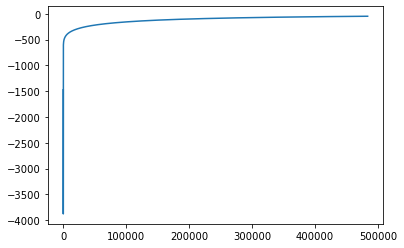

In [132]:
plt.plot(logLikelihoods2)

(d) Read in the file test batch, containing 10,000 test data images and their class labels. Use your estimated logistic regression model to predict the the labels of the airplanes and frogs images in the test data. Again, report your accuracy.

In [213]:
X3, y3 = readCIFAR("test_batch") 

imageN = len(X3)
correct = []
incorrect= []

total = 0
for i in range(imageN):
    temp = beta2.dot(X3[i])
    s = sigmoid(temp)
    if s > 0.5:
        if y3[i] == 1:
            total += 1
            correct.append(i)
        else:
            incorrect.append(i)
    else:
        if y3[i] == 0:
            total += 1
            correct.append(i)
        else:
            incorrect.append(i)
            
accuracy = total / imageN * 100

np.random.shuffle(correct)
np.random.shuffle(incorrect)

print (total)
print(accuracy, "% accuracy")

1230
12.3 % accuracy


(e) From your results, randomly pick ten airplanes and ten frogs examples that were clas- sified correctly. Display these as a grid of images. Do the same for ten airplanes and ten frogs examples that were classified incorrectly. Do the mistakes that your classifier made seem reasonable (in other words, do you think these cases were more difficult)?

In [214]:
correctAirplane = []
incorrectAirplane = []
correctFrog = []
incorrectFrog = []

for i in correct:
    if y3[i] == 0:
        correctAirplane.append(i)
    if len(correctAirplane) == 10:
        break
for i in incorrect:
    if y3[i] == 0:
        incorrectAirplane.append(i)
    if len(incorrectAirplane) == 10:
        break
for i in correct:
    if y3[i] == 6:
        correctFrog.append(i)
    if len(correctFrog) == 10:
        break
for i in incorrect:
    if y3[i] == 6:
        incorrectFrog.append(i)
    if len(incorrectFrog) == 10:
        break

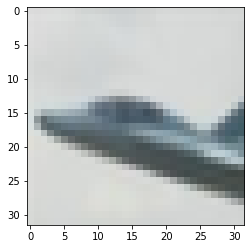

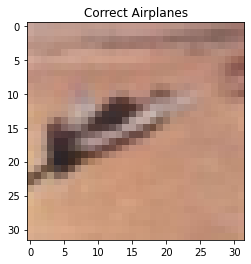

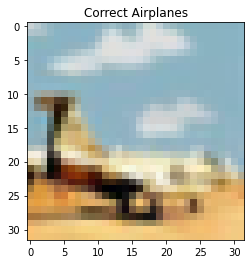

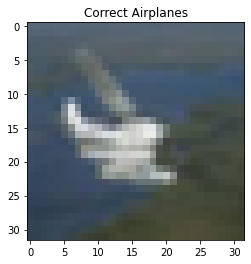

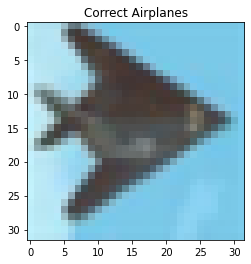

...

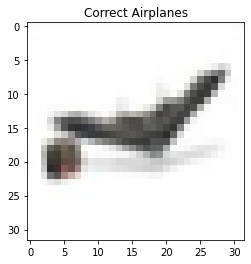

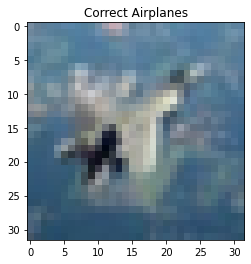

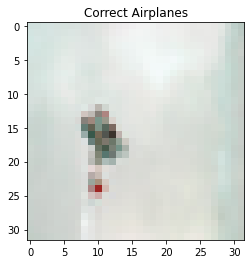

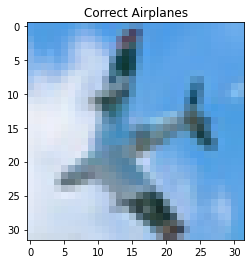

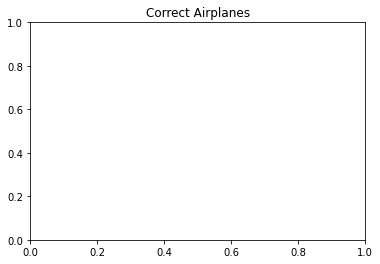

In [215]:
for i in correctAirplane:
    X = X3[i].reshape(32,32,3)
    plt.imshow(X)
    plt.show()
    plt.title("Correct Airplanes")

In [216]:
for i in correctFrog:
    X = X3[i].reshape(32,32,3)
    plt.imshow(X)
    plt.show()
    plt.title("Correct Frogs")

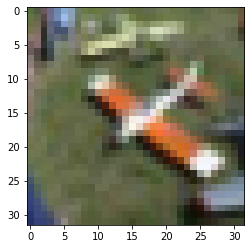

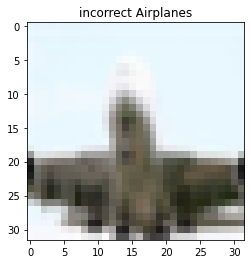

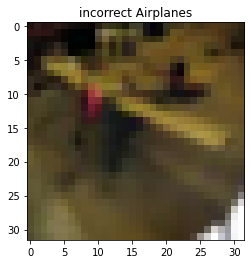

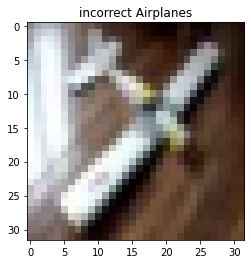

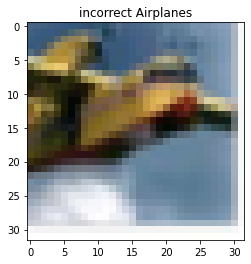

...

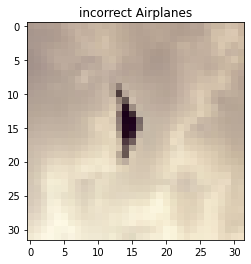

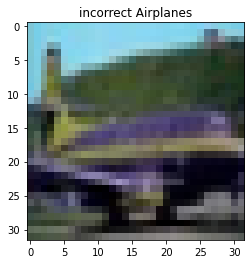

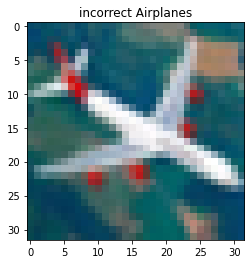

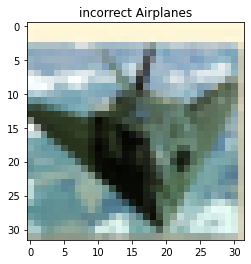

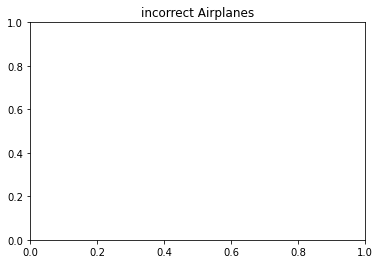

In [217]:
for i in incorrectAirplane:
    X = X3[i].reshape(32,32,3)
    plt.imshow(X)
    plt.show()
    plt.title("incorrect Airplanes")

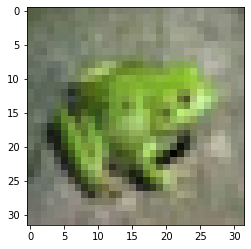

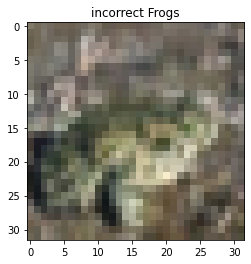

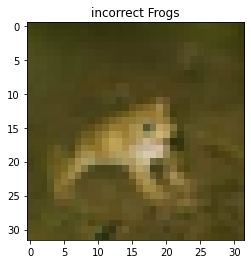

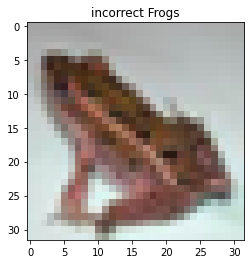

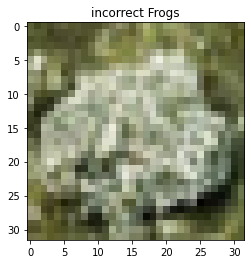

...

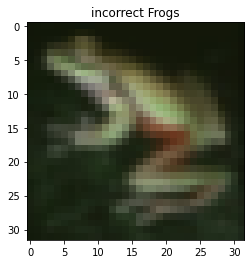

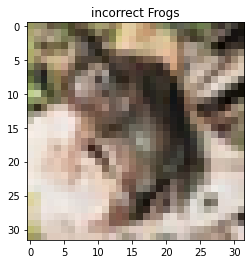

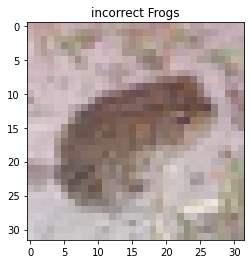

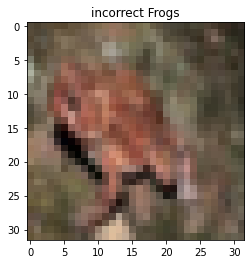

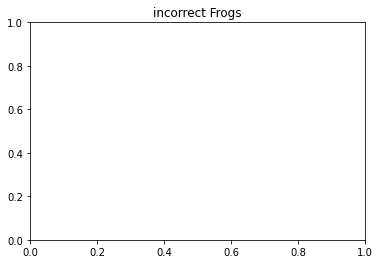

In [218]:
for i in incorrectFrog:
    X = X3[i].reshape(32,32,3)
    plt.imshow(X)
    plt.show()
    plt.title("incorrect Frogs")

The main difference between the correct airplanes and the incorrect airplanes seem to be the amount of color. It is possible that this color threw off the classifier. There seems to be no correct frogs. I can not explain this, and it must be due to an error in my logistic regression.